In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import statsmodels.api as sm
import tensorflow as tf
import xgboost as xgb
import pytz
import re
from datetime import datetime
from pytz import timezone
from sklearn import preprocessing
from sklearn import model_selection
from sklearn import neighbors
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
from tensorflow.keras.layers import Dense,Activation,Dropout
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.models import Sequential
from collections import Counter
from scipy import stats
from sklearn.linear_model import LinearRegression, BayesianRidge, Ridge ,Lasso ,ElasticNet, LassoLarsIC
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import KFold,RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, scale, LabelEncoder  
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from warnings import filterwarnings
filterwarnings('ignore')

ModuleNotFoundError: No module named 'tensorflow'

In [2]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install tensorflow

ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Erişim engellendi: 'c:\\programdata\\anaconda3\\lib\\site-packages\\wrapt-1.11.2.dist-info\\INSTALLER'
Consider using the `--user` option or check the permissions.



  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached protobuf-3.15.6-py2.py3-none-any.whl (173 kB)
  Using cached flatbuffers-1.12-py2.py3-none-any.whl (15 kB)
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4835 sha256=0f5240c2c668e6cfa1e43d59d30d1fcb09566b2076045acb75024cd4bbc4415f
  Stored in directory: c:\users\hamza\appdata\local\pip\cache\wheels\a0\16\9c\5473df82468f958445479c59e784896fa24f4a5fc024b0f501
  Created wheel for wrapt: filename=wrapt-1.12.1-py3-none-any.whl size=19558 sha256=47f7f0022381dcf56251fbce7f32aa14c521b50c0fa58f2cec6223f6f40ae5cd
  Stored in directory: c:\users\hamza\appdata\local\pip\cache\wheels\5f\fd\9e\b6cf5890494cb8ef0b5eaff72e5d55a70fb56316007d6dfe73
Successfully built termcolor wrapt
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.11.2
    Uninstalling wrapt-1.11.2:


In [ ]:
df = pd.read_csv("solar_predict.csv")             #dataframe determined
df.columns=["Date","Time","Power","Load","Temp"]
df

In [4]:
from datetime import datetime
from pytz import timezone
import pytz
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
df.drop(['Load'], axis=1, inplace=True)
df


,Date,Time,Power,Temp
Date,,,,
2015-01-01,1/1/2015,12:00:00 AM,0.000,23.724
2015-01-01,1/1/2015,1:00:00 AM,0.000,23.117
2015-01-01,1/1/2015,2:00:00 AM,0.000,22.713
2015-01-01,1/1/2015,3:00:00 AM,0.000,22.197
2015-01-01,1/1/2015,4:00:00 AM,0.000,21.737
...,...,...,...,...
2015-12-31,12/31/2015,7:00:00 PM,0.059,30.603
2015-12-31,12/31/2015,8:00:00 PM,0.000,28.025
2015-12-31,12/31/2015,9:00:00 PM,0.000,26.521


In [5]:
df['MonthOfYear'] = df.index.strftime('%m').astype(int)
df['DayOfYear'] = df.index.strftime('%j').astype(int)
df['WeekOfYear'] = df.index.strftime('%U').astype(int)

In [6]:
df.index=df.iloc[:,1]
df.index = pd.to_datetime(df.index)
df['TimeOfDay'] = df.index.hour
df.tail(50)

,Date,Time,Power,Temp,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay
Time,,,,,,,,
2021-01-02 22:00:00,12/29/2015,10:00:00 PM,0.000,22.418,12,363,52,22
2021-01-02 23:00:00,12/29/2015,11:00:00 PM,0.000,21.795,12,363,52,23
2021-01-02 00:00:00,12/30/2015,12:00:00 AM,0.000,21.398,12,364,52,0
2021-01-02 01:00:00,12/30/2015,1:00:00 AM,0.000,21.062,12,364,52,1
2021-01-02 02:00:00,12/30/2015,2:00:00 AM,0.000,20.730,12,364,52,2
2021-01-02 03:00:00,12/30/2015,3:00:00 AM,0.000,20.639,12,364,52,3
2021-01-02 04:00:00,12/30/2015,4:00:00 AM,0.000,20.950,12,364,52,4
2021-01-02 05:00:00,12/30/2015,5:00:00 AM,0.000,21.459,12,364,52,5
2021-01-02 06:00:00,12/30/2015,6:00:00 AM,0.116,22.896,12,364,52,6


In [7]:
df.describe()

,Power,Temp,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,0.594862,16.518688,6.525342,182.979224,26.139498,11.500000
std,0.821411,6.806605,3.447954,105.371450,15.057713,6.922582
min,0.000000,1.345000,1.000000,1.000000,0.000000,0.000000
25%,0.000000,11.425500,4.000000,92.000000,13.000000,5.750000
50%,0.002500,15.184000,7.000000,183.000000,26.000000,11.500000
75%,1.171250,20.751750,10.000000,274.000000,39.000000,17.250000
max,2.649000,39.704000,12.000000,365.000000,52.000000,23.000000


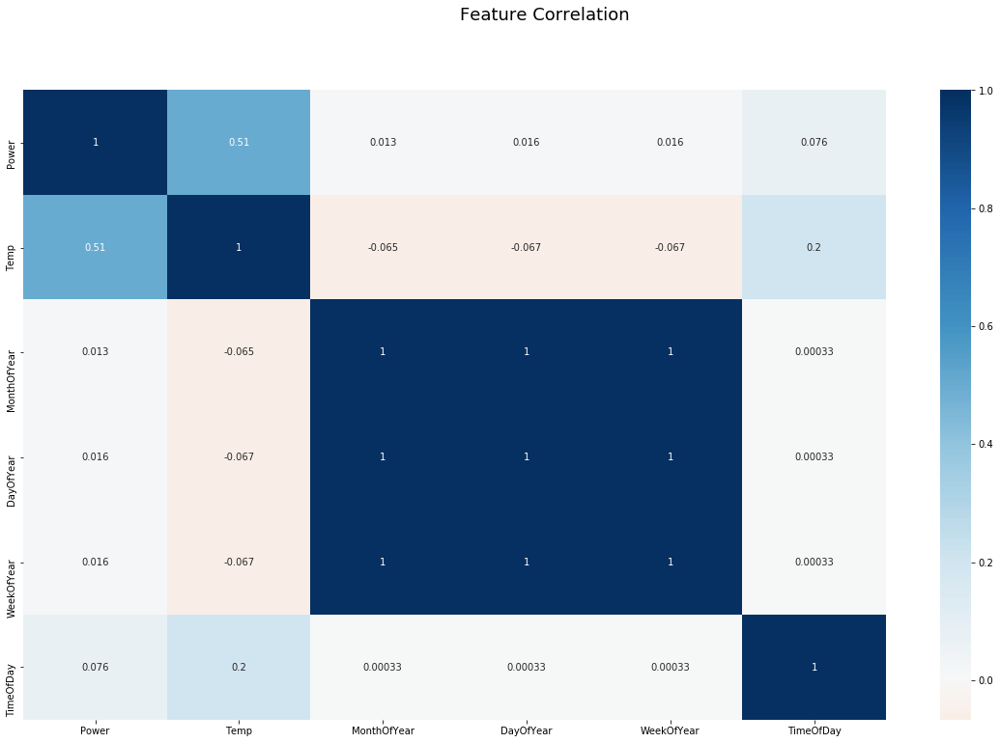

In [8]:
fig = plt.figure(figsize=(20, 12))
fig.suptitle('Feature Correlation', fontsize=18)
sns.heatmap(df.corr(), annot=True, cmap='RdBu', center=0 )

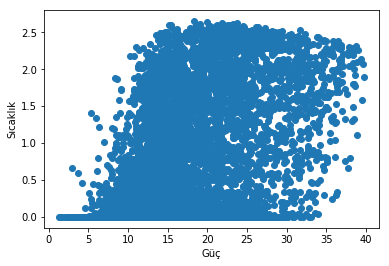

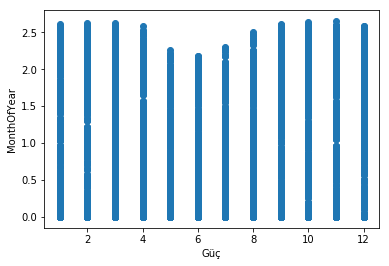

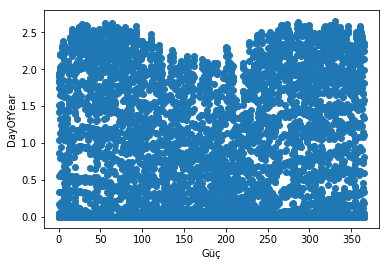

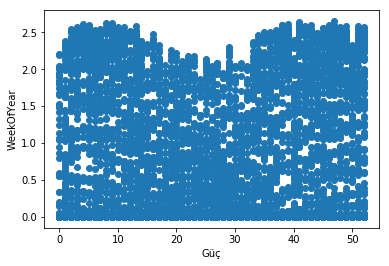

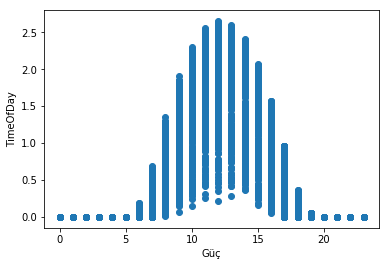

In [9]:
plt.scatter(y = "Power", x = "Temp", data = df)
plt.xlabel("Güç")
plt.ylabel("Sıcaklık")
plt.show()

plt.scatter(y = "Power", x = "MonthOfYear", data = df)
plt.xlabel("Güç")
plt.ylabel("MonthOfYear")
plt.show()

plt.scatter(y = "Power", x = "DayOfYear", data = df)
plt.xlabel("Güç")
plt.ylabel("DayOfYear")
plt.show()

plt.scatter(y = "Power", x = "WeekOfYear", data = df)
plt.xlabel("Güç")
plt.ylabel("WeekOfYear")
plt.show()

plt.scatter(y = "Power", x = "TimeOfDay", data = df)
plt.xlabel("Güç")
plt.ylabel("TimeOfDay")
plt.show()



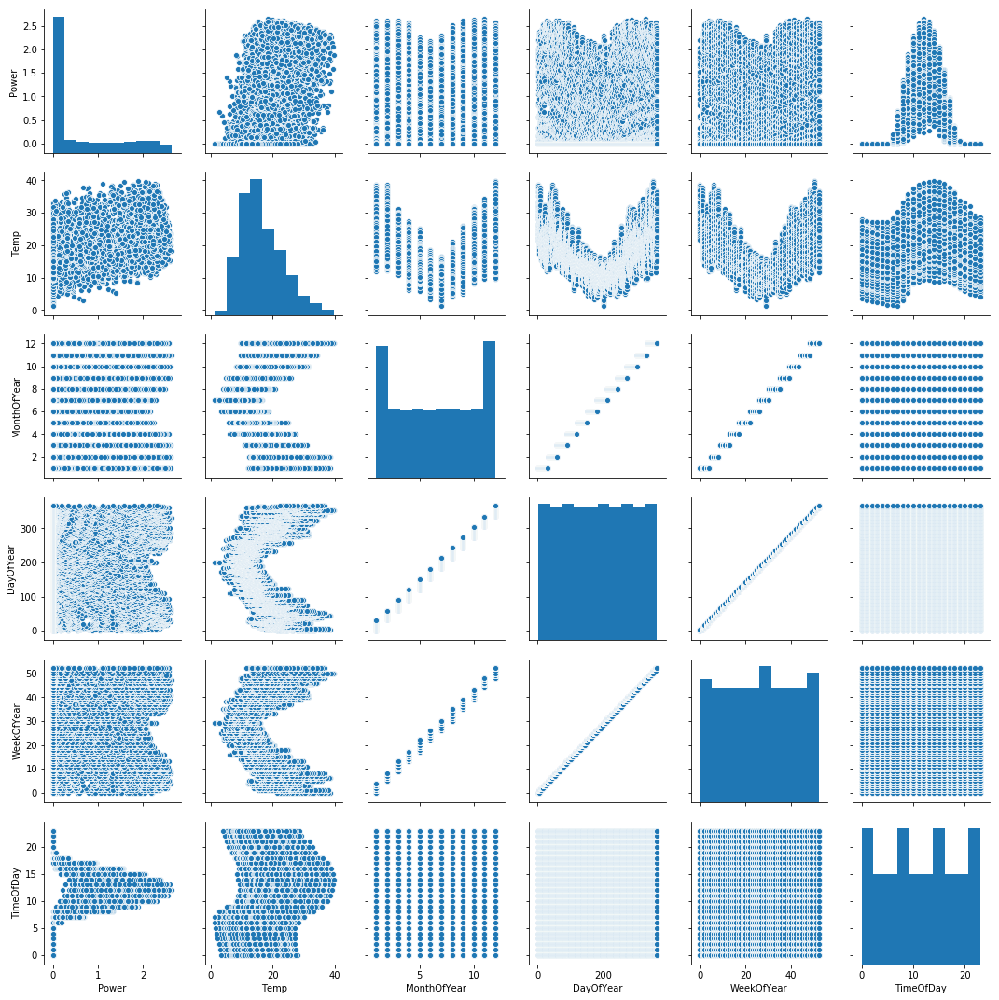

In [10]:
sns.pairplot(df);

In [11]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
lm = sm.OLS(y, X)
model= lm.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Power   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.505
Method:                 Least Squares   F-statistic:                     1792.
Date:                Sat, 02 Jan 2021   Prob (F-statistic):               0.00
Time:                        20:57:16   Log-Likelihood:                -9466.3
No. Observations:                8760   AIC:                         1.894e+04
Df Residuals:                    8755   BIC:                         1.898e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
MonthOfYear    -0.3028      0.023    -13.066      0.000      -0.348      -0.257
DayOfYear       0.0055      0.004      1.422      0.155      -0.002       0.013
WeekOfYear      0.0301      0.027      1.127      0.260      -0.022       0.082
TimeOfDay      -0.0077      0.001     -7.172      0.000      -0.010      -0.006
Temp            0.0538      0.001     56.880      0.000       0.052       0.056
==============================================================================
Omnibus:                      781.176   Durbin-Watson:                   0.117
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1005.095
Skew:                           0.827   Prob(JB):                    5.58e-219
Kurtosis:                       2.860   Cond. No.                         758.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# RANDOM FOREST

In [12]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)  #split

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train, y_train)                             #fit with RandomForestRegressor
feature_importances = regressor.feature_importances_

X_train_best = X_train[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
X_test_best = X_test[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
regressor.fit(X_train_best, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [21]:
accuracies = cross_val_score(estimator = regressor, X = X_train_best,y = y_train, cv = 10, scoring = 'r2',verbose=2)
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s remaining:    0.0s


[CV] ................................................. , total=   1.1s
[CV]  ................................................................
[CV] ................................................. , total=   1.2s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] ................................................. , total=   0.9s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] .

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   11.0s finished


In [126]:
df.index=df.iloc[:,0]   #all the indexes has been defined   integer location
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  regressor.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Power'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

In [69]:


# Sydney 18 aralık hava durumu
print("prediction of values for random forest regression")
print("---------------18-12-2020----------")
print(regressor.predict([[12,18,3,0,23]]))
print(regressor.predict([[12,18,3,1,22]]))
print(regressor.predict([[12,18,3,2,22]]))
print(regressor.predict([[12,18,3,3,22]]))
print(regressor.predict([[12,18,3,4,22]]))
print(regressor.predict([[12,18,3,5,22]]))
print(regressor.predict([[12,18,3,6,22]]))
print(regressor.predict([[12,18,3,7,23]]))
print(regressor.predict([[12,18,3,8,25]]))
print(regressor.predict([[12,18,3,9,27]]))
print(regressor.predict([[12,18,3,10,29]]))
print(regressor.predict([[12,18,3,11,30]]))
print(regressor.predict([[12,18,3,12,30]]))
print(regressor.predict([[12,18,3,13,27]]))
print(regressor.predict([[12,18,3,14,27]]))
print(regressor.predict([[12,18,3,15,27]]))
print(regressor.predict([[12,18,3,16,26]]))
print(regressor.predict([[12,18,3,17,25]]))
print(regressor.predict([[12,18,3,18,25]]))
print(regressor.predict([[12,18,3,19,24]]))
print(regressor.predict([[12,18,3,20,23]]))
print(regressor.predict([[12,18,3,21,23]]))
print(regressor.predict([[12,18,3,22,23]]))
print(regressor.predict([[12,18,3,23,23]]))
print("---------------18-01-2020-----------------")
print(regressor.predict([[12,18,3,0,19]]))
print(regressor.predict([[12,18,3,1,17]]))
print(regressor.predict([[12,18,3,2,17]]))
print(regressor.predict([[12,18,3,3,17]]))
print(regressor.predict([[12,18,3,4,16]]))
print(regressor.predict([[12,18,3,5,16]]))
print(regressor.predict([[12,18,3,6,18]]))
print(regressor.predict([[12,18,3,7,17]]))
print(regressor.predict([[12,18,3,8,18]]))
print(regressor.predict([[12,18,3,9,18]]))
print(regressor.predict([[12,18,3,10,19]]))
print(regressor.predict([[12,18,3,11,20]]))
print(regressor.predict([[12,18,3,12,20]]))
print(regressor.predict([[12,18,3,13,21]]))
print(regressor.predict([[12,18,3,14,22]]))
print(regressor.predict([[12,18,3,15,23]]))
print(regressor.predict([[12,18,3,16,22]]))
print(regressor.predict([[12,18,3,17,22]]))
print(regressor.predict([[12,18,3,18,22]]))
print(regressor.predict([[12,18,3,19,22]]))
print(regressor.predict([[12,18,3,20,22]]))
print(regressor.predict([[12,18,3,21,22]]))
print(regressor.predict([[12,18,3,22,22]]))
print(regressor.predict([[12,18,3,23,21]]))


prediction of values for random forest regression
---------------18-12-2020----------
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[0.14331]
[0.39009]
[1.14871]
[1.05258]
[1.65502]
[2.13674]
[2.12717]
[2.3602]
[2.23401]
[1.71173]
[1.36374]
[0.91805]
[0.3476]
[0.02974]
[0.]
[0.]
[0.]
[0.]
---------------18-01-2020-----------------
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[0.14331]
[0.39009]
[1.14871]
[1.05258]
[1.65502]
[2.13674]
[2.12717]
[2.3602]
[2.23401]
[1.71173]
[1.36374]
[0.91805]
[0.3476]
[0.02974]
[0.]
[0.]
[0.]
[0.]


In [ ]:
for i in range(0,24):
    print((regressor.predict([[12,18,3,i,21]])))

# XGBOOST

In [127]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
import xgboost
from xgboost import XGBRegressor
xgb = XGBRegressor().fit(X_train, y_train)  #fit
y_pred = xgb.predict(X_test)                #predict
np.sqrt(mean_squared_error(y_test, y_pred)) #mse

0.1650762299475735

In [128]:
#lgbm
#'min_data_in_leaf':300 
#'feature_fraction':0.8 
#'bagging_fraction':0.8,
#'bagging_freq':10
#'max_depth':8,
#'num_leaves':70,
#'learning_rate':0.04
#xgbm
#{'gamma': 0,
#'learning_rate': 0.3,
#'max_depth': 4,
#'n_estimators': 500,
#'subsample': 0.8}
xgb = XGBRegressor()
xgb_params = {"learning_rate": [0.1,0.01,0.5],
             "max_depth": [2,3,4,5,8],
             "n_estimators": [100,200,500,1000],
             "colsample_bytree": [0.4,0.7,1]}

In [ ]:
xgb_cv_model  = GridSearchCV(xgb,xgb_params, cv = 5, verbose = 2).fit(X_train, y_train)

In [16]:
xgb_cv_model.best_params_

NameError: name 'xgb_cv_model' is not defined

In [129]:
xgb_tuned = XGBRegressor(colsample_bytree=1,learning_rate=0.01,max_depth=4,n_estimators=500).fit(X_train,y_train)

In [130]:
y_pred = xgb_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,y_pred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.23723758240871504
r2 = 0.9173746310858124


In [60]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  xgb_tuned.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Power'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

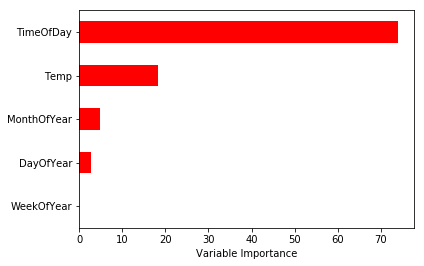

In [307]:
Importance = pd.DataFrame({'Importance':xgb_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

# LGBM

In [13]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
from lightgbm import LGBMRegressor
lgb_model = LGBMRegressor().fit(X_train, y_train)
y_pred = lgb_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.19303654851727325

In [14]:
lgb_model = LGBMRegressor()
lgbm_params = {"learning_rate": [0.01, 0.1, 0.5, 1],
              "n_estimators": [20,40,100,200,500,1000],
              "max_depth": [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]}

In [182]:
lgbm_cv_model = GridSearchCV(lgb_model, 
                             lgbm_params, 
                             cv = 10,  
                             verbose =2).fit(X_train, y_train)

Fitting 10 folds for each of 384 candidates, totalling 3840 fits
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s



[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=40 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=40, total=   0.0s
[CV] 

KeyboardInterrupt: 

In [258]:
lgbm_cv_model.best_params_

{'learning_rate': 0.1, 'max_depth': 15, 'n_estimators': 1000}

In [15]:
lgbm_tuned = LGBMRegressor(learning_rate = 0.1, 
                          max_depth = 15, 
                          n_estimators = 1000).fit(X_train, y_train)

In [16]:
ypred=lgbm_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.17418120914655105
r2 = 0.9452951892593882


In [23]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  lgbm_tuned.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="FV Elektrik Üretim Tahmini",
           x_axis_label='Tarih ve Zaman',
           y_axis_label='Elektrik Üretimi[kW]',
           x_axis_type="datetime")

p.line(df.index, df['Power'], legend='Gözlemlenen Elektrik Üretimi', line_width=1)
p.line(df.index, df['y_pred'], legend='Tahmin edilen Elektrik Üretimi ', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

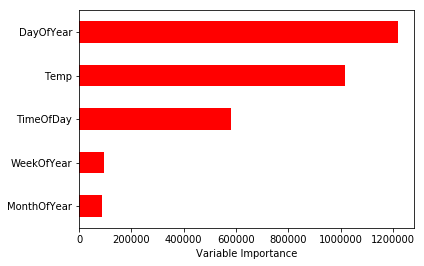

In [31]:
Importance = pd.DataFrame({'Importance':lgbm_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

In [24]:
print("---------------12-1------------")
print(lgbm_tuned.predict([[12,1,1,0,15]]))
print(lgbm_tuned.predict([[12,1,1,1,15]]))
print(lgbm_tuned.predict([[12,1,1,2,14]]))
print(lgbm_tuned.predict([[12,1,1,3,14]]))
print(lgbm_tuned.predict([[12,1,1,4,14]]))
print(lgbm_tuned.predict([[12,1,1,5,14]]))
print(lgbm_tuned.predict([[12,1,1,6,15]]))
print(lgbm_tuned.predict([[12,1,1,7,16]]))
print(lgbm_tuned.predict([[12,1,1,8,17]]))
print(lgbm_tuned.predict([[12,1,1,9,17]]))
print(lgbm_tuned.predict([[12,1,1,10,18]]))
print(lgbm_tuned.predict([[12,1,1,11,18]]))
print(lgbm_tuned.predict([[12,1,1,12,18]]))
print(lgbm_tuned.predict([[12,1,1,13,18]]))
print(lgbm_tuned.predict([[12,1,1,14,19]]))
print(lgbm_tuned.predict([[12,1,1,15,18]]))
print(lgbm_tuned.predict([[12,1,1,16,17]]))
print(lgbm_tuned.predict([[12,1,1,17,16]]))
print(lgbm_tuned.predict([[12,1,1,18,15]]))
print(lgbm_tuned.predict([[12,1,1,19,14]]))
print(lgbm_tuned.predict([[12,1,1,20,13]]))
print(lgbm_tuned.predict([[12,1,1,21,13]]))
print(lgbm_tuned.predict([[12,1,1,22,12]]))
print(lgbm_tuned.predict([[12,1,1,23,12]]))
print("---------------1-4------------")
print(lgbm_tuned.predict([[4,1,14,0,21]]))
print(lgbm_tuned.predict([[4,1,14,1,21]]))
print(lgbm_tuned.predict([[4,1,14,2,20]]))
print(lgbm_tuned.predict([[4,1,14,3,20]]))
print(lgbm_tuned.predict([[4,1,14,4,20]]))
print(lgbm_tuned.predict([[4,1,14,5,19]]))
print(lgbm_tuned.predict([[4,1,14,6,19]]))
print(lgbm_tuned.predict([[4,1,14,7,20]]))
print(lgbm_tuned.predict([[4,1,14,8,21]]))
print(lgbm_tuned.predict([[4,1,14,9,23]]))
print(lgbm_tuned.predict([[4,1,14,10,24]]))
print(lgbm_tuned.predict([[4,1,14,11,26]]))
print(lgbm_tuned.predict([[4,1,14,12,27]]))
print(lgbm_tuned.predict([[4,1,14,13,27]]))
print(lgbm_tuned.predict([[4,1,14,14,27]]))
print(lgbm_tuned.predict([[4,1,14,15,25]]))
print(lgbm_tuned.predict([[4,1,14,16,23]]))
print(lgbm_tuned.predict([[4,1,14,17,22]]))
print(lgbm_tuned.predict([[4,1,14,18,20]]))
print(lgbm_tuned.predict([[4,1,14,19,20]]))
print(lgbm_tuned.predict([[4,1,14,20,19]]))
print(lgbm_tuned.predict([[4,1,14,21,18]]))
print(lgbm_tuned.predict([[4,1,14,22,18]]))
print(lgbm_tuned.predict([[4,1,14,23,17]]))
print("---------------1-7------------")
print(lgbm_tuned.predict([[7,1,27,0,8]]))
print(lgbm_tuned.predict([[7,1,27,1,7]]))
print(lgbm_tuned.predict([[7,1,27,2,6]]))
print(lgbm_tuned.predict([[7,1,27,3,6]]))
print(lgbm_tuned.predict([[7,1,27,4,5]]))
print(lgbm_tuned.predict([[7,1,27,5,5]]))
print(lgbm_tuned.predict([[7,1,27,6,5]]))
print(lgbm_tuned.predict([[7,1,27,7,4]]))
print(lgbm_tuned.predict([[7,1,27,8,5]]))
print(lgbm_tuned.predict([[7,1,27,9,8]]))
print(lgbm_tuned.predict([[7,1,27,10,10]]))
print(lgbm_tuned.predict([[7,1,27,11,11]]))
print(lgbm_tuned.predict([[7,1,27,12,12]]))
print(lgbm_tuned.predict([[7,1,27,13,13]]))
print(lgbm_tuned.predict([[7,1,27,14,13]]))
print(lgbm_tuned.predict([[7,1,27,15,12]]))
print(lgbm_tuned.predict([[7,1,27,16,11]]))
print(lgbm_tuned.predict([[7,1,27,17,10]]))
print(lgbm_tuned.predict([[7,1,27,18,10]]))
print(lgbm_tuned.predict([[7,1,27,19,9]]))
print(lgbm_tuned.predict([[7,2,27,20,9]]))
print(lgbm_tuned.predict([[7,1,27,21,8]]))
print(lgbm_tuned.predict([[7,1,27,22,8]]))
print(lgbm_tuned.predict([[7,1,27,23,7]]))
print("---------------1-10------------")
print(lgbm_tuned.predict([[10,1,40,0,12]]))
print(lgbm_tuned.predict([[10,1,40,1,12]]))
print(lgbm_tuned.predict([[10,1,40,2,11]]))
print(lgbm_tuned.predict([[10,1,40,3,10]]))
print(lgbm_tuned.predict([[10,1,40,4,10]]))
print(lgbm_tuned.predict([[10,1,40,5,10]]))
print(lgbm_tuned.predict([[10,1,40,6,9]]))
print(lgbm_tuned.predict([[10,1,40,7,11]]))
print(lgbm_tuned.predict([[10,1,40,8,14]]))
print(lgbm_tuned.predict([[10,1,40,9,17]]))
print(lgbm_tuned.predict([[10,1,40,10,20]]))
print(lgbm_tuned.predict([[10,1,40,11,21]]))
print(lgbm_tuned.predict([[10,1,40,12,22]]))
print(lgbm_tuned.predict([[10,1,40,13,23]]))
print(lgbm_tuned.predict([[10,1,40,14,23]]))
print(lgbm_tuned.predict([[10,1,40,15,23]]))
print(lgbm_tuned.predict([[10,1,40,16,22]]))
print(lgbm_tuned.predict([[10,1,40,17,21]]))
print(lgbm_tuned.predict([[10,1,40,18,18]]))
print(lgbm_tuned.predict([[10,1,40,19,16]]))
print(lgbm_tuned.predict([[10,1,40,20,15]]))
print(lgbm_tuned.predict([[10,1,40,21,14]]))
print(lgbm_tuned.predict([[10,1,40,22,13]]))
print(lgbm_tuned.predict([[10,1,40,23,13]]))


---------------12-1------------
[-0.01866961]
[-0.01866961]
[-0.02352838]
[-0.02393197]
[-0.02617965]
[-0.02717184]
[0.13570267]
[0.43237277]
[1.05914151]
[1.26431205]
[1.60131733]
[1.79908675]
[1.65045305]
[1.63500343]
[1.38228673]
[0.95817185]
[0.75161807]
[0.20758279]
[0.07868184]
[-0.05207279]
[0.00556712]
[0.00072002]
[-0.02744617]
[-0.02744617]
---------------1-4------------
[0.04825715]
[0.04825715]
[0.11189701]
[0.11408301]
[0.114896]
[0.11533428]
[0.2709372]
[0.54802677]
[1.14710734]
[1.37967065]
[1.56557643]
[1.6738415]
[1.77464815]
[1.67763409]
[1.45794732]
[1.1164361]
[0.92843852]
[0.58471607]
[0.23770969]
[0.02336968]
[-0.01998661]
[-0.04356499]
[-0.03973697]
[0.00225409]
---------------1-7------------
[-0.0081948]
[-0.01251495]
[-0.00679992]
[-0.00704716]
[-0.02363442]
[-0.02041864]
[0.00208463]
[0.06596701]
[0.47173624]
[0.77771974]
[0.97113071]
[0.98326407]
[1.05282647]
[1.21191246]
[1.06707802]
[0.44378252]
[0.17678887]
[-0.0060253]
[-0.13892807]
[-0.16870315]
[-0.1628

# Gradient Boosting

In [34]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
gbm_model = GradientBoostingRegressor().fit(X_train, y_train)
y_pred = gbm_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.23524972470655597

In [35]:
gbm_model = GradientBoostingRegressor().fit(X_train, y_train)
gbm_params = {"learning_rate": [0.001,0.1,0.01],
             "max_depth": [3,5,8],
             "n_estimators": [100,200,500],
             "subsample": [1,0.5,0.8],
             "loss": ["ls","lad","quantile"]}
gbm_model = GradientBoostingRegressor().fit(X_train, y_train)

In [267]:
gbm_cv_model = GridSearchCV(gbm_model, 
                            gbm_params, 
                            cv = 10, 
                            verbose = 2).fit(X_train, y_train)

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_de

[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=

[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.001, loss=ls, ma

[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=

[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=1, total=   0.6s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.

[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   1.5s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   1.4s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   1.4s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   1.6s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   4.2s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   3.9s
[CV] learning_rate=0.001, l

[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.3s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.3s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.3s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.2s
[CV] lea

[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=200, subsample=0.8, total=   1.2s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   2.0s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   2.1s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   2.4s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   2.0s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   1.7s
[CV] learning_rate=0.001, lo

[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.5s
[CV] lea

[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   2.7s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   3.0s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   3.0s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   3.3s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   3.1s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   3.3s
[CV] learning_rate=0.001, loss

[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   1.0s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   1.0s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   1.1s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   1.0s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   0.9s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   1.1s
[CV] lea

[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1, total=   6.1s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1, total=   6.7s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1, total=   6.2s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   5.5s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   5.9s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   5.2s
[CV] learning_rate

[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, 

[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   2.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   1.9s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   2.0s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   2.0s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5, total=   2.2s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=5

[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, 

[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.6s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.6s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, su

[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5, total=   1.1s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5, total=   1.1s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8, total=   1.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8, total=   1.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8, total=   1.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, 

[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1, total=   6.8s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1, total=   7.9s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1, total=   6.9s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1, total=   7.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1, total=   7.0s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=500, su

[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.5, total=   0.1s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.5, total=   0.1s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8, total=   0.1s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8, total=   0.1s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8, total=   0.1s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=100, subsample=0.8, total=   0.1s
[CV] learning_rate=0.1, loss=ls, max_dept

[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=1, total=   0.9s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=1, total=   1.2s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=1, total=   1.4s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=1, total=   1.0s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=0.5, total=   1.3s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=3, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.1, loss=ls, max_depth=3, n_estimat

[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.1, loss=ls, max_dept

[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5, total=   1.8s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5, total=   1.5s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=5, n_estimators=500, subsample=0.5, total=   1.5s
[CV] learning_rate=0.1, loss=ls, max_dept

[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1, total=   1.3s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1, total=   1.3s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1, total=   1.3s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1, total=   1.3s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1, total=   1.4s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200, subsample=1, total=   1.2s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=200,

[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.5, total=   3.5s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.5, total=   3.8s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8, total=   5.0s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8, total=   4.7s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8, total=   3.5s
[CV] learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=ls, max_depth=8, n_estimators=500, subsample=0.8, total=   3.5s
[CV] learning_rate=0.1, loss=ls, max_dept

[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1, total=   0.5s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1, total=   0.6s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1, total=   0.6s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=1, total=   0.7s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=0.5, total=   0.7s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=200, subsample=0.5, total=   0.8s
[CV] learning_rate=0.1, loss=lad, max_depth=

[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8, total=   1.6s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8, total=   1.7s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8, total=   1.7s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8, total=   1.7s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8, total=   1.8s
[CV] learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=3, n_estimators=500, subsample=0.8, total=   1.9s
[CV] learning_rate=0.1, loss=l

[CV]  learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5, total=   1.1s
[CV] learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5, total=   1.2s
[CV] learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5, total=   1.1s
[CV] learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5, total=   1.1s
[CV] learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5, total=   1.4s
[CV] learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=5, n_estimators=200, subsample=0.5, total=   1.3s
[CV] learning_rate=0.1, loss=l

[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1, total=   1.4s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1, total=   1.6s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1, total=   1.5s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1, total=   1.4s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1, total=   1.3s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=100, subsample=1, total=   1.6s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_est

[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.5, total=   2.2s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.5, total=   2.6s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8, total=   2.6s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8, total=   2.6s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8, total=   2.6s
[CV] learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=lad, max_depth=8, n_estimators=200, subsample=0.8, total=   3.3s
[CV] learning_rate=0.1, loss=l

[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=1, total=   0.3s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=100, subsample=0.5, total= 

[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8, total=   0.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8, total=   0.8s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8, total=   0.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8, total=   0.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=3, n_estimators=200, subs

[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1, total=   0.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1, total=   0.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1, total=   0.6s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1, total=   0.6s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=1, total=   0.6s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=100, subsample=0.5, total= 

[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8, total=   1.5s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8, total=   1.5s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8, total=   1.6s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8, total=   1.2s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8, total=   1.5s
[CV] learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=5, n_estimators=200, subs

[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1, total=   1.4s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1, total=   1.4s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1, total=   1.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1, total=   1.6s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=1, total=   1.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5, total= 

[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8, total=   2.9s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8, total=   3.1s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8, total=   3.1s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8, total=   3.3s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8, total=   2.7s
[CV] learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.1, loss=quantile, max_depth=8, n_estimators=200, subs

[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=100, subsample=0.5, total=   0.1s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n

[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.5s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.5s
[CV] learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.01, loss=

[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.3s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.3s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.3s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.01, loss=

[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.7s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1, total=   1.7s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1, total=   1.7s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1, total=   2.2s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1, total=   1.8s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=5, n_estimators=500, subsample=1, total=   1.7s
[CV] learning_rate=0.01, loss=ls, max_depth=5, n_e

[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.6s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.6s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.6s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.8, total=   0.7s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.8, total=   0.6s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=100, subsample=0.8, total=   0.6s
[CV] learning_rate=0.01, loss=

[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   3.6s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   3.6s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   3.6s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   3.7s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   3.8s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=ls, max_depth=8, n_estimators=500, subsample=0.5, total=   3.1s
[CV] learning_rate=0.01, loss=ls, max_depth=8, n

[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=

[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   1.6s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5, total=   1.4s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5, total=   1.5s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5, total=   1.5s
[CV] learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=3, n_estimators=500, subsample=0.5, total=   1.5s
[CV] learning_rate=0.

[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.5s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.5s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.6s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.6s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=200, subsample=1, total=   1.1s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=200, subsample=1, total=   1.1s
[CV] learning_rate=0.01, lo

[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5, total=   2.5s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5, total=   2.6s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5, total=   2.5s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5, total=   2.5s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5, total=   2.5s
[CV] learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=5, n_estimators=500, subsample=0.5, total=   2.7s
[CV] learning_rate=

[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1, total=   2.9s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1, total=   3.0s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1, total=   2.8s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1, total=   2.9s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1, total=   3.1s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=200, subsample=1, total=   2.8s
[CV] learning_rate=0.01, loss=lad, max_de

[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   6.5s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   6.0s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   6.0s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.8, total=   6.3s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.8, total=   6.8s
[CV] learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=lad, max_depth=8, n_estimators=500, subsample=0.8, total=   7.0s
[CV] learning_rate=

[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1, total=   0.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1, total=   0.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1, total=   0.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1, total=   0.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1, total=   0.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=200, subsample=1, 

[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.8, total=   1.9s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.8, total=   1.7s
[CV] learning_rate=0.01, loss=quantile, max_depth=3, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=3, n_estimator

[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1, total=   1.2s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1, total=   1.2s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1, total=   1.2s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1, total=   1.3s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1, total=   1.2s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=200, subsample=1, 

[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.5, total=   2.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.5, total=   2.5s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.5, total=   2.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.8, total=   2.8s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.8, total=   2.9s
[CV] learning_rate=0.01, loss=quantile, max_depth=5, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=5, n_estimator

[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1, total=   3.1s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1, total=   3.3s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1, total=   3.2s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1, total=   3.3s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1, total=   3.2s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=200, subsample=1, 

[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5, total=   5.5s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5, total=   5.6s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.5, total=   5.8s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.8, total=   6.7s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.8, total=   6.8s
[CV] learning_rate=0.01, loss=quantile, max_depth=8, n_estimators=500, subsample=0.8 
[CV]  learning_rate=0.01, loss=quantile, max_depth=8, n_estimator

[Parallel(n_jobs=1)]: Done 2430 out of 2430 | elapsed: 74.9min finished


In [ ]:
gbm_cv_model.best_params_

In [37]:
gbm_tuned = GradientBoostingRegressor(learning_rate = 0.1,
                                     loss = "ls",
                                     max_depth = 8,
                                     n_estimators = 500,
                                     subsample = 0.8).fit(X_train, y_train)

In [38]:
ypred=gbm_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.1544365724666856
r2 = 0.9187534964771846


In [39]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  gbm_tuned.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Power'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

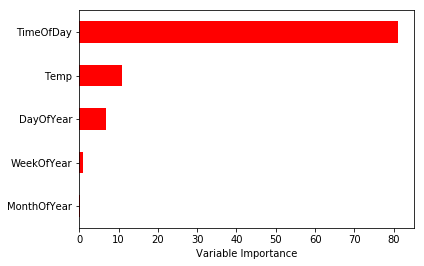

In [40]:
Importance = pd.DataFrame({'Importance':gbm_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

In [362]:
X = df[['DayOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
gbm_model = GradientBoostingRegressor().fit(X_train, y_train)
y_pred = gbm_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.23524972470655597

In [363]:
gbm_model = GradientBoostingRegressor().fit(X_train, y_train)
gbm_params = {"learning_rate": [0.001,0.1,0.01],
             "max_depth": [3,5,8],
             "n_estimators": [100,200,500],
             "subsample": [1,0.5,0.8],
             "loss": ["ls","lad","quantile"]}
gbm_model = GradientBoostingRegressor().fit(X_train, y_train)

In [335]:
gbm_cv_model = GridSearchCV(gbm_model, 
                            gbm_params, 
                            cv = 10, 
                            verbose = 2).fit(X_train, y_train)

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=100, subsample=1, total=   0.1s
[CV] learning_rate=0.001, loss=ls, max_de

[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.5, total=   0.3s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=3, n_estimators=200, subsample=0.8, total=   0.4s
[CV] learning_rate=

[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.2s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.2s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.2s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.2s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=1, total=   0.2s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.001, loss=ls, ma

[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.8s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.8s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.9s
[CV] learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=5, n_estimators=200, subsample=0.8, total=   0.6s
[CV] learning_rate=

[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=1, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.

[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   0.9s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   0.9s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   0.9s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=200, subsample=0.8, total=   1.0s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   2.5s
[CV] learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=ls, max_depth=8, n_estimators=500, subsample=1, total=   2.6s
[CV] learning_rate=0.001, l

[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.2s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=100, subsample=0.5, total=   0.2s
[CV] lea

[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=200, subsample=0.8, total=   0.5s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   1.5s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   1.6s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   1.5s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   1.6s
[CV] learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=3, n_estimators=500, subsample=1, total=   1.7s
[CV] learning_rate=0.001, lo

[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.5s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.5, total=   0.3s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] lea

[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   2.5s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   2.6s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   2.4s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   2.7s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   2.6s
[CV] learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=5, n_estimators=500, subsample=1, total=   2.4s
[CV] learning_rate=0.001, loss

[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   0.8s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   0.8s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   0.8s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   0.9s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   0.8s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=100, subsample=0.8, total=   0.9s
[CV] lea

[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1, total=   4.9s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1, total=   5.3s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=1, total=   6.2s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   4.7s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   5.8s
[CV] learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=lad, max_depth=8, n_estimators=500, subsample=0.5, total=   4.5s
[CV] learning_rate

[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.2s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8, total=   0.3s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, 

[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   1.6s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   1.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   1.7s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=1, total=   1.5s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5, total=   1.6s
[CV] learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=500, subsample=0.5 
[CV]  learning_rate=0.001, loss=quantile, max_depth=3, n_estimators=5

[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8, total=   0.4s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, 

[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.0s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   2.9s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.1s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   3.0s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1, total=   2.8s
[CV] learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, subsample=1 
[CV]  learning_rate=0.001, loss=quantile, max_depth=5, n_estimators=500, su

[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5, total=   0.9s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.5, total=   0.9s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8, total=   1.1s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8, total=   1.1s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8, total=   1.2s
[CV] learning_rate=0.001, loss=quantile, max_depth=8, n_estimators=100, subsample=0.8 
[CV]  learning_rate=0.001, loss=quantile, max_depth=8, 

KeyboardInterrupt: 

In [269]:
gbm_cv_model.best_params_

{'learning_rate': 0.1,
 'loss': 'ls',
 'max_depth': 8,
 'n_estimators': 500,
 'subsample': 0.8}

In [364]:
gbm_tuned = GradientBoostingRegressor(learning_rate = 0.1,
                                     loss = "ls",
                                     max_depth = 8,
                                     n_estimators = 500,
                                     subsample = 0.8).fit(X_train, y_train)

In [365]:
ypred=gbm_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.14957481222727806
r2 = 0.9187534964771846


In [367]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  gbm_tuned.predict(df[['DayOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Power'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# ANN

In [284]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
scaler.fit(X_test)
X_test_scaled = scaler.transform(X_test)
mlp_model = MLPRegressor().fit(X_train_scaled, y_train)

In [285]:
mlp_model.predict(X_test_scaled)[0:5]

array([-0.03754378,  0.00980064,  0.76631801, -0.00811335,  1.10942857])

In [286]:
y_pred = mlp_model.predict(X_test_scaled)
np.sqrt(mean_squared_error(y_test, y_pred))

0.23956417704731997

In [287]:
mlp_params = {"alpha": [0.1, 0.01, 0.02, 0.001, 0.0001], 
             "hidden_layer_sizes": [(10,20), (5,5), (100,100)]}

In [288]:
mlp_cv_model = GridSearchCV(mlp_model,mlp_params,cv =10, verbose =2).fit(X_train_scaled,y_train)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   2.1s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s remaining:    0.0s


[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   2.3s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................
[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   2.5s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................
[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   3.0s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................
[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   1.9s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................
[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   2.1s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................
[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   1.2s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................
[CV] ........... alpha=0.1, hidden_layer_sizes=(10, 20), total=   1.7s
[CV] alpha=0.1, hidden_layer_sizes=(10, 20) ..........................
[CV] .

[CV] ........ alpha=0.01, hidden_layer_sizes=(100, 100), total=   4.9s
[CV] alpha=0.02, hidden_layer_sizes=(10, 20) .........................
[CV] .......... alpha=0.02, hidden_layer_sizes=(10, 20), total=   2.1s
[CV] alpha=0.02, hidden_layer_sizes=(10, 20) .........................
[CV] .......... alpha=0.02, hidden_layer_sizes=(10, 20), total=   2.2s
[CV] alpha=0.02, hidden_layer_sizes=(10, 20) .........................
[CV] .......... alpha=0.02, hidden_layer_sizes=(10, 20), total=   2.0s
[CV] alpha=0.02, hidden_layer_sizes=(10, 20) .........................
[CV] .......... alpha=0.02, hidden_layer_sizes=(10, 20), total=   2.2s
[CV] alpha=0.02, hidden_layer_sizes=(10, 20) .........................
[CV] .......... alpha=0.02, hidden_layer_sizes=(10, 20), total=   1.9s
[CV] alpha=0.02, hidden_layer_sizes=(10, 20) .........................
[CV] .......... alpha=0.02, hidden_layer_sizes=(10, 20), total=   2.1s
[CV] alpha=0.02, hidden_layer_sizes=(10, 20) .........................
[CV] .

[CV] ....... alpha=0.001, hidden_layer_sizes=(100, 100), total=   4.9s
[CV] alpha=0.001, hidden_layer_sizes=(100, 100) ......................
[CV] ....... alpha=0.001, hidden_layer_sizes=(100, 100), total=  10.0s
[CV] alpha=0.001, hidden_layer_sizes=(100, 100) ......................
[CV] ....... alpha=0.001, hidden_layer_sizes=(100, 100), total=   9.1s
[CV] alpha=0.0001, hidden_layer_sizes=(10, 20) .......................
[CV] ........ alpha=0.0001, hidden_layer_sizes=(10, 20), total=   3.4s
[CV] alpha=0.0001, hidden_layer_sizes=(10, 20) .......................
[CV] ........ alpha=0.0001, hidden_layer_sizes=(10, 20), total=   3.0s
[CV] alpha=0.0001, hidden_layer_sizes=(10, 20) .......................
[CV] ........ alpha=0.0001, hidden_layer_sizes=(10, 20), total=   2.0s
[CV] alpha=0.0001, hidden_layer_sizes=(10, 20) .......................
[CV] ........ alpha=0.0001, hidden_layer_sizes=(10, 20), total=   1.7s
[CV] alpha=0.0001, hidden_layer_sizes=(10, 20) .......................
[CV] .

[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed: 10.1min finished


In [289]:
mlp_cv_model.best_params_

{'alpha': 0.0001, 'hidden_layer_sizes': (100, 100)}

In [290]:
#final
mlp_tuned = MLPRegressor(alpha = 0.0001, hidden_layer_sizes = (100,100)).fit(X_train_scaled, y_train)

In [291]:
y_pred = mlp_tuned.predict(X_test_scaled)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.15222953808939374
r2 = 0.9156993210635451


# KNN

In [310]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [311]:
RMSE=[]

for k in range(50):
    k+=1
    knn_model =KNeighborsRegressor(n_neighbors=k).fit(X_train,y_train)
    y_pred=knn_model.predict(X_test)
    rmse=np.sqrt(mean_squared_error(y_test,y_pred))
    RMSE.append(rmse)
    print("k=",k,"için Rmse degeri:",rmse)

k= 1 için Rmse degeri: 0.2949926462463456
k= 2 için Rmse degeri: 0.2350038747697008
k= 3 için Rmse degeri: 0.2296531110439019
k= 4 için Rmse degeri: 0.2382214581300024
k= 5 için Rmse degeri: 0.24043761206767061
k= 6 için Rmse degeri: 0.24602712756328401
k= 7 için Rmse degeri: 0.25093780560501944
k= 8 için Rmse degeri: 0.2545696598621237
k= 9 için Rmse degeri: 0.2589902505495867
k= 10 için Rmse degeri: 0.26129857288799513
k= 11 için Rmse degeri: 0.26504056775059076
k= 12 için Rmse degeri: 0.2690489988754344
k= 13 için Rmse degeri: 0.2742960792148113
k= 14 için Rmse degeri: 0.2792936709609063
k= 15 için Rmse degeri: 0.284247029803846
k= 16 için Rmse degeri: 0.28780014951213306
k= 17 için Rmse degeri: 0.29261295685103134
k= 18 için Rmse degeri: 0.2977466571378629
k= 19 için Rmse degeri: 0.30093037302324693
k= 20 için Rmse degeri: 0.30390761614583794
k= 21 için Rmse degeri: 0.3077032890422704
k= 22 için Rmse degeri: 0.3108605220657557
k= 23 için Rmse degeri: 0.314103905077666
k= 24 için Rm

In [312]:
knn_params={"n_neighbors":np.arange(1,30,1)}    
knn= KNeighborsRegressor()
knn_cv_model= GridSearchCV(knn,knn_params,cv=10).fit(X_train,y_train)
knn_cv_model.best_params_
knn_tuned = KNeighborsRegressor(n_neighbors=knn_cv_model.best_params_["n_neighbors"]).fit(X_train,y_train)
y_pred=knn_tuned.predict(X_test)
model=r2_score(y_test, y_pred)

print(np.sqrt(mean_squared_error(y_test,y_pred)))
print('r2 = {}'.format(model))

0.2296531110439019
r2 = 0.9225732378250255


In [314]:
knn_model =KNeighborsRegressor(n_neighbors=3).fit(X_train,y_train)
y_pred=knn_model.predict(X_test)
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

r2 = 0.9225732378250255


In [315]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  knn_model.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Power'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# SVR

In [330]:
sc1 = StandardScaler()
X_s = sc1.fit_transform(X)
sc2 = StandardScaler()
y_s = sc2.fit_transform(y)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_s, y_s, test_size = 0.3, random_state = 0)
svr_model=SVR("linear").fit(X_train,y_train)
ypred=svr_model.predict(X_test)

In [331]:
svr_params = {"C": [0.1,0.5,1,3]}
svr_cv_model = GridSearchCV(svr_model,svr_params,cv=10).fit(X_train,y_train)
svr_cv_model.best_params_

{'C': 0.5}

In [322]:
svr_cv_model = GridSearchCV(svr_model,svr_params,cv=5,verbose=2).fit(X_train,y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] C=0.1 ...........................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ............................................ C=0.1, total=   0.7s
[CV] C=0.1 ...........................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s


[CV] ............................................ C=0.1, total=   0.7s
[CV] C=0.1 ...........................................................
[CV] ............................................ C=0.1, total=   0.7s
[CV] C=0.1 ...........................................................
[CV] ............................................ C=0.1, total=   0.7s
[CV] C=0.1 ...........................................................
[CV] ............................................ C=0.1, total=   0.7s
[CV] C=0.5 ...........................................................
[CV] ............................................ C=0.5, total=   1.2s
[CV] C=0.5 ...........................................................
[CV] ............................................ C=0.5, total=   1.2s
[CV] C=0.5 ...........................................................
[CV] ............................................ C=0.5, total=   1.1s
[CV] C=0.5 ...........................................................
[CV] .

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:   40.5s finished


In [323]:
svr_cv_model.best_params_

{'C': 0.5}

In [324]:
svr_tuned = SVR("poly", C=0.5).fit(X_train,y_train)
ypred=svr_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.9756660891005412
r2 = 0.5311449607245736


In [325]:
svr_tuned = SVR("rbf", C=0.5).fit(X_train,y_train)
ypred=svr_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.42991814942234413
r2 = 0.5311449607245736


In [326]:
svr_tuned = SVR("linear", C=0.5).fit(X_train,y_train)
ypred=svr_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.8843027045667986
r2 = 0.5311449607245736


In [328]:
svr_tuned = SVR("sigmoid", C=0.5).fit(X_train,y_train)
ypred=svr_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  60.46679848549219
r2 = 0.5311449607245736


# ANN

In [336]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state =42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [337]:
model = Sequential()
    
model.add(Dense(256, activation='relu', input_dim=16))
model.add(Dropout(0.25))
    
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.4))

model.add(Dense(1, activation='linear'))

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [349]:
model.compile(metrics='mse',loss='mae',optimizer=Adam)

ValueError: ('Could not interpret optimizer identifier:', <class 'tensorflow.python.keras.optimizers.Adam'>)

In [350]:
history = model.fit(X_train,
                    y_train,
                    validation_data=(X_test, y_test),
                    epochs=70,
                    batch_size=64)

RuntimeError: You must compile a model before training/testing. Use `model.compile(optimizer, loss)`.

In [ ]:
fit = history.history
scores = model.evaluate(X_test, y_test)
mae = scores[0]
mse = scores[1]
print('Mean absolute error: ' + str(mae) + '. Mean squared error: ' + str(mse) + '.')

In [ ]:
for i in fit:
    plt.plot(fit[i])
    plt.title(i + ' over epochs')
    plt.ylabel(i)
    plt.xlabel('epochs')
    plt.show()

# LOAD

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import statsmodels.api as sm
import tensorflow as tf
import xgboost as xgb
import pytz
import re
from datetime import datetime
from pytz import timezone
from sklearn import preprocessing
from sklearn import model_selection
from sklearn import neighbors
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
from tensorflow.keras.layers import Dense,Activation,Dropout
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.models import Sequential
from collections import Counter
from scipy import stats
from sklearn.linear_model import LinearRegression, BayesianRidge, Ridge ,Lasso ,ElasticNet, LassoLarsIC
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import KFold,RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, scale, LabelEncoder  
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from warnings import filterwarnings
filterwarnings('ignore')

In [3]:
df = pd.read_csv("solar_predict.csv")
df.columns=["Date","Time","Power","Load","Temp"]
df

,Date,Time,Power,Load,Temp
0,1/1/2015,12:00:00 AM,0.000,0.468530,23.724
1,1/1/2015,1:00:00 AM,0.000,0.421974,23.117
2,1/1/2015,2:00:00 AM,0.000,0.431844,22.713
3,1/1/2015,3:00:00 AM,0.000,0.408764,22.197
4,1/1/2015,4:00:00 AM,0.000,0.388010,21.737
...,...,...,...,...,...
8755,12/31/2015,7:00:00 PM,0.059,1.448452,30.603
8756,12/31/2015,8:00:00 PM,0.000,1.309085,28.025
8757,12/31/2015,9:00:00 PM,0.000,1.152608,26.521
8758,12/31/2015,10:00:00 PM,0.000,1.020149,25.404


In [4]:
from datetime import datetime
from pytz import timezone
import pytz
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
df.drop(['Power'], axis=1, inplace=True)
df

,Date,Time,Load,Temp
Date,,,,
2015-01-01,1/1/2015,12:00:00 AM,0.468530,23.724
2015-01-01,1/1/2015,1:00:00 AM,0.421974,23.117
2015-01-01,1/1/2015,2:00:00 AM,0.431844,22.713
2015-01-01,1/1/2015,3:00:00 AM,0.408764,22.197
2015-01-01,1/1/2015,4:00:00 AM,0.388010,21.737
...,...,...,...,...
2015-12-31,12/31/2015,7:00:00 PM,1.448452,30.603
2015-12-31,12/31/2015,8:00:00 PM,1.309085,28.025
2015-12-31,12/31/2015,9:00:00 PM,1.152608,26.521


In [5]:
df['MonthOfYear'] = df.index.strftime('%m').astype(int)
df['DayOfYear'] = df.index.strftime('%j').astype(int)
df['WeekOfYear'] = df.index.strftime('%U').astype(int)

In [6]:
df.index=df.iloc[:,1]
df.index = pd.to_datetime(df.index)
df['TimeOfDay'] = df.index.hour
df.head(50)

,Date,Time,Load,Temp,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay
Time,,,,,,,,
2021-01-01 00:00:00,1/1/2015,12:00:00 AM,0.468530,23.724,1,1,0,0
2021-01-01 01:00:00,1/1/2015,1:00:00 AM,0.421974,23.117,1,1,0,1
2021-01-01 02:00:00,1/1/2015,2:00:00 AM,0.431844,22.713,1,1,0,2
2021-01-01 03:00:00,1/1/2015,3:00:00 AM,0.408764,22.197,1,1,0,3
2021-01-01 04:00:00,1/1/2015,4:00:00 AM,0.388010,21.737,1,1,0,4
2021-01-01 05:00:00,1/1/2015,5:00:00 AM,0.409569,21.364,1,1,0,5
2021-01-01 06:00:00,1/1/2015,6:00:00 AM,0.428185,22.403,1,1,0,6
2021-01-01 07:00:00,1/1/2015,7:00:00 AM,0.387317,24.156,1,1,0,7
2021-01-01 08:00:00,1/1/2015,8:00:00 AM,0.347192,26.256,1,1,0,8


In [7]:
df.describe()

,Load,Temp,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,0.594857,16.518688,6.525342,182.979224,26.139498,11.500000
std,0.325918,6.806605,3.447954,105.371450,15.057713,6.922582
min,0.003759,1.345000,1.000000,1.000000,0.000000,0.000000
25%,0.380056,11.425500,4.000000,92.000000,13.000000,5.750000
50%,0.505440,15.184000,7.000000,183.000000,26.000000,11.500000
75%,0.735581,20.751750,10.000000,274.000000,39.000000,17.250000
max,2.141084,39.704000,12.000000,365.000000,52.000000,23.000000


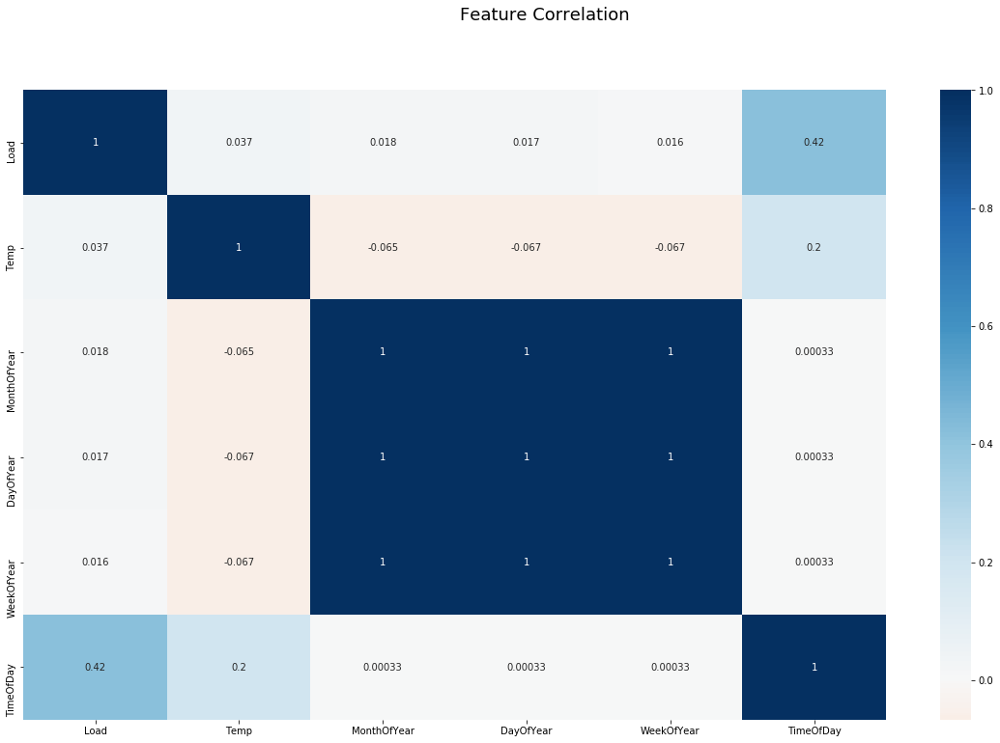

In [8]:
fig = plt.figure(figsize=(20, 12))
fig.suptitle('Feature Correlation', fontsize=18)
sns.heatmap(df.corr(), annot=True, cmap='RdBu', center=0)

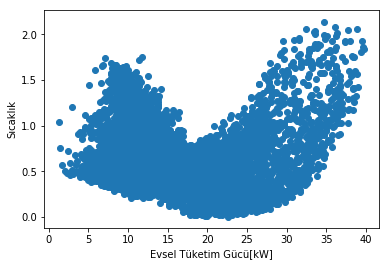

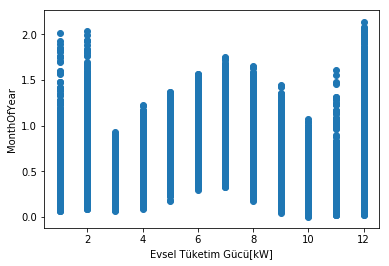

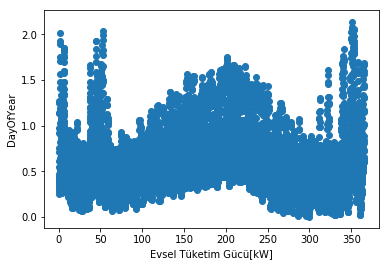

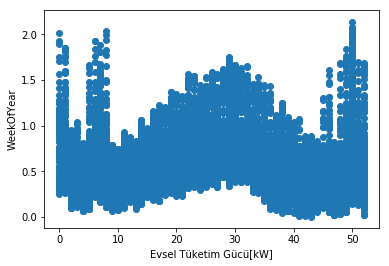

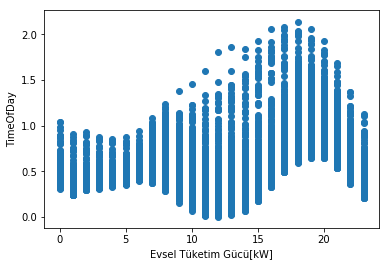

In [150]:
plt.scatter(y = "Load", x = "Temp", data = df)
plt.xlabel("Evsel Tüketim Gücü[kW]")
plt.ylabel("Sıcaklık")
plt.show()

plt.scatter(y = "Load", x = "MonthOfYear", data = df)
plt.xlabel("Evsel Tüketim Gücü[kW]")
plt.ylabel("MonthOfYear")
plt.show()

plt.scatter(y = "Load", x = "DayOfYear", data = df)
plt.xlabel("Evsel Tüketim Gücü[kW]")
plt.ylabel("DayOfYear")
plt.show()

plt.scatter(y = "Load", x = "WeekOfYear", data = df)
plt.xlabel("Evsel Tüketim Gücü[kW]")
plt.ylabel("WeekOfYear")
plt.show()

plt.scatter(y = "Load", x = "TimeOfDay", data = df)
plt.xlabel("Evsel Tüketim Gücü[kW]")
plt.ylabel("TimeOfDay")
plt.show()



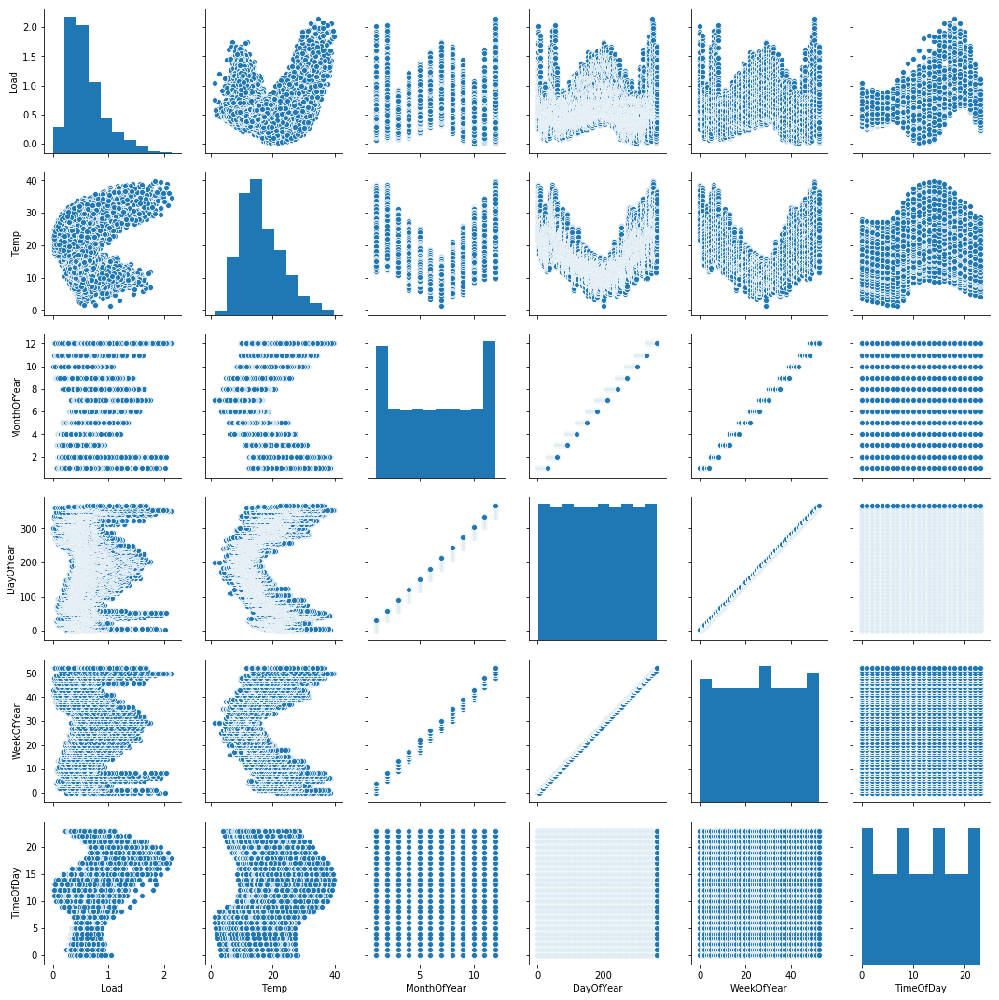

In [151]:
sns.pairplot(df);

In [152]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
lm = sm.OLS(y, X)
model= lm.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   Load   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     6584.
Date:                Sat, 26 Dec 2020   Prob (F-statistic):               0.00
Time:                        23:01:52   Log-Likelihood:                -2195.1
No. Observations:                8760   AIC:                             4400.
Df Residuals:                    8755   BIC:                             4436.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
MonthOfYear     0.1855      0.010     18.352      0.000       0.166       0.205
DayOfYear    6.484e-05      0.002      0.038      0.969      -0.003       0.003
WeekOfYear     -0.0394      0.012     -3.384      0.001      -0.062      -0.017
TimeOfDay       0.0244      0.000     52.202      0.000       0.023       0.025
Temp            0.0059      0.000     14.297      0.000       0.005       0.007
==============================================================================
Omnibus:                      228.773   Durbin-Watson:                   0.325
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              282.329
Skew:                           0.333   Prob(JB):                     4.93e-62
Kurtosis:                       3.575   Cond. No.                         758.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# RANDOM FOREST

In [146]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train, y_train)
feature_importances = regressor.feature_importances_

X_train_best = X_train[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
X_test_best = X_test[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
regressor.fit(X_train_best, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [12]:
accuracies = cross_val_score(estimator = regressor, X = X_train_best,y = y_train, cv = 10, scoring = 'r2',verbose=2)
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] ................................................. , total=   1.7s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.7s remaining:    0.0s


[CV] ................................................. , total=   1.8s
[CV]  ................................................................
[CV] ................................................. , total=   1.9s
[CV]  ................................................................
[CV] ................................................. , total=   1.6s
[CV]  ................................................................
[CV] ................................................. , total=   1.6s
[CV]  ................................................................
[CV] ................................................. , total=   1.6s
[CV]  ................................................................
[CV] ................................................. , total=   1.7s
[CV]  ................................................................
[CV] ................................................. , total=   1.7s
[CV]  ................................................................
[CV] .

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   17.8s finished


In [147]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  regressor.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Load'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# XGBOOST

In [103]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
import xgboost
from xgboost import XGBRegressor
xgb = XGBRegressor().fit(X_train, y_train)
y_pred = xgb.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.06777195957379985

In [104]:
xgb = XGBRegressor()
xgb_params = {"learning_rate": [0.1,0.01,0.5],
             "max_depth": [2,3,4,5,8],
             "n_estimators": [100,200,500,1000],
             "colsample_bytree": [0.4,0.7,1]
             }

In [17]:
xgb_cv_model  = GridSearchCV(xgb,xgb_params, cv = 5, verbose = 2).fit(X_train, y_train)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=200, total=   0.1s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_estimators=200, total=   0.1s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=2, n_es

[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_estimators=1000, total=   1.5s
[CV] colsample_bytree=0.4, learning_rate=0.1, max_depth=4, n_

[CV]  colsample_bytree=0.4, learning_rate=0.1, max_depth=8, n_estimators=1000, total=   2.8s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_d

[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=200, total=   0.3s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=200, total=   0.2s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=200, total=   0.3s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=4, n_estimators=500, total=   0.7s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_d

[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000, total=   3.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000, total=   3.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000, total=   3.0s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000, total=   3.3s
[CV] colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=1000, total=   3.2s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=2, n_estimators=100 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=2, n_estimators=100, total=   0.0s
[CV] colsample_bytree=0.4, learning_rate=0.5,

[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200, total=   0.3s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200, total=   0.2s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200, total=   0.3s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200, total=   0.2s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_estimators=200, total=   0.2s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=4, n_es

[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=500, total=   1.2s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=500, total=   1.2s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000, total=   1.7s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000, total=   1.7s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=1000, total=   1.8s
[CV] colsample_bytree=0.4, learning_rate=0.5, max_depth

[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200, total=   0.3s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200, total=   0.3s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200, total=   0.3s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=4, n_estimators=200, 

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=500, total=   1.5s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=500, total=   1.5s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=500, total=   1.8s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=500, total=   1.6s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=1000, total=   3.2s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=1000 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=8, n_estimators=1000, total=   3.3s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=8, 

[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=1000, total=   1.4s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_

[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=200, total=   0.7s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=200, total=   0.7s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=200, total=   0.7s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=500, total=   1.8s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=500, total=   2.1s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.7, learning_rate=0.01, max_depth=8, n_estimators=500, total=   1.8s
[CV] colsample_bytree=0.7, learning_rate=0.01, max_d

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   1.5s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   1.7s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   1.5s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   1.6s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=4, n_estimators=100, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200, total=   0.6s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200, total=   0.6s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200, total=   0.6s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200, total=   0.6s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=200, total=   0.6s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_estimators=500, total=   1.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=8, n_es

[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=4, n_estimators=100, total=   0.2s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=4, n_estimators=100 
[

[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200, total=   0.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200, total=   0.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200, total=   0.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200, total=   0.9s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=500 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=500, total=   2.6s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=8, n_estimators=500 
[CV]  cols

[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000, total=   2.0s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000, total=   2.1s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000, total=   2.0s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=100 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estimators=100, total=   0.2s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=4, n_estim

[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=100, total=   0.4s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.01, max_depth=8, n_estimators=500

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=500, total=   0.9s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   2.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   2.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=1000, total=   1.9s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=4, n_estimators=100 


[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=100, total=   0.4s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200, total=   0.9s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200, total=   0.9s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=200, total=   1.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=8, n_estimators=500 
[CV]  cols

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed: 15.9min finished


In [40]:
xgb_cv_model.best_params_

NameError: name 'xgb_cv_model' is not defined

In [105]:
xgb_tuned = XGBRegressor(colsample_bytree=0.7,learning_rate=0.1,max_depth=5,n_estimators=1000).fit(X_train,y_train)

In [106]:
y_pred = xgb_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,y_pred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.06311425663866264
r2 = 0.962800399679333


In [113]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  xgb_tuned.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Evsel Elektrik Güç Tüketim Tahmini",
           x_axis_label='Tarih ve Zaman',
           y_axis_label='Elektrik Tüketimi[kW]',
           x_axis_type="datetime")

p.line(df.index, df['Load'], legend='Gözlemlenen Elektrik Tüketimi', line_width=1)
p.line(df.index, df['y_pred'], legend='Tahmin Edilen Elektrik Tüketimi', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

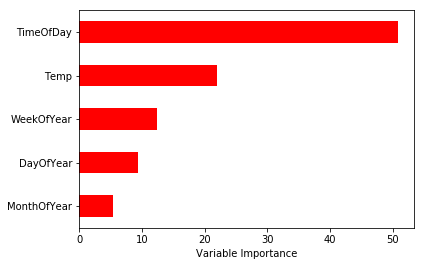

In [114]:
# baggingli
Importance = pd.DataFrame({'Importance':xgb_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

# LGBM

In [153]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
from lightgbm import LGBMRegressor
lgb_model = LGBMRegressor().fit(X_train, y_train)
y_pred = lgb_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.07699618897618833

In [154]:
#lgbm
#'min_data_in_leaf':300 
#'feature_fraction':0.8 
#'bagging_fraction':0.8,
#'bagging_freq':10
#'max_depth':8,
#'num_leaves':70,
#'learning_rate':0.04
#xgbm
#{'gamma': 0,
#'learning_rate': 0.3,
#'max_depth': 4,
#'n_estimators': 500,
#'subsample': 0.8}
lgb_model = LGBMRegressor()
lgbm_params = {"learning_rate": [0.01, 0.1, 0.5, 1],
              "n_estimators": [20,40,100,200,500,1000],
              "max_depth": [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16],
              'min_data_in_leaf':[300],
              "feature_fraction":[0.8],
               'bagging_fraction':[0.8],
               'bagging_freq':[10],
               'num_leaves':[70],
              }

In [155]:
lgbm_cv_model.best_params_

{'bagging_fraction': 0.8,
 'bagging_freq': 10,
 'feature_fraction': 0.8,
 'learning_rate': 0.5,
 'max_depth': 11,
 'min_data_in_leaf': 300,
 'n_estimators': 1000,
 'num_leaves': 70}

In [41]:
lgbm_tuned = LGBMRegressor(learning_rate = 0.1, 
                          max_depth = 15, 
                          n_estimators = 1000).fit(X_train, y_train)

In [32]:
lgbm_cv_model = GridSearchCV(lgb_model, 
                             lgbm_params, 
                             cv = 10,  
                             verbose =2).fit(X_train, y_train)

Fitting 10 folds for each of 384 candidates, totalling 3840 fits
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, n

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, 

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.9s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, b

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fract

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.9s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, 

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.9s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.9s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, baggin

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   1.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.9s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, 

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   1.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.9s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, featu

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, featu

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, featu

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[Parallel(n_jobs=1)]: Done 3840 out of 3840 | elapsed: 18.3min finished


In [45]:
lgbm_cv_model.best_params_

{'learning_rate': 0.1, 'max_depth': 14, 'n_estimators': 1000}

In [72]:
lgb_model = LGBMRegressor()
lgbm_params = {"learning_rate": [0.01, 0.1, 0.5, 1],
              "n_estimators": [20,40,100,200,500,1000],
              "max_depth": [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
              }

In [43]:
lgbm_cv_model = GridSearchCV(lgb_model, 
                             lgbm_params, 
                             cv = 10,  
                             verbose =2).fit(X_train, y_train)

Fitting 10 folds for each of 384 candidates, totalling 3840 fits
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s



[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=40 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=40, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=40 ................
[CV] . learning_rate=0.01, max_depth=1, n_estimators=40, total=   0.0s
[CV] learning_rate=0.01, max_depth=1, n_estimators=40 ................
[CV] 

[CV] learning_rate=0.01, max_depth=2, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=2, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=2, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=2, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=2, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=2, n_estimators=40 ................
[CV] . learning_rate=0.01, max_depth=2, n_estimators=40, total=   0.0s
[CV] learning_rate=0.01, max_depth=2, n_estimators=40 ................
[CV] . learning_rate=0.01, max_depth=2, n_estimators=40, total=   0.0s
[CV] l

[CV] . learning_rate=0.01, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=3, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=3, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=3, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=3, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=3, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=3, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=3, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.01, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=40 ................
[CV] . learning_rate=0.01, max_depth=4, n_estimators=40, total=   0.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.01, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=5, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=5, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=5, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=5, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=5, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=5, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=5, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.01, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=6, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=6, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=6, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=6, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=6, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=6, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=6, n_estimators=20 ................
[CV] .

[CV] . learning_rate=0.01, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=7, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=7, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=7, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=7, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=7, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=7, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=7, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.01, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=8, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=8, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=8, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=8, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=8, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=8, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=8, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.01, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=9, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=9, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=9, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=9, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=9, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=9, n_estimators=20 ................
[CV] . learning_rate=0.01, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=9, n_estimators=40 ................
[CV] .

[CV]  learning_rate=0.01, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=10, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=10, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=10, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=10, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=10, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=10, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=10, n_estimators=40 ...............
[CV]  

[CV]  learning_rate=0.01, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=11, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=11, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=11, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=11, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=11, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=11, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=11, n_estimators=40 ...............
[CV]  

[CV]  learning_rate=0.01, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=12, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=12, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=12, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=12, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=12, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=12, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=12, n_estimators=40 ...............
[CV]  

[CV]  learning_rate=0.01, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=13, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=13, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=13, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=13, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=13, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=13, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=13, n_estimators=20 ...............
[CV]  

[CV]  learning_rate=0.01, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=14, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=14, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=14, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=14, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=14, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=14, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=14, n_estimators=20 ...............
[CV]  

[CV]  learning_rate=0.01, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=15, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=15, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=15, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=15, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=15, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=15, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=15, n_estimators=20 ...............
[CV]  

[CV]  learning_rate=0.01, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=16, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=16, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=16, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=16, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=16, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=16, n_estimators=20 ...............
[CV]  learning_rate=0.01, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.01, max_depth=16, n_estimators=20 ...............
[CV]  

[CV] .. learning_rate=0.1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=1, n_estimators=40 .................
[CV] .. learning_rate=0.1, max_depth=1, n_estimators=40, total=   0.0s
[CV] learning_rate=0.1, max_depth=1, n_estimators=40 .................
[CV] .. learning_rate=0.1, max_depth=1, n_estimators=40, total=   0.0s
[CV] learning_rate=0.1, max_depth=1, n_estimators=40 .................
[CV] .

[CV] .. learning_rate=0.1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV] .. learning_rate=0.1, max_depth=2, n_estimators=40, total=   0.0s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV] .. learning_rate=0.1, max_depth=2, n_estimators=40, total=   0.0s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV] .

[CV] learning_rate=0.1, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=3, n_estimators=40 .................
[CV] .. learning_rate=0.1, max_depth=3, n_estimators=40, total=   0.0s
[CV] learning_rate=0.1, max_depth=3, n_estimators=40 .................
[CV] .. learning_rate=0.1, max_depth=3, n_estimators=40, total=   0.0s
[CV] l

[CV] learning_rate=0.1, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=4, n_estimators=40 .................
[CV] .. learning_rate=0.1, max_depth=4, n_estimators=40, total=   0.0s
[CV] l

[CV] .. learning_rate=0.1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=5, n_estimators=40 .................
[CV] .

[CV] .. learning_rate=0.1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=6, n_estimators=40 .................
[CV] .

[CV] .. learning_rate=0.1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=7, n_estimators=40 .................
[CV] .

[CV] learning_rate=0.1, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=8, n_estimators=20, total=   0.0s
[CV] l

[CV] .. learning_rate=0.1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=9, n_estimators=40 .................
[CV] .

[CV] learning_rate=0.1, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=10, n_estimators=20, total=   0.0s
[CV] l

[CV] . learning_rate=0.1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=11, n_estimators=20 ................
[CV] .

[CV] learning_rate=0.1, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=12, n_estimators=20, total=   0.0s
[CV] l

[CV] learning_rate=0.1, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=13, n_estimators=20, total=   0.0s
[CV] l

[CV] . learning_rate=0.1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=14, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=15, n_estimators=20 ................
[CV] .

[CV] learning_rate=0.1, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.1, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.1, max_depth=16, n_estimators=20, total=   0.0s
[CV] l

[CV] .. learning_rate=0.5, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=1, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=1, n_estimators=40 .................
[CV] .. learning_rate=0.5, max_depth=1, n_estimators=40, total=   0.0s
[CV] learning_rate=0.5, max_depth=1, n_estimators=40 .................
[CV] .. learning_rate=0.5, max_depth=1, n_estimators=40, total=   0.0s
[CV] learning_rate=0.5, max_depth=1, n_estimators=40 .................
[CV] .

[CV] learning_rate=0.5, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=2, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=2, n_estimators=40 .................
[CV] .. learning_rate=0.5, max_depth=2, n_estimators=40, total=   0.0s
[CV] l

[CV] learning_rate=0.5, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=3, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=3, n_estimators=40 .................
[CV] .. learning_rate=0.5, max_depth=3, n_estimators=40, total=   0.0s
[CV] l

[CV] .. learning_rate=0.5, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=4, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=4, n_estimators=40 .................
[CV] .

[CV] .. learning_rate=0.5, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=5, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=5, n_estimators=40 .................
[CV] .

[CV] .. learning_rate=0.5, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=6, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=6, n_estimators=40 .................
[CV] .

[CV] learning_rate=0.5, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=7, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=7, n_estimators=20, total=   0.0s
[CV] l

[CV] .. learning_rate=0.5, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=8, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=8, n_estimators=40 .................
[CV] .

[CV] .. learning_rate=0.5, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=9, n_estimators=20 .................
[CV] .. learning_rate=0.5, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=9, n_estimators=20 .................
[CV] .

[CV] . learning_rate=0.5, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=10, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=10, n_estimators=20 ................
[CV] .

[CV] . learning_rate=0.5, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=11, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=11, n_estimators=40 ................
[CV] .

[CV] learning_rate=0.5, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=12, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=12, n_estimators=20, total=   0.0s
[CV] l

[CV] . learning_rate=0.5, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=13, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=13, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.5, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=14, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=14, n_estimators=20 ................
[CV] .

[CV] . learning_rate=0.5, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=15, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=15, n_estimators=40 ................
[CV] .

[CV] . learning_rate=0.5, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=16, n_estimators=20 ................
[CV] . learning_rate=0.5, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=0.5, max_depth=16, n_estimators=40 ................
[CV] .

[CV] learning_rate=1, max_depth=1, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=1, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=1, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=1, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=1, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=1, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=1, n_estimators=40 ...................
[CV] .... learning_rate=1, max_depth=1, n_estimators=40, total=   0.0s
[CV] learning_rate=1, max_depth=1, n_estimators=40 ...................
[CV] .... learning_rate=1, max_depth=1, n_estimators=40, total=   0.0s
[CV] l

[CV] .... learning_rate=1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=2, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=2, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=2, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=2, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=2, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=2, n_estimators=40 ...................
[CV] .... learning_rate=1, max_depth=2, n_estimators=40, total=   0.0s
[CV] learning_rate=1, max_depth=2, n_estimators=40 ...................
[CV] .... learning_rate=1, max_depth=2, n_estimators=40, total=   0.0s
[CV] learning_rate=1, max_depth=2, n_estimators=40 ...................
[CV] .

[CV] .... learning_rate=1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=3, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=3, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=3, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=3, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=3, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=3, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=3, n_estimators=40 ...................
[CV] .... learning_rate=1, max_depth=3, n_estimators=40, total=   0.0s
[CV] learning_rate=1, max_depth=3, n_estimators=40 ...................
[CV] .

[CV] .... learning_rate=1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=4, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=4, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=4, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=4, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=4, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=4, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=4, n_estimators=40 ...................
[CV] .... learning_rate=1, max_depth=4, n_estimators=40, total=   0.0s
[CV] learning_rate=1, max_depth=4, n_estimators=40 ...................
[CV] .

[CV] .... learning_rate=1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=5, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=5, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=5, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=5, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=5, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=5, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=5, n_estimators=40 ...................
[CV] .... learning_rate=1, max_depth=5, n_estimators=40, total=   0.0s
[CV] learning_rate=1, max_depth=5, n_estimators=40 ...................
[CV] .

[CV] learning_rate=1, max_depth=6, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=6, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=6, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=6, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=6, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=6, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=6, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=6, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=6, n_estimators=20, total=   0.0s
[CV] l

[CV] .... learning_rate=1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=7, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=7, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=7, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=7, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=7, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=7, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=7, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=7, n_estimators=40 ...................
[CV] .

[CV] .... learning_rate=1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=8, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=8, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=8, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=8, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=8, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=8, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=8, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=8, n_estimators=40 ...................
[CV] .

[CV] .... learning_rate=1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=9, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=9, n_estimators=20, total=   0.1s
[CV] learning_rate=1, max_depth=9, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=9, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=9, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=9, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=9, n_estimators=20 ...................
[CV] .... learning_rate=1, max_depth=9, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=9, n_estimators=40 ...................
[CV] .

[CV] ... learning_rate=1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=10, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=10, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=10, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=10, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=10, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=10, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=10, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=10, n_estimators=40 ..................
[CV] .

[CV] ... learning_rate=1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=11, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=11, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=11, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=11, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=11, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=11, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=11, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=11, n_estimators=20 ..................
[CV] .

[CV] ... learning_rate=1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=12, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=12, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=12, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=12, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=12, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=12, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=12, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=12, n_estimators=20 ..................
[CV] .

[CV] ... learning_rate=1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=13, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=13, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=13, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=13, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=13, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=13, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=13, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=13, n_estimators=40 ..................
[CV] .

[CV] ... learning_rate=1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=14, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=14, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=14, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=14, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=14, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=14, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=14, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=14, n_estimators=40 ..................
[CV] .

[CV] learning_rate=1, max_depth=15, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=15, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=15, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=15, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=15, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=15, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=15, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=15, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=15, n_estimators=20, total=   0.0s
[CV] l

[CV] ... learning_rate=1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=16, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=16, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=16, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=16, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=16, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=16, n_estimators=20 ..................
[CV] ... learning_rate=1, max_depth=16, n_estimators=20, total=   0.0s
[CV] learning_rate=1, max_depth=16, n_estimators=40 ..................
[CV] .

[Parallel(n_jobs=1)]: Done 3840 out of 3840 | elapsed: 25.8min finished


In [ ]:
lgbm_cv_model.best_params_

In [73]:
lgbm_tuned = LGBMRegressor(learning_rate = 0.1, 
                          max_depth = 14, 
                          n_estimators = 1000).fit(X_train, y_train)

In [156]:
lgbm_tuned = LGBMRegressor(learning_rate = 0.5, 
                          max_depth = 11, 
                          n_estimators = 1000,
                          bagging_fraction=0.8,
                          bagging_freq=10,
                          feature_fraction=0.8,
                          min_data_in_leaf=300,
                          num_leaves=70).fit(X_train, y_train)

In [157]:
# bagging li
ypred=lgbm_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.1160262706960773
r2 = 0.9446367227585684


In [55]:
ypred=lgbm_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.0668857814489172
r2 = 0.9446367227585684


In [158]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  lgbm_tuned.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Load'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

In [140]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  lgbm_tuned.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Load'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

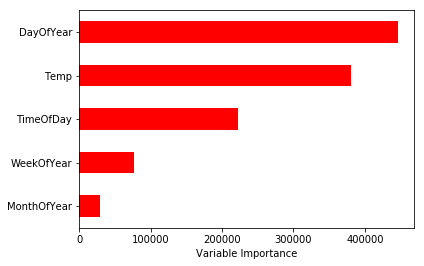

In [52]:
# baggingli
Importance = pd.DataFrame({'Importance':lgbm_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

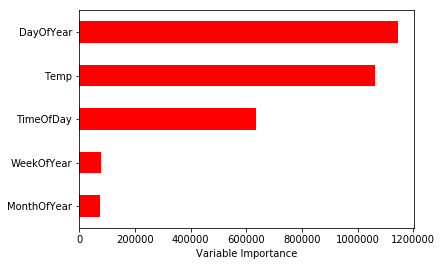

In [56]:
Importance = pd.DataFrame({'Importance':lgbm_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

In [169]:
print("---------------12-1------------")
print(lgbm_tuned.predict([[12,1,1,0,15]]))
print(lgbm_tuned.predict([[12,1,1,1,15]]))
print(lgbm_tuned.predict([[12,1,1,2,14]]))
print(lgbm_tuned.predict([[12,1,1,3,14]]))
print(lgbm_tuned.predict([[12,1,1,4,14]]))
print(lgbm_tuned.predict([[12,1,1,5,14]]))
print(lgbm_tuned.predict([[12,1,1,6,15]]))
print(lgbm_tuned.predict([[12,1,1,7,16]]))
print(lgbm_tuned.predict([[12,1,1,8,17]]))
print(lgbm_tuned.predict([[12,1,1,9,17]]))
print(lgbm_tuned.predict([[12,1,1,10,18]]))
print(lgbm_tuned.predict([[12,1,1,11,18]]))
print(lgbm_tuned.predict([[12,1,1,12,17]]))
print(lgbm_tuned.predict([[12,1,1,13,18]]))
print(lgbm_tuned.predict([[12,1,1,14,19]]))
print(lgbm_tuned.predict([[12,1,1,15,18]]))
print(lgbm_tuned.predict([[12,1,1,16,17]]))
print(lgbm_tuned.predict([[12,1,1,17,16]]))
print(lgbm_tuned.predict([[12,1,1,18,15]]))
print(lgbm_tuned.predict([[12,1,1,19,14]]))
print(lgbm_tuned.predict([[12,1,1,20,13]]))
print(lgbm_tuned.predict([[12,1,1,21,13]]))
print(lgbm_tuned.predict([[12,1,1,22,12]]))
print(lgbm_tuned.predict([[12,1,1,23,12]]))
print("---------------1-4------------")
print(lgbm_tuned.predict([[4,1,14,0,21]]))
print(lgbm_tuned.predict([[4,1,14,1,21]]))
print(lgbm_tuned.predict([[4,1,14,2,20]]))
print(lgbm_tuned.predict([[4,1,14,3,20]]))
print(lgbm_tuned.predict([[4,1,14,4,20]]))
print(lgbm_tuned.predict([[4,1,14,5,19]]))
print(lgbm_tuned.predict([[4,1,14,6,19]]))
print(lgbm_tuned.predict([[4,1,14,7,20]]))
print(lgbm_tuned.predict([[4,1,14,8,21]]))
print(lgbm_tuned.predict([[4,1,14,9,23]]))
print(lgbm_tuned.predict([[4,1,14,10,24]]))
print(lgbm_tuned.predict([[4,1,14,11,26]]))
print(lgbm_tuned.predict([[4,1,14,12,27]]))
print(lgbm_tuned.predict([[4,1,14,13,27]]))
print(lgbm_tuned.predict([[4,1,14,14,27]]))
print(lgbm_tuned.predict([[4,1,14,15,25]]))
print(lgbm_tuned.predict([[4,1,14,16,23]]))
print(lgbm_tuned.predict([[4,1,14,17,22]]))
print(lgbm_tuned.predict([[4,1,14,18,20]]))
print(lgbm_tuned.predict([[4,1,14,19,20]]))
print(lgbm_tuned.predict([[4,1,14,20,19]]))
print(lgbm_tuned.predict([[4,1,14,21,18]]))
print(lgbm_tuned.predict([[4,1,14,22,18]]))
print(lgbm_tuned.predict([[4,1,14,23,17]]))
print("---------------1-7------------")
print(lgbm_tuned.predict([[7,1,27,0,8]]))
print(lgbm_tuned.predict([[7,1,27,1,7]]))
print(lgbm_tuned.predict([[7,1,27,2,6]]))
print(lgbm_tuned.predict([[7,1,27,3,6]]))
print(lgbm_tuned.predict([[7,1,27,4,5]]))
print(lgbm_tuned.predict([[7,1,27,5,5]]))
print(lgbm_tuned.predict([[7,1,27,6,5]]))
print(lgbm_tuned.predict([[7,1,27,7,4]]))
print(lgbm_tuned.predict([[7,1,27,8,5]]))
print(lgbm_tuned.predict([[7,1,27,9,8]]))
print(lgbm_tuned.predict([[7,1,27,10,10]]))
print(lgbm_tuned.predict([[7,1,27,11,11]]))
print(lgbm_tuned.predict([[7,1,27,12,12]]))
print(lgbm_tuned.predict([[7,1,27,13,13]]))
print(lgbm_tuned.predict([[7,1,27,14,13]]))
print(lgbm_tuned.predict([[7,1,27,15,12]]))
print(lgbm_tuned.predict([[7,1,27,16,11]]))
print(lgbm_tuned.predict([[7,1,27,17,10]]))
print(lgbm_tuned.predict([[7,1,27,18,10]]))
print(lgbm_tuned.predict([[7,1,27,19,9]]))
print(lgbm_tuned.predict([[7,2,27,20,9]]))
print(lgbm_tuned.predict([[7,1,27,21,8]]))
print(lgbm_tuned.predict([[7,1,27,22,8]]))
print(lgbm_tuned.predict([[7,1,27,23,7]]))
print("---------------1-10------------")
print(lgbm_tuned.predict([[10,1,40,0,12]]))
print(lgbm_tuned.predict([[10,1,40,1,12]]))
print(lgbm_tuned.predict([[10,1,40,2,11]]))
print(lgbm_tuned.predict([[10,1,40,3,10]]))
print(lgbm_tuned.predict([[10,1,40,4,10]]))
print(lgbm_tuned.predict([[10,1,40,5,10]]))
print(lgbm_tuned.predict([[10,1,40,6,9]]))
print(lgbm_tuned.predict([[10,1,40,7,11]]))
print(lgbm_tuned.predict([[10,1,40,8,14]]))
print(lgbm_tuned.predict([[10,1,40,9,17]]))
print(lgbm_tuned.predict([[10,1,40,10,20]]))
print(lgbm_tuned.predict([[10,1,40,11,21]]))
print(lgbm_tuned.predict([[10,1,40,12,22]]))
print(lgbm_tuned.predict([[10,1,40,13,23]]))
print(lgbm_tuned.predict([[10,1,40,14,23]]))
print(lgbm_tuned.predict([[10,1,40,15,23]]))
print(lgbm_tuned.predict([[10,1,40,16,22]]))
print(lgbm_tuned.predict([[10,1,40,17,21]]))
print(lgbm_tuned.predict([[10,1,40,18,18]]))
print(lgbm_tuned.predict([[10,1,40,19,16]]))
print(lgbm_tuned.predict([[10,1,40,20,15]]))
print(lgbm_tuned.predict([[10,1,40,21,14]]))
print(lgbm_tuned.predict([[10,1,40,22,13]]))
print(lgbm_tuned.predict([[10,1,40,23,13]]))


---------------12-1------------
[0.42902327]
[0.42902327]
[0.37296867]
[0.38041134]
[0.39066244]
[0.40358809]
[0.50182259]
[0.51450755]
[0.47183116]
[0.47455208]
[0.36459759]
[0.27225096]
[0.29326097]
[0.24350554]
[0.21468451]
[0.31113299]
[0.47707045]
[0.58054983]
[0.65638951]
[0.69308849]
[0.79854381]
[0.63096796]
[0.40346623]
[0.40346623]
---------------1-4------------
[0.5490987]
[0.5490987]
[0.5093588]
[0.51750969]
[0.52692847]
[0.49701531]
[0.54927552]
[0.60262574]
[0.60242128]
[0.53345088]
[0.52342849]
[0.5261819]
[0.4588197]
[0.42845068]
[0.39931205]
[0.57144073]
[0.50485747]
[0.58424378]
[0.73176536]
[0.82216937]
[0.73827245]
[0.62687043]
[0.43937252]
[0.41580367]
---------------1-7------------
[0.56433997]
[0.55360711]
[0.50844781]
[0.52718316]
[0.52925385]
[0.54770955]
[0.70477814]
[0.85478267]
[0.90160841]
[0.86581927]
[0.71097437]
[0.63150437]
[0.59588075]
[0.4988114]
[0.51899465]
[0.6819549]
[0.92009056]
[1.07457417]
[1.26423592]
[1.36028773]
[1.33136885]
[1.23532301]
[0.

# CATBOOST

In [95]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
catb_model = CatBoostRegressor().fit(X_train, y_train)

0:	learn: 0.6606517	total: 26.3ms	remaining: 26.3s
1:	learn: 0.6434467	total: 51.6ms	remaining: 25.8s
2:	learn: 0.6271024	total: 77ms	remaining: 25.6s
3:	learn: 0.6110177	total: 102ms	remaining: 25.4s
4:	learn: 0.5956965	total: 127ms	remaining: 25.3s
5:	learn: 0.5803378	total: 152ms	remaining: 25.2s
6:	learn: 0.5659461	total: 177ms	remaining: 25.1s
7:	learn: 0.5521156	total: 198ms	remaining: 24.5s
8:	learn: 0.5375079	total: 224ms	remaining: 24.6s
9:	learn: 0.5242800	total: 254ms	remaining: 25.2s
10:	learn: 0.5110594	total: 285ms	remaining: 25.6s
11:	learn: 0.4985483	total: 315ms	remaining: 26s
12:	learn: 0.4859171	total: 342ms	remaining: 25.9s
13:	learn: 0.4741785	total: 367ms	remaining: 25.8s
14:	learn: 0.4622834	total: 392ms	remaining: 25.7s
15:	learn: 0.4512021	total: 425ms	remaining: 26.1s
16:	learn: 0.4401545	total: 458ms	remaining: 26.5s
17:	learn: 0.4295437	total: 491ms	remaining: 26.8s
18:	learn: 0.4193297	total: 517ms	remaining: 26.7s
19:	learn: 0.4091982	total: 542ms	remainin

161:	learn: 0.1068538	total: 4.36s	remaining: 22.6s
162:	learn: 0.1066359	total: 4.39s	remaining: 22.5s
163:	learn: 0.1065124	total: 4.41s	remaining: 22.5s
164:	learn: 0.1062852	total: 4.44s	remaining: 22.5s
165:	learn: 0.1060605	total: 4.46s	remaining: 22.4s
166:	learn: 0.1059262	total: 4.49s	remaining: 22.4s
167:	learn: 0.1058256	total: 4.51s	remaining: 22.3s
168:	learn: 0.1057165	total: 4.54s	remaining: 22.3s
169:	learn: 0.1055876	total: 4.56s	remaining: 22.3s
170:	learn: 0.1054164	total: 4.59s	remaining: 22.3s
171:	learn: 0.1051923	total: 4.62s	remaining: 22.2s
172:	learn: 0.1050245	total: 4.64s	remaining: 22.2s
173:	learn: 0.1049053	total: 4.67s	remaining: 22.2s
174:	learn: 0.1048088	total: 4.7s	remaining: 22.1s
175:	learn: 0.1046717	total: 4.72s	remaining: 22.1s
176:	learn: 0.1045767	total: 4.75s	remaining: 22.1s
177:	learn: 0.1043816	total: 4.78s	remaining: 22.1s
178:	learn: 0.1042636	total: 4.82s	remaining: 22.1s
179:	learn: 0.1041814	total: 4.85s	remaining: 22.1s
180:	learn: 0

326:	learn: 0.0955453	total: 8.48s	remaining: 17.4s
327:	learn: 0.0955453	total: 8.5s	remaining: 17.4s
328:	learn: 0.0954818	total: 8.53s	remaining: 17.4s
329:	learn: 0.0953945	total: 8.55s	remaining: 17.4s
330:	learn: 0.0952948	total: 8.57s	remaining: 17.3s
331:	learn: 0.0952551	total: 8.6s	remaining: 17.3s
332:	learn: 0.0952196	total: 8.62s	remaining: 17.3s
333:	learn: 0.0952196	total: 8.64s	remaining: 17.2s
334:	learn: 0.0951322	total: 8.66s	remaining: 17.2s
335:	learn: 0.0951319	total: 8.69s	remaining: 17.2s
336:	learn: 0.0951318	total: 8.71s	remaining: 17.1s
337:	learn: 0.0951318	total: 8.72s	remaining: 17.1s
338:	learn: 0.0951248	total: 8.73s	remaining: 17s
339:	learn: 0.0951135	total: 8.75s	remaining: 17s
340:	learn: 0.0950815	total: 8.78s	remaining: 17s
341:	learn: 0.0950815	total: 8.79s	remaining: 16.9s
342:	learn: 0.0950153	total: 8.81s	remaining: 16.9s
343:	learn: 0.0950026	total: 8.84s	remaining: 16.9s
344:	learn: 0.0950026	total: 8.85s	remaining: 16.8s
345:	learn: 0.094991

488:	learn: 0.0913465	total: 12.2s	remaining: 12.7s
489:	learn: 0.0913433	total: 12.2s	remaining: 12.7s
490:	learn: 0.0913433	total: 12.2s	remaining: 12.6s
491:	learn: 0.0913356	total: 12.2s	remaining: 12.6s
492:	learn: 0.0913355	total: 12.2s	remaining: 12.6s
493:	learn: 0.0913239	total: 12.3s	remaining: 12.6s
494:	learn: 0.0913234	total: 12.3s	remaining: 12.5s
495:	learn: 0.0912800	total: 12.3s	remaining: 12.5s
496:	learn: 0.0912561	total: 12.3s	remaining: 12.5s
497:	learn: 0.0912556	total: 12.3s	remaining: 12.4s
498:	learn: 0.0912550	total: 12.3s	remaining: 12.4s
499:	learn: 0.0912180	total: 12.4s	remaining: 12.4s
500:	learn: 0.0911805	total: 12.4s	remaining: 12.4s
501:	learn: 0.0911795	total: 12.4s	remaining: 12.3s
502:	learn: 0.0911489	total: 12.4s	remaining: 12.3s
503:	learn: 0.0911485	total: 12.5s	remaining: 12.3s
504:	learn: 0.0911440	total: 12.5s	remaining: 12.2s
505:	learn: 0.0911430	total: 12.5s	remaining: 12.2s
506:	learn: 0.0911359	total: 12.5s	remaining: 12.2s
507:	learn: 

655:	learn: 0.0884287	total: 16.2s	remaining: 8.5s
656:	learn: 0.0884286	total: 16.2s	remaining: 8.47s
657:	learn: 0.0884154	total: 16.3s	remaining: 8.45s
658:	learn: 0.0884154	total: 16.3s	remaining: 8.42s
659:	learn: 0.0884154	total: 16.3s	remaining: 8.39s
660:	learn: 0.0884153	total: 16.3s	remaining: 8.36s
661:	learn: 0.0884153	total: 16.3s	remaining: 8.32s
662:	learn: 0.0884148	total: 16.3s	remaining: 8.3s
663:	learn: 0.0884140	total: 16.3s	remaining: 8.27s
664:	learn: 0.0883820	total: 16.4s	remaining: 8.24s
665:	learn: 0.0883684	total: 16.4s	remaining: 8.22s
666:	learn: 0.0883445	total: 16.4s	remaining: 8.2s
667:	learn: 0.0883438	total: 16.5s	remaining: 8.18s
668:	learn: 0.0883436	total: 16.5s	remaining: 8.15s
669:	learn: 0.0883436	total: 16.5s	remaining: 8.12s
670:	learn: 0.0883431	total: 16.5s	remaining: 8.09s
671:	learn: 0.0883420	total: 16.5s	remaining: 8.07s
672:	learn: 0.0882872	total: 16.6s	remaining: 8.05s
673:	learn: 0.0882454	total: 16.6s	remaining: 8.02s
674:	learn: 0.0

815:	learn: 0.0869180	total: 19.5s	remaining: 4.41s
816:	learn: 0.0869179	total: 19.6s	remaining: 4.38s
817:	learn: 0.0869177	total: 19.6s	remaining: 4.36s
818:	learn: 0.0869175	total: 19.6s	remaining: 4.33s
819:	learn: 0.0868983	total: 19.6s	remaining: 4.31s
820:	learn: 0.0868941	total: 19.6s	remaining: 4.28s
821:	learn: 0.0868934	total: 19.7s	remaining: 4.26s
822:	learn: 0.0868819	total: 19.7s	remaining: 4.23s
823:	learn: 0.0868812	total: 19.7s	remaining: 4.21s
824:	learn: 0.0868660	total: 19.7s	remaining: 4.18s
825:	learn: 0.0868204	total: 19.8s	remaining: 4.16s
826:	learn: 0.0868141	total: 19.8s	remaining: 4.14s
827:	learn: 0.0867846	total: 19.8s	remaining: 4.12s
828:	learn: 0.0867732	total: 19.8s	remaining: 4.09s
829:	learn: 0.0867401	total: 19.9s	remaining: 4.07s
830:	learn: 0.0867141	total: 19.9s	remaining: 4.04s
831:	learn: 0.0867003	total: 19.9s	remaining: 4.02s
832:	learn: 0.0867000	total: 19.9s	remaining: 3.99s
833:	learn: 0.0866995	total: 19.9s	remaining: 3.97s
834:	learn: 

978:	learn: 0.0855393	total: 22.9s	remaining: 491ms
979:	learn: 0.0855393	total: 22.9s	remaining: 467ms
980:	learn: 0.0855019	total: 22.9s	remaining: 444ms
981:	learn: 0.0855002	total: 22.9s	remaining: 421ms
982:	learn: 0.0855000	total: 23s	remaining: 397ms
983:	learn: 0.0854754	total: 23s	remaining: 374ms
984:	learn: 0.0854720	total: 23s	remaining: 350ms
985:	learn: 0.0854591	total: 23s	remaining: 327ms
986:	learn: 0.0854591	total: 23s	remaining: 304ms
987:	learn: 0.0854591	total: 23.1s	remaining: 280ms
988:	learn: 0.0854345	total: 23.1s	remaining: 257ms
989:	learn: 0.0854316	total: 23.1s	remaining: 234ms
990:	learn: 0.0854312	total: 23.1s	remaining: 210ms
991:	learn: 0.0854278	total: 23.2s	remaining: 187ms
992:	learn: 0.0854276	total: 23.2s	remaining: 163ms
993:	learn: 0.0854213	total: 23.2s	remaining: 140ms
994:	learn: 0.0854203	total: 23.2s	remaining: 117ms
995:	learn: 0.0854201	total: 23.2s	remaining: 93.3ms
996:	learn: 0.0853979	total: 23.3s	remaining: 70ms
997:	learn: 0.0853942	

In [96]:
y_pred = catb_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.08701656047908028

In [97]:
catb_params = {"iterations": [200,500,100,999],
              "learning_rate": [0.01,0.1,0.05],
              "depth": [1,3,6]}

In [98]:
catb_model = CatBoostRegressor()

In [70]:
catb_cv_model = GridSearchCV(catb_model, 
                           catb_params, 
                           cv = 5,  
                           verbose = 2).fit(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] depth=1, iterations=200, learning_rate=0.01 .....................
0:	learn: 0.6731571	total: 7.68ms	remaining: 1.53s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


1:	learn: 0.6676191	total: 19.1ms	remaining: 1.89s
2:	learn: 0.6623811	total: 28.3ms	remaining: 1.85s
3:	learn: 0.6571740	total: 39.2ms	remaining: 1.92s
4:	learn: 0.6518931	total: 47.5ms	remaining: 1.85s
5:	learn: 0.6465674	total: 57.1ms	remaining: 1.85s
6:	learn: 0.6412952	total: 66.3ms	remaining: 1.83s
7:	learn: 0.6360853	total: 76ms	remaining: 1.82s
8:	learn: 0.6309787	total: 88.7ms	remaining: 1.88s
9:	learn: 0.6261355	total: 99.4ms	remaining: 1.89s
10:	learn: 0.6211088	total: 110ms	remaining: 1.88s
11:	learn: 0.6161423	total: 118ms	remaining: 1.85s
12:	learn: 0.6112352	total: 128ms	remaining: 1.84s
13:	learn: 0.6067710	total: 137ms	remaining: 1.82s
14:	learn: 0.6019669	total: 146ms	remaining: 1.8s
15:	learn: 0.5972208	total: 156ms	remaining: 1.8s
16:	learn: 0.5925399	total: 165ms	remaining: 1.78s
17:	learn: 0.5881192	total: 174ms	remaining: 1.76s
18:	learn: 0.5837930	total: 184ms	remaining: 1.75s
19:	learn: 0.5792598	total: 192ms	remaining: 1.73s
20:	learn: 0.5749533	total: 200ms	r

164:	learn: 0.2899679	total: 1.55s	remaining: 329ms
165:	learn: 0.2893344	total: 1.56s	remaining: 319ms
166:	learn: 0.2886846	total: 1.57s	remaining: 310ms
167:	learn: 0.2880689	total: 1.57s	remaining: 300ms
168:	learn: 0.2874526	total: 1.58s	remaining: 290ms
169:	learn: 0.2868472	total: 1.59s	remaining: 281ms
170:	learn: 0.2862754	total: 1.6s	remaining: 272ms
171:	learn: 0.2856672	total: 1.61s	remaining: 262ms
172:	learn: 0.2850838	total: 1.62s	remaining: 253ms
173:	learn: 0.2844956	total: 1.63s	remaining: 244ms
174:	learn: 0.2839349	total: 1.64s	remaining: 234ms
175:	learn: 0.2833924	total: 1.65s	remaining: 225ms
176:	learn: 0.2828430	total: 1.66s	remaining: 216ms
177:	learn: 0.2823034	total: 1.67s	remaining: 206ms
178:	learn: 0.2817711	total: 1.68s	remaining: 197ms
179:	learn: 0.2812333	total: 1.68s	remaining: 187ms
180:	learn: 0.2807050	total: 1.69s	remaining: 178ms
181:	learn: 0.2802076	total: 1.7s	remaining: 168ms
182:	learn: 0.2796919	total: 1.71s	remaining: 159ms
183:	learn: 0.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s remaining:    0.0s


6:	learn: 0.6397631	total: 68.1ms	remaining: 1.88s
7:	learn: 0.6345528	total: 79.4ms	remaining: 1.91s
8:	learn: 0.6294418	total: 89.5ms	remaining: 1.9s
9:	learn: 0.6246355	total: 99.4ms	remaining: 1.89s
10:	learn: 0.6196000	total: 111ms	remaining: 1.91s
11:	learn: 0.6146245	total: 120ms	remaining: 1.89s
12:	learn: 0.6097085	total: 131ms	remaining: 1.88s
13:	learn: 0.6052445	total: 139ms	remaining: 1.85s
14:	learn: 0.6004395	total: 150ms	remaining: 1.84s
15:	learn: 0.5956924	total: 160ms	remaining: 1.84s
16:	learn: 0.5910022	total: 168ms	remaining: 1.81s
17:	learn: 0.5864031	total: 177ms	remaining: 1.79s
18:	learn: 0.5820940	total: 185ms	remaining: 1.77s
19:	learn: 0.5779485	total: 194ms	remaining: 1.75s
20:	learn: 0.5734698	total: 203ms	remaining: 1.73s
21:	learn: 0.5694150	total: 211ms	remaining: 1.71s
22:	learn: 0.5650754	total: 219ms	remaining: 1.69s
23:	learn: 0.5607517	total: 229ms	remaining: 1.68s
24:	learn: 0.5568725	total: 238ms	remaining: 1.67s
25:	learn: 0.5526865	total: 247m

180:	learn: 0.2808043	total: 1.83s	remaining: 192ms
181:	learn: 0.2803140	total: 1.84s	remaining: 182ms
182:	learn: 0.2798146	total: 1.85s	remaining: 172ms
183:	learn: 0.2793314	total: 1.86s	remaining: 162ms
184:	learn: 0.2788422	total: 1.87s	remaining: 152ms
185:	learn: 0.2783889	total: 1.88s	remaining: 142ms
186:	learn: 0.2779135	total: 1.89s	remaining: 132ms
187:	learn: 0.2774386	total: 1.9s	remaining: 121ms
188:	learn: 0.2769773	total: 1.91s	remaining: 111ms
189:	learn: 0.2765310	total: 1.92s	remaining: 101ms
190:	learn: 0.2760817	total: 1.93s	remaining: 90.9ms
191:	learn: 0.2756446	total: 1.94s	remaining: 80.8ms
192:	learn: 0.2752082	total: 1.95s	remaining: 70.6ms
193:	learn: 0.2747675	total: 1.96s	remaining: 60.5ms
194:	learn: 0.2743435	total: 1.97s	remaining: 50.4ms
195:	learn: 0.2739587	total: 1.98s	remaining: 40.3ms
196:	learn: 0.2735572	total: 1.99s	remaining: 30.2ms
197:	learn: 0.2731465	total: 1.99s	remaining: 20.1ms
198:	learn: 0.2727922	total: 2s	remaining: 10.1ms
199:	le

152:	learn: 0.2966036	total: 1.39s	remaining: 427ms
153:	learn: 0.2958445	total: 1.4s	remaining: 418ms
154:	learn: 0.2950986	total: 1.41s	remaining: 409ms
155:	learn: 0.2943945	total: 1.42s	remaining: 400ms
156:	learn: 0.2936972	total: 1.43s	remaining: 391ms
157:	learn: 0.2930010	total: 1.44s	remaining: 383ms
158:	learn: 0.2923559	total: 1.45s	remaining: 374ms
159:	learn: 0.2916562	total: 1.46s	remaining: 365ms
160:	learn: 0.2909724	total: 1.47s	remaining: 357ms
161:	learn: 0.2902988	total: 1.48s	remaining: 347ms
162:	learn: 0.2896635	total: 1.49s	remaining: 338ms
163:	learn: 0.2889949	total: 1.5s	remaining: 329ms
164:	learn: 0.2883655	total: 1.51s	remaining: 320ms
165:	learn: 0.2877326	total: 1.52s	remaining: 311ms
166:	learn: 0.2871150	total: 1.53s	remaining: 302ms
167:	learn: 0.2865026	total: 1.54s	remaining: 293ms
168:	learn: 0.2858986	total: 1.55s	remaining: 284ms
169:	learn: 0.2853040	total: 1.56s	remaining: 275ms
170:	learn: 0.2847027	total: 1.57s	remaining: 267ms
171:	learn: 0.

119:	learn: 0.3294476	total: 1.04s	remaining: 696ms
120:	learn: 0.3282431	total: 1.05s	remaining: 688ms
121:	learn: 0.3270690	total: 1.06s	remaining: 680ms
122:	learn: 0.3258987	total: 1.07s	remaining: 672ms
123:	learn: 0.3247624	total: 1.08s	remaining: 663ms
124:	learn: 0.3236296	total: 1.09s	remaining: 655ms
125:	learn: 0.3225522	total: 1.1s	remaining: 646ms
126:	learn: 0.3214378	total: 1.11s	remaining: 637ms
127:	learn: 0.3203660	total: 1.11s	remaining: 628ms
128:	learn: 0.3192987	total: 1.12s	remaining: 619ms
129:	learn: 0.3182891	total: 1.13s	remaining: 609ms
130:	learn: 0.3173183	total: 1.14s	remaining: 600ms
131:	learn: 0.3163351	total: 1.15s	remaining: 591ms
132:	learn: 0.3153198	total: 1.16s	remaining: 582ms
133:	learn: 0.3143214	total: 1.16s	remaining: 573ms
134:	learn: 0.3133269	total: 1.17s	remaining: 564ms
135:	learn: 0.3123970	total: 1.18s	remaining: 555ms
136:	learn: 0.3114371	total: 1.19s	remaining: 546ms
137:	learn: 0.3104831	total: 1.2s	remaining: 537ms
138:	learn: 0.

92:	learn: 0.3671603	total: 814ms	remaining: 937ms
93:	learn: 0.3654362	total: 823ms	remaining: 928ms
94:	learn: 0.3637254	total: 832ms	remaining: 920ms
95:	learn: 0.3620750	total: 842ms	remaining: 912ms
96:	learn: 0.3604446	total: 852ms	remaining: 905ms
97:	learn: 0.3588593	total: 861ms	remaining: 896ms
98:	learn: 0.3572728	total: 869ms	remaining: 887ms
99:	learn: 0.3557164	total: 878ms	remaining: 878ms
100:	learn: 0.3541679	total: 885ms	remaining: 868ms
101:	learn: 0.3526167	total: 893ms	remaining: 858ms
102:	learn: 0.3511299	total: 901ms	remaining: 849ms
103:	learn: 0.3498237	total: 909ms	remaining: 839ms
104:	learn: 0.3483701	total: 917ms	remaining: 830ms
105:	learn: 0.3468861	total: 925ms	remaining: 820ms
106:	learn: 0.3454620	total: 933ms	remaining: 811ms
107:	learn: 0.3440707	total: 941ms	remaining: 802ms
108:	learn: 0.3427387	total: 949ms	remaining: 792ms
109:	learn: 0.3413449	total: 957ms	remaining: 783ms
110:	learn: 0.3399996	total: 965ms	remaining: 774ms
111:	learn: 0.338649

62:	learn: 0.2154397	total: 580ms	remaining: 1.26s
63:	learn: 0.2149402	total: 589ms	remaining: 1.25s
64:	learn: 0.2140621	total: 598ms	remaining: 1.24s
65:	learn: 0.2134389	total: 607ms	remaining: 1.23s
66:	learn: 0.2129970	total: 617ms	remaining: 1.22s
67:	learn: 0.2124449	total: 627ms	remaining: 1.22s
68:	learn: 0.2119785	total: 637ms	remaining: 1.21s
69:	learn: 0.2114553	total: 647ms	remaining: 1.2s
70:	learn: 0.2106825	total: 656ms	remaining: 1.19s
71:	learn: 0.2102999	total: 666ms	remaining: 1.18s
72:	learn: 0.2095964	total: 674ms	remaining: 1.17s
73:	learn: 0.2093062	total: 683ms	remaining: 1.16s
74:	learn: 0.2088293	total: 692ms	remaining: 1.15s
75:	learn: 0.2084076	total: 701ms	remaining: 1.14s
76:	learn: 0.2078248	total: 710ms	remaining: 1.13s
77:	learn: 0.2074870	total: 719ms	remaining: 1.12s
78:	learn: 0.2070860	total: 729ms	remaining: 1.12s
79:	learn: 0.2064867	total: 738ms	remaining: 1.11s
80:	learn: 0.2061762	total: 747ms	remaining: 1.1s
81:	learn: 0.2057866	total: 755ms

27:	learn: 0.2501178	total: 278ms	remaining: 1.7s
28:	learn: 0.2480931	total: 288ms	remaining: 1.7s
29:	learn: 0.2462795	total: 299ms	remaining: 1.69s
30:	learn: 0.2449189	total: 307ms	remaining: 1.68s
31:	learn: 0.2438094	total: 317ms	remaining: 1.66s
32:	learn: 0.2422313	total: 326ms	remaining: 1.65s
33:	learn: 0.2409653	total: 335ms	remaining: 1.64s
34:	learn: 0.2395808	total: 343ms	remaining: 1.62s
35:	learn: 0.2386328	total: 352ms	remaining: 1.6s
36:	learn: 0.2370619	total: 359ms	remaining: 1.58s
37:	learn: 0.2357042	total: 368ms	remaining: 1.57s
38:	learn: 0.2345083	total: 376ms	remaining: 1.55s
39:	learn: 0.2335040	total: 384ms	remaining: 1.53s
40:	learn: 0.2322922	total: 392ms	remaining: 1.52s
41:	learn: 0.2310994	total: 400ms	remaining: 1.5s
42:	learn: 0.2302336	total: 408ms	remaining: 1.49s
43:	learn: 0.2293614	total: 417ms	remaining: 1.48s
44:	learn: 0.2282433	total: 424ms	remaining: 1.46s
45:	learn: 0.2273510	total: 433ms	remaining: 1.45s
46:	learn: 0.2263130	total: 440ms	r

199:	learn: 0.1763432	total: 1.8s	remaining: 0us
[CV] ....... depth=1, iterations=200, learning_rate=0.1, total=   2.0s
[CV] depth=1, iterations=200, learning_rate=0.1 ......................
0:	learn: 0.6203340	total: 8.12ms	remaining: 1.62s
1:	learn: 0.5709533	total: 16ms	remaining: 1.59s
2:	learn: 0.5278115	total: 24.1ms	remaining: 1.58s
3:	learn: 0.4912270	total: 34.1ms	remaining: 1.67s
4:	learn: 0.4575612	total: 42.8ms	remaining: 1.67s
5:	learn: 0.4299532	total: 50.9ms	remaining: 1.65s
6:	learn: 0.4051063	total: 58.7ms	remaining: 1.62s
7:	learn: 0.3827383	total: 66.9ms	remaining: 1.6s
8:	learn: 0.3629209	total: 74.5ms	remaining: 1.58s
9:	learn: 0.3460313	total: 82.4ms	remaining: 1.56s
10:	learn: 0.3316078	total: 90.2ms	remaining: 1.55s
11:	learn: 0.3194331	total: 99.1ms	remaining: 1.55s
12:	learn: 0.3092083	total: 107ms	remaining: 1.54s
13:	learn: 0.2997349	total: 115ms	remaining: 1.53s
14:	learn: 0.2915578	total: 123ms	remaining: 1.52s
15:	learn: 0.2850805	total: 133ms	remaining: 

164:	learn: 0.1794001	total: 1.38s	remaining: 293ms
165:	learn: 0.1792190	total: 1.39s	remaining: 285ms
166:	learn: 0.1790826	total: 1.4s	remaining: 277ms
167:	learn: 0.1789271	total: 1.41s	remaining: 269ms
168:	learn: 0.1786301	total: 1.42s	remaining: 261ms
169:	learn: 0.1784606	total: 1.43s	remaining: 252ms
170:	learn: 0.1782686	total: 1.44s	remaining: 244ms
171:	learn: 0.1780990	total: 1.45s	remaining: 235ms
172:	learn: 0.1778984	total: 1.45s	remaining: 227ms
173:	learn: 0.1777852	total: 1.46s	remaining: 219ms
174:	learn: 0.1775687	total: 1.47s	remaining: 210ms
175:	learn: 0.1774003	total: 1.48s	remaining: 202ms
176:	learn: 0.1771267	total: 1.49s	remaining: 193ms
177:	learn: 0.1769891	total: 1.49s	remaining: 185ms
178:	learn: 0.1768456	total: 1.5s	remaining: 176ms
179:	learn: 0.1767784	total: 1.51s	remaining: 168ms
180:	learn: 0.1766071	total: 1.52s	remaining: 159ms
181:	learn: 0.1765239	total: 1.53s	remaining: 151ms
182:	learn: 0.1765010	total: 1.53s	remaining: 143ms
183:	learn: 0.

132:	learn: 0.1876037	total: 1.23s	remaining: 619ms
133:	learn: 0.1873516	total: 1.24s	remaining: 611ms
134:	learn: 0.1870893	total: 1.25s	remaining: 602ms
135:	learn: 0.1868666	total: 1.26s	remaining: 594ms
136:	learn: 0.1865958	total: 1.27s	remaining: 585ms
137:	learn: 0.1863551	total: 1.28s	remaining: 576ms
138:	learn: 0.1861395	total: 1.29s	remaining: 567ms
139:	learn: 0.1860705	total: 1.3s	remaining: 558ms
140:	learn: 0.1858484	total: 1.31s	remaining: 548ms
141:	learn: 0.1856277	total: 1.32s	remaining: 538ms
142:	learn: 0.1854471	total: 1.33s	remaining: 529ms
143:	learn: 0.1851046	total: 1.33s	remaining: 519ms
144:	learn: 0.1850510	total: 1.34s	remaining: 510ms
145:	learn: 0.1848434	total: 1.35s	remaining: 500ms
146:	learn: 0.1846422	total: 1.36s	remaining: 490ms
147:	learn: 0.1844788	total: 1.37s	remaining: 481ms
148:	learn: 0.1842523	total: 1.38s	remaining: 472ms
149:	learn: 0.1840251	total: 1.39s	remaining: 462ms
150:	learn: 0.1837798	total: 1.4s	remaining: 453ms
151:	learn: 0.

103:	learn: 0.1953529	total: 1.04s	remaining: 965ms
104:	learn: 0.1949362	total: 1.06s	remaining: 956ms
105:	learn: 0.1947378	total: 1.06s	remaining: 945ms
106:	learn: 0.1943660	total: 1.07s	remaining: 933ms
107:	learn: 0.1940249	total: 1.08s	remaining: 922ms
108:	learn: 0.1937395	total: 1.09s	remaining: 912ms
109:	learn: 0.1933310	total: 1.1s	remaining: 900ms
110:	learn: 0.1929593	total: 1.11s	remaining: 890ms
111:	learn: 0.1926069	total: 1.12s	remaining: 878ms
112:	learn: 0.1922737	total: 1.13s	remaining: 867ms
113:	learn: 0.1919134	total: 1.13s	remaining: 855ms
114:	learn: 0.1918388	total: 1.14s	remaining: 844ms
115:	learn: 0.1916855	total: 1.15s	remaining: 832ms
116:	learn: 0.1913020	total: 1.16s	remaining: 821ms
117:	learn: 0.1912156	total: 1.17s	remaining: 810ms
118:	learn: 0.1909533	total: 1.17s	remaining: 799ms
119:	learn: 0.1907006	total: 1.18s	remaining: 788ms
120:	learn: 0.1903814	total: 1.19s	remaining: 777ms
121:	learn: 0.1901231	total: 1.2s	remaining: 766ms
122:	learn: 0.

66:	learn: 0.2411304	total: 672ms	remaining: 1.33s
67:	learn: 0.2404798	total: 681ms	remaining: 1.32s
68:	learn: 0.2396928	total: 691ms	remaining: 1.31s
69:	learn: 0.2389575	total: 701ms	remaining: 1.3s
70:	learn: 0.2383674	total: 710ms	remaining: 1.29s
71:	learn: 0.2378334	total: 719ms	remaining: 1.28s
72:	learn: 0.2372203	total: 729ms	remaining: 1.27s
73:	learn: 0.2368338	total: 738ms	remaining: 1.26s
74:	learn: 0.2363081	total: 749ms	remaining: 1.25s
75:	learn: 0.2358246	total: 758ms	remaining: 1.24s
76:	learn: 0.2352085	total: 767ms	remaining: 1.23s
77:	learn: 0.2347798	total: 778ms	remaining: 1.22s
78:	learn: 0.2343261	total: 789ms	remaining: 1.21s
79:	learn: 0.2337502	total: 799ms	remaining: 1.2s
80:	learn: 0.2333257	total: 809ms	remaining: 1.19s
81:	learn: 0.2328831	total: 820ms	remaining: 1.18s
82:	learn: 0.2325362	total: 830ms	remaining: 1.17s
83:	learn: 0.2319264	total: 839ms	remaining: 1.16s
84:	learn: 0.2312997	total: 848ms	remaining: 1.15s
85:	learn: 0.2307307	total: 858ms

24:	learn: 0.3202236	total: 253ms	remaining: 1.77s
25:	learn: 0.3150822	total: 263ms	remaining: 1.76s
26:	learn: 0.3104522	total: 271ms	remaining: 1.74s
27:	learn: 0.3057139	total: 281ms	remaining: 1.72s
28:	learn: 0.3013728	total: 290ms	remaining: 1.71s
29:	learn: 0.2975565	total: 298ms	remaining: 1.69s
30:	learn: 0.2939438	total: 307ms	remaining: 1.67s
31:	learn: 0.2907638	total: 317ms	remaining: 1.66s
32:	learn: 0.2875749	total: 325ms	remaining: 1.65s
33:	learn: 0.2846244	total: 335ms	remaining: 1.64s
34:	learn: 0.2819245	total: 344ms	remaining: 1.62s
35:	learn: 0.2793919	total: 353ms	remaining: 1.61s
36:	learn: 0.2768087	total: 362ms	remaining: 1.59s
37:	learn: 0.2744665	total: 370ms	remaining: 1.58s
38:	learn: 0.2723350	total: 380ms	remaining: 1.57s
39:	learn: 0.2704004	total: 388ms	remaining: 1.55s
40:	learn: 0.2685404	total: 397ms	remaining: 1.54s
41:	learn: 0.2668504	total: 405ms	remaining: 1.52s
42:	learn: 0.2651193	total: 413ms	remaining: 1.51s
43:	learn: 0.2636238	total: 422

[CV] ...... depth=1, iterations=200, learning_rate=0.05, total=   2.2s
[CV] depth=1, iterations=200, learning_rate=0.05 .....................
0:	learn: 0.6480285	total: 7.7ms	remaining: 1.53s
1:	learn: 0.6215683	total: 15.6ms	remaining: 1.55s
2:	learn: 0.5968005	total: 23.6ms	remaining: 1.55s
3:	learn: 0.5744883	total: 31.3ms	remaining: 1.53s
4:	learn: 0.5523597	total: 39.2ms	remaining: 1.53s
5:	learn: 0.5333084	total: 47.1ms	remaining: 1.52s
6:	learn: 0.5155792	total: 54.7ms	remaining: 1.51s
7:	learn: 0.4972607	total: 62.5ms	remaining: 1.5s
8:	learn: 0.4798889	total: 73.2ms	remaining: 1.55s
9:	learn: 0.4640914	total: 82.4ms	remaining: 1.56s
10:	learn: 0.4489533	total: 91.4ms	remaining: 1.57s
11:	learn: 0.4355313	total: 101ms	remaining: 1.58s
12:	learn: 0.4227002	total: 109ms	remaining: 1.57s
13:	learn: 0.4101939	total: 118ms	remaining: 1.57s
14:	learn: 0.3986807	total: 126ms	remaining: 1.55s
15:	learn: 0.3881787	total: 136ms	remaining: 1.57s
16:	learn: 0.3783777	total: 145ms	remaining

169:	learn: 0.2012110	total: 1.62s	remaining: 286ms
170:	learn: 0.2010153	total: 1.63s	remaining: 276ms
171:	learn: 0.2007309	total: 1.64s	remaining: 266ms
172:	learn: 0.2005102	total: 1.65s	remaining: 257ms
173:	learn: 0.2002749	total: 1.65s	remaining: 247ms
174:	learn: 0.2000621	total: 1.66s	remaining: 238ms
175:	learn: 0.1998513	total: 1.67s	remaining: 228ms
176:	learn: 0.1997112	total: 1.68s	remaining: 219ms
177:	learn: 0.1995132	total: 1.69s	remaining: 209ms
178:	learn: 0.1993449	total: 1.7s	remaining: 199ms
179:	learn: 0.1992279	total: 1.71s	remaining: 190ms
180:	learn: 0.1989942	total: 1.72s	remaining: 180ms
181:	learn: 0.1988891	total: 1.73s	remaining: 171ms
182:	learn: 0.1987718	total: 1.74s	remaining: 161ms
183:	learn: 0.1985794	total: 1.74s	remaining: 152ms
184:	learn: 0.1983884	total: 1.75s	remaining: 142ms
185:	learn: 0.1982849	total: 1.76s	remaining: 133ms
186:	learn: 0.1982066	total: 1.77s	remaining: 123ms
187:	learn: 0.1980058	total: 1.78s	remaining: 114ms
188:	learn: 0

131:	learn: 0.2129158	total: 1.22s	remaining: 631ms
132:	learn: 0.2127306	total: 1.23s	remaining: 622ms
133:	learn: 0.2124010	total: 1.24s	remaining: 613ms
134:	learn: 0.2120101	total: 1.25s	remaining: 604ms
135:	learn: 0.2117254	total: 1.26s	remaining: 594ms
136:	learn: 0.2114138	total: 1.28s	remaining: 587ms
137:	learn: 0.2110765	total: 1.29s	remaining: 579ms
138:	learn: 0.2107496	total: 1.3s	remaining: 569ms
139:	learn: 0.2105526	total: 1.3s	remaining: 559ms
140:	learn: 0.2102533	total: 1.31s	remaining: 549ms
141:	learn: 0.2099874	total: 1.32s	remaining: 540ms
142:	learn: 0.2097177	total: 1.33s	remaining: 530ms
143:	learn: 0.2093467	total: 1.34s	remaining: 520ms
144:	learn: 0.2091874	total: 1.34s	remaining: 510ms
145:	learn: 0.2089045	total: 1.35s	remaining: 500ms
146:	learn: 0.2085890	total: 1.36s	remaining: 491ms
147:	learn: 0.2083036	total: 1.37s	remaining: 482ms
148:	learn: 0.2080709	total: 1.38s	remaining: 472ms
149:	learn: 0.2078483	total: 1.39s	remaining: 464ms
150:	learn: 0.

98:	learn: 0.2245444	total: 865ms	remaining: 882ms
99:	learn: 0.2241072	total: 874ms	remaining: 874ms
100:	learn: 0.2237266	total: 883ms	remaining: 866ms
101:	learn: 0.2232951	total: 892ms	remaining: 857ms
102:	learn: 0.2229966	total: 903ms	remaining: 850ms
103:	learn: 0.2227055	total: 911ms	remaining: 841ms
104:	learn: 0.2222752	total: 921ms	remaining: 833ms
105:	learn: 0.2217853	total: 930ms	remaining: 825ms
106:	learn: 0.2214703	total: 939ms	remaining: 816ms
107:	learn: 0.2212485	total: 947ms	remaining: 806ms
108:	learn: 0.2209763	total: 956ms	remaining: 798ms
109:	learn: 0.2206010	total: 964ms	remaining: 789ms
110:	learn: 0.2201515	total: 972ms	remaining: 779ms
111:	learn: 0.2199645	total: 981ms	remaining: 771ms
112:	learn: 0.2195579	total: 991ms	remaining: 763ms
113:	learn: 0.2191268	total: 1000ms	remaining: 754ms
114:	learn: 0.2188889	total: 1.01s	remaining: 746ms
115:	learn: 0.2186523	total: 1.02s	remaining: 736ms
116:	learn: 0.2182805	total: 1.02s	remaining: 727ms
117:	learn: 0

69:	learn: 0.4155890	total: 661ms	remaining: 4.06s
70:	learn: 0.4131879	total: 671ms	remaining: 4.05s
71:	learn: 0.4108204	total: 682ms	remaining: 4.05s
72:	learn: 0.4084866	total: 692ms	remaining: 4.04s
73:	learn: 0.4064029	total: 703ms	remaining: 4.04s
74:	learn: 0.4042100	total: 715ms	remaining: 4.05s
75:	learn: 0.4019637	total: 742ms	remaining: 4.14s
76:	learn: 0.3997497	total: 756ms	remaining: 4.15s
77:	learn: 0.3976291	total: 767ms	remaining: 4.15s
78:	learn: 0.3955465	total: 778ms	remaining: 4.15s
79:	learn: 0.3935007	total: 789ms	remaining: 4.14s
80:	learn: 0.3913943	total: 799ms	remaining: 4.13s
81:	learn: 0.3893937	total: 812ms	remaining: 4.14s
82:	learn: 0.3874338	total: 821ms	remaining: 4.12s
83:	learn: 0.3855126	total: 830ms	remaining: 4.11s
84:	learn: 0.3835150	total: 839ms	remaining: 4.1s
85:	learn: 0.3816096	total: 852ms	remaining: 4.1s
86:	learn: 0.3796650	total: 865ms	remaining: 4.1s
87:	learn: 0.3777469	total: 876ms	remaining: 4.1s
88:	learn: 0.3758593	total: 889ms	r

243:	learn: 0.2582773	total: 2.4s	remaining: 2.52s
244:	learn: 0.2580228	total: 2.41s	remaining: 2.51s
245:	learn: 0.2577732	total: 2.42s	remaining: 2.5s
246:	learn: 0.2575282	total: 2.43s	remaining: 2.49s
247:	learn: 0.2572843	total: 2.44s	remaining: 2.48s
248:	learn: 0.2570430	total: 2.45s	remaining: 2.47s
249:	learn: 0.2568073	total: 2.46s	remaining: 2.46s
250:	learn: 0.2565626	total: 2.47s	remaining: 2.45s
251:	learn: 0.2563367	total: 2.48s	remaining: 2.44s
252:	learn: 0.2561052	total: 2.49s	remaining: 2.43s
253:	learn: 0.2558773	total: 2.5s	remaining: 2.42s
254:	learn: 0.2556398	total: 2.51s	remaining: 2.42s
255:	learn: 0.2554183	total: 2.52s	remaining: 2.4s
256:	learn: 0.2551852	total: 2.53s	remaining: 2.39s
257:	learn: 0.2549670	total: 2.54s	remaining: 2.38s
258:	learn: 0.2547399	total: 2.55s	remaining: 2.37s
259:	learn: 0.2545252	total: 2.56s	remaining: 2.36s
260:	learn: 0.2543103	total: 2.56s	remaining: 2.35s
261:	learn: 0.2540842	total: 2.57s	remaining: 2.34s
262:	learn: 0.25

404:	learn: 0.2334390	total: 3.93s	remaining: 921ms
405:	learn: 0.2333354	total: 3.94s	remaining: 912ms
406:	learn: 0.2332301	total: 3.95s	remaining: 902ms
407:	learn: 0.2331170	total: 3.96s	remaining: 892ms
408:	learn: 0.2330201	total: 3.96s	remaining: 882ms
409:	learn: 0.2329092	total: 3.97s	remaining: 873ms
410:	learn: 0.2327872	total: 3.98s	remaining: 863ms
411:	learn: 0.2326923	total: 3.99s	remaining: 853ms
412:	learn: 0.2325909	total: 4s	remaining: 843ms
413:	learn: 0.2325051	total: 4.01s	remaining: 833ms
414:	learn: 0.2323941	total: 4.02s	remaining: 823ms
415:	learn: 0.2322927	total: 4.03s	remaining: 813ms
416:	learn: 0.2321845	total: 4.04s	remaining: 804ms
417:	learn: 0.2320784	total: 4.05s	remaining: 794ms
418:	learn: 0.2319937	total: 4.05s	remaining: 784ms
419:	learn: 0.2318786	total: 4.07s	remaining: 774ms
420:	learn: 0.2317719	total: 4.07s	remaining: 765ms
421:	learn: 0.2316673	total: 4.08s	remaining: 754ms
422:	learn: 0.2315457	total: 4.09s	remaining: 744ms
423:	learn: 0.2

79:	learn: 0.3918871	total: 677ms	remaining: 3.55s
80:	learn: 0.3898009	total: 685ms	remaining: 3.54s
81:	learn: 0.3877537	total: 696ms	remaining: 3.55s
82:	learn: 0.3858127	total: 705ms	remaining: 3.54s
83:	learn: 0.3839015	total: 714ms	remaining: 3.54s
84:	learn: 0.3819375	total: 724ms	remaining: 3.54s
85:	learn: 0.3800518	total: 732ms	remaining: 3.52s
86:	learn: 0.3781405	total: 742ms	remaining: 3.52s
87:	learn: 0.3762474	total: 751ms	remaining: 3.52s
88:	learn: 0.3743826	total: 759ms	remaining: 3.5s
89:	learn: 0.3726285	total: 767ms	remaining: 3.5s
90:	learn: 0.3709520	total: 775ms	remaining: 3.48s
91:	learn: 0.3691765	total: 783ms	remaining: 3.47s
92:	learn: 0.3674279	total: 791ms	remaining: 3.46s
93:	learn: 0.3657558	total: 799ms	remaining: 3.45s
94:	learn: 0.3640799	total: 807ms	remaining: 3.44s
95:	learn: 0.3624386	total: 815ms	remaining: 3.43s
96:	learn: 0.3607802	total: 823ms	remaining: 3.42s
97:	learn: 0.3591358	total: 831ms	remaining: 3.41s
98:	learn: 0.3575277	total: 839ms

260:	learn: 0.2547656	total: 2.41s	remaining: 2.2s
261:	learn: 0.2545434	total: 2.42s	remaining: 2.19s
262:	learn: 0.2543393	total: 2.42s	remaining: 2.19s
263:	learn: 0.2541158	total: 2.43s	remaining: 2.17s
264:	learn: 0.2539148	total: 2.44s	remaining: 2.17s
265:	learn: 0.2537140	total: 2.45s	remaining: 2.16s
266:	learn: 0.2534974	total: 2.46s	remaining: 2.15s
267:	learn: 0.2532828	total: 2.47s	remaining: 2.14s
268:	learn: 0.2530734	total: 2.48s	remaining: 2.13s
269:	learn: 0.2528741	total: 2.48s	remaining: 2.12s
270:	learn: 0.2526853	total: 2.49s	remaining: 2.1s
271:	learn: 0.2524992	total: 2.5s	remaining: 2.1s
272:	learn: 0.2522976	total: 2.51s	remaining: 2.08s
273:	learn: 0.2520950	total: 2.52s	remaining: 2.08s
274:	learn: 0.2518963	total: 2.52s	remaining: 2.06s
275:	learn: 0.2517085	total: 2.53s	remaining: 2.06s
276:	learn: 0.2515086	total: 2.54s	remaining: 2.04s
277:	learn: 0.2513258	total: 2.55s	remaining: 2.03s
278:	learn: 0.2511479	total: 2.56s	remaining: 2.02s
279:	learn: 0.25

434:	learn: 0.2307300	total: 3.96s	remaining: 591ms
435:	learn: 0.2306250	total: 3.97s	remaining: 582ms
436:	learn: 0.2305351	total: 3.98s	remaining: 573ms
437:	learn: 0.2304384	total: 3.99s	remaining: 565ms
438:	learn: 0.2303220	total: 4s	remaining: 556ms
439:	learn: 0.2302253	total: 4.01s	remaining: 546ms
440:	learn: 0.2301111	total: 4.01s	remaining: 537ms
441:	learn: 0.2300226	total: 4.02s	remaining: 528ms
442:	learn: 0.2299339	total: 4.03s	remaining: 519ms
443:	learn: 0.2298435	total: 4.04s	remaining: 510ms
444:	learn: 0.2297502	total: 4.05s	remaining: 500ms
445:	learn: 0.2296454	total: 4.06s	remaining: 491ms
446:	learn: 0.2295566	total: 4.07s	remaining: 482ms
447:	learn: 0.2294709	total: 4.07s	remaining: 473ms
448:	learn: 0.2293853	total: 4.08s	remaining: 464ms
449:	learn: 0.2292723	total: 4.09s	remaining: 454ms
450:	learn: 0.2291752	total: 4.1s	remaining: 445ms
451:	learn: 0.2290856	total: 4.11s	remaining: 436ms
452:	learn: 0.2289957	total: 4.11s	remaining: 427ms
453:	learn: 0.22

101:	learn: 0.3520234	total: 1.03s	remaining: 4.02s
102:	learn: 0.3505152	total: 1.04s	remaining: 4.01s
103:	learn: 0.3492018	total: 1.05s	remaining: 4s
104:	learn: 0.3476889	total: 1.06s	remaining: 3.98s
105:	learn: 0.3461996	total: 1.07s	remaining: 3.97s
106:	learn: 0.3447578	total: 1.08s	remaining: 3.95s
107:	learn: 0.3433480	total: 1.08s	remaining: 3.94s
108:	learn: 0.3419726	total: 1.09s	remaining: 3.92s
109:	learn: 0.3405755	total: 1.1s	remaining: 3.91s
110:	learn: 0.3392170	total: 1.11s	remaining: 3.89s
111:	learn: 0.3378634	total: 1.12s	remaining: 3.88s
112:	learn: 0.3365511	total: 1.13s	remaining: 3.87s
113:	learn: 0.3352358	total: 1.14s	remaining: 3.85s
114:	learn: 0.3339609	total: 1.15s	remaining: 3.84s
115:	learn: 0.3326651	total: 1.16s	remaining: 3.83s
116:	learn: 0.3314609	total: 1.16s	remaining: 3.81s
117:	learn: 0.3302686	total: 1.17s	remaining: 3.8s
118:	learn: 0.3290611	total: 1.18s	remaining: 3.79s
119:	learn: 0.3278406	total: 1.19s	remaining: 3.77s
120:	learn: 0.326

264:	learn: 0.2518552	total: 2.57s	remaining: 2.28s
265:	learn: 0.2516429	total: 2.58s	remaining: 2.27s
266:	learn: 0.2514346	total: 2.59s	remaining: 2.26s
267:	learn: 0.2512230	total: 2.6s	remaining: 2.25s
268:	learn: 0.2510295	total: 2.61s	remaining: 2.24s
269:	learn: 0.2508518	total: 2.62s	remaining: 2.23s
270:	learn: 0.2506506	total: 2.63s	remaining: 2.22s
271:	learn: 0.2504323	total: 2.63s	remaining: 2.21s
272:	learn: 0.2502411	total: 2.65s	remaining: 2.2s
273:	learn: 0.2500448	total: 2.65s	remaining: 2.19s
274:	learn: 0.2498529	total: 2.66s	remaining: 2.18s
275:	learn: 0.2496612	total: 2.67s	remaining: 2.17s
276:	learn: 0.2494757	total: 2.68s	remaining: 2.16s
277:	learn: 0.2493011	total: 2.69s	remaining: 2.15s
278:	learn: 0.2491250	total: 2.7s	remaining: 2.14s
279:	learn: 0.2489504	total: 2.71s	remaining: 2.13s
280:	learn: 0.2487702	total: 2.72s	remaining: 2.12s
281:	learn: 0.2486021	total: 2.73s	remaining: 2.11s
282:	learn: 0.2483813	total: 2.74s	remaining: 2.1s
283:	learn: 0.24

425:	learn: 0.2297389	total: 4.27s	remaining: 742ms
426:	learn: 0.2296463	total: 4.28s	remaining: 733ms
427:	learn: 0.2295499	total: 4.3s	remaining: 723ms
428:	learn: 0.2294493	total: 4.31s	remaining: 713ms
429:	learn: 0.2293238	total: 4.32s	remaining: 703ms
430:	learn: 0.2292446	total: 4.33s	remaining: 693ms
431:	learn: 0.2291737	total: 4.34s	remaining: 683ms
432:	learn: 0.2291000	total: 4.35s	remaining: 673ms
433:	learn: 0.2290313	total: 4.36s	remaining: 662ms
434:	learn: 0.2289323	total: 4.36s	remaining: 652ms
435:	learn: 0.2288651	total: 4.37s	remaining: 642ms
436:	learn: 0.2287301	total: 4.38s	remaining: 632ms
437:	learn: 0.2286320	total: 4.39s	remaining: 622ms
438:	learn: 0.2285623	total: 4.4s	remaining: 612ms
439:	learn: 0.2284662	total: 4.41s	remaining: 601ms
440:	learn: 0.2283729	total: 4.42s	remaining: 591ms
441:	learn: 0.2282781	total: 4.43s	remaining: 581ms
442:	learn: 0.2281437	total: 4.44s	remaining: 571ms
443:	learn: 0.2280482	total: 4.45s	remaining: 561ms
444:	learn: 0.

84:	learn: 0.3833280	total: 811ms	remaining: 3.96s
85:	learn: 0.3813688	total: 821ms	remaining: 3.95s
86:	learn: 0.3794869	total: 831ms	remaining: 3.94s
87:	learn: 0.3776284	total: 840ms	remaining: 3.93s
88:	learn: 0.3757449	total: 850ms	remaining: 3.92s
89:	learn: 0.3738895	total: 859ms	remaining: 3.91s
90:	learn: 0.3720519	total: 870ms	remaining: 3.91s
91:	learn: 0.3702804	total: 880ms	remaining: 3.9s
92:	learn: 0.3685066	total: 889ms	remaining: 3.89s
93:	learn: 0.3667597	total: 900ms	remaining: 3.89s
94:	learn: 0.3650287	total: 909ms	remaining: 3.87s
95:	learn: 0.3633506	total: 922ms	remaining: 3.88s
96:	learn: 0.3616666	total: 934ms	remaining: 3.88s
97:	learn: 0.3600643	total: 945ms	remaining: 3.88s
98:	learn: 0.3584516	total: 955ms	remaining: 3.87s
99:	learn: 0.3568723	total: 965ms	remaining: 3.86s
100:	learn: 0.3552961	total: 979ms	remaining: 3.87s
101:	learn: 0.3537279	total: 990ms	remaining: 3.86s
102:	learn: 0.3522218	total: 1s	remaining: 3.86s
103:	learn: 0.3507749	total: 1.0

261:	learn: 0.2539116	total: 2.89s	remaining: 2.62s
262:	learn: 0.2536977	total: 2.9s	remaining: 2.61s
263:	learn: 0.2534919	total: 2.91s	remaining: 2.6s
264:	learn: 0.2532983	total: 2.92s	remaining: 2.58s
265:	learn: 0.2530878	total: 2.92s	remaining: 2.57s
266:	learn: 0.2528813	total: 2.93s	remaining: 2.56s
267:	learn: 0.2526509	total: 2.94s	remaining: 2.55s
268:	learn: 0.2524496	total: 2.95s	remaining: 2.54s
269:	learn: 0.2522700	total: 2.96s	remaining: 2.52s
270:	learn: 0.2520699	total: 2.97s	remaining: 2.51s
271:	learn: 0.2518786	total: 2.98s	remaining: 2.5s
272:	learn: 0.2516985	total: 2.98s	remaining: 2.48s
273:	learn: 0.2514754	total: 3s	remaining: 2.47s
274:	learn: 0.2512794	total: 3s	remaining: 2.46s
275:	learn: 0.2510880	total: 3.01s	remaining: 2.44s
276:	learn: 0.2508981	total: 3.02s	remaining: 2.43s
277:	learn: 0.2507246	total: 3.03s	remaining: 2.42s
278:	learn: 0.2505556	total: 3.04s	remaining: 2.41s
279:	learn: 0.2503787	total: 3.05s	remaining: 2.39s
280:	learn: 0.2502051

420:	learn: 0.2317595	total: 4.4s	remaining: 825ms
421:	learn: 0.2316354	total: 4.41s	remaining: 814ms
422:	learn: 0.2315258	total: 4.41s	remaining: 804ms
423:	learn: 0.2314505	total: 4.42s	remaining: 793ms
424:	learn: 0.2313339	total: 4.43s	remaining: 782ms
425:	learn: 0.2312295	total: 4.44s	remaining: 772ms
426:	learn: 0.2311256	total: 4.45s	remaining: 761ms
427:	learn: 0.2310278	total: 4.46s	remaining: 750ms
428:	learn: 0.2309207	total: 4.47s	remaining: 739ms
429:	learn: 0.2308049	total: 4.48s	remaining: 729ms
430:	learn: 0.2307308	total: 4.48s	remaining: 718ms
431:	learn: 0.2306581	total: 4.49s	remaining: 707ms
432:	learn: 0.2305898	total: 4.5s	remaining: 697ms
433:	learn: 0.2305258	total: 4.51s	remaining: 686ms
434:	learn: 0.2304204	total: 4.52s	remaining: 676ms
435:	learn: 0.2303558	total: 4.53s	remaining: 665ms
436:	learn: 0.2302562	total: 4.54s	remaining: 654ms
437:	learn: 0.2301527	total: 4.54s	remaining: 643ms
438:	learn: 0.2300781	total: 4.55s	remaining: 633ms
439:	learn: 0.

91:	learn: 0.3687232	total: 816ms	remaining: 3.62s
92:	learn: 0.3671603	total: 826ms	remaining: 3.62s
93:	learn: 0.3654362	total: 834ms	remaining: 3.6s
94:	learn: 0.3637254	total: 845ms	remaining: 3.6s
95:	learn: 0.3620750	total: 855ms	remaining: 3.6s
96:	learn: 0.3604446	total: 863ms	remaining: 3.59s
97:	learn: 0.3588593	total: 873ms	remaining: 3.58s
98:	learn: 0.3572728	total: 881ms	remaining: 3.57s
99:	learn: 0.3557164	total: 891ms	remaining: 3.56s
100:	learn: 0.3541679	total: 899ms	remaining: 3.55s
101:	learn: 0.3526167	total: 908ms	remaining: 3.54s
102:	learn: 0.3511299	total: 916ms	remaining: 3.53s
103:	learn: 0.3498237	total: 924ms	remaining: 3.52s
104:	learn: 0.3483701	total: 933ms	remaining: 3.51s
105:	learn: 0.3468861	total: 942ms	remaining: 3.5s
106:	learn: 0.3454620	total: 952ms	remaining: 3.5s
107:	learn: 0.3440707	total: 960ms	remaining: 3.48s
108:	learn: 0.3427387	total: 969ms	remaining: 3.48s
109:	learn: 0.3413449	total: 977ms	remaining: 3.46s
110:	learn: 0.3399996	tota

250:	learn: 0.2565973	total: 2.27s	remaining: 2.25s
251:	learn: 0.2563635	total: 2.28s	remaining: 2.25s
252:	learn: 0.2561486	total: 2.3s	remaining: 2.24s
253:	learn: 0.2559155	total: 2.31s	remaining: 2.23s
254:	learn: 0.2556891	total: 2.31s	remaining: 2.22s
255:	learn: 0.2554536	total: 2.32s	remaining: 2.21s
256:	learn: 0.2552499	total: 2.33s	remaining: 2.21s
257:	learn: 0.2550363	total: 2.34s	remaining: 2.2s
258:	learn: 0.2548379	total: 2.35s	remaining: 2.19s
259:	learn: 0.2546223	total: 2.36s	remaining: 2.18s
260:	learn: 0.2544247	total: 2.37s	remaining: 2.17s
261:	learn: 0.2542150	total: 2.38s	remaining: 2.16s
262:	learn: 0.2539971	total: 2.39s	remaining: 2.15s
263:	learn: 0.2537884	total: 2.4s	remaining: 2.14s
264:	learn: 0.2536307	total: 2.4s	remaining: 2.13s
265:	learn: 0.2534219	total: 2.41s	remaining: 2.12s
266:	learn: 0.2532107	total: 2.42s	remaining: 2.11s
267:	learn: 0.2530044	total: 2.43s	remaining: 2.1s
268:	learn: 0.2528086	total: 2.44s	remaining: 2.09s
269:	learn: 0.252

414:	learn: 0.2328052	total: 3.79s	remaining: 776ms
415:	learn: 0.2327240	total: 3.8s	remaining: 767ms
416:	learn: 0.2326026	total: 3.81s	remaining: 759ms
417:	learn: 0.2325217	total: 3.83s	remaining: 751ms
418:	learn: 0.2324329	total: 3.84s	remaining: 743ms
419:	learn: 0.2323552	total: 3.85s	remaining: 734ms
420:	learn: 0.2322360	total: 3.87s	remaining: 726ms
421:	learn: 0.2321190	total: 3.88s	remaining: 716ms
422:	learn: 0.2320004	total: 3.89s	remaining: 708ms
423:	learn: 0.2319242	total: 3.9s	remaining: 698ms
424:	learn: 0.2318080	total: 3.91s	remaining: 690ms
425:	learn: 0.2317310	total: 3.92s	remaining: 681ms
426:	learn: 0.2316288	total: 3.93s	remaining: 671ms
427:	learn: 0.2315284	total: 3.94s	remaining: 662ms
428:	learn: 0.2314143	total: 3.94s	remaining: 653ms
429:	learn: 0.2313045	total: 3.95s	remaining: 644ms
430:	learn: 0.2312304	total: 3.96s	remaining: 634ms
431:	learn: 0.2311577	total: 3.97s	remaining: 625ms
432:	learn: 0.2310507	total: 3.98s	remaining: 616ms
433:	learn: 0.

86:	learn: 0.2033314	total: 838ms	remaining: 3.98s
87:	learn: 0.2028829	total: 849ms	remaining: 3.97s
88:	learn: 0.2023901	total: 859ms	remaining: 3.97s
89:	learn: 0.2020188	total: 871ms	remaining: 3.97s
90:	learn: 0.2014723	total: 883ms	remaining: 3.97s
91:	learn: 0.2011091	total: 892ms	remaining: 3.96s
92:	learn: 0.2006643	total: 907ms	remaining: 3.97s
93:	learn: 0.2003607	total: 920ms	remaining: 3.97s
94:	learn: 0.1998910	total: 930ms	remaining: 3.96s
95:	learn: 0.1994635	total: 940ms	remaining: 3.95s
96:	learn: 0.1991969	total: 952ms	remaining: 3.95s
97:	learn: 0.1987170	total: 960ms	remaining: 3.94s
98:	learn: 0.1983560	total: 971ms	remaining: 3.93s
99:	learn: 0.1979540	total: 983ms	remaining: 3.93s
100:	learn: 0.1976945	total: 992ms	remaining: 3.92s
101:	learn: 0.1972763	total: 1s	remaining: 3.92s
102:	learn: 0.1970741	total: 1.01s	remaining: 3.91s
103:	learn: 0.1966966	total: 1.02s	remaining: 3.9s
104:	learn: 0.1965261	total: 1.04s	remaining: 3.9s
105:	learn: 0.1961233	total: 1.

260:	learn: 0.1702079	total: 2.51s	remaining: 2.3s
261:	learn: 0.1701182	total: 2.52s	remaining: 2.29s
262:	learn: 0.1700155	total: 2.53s	remaining: 2.28s
263:	learn: 0.1699334	total: 2.54s	remaining: 2.27s
264:	learn: 0.1698434	total: 2.55s	remaining: 2.26s
265:	learn: 0.1697453	total: 2.56s	remaining: 2.25s
266:	learn: 0.1697011	total: 2.57s	remaining: 2.24s
267:	learn: 0.1696143	total: 2.58s	remaining: 2.23s
268:	learn: 0.1695388	total: 2.58s	remaining: 2.22s
269:	learn: 0.1694403	total: 2.59s	remaining: 2.21s
270:	learn: 0.1693205	total: 2.6s	remaining: 2.2s
271:	learn: 0.1692985	total: 2.61s	remaining: 2.19s
272:	learn: 0.1691956	total: 2.62s	remaining: 2.18s
273:	learn: 0.1691467	total: 2.63s	remaining: 2.17s
274:	learn: 0.1690655	total: 2.63s	remaining: 2.16s
275:	learn: 0.1690051	total: 2.64s	remaining: 2.15s
276:	learn: 0.1689882	total: 2.65s	remaining: 2.14s
277:	learn: 0.1689140	total: 2.66s	remaining: 2.13s
278:	learn: 0.1688253	total: 2.67s	remaining: 2.12s
279:	learn: 0.1

428:	learn: 0.1604655	total: 4.02s	remaining: 665ms
429:	learn: 0.1604304	total: 4.03s	remaining: 656ms
430:	learn: 0.1603998	total: 4.04s	remaining: 646ms
431:	learn: 0.1603899	total: 4.04s	remaining: 637ms
432:	learn: 0.1603307	total: 4.05s	remaining: 627ms
433:	learn: 0.1602948	total: 4.06s	remaining: 618ms
434:	learn: 0.1602411	total: 4.07s	remaining: 608ms
435:	learn: 0.1602069	total: 4.08s	remaining: 599ms
436:	learn: 0.1601861	total: 4.09s	remaining: 589ms
437:	learn: 0.1601403	total: 4.1s	remaining: 580ms
438:	learn: 0.1600964	total: 4.11s	remaining: 571ms
439:	learn: 0.1600654	total: 4.12s	remaining: 561ms
440:	learn: 0.1599978	total: 4.12s	remaining: 552ms
441:	learn: 0.1599699	total: 4.13s	remaining: 542ms
442:	learn: 0.1599260	total: 4.14s	remaining: 533ms
443:	learn: 0.1599029	total: 4.15s	remaining: 524ms
444:	learn: 0.1598669	total: 4.16s	remaining: 514ms
445:	learn: 0.1598358	total: 4.17s	remaining: 506ms
446:	learn: 0.1598126	total: 4.18s	remaining: 496ms
447:	learn: 0

92:	learn: 0.2004113	total: 823ms	remaining: 3.6s
93:	learn: 0.2000671	total: 832ms	remaining: 3.59s
94:	learn: 0.1995720	total: 841ms	remaining: 3.59s
95:	learn: 0.1990644	total: 849ms	remaining: 3.57s
96:	learn: 0.1986882	total: 858ms	remaining: 3.56s
97:	learn: 0.1982750	total: 866ms	remaining: 3.55s
98:	learn: 0.1978278	total: 875ms	remaining: 3.54s
99:	learn: 0.1975805	total: 885ms	remaining: 3.54s
100:	learn: 0.1973794	total: 893ms	remaining: 3.53s
101:	learn: 0.1969958	total: 902ms	remaining: 3.52s
102:	learn: 0.1966158	total: 910ms	remaining: 3.51s
103:	learn: 0.1962699	total: 920ms	remaining: 3.5s
104:	learn: 0.1959345	total: 928ms	remaining: 3.49s
105:	learn: 0.1955355	total: 939ms	remaining: 3.49s
106:	learn: 0.1953951	total: 947ms	remaining: 3.48s
107:	learn: 0.1950766	total: 956ms	remaining: 3.47s
108:	learn: 0.1947677	total: 965ms	remaining: 3.46s
109:	learn: 0.1945168	total: 976ms	remaining: 3.46s
110:	learn: 0.1941146	total: 987ms	remaining: 3.46s
111:	learn: 0.1937955	

266:	learn: 0.1687267	total: 2.56s	remaining: 2.24s
267:	learn: 0.1686575	total: 2.57s	remaining: 2.23s
268:	learn: 0.1685833	total: 2.58s	remaining: 2.22s
269:	learn: 0.1684851	total: 2.59s	remaining: 2.21s
270:	learn: 0.1684330	total: 2.6s	remaining: 2.2s
271:	learn: 0.1682938	total: 2.61s	remaining: 2.19s
272:	learn: 0.1681804	total: 2.62s	remaining: 2.18s
273:	learn: 0.1681209	total: 2.63s	remaining: 2.17s
274:	learn: 0.1680544	total: 2.64s	remaining: 2.16s
275:	learn: 0.1679289	total: 2.65s	remaining: 2.15s
276:	learn: 0.1678460	total: 2.66s	remaining: 2.14s
277:	learn: 0.1677473	total: 2.67s	remaining: 2.13s
278:	learn: 0.1676870	total: 2.68s	remaining: 2.12s
279:	learn: 0.1675883	total: 2.69s	remaining: 2.11s
280:	learn: 0.1675082	total: 2.69s	remaining: 2.1s
281:	learn: 0.1674261	total: 2.7s	remaining: 2.09s
282:	learn: 0.1672873	total: 2.71s	remaining: 2.08s
283:	learn: 0.1672312	total: 2.72s	remaining: 2.07s
284:	learn: 0.1671858	total: 2.73s	remaining: 2.06s
285:	learn: 0.16

427:	learn: 0.1595387	total: 4.1s	remaining: 691ms
428:	learn: 0.1595053	total: 4.11s	remaining: 681ms
429:	learn: 0.1594513	total: 4.12s	remaining: 671ms
430:	learn: 0.1594266	total: 4.13s	remaining: 661ms
431:	learn: 0.1593418	total: 4.14s	remaining: 652ms
432:	learn: 0.1592991	total: 4.15s	remaining: 642ms
433:	learn: 0.1592368	total: 4.16s	remaining: 632ms
434:	learn: 0.1592367	total: 4.16s	remaining: 622ms
435:	learn: 0.1592124	total: 4.17s	remaining: 613ms
436:	learn: 0.1591575	total: 4.18s	remaining: 603ms
437:	learn: 0.1591035	total: 4.19s	remaining: 593ms
438:	learn: 0.1590609	total: 4.2s	remaining: 584ms
439:	learn: 0.1589908	total: 4.21s	remaining: 574ms
440:	learn: 0.1589905	total: 4.22s	remaining: 564ms
441:	learn: 0.1589662	total: 4.22s	remaining: 554ms
442:	learn: 0.1589116	total: 4.23s	remaining: 545ms
443:	learn: 0.1588610	total: 4.24s	remaining: 535ms
444:	learn: 0.1588492	total: 4.25s	remaining: 525ms
445:	learn: 0.1588137	total: 4.26s	remaining: 516ms
446:	learn: 0.

92:	learn: 0.1974847	total: 831ms	remaining: 3.64s
93:	learn: 0.1970833	total: 839ms	remaining: 3.63s
94:	learn: 0.1968144	total: 849ms	remaining: 3.62s
95:	learn: 0.1965606	total: 857ms	remaining: 3.61s
96:	learn: 0.1962290	total: 866ms	remaining: 3.6s
97:	learn: 0.1959596	total: 874ms	remaining: 3.59s
98:	learn: 0.1952901	total: 883ms	remaining: 3.57s
99:	learn: 0.1949922	total: 891ms	remaining: 3.56s
100:	learn: 0.1948534	total: 900ms	remaining: 3.55s
101:	learn: 0.1944870	total: 909ms	remaining: 3.55s
102:	learn: 0.1941445	total: 917ms	remaining: 3.53s
103:	learn: 0.1935808	total: 926ms	remaining: 3.52s
104:	learn: 0.1933215	total: 934ms	remaining: 3.51s
105:	learn: 0.1928625	total: 942ms	remaining: 3.5s
106:	learn: 0.1926641	total: 951ms	remaining: 3.49s
107:	learn: 0.1923901	total: 960ms	remaining: 3.48s
108:	learn: 0.1921236	total: 968ms	remaining: 3.47s
109:	learn: 0.1918479	total: 977ms	remaining: 3.46s
110:	learn: 0.1913573	total: 987ms	remaining: 3.46s
111:	learn: 0.1911281	

263:	learn: 0.1670625	total: 2.34s	remaining: 2.09s
264:	learn: 0.1669940	total: 2.35s	remaining: 2.08s
265:	learn: 0.1669078	total: 2.36s	remaining: 2.07s
266:	learn: 0.1668377	total: 2.37s	remaining: 2.06s
267:	learn: 0.1668024	total: 2.38s	remaining: 2.06s
268:	learn: 0.1667213	total: 2.38s	remaining: 2.05s
269:	learn: 0.1665418	total: 2.39s	remaining: 2.04s
270:	learn: 0.1664830	total: 2.4s	remaining: 2.03s
271:	learn: 0.1663239	total: 2.41s	remaining: 2.02s
272:	learn: 0.1662637	total: 2.42s	remaining: 2.01s
273:	learn: 0.1662149	total: 2.43s	remaining: 2s
274:	learn: 0.1661598	total: 2.44s	remaining: 1.99s
275:	learn: 0.1661269	total: 2.45s	remaining: 1.99s
276:	learn: 0.1660536	total: 2.46s	remaining: 1.98s
277:	learn: 0.1660276	total: 2.46s	remaining: 1.97s
278:	learn: 0.1658640	total: 2.48s	remaining: 1.96s
279:	learn: 0.1658066	total: 2.48s	remaining: 1.95s
280:	learn: 0.1657515	total: 2.49s	remaining: 1.94s
281:	learn: 0.1657271	total: 2.5s	remaining: 1.93s
282:	learn: 0.165

436:	learn: 0.1574236	total: 3.86s	remaining: 557ms
437:	learn: 0.1573822	total: 3.87s	remaining: 548ms
438:	learn: 0.1572779	total: 3.88s	remaining: 539ms
439:	learn: 0.1572535	total: 3.89s	remaining: 530ms
440:	learn: 0.1572415	total: 3.9s	remaining: 522ms
441:	learn: 0.1571961	total: 3.91s	remaining: 513ms
442:	learn: 0.1571870	total: 3.91s	remaining: 504ms
443:	learn: 0.1571745	total: 3.92s	remaining: 495ms
444:	learn: 0.1571189	total: 3.93s	remaining: 486ms
445:	learn: 0.1570740	total: 3.94s	remaining: 477ms
446:	learn: 0.1570258	total: 3.95s	remaining: 468ms
447:	learn: 0.1569914	total: 3.96s	remaining: 459ms
448:	learn: 0.1569680	total: 3.96s	remaining: 450ms
449:	learn: 0.1569111	total: 3.97s	remaining: 442ms
450:	learn: 0.1568613	total: 3.98s	remaining: 433ms
451:	learn: 0.1568292	total: 3.99s	remaining: 424ms
452:	learn: 0.1567829	total: 4s	remaining: 415ms
453:	learn: 0.1567584	total: 4.01s	remaining: 406ms
454:	learn: 0.1567176	total: 4.02s	remaining: 398ms
455:	learn: 0.15

113:	learn: 0.1919459	total: 1s	remaining: 3.4s
114:	learn: 0.1916411	total: 1.01s	remaining: 3.39s
115:	learn: 0.1914153	total: 1.02s	remaining: 3.38s
116:	learn: 0.1912539	total: 1.03s	remaining: 3.37s
117:	learn: 0.1911516	total: 1.04s	remaining: 3.36s
118:	learn: 0.1908848	total: 1.05s	remaining: 3.35s
119:	learn: 0.1905623	total: 1.06s	remaining: 3.34s
120:	learn: 0.1902327	total: 1.06s	remaining: 3.34s
121:	learn: 0.1898789	total: 1.07s	remaining: 3.33s
122:	learn: 0.1896209	total: 1.08s	remaining: 3.31s
123:	learn: 0.1893241	total: 1.09s	remaining: 3.3s
124:	learn: 0.1891288	total: 1.1s	remaining: 3.3s
125:	learn: 0.1889396	total: 1.11s	remaining: 3.29s
126:	learn: 0.1886103	total: 1.12s	remaining: 3.29s
127:	learn: 0.1885578	total: 1.13s	remaining: 3.28s
128:	learn: 0.1883102	total: 1.14s	remaining: 3.27s
129:	learn: 0.1880946	total: 1.15s	remaining: 3.26s
130:	learn: 0.1879418	total: 1.16s	remaining: 3.26s
131:	learn: 0.1876922	total: 1.17s	remaining: 3.25s
132:	learn: 0.18760

272:	learn: 0.1689543	total: 2.53s	remaining: 2.1s
273:	learn: 0.1688724	total: 2.54s	remaining: 2.09s
274:	learn: 0.1688346	total: 2.54s	remaining: 2.08s
275:	learn: 0.1687669	total: 2.55s	remaining: 2.07s
276:	learn: 0.1687280	total: 2.56s	remaining: 2.06s
277:	learn: 0.1686931	total: 2.57s	remaining: 2.05s
278:	learn: 0.1685934	total: 2.58s	remaining: 2.04s
279:	learn: 0.1684982	total: 2.59s	remaining: 2.04s
280:	learn: 0.1682995	total: 2.6s	remaining: 2.02s
281:	learn: 0.1682262	total: 2.61s	remaining: 2.02s
282:	learn: 0.1681550	total: 2.62s	remaining: 2.01s
283:	learn: 0.1680738	total: 2.63s	remaining: 2s
284:	learn: 0.1680172	total: 2.64s	remaining: 1.99s
285:	learn: 0.1679513	total: 2.65s	remaining: 1.98s
286:	learn: 0.1678526	total: 2.66s	remaining: 1.97s
287:	learn: 0.1677864	total: 2.67s	remaining: 1.97s
288:	learn: 0.1677586	total: 2.68s	remaining: 1.96s
289:	learn: 0.1676965	total: 2.69s	remaining: 1.95s
290:	learn: 0.1675975	total: 2.7s	remaining: 1.94s
291:	learn: 0.1675

435:	learn: 0.1594504	total: 4.02s	remaining: 591ms
436:	learn: 0.1594263	total: 4.03s	remaining: 581ms
437:	learn: 0.1593785	total: 4.04s	remaining: 572ms
438:	learn: 0.1593723	total: 4.05s	remaining: 563ms
439:	learn: 0.1593316	total: 4.06s	remaining: 554ms
440:	learn: 0.1593120	total: 4.07s	remaining: 544ms
441:	learn: 0.1592750	total: 4.08s	remaining: 535ms
442:	learn: 0.1592591	total: 4.09s	remaining: 526ms
443:	learn: 0.1592559	total: 4.1s	remaining: 517ms
444:	learn: 0.1592266	total: 4.11s	remaining: 508ms
445:	learn: 0.1591947	total: 4.12s	remaining: 498ms
446:	learn: 0.1591706	total: 4.13s	remaining: 489ms
447:	learn: 0.1590899	total: 4.13s	remaining: 480ms
448:	learn: 0.1590289	total: 4.14s	remaining: 471ms
449:	learn: 0.1589679	total: 4.15s	remaining: 461ms
450:	learn: 0.1589343	total: 4.16s	remaining: 452ms
451:	learn: 0.1588656	total: 4.17s	remaining: 443ms
452:	learn: 0.1588592	total: 4.18s	remaining: 434ms
453:	learn: 0.1588085	total: 4.19s	remaining: 424ms
454:	learn: 0

114:	learn: 0.1918388	total: 1.02s	remaining: 3.41s
115:	learn: 0.1916855	total: 1.03s	remaining: 3.4s
116:	learn: 0.1913020	total: 1.03s	remaining: 3.39s
117:	learn: 0.1912156	total: 1.04s	remaining: 3.38s
118:	learn: 0.1909533	total: 1.05s	remaining: 3.37s
119:	learn: 0.1907006	total: 1.06s	remaining: 3.36s
120:	learn: 0.1903814	total: 1.07s	remaining: 3.35s
121:	learn: 0.1901231	total: 1.08s	remaining: 3.34s
122:	learn: 0.1900464	total: 1.09s	remaining: 3.33s
123:	learn: 0.1897226	total: 1.1s	remaining: 3.32s
124:	learn: 0.1895111	total: 1.1s	remaining: 3.31s
125:	learn: 0.1891655	total: 1.11s	remaining: 3.31s
126:	learn: 0.1888799	total: 1.12s	remaining: 3.3s
127:	learn: 0.1885210	total: 1.13s	remaining: 3.29s
128:	learn: 0.1882293	total: 1.14s	remaining: 3.28s
129:	learn: 0.1879865	total: 1.15s	remaining: 3.27s
130:	learn: 0.1878038	total: 1.16s	remaining: 3.26s
131:	learn: 0.1876538	total: 1.16s	remaining: 3.25s
132:	learn: 0.1875432	total: 1.17s	remaining: 3.24s
133:	learn: 0.18

291:	learn: 0.1661823	total: 2.75s	remaining: 1.96s
292:	learn: 0.1661657	total: 2.77s	remaining: 1.95s
293:	learn: 0.1660864	total: 2.78s	remaining: 1.95s
294:	learn: 0.1660038	total: 2.79s	remaining: 1.94s
295:	learn: 0.1659441	total: 2.79s	remaining: 1.93s
296:	learn: 0.1658160	total: 2.81s	remaining: 1.92s
297:	learn: 0.1656955	total: 2.81s	remaining: 1.91s
298:	learn: 0.1655992	total: 2.82s	remaining: 1.9s
299:	learn: 0.1654929	total: 2.83s	remaining: 1.89s
300:	learn: 0.1654299	total: 2.85s	remaining: 1.88s
301:	learn: 0.1653537	total: 2.85s	remaining: 1.87s
302:	learn: 0.1652650	total: 2.86s	remaining: 1.86s
303:	learn: 0.1651736	total: 2.87s	remaining: 1.85s
304:	learn: 0.1651064	total: 2.88s	remaining: 1.84s
305:	learn: 0.1650403	total: 2.89s	remaining: 1.83s
306:	learn: 0.1649631	total: 2.9s	remaining: 1.82s
307:	learn: 0.1649097	total: 2.91s	remaining: 1.81s
308:	learn: 0.1648101	total: 2.92s	remaining: 1.8s
309:	learn: 0.1647970	total: 2.93s	remaining: 1.79s
310:	learn: 0.1

469:	learn: 0.1570466	total: 4.48s	remaining: 286ms
470:	learn: 0.1570325	total: 4.49s	remaining: 276ms
471:	learn: 0.1570028	total: 4.5s	remaining: 267ms
472:	learn: 0.1569740	total: 4.51s	remaining: 257ms
473:	learn: 0.1569740	total: 4.52s	remaining: 248ms
474:	learn: 0.1569711	total: 4.53s	remaining: 238ms
475:	learn: 0.1569079	total: 4.54s	remaining: 229ms
476:	learn: 0.1568799	total: 4.54s	remaining: 219ms
477:	learn: 0.1568523	total: 4.56s	remaining: 210ms
478:	learn: 0.1568455	total: 4.57s	remaining: 200ms
479:	learn: 0.1567974	total: 4.58s	remaining: 191ms
480:	learn: 0.1567470	total: 4.59s	remaining: 181ms
481:	learn: 0.1567211	total: 4.6s	remaining: 172ms
482:	learn: 0.1566832	total: 4.61s	remaining: 162ms
483:	learn: 0.1566562	total: 4.63s	remaining: 153ms
484:	learn: 0.1566284	total: 4.63s	remaining: 143ms
485:	learn: 0.1566185	total: 4.64s	remaining: 134ms
486:	learn: 0.1565735	total: 4.65s	remaining: 124ms
487:	learn: 0.1565150	total: 4.66s	remaining: 115ms
488:	learn: 0.

147:	learn: 0.2085963	total: 1.35s	remaining: 3.22s
148:	learn: 0.2083296	total: 1.36s	remaining: 3.21s
149:	learn: 0.2081300	total: 1.38s	remaining: 3.21s
150:	learn: 0.2079638	total: 1.38s	remaining: 3.2s
151:	learn: 0.2076214	total: 1.39s	remaining: 3.19s
152:	learn: 0.2072889	total: 1.4s	remaining: 3.18s
153:	learn: 0.2070098	total: 1.41s	remaining: 3.17s
154:	learn: 0.2066849	total: 1.42s	remaining: 3.16s
155:	learn: 0.2064811	total: 1.43s	remaining: 3.15s
156:	learn: 0.2062322	total: 1.44s	remaining: 3.14s
157:	learn: 0.2060026	total: 1.44s	remaining: 3.13s
158:	learn: 0.2058153	total: 1.45s	remaining: 3.12s
159:	learn: 0.2054990	total: 1.46s	remaining: 3.11s
160:	learn: 0.2052130	total: 1.47s	remaining: 3.1s
161:	learn: 0.2050217	total: 1.48s	remaining: 3.1s
162:	learn: 0.2047388	total: 1.49s	remaining: 3.08s
163:	learn: 0.2044774	total: 1.5s	remaining: 3.07s
164:	learn: 0.2042216	total: 1.51s	remaining: 3.06s
165:	learn: 0.2039531	total: 1.52s	remaining: 3.05s
166:	learn: 0.203

313:	learn: 0.1828432	total: 2.86s	remaining: 1.7s
314:	learn: 0.1827550	total: 2.87s	remaining: 1.69s
315:	learn: 0.1826681	total: 2.89s	remaining: 1.68s
316:	learn: 0.1825797	total: 2.9s	remaining: 1.67s
317:	learn: 0.1824684	total: 2.91s	remaining: 1.66s
318:	learn: 0.1823678	total: 2.92s	remaining: 1.66s
319:	learn: 0.1822439	total: 2.94s	remaining: 1.65s
320:	learn: 0.1821554	total: 2.95s	remaining: 1.64s
321:	learn: 0.1820816	total: 2.96s	remaining: 1.63s
322:	learn: 0.1820120	total: 2.97s	remaining: 1.63s
323:	learn: 0.1819809	total: 2.98s	remaining: 1.62s
324:	learn: 0.1819025	total: 2.99s	remaining: 1.61s
325:	learn: 0.1817821	total: 3s	remaining: 1.6s
326:	learn: 0.1817014	total: 3.01s	remaining: 1.59s
327:	learn: 0.1816110	total: 3.02s	remaining: 1.58s
328:	learn: 0.1815380	total: 3.03s	remaining: 1.58s
329:	learn: 0.1814659	total: 3.04s	remaining: 1.57s
330:	learn: 0.1813853	total: 3.05s	remaining: 1.56s
331:	learn: 0.1813046	total: 3.07s	remaining: 1.55s
332:	learn: 0.1811

486:	learn: 0.1713027	total: 4.55s	remaining: 122ms
487:	learn: 0.1712329	total: 4.56s	remaining: 112ms
488:	learn: 0.1711862	total: 4.57s	remaining: 103ms
489:	learn: 0.1711370	total: 4.58s	remaining: 93.4ms
490:	learn: 0.1710764	total: 4.59s	remaining: 84.1ms
491:	learn: 0.1710345	total: 4.6s	remaining: 74.7ms
492:	learn: 0.1709422	total: 4.6s	remaining: 65.4ms
493:	learn: 0.1708838	total: 4.61s	remaining: 56ms
494:	learn: 0.1708294	total: 4.62s	remaining: 46.7ms
495:	learn: 0.1707382	total: 4.63s	remaining: 37.3ms
496:	learn: 0.1706558	total: 4.64s	remaining: 28ms
497:	learn: 0.1706108	total: 4.65s	remaining: 18.7ms
498:	learn: 0.1705589	total: 4.66s	remaining: 9.33ms
499:	learn: 0.1705240	total: 4.67s	remaining: 0us
[CV] ...... depth=1, iterations=500, learning_rate=0.05, total=   5.0s
[CV] depth=1, iterations=500, learning_rate=0.05 .....................
0:	learn: 0.6497861	total: 9.01ms	remaining: 4.5s
1:	learn: 0.6247695	total: 18.7ms	remaining: 4.66s
2:	learn: 0.6013118	total: 

150:	learn: 0.2076450	total: 1.34s	remaining: 3.11s
151:	learn: 0.2073705	total: 1.35s	remaining: 3.1s
152:	learn: 0.2070529	total: 1.36s	remaining: 3.09s
153:	learn: 0.2068044	total: 1.37s	remaining: 3.08s
154:	learn: 0.2066225	total: 1.38s	remaining: 3.07s
155:	learn: 0.2064029	total: 1.39s	remaining: 3.06s
156:	learn: 0.2061715	total: 1.4s	remaining: 3.05s
157:	learn: 0.2059738	total: 1.41s	remaining: 3.04s
158:	learn: 0.2057741	total: 1.41s	remaining: 3.03s
159:	learn: 0.2055625	total: 1.42s	remaining: 3.02s
160:	learn: 0.2052494	total: 1.43s	remaining: 3.02s
161:	learn: 0.2049546	total: 1.44s	remaining: 3.01s
162:	learn: 0.2047772	total: 1.45s	remaining: 3s
163:	learn: 0.2045066	total: 1.46s	remaining: 2.99s
164:	learn: 0.2042597	total: 1.47s	remaining: 2.98s
165:	learn: 0.2039690	total: 1.48s	remaining: 2.97s
166:	learn: 0.2037508	total: 1.49s	remaining: 2.96s
167:	learn: 0.2034991	total: 1.49s	remaining: 2.95s
168:	learn: 0.2032696	total: 1.5s	remaining: 2.95s
169:	learn: 0.2030

312:	learn: 0.1823609	total: 2.84s	remaining: 1.7s
313:	learn: 0.1822629	total: 2.85s	remaining: 1.69s
314:	learn: 0.1821586	total: 2.85s	remaining: 1.68s
315:	learn: 0.1820438	total: 2.86s	remaining: 1.67s
316:	learn: 0.1819729	total: 2.87s	remaining: 1.66s
317:	learn: 0.1819017	total: 2.88s	remaining: 1.65s
318:	learn: 0.1818083	total: 2.89s	remaining: 1.64s
319:	learn: 0.1817781	total: 2.9s	remaining: 1.63s
320:	learn: 0.1816589	total: 2.91s	remaining: 1.62s
321:	learn: 0.1815957	total: 2.92s	remaining: 1.61s
322:	learn: 0.1815184	total: 2.92s	remaining: 1.6s
323:	learn: 0.1814837	total: 2.93s	remaining: 1.59s
324:	learn: 0.1814127	total: 2.94s	remaining: 1.58s
325:	learn: 0.1812891	total: 2.96s	remaining: 1.58s
326:	learn: 0.1811961	total: 2.96s	remaining: 1.57s
327:	learn: 0.1810820	total: 2.97s	remaining: 1.56s
328:	learn: 0.1810285	total: 2.98s	remaining: 1.55s
329:	learn: 0.1809604	total: 2.99s	remaining: 1.54s
330:	learn: 0.1808657	total: 3s	remaining: 1.53s
331:	learn: 0.1807

475:	learn: 0.1711476	total: 4.37s	remaining: 220ms
476:	learn: 0.1710829	total: 4.38s	remaining: 211ms
477:	learn: 0.1710299	total: 4.39s	remaining: 202ms
478:	learn: 0.1709616	total: 4.4s	remaining: 193ms
479:	learn: 0.1708919	total: 4.41s	remaining: 184ms
480:	learn: 0.1708434	total: 4.43s	remaining: 175ms
481:	learn: 0.1707840	total: 4.44s	remaining: 166ms
482:	learn: 0.1707427	total: 4.46s	remaining: 157ms
483:	learn: 0.1706799	total: 4.47s	remaining: 148ms
484:	learn: 0.1706094	total: 4.48s	remaining: 139ms
485:	learn: 0.1705484	total: 4.5s	remaining: 129ms
486:	learn: 0.1705002	total: 4.51s	remaining: 120ms
487:	learn: 0.1704296	total: 4.52s	remaining: 111ms
488:	learn: 0.1703772	total: 4.53s	remaining: 102ms
489:	learn: 0.1703189	total: 4.55s	remaining: 92.8ms
490:	learn: 0.1702662	total: 4.56s	remaining: 83.6ms
491:	learn: 0.1702135	total: 4.58s	remaining: 74.4ms
492:	learn: 0.1701516	total: 4.59s	remaining: 65.2ms
493:	learn: 0.1701025	total: 4.6s	remaining: 55.9ms
494:	learn

144:	learn: 0.2076258	total: 1.4s	remaining: 3.44s
145:	learn: 0.2073381	total: 1.41s	remaining: 3.43s
146:	learn: 0.2070345	total: 1.42s	remaining: 3.41s
147:	learn: 0.2067600	total: 1.43s	remaining: 3.41s
148:	learn: 0.2065117	total: 1.44s	remaining: 3.39s
149:	learn: 0.2062744	total: 1.45s	remaining: 3.38s
150:	learn: 0.2059795	total: 1.46s	remaining: 3.37s
151:	learn: 0.2057045	total: 1.47s	remaining: 3.36s
152:	learn: 0.2054846	total: 1.48s	remaining: 3.35s
153:	learn: 0.2050918	total: 1.49s	remaining: 3.34s
154:	learn: 0.2047366	total: 1.5s	remaining: 3.33s
155:	learn: 0.2045383	total: 1.5s	remaining: 3.31s
156:	learn: 0.2042470	total: 1.51s	remaining: 3.31s
157:	learn: 0.2039748	total: 1.52s	remaining: 3.29s
158:	learn: 0.2038389	total: 1.53s	remaining: 3.28s
159:	learn: 0.2035703	total: 1.54s	remaining: 3.27s
160:	learn: 0.2033133	total: 1.55s	remaining: 3.26s
161:	learn: 0.2031851	total: 1.56s	remaining: 3.25s
162:	learn: 0.2029207	total: 1.56s	remaining: 3.23s
163:	learn: 0.2

313:	learn: 0.1816278	total: 3.16s	remaining: 1.87s
314:	learn: 0.1815231	total: 3.17s	remaining: 1.86s
315:	learn: 0.1814369	total: 3.18s	remaining: 1.85s
316:	learn: 0.1812623	total: 3.19s	remaining: 1.84s
317:	learn: 0.1811883	total: 3.2s	remaining: 1.83s
318:	learn: 0.1811377	total: 3.21s	remaining: 1.82s
319:	learn: 0.1810543	total: 3.22s	remaining: 1.81s
320:	learn: 0.1809687	total: 3.23s	remaining: 1.8s
321:	learn: 0.1808649	total: 3.24s	remaining: 1.79s
322:	learn: 0.1807801	total: 3.25s	remaining: 1.78s
323:	learn: 0.1806507	total: 3.26s	remaining: 1.77s
324:	learn: 0.1804883	total: 3.27s	remaining: 1.76s
325:	learn: 0.1803416	total: 3.28s	remaining: 1.75s
326:	learn: 0.1802863	total: 3.29s	remaining: 1.74s
327:	learn: 0.1801577	total: 3.3s	remaining: 1.73s
328:	learn: 0.1801137	total: 3.31s	remaining: 1.72s
329:	learn: 0.1800134	total: 3.32s	remaining: 1.71s
330:	learn: 0.1799246	total: 3.33s	remaining: 1.7s
331:	learn: 0.1798249	total: 3.34s	remaining: 1.69s
332:	learn: 0.17

480:	learn: 0.1702073	total: 5.09s	remaining: 201ms
481:	learn: 0.1701608	total: 5.1s	remaining: 191ms
482:	learn: 0.1701587	total: 5.12s	remaining: 180ms
483:	learn: 0.1701051	total: 5.13s	remaining: 170ms
484:	learn: 0.1700525	total: 5.14s	remaining: 159ms
485:	learn: 0.1699547	total: 5.15s	remaining: 148ms
486:	learn: 0.1699210	total: 5.17s	remaining: 138ms
487:	learn: 0.1698289	total: 5.18s	remaining: 128ms
488:	learn: 0.1697797	total: 5.2s	remaining: 117ms
489:	learn: 0.1697362	total: 5.21s	remaining: 106ms
490:	learn: 0.1696854	total: 5.22s	remaining: 95.7ms
491:	learn: 0.1696676	total: 5.23s	remaining: 85.1ms
492:	learn: 0.1695832	total: 5.24s	remaining: 74.5ms
493:	learn: 0.1695463	total: 5.25s	remaining: 63.8ms
494:	learn: 0.1695130	total: 5.26s	remaining: 53.2ms
495:	learn: 0.1694038	total: 5.27s	remaining: 42.5ms
496:	learn: 0.1693708	total: 5.29s	remaining: 31.9ms
497:	learn: 0.1693386	total: 5.3s	remaining: 21.3ms
498:	learn: 0.1692990	total: 5.3s	remaining: 10.6ms
499:	le

155:	learn: 0.2062425	total: 1.38s	remaining: 3.05s
156:	learn: 0.2060714	total: 1.39s	remaining: 3.05s
157:	learn: 0.2059142	total: 1.4s	remaining: 3.04s
158:	learn: 0.2056502	total: 1.42s	remaining: 3.04s
159:	learn: 0.2054115	total: 1.43s	remaining: 3.03s
160:	learn: 0.2051957	total: 1.44s	remaining: 3.02s
161:	learn: 0.2050525	total: 1.44s	remaining: 3.01s
162:	learn: 0.2047718	total: 1.45s	remaining: 3s
163:	learn: 0.2045455	total: 1.46s	remaining: 2.99s
164:	learn: 0.2044341	total: 1.47s	remaining: 2.99s
165:	learn: 0.2042266	total: 1.48s	remaining: 2.98s
166:	learn: 0.2040147	total: 1.49s	remaining: 2.97s
167:	learn: 0.2037165	total: 1.5s	remaining: 2.97s
168:	learn: 0.2033761	total: 1.51s	remaining: 2.96s
169:	learn: 0.2031631	total: 1.52s	remaining: 2.95s
170:	learn: 0.2029795	total: 1.53s	remaining: 2.94s
171:	learn: 0.2026716	total: 1.54s	remaining: 2.93s
172:	learn: 0.2025235	total: 1.54s	remaining: 2.92s
173:	learn: 0.2022948	total: 1.55s	remaining: 2.91s
174:	learn: 0.202

324:	learn: 0.1821302	total: 3.1s	remaining: 1.67s
325:	learn: 0.1819696	total: 3.1s	remaining: 1.66s
326:	learn: 0.1818879	total: 3.11s	remaining: 1.65s
327:	learn: 0.1817428	total: 3.12s	remaining: 1.64s
328:	learn: 0.1816689	total: 3.13s	remaining: 1.63s
329:	learn: 0.1815767	total: 3.14s	remaining: 1.62s
330:	learn: 0.1814907	total: 3.15s	remaining: 1.61s
331:	learn: 0.1814312	total: 3.16s	remaining: 1.6s
332:	learn: 0.1813134	total: 3.17s	remaining: 1.59s
333:	learn: 0.1812208	total: 3.18s	remaining: 1.58s
334:	learn: 0.1810950	total: 3.19s	remaining: 1.57s
335:	learn: 0.1810576	total: 3.2s	remaining: 1.56s
336:	learn: 0.1809911	total: 3.2s	remaining: 1.55s
337:	learn: 0.1809049	total: 3.21s	remaining: 1.54s
338:	learn: 0.1808140	total: 3.22s	remaining: 1.53s
339:	learn: 0.1807548	total: 3.23s	remaining: 1.52s
340:	learn: 0.1807148	total: 3.24s	remaining: 1.51s
341:	learn: 0.1806718	total: 3.25s	remaining: 1.5s
342:	learn: 0.1805947	total: 3.26s	remaining: 1.49s
343:	learn: 0.1805

[CV] ...... depth=1, iterations=500, learning_rate=0.05, total=   4.9s
[CV] depth=1, iterations=500, learning_rate=0.05 .....................
0:	learn: 0.6484477	total: 7.9ms	remaining: 3.94s
1:	learn: 0.6220386	total: 16.3ms	remaining: 4.05s
2:	learn: 0.5973691	total: 24.3ms	remaining: 4.02s
3:	learn: 0.5751714	total: 33.4ms	remaining: 4.14s
4:	learn: 0.5530897	total: 41.5ms	remaining: 4.11s
5:	learn: 0.5327675	total: 49.8ms	remaining: 4.1s
6:	learn: 0.5150829	total: 58.2ms	remaining: 4.1s
7:	learn: 0.4969241	total: 66.9ms	remaining: 4.11s
8:	learn: 0.4802506	total: 75.3ms	remaining: 4.11s
9:	learn: 0.4645587	total: 84.1ms	remaining: 4.12s
10:	learn: 0.4495216	total: 91.7ms	remaining: 4.08s
11:	learn: 0.4358273	total: 100ms	remaining: 4.07s
12:	learn: 0.4230828	total: 108ms	remaining: 4.04s
13:	learn: 0.4106606	total: 117ms	remaining: 4.05s
14:	learn: 0.3992874	total: 124ms	remaining: 4.02s
15:	learn: 0.3888715	total: 133ms	remaining: 4.01s
16:	learn: 0.3793581	total: 141ms	remaining:

165:	learn: 0.2043386	total: 1.41s	remaining: 2.84s
166:	learn: 0.2040939	total: 1.42s	remaining: 2.83s
167:	learn: 0.2038165	total: 1.43s	remaining: 2.82s
168:	learn: 0.2035378	total: 1.44s	remaining: 2.81s
169:	learn: 0.2033871	total: 1.45s	remaining: 2.81s
170:	learn: 0.2031466	total: 1.45s	remaining: 2.8s
171:	learn: 0.2029054	total: 1.46s	remaining: 2.79s
172:	learn: 0.2027798	total: 1.47s	remaining: 2.78s
173:	learn: 0.2025639	total: 1.48s	remaining: 2.77s
174:	learn: 0.2023234	total: 1.49s	remaining: 2.76s
175:	learn: 0.2020698	total: 1.5s	remaining: 2.76s
176:	learn: 0.2019361	total: 1.5s	remaining: 2.75s
177:	learn: 0.2017118	total: 1.51s	remaining: 2.74s
178:	learn: 0.2015007	total: 1.52s	remaining: 2.73s
179:	learn: 0.2014235	total: 1.53s	remaining: 2.72s
180:	learn: 0.2012152	total: 1.54s	remaining: 2.71s
181:	learn: 0.2011330	total: 1.55s	remaining: 2.7s
182:	learn: 0.2009164	total: 1.56s	remaining: 2.69s
183:	learn: 0.2008181	total: 1.56s	remaining: 2.69s
184:	learn: 0.20

329:	learn: 0.1815822	total: 2.93s	remaining: 1.51s
330:	learn: 0.1815014	total: 2.94s	remaining: 1.5s
331:	learn: 0.1813831	total: 2.95s	remaining: 1.49s
332:	learn: 0.1813047	total: 2.96s	remaining: 1.48s
333:	learn: 0.1812220	total: 2.96s	remaining: 1.47s
334:	learn: 0.1811151	total: 2.97s	remaining: 1.46s
335:	learn: 0.1810746	total: 2.98s	remaining: 1.46s
336:	learn: 0.1810043	total: 2.99s	remaining: 1.45s
337:	learn: 0.1809061	total: 3s	remaining: 1.44s
338:	learn: 0.1808075	total: 3.01s	remaining: 1.43s
339:	learn: 0.1806974	total: 3.02s	remaining: 1.42s
340:	learn: 0.1806453	total: 3.03s	remaining: 1.41s
341:	learn: 0.1805567	total: 3.04s	remaining: 1.4s
342:	learn: 0.1804606	total: 3.05s	remaining: 1.4s
343:	learn: 0.1803753	total: 3.06s	remaining: 1.39s
344:	learn: 0.1803470	total: 3.07s	remaining: 1.38s
345:	learn: 0.1802711	total: 3.08s	remaining: 1.37s
346:	learn: 0.1801938	total: 3.08s	remaining: 1.36s
347:	learn: 0.1801238	total: 3.09s	remaining: 1.35s
348:	learn: 0.1800

498:	learn: 0.1705488	total: 4.44s	remaining: 8.9ms
499:	learn: 0.1705483	total: 4.45s	remaining: 0us
[CV] ...... depth=1, iterations=500, learning_rate=0.05, total=   4.7s
[CV] depth=1, iterations=100, learning_rate=0.01 .....................
0:	learn: 0.6731571	total: 8.32ms	remaining: 824ms
1:	learn: 0.6676191	total: 16.5ms	remaining: 809ms
2:	learn: 0.6623811	total: 25ms	remaining: 809ms
3:	learn: 0.6571740	total: 33.3ms	remaining: 798ms
4:	learn: 0.6518931	total: 43.4ms	remaining: 825ms
5:	learn: 0.6465674	total: 52.2ms	remaining: 817ms
6:	learn: 0.6412952	total: 61.4ms	remaining: 815ms
7:	learn: 0.6360853	total: 73.6ms	remaining: 846ms
8:	learn: 0.6309787	total: 84.5ms	remaining: 855ms
9:	learn: 0.6261355	total: 96.2ms	remaining: 865ms
10:	learn: 0.6211088	total: 108ms	remaining: 874ms
11:	learn: 0.6161423	total: 117ms	remaining: 857ms
12:	learn: 0.6112352	total: 129ms	remaining: 864ms
13:	learn: 0.6067710	total: 138ms	remaining: 850ms
14:	learn: 0.6019669	total: 148ms	remaining:

61:	learn: 0.4339032	total: 627ms	remaining: 384ms
62:	learn: 0.4315311	total: 637ms	remaining: 374ms
63:	learn: 0.4289082	total: 648ms	remaining: 365ms
64:	learn: 0.4263218	total: 657ms	remaining: 354ms
65:	learn: 0.4237628	total: 666ms	remaining: 343ms
66:	learn: 0.4213607	total: 675ms	remaining: 332ms
67:	learn: 0.4188668	total: 684ms	remaining: 322ms
68:	learn: 0.4164156	total: 693ms	remaining: 311ms
69:	learn: 0.4139909	total: 702ms	remaining: 301ms
70:	learn: 0.4116081	total: 711ms	remaining: 290ms
71:	learn: 0.4092510	total: 720ms	remaining: 280ms
72:	learn: 0.4069351	total: 730ms	remaining: 270ms
73:	learn: 0.4047283	total: 740ms	remaining: 260ms
74:	learn: 0.4024728	total: 749ms	remaining: 250ms
75:	learn: 0.4002412	total: 759ms	remaining: 240ms
76:	learn: 0.3980498	total: 769ms	remaining: 230ms
77:	learn: 0.3959482	total: 781ms	remaining: 220ms
78:	learn: 0.3939686	total: 793ms	remaining: 211ms
79:	learn: 0.3918871	total: 803ms	remaining: 201ms
80:	learn: 0.3898009	total: 813

27:	learn: 0.5479802	total: 260ms	remaining: 668ms
28:	learn: 0.5438676	total: 269ms	remaining: 658ms
29:	learn: 0.5398082	total: 279ms	remaining: 650ms
30:	learn: 0.5358363	total: 287ms	remaining: 639ms
31:	learn: 0.5318746	total: 296ms	remaining: 629ms
32:	learn: 0.5280019	total: 304ms	remaining: 617ms
33:	learn: 0.5241387	total: 313ms	remaining: 607ms
34:	learn: 0.5203242	total: 322ms	remaining: 599ms
35:	learn: 0.5165576	total: 332ms	remaining: 590ms
36:	learn: 0.5128390	total: 340ms	remaining: 579ms
37:	learn: 0.5091679	total: 349ms	remaining: 569ms
38:	learn: 0.5055439	total: 358ms	remaining: 559ms
39:	learn: 0.5019641	total: 366ms	remaining: 549ms
40:	learn: 0.4984322	total: 375ms	remaining: 540ms
41:	learn: 0.4952773	total: 383ms	remaining: 529ms
42:	learn: 0.4919896	total: 392ms	remaining: 520ms
43:	learn: 0.4886787	total: 401ms	remaining: 510ms
44:	learn: 0.4856417	total: 410ms	remaining: 501ms
45:	learn: 0.4823137	total: 418ms	remaining: 491ms
46:	learn: 0.4791713	total: 426

[CV] ...... depth=1, iterations=100, learning_rate=0.01, total=   1.2s
[CV] depth=1, iterations=100, learning_rate=0.1 ......................
0:	learn: 0.6250924	total: 10ms	remaining: 990ms
1:	learn: 0.5759666	total: 19.7ms	remaining: 966ms
2:	learn: 0.5345070	total: 28ms	remaining: 907ms
3:	learn: 0.4962524	total: 36.5ms	remaining: 876ms
4:	learn: 0.4636332	total: 44.8ms	remaining: 852ms
5:	learn: 0.4338440	total: 53.4ms	remaining: 836ms
6:	learn: 0.4081876	total: 63.3ms	remaining: 841ms
7:	learn: 0.3865118	total: 73.3ms	remaining: 843ms
8:	learn: 0.3669917	total: 82.5ms	remaining: 835ms
9:	learn: 0.3508000	total: 91.5ms	remaining: 824ms
10:	learn: 0.3362141	total: 101ms	remaining: 818ms
11:	learn: 0.3239135	total: 109ms	remaining: 799ms
12:	learn: 0.3135924	total: 117ms	remaining: 784ms
13:	learn: 0.3049784	total: 126ms	remaining: 772ms
14:	learn: 0.2974586	total: 134ms	remaining: 761ms
15:	learn: 0.2903280	total: 143ms	remaining: 748ms
16:	learn: 0.2844731	total: 151ms	remaining: 7

57:	learn: 0.2174176	total: 610ms	remaining: 442ms
58:	learn: 0.2168491	total: 623ms	remaining: 433ms
59:	learn: 0.2163371	total: 633ms	remaining: 422ms
60:	learn: 0.2157112	total: 645ms	remaining: 413ms
61:	learn: 0.2151216	total: 661ms	remaining: 405ms
62:	learn: 0.2146816	total: 674ms	remaining: 396ms
63:	learn: 0.2141682	total: 685ms	remaining: 385ms
64:	learn: 0.2134604	total: 698ms	remaining: 376ms
65:	learn: 0.2129447	total: 711ms	remaining: 366ms
66:	learn: 0.2126132	total: 723ms	remaining: 356ms
67:	learn: 0.2122119	total: 734ms	remaining: 345ms
68:	learn: 0.2116359	total: 745ms	remaining: 335ms
69:	learn: 0.2107994	total: 758ms	remaining: 325ms
70:	learn: 0.2101737	total: 769ms	remaining: 314ms
71:	learn: 0.2096925	total: 780ms	remaining: 303ms
72:	learn: 0.2091209	total: 793ms	remaining: 293ms
73:	learn: 0.2086771	total: 807ms	remaining: 284ms
74:	learn: 0.2081955	total: 820ms	remaining: 273ms
75:	learn: 0.2078718	total: 830ms	remaining: 262ms
76:	learn: 0.2074106	total: 842

25:	learn: 0.2515354	total: 260ms	remaining: 740ms
26:	learn: 0.2494294	total: 271ms	remaining: 733ms
27:	learn: 0.2474767	total: 280ms	remaining: 721ms
28:	learn: 0.2455882	total: 292ms	remaining: 714ms
29:	learn: 0.2438099	total: 303ms	remaining: 706ms
30:	learn: 0.2423131	total: 312ms	remaining: 694ms
31:	learn: 0.2409682	total: 323ms	remaining: 687ms
32:	learn: 0.2393936	total: 334ms	remaining: 678ms
33:	learn: 0.2382266	total: 343ms	remaining: 665ms
34:	learn: 0.2369668	total: 354ms	remaining: 657ms
35:	learn: 0.2357998	total: 363ms	remaining: 645ms
36:	learn: 0.2345759	total: 375ms	remaining: 638ms
37:	learn: 0.2337120	total: 386ms	remaining: 630ms
38:	learn: 0.2323888	total: 395ms	remaining: 618ms
39:	learn: 0.2313827	total: 406ms	remaining: 609ms
40:	learn: 0.2304992	total: 417ms	remaining: 600ms
41:	learn: 0.2294278	total: 426ms	remaining: 589ms
42:	learn: 0.2286878	total: 437ms	remaining: 580ms
43:	learn: 0.2276708	total: 452ms	remaining: 576ms
44:	learn: 0.2268140	total: 465

89:	learn: 0.2006780	total: 853ms	remaining: 94.8ms
90:	learn: 0.2001063	total: 861ms	remaining: 85.2ms
91:	learn: 0.1997414	total: 871ms	remaining: 75.8ms
92:	learn: 0.1993311	total: 893ms	remaining: 67.2ms
93:	learn: 0.1989367	total: 908ms	remaining: 58ms
94:	learn: 0.1984445	total: 917ms	remaining: 48.3ms
95:	learn: 0.1980609	total: 929ms	remaining: 38.7ms
96:	learn: 0.1977492	total: 940ms	remaining: 29.1ms
97:	learn: 0.1975597	total: 949ms	remaining: 19.4ms
98:	learn: 0.1971115	total: 967ms	remaining: 9.77ms
99:	learn: 0.1967551	total: 978ms	remaining: 0us
[CV] ....... depth=1, iterations=100, learning_rate=0.1, total=   1.1s
[CV] depth=1, iterations=100, learning_rate=0.05 .....................
0:	learn: 0.6516705	total: 8.37ms	remaining: 828ms
1:	learn: 0.6253612	total: 16.6ms	remaining: 812ms
2:	learn: 0.6016507	total: 25.2ms	remaining: 815ms
3:	learn: 0.5782677	total: 33.7ms	remaining: 809ms
4:	learn: 0.5566718	total: 42.2ms	remaining: 802ms
5:	learn: 0.5357691	total: 50.8ms	re

45:	learn: 0.2605722	total: 474ms	remaining: 556ms
46:	learn: 0.2592715	total: 484ms	remaining: 546ms
47:	learn: 0.2580513	total: 493ms	remaining: 534ms
48:	learn: 0.2567497	total: 502ms	remaining: 523ms
49:	learn: 0.2556644	total: 522ms	remaining: 522ms
50:	learn: 0.2544805	total: 532ms	remaining: 511ms
51:	learn: 0.2533827	total: 541ms	remaining: 500ms
52:	learn: 0.2523823	total: 552ms	remaining: 490ms
53:	learn: 0.2513388	total: 563ms	remaining: 479ms
54:	learn: 0.2503931	total: 572ms	remaining: 468ms
55:	learn: 0.2495065	total: 584ms	remaining: 459ms
56:	learn: 0.2486013	total: 595ms	remaining: 449ms
57:	learn: 0.2476958	total: 605ms	remaining: 438ms
58:	learn: 0.2469212	total: 616ms	remaining: 428ms
59:	learn: 0.2461920	total: 626ms	remaining: 418ms
60:	learn: 0.2454907	total: 636ms	remaining: 406ms
61:	learn: 0.2446511	total: 645ms	remaining: 395ms
62:	learn: 0.2439003	total: 654ms	remaining: 384ms
63:	learn: 0.2432139	total: 666ms	remaining: 375ms
64:	learn: 0.2424432	total: 676

5:	learn: 0.5373085	total: 74.5ms	remaining: 1.17s
6:	learn: 0.5195558	total: 88ms	remaining: 1.17s
7:	learn: 0.5011599	total: 115ms	remaining: 1.32s
8:	learn: 0.4836905	total: 136ms	remaining: 1.38s
9:	learn: 0.4677960	total: 150ms	remaining: 1.35s
10:	learn: 0.4525327	total: 163ms	remaining: 1.31s
11:	learn: 0.4390960	total: 176ms	remaining: 1.29s
12:	learn: 0.4261839	total: 185ms	remaining: 1.24s
13:	learn: 0.4135608	total: 195ms	remaining: 1.2s
14:	learn: 0.4031821	total: 212ms	remaining: 1.2s
15:	learn: 0.3926292	total: 232ms	remaining: 1.22s
16:	learn: 0.3827593	total: 242ms	remaining: 1.18s
17:	learn: 0.3729250	total: 253ms	remaining: 1.15s
18:	learn: 0.3638197	total: 264ms	remaining: 1.12s
19:	learn: 0.3554004	total: 274ms	remaining: 1.1s
20:	learn: 0.3480718	total: 286ms	remaining: 1.07s
21:	learn: 0.3409312	total: 296ms	remaining: 1.05s
22:	learn: 0.3341667	total: 308ms	remaining: 1.03s
23:	learn: 0.3279508	total: 322ms	remaining: 1.02s
24:	learn: 0.3222504	total: 332ms	remai

68:	learn: 0.2403272	total: 858ms	remaining: 386ms
69:	learn: 0.2398807	total: 870ms	remaining: 373ms
70:	learn: 0.2392621	total: 885ms	remaining: 362ms
71:	learn: 0.2385513	total: 896ms	remaining: 349ms
72:	learn: 0.2378997	total: 906ms	remaining: 335ms
73:	learn: 0.2372565	total: 917ms	remaining: 322ms
74:	learn: 0.2367705	total: 927ms	remaining: 309ms
75:	learn: 0.2361643	total: 938ms	remaining: 296ms
76:	learn: 0.2355923	total: 947ms	remaining: 283ms
77:	learn: 0.2350196	total: 959ms	remaining: 270ms
78:	learn: 0.2346572	total: 968ms	remaining: 257ms
79:	learn: 0.2341892	total: 985ms	remaining: 246ms
80:	learn: 0.2336745	total: 996ms	remaining: 234ms
81:	learn: 0.2329830	total: 1.01s	remaining: 221ms
82:	learn: 0.2326220	total: 1.02s	remaining: 209ms
83:	learn: 0.2319953	total: 1.03s	remaining: 196ms
84:	learn: 0.2314074	total: 1.04s	remaining: 184ms
85:	learn: 0.2308752	total: 1.05s	remaining: 171ms
86:	learn: 0.2303784	total: 1.06s	remaining: 159ms
87:	learn: 0.2299452	total: 1.0

133:	learn: 0.3146237	total: 1.41s	remaining: 9.1s
134:	learn: 0.3136656	total: 1.42s	remaining: 9.09s
135:	learn: 0.3127238	total: 1.43s	remaining: 9.07s
136:	learn: 0.3117844	total: 1.44s	remaining: 9.07s
137:	learn: 0.3108233	total: 1.45s	remaining: 9.04s
138:	learn: 0.3098984	total: 1.46s	remaining: 9.01s
139:	learn: 0.3089677	total: 1.47s	remaining: 8.99s
140:	learn: 0.3080857	total: 1.47s	remaining: 8.97s
141:	learn: 0.3071901	total: 1.48s	remaining: 8.94s
142:	learn: 0.3063097	total: 1.49s	remaining: 8.92s
143:	learn: 0.3054299	total: 1.5s	remaining: 8.89s
144:	learn: 0.3046194	total: 1.51s	remaining: 8.88s
145:	learn: 0.3037749	total: 1.51s	remaining: 8.86s
146:	learn: 0.3029449	total: 1.52s	remaining: 8.83s
147:	learn: 0.3021134	total: 1.53s	remaining: 8.81s
148:	learn: 0.3013459	total: 1.54s	remaining: 8.79s
149:	learn: 0.3005659	total: 1.55s	remaining: 8.76s
150:	learn: 0.2997671	total: 1.56s	remaining: 8.75s
151:	learn: 0.2990388	total: 1.56s	remaining: 8.72s
152:	learn: 0.

293:	learn: 0.2480729	total: 2.91s	remaining: 6.98s
294:	learn: 0.2478992	total: 2.92s	remaining: 6.97s
295:	learn: 0.2477296	total: 2.93s	remaining: 6.96s
296:	learn: 0.2475597	total: 2.94s	remaining: 6.95s
297:	learn: 0.2473996	total: 2.95s	remaining: 6.94s
298:	learn: 0.2472415	total: 2.96s	remaining: 6.93s
299:	learn: 0.2470783	total: 2.97s	remaining: 6.92s
300:	learn: 0.2469023	total: 2.98s	remaining: 6.91s
301:	learn: 0.2467297	total: 2.99s	remaining: 6.89s
302:	learn: 0.2465745	total: 3s	remaining: 6.88s
303:	learn: 0.2464041	total: 3.01s	remaining: 6.87s
304:	learn: 0.2462368	total: 3.02s	remaining: 6.86s
305:	learn: 0.2460758	total: 3.03s	remaining: 6.85s
306:	learn: 0.2459154	total: 3.04s	remaining: 6.84s
307:	learn: 0.2457582	total: 3.04s	remaining: 6.83s
308:	learn: 0.2456124	total: 3.05s	remaining: 6.82s
309:	learn: 0.2454433	total: 3.06s	remaining: 6.8s
310:	learn: 0.2452829	total: 3.07s	remaining: 6.8s
311:	learn: 0.2451289	total: 3.08s	remaining: 6.78s
312:	learn: 0.244

464:	learn: 0.2276000	total: 4.46s	remaining: 5.12s
465:	learn: 0.2275147	total: 4.47s	remaining: 5.11s
466:	learn: 0.2274271	total: 4.48s	remaining: 5.1s
467:	learn: 0.2273471	total: 4.49s	remaining: 5.09s
468:	learn: 0.2272309	total: 4.5s	remaining: 5.08s
469:	learn: 0.2271441	total: 4.5s	remaining: 5.07s
470:	learn: 0.2270557	total: 4.51s	remaining: 5.06s
471:	learn: 0.2269810	total: 4.53s	remaining: 5.05s
472:	learn: 0.2268660	total: 4.54s	remaining: 5.05s
473:	learn: 0.2267532	total: 4.55s	remaining: 5.04s
474:	learn: 0.2266694	total: 4.56s	remaining: 5.03s
475:	learn: 0.2265588	total: 4.57s	remaining: 5.02s
476:	learn: 0.2264692	total: 4.58s	remaining: 5.02s
477:	learn: 0.2263831	total: 4.59s	remaining: 5.01s
478:	learn: 0.2262738	total: 4.61s	remaining: 5s
479:	learn: 0.2261729	total: 4.61s	remaining: 4.99s
480:	learn: 0.2260740	total: 4.62s	remaining: 4.98s
481:	learn: 0.2259945	total: 4.63s	remaining: 4.97s
482:	learn: 0.2258975	total: 4.64s	remaining: 4.96s
483:	learn: 0.2258

644:	learn: 0.2142324	total: 5.99s	remaining: 3.29s
645:	learn: 0.2141814	total: 6s	remaining: 3.28s
646:	learn: 0.2141274	total: 6.01s	remaining: 3.27s
647:	learn: 0.2140717	total: 6.02s	remaining: 3.26s
648:	learn: 0.2140100	total: 6.03s	remaining: 3.25s
649:	learn: 0.2139602	total: 6.03s	remaining: 3.24s
650:	learn: 0.2139018	total: 6.04s	remaining: 3.23s
651:	learn: 0.2138461	total: 6.05s	remaining: 3.22s
652:	learn: 0.2137644	total: 6.06s	remaining: 3.21s
653:	learn: 0.2137117	total: 6.07s	remaining: 3.2s
654:	learn: 0.2136591	total: 6.08s	remaining: 3.19s
655:	learn: 0.2135958	total: 6.08s	remaining: 3.18s
656:	learn: 0.2135445	total: 6.09s	remaining: 3.17s
657:	learn: 0.2134824	total: 6.1s	remaining: 3.16s
658:	learn: 0.2134226	total: 6.11s	remaining: 3.15s
659:	learn: 0.2133409	total: 6.12s	remaining: 3.14s
660:	learn: 0.2132866	total: 6.12s	remaining: 3.13s
661:	learn: 0.2132129	total: 6.13s	remaining: 3.12s
662:	learn: 0.2131586	total: 6.14s	remaining: 3.11s
663:	learn: 0.213

815:	learn: 0.2051432	total: 7.48s	remaining: 1.68s
816:	learn: 0.2050924	total: 7.49s	remaining: 1.67s
817:	learn: 0.2050551	total: 7.5s	remaining: 1.66s
818:	learn: 0.2050066	total: 7.51s	remaining: 1.65s
819:	learn: 0.2049602	total: 7.51s	remaining: 1.64s
820:	learn: 0.2049250	total: 7.52s	remaining: 1.63s
821:	learn: 0.2048674	total: 7.53s	remaining: 1.62s
822:	learn: 0.2048385	total: 7.54s	remaining: 1.61s
823:	learn: 0.2048034	total: 7.55s	remaining: 1.6s
824:	learn: 0.2047702	total: 7.56s	remaining: 1.59s
825:	learn: 0.2047179	total: 7.57s	remaining: 1.58s
826:	learn: 0.2046742	total: 7.57s	remaining: 1.57s
827:	learn: 0.2046325	total: 7.58s	remaining: 1.56s
828:	learn: 0.2045880	total: 7.59s	remaining: 1.56s
829:	learn: 0.2045391	total: 7.6s	remaining: 1.55s
830:	learn: 0.2044895	total: 7.61s	remaining: 1.54s
831:	learn: 0.2044306	total: 7.62s	remaining: 1.53s
832:	learn: 0.2043981	total: 7.62s	remaining: 1.52s
833:	learn: 0.2043460	total: 7.63s	remaining: 1.51s
834:	learn: 0.2

988:	learn: 0.1980580	total: 8.97s	remaining: 90.7ms
989:	learn: 0.1980101	total: 8.98s	remaining: 81.6ms
990:	learn: 0.1979847	total: 8.99s	remaining: 72.6ms
991:	learn: 0.1979447	total: 9s	remaining: 63.5ms
992:	learn: 0.1979099	total: 9.01s	remaining: 54.4ms
993:	learn: 0.1978821	total: 9.01s	remaining: 45.3ms
994:	learn: 0.1978411	total: 9.02s	remaining: 36.3ms
995:	learn: 0.1977937	total: 9.03s	remaining: 27.2ms
996:	learn: 0.1977591	total: 9.04s	remaining: 18.1ms
997:	learn: 0.1977195	total: 9.05s	remaining: 9.07ms
998:	learn: 0.1976752	total: 9.06s	remaining: 0us
[CV] ...... depth=1, iterations=999, learning_rate=0.01, total=   9.5s
[CV] depth=1, iterations=999, learning_rate=0.01 .....................
0:	learn: 0.6712403	total: 7.58ms	remaining: 7.57s
1:	learn: 0.6659591	total: 16.2ms	remaining: 8.07s
2:	learn: 0.6607615	total: 23.9ms	remaining: 7.93s
3:	learn: 0.6555451	total: 31.7ms	remaining: 7.89s
4:	learn: 0.6502588	total: 39.5ms	remaining: 7.86s
5:	learn: 0.6450356	total:

152:	learn: 0.2980607	total: 1.45s	remaining: 8s
153:	learn: 0.2973256	total: 1.46s	remaining: 8s
154:	learn: 0.2965840	total: 1.47s	remaining: 8s
155:	learn: 0.2958552	total: 1.48s	remaining: 7.98s
156:	learn: 0.2951683	total: 1.49s	remaining: 7.97s
157:	learn: 0.2944966	total: 1.49s	remaining: 7.95s
158:	learn: 0.2938118	total: 1.5s	remaining: 7.94s
159:	learn: 0.2931391	total: 1.51s	remaining: 7.93s
160:	learn: 0.2924669	total: 1.52s	remaining: 7.92s
161:	learn: 0.2918065	total: 1.53s	remaining: 7.9s
162:	learn: 0.2911455	total: 1.54s	remaining: 7.89s
163:	learn: 0.2905319	total: 1.55s	remaining: 7.88s
164:	learn: 0.2898743	total: 1.56s	remaining: 7.87s
165:	learn: 0.2892428	total: 1.56s	remaining: 7.86s
166:	learn: 0.2886387	total: 1.57s	remaining: 7.84s
167:	learn: 0.2880111	total: 1.58s	remaining: 7.83s
168:	learn: 0.2874157	total: 1.59s	remaining: 7.81s
169:	learn: 0.2868211	total: 1.6s	remaining: 7.8s
170:	learn: 0.2862556	total: 1.61s	remaining: 7.79s
171:	learn: 0.2856675	tot

323:	learn: 0.2437632	total: 3.01s	remaining: 6.27s
324:	learn: 0.2436280	total: 3.02s	remaining: 6.26s
325:	learn: 0.2434841	total: 3.03s	remaining: 6.25s
326:	learn: 0.2433500	total: 3.04s	remaining: 6.24s
327:	learn: 0.2431964	total: 3.04s	remaining: 6.23s
328:	learn: 0.2430688	total: 3.06s	remaining: 6.22s
329:	learn: 0.2429437	total: 3.07s	remaining: 6.22s
330:	learn: 0.2428098	total: 3.08s	remaining: 6.21s
331:	learn: 0.2426609	total: 3.09s	remaining: 6.2s
332:	learn: 0.2425120	total: 3.1s	remaining: 6.19s
333:	learn: 0.2423736	total: 3.1s	remaining: 6.18s
334:	learn: 0.2422296	total: 3.12s	remaining: 6.17s
335:	learn: 0.2420793	total: 3.13s	remaining: 6.17s
336:	learn: 0.2419319	total: 3.14s	remaining: 6.16s
337:	learn: 0.2417874	total: 3.15s	remaining: 6.15s
338:	learn: 0.2416433	total: 3.15s	remaining: 6.14s
339:	learn: 0.2415102	total: 3.17s	remaining: 6.13s
340:	learn: 0.2413748	total: 3.17s	remaining: 6.13s
341:	learn: 0.2412403	total: 3.19s	remaining: 6.12s
342:	learn: 0.2

482:	learn: 0.2262128	total: 4.55s	remaining: 4.86s
483:	learn: 0.2261203	total: 4.56s	remaining: 4.85s
484:	learn: 0.2260307	total: 4.57s	remaining: 4.84s
485:	learn: 0.2259297	total: 4.58s	remaining: 4.83s
486:	learn: 0.2258344	total: 4.58s	remaining: 4.82s
487:	learn: 0.2257554	total: 4.59s	remaining: 4.81s
488:	learn: 0.2256553	total: 4.6s	remaining: 4.8s
489:	learn: 0.2255571	total: 4.61s	remaining: 4.79s
490:	learn: 0.2254684	total: 4.62s	remaining: 4.78s
491:	learn: 0.2253748	total: 4.63s	remaining: 4.77s
492:	learn: 0.2252768	total: 4.63s	remaining: 4.76s
493:	learn: 0.2251842	total: 4.64s	remaining: 4.75s
494:	learn: 0.2250872	total: 4.65s	remaining: 4.73s
495:	learn: 0.2250143	total: 4.66s	remaining: 4.72s
496:	learn: 0.2249193	total: 4.67s	remaining: 4.71s
497:	learn: 0.2248431	total: 4.67s	remaining: 4.7s
498:	learn: 0.2247569	total: 4.68s	remaining: 4.69s
499:	learn: 0.2246630	total: 4.69s	remaining: 4.68s
500:	learn: 0.2245836	total: 4.7s	remaining: 4.67s
501:	learn: 0.22

664:	learn: 0.2129702	total: 6.11s	remaining: 3.07s
665:	learn: 0.2128993	total: 6.12s	remaining: 3.06s
666:	learn: 0.2128395	total: 6.13s	remaining: 3.05s
667:	learn: 0.2127850	total: 6.14s	remaining: 3.04s
668:	learn: 0.2127299	total: 6.14s	remaining: 3.03s
669:	learn: 0.2126695	total: 6.15s	remaining: 3.02s
670:	learn: 0.2125995	total: 6.16s	remaining: 3.01s
671:	learn: 0.2125457	total: 6.17s	remaining: 3s
672:	learn: 0.2124870	total: 6.18s	remaining: 2.99s
673:	learn: 0.2124234	total: 6.18s	remaining: 2.98s
674:	learn: 0.2123558	total: 6.19s	remaining: 2.97s
675:	learn: 0.2123058	total: 6.2s	remaining: 2.96s
676:	learn: 0.2122453	total: 6.21s	remaining: 2.95s
677:	learn: 0.2121947	total: 6.22s	remaining: 2.94s
678:	learn: 0.2121280	total: 6.22s	remaining: 2.93s
679:	learn: 0.2120761	total: 6.23s	remaining: 2.92s
680:	learn: 0.2120210	total: 6.24s	remaining: 2.91s
681:	learn: 0.2119713	total: 6.25s	remaining: 2.9s
682:	learn: 0.2119168	total: 6.26s	remaining: 2.9s
683:	learn: 0.2118

827:	learn: 0.2043820	total: 7.46s	remaining: 1.54s
828:	learn: 0.2043347	total: 7.47s	remaining: 1.53s
829:	learn: 0.2042892	total: 7.47s	remaining: 1.52s
830:	learn: 0.2042361	total: 7.48s	remaining: 1.51s
831:	learn: 0.2041856	total: 7.49s	remaining: 1.5s
832:	learn: 0.2041510	total: 7.5s	remaining: 1.49s
833:	learn: 0.2040993	total: 7.51s	remaining: 1.49s
834:	learn: 0.2040629	total: 7.51s	remaining: 1.48s
835:	learn: 0.2040102	total: 7.52s	remaining: 1.47s
836:	learn: 0.2039687	total: 7.53s	remaining: 1.46s
837:	learn: 0.2039177	total: 7.54s	remaining: 1.45s
838:	learn: 0.2038659	total: 7.55s	remaining: 1.44s
839:	learn: 0.2038229	total: 7.55s	remaining: 1.43s
840:	learn: 0.2037787	total: 7.57s	remaining: 1.42s
841:	learn: 0.2037345	total: 7.57s	remaining: 1.41s
842:	learn: 0.2036931	total: 7.58s	remaining: 1.4s
843:	learn: 0.2036642	total: 7.59s	remaining: 1.39s
844:	learn: 0.2036136	total: 7.6s	remaining: 1.38s
845:	learn: 0.2035740	total: 7.61s	remaining: 1.38s
846:	learn: 0.20

998:	learn: 0.1973266	total: 8.97s	remaining: 0us
[CV] ...... depth=1, iterations=999, learning_rate=0.01, total=   9.4s
[CV] depth=1, iterations=999, learning_rate=0.01 .....................
0:	learn: 0.6703785	total: 10.6ms	remaining: 10.5s
1:	learn: 0.6648066	total: 19.9ms	remaining: 9.92s
2:	learn: 0.6595793	total: 31.1ms	remaining: 10.3s
3:	learn: 0.6544184	total: 42.2ms	remaining: 10.5s
4:	learn: 0.6490308	total: 50.2ms	remaining: 9.99s
5:	learn: 0.6441106	total: 60.1ms	remaining: 9.94s
6:	learn: 0.6392634	total: 69.2ms	remaining: 9.8s
7:	learn: 0.6340789	total: 81.3ms	remaining: 10.1s
8:	learn: 0.6290287	total: 93.6ms	remaining: 10.3s
9:	learn: 0.6240396	total: 104ms	remaining: 10.3s
10:	learn: 0.6194112	total: 113ms	remaining: 10.2s
11:	learn: 0.6147223	total: 125ms	remaining: 10.2s
12:	learn: 0.6100500	total: 133ms	remaining: 10.1s
13:	learn: 0.6051807	total: 142ms	remaining: 10s
14:	learn: 0.6007564	total: 152ms	remaining: 9.95s
15:	learn: 0.5962543	total: 160ms	remaining: 9.

172:	learn: 0.2835626	total: 1.56s	remaining: 7.44s
173:	learn: 0.2829844	total: 1.57s	remaining: 7.42s
174:	learn: 0.2824359	total: 1.57s	remaining: 7.41s
175:	learn: 0.2818770	total: 1.58s	remaining: 7.4s
176:	learn: 0.2813172	total: 1.59s	remaining: 7.38s
177:	learn: 0.2807806	total: 1.6s	remaining: 7.37s
178:	learn: 0.2802348	total: 1.61s	remaining: 7.36s
179:	learn: 0.2796986	total: 1.61s	remaining: 7.35s
180:	learn: 0.2791963	total: 1.62s	remaining: 7.33s
181:	learn: 0.2786828	total: 1.63s	remaining: 7.32s
182:	learn: 0.2781705	total: 1.64s	remaining: 7.31s
183:	learn: 0.2776551	total: 1.65s	remaining: 7.29s
184:	learn: 0.2771773	total: 1.66s	remaining: 7.28s
185:	learn: 0.2766961	total: 1.66s	remaining: 7.27s
186:	learn: 0.2762202	total: 1.67s	remaining: 7.26s
187:	learn: 0.2757774	total: 1.68s	remaining: 7.25s
188:	learn: 0.2753108	total: 1.69s	remaining: 7.23s
189:	learn: 0.2748367	total: 1.7s	remaining: 7.22s
190:	learn: 0.2743829	total: 1.7s	remaining: 7.21s
191:	learn: 0.27

354:	learn: 0.2376336	total: 3.08s	remaining: 5.6s
355:	learn: 0.2375042	total: 3.09s	remaining: 5.59s
356:	learn: 0.2374041	total: 3.11s	remaining: 5.59s
357:	learn: 0.2372844	total: 3.12s	remaining: 5.58s
358:	learn: 0.2371370	total: 3.12s	remaining: 5.57s
359:	learn: 0.2370080	total: 3.13s	remaining: 5.56s
360:	learn: 0.2368911	total: 3.14s	remaining: 5.55s
361:	learn: 0.2367460	total: 3.15s	remaining: 5.54s
362:	learn: 0.2366194	total: 3.16s	remaining: 5.53s
363:	learn: 0.2364941	total: 3.16s	remaining: 5.52s
364:	learn: 0.2363967	total: 3.17s	remaining: 5.51s
365:	learn: 0.2363087	total: 3.18s	remaining: 5.5s
366:	learn: 0.2361540	total: 3.19s	remaining: 5.49s
367:	learn: 0.2360677	total: 3.2s	remaining: 5.48s
368:	learn: 0.2359490	total: 3.21s	remaining: 5.47s
369:	learn: 0.2358327	total: 3.21s	remaining: 5.46s
370:	learn: 0.2356815	total: 3.22s	remaining: 5.45s
371:	learn: 0.2355575	total: 3.23s	remaining: 5.44s
372:	learn: 0.2354547	total: 3.24s	remaining: 5.43s
373:	learn: 0.2

520:	learn: 0.2213778	total: 4.43s	remaining: 4.07s
521:	learn: 0.2212951	total: 4.44s	remaining: 4.06s
522:	learn: 0.2212046	total: 4.45s	remaining: 4.05s
523:	learn: 0.2211489	total: 4.46s	remaining: 4.04s
524:	learn: 0.2210452	total: 4.46s	remaining: 4.03s
525:	learn: 0.2209356	total: 4.47s	remaining: 4.02s
526:	learn: 0.2208559	total: 4.48s	remaining: 4.01s
527:	learn: 0.2207828	total: 4.49s	remaining: 4s
528:	learn: 0.2207113	total: 4.5s	remaining: 4s
529:	learn: 0.2206353	total: 4.5s	remaining: 3.99s
530:	learn: 0.2205761	total: 4.51s	remaining: 3.98s
531:	learn: 0.2205074	total: 4.52s	remaining: 3.97s
532:	learn: 0.2204069	total: 4.53s	remaining: 3.96s
533:	learn: 0.2203006	total: 4.54s	remaining: 3.95s
534:	learn: 0.2202398	total: 4.55s	remaining: 3.94s
535:	learn: 0.2201678	total: 4.55s	remaining: 3.93s
536:	learn: 0.2201075	total: 4.56s	remaining: 3.92s
537:	learn: 0.2200280	total: 4.57s	remaining: 3.92s
538:	learn: 0.2199445	total: 4.58s	remaining: 3.91s
539:	learn: 0.219862

697:	learn: 0.2098546	total: 5.97s	remaining: 2.58s
698:	learn: 0.2097934	total: 5.98s	remaining: 2.57s
699:	learn: 0.2097527	total: 5.99s	remaining: 2.56s
700:	learn: 0.2096910	total: 6s	remaining: 2.55s
701:	learn: 0.2096395	total: 6.01s	remaining: 2.54s
702:	learn: 0.2095556	total: 6.01s	remaining: 2.53s
703:	learn: 0.2095221	total: 6.02s	remaining: 2.52s
704:	learn: 0.2094693	total: 6.03s	remaining: 2.51s
705:	learn: 0.2093871	total: 6.04s	remaining: 2.51s
706:	learn: 0.2093268	total: 6.05s	remaining: 2.5s
707:	learn: 0.2092757	total: 6.05s	remaining: 2.49s
708:	learn: 0.2092325	total: 6.07s	remaining: 2.48s
709:	learn: 0.2091711	total: 6.07s	remaining: 2.47s
710:	learn: 0.2090990	total: 6.08s	remaining: 2.46s
711:	learn: 0.2090383	total: 6.09s	remaining: 2.46s
712:	learn: 0.2089962	total: 6.1s	remaining: 2.45s
713:	learn: 0.2089481	total: 6.11s	remaining: 2.44s
714:	learn: 0.2088885	total: 6.12s	remaining: 2.43s
715:	learn: 0.2088547	total: 6.12s	remaining: 2.42s
716:	learn: 0.208

858:	learn: 0.2022077	total: 7.5s	remaining: 1.22s
859:	learn: 0.2021622	total: 7.51s	remaining: 1.21s
860:	learn: 0.2021200	total: 7.51s	remaining: 1.2s
861:	learn: 0.2020724	total: 7.52s	remaining: 1.2s
862:	learn: 0.2020325	total: 7.53s	remaining: 1.19s
863:	learn: 0.2019731	total: 7.54s	remaining: 1.18s
864:	learn: 0.2019260	total: 7.55s	remaining: 1.17s
865:	learn: 0.2018683	total: 7.55s	remaining: 1.16s
866:	learn: 0.2018255	total: 7.56s	remaining: 1.15s
867:	learn: 0.2017654	total: 7.57s	remaining: 1.14s
868:	learn: 0.2017259	total: 7.58s	remaining: 1.13s
869:	learn: 0.2016817	total: 7.59s	remaining: 1.13s
870:	learn: 0.2016353	total: 7.6s	remaining: 1.12s
871:	learn: 0.2015981	total: 7.6s	remaining: 1.11s
872:	learn: 0.2015636	total: 7.61s	remaining: 1.1s
873:	learn: 0.2015247	total: 7.62s	remaining: 1.09s
874:	learn: 0.2014992	total: 7.63s	remaining: 1.08s
875:	learn: 0.2014536	total: 7.64s	remaining: 1.07s
876:	learn: 0.2013997	total: 7.64s	remaining: 1.06s
877:	learn: 0.2013

22:	learn: 0.5687752	total: 188ms	remaining: 7.99s
23:	learn: 0.5644133	total: 197ms	remaining: 8s
24:	learn: 0.5601050	total: 206ms	remaining: 8.01s
25:	learn: 0.5560852	total: 214ms	remaining: 8s
26:	learn: 0.5519160	total: 222ms	remaining: 8s
27:	learn: 0.5479802	total: 232ms	remaining: 8.04s
28:	learn: 0.5438676	total: 246ms	remaining: 8.23s
29:	learn: 0.5398082	total: 256ms	remaining: 8.28s
30:	learn: 0.5358363	total: 266ms	remaining: 8.32s
31:	learn: 0.5318746	total: 281ms	remaining: 8.48s
32:	learn: 0.5280019	total: 290ms	remaining: 8.49s
33:	learn: 0.5241387	total: 299ms	remaining: 8.49s
34:	learn: 0.5203242	total: 309ms	remaining: 8.52s
35:	learn: 0.5165576	total: 319ms	remaining: 8.53s
36:	learn: 0.5128390	total: 328ms	remaining: 8.54s
37:	learn: 0.5091679	total: 338ms	remaining: 8.54s
38:	learn: 0.5055439	total: 347ms	remaining: 8.55s
39:	learn: 0.5019641	total: 357ms	remaining: 8.56s
40:	learn: 0.4984322	total: 366ms	remaining: 8.56s
41:	learn: 0.4952773	total: 376ms	remain

194:	learn: 0.2739960	total: 1.76s	remaining: 7.24s
195:	learn: 0.2735692	total: 1.76s	remaining: 7.23s
196:	learn: 0.2731498	total: 1.77s	remaining: 7.22s
197:	learn: 0.2727690	total: 1.78s	remaining: 7.21s
198:	learn: 0.2723972	total: 1.79s	remaining: 7.2s
199:	learn: 0.2719875	total: 1.8s	remaining: 7.19s
200:	learn: 0.2715880	total: 1.81s	remaining: 7.18s
201:	learn: 0.2712042	total: 1.82s	remaining: 7.17s
202:	learn: 0.2708100	total: 1.82s	remaining: 7.16s
203:	learn: 0.2704143	total: 1.83s	remaining: 7.15s
204:	learn: 0.2700243	total: 1.84s	remaining: 7.13s
205:	learn: 0.2696414	total: 1.85s	remaining: 7.12s
206:	learn: 0.2692657	total: 1.86s	remaining: 7.11s
207:	learn: 0.2688790	total: 1.86s	remaining: 7.09s
208:	learn: 0.2685341	total: 1.87s	remaining: 7.08s
209:	learn: 0.2681714	total: 1.88s	remaining: 7.07s
210:	learn: 0.2678175	total: 1.89s	remaining: 7.06s
211:	learn: 0.2674678	total: 1.9s	remaining: 7.05s
212:	learn: 0.2671243	total: 1.91s	remaining: 7.04s
213:	learn: 0.2

376:	learn: 0.2364077	total: 3.32s	remaining: 5.48s
377:	learn: 0.2362907	total: 3.33s	remaining: 5.47s
378:	learn: 0.2361738	total: 3.34s	remaining: 5.46s
379:	learn: 0.2360843	total: 3.35s	remaining: 5.45s
380:	learn: 0.2360003	total: 3.35s	remaining: 5.44s
381:	learn: 0.2358600	total: 3.36s	remaining: 5.43s
382:	learn: 0.2357655	total: 3.37s	remaining: 5.42s
383:	learn: 0.2356543	total: 3.38s	remaining: 5.41s
384:	learn: 0.2355395	total: 3.38s	remaining: 5.4s
385:	learn: 0.2354015	total: 3.39s	remaining: 5.39s
386:	learn: 0.2353202	total: 3.4s	remaining: 5.38s
387:	learn: 0.2352323	total: 3.41s	remaining: 5.37s
388:	learn: 0.2351129	total: 3.42s	remaining: 5.36s
389:	learn: 0.2349959	total: 3.42s	remaining: 5.35s
390:	learn: 0.2349035	total: 3.43s	remaining: 5.34s
391:	learn: 0.2347932	total: 3.44s	remaining: 5.33s
392:	learn: 0.2346566	total: 3.45s	remaining: 5.32s
393:	learn: 0.2345297	total: 3.46s	remaining: 5.31s
394:	learn: 0.2344412	total: 3.46s	remaining: 5.3s
395:	learn: 0.2

541:	learn: 0.2214264	total: 4.67s	remaining: 3.94s
542:	learn: 0.2213492	total: 4.67s	remaining: 3.93s
543:	learn: 0.2212755	total: 4.68s	remaining: 3.92s
544:	learn: 0.2212226	total: 4.69s	remaining: 3.91s
545:	learn: 0.2211685	total: 4.7s	remaining: 3.9s
546:	learn: 0.2210605	total: 4.71s	remaining: 3.89s
547:	learn: 0.2209896	total: 4.71s	remaining: 3.88s
548:	learn: 0.2208901	total: 4.72s	remaining: 3.87s
549:	learn: 0.2208162	total: 4.73s	remaining: 3.86s
550:	learn: 0.2207478	total: 4.74s	remaining: 3.86s
551:	learn: 0.2206771	total: 4.75s	remaining: 3.85s
552:	learn: 0.2206027	total: 4.76s	remaining: 3.84s
553:	learn: 0.2204982	total: 4.77s	remaining: 3.83s
554:	learn: 0.2204204	total: 4.77s	remaining: 3.82s
555:	learn: 0.2203643	total: 4.78s	remaining: 3.81s
556:	learn: 0.2202922	total: 4.79s	remaining: 3.8s
557:	learn: 0.2202457	total: 4.8s	remaining: 3.79s
558:	learn: 0.2201920	total: 4.81s	remaining: 3.78s
559:	learn: 0.2201405	total: 4.82s	remaining: 3.77s
560:	learn: 0.22

706:	learn: 0.2108749	total: 6.02s	remaining: 2.49s
707:	learn: 0.2108257	total: 6.03s	remaining: 2.48s
708:	learn: 0.2107751	total: 6.04s	remaining: 2.47s
709:	learn: 0.2107145	total: 6.04s	remaining: 2.46s
710:	learn: 0.2106550	total: 6.05s	remaining: 2.45s
711:	learn: 0.2105739	total: 6.06s	remaining: 2.44s
712:	learn: 0.2105200	total: 6.07s	remaining: 2.43s
713:	learn: 0.2104743	total: 6.08s	remaining: 2.42s
714:	learn: 0.2103947	total: 6.08s	remaining: 2.42s
715:	learn: 0.2103607	total: 6.09s	remaining: 2.41s
716:	learn: 0.2103136	total: 6.1s	remaining: 2.4s
717:	learn: 0.2102752	total: 6.11s	remaining: 2.39s
718:	learn: 0.2102073	total: 6.12s	remaining: 2.38s
719:	learn: 0.2101488	total: 6.13s	remaining: 2.37s
720:	learn: 0.2101022	total: 6.13s	remaining: 2.36s
721:	learn: 0.2100429	total: 6.14s	remaining: 2.36s
722:	learn: 0.2099961	total: 6.15s	remaining: 2.35s
723:	learn: 0.2099510	total: 6.16s	remaining: 2.34s
724:	learn: 0.2098944	total: 6.17s	remaining: 2.33s
725:	learn: 0.

874:	learn: 0.2028374	total: 7.38s	remaining: 1.04s
875:	learn: 0.2028120	total: 7.38s	remaining: 1.04s
876:	learn: 0.2027787	total: 7.39s	remaining: 1.03s
877:	learn: 0.2027442	total: 7.4s	remaining: 1.02s
878:	learn: 0.2027200	total: 7.41s	remaining: 1.01s
879:	learn: 0.2026883	total: 7.42s	remaining: 1s
880:	learn: 0.2026573	total: 7.42s	remaining: 995ms
881:	learn: 0.2026158	total: 7.43s	remaining: 986ms
882:	learn: 0.2025763	total: 7.44s	remaining: 978ms
883:	learn: 0.2025419	total: 7.45s	remaining: 969ms
884:	learn: 0.2025043	total: 7.46s	remaining: 961ms
885:	learn: 0.2024375	total: 7.46s	remaining: 952ms
886:	learn: 0.2024068	total: 7.47s	remaining: 944ms
887:	learn: 0.2023495	total: 7.48s	remaining: 935ms
888:	learn: 0.2023131	total: 7.49s	remaining: 927ms
889:	learn: 0.2022748	total: 7.5s	remaining: 918ms
890:	learn: 0.2022264	total: 7.5s	remaining: 910ms
891:	learn: 0.2021732	total: 7.51s	remaining: 901ms
892:	learn: 0.2021321	total: 7.52s	remaining: 893ms
893:	learn: 0.2020

33:	learn: 0.5213062	total: 274ms	remaining: 7.77s
34:	learn: 0.5175250	total: 282ms	remaining: 7.76s
35:	learn: 0.5137954	total: 290ms	remaining: 7.75s
36:	learn: 0.5101134	total: 298ms	remaining: 7.74s
37:	learn: 0.5064785	total: 306ms	remaining: 7.73s
38:	learn: 0.5028905	total: 313ms	remaining: 7.72s
39:	learn: 0.4993424	total: 321ms	remaining: 7.7s
40:	learn: 0.4958457	total: 330ms	remaining: 7.7s
41:	learn: 0.4925421	total: 337ms	remaining: 7.68s
42:	learn: 0.4892824	total: 345ms	remaining: 7.67s
43:	learn: 0.4860045	total: 354ms	remaining: 7.68s
44:	learn: 0.4827055	total: 362ms	remaining: 7.67s
45:	learn: 0.4794099	total: 371ms	remaining: 7.68s
46:	learn: 0.4762953	total: 378ms	remaining: 7.66s
47:	learn: 0.4730868	total: 386ms	remaining: 7.65s
48:	learn: 0.4699524	total: 394ms	remaining: 7.64s
49:	learn: 0.4668194	total: 402ms	remaining: 7.62s
50:	learn: 0.4639588	total: 410ms	remaining: 7.62s
51:	learn: 0.4609037	total: 418ms	remaining: 7.61s
52:	learn: 0.4582174	total: 426ms

200:	learn: 0.2716449	total: 1.63s	remaining: 6.48s
201:	learn: 0.2712646	total: 1.64s	remaining: 6.47s
202:	learn: 0.2708629	total: 1.65s	remaining: 6.46s
203:	learn: 0.2704928	total: 1.66s	remaining: 6.45s
204:	learn: 0.2701062	total: 1.66s	remaining: 6.45s
205:	learn: 0.2697360	total: 1.67s	remaining: 6.44s
206:	learn: 0.2693492	total: 1.68s	remaining: 6.43s
207:	learn: 0.2689992	total: 1.69s	remaining: 6.42s
208:	learn: 0.2686648	total: 1.7s	remaining: 6.41s
209:	learn: 0.2682956	total: 1.7s	remaining: 6.4s
210:	learn: 0.2679360	total: 1.71s	remaining: 6.39s
211:	learn: 0.2675831	total: 1.72s	remaining: 6.38s
212:	learn: 0.2672342	total: 1.73s	remaining: 6.38s
213:	learn: 0.2668819	total: 1.74s	remaining: 6.37s
214:	learn: 0.2665569	total: 1.74s	remaining: 6.36s
215:	learn: 0.2662380	total: 1.75s	remaining: 6.36s
216:	learn: 0.2659100	total: 1.76s	remaining: 6.35s
217:	learn: 0.2655783	total: 1.77s	remaining: 6.34s
218:	learn: 0.2652753	total: 1.78s	remaining: 6.33s
219:	learn: 0.2

361:	learn: 0.2386802	total: 2.94s	remaining: 5.18s
362:	learn: 0.2385520	total: 2.95s	remaining: 5.17s
363:	learn: 0.2384335	total: 2.96s	remaining: 5.16s
364:	learn: 0.2383351	total: 2.96s	remaining: 5.15s
365:	learn: 0.2382100	total: 2.97s	remaining: 5.14s
366:	learn: 0.2380758	total: 2.98s	remaining: 5.13s
367:	learn: 0.2379526	total: 2.99s	remaining: 5.13s
368:	learn: 0.2378293	total: 3s	remaining: 5.12s
369:	learn: 0.2377337	total: 3s	remaining: 5.11s
370:	learn: 0.2375916	total: 3.01s	remaining: 5.1s
371:	learn: 0.2374522	total: 3.02s	remaining: 5.09s
372:	learn: 0.2373561	total: 3.03s	remaining: 5.08s
373:	learn: 0.2372498	total: 3.04s	remaining: 5.08s
374:	learn: 0.2371455	total: 3.04s	remaining: 5.07s
375:	learn: 0.2370209	total: 3.05s	remaining: 5.06s
376:	learn: 0.2369275	total: 3.06s	remaining: 5.05s
377:	learn: 0.2368218	total: 3.07s	remaining: 5.04s
378:	learn: 0.2367019	total: 3.08s	remaining: 5.03s
379:	learn: 0.2365998	total: 3.08s	remaining: 5.03s
380:	learn: 0.23646

525:	learn: 0.2229066	total: 4.29s	remaining: 3.86s
526:	learn: 0.2228221	total: 4.3s	remaining: 3.85s
527:	learn: 0.2227327	total: 4.31s	remaining: 3.84s
528:	learn: 0.2226404	total: 4.32s	remaining: 3.83s
529:	learn: 0.2225517	total: 4.33s	remaining: 3.83s
530:	learn: 0.2224977	total: 4.33s	remaining: 3.82s
531:	learn: 0.2224156	total: 4.34s	remaining: 3.81s
532:	learn: 0.2223248	total: 4.35s	remaining: 3.8s
533:	learn: 0.2222610	total: 4.36s	remaining: 3.79s
534:	learn: 0.2221826	total: 4.37s	remaining: 3.79s
535:	learn: 0.2221265	total: 4.37s	remaining: 3.78s
536:	learn: 0.2220783	total: 4.38s	remaining: 3.77s
537:	learn: 0.2220131	total: 4.39s	remaining: 3.76s
538:	learn: 0.2219236	total: 4.4s	remaining: 3.75s
539:	learn: 0.2218358	total: 4.41s	remaining: 3.74s
540:	learn: 0.2217379	total: 4.41s	remaining: 3.74s
541:	learn: 0.2216600	total: 4.42s	remaining: 3.73s
542:	learn: 0.2215728	total: 4.43s	remaining: 3.72s
543:	learn: 0.2214945	total: 4.44s	remaining: 3.71s
544:	learn: 0.2

690:	learn: 0.2120578	total: 5.64s	remaining: 2.51s
691:	learn: 0.2120263	total: 5.65s	remaining: 2.51s
692:	learn: 0.2119466	total: 5.66s	remaining: 2.5s
693:	learn: 0.2118905	total: 5.67s	remaining: 2.49s
694:	learn: 0.2118195	total: 5.67s	remaining: 2.48s
695:	learn: 0.2117562	total: 5.68s	remaining: 2.47s
696:	learn: 0.2116843	total: 5.69s	remaining: 2.46s
697:	learn: 0.2116473	total: 5.7s	remaining: 2.46s
698:	learn: 0.2115767	total: 5.71s	remaining: 2.45s
699:	learn: 0.2115262	total: 5.71s	remaining: 2.44s
700:	learn: 0.2114744	total: 5.72s	remaining: 2.43s
701:	learn: 0.2114222	total: 5.73s	remaining: 2.42s
702:	learn: 0.2113455	total: 5.74s	remaining: 2.42s
703:	learn: 0.2112746	total: 5.75s	remaining: 2.41s
704:	learn: 0.2112202	total: 5.75s	remaining: 2.4s
705:	learn: 0.2111443	total: 5.76s	remaining: 2.39s
706:	learn: 0.2110770	total: 5.77s	remaining: 2.38s
707:	learn: 0.2110061	total: 5.78s	remaining: 2.38s
708:	learn: 0.2109573	total: 5.79s	remaining: 2.37s
709:	learn: 0.2

858:	learn: 0.2035774	total: 7.01s	remaining: 1.14s
859:	learn: 0.2035293	total: 7.02s	remaining: 1.13s
860:	learn: 0.2034845	total: 7.03s	remaining: 1.13s
861:	learn: 0.2034543	total: 7.04s	remaining: 1.12s
862:	learn: 0.2034115	total: 7.05s	remaining: 1.11s
863:	learn: 0.2033502	total: 7.06s	remaining: 1.1s
864:	learn: 0.2032997	total: 7.07s	remaining: 1.09s
865:	learn: 0.2032450	total: 7.08s	remaining: 1.09s
866:	learn: 0.2031980	total: 7.09s	remaining: 1.08s
867:	learn: 0.2031557	total: 7.1s	remaining: 1.07s
868:	learn: 0.2030951	total: 7.11s	remaining: 1.06s
869:	learn: 0.2030455	total: 7.12s	remaining: 1.05s
870:	learn: 0.2029968	total: 7.13s	remaining: 1.05s
871:	learn: 0.2029541	total: 7.13s	remaining: 1.04s
872:	learn: 0.2029183	total: 7.14s	remaining: 1.03s
873:	learn: 0.2028761	total: 7.15s	remaining: 1.02s
874:	learn: 0.2028459	total: 7.16s	remaining: 1.01s
875:	learn: 0.2027855	total: 7.17s	remaining: 1.01s
876:	learn: 0.2027372	total: 7.18s	remaining: 999ms
877:	learn: 0.

27:	learn: 0.2500792	total: 256ms	remaining: 8.87s
28:	learn: 0.2486272	total: 264ms	remaining: 8.83s
29:	learn: 0.2469764	total: 273ms	remaining: 8.83s
30:	learn: 0.2455715	total: 282ms	remaining: 8.8s
31:	learn: 0.2443489	total: 291ms	remaining: 8.8s
32:	learn: 0.2425821	total: 300ms	remaining: 8.77s
33:	learn: 0.2414071	total: 309ms	remaining: 8.76s
34:	learn: 0.2399285	total: 319ms	remaining: 8.78s
35:	learn: 0.2389778	total: 327ms	remaining: 8.74s
36:	learn: 0.2377765	total: 335ms	remaining: 8.71s
37:	learn: 0.2362003	total: 344ms	remaining: 8.7s
38:	learn: 0.2349142	total: 352ms	remaining: 8.67s
39:	learn: 0.2338706	total: 360ms	remaining: 8.64s
40:	learn: 0.2328116	total: 369ms	remaining: 8.61s
41:	learn: 0.2315253	total: 377ms	remaining: 8.59s
42:	learn: 0.2307005	total: 385ms	remaining: 8.56s
43:	learn: 0.2298042	total: 393ms	remaining: 8.53s
44:	learn: 0.2288012	total: 401ms	remaining: 8.51s
45:	learn: 0.2280885	total: 410ms	remaining: 8.49s
46:	learn: 0.2269562	total: 420ms	

188:	learn: 0.1789081	total: 1.62s	remaining: 6.96s
189:	learn: 0.1787185	total: 1.63s	remaining: 6.94s
190:	learn: 0.1786129	total: 1.64s	remaining: 6.93s
191:	learn: 0.1785186	total: 1.65s	remaining: 6.92s
192:	learn: 0.1783459	total: 1.66s	remaining: 6.91s
193:	learn: 0.1782405	total: 1.66s	remaining: 6.9s
194:	learn: 0.1780805	total: 1.67s	remaining: 6.89s
195:	learn: 0.1779246	total: 1.68s	remaining: 6.88s
196:	learn: 0.1777316	total: 1.69s	remaining: 6.87s
197:	learn: 0.1776047	total: 1.7s	remaining: 6.86s
198:	learn: 0.1773936	total: 1.7s	remaining: 6.85s
199:	learn: 0.1772718	total: 1.71s	remaining: 6.84s
200:	learn: 0.1771759	total: 1.72s	remaining: 6.83s
201:	learn: 0.1770974	total: 1.73s	remaining: 6.82s
202:	learn: 0.1769942	total: 1.74s	remaining: 6.81s
203:	learn: 0.1768393	total: 1.74s	remaining: 6.79s
204:	learn: 0.1766081	total: 1.75s	remaining: 6.79s
205:	learn: 0.1765283	total: 1.76s	remaining: 6.78s
206:	learn: 0.1764409	total: 1.77s	remaining: 6.77s
207:	learn: 0.1

354:	learn: 0.1638896	total: 2.98s	remaining: 5.41s
355:	learn: 0.1638080	total: 2.99s	remaining: 5.4s
356:	learn: 0.1637550	total: 3s	remaining: 5.39s
357:	learn: 0.1637120	total: 3s	remaining: 5.38s
358:	learn: 0.1636545	total: 3.01s	remaining: 5.37s
359:	learn: 0.1635965	total: 3.02s	remaining: 5.36s
360:	learn: 0.1635430	total: 3.03s	remaining: 5.35s
361:	learn: 0.1634957	total: 3.04s	remaining: 5.34s
362:	learn: 0.1634514	total: 3.04s	remaining: 5.33s
363:	learn: 0.1634156	total: 3.05s	remaining: 5.32s
364:	learn: 0.1633522	total: 3.06s	remaining: 5.32s
365:	learn: 0.1632641	total: 3.07s	remaining: 5.31s
366:	learn: 0.1631898	total: 3.08s	remaining: 5.3s
367:	learn: 0.1631670	total: 3.08s	remaining: 5.29s
368:	learn: 0.1630917	total: 3.09s	remaining: 5.28s
369:	learn: 0.1630490	total: 3.1s	remaining: 5.27s
370:	learn: 0.1629698	total: 3.11s	remaining: 5.26s
371:	learn: 0.1629115	total: 3.12s	remaining: 5.25s
372:	learn: 0.1628601	total: 3.13s	remaining: 5.24s
373:	learn: 0.1628226

520:	learn: 0.1569258	total: 4.34s	remaining: 3.98s
521:	learn: 0.1568651	total: 4.34s	remaining: 3.97s
522:	learn: 0.1568341	total: 4.35s	remaining: 3.96s
523:	learn: 0.1568041	total: 4.36s	remaining: 3.95s
524:	learn: 0.1567782	total: 4.37s	remaining: 3.94s
525:	learn: 0.1567060	total: 4.38s	remaining: 3.93s
526:	learn: 0.1566927	total: 4.38s	remaining: 3.93s
527:	learn: 0.1566630	total: 4.39s	remaining: 3.92s
528:	learn: 0.1566390	total: 4.4s	remaining: 3.91s
529:	learn: 0.1565737	total: 4.41s	remaining: 3.9s
530:	learn: 0.1565135	total: 4.42s	remaining: 3.89s
531:	learn: 0.1564905	total: 4.42s	remaining: 3.88s
532:	learn: 0.1564521	total: 4.43s	remaining: 3.88s
533:	learn: 0.1564335	total: 4.44s	remaining: 3.87s
534:	learn: 0.1563794	total: 4.45s	remaining: 3.86s
535:	learn: 0.1563713	total: 4.46s	remaining: 3.85s
536:	learn: 0.1563273	total: 4.46s	remaining: 3.84s
537:	learn: 0.1562882	total: 4.47s	remaining: 3.83s
538:	learn: 0.1562555	total: 4.48s	remaining: 3.82s
539:	learn: 0.

688:	learn: 0.1523186	total: 5.69s	remaining: 2.56s
689:	learn: 0.1522889	total: 5.7s	remaining: 2.55s
690:	learn: 0.1522869	total: 5.71s	remaining: 2.54s
691:	learn: 0.1522512	total: 5.72s	remaining: 2.54s
692:	learn: 0.1522348	total: 5.72s	remaining: 2.53s
693:	learn: 0.1521908	total: 5.73s	remaining: 2.52s
694:	learn: 0.1521607	total: 5.74s	remaining: 2.51s
695:	learn: 0.1521259	total: 5.75s	remaining: 2.5s
696:	learn: 0.1521000	total: 5.76s	remaining: 2.49s
697:	learn: 0.1520723	total: 5.76s	remaining: 2.48s
698:	learn: 0.1520440	total: 5.77s	remaining: 2.48s
699:	learn: 0.1520424	total: 5.78s	remaining: 2.47s
700:	learn: 0.1520252	total: 5.79s	remaining: 2.46s
701:	learn: 0.1519958	total: 5.8s	remaining: 2.45s
702:	learn: 0.1519721	total: 5.81s	remaining: 2.44s
703:	learn: 0.1519516	total: 5.82s	remaining: 2.44s
704:	learn: 0.1519480	total: 5.82s	remaining: 2.43s
705:	learn: 0.1519283	total: 5.83s	remaining: 2.42s
706:	learn: 0.1519107	total: 5.84s	remaining: 2.41s
707:	learn: 0.1

856:	learn: 0.1489692	total: 7.05s	remaining: 1.17s
857:	learn: 0.1489491	total: 7.06s	remaining: 1.16s
858:	learn: 0.1489336	total: 7.07s	remaining: 1.15s
859:	learn: 0.1489195	total: 7.08s	remaining: 1.14s
860:	learn: 0.1488807	total: 7.08s	remaining: 1.14s
861:	learn: 0.1488613	total: 7.09s	remaining: 1.13s
862:	learn: 0.1488373	total: 7.1s	remaining: 1.12s
863:	learn: 0.1488254	total: 7.11s	remaining: 1.11s
864:	learn: 0.1488054	total: 7.12s	remaining: 1.1s
865:	learn: 0.1488032	total: 7.12s	remaining: 1.09s
866:	learn: 0.1487922	total: 7.13s	remaining: 1.08s
867:	learn: 0.1487727	total: 7.14s	remaining: 1.08s
868:	learn: 0.1487395	total: 7.15s	remaining: 1.07s
869:	learn: 0.1487316	total: 7.16s	remaining: 1.06s
870:	learn: 0.1487178	total: 7.16s	remaining: 1.05s
871:	learn: 0.1487126	total: 7.17s	remaining: 1.04s
872:	learn: 0.1486767	total: 7.18s	remaining: 1.04s
873:	learn: 0.1486482	total: 7.19s	remaining: 1.03s
874:	learn: 0.1486473	total: 7.2s	remaining: 1.02s
875:	learn: 0.1

29:	learn: 0.2462795	total: 266ms	remaining: 8.61s
30:	learn: 0.2449189	total: 275ms	remaining: 8.58s
31:	learn: 0.2438094	total: 283ms	remaining: 8.55s
32:	learn: 0.2422313	total: 291ms	remaining: 8.53s
33:	learn: 0.2409653	total: 301ms	remaining: 8.55s
34:	learn: 0.2395808	total: 310ms	remaining: 8.54s
35:	learn: 0.2386328	total: 318ms	remaining: 8.52s
36:	learn: 0.2370619	total: 327ms	remaining: 8.51s
37:	learn: 0.2357042	total: 335ms	remaining: 8.48s
38:	learn: 0.2345083	total: 344ms	remaining: 8.47s
39:	learn: 0.2335040	total: 353ms	remaining: 8.45s
40:	learn: 0.2322922	total: 361ms	remaining: 8.43s
41:	learn: 0.2310994	total: 369ms	remaining: 8.4s
42:	learn: 0.2302336	total: 377ms	remaining: 8.38s
43:	learn: 0.2293614	total: 385ms	remaining: 8.36s
44:	learn: 0.2282433	total: 394ms	remaining: 8.35s
45:	learn: 0.2273510	total: 402ms	remaining: 8.33s
46:	learn: 0.2263130	total: 410ms	remaining: 8.31s
47:	learn: 0.2252477	total: 419ms	remaining: 8.3s
48:	learn: 0.2244039	total: 427ms

194:	learn: 0.1769538	total: 1.76s	remaining: 7.28s
195:	learn: 0.1767788	total: 1.77s	remaining: 7.27s
196:	learn: 0.1767193	total: 1.78s	remaining: 7.26s
197:	learn: 0.1765721	total: 1.79s	remaining: 7.25s
198:	learn: 0.1764286	total: 1.8s	remaining: 7.24s
199:	learn: 0.1763432	total: 1.81s	remaining: 7.23s
200:	learn: 0.1763078	total: 1.82s	remaining: 7.22s
201:	learn: 0.1761453	total: 1.83s	remaining: 7.21s
202:	learn: 0.1760136	total: 1.83s	remaining: 7.2s
203:	learn: 0.1758384	total: 1.84s	remaining: 7.19s
204:	learn: 0.1757151	total: 1.85s	remaining: 7.18s
205:	learn: 0.1754660	total: 1.86s	remaining: 7.17s
206:	learn: 0.1753431	total: 1.87s	remaining: 7.17s
207:	learn: 0.1752302	total: 1.88s	remaining: 7.16s
208:	learn: 0.1750057	total: 1.89s	remaining: 7.15s
209:	learn: 0.1748474	total: 1.9s	remaining: 7.13s
210:	learn: 0.1747382	total: 1.91s	remaining: 7.13s
211:	learn: 0.1745561	total: 1.92s	remaining: 7.11s
212:	learn: 0.1744343	total: 1.93s	remaining: 7.1s
213:	learn: 0.17

375:	learn: 0.1616625	total: 3.31s	remaining: 5.49s
376:	learn: 0.1616049	total: 3.32s	remaining: 5.48s
377:	learn: 0.1615616	total: 3.33s	remaining: 5.47s
378:	learn: 0.1614873	total: 3.34s	remaining: 5.46s
379:	learn: 0.1614597	total: 3.35s	remaining: 5.45s
380:	learn: 0.1614108	total: 3.35s	remaining: 5.44s
381:	learn: 0.1613694	total: 3.36s	remaining: 5.43s
382:	learn: 0.1613336	total: 3.37s	remaining: 5.42s
383:	learn: 0.1612813	total: 3.38s	remaining: 5.41s
384:	learn: 0.1612509	total: 3.39s	remaining: 5.41s
385:	learn: 0.1611881	total: 3.4s	remaining: 5.39s
386:	learn: 0.1611297	total: 3.4s	remaining: 5.38s
387:	learn: 0.1611294	total: 3.41s	remaining: 5.38s
388:	learn: 0.1611037	total: 3.42s	remaining: 5.37s
389:	learn: 0.1610770	total: 3.43s	remaining: 5.36s
390:	learn: 0.1610295	total: 3.44s	remaining: 5.35s
391:	learn: 0.1609839	total: 3.45s	remaining: 5.34s
392:	learn: 0.1609075	total: 3.46s	remaining: 5.33s
393:	learn: 0.1608797	total: 3.46s	remaining: 5.32s
394:	learn: 0.

538:	learn: 0.1552768	total: 4.84s	remaining: 4.13s
539:	learn: 0.1552602	total: 4.85s	remaining: 4.12s
540:	learn: 0.1552193	total: 4.86s	remaining: 4.11s
541:	learn: 0.1551693	total: 4.87s	remaining: 4.11s
542:	learn: 0.1551241	total: 4.88s	remaining: 4.1s
543:	learn: 0.1550875	total: 4.89s	remaining: 4.09s
544:	learn: 0.1550716	total: 4.89s	remaining: 4.08s
545:	learn: 0.1550246	total: 4.91s	remaining: 4.07s
546:	learn: 0.1549822	total: 4.91s	remaining: 4.06s
547:	learn: 0.1549648	total: 4.92s	remaining: 4.05s
548:	learn: 0.1549339	total: 4.93s	remaining: 4.04s
549:	learn: 0.1548992	total: 4.94s	remaining: 4.04s
550:	learn: 0.1548378	total: 4.95s	remaining: 4.03s
551:	learn: 0.1547985	total: 4.96s	remaining: 4.02s
552:	learn: 0.1547530	total: 4.97s	remaining: 4.01s
553:	learn: 0.1547268	total: 4.98s	remaining: 4s
554:	learn: 0.1546890	total: 4.99s	remaining: 3.99s
555:	learn: 0.1546429	total: 5s	remaining: 3.98s
556:	learn: 0.1545935	total: 5.01s	remaining: 3.97s
557:	learn: 0.15456

712:	learn: 0.1510027	total: 6.75s	remaining: 2.71s
713:	learn: 0.1509685	total: 6.76s	remaining: 2.7s
714:	learn: 0.1509148	total: 6.77s	remaining: 2.69s
715:	learn: 0.1508780	total: 6.78s	remaining: 2.68s
716:	learn: 0.1508691	total: 6.8s	remaining: 2.67s
717:	learn: 0.1508353	total: 6.83s	remaining: 2.67s
718:	learn: 0.1508257	total: 6.83s	remaining: 2.66s
719:	learn: 0.1507920	total: 6.85s	remaining: 2.65s
720:	learn: 0.1507598	total: 6.86s	remaining: 2.64s
721:	learn: 0.1507307	total: 6.87s	remaining: 2.63s
722:	learn: 0.1507111	total: 6.88s	remaining: 2.62s
723:	learn: 0.1506885	total: 6.89s	remaining: 2.62s
724:	learn: 0.1506801	total: 6.9s	remaining: 2.61s
725:	learn: 0.1506742	total: 6.91s	remaining: 2.6s
726:	learn: 0.1506623	total: 6.92s	remaining: 2.59s
727:	learn: 0.1506160	total: 6.93s	remaining: 2.58s
728:	learn: 0.1505800	total: 6.94s	remaining: 2.57s
729:	learn: 0.1505702	total: 6.95s	remaining: 2.56s
730:	learn: 0.1505606	total: 6.96s	remaining: 2.55s
731:	learn: 0.15

872:	learn: 0.1481344	total: 8.46s	remaining: 1.22s
873:	learn: 0.1481123	total: 8.46s	remaining: 1.21s
874:	learn: 0.1481122	total: 8.47s	remaining: 1.2s
875:	learn: 0.1480971	total: 8.48s	remaining: 1.19s
876:	learn: 0.1480825	total: 8.49s	remaining: 1.18s
877:	learn: 0.1480522	total: 8.5s	remaining: 1.17s
878:	learn: 0.1480314	total: 8.51s	remaining: 1.16s
879:	learn: 0.1479945	total: 8.51s	remaining: 1.15s
880:	learn: 0.1479932	total: 8.52s	remaining: 1.14s
881:	learn: 0.1479917	total: 8.53s	remaining: 1.13s
882:	learn: 0.1479906	total: 8.54s	remaining: 1.12s
883:	learn: 0.1479620	total: 8.55s	remaining: 1.11s
884:	learn: 0.1479576	total: 8.56s	remaining: 1.1s
885:	learn: 0.1479324	total: 8.57s	remaining: 1.09s
886:	learn: 0.1479010	total: 8.57s	remaining: 1.08s
887:	learn: 0.1478944	total: 8.59s	remaining: 1.07s
888:	learn: 0.1478944	total: 8.6s	remaining: 1.06s
889:	learn: 0.1478926	total: 8.6s	remaining: 1.05s
890:	learn: 0.1478920	total: 8.61s	remaining: 1.04s
891:	learn: 0.147

44:	learn: 0.2247525	total: 471ms	remaining: 9.99s
45:	learn: 0.2240143	total: 481ms	remaining: 9.96s
46:	learn: 0.2234601	total: 490ms	remaining: 9.93s
47:	learn: 0.2228604	total: 499ms	remaining: 9.89s
48:	learn: 0.2220800	total: 510ms	remaining: 9.88s
49:	learn: 0.2215796	total: 518ms	remaining: 9.84s
50:	learn: 0.2211913	total: 532ms	remaining: 9.89s
51:	learn: 0.2203252	total: 542ms	remaining: 9.87s
52:	learn: 0.2196201	total: 551ms	remaining: 9.84s
53:	learn: 0.2182204	total: 560ms	remaining: 9.8s
54:	learn: 0.2175576	total: 569ms	remaining: 9.76s
55:	learn: 0.2163318	total: 578ms	remaining: 9.73s
56:	learn: 0.2156225	total: 586ms	remaining: 9.69s
57:	learn: 0.2150155	total: 597ms	remaining: 9.68s
58:	learn: 0.2144501	total: 606ms	remaining: 9.65s
59:	learn: 0.2137888	total: 615ms	remaining: 9.62s
60:	learn: 0.2130721	total: 624ms	remaining: 9.6s
61:	learn: 0.2126475	total: 633ms	remaining: 9.57s
62:	learn: 0.2123753	total: 643ms	remaining: 9.54s
63:	learn: 0.2119408	total: 652ms

210:	learn: 0.1729050	total: 2.2s	remaining: 8.23s
211:	learn: 0.1728221	total: 2.21s	remaining: 8.22s
212:	learn: 0.1726160	total: 2.22s	remaining: 8.2s
213:	learn: 0.1725097	total: 2.23s	remaining: 8.2s
214:	learn: 0.1723652	total: 2.27s	remaining: 8.27s
215:	learn: 0.1722198	total: 2.28s	remaining: 8.26s
216:	learn: 0.1720306	total: 2.29s	remaining: 8.24s
217:	learn: 0.1719066	total: 2.3s	remaining: 8.23s
218:	learn: 0.1718162	total: 2.31s	remaining: 8.24s
219:	learn: 0.1717802	total: 2.32s	remaining: 8.23s
220:	learn: 0.1717060	total: 2.33s	remaining: 8.22s
221:	learn: 0.1716459	total: 2.34s	remaining: 8.2s
222:	learn: 0.1715679	total: 2.35s	remaining: 8.19s
223:	learn: 0.1714320	total: 2.36s	remaining: 8.17s
224:	learn: 0.1711821	total: 2.37s	remaining: 8.16s
225:	learn: 0.1711203	total: 2.38s	remaining: 8.15s
226:	learn: 0.1710148	total: 2.39s	remaining: 8.13s
227:	learn: 0.1708096	total: 2.4s	remaining: 8.12s
228:	learn: 0.1707001	total: 2.41s	remaining: 8.11s
229:	learn: 0.1705

378:	learn: 0.1597053	total: 3.76s	remaining: 6.16s
379:	learn: 0.1597030	total: 3.77s	remaining: 6.14s
380:	learn: 0.1596744	total: 3.78s	remaining: 6.13s
381:	learn: 0.1596559	total: 3.79s	remaining: 6.12s
382:	learn: 0.1596306	total: 3.8s	remaining: 6.11s
383:	learn: 0.1596101	total: 3.81s	remaining: 6.09s
384:	learn: 0.1595093	total: 3.81s	remaining: 6.08s
385:	learn: 0.1594921	total: 3.82s	remaining: 6.07s
386:	learn: 0.1594534	total: 3.83s	remaining: 6.06s
387:	learn: 0.1594046	total: 3.84s	remaining: 6.04s
388:	learn: 0.1593842	total: 3.85s	remaining: 6.03s
389:	learn: 0.1593000	total: 3.85s	remaining: 6.02s
390:	learn: 0.1592787	total: 3.86s	remaining: 6.01s
391:	learn: 0.1592749	total: 3.87s	remaining: 6s
392:	learn: 0.1592143	total: 3.88s	remaining: 5.98s
393:	learn: 0.1591787	total: 3.89s	remaining: 5.97s
394:	learn: 0.1590600	total: 3.9s	remaining: 5.96s
395:	learn: 0.1590312	total: 3.91s	remaining: 5.95s
396:	learn: 0.1589949	total: 3.92s	remaining: 5.94s
397:	learn: 0.158

546:	learn: 0.1537899	total: 5.29s	remaining: 4.37s
547:	learn: 0.1537549	total: 5.3s	remaining: 4.36s
548:	learn: 0.1537294	total: 5.31s	remaining: 4.35s
549:	learn: 0.1536994	total: 5.32s	remaining: 4.34s
550:	learn: 0.1536691	total: 5.32s	remaining: 4.33s
551:	learn: 0.1536517	total: 5.33s	remaining: 4.32s
552:	learn: 0.1536283	total: 5.34s	remaining: 4.31s
553:	learn: 0.1536071	total: 5.35s	remaining: 4.3s
554:	learn: 0.1535936	total: 5.36s	remaining: 4.29s
555:	learn: 0.1535738	total: 5.37s	remaining: 4.28s
556:	learn: 0.1534815	total: 5.38s	remaining: 4.27s
557:	learn: 0.1534648	total: 5.39s	remaining: 4.26s
558:	learn: 0.1534418	total: 5.4s	remaining: 4.25s
559:	learn: 0.1534172	total: 5.41s	remaining: 4.24s
560:	learn: 0.1533860	total: 5.42s	remaining: 4.23s
561:	learn: 0.1533336	total: 5.42s	remaining: 4.22s
562:	learn: 0.1533237	total: 5.43s	remaining: 4.21s
563:	learn: 0.1532980	total: 5.44s	remaining: 4.2s
564:	learn: 0.1532757	total: 5.45s	remaining: 4.19s
565:	learn: 0.15

713:	learn: 0.1497593	total: 6.96s	remaining: 2.78s
714:	learn: 0.1497365	total: 6.97s	remaining: 2.77s
715:	learn: 0.1496631	total: 6.98s	remaining: 2.76s
716:	learn: 0.1496589	total: 6.99s	remaining: 2.75s
717:	learn: 0.1496496	total: 7s	remaining: 2.74s
718:	learn: 0.1496155	total: 7.01s	remaining: 2.73s
719:	learn: 0.1495898	total: 7.02s	remaining: 2.72s
720:	learn: 0.1495806	total: 7.03s	remaining: 2.71s
721:	learn: 0.1495573	total: 7.04s	remaining: 2.7s
722:	learn: 0.1495275	total: 7.05s	remaining: 2.69s
723:	learn: 0.1495243	total: 7.06s	remaining: 2.68s
724:	learn: 0.1495189	total: 7.07s	remaining: 2.67s
725:	learn: 0.1494653	total: 7.08s	remaining: 2.66s
726:	learn: 0.1494572	total: 7.09s	remaining: 2.65s
727:	learn: 0.1494538	total: 7.1s	remaining: 2.64s
728:	learn: 0.1494501	total: 7.11s	remaining: 2.63s
729:	learn: 0.1494475	total: 7.12s	remaining: 2.62s
730:	learn: 0.1494210	total: 7.13s	remaining: 2.61s
731:	learn: 0.1494180	total: 7.14s	remaining: 2.6s
732:	learn: 0.1494

872:	learn: 0.1467613	total: 8.66s	remaining: 1.25s
873:	learn: 0.1467602	total: 8.68s	remaining: 1.24s
874:	learn: 0.1467408	total: 8.69s	remaining: 1.23s
875:	learn: 0.1467399	total: 8.7s	remaining: 1.22s
876:	learn: 0.1467391	total: 8.71s	remaining: 1.21s
877:	learn: 0.1467350	total: 8.71s	remaining: 1.2s
878:	learn: 0.1467350	total: 8.72s	remaining: 1.19s
879:	learn: 0.1467198	total: 8.73s	remaining: 1.18s
880:	learn: 0.1467062	total: 8.75s	remaining: 1.17s
881:	learn: 0.1467008	total: 8.76s	remaining: 1.16s
882:	learn: 0.1466898	total: 8.77s	remaining: 1.15s
883:	learn: 0.1466884	total: 8.78s	remaining: 1.14s
884:	learn: 0.1466873	total: 8.79s	remaining: 1.13s
885:	learn: 0.1466823	total: 8.79s	remaining: 1.12s
886:	learn: 0.1466787	total: 8.81s	remaining: 1.11s
887:	learn: 0.1466754	total: 8.82s	remaining: 1.1s
888:	learn: 0.1466753	total: 8.83s	remaining: 1.09s
889:	learn: 0.1466735	total: 8.84s	remaining: 1.08s
890:	learn: 0.1466201	total: 8.85s	remaining: 1.07s
891:	learn: 0.1

46:	learn: 0.2251961	total: 451ms	remaining: 9.13s
47:	learn: 0.2244341	total: 459ms	remaining: 9.09s
48:	learn: 0.2236650	total: 467ms	remaining: 9.06s
49:	learn: 0.2231235	total: 476ms	remaining: 9.04s
50:	learn: 0.2226031	total: 485ms	remaining: 9.01s
51:	learn: 0.2217202	total: 498ms	remaining: 9.08s
52:	learn: 0.2205376	total: 508ms	remaining: 9.06s
53:	learn: 0.2198271	total: 518ms	remaining: 9.07s
54:	learn: 0.2190067	total: 527ms	remaining: 9.04s
55:	learn: 0.2179597	total: 538ms	remaining: 9.05s
56:	learn: 0.2173400	total: 547ms	remaining: 9.04s
57:	learn: 0.2165793	total: 555ms	remaining: 9.01s
58:	learn: 0.2160356	total: 565ms	remaining: 8.99s
59:	learn: 0.2156293	total: 575ms	remaining: 9s
60:	learn: 0.2149672	total: 584ms	remaining: 8.98s
61:	learn: 0.2142092	total: 593ms	remaining: 8.97s
62:	learn: 0.2138466	total: 603ms	remaining: 8.95s
63:	learn: 0.2135518	total: 612ms	remaining: 8.94s
64:	learn: 0.2130021	total: 620ms	remaining: 8.92s
65:	learn: 0.2124236	total: 630ms	

207:	learn: 0.1752049	total: 2.04s	remaining: 7.75s
208:	learn: 0.1750353	total: 2.05s	remaining: 7.74s
209:	learn: 0.1749122	total: 2.06s	remaining: 7.72s
210:	learn: 0.1747738	total: 2.06s	remaining: 7.71s
211:	learn: 0.1746595	total: 2.07s	remaining: 7.7s
212:	learn: 0.1745599	total: 2.09s	remaining: 7.7s
213:	learn: 0.1744598	total: 2.1s	remaining: 7.7s
214:	learn: 0.1743786	total: 2.11s	remaining: 7.69s
215:	learn: 0.1742431	total: 2.12s	remaining: 7.68s
216:	learn: 0.1739841	total: 2.13s	remaining: 7.67s
217:	learn: 0.1738950	total: 2.14s	remaining: 7.66s
218:	learn: 0.1736663	total: 2.15s	remaining: 7.65s
219:	learn: 0.1736095	total: 2.16s	remaining: 7.64s
220:	learn: 0.1735621	total: 2.17s	remaining: 7.63s
221:	learn: 0.1734734	total: 2.18s	remaining: 7.62s
222:	learn: 0.1734357	total: 2.19s	remaining: 7.6s
223:	learn: 0.1733664	total: 2.19s	remaining: 7.59s
224:	learn: 0.1731625	total: 2.2s	remaining: 7.58s
225:	learn: 0.1730665	total: 2.21s	remaining: 7.57s
226:	learn: 0.1729

376:	learn: 0.1621196	total: 3.55s	remaining: 5.86s
377:	learn: 0.1620781	total: 3.56s	remaining: 5.85s
378:	learn: 0.1620423	total: 3.57s	remaining: 5.84s
379:	learn: 0.1619943	total: 3.58s	remaining: 5.83s
380:	learn: 0.1619432	total: 3.59s	remaining: 5.82s
381:	learn: 0.1618918	total: 3.59s	remaining: 5.8s
382:	learn: 0.1618866	total: 3.6s	remaining: 5.79s
383:	learn: 0.1618615	total: 3.61s	remaining: 5.78s
384:	learn: 0.1617701	total: 3.62s	remaining: 5.77s
385:	learn: 0.1617607	total: 3.63s	remaining: 5.76s
386:	learn: 0.1617083	total: 3.63s	remaining: 5.75s
387:	learn: 0.1616420	total: 3.64s	remaining: 5.74s
388:	learn: 0.1616108	total: 3.65s	remaining: 5.73s
389:	learn: 0.1615570	total: 3.66s	remaining: 5.71s
390:	learn: 0.1615318	total: 3.67s	remaining: 5.7s
391:	learn: 0.1615290	total: 3.68s	remaining: 5.69s
392:	learn: 0.1615233	total: 3.68s	remaining: 5.68s
393:	learn: 0.1613802	total: 3.69s	remaining: 5.67s
394:	learn: 0.1613237	total: 3.7s	remaining: 5.66s
395:	learn: 0.16

541:	learn: 0.1555465	total: 4.92s	remaining: 4.15s
542:	learn: 0.1555064	total: 4.93s	remaining: 4.14s
543:	learn: 0.1554848	total: 4.94s	remaining: 4.13s
544:	learn: 0.1554462	total: 4.94s	remaining: 4.12s
545:	learn: 0.1554079	total: 4.95s	remaining: 4.11s
546:	learn: 0.1553882	total: 4.96s	remaining: 4.1s
547:	learn: 0.1553861	total: 4.97s	remaining: 4.09s
548:	learn: 0.1553545	total: 4.98s	remaining: 4.08s
549:	learn: 0.1553164	total: 4.98s	remaining: 4.07s
550:	learn: 0.1552883	total: 4.99s	remaining: 4.06s
551:	learn: 0.1552540	total: 5s	remaining: 4.05s
552:	learn: 0.1552277	total: 5.01s	remaining: 4.04s
553:	learn: 0.1552167	total: 5.02s	remaining: 4.03s
554:	learn: 0.1551939	total: 5.03s	remaining: 4.02s
555:	learn: 0.1551386	total: 5.03s	remaining: 4.01s
556:	learn: 0.1550746	total: 5.04s	remaining: 4s
557:	learn: 0.1550549	total: 5.05s	remaining: 3.99s
558:	learn: 0.1550121	total: 5.06s	remaining: 3.98s
559:	learn: 0.1549922	total: 5.07s	remaining: 3.97s
560:	learn: 0.15498

707:	learn: 0.1511373	total: 6.28s	remaining: 2.58s
708:	learn: 0.1511124	total: 6.29s	remaining: 2.57s
709:	learn: 0.1510955	total: 6.3s	remaining: 2.56s
710:	learn: 0.1510622	total: 6.31s	remaining: 2.55s
711:	learn: 0.1510613	total: 6.31s	remaining: 2.54s
712:	learn: 0.1510446	total: 6.32s	remaining: 2.54s
713:	learn: 0.1510199	total: 6.33s	remaining: 2.53s
714:	learn: 0.1509945	total: 6.34s	remaining: 2.52s
715:	learn: 0.1509694	total: 6.35s	remaining: 2.51s
716:	learn: 0.1509395	total: 6.36s	remaining: 2.5s
717:	learn: 0.1508959	total: 6.37s	remaining: 2.49s
718:	learn: 0.1508694	total: 6.37s	remaining: 2.48s
719:	learn: 0.1508652	total: 6.38s	remaining: 2.47s
720:	learn: 0.1508451	total: 6.39s	remaining: 2.46s
721:	learn: 0.1508427	total: 6.4s	remaining: 2.45s
722:	learn: 0.1508314	total: 6.41s	remaining: 2.44s
723:	learn: 0.1507875	total: 6.41s	remaining: 2.44s
724:	learn: 0.1507691	total: 6.42s	remaining: 2.43s
725:	learn: 0.1507648	total: 6.43s	remaining: 2.42s
726:	learn: 0.1

866:	learn: 0.1481016	total: 7.8s	remaining: 1.19s
867:	learn: 0.1480887	total: 7.81s	remaining: 1.18s
868:	learn: 0.1480844	total: 7.81s	remaining: 1.17s
869:	learn: 0.1480833	total: 7.82s	remaining: 1.16s
870:	learn: 0.1480667	total: 7.83s	remaining: 1.15s
871:	learn: 0.1480640	total: 7.84s	remaining: 1.14s
872:	learn: 0.1480307	total: 7.85s	remaining: 1.13s
873:	learn: 0.1480288	total: 7.86s	remaining: 1.12s
874:	learn: 0.1480089	total: 7.86s	remaining: 1.11s
875:	learn: 0.1480073	total: 7.87s	remaining: 1.1s
876:	learn: 0.1480059	total: 7.88s	remaining: 1.1s
877:	learn: 0.1479926	total: 7.89s	remaining: 1.09s
878:	learn: 0.1479913	total: 7.89s	remaining: 1.08s
879:	learn: 0.1479687	total: 7.9s	remaining: 1.07s
880:	learn: 0.1479443	total: 7.91s	remaining: 1.06s
881:	learn: 0.1479404	total: 7.92s	remaining: 1.05s
882:	learn: 0.1479206	total: 7.93s	remaining: 1.04s
883:	learn: 0.1478957	total: 7.94s	remaining: 1.03s
884:	learn: 0.1478936	total: 7.94s	remaining: 1.02s
885:	learn: 0.14

35:	learn: 0.2367419	total: 296ms	remaining: 7.92s
36:	learn: 0.2355540	total: 304ms	remaining: 7.91s
37:	learn: 0.2342325	total: 313ms	remaining: 7.91s
38:	learn: 0.2332240	total: 321ms	remaining: 7.9s
39:	learn: 0.2320620	total: 329ms	remaining: 7.89s
40:	learn: 0.2312403	total: 338ms	remaining: 7.89s
41:	learn: 0.2304165	total: 346ms	remaining: 7.88s
42:	learn: 0.2295738	total: 354ms	remaining: 7.86s
43:	learn: 0.2289632	total: 362ms	remaining: 7.85s
44:	learn: 0.2278131	total: 370ms	remaining: 7.83s
45:	learn: 0.2267726	total: 378ms	remaining: 7.82s
46:	learn: 0.2258243	total: 385ms	remaining: 7.81s
47:	learn: 0.2249374	total: 393ms	remaining: 7.79s
48:	learn: 0.2242596	total: 401ms	remaining: 7.78s
49:	learn: 0.2235370	total: 410ms	remaining: 7.77s
50:	learn: 0.2231621	total: 418ms	remaining: 7.77s
51:	learn: 0.2222915	total: 428ms	remaining: 7.79s
52:	learn: 0.2216520	total: 436ms	remaining: 7.79s
53:	learn: 0.2208480	total: 447ms	remaining: 7.82s
54:	learn: 0.2198626	total: 458m

211:	learn: 0.1741977	total: 1.85s	remaining: 6.87s
212:	learn: 0.1739590	total: 1.86s	remaining: 6.86s
213:	learn: 0.1738209	total: 1.87s	remaining: 6.86s
214:	learn: 0.1737015	total: 1.88s	remaining: 6.85s
215:	learn: 0.1735621	total: 1.89s	remaining: 6.84s
216:	learn: 0.1735000	total: 1.9s	remaining: 6.83s
217:	learn: 0.1735000	total: 1.91s	remaining: 6.83s
218:	learn: 0.1733055	total: 1.92s	remaining: 6.83s
219:	learn: 0.1733036	total: 1.93s	remaining: 6.82s
220:	learn: 0.1731656	total: 1.94s	remaining: 6.82s
221:	learn: 0.1730536	total: 1.95s	remaining: 6.81s
222:	learn: 0.1730024	total: 1.96s	remaining: 6.81s
223:	learn: 0.1729150	total: 1.97s	remaining: 6.8s
224:	learn: 0.1728781	total: 1.97s	remaining: 6.79s
225:	learn: 0.1727878	total: 1.99s	remaining: 6.79s
226:	learn: 0.1727877	total: 2s	remaining: 6.79s
227:	learn: 0.1725953	total: 2.01s	remaining: 6.78s
228:	learn: 0.1724704	total: 2.02s	remaining: 6.78s
229:	learn: 0.1723911	total: 2.03s	remaining: 6.77s
230:	learn: 0.172

382:	learn: 0.1605632	total: 3.4s	remaining: 5.46s
383:	learn: 0.1605311	total: 3.4s	remaining: 5.45s
384:	learn: 0.1604730	total: 3.41s	remaining: 5.44s
385:	learn: 0.1604682	total: 3.42s	remaining: 5.43s
386:	learn: 0.1604207	total: 3.43s	remaining: 5.42s
387:	learn: 0.1603596	total: 3.44s	remaining: 5.41s
388:	learn: 0.1603305	total: 3.44s	remaining: 5.4s
389:	learn: 0.1603072	total: 3.45s	remaining: 5.39s
390:	learn: 0.1602770	total: 3.46s	remaining: 5.38s
391:	learn: 0.1602384	total: 3.47s	remaining: 5.37s
392:	learn: 0.1602383	total: 3.48s	remaining: 5.36s
393:	learn: 0.1601952	total: 3.49s	remaining: 5.35s
394:	learn: 0.1601541	total: 3.5s	remaining: 5.34s
395:	learn: 0.1601157	total: 3.5s	remaining: 5.33s
396:	learn: 0.1600614	total: 3.51s	remaining: 5.32s
397:	learn: 0.1600258	total: 3.52s	remaining: 5.31s
398:	learn: 0.1599954	total: 3.53s	remaining: 5.3s
399:	learn: 0.1599636	total: 3.54s	remaining: 5.29s
400:	learn: 0.1598793	total: 3.54s	remaining: 5.28s
401:	learn: 0.1598

541:	learn: 0.1547621	total: 4.74s	remaining: 4s
542:	learn: 0.1547182	total: 4.75s	remaining: 3.99s
543:	learn: 0.1546896	total: 4.76s	remaining: 3.98s
544:	learn: 0.1546475	total: 4.77s	remaining: 3.97s
545:	learn: 0.1546040	total: 4.78s	remaining: 3.96s
546:	learn: 0.1545580	total: 4.79s	remaining: 3.96s
547:	learn: 0.1545494	total: 4.8s	remaining: 3.95s
548:	learn: 0.1545066	total: 4.81s	remaining: 3.94s
549:	learn: 0.1545060	total: 4.81s	remaining: 3.93s
550:	learn: 0.1544776	total: 4.82s	remaining: 3.92s
551:	learn: 0.1544576	total: 4.83s	remaining: 3.91s
552:	learn: 0.1544093	total: 4.84s	remaining: 3.9s
553:	learn: 0.1543742	total: 4.85s	remaining: 3.9s
554:	learn: 0.1543517	total: 4.86s	remaining: 3.89s
555:	learn: 0.1543083	total: 4.87s	remaining: 3.88s
556:	learn: 0.1542718	total: 4.88s	remaining: 3.87s
557:	learn: 0.1542418	total: 4.88s	remaining: 3.86s
558:	learn: 0.1542020	total: 4.89s	remaining: 3.85s
559:	learn: 0.1541642	total: 4.9s	remaining: 3.84s
560:	learn: 0.15412

707:	learn: 0.1505269	total: 6.25s	remaining: 2.57s
708:	learn: 0.1505041	total: 6.26s	remaining: 2.56s
709:	learn: 0.1504855	total: 6.27s	remaining: 2.55s
710:	learn: 0.1504461	total: 6.28s	remaining: 2.54s
711:	learn: 0.1504448	total: 6.29s	remaining: 2.53s
712:	learn: 0.1504300	total: 6.29s	remaining: 2.52s
713:	learn: 0.1504204	total: 6.3s	remaining: 2.52s
714:	learn: 0.1504204	total: 6.31s	remaining: 2.51s
715:	learn: 0.1503671	total: 6.33s	remaining: 2.5s
716:	learn: 0.1503621	total: 6.34s	remaining: 2.49s
717:	learn: 0.1503445	total: 6.35s	remaining: 2.48s
718:	learn: 0.1503166	total: 6.36s	remaining: 2.48s
719:	learn: 0.1502998	total: 6.37s	remaining: 2.47s
720:	learn: 0.1502799	total: 6.38s	remaining: 2.46s
721:	learn: 0.1502799	total: 6.39s	remaining: 2.45s
722:	learn: 0.1502645	total: 6.41s	remaining: 2.44s
723:	learn: 0.1502469	total: 6.42s	remaining: 2.44s
724:	learn: 0.1502314	total: 6.43s	remaining: 2.43s
725:	learn: 0.1501811	total: 6.44s	remaining: 2.42s
726:	learn: 0.

876:	learn: 0.1473396	total: 8.19s	remaining: 1.14s
877:	learn: 0.1473309	total: 8.21s	remaining: 1.13s
878:	learn: 0.1473036	total: 8.22s	remaining: 1.12s
879:	learn: 0.1472995	total: 8.23s	remaining: 1.11s
880:	learn: 0.1472927	total: 8.24s	remaining: 1.1s
881:	learn: 0.1472654	total: 8.25s	remaining: 1.09s
882:	learn: 0.1472435	total: 8.26s	remaining: 1.08s
883:	learn: 0.1472434	total: 8.27s	remaining: 1.08s
884:	learn: 0.1472253	total: 8.28s	remaining: 1.07s
885:	learn: 0.1472156	total: 8.29s	remaining: 1.06s
886:	learn: 0.1472151	total: 8.3s	remaining: 1.05s
887:	learn: 0.1472108	total: 8.31s	remaining: 1.04s
888:	learn: 0.1471985	total: 8.33s	remaining: 1.03s
889:	learn: 0.1471927	total: 8.34s	remaining: 1.02s
890:	learn: 0.1471772	total: 8.35s	remaining: 1.01s
891:	learn: 0.1471685	total: 8.36s	remaining: 1s
892:	learn: 0.1471207	total: 8.37s	remaining: 993ms
893:	learn: 0.1471167	total: 8.38s	remaining: 985ms
894:	learn: 0.1471027	total: 8.41s	remaining: 977ms
895:	learn: 0.147

39:	learn: 0.2700901	total: 410ms	remaining: 9.82s
40:	learn: 0.2681793	total: 418ms	remaining: 9.77s
41:	learn: 0.2664428	total: 427ms	remaining: 9.72s
42:	learn: 0.2647255	total: 436ms	remaining: 9.69s
43:	learn: 0.2631075	total: 446ms	remaining: 9.67s
44:	learn: 0.2616096	total: 454ms	remaining: 9.63s
45:	learn: 0.2602508	total: 468ms	remaining: 9.7s
46:	learn: 0.2589054	total: 480ms	remaining: 9.73s
47:	learn: 0.2575652	total: 488ms	remaining: 9.68s
48:	learn: 0.2563369	total: 497ms	remaining: 9.64s
49:	learn: 0.2551684	total: 506ms	remaining: 9.6s
50:	learn: 0.2540206	total: 515ms	remaining: 9.57s
51:	learn: 0.2529556	total: 524ms	remaining: 9.53s
52:	learn: 0.2519882	total: 533ms	remaining: 9.51s
53:	learn: 0.2510025	total: 541ms	remaining: 9.48s
54:	learn: 0.2501117	total: 551ms	remaining: 9.46s
55:	learn: 0.2492482	total: 559ms	remaining: 9.42s
56:	learn: 0.2484372	total: 568ms	remaining: 9.38s
57:	learn: 0.2475036	total: 577ms	remaining: 9.36s
58:	learn: 0.2466578	total: 586ms

203:	learn: 0.1965671	total: 1.94s	remaining: 7.57s
204:	learn: 0.1964226	total: 1.95s	remaining: 7.55s
205:	learn: 0.1962790	total: 1.96s	remaining: 7.54s
206:	learn: 0.1960855	total: 1.97s	remaining: 7.52s
207:	learn: 0.1959617	total: 1.97s	remaining: 7.51s
208:	learn: 0.1957324	total: 1.98s	remaining: 7.49s
209:	learn: 0.1956097	total: 1.99s	remaining: 7.48s
210:	learn: 0.1954007	total: 2s	remaining: 7.46s
211:	learn: 0.1952246	total: 2.01s	remaining: 7.45s
212:	learn: 0.1950769	total: 2.01s	remaining: 7.43s
213:	learn: 0.1949089	total: 2.02s	remaining: 7.42s
214:	learn: 0.1947184	total: 2.03s	remaining: 7.41s
215:	learn: 0.1945945	total: 2.04s	remaining: 7.39s
216:	learn: 0.1944159	total: 2.05s	remaining: 7.38s
217:	learn: 0.1943219	total: 2.06s	remaining: 7.36s
218:	learn: 0.1941459	total: 2.06s	remaining: 7.35s
219:	learn: 0.1939807	total: 2.07s	remaining: 7.34s
220:	learn: 0.1938221	total: 2.08s	remaining: 7.33s
221:	learn: 0.1936392	total: 2.09s	remaining: 7.32s
222:	learn: 0.1

372:	learn: 0.1782120	total: 3.51s	remaining: 5.9s
373:	learn: 0.1781326	total: 3.52s	remaining: 5.89s
374:	learn: 0.1780692	total: 3.53s	remaining: 5.88s
375:	learn: 0.1779607	total: 3.54s	remaining: 5.87s
376:	learn: 0.1778921	total: 3.55s	remaining: 5.86s
377:	learn: 0.1778045	total: 3.56s	remaining: 5.85s
378:	learn: 0.1777387	total: 3.57s	remaining: 5.84s
379:	learn: 0.1777178	total: 3.58s	remaining: 5.83s
380:	learn: 0.1776556	total: 3.59s	remaining: 5.82s
381:	learn: 0.1775541	total: 3.6s	remaining: 5.81s
382:	learn: 0.1774803	total: 3.6s	remaining: 5.8s
383:	learn: 0.1773911	total: 3.61s	remaining: 5.79s
384:	learn: 0.1773177	total: 3.62s	remaining: 5.78s
385:	learn: 0.1772524	total: 3.63s	remaining: 5.76s
386:	learn: 0.1771897	total: 3.64s	remaining: 5.76s
387:	learn: 0.1771554	total: 3.65s	remaining: 5.75s
388:	learn: 0.1770741	total: 3.66s	remaining: 5.74s
389:	learn: 0.1770036	total: 3.67s	remaining: 5.73s
390:	learn: 0.1769399	total: 3.67s	remaining: 5.71s
391:	learn: 0.17

535:	learn: 0.1689105	total: 4.86s	remaining: 4.2s
536:	learn: 0.1688764	total: 4.87s	remaining: 4.19s
537:	learn: 0.1688350	total: 4.88s	remaining: 4.18s
538:	learn: 0.1687938	total: 4.88s	remaining: 4.17s
539:	learn: 0.1687522	total: 4.89s	remaining: 4.16s
540:	learn: 0.1687065	total: 4.9s	remaining: 4.15s
541:	learn: 0.1686524	total: 4.91s	remaining: 4.14s
542:	learn: 0.1686053	total: 4.92s	remaining: 4.13s
543:	learn: 0.1685662	total: 4.93s	remaining: 4.12s
544:	learn: 0.1685234	total: 4.93s	remaining: 4.11s
545:	learn: 0.1684592	total: 4.94s	remaining: 4.1s
546:	learn: 0.1683954	total: 4.95s	remaining: 4.09s
547:	learn: 0.1683592	total: 4.96s	remaining: 4.08s
548:	learn: 0.1683219	total: 4.97s	remaining: 4.07s
549:	learn: 0.1682692	total: 4.97s	remaining: 4.06s
550:	learn: 0.1682397	total: 4.98s	remaining: 4.05s
551:	learn: 0.1681965	total: 4.99s	remaining: 4.04s
552:	learn: 0.1681575	total: 5s	remaining: 4.03s
553:	learn: 0.1681049	total: 5.01s	remaining: 4.02s
554:	learn: 0.1680

699:	learn: 0.1633526	total: 6.21s	remaining: 2.65s
700:	learn: 0.1633347	total: 6.22s	remaining: 2.64s
701:	learn: 0.1633169	total: 6.22s	remaining: 2.63s
702:	learn: 0.1632832	total: 6.23s	remaining: 2.62s
703:	learn: 0.1632554	total: 6.24s	remaining: 2.62s
704:	learn: 0.1632339	total: 6.25s	remaining: 2.61s
705:	learn: 0.1632181	total: 6.26s	remaining: 2.6s
706:	learn: 0.1631929	total: 6.26s	remaining: 2.59s
707:	learn: 0.1631483	total: 6.27s	remaining: 2.58s
708:	learn: 0.1631209	total: 6.28s	remaining: 2.57s
709:	learn: 0.1630922	total: 6.29s	remaining: 2.56s
710:	learn: 0.1630900	total: 6.3s	remaining: 2.55s
711:	learn: 0.1630589	total: 6.3s	remaining: 2.54s
712:	learn: 0.1630163	total: 6.31s	remaining: 2.53s
713:	learn: 0.1629772	total: 6.32s	remaining: 2.52s
714:	learn: 0.1629453	total: 6.33s	remaining: 2.51s
715:	learn: 0.1629190	total: 6.34s	remaining: 2.5s
716:	learn: 0.1628773	total: 6.35s	remaining: 2.5s
717:	learn: 0.1628422	total: 6.35s	remaining: 2.49s
718:	learn: 0.162

866:	learn: 0.1595249	total: 7.59s	remaining: 1.16s
867:	learn: 0.1595106	total: 7.6s	remaining: 1.15s
868:	learn: 0.1594857	total: 7.61s	remaining: 1.14s
869:	learn: 0.1594745	total: 7.62s	remaining: 1.13s
870:	learn: 0.1594517	total: 7.62s	remaining: 1.12s
871:	learn: 0.1594452	total: 7.63s	remaining: 1.11s
872:	learn: 0.1594182	total: 7.64s	remaining: 1.1s
873:	learn: 0.1593997	total: 7.65s	remaining: 1.09s
874:	learn: 0.1593710	total: 7.66s	remaining: 1.08s
875:	learn: 0.1593466	total: 7.67s	remaining: 1.08s
876:	learn: 0.1593298	total: 7.67s	remaining: 1.07s
877:	learn: 0.1593114	total: 7.68s	remaining: 1.06s
878:	learn: 0.1592885	total: 7.69s	remaining: 1.05s
879:	learn: 0.1592642	total: 7.7s	remaining: 1.04s
880:	learn: 0.1592467	total: 7.71s	remaining: 1.03s
881:	learn: 0.1592104	total: 7.72s	remaining: 1.02s
882:	learn: 0.1591999	total: 7.72s	remaining: 1.01s
883:	learn: 0.1591784	total: 7.73s	remaining: 1s
884:	learn: 0.1591557	total: 7.74s	remaining: 997ms
885:	learn: 0.1591

36:	learn: 0.2768087	total: 298ms	remaining: 7.76s
37:	learn: 0.2744665	total: 306ms	remaining: 7.75s
38:	learn: 0.2723350	total: 314ms	remaining: 7.74s
39:	learn: 0.2704004	total: 322ms	remaining: 7.72s
40:	learn: 0.2685404	total: 330ms	remaining: 7.72s
41:	learn: 0.2668504	total: 338ms	remaining: 7.71s
42:	learn: 0.2651193	total: 347ms	remaining: 7.71s
43:	learn: 0.2636238	total: 355ms	remaining: 7.7s
44:	learn: 0.2620470	total: 363ms	remaining: 7.69s
45:	learn: 0.2605722	total: 371ms	remaining: 7.68s
46:	learn: 0.2592715	total: 379ms	remaining: 7.67s
47:	learn: 0.2580513	total: 387ms	remaining: 7.66s
48:	learn: 0.2567497	total: 395ms	remaining: 7.65s
49:	learn: 0.2556644	total: 403ms	remaining: 7.64s
50:	learn: 0.2544805	total: 411ms	remaining: 7.64s
51:	learn: 0.2533827	total: 419ms	remaining: 7.63s
52:	learn: 0.2523823	total: 427ms	remaining: 7.62s
53:	learn: 0.2513388	total: 435ms	remaining: 7.61s
54:	learn: 0.2503931	total: 442ms	remaining: 7.59s
55:	learn: 0.2495065	total: 450m

204:	learn: 0.1963906	total: 1.66s	remaining: 6.42s
205:	learn: 0.1961936	total: 1.67s	remaining: 6.41s
206:	learn: 0.1959770	total: 1.67s	remaining: 6.41s
207:	learn: 0.1957888	total: 1.68s	remaining: 6.4s
208:	learn: 0.1956058	total: 1.69s	remaining: 6.39s
209:	learn: 0.1954000	total: 1.7s	remaining: 6.39s
210:	learn: 0.1952200	total: 1.71s	remaining: 6.38s
211:	learn: 0.1950514	total: 1.72s	remaining: 6.38s
212:	learn: 0.1948559	total: 1.73s	remaining: 6.37s
213:	learn: 0.1946792	total: 1.73s	remaining: 6.36s
214:	learn: 0.1945072	total: 1.74s	remaining: 6.35s
215:	learn: 0.1943691	total: 1.75s	remaining: 6.34s
216:	learn: 0.1941899	total: 1.76s	remaining: 6.33s
217:	learn: 0.1941028	total: 1.76s	remaining: 6.33s
218:	learn: 0.1939443	total: 1.77s	remaining: 6.32s
219:	learn: 0.1938141	total: 1.78s	remaining: 6.31s
220:	learn: 0.1936334	total: 1.79s	remaining: 6.31s
221:	learn: 0.1934699	total: 1.8s	remaining: 6.3s
222:	learn: 0.1932931	total: 1.81s	remaining: 6.29s
223:	learn: 0.19

385:	learn: 0.1766286	total: 3.18s	remaining: 5.05s
386:	learn: 0.1765797	total: 3.19s	remaining: 5.04s
387:	learn: 0.1765646	total: 3.2s	remaining: 5.04s
388:	learn: 0.1764981	total: 3.21s	remaining: 5.03s
389:	learn: 0.1764402	total: 3.21s	remaining: 5.02s
390:	learn: 0.1763615	total: 3.22s	remaining: 5.01s
391:	learn: 0.1762769	total: 3.23s	remaining: 5s
392:	learn: 0.1761974	total: 3.24s	remaining: 4.99s
393:	learn: 0.1761263	total: 3.25s	remaining: 4.99s
394:	learn: 0.1760371	total: 3.25s	remaining: 4.97s
395:	learn: 0.1759618	total: 3.26s	remaining: 4.97s
396:	learn: 0.1758986	total: 3.27s	remaining: 4.96s
397:	learn: 0.1758238	total: 3.28s	remaining: 4.95s
398:	learn: 0.1757674	total: 3.29s	remaining: 4.94s
399:	learn: 0.1757107	total: 3.29s	remaining: 4.93s
400:	learn: 0.1756356	total: 3.3s	remaining: 4.92s
401:	learn: 0.1755644	total: 3.31s	remaining: 4.92s
402:	learn: 0.1755179	total: 3.32s	remaining: 4.91s
403:	learn: 0.1754601	total: 3.33s	remaining: 4.9s
404:	learn: 0.1754

560:	learn: 0.1670513	total: 4.72s	remaining: 3.69s
561:	learn: 0.1670069	total: 4.73s	remaining: 3.68s
562:	learn: 0.1669580	total: 4.75s	remaining: 3.67s
563:	learn: 0.1669238	total: 4.76s	remaining: 3.67s
564:	learn: 0.1668796	total: 4.77s	remaining: 3.66s
565:	learn: 0.1668234	total: 4.78s	remaining: 3.66s
566:	learn: 0.1667805	total: 4.79s	remaining: 3.65s
567:	learn: 0.1667702	total: 4.8s	remaining: 3.64s
568:	learn: 0.1667190	total: 4.81s	remaining: 3.64s
569:	learn: 0.1666793	total: 4.82s	remaining: 3.63s
570:	learn: 0.1666523	total: 4.83s	remaining: 3.62s
571:	learn: 0.1666122	total: 4.85s	remaining: 3.62s
572:	learn: 0.1665767	total: 4.86s	remaining: 3.61s
573:	learn: 0.1665371	total: 4.87s	remaining: 3.6s
574:	learn: 0.1664904	total: 4.88s	remaining: 3.6s
575:	learn: 0.1664663	total: 4.89s	remaining: 3.59s
576:	learn: 0.1664451	total: 4.9s	remaining: 3.58s
577:	learn: 0.1663948	total: 4.91s	remaining: 3.58s
578:	learn: 0.1663556	total: 4.92s	remaining: 3.57s
579:	learn: 0.16

723:	learn: 0.1619711	total: 6.29s	remaining: 2.39s
724:	learn: 0.1619538	total: 6.3s	remaining: 2.38s
725:	learn: 0.1619153	total: 6.31s	remaining: 2.37s
726:	learn: 0.1618960	total: 6.32s	remaining: 2.36s
727:	learn: 0.1618610	total: 6.32s	remaining: 2.35s
728:	learn: 0.1618248	total: 6.33s	remaining: 2.35s
729:	learn: 0.1618152	total: 6.34s	remaining: 2.34s
730:	learn: 0.1617978	total: 6.35s	remaining: 2.33s
731:	learn: 0.1617691	total: 6.36s	remaining: 2.32s
732:	learn: 0.1617173	total: 6.37s	remaining: 2.31s
733:	learn: 0.1616706	total: 6.38s	remaining: 2.3s
734:	learn: 0.1616369	total: 6.39s	remaining: 2.29s
735:	learn: 0.1616117	total: 6.4s	remaining: 2.29s
736:	learn: 0.1616117	total: 6.41s	remaining: 2.28s
737:	learn: 0.1615928	total: 6.42s	remaining: 2.27s
738:	learn: 0.1615707	total: 6.43s	remaining: 2.26s
739:	learn: 0.1615485	total: 6.44s	remaining: 2.25s
740:	learn: 0.1615271	total: 6.45s	remaining: 2.25s
741:	learn: 0.1614950	total: 6.46s	remaining: 2.24s
742:	learn: 0.1

895:	learn: 0.1583109	total: 7.83s	remaining: 900ms
896:	learn: 0.1582851	total: 7.84s	remaining: 891ms
897:	learn: 0.1582615	total: 7.85s	remaining: 883ms
898:	learn: 0.1582261	total: 7.86s	remaining: 875ms
899:	learn: 0.1581959	total: 7.87s	remaining: 866ms
900:	learn: 0.1581883	total: 7.88s	remaining: 857ms
901:	learn: 0.1581765	total: 7.89s	remaining: 848ms
902:	learn: 0.1581447	total: 7.9s	remaining: 839ms
903:	learn: 0.1581386	total: 7.9s	remaining: 831ms
904:	learn: 0.1581128	total: 7.91s	remaining: 822ms
905:	learn: 0.1580849	total: 7.92s	remaining: 813ms
906:	learn: 0.1580659	total: 7.93s	remaining: 804ms
907:	learn: 0.1580424	total: 7.94s	remaining: 796ms
908:	learn: 0.1580278	total: 7.95s	remaining: 787ms
909:	learn: 0.1580278	total: 7.96s	remaining: 778ms
910:	learn: 0.1580278	total: 7.96s	remaining: 769ms
911:	learn: 0.1580257	total: 7.97s	remaining: 761ms
912:	learn: 0.1580191	total: 7.98s	remaining: 752ms
913:	learn: 0.1580083	total: 7.99s	remaining: 743ms
914:	learn: 0.

57:	learn: 0.2458068	total: 477ms	remaining: 7.74s
58:	learn: 0.2449825	total: 485ms	remaining: 7.73s
59:	learn: 0.2441379	total: 493ms	remaining: 7.72s
60:	learn: 0.2433834	total: 501ms	remaining: 7.7s
61:	learn: 0.2427335	total: 509ms	remaining: 7.7s
62:	learn: 0.2421131	total: 518ms	remaining: 7.7s
63:	learn: 0.2415513	total: 526ms	remaining: 7.69s
64:	learn: 0.2409101	total: 534ms	remaining: 7.68s
65:	learn: 0.2399522	total: 542ms	remaining: 7.67s
66:	learn: 0.2390842	total: 550ms	remaining: 7.66s
67:	learn: 0.2384558	total: 559ms	remaining: 7.65s
68:	learn: 0.2378252	total: 569ms	remaining: 7.66s
69:	learn: 0.2371371	total: 577ms	remaining: 7.66s
70:	learn: 0.2365263	total: 585ms	remaining: 7.65s
71:	learn: 0.2359335	total: 593ms	remaining: 7.63s
72:	learn: 0.2352064	total: 601ms	remaining: 7.62s
73:	learn: 0.2346466	total: 609ms	remaining: 7.61s
74:	learn: 0.2341269	total: 617ms	remaining: 7.6s
75:	learn: 0.2336193	total: 625ms	remaining: 7.59s
76:	learn: 0.2330911	total: 633ms	r

221:	learn: 0.1923980	total: 1.83s	remaining: 6.42s
222:	learn: 0.1922601	total: 1.84s	remaining: 6.41s
223:	learn: 0.1920828	total: 1.85s	remaining: 6.4s
224:	learn: 0.1920026	total: 1.86s	remaining: 6.39s
225:	learn: 0.1919181	total: 1.86s	remaining: 6.38s
226:	learn: 0.1916578	total: 1.87s	remaining: 6.37s
227:	learn: 0.1915081	total: 1.88s	remaining: 6.36s
228:	learn: 0.1913472	total: 1.89s	remaining: 6.35s
229:	learn: 0.1910967	total: 1.9s	remaining: 6.34s
230:	learn: 0.1909305	total: 1.91s	remaining: 6.34s
231:	learn: 0.1907389	total: 1.91s	remaining: 6.33s
232:	learn: 0.1905947	total: 1.92s	remaining: 6.32s
233:	learn: 0.1904342	total: 1.93s	remaining: 6.31s
234:	learn: 0.1902893	total: 1.94s	remaining: 6.3s
235:	learn: 0.1900605	total: 1.95s	remaining: 6.29s
236:	learn: 0.1899216	total: 1.96s	remaining: 6.29s
237:	learn: 0.1897073	total: 1.96s	remaining: 6.28s
238:	learn: 0.1895384	total: 1.97s	remaining: 6.27s
239:	learn: 0.1893997	total: 1.98s	remaining: 6.26s
240:	learn: 0.1

386:	learn: 0.1758824	total: 3.18s	remaining: 5.03s
387:	learn: 0.1757358	total: 3.19s	remaining: 5.02s
388:	learn: 0.1756884	total: 3.19s	remaining: 5.01s
389:	learn: 0.1755803	total: 3.2s	remaining: 5s
390:	learn: 0.1755333	total: 3.21s	remaining: 5s
391:	learn: 0.1754975	total: 3.22s	remaining: 4.99s
392:	learn: 0.1754321	total: 3.23s	remaining: 4.98s
393:	learn: 0.1753750	total: 3.24s	remaining: 4.97s
394:	learn: 0.1752385	total: 3.24s	remaining: 4.96s
395:	learn: 0.1751749	total: 3.25s	remaining: 4.95s
396:	learn: 0.1751186	total: 3.26s	remaining: 4.94s
397:	learn: 0.1750730	total: 3.27s	remaining: 4.94s
398:	learn: 0.1749941	total: 3.28s	remaining: 4.93s
399:	learn: 0.1749247	total: 3.29s	remaining: 4.92s
400:	learn: 0.1748607	total: 3.29s	remaining: 4.91s
401:	learn: 0.1747556	total: 3.3s	remaining: 4.9s
402:	learn: 0.1746818	total: 3.31s	remaining: 4.89s
403:	learn: 0.1746468	total: 3.32s	remaining: 4.88s
404:	learn: 0.1745207	total: 3.32s	remaining: 4.88s
405:	learn: 0.1744727

555:	learn: 0.1668351	total: 4.55s	remaining: 3.63s
556:	learn: 0.1667537	total: 4.56s	remaining: 3.62s
557:	learn: 0.1667237	total: 4.57s	remaining: 3.61s
558:	learn: 0.1666863	total: 4.58s	remaining: 3.6s
559:	learn: 0.1666568	total: 4.59s	remaining: 3.6s
560:	learn: 0.1666151	total: 4.59s	remaining: 3.59s
561:	learn: 0.1665913	total: 4.6s	remaining: 3.58s
562:	learn: 0.1665630	total: 4.61s	remaining: 3.57s
563:	learn: 0.1665122	total: 4.62s	remaining: 3.56s
564:	learn: 0.1664843	total: 4.63s	remaining: 3.55s
565:	learn: 0.1664392	total: 4.63s	remaining: 3.55s
566:	learn: 0.1664184	total: 4.64s	remaining: 3.54s
567:	learn: 0.1663781	total: 4.65s	remaining: 3.53s
568:	learn: 0.1663513	total: 4.66s	remaining: 3.52s
569:	learn: 0.1662688	total: 4.67s	remaining: 3.51s
570:	learn: 0.1661920	total: 4.68s	remaining: 3.51s
571:	learn: 0.1661649	total: 4.68s	remaining: 3.5s
572:	learn: 0.1661202	total: 4.69s	remaining: 3.49s
573:	learn: 0.1660820	total: 4.7s	remaining: 3.48s
574:	learn: 0.166

715:	learn: 0.1614465	total: 5.88s	remaining: 2.32s
716:	learn: 0.1614328	total: 5.89s	remaining: 2.32s
717:	learn: 0.1614176	total: 5.9s	remaining: 2.31s
718:	learn: 0.1613895	total: 5.91s	remaining: 2.3s
719:	learn: 0.1613757	total: 5.92s	remaining: 2.29s
720:	learn: 0.1613484	total: 5.92s	remaining: 2.28s
721:	learn: 0.1613359	total: 5.93s	remaining: 2.28s
722:	learn: 0.1613171	total: 5.94s	remaining: 2.27s
723:	learn: 0.1612934	total: 5.95s	remaining: 2.26s
724:	learn: 0.1612682	total: 5.96s	remaining: 2.25s
725:	learn: 0.1612062	total: 5.97s	remaining: 2.24s
726:	learn: 0.1611502	total: 5.97s	remaining: 2.23s
727:	learn: 0.1611399	total: 5.98s	remaining: 2.23s
728:	learn: 0.1610837	total: 5.99s	remaining: 2.22s
729:	learn: 0.1610400	total: 6s	remaining: 2.21s
730:	learn: 0.1610095	total: 6.01s	remaining: 2.2s
731:	learn: 0.1609933	total: 6.02s	remaining: 2.19s
732:	learn: 0.1609665	total: 6.03s	remaining: 2.19s
733:	learn: 0.1609349	total: 6.04s	remaining: 2.18s
734:	learn: 0.1609

883:	learn: 0.1577186	total: 7.4s	remaining: 963ms
884:	learn: 0.1577178	total: 7.41s	remaining: 954ms
885:	learn: 0.1577081	total: 7.42s	remaining: 946ms
886:	learn: 0.1577001	total: 7.42s	remaining: 937ms
887:	learn: 0.1576797	total: 7.43s	remaining: 929ms
888:	learn: 0.1576792	total: 7.44s	remaining: 921ms
889:	learn: 0.1576607	total: 7.45s	remaining: 912ms
890:	learn: 0.1576071	total: 7.46s	remaining: 904ms
891:	learn: 0.1575982	total: 7.46s	remaining: 896ms
892:	learn: 0.1575676	total: 7.47s	remaining: 887ms
893:	learn: 0.1575428	total: 7.48s	remaining: 879ms
894:	learn: 0.1575286	total: 7.49s	remaining: 870ms
895:	learn: 0.1574846	total: 7.5s	remaining: 862ms
896:	learn: 0.1574382	total: 7.51s	remaining: 854ms
897:	learn: 0.1574230	total: 7.52s	remaining: 846ms
898:	learn: 0.1574121	total: 7.53s	remaining: 838ms
899:	learn: 0.1573820	total: 7.54s	remaining: 829ms
900:	learn: 0.1573615	total: 7.55s	remaining: 821ms
901:	learn: 0.1573139	total: 7.56s	remaining: 813ms
902:	learn: 0.

53:	learn: 0.2519039	total: 493ms	remaining: 8.62s
54:	learn: 0.2509095	total: 531ms	remaining: 9.12s
55:	learn: 0.2498561	total: 543ms	remaining: 9.14s
56:	learn: 0.2489787	total: 555ms	remaining: 9.16s
57:	learn: 0.2480341	total: 567ms	remaining: 9.19s
58:	learn: 0.2472821	total: 579ms	remaining: 9.22s
59:	learn: 0.2464633	total: 589ms	remaining: 9.21s
60:	learn: 0.2456553	total: 604ms	remaining: 9.29s
61:	learn: 0.2449146	total: 614ms	remaining: 9.28s
62:	learn: 0.2442756	total: 623ms	remaining: 9.26s
63:	learn: 0.2436672	total: 632ms	remaining: 9.24s
64:	learn: 0.2429758	total: 642ms	remaining: 9.22s
65:	learn: 0.2420386	total: 651ms	remaining: 9.21s
66:	learn: 0.2413373	total: 661ms	remaining: 9.19s
67:	learn: 0.2407326	total: 678ms	remaining: 9.29s
68:	learn: 0.2402113	total: 688ms	remaining: 9.27s
69:	learn: 0.2397650	total: 698ms	remaining: 9.26s
70:	learn: 0.2391867	total: 708ms	remaining: 9.25s
71:	learn: 0.2385330	total: 718ms	remaining: 9.24s
72:	learn: 0.2376802	total: 728

222:	learn: 0.1938978	total: 2.27s	remaining: 7.92s
223:	learn: 0.1937170	total: 2.29s	remaining: 7.91s
224:	learn: 0.1935467	total: 2.3s	remaining: 7.91s
225:	learn: 0.1934294	total: 2.31s	remaining: 7.91s
226:	learn: 0.1931658	total: 2.33s	remaining: 7.91s
227:	learn: 0.1930372	total: 2.35s	remaining: 7.93s
228:	learn: 0.1928829	total: 2.36s	remaining: 7.94s
229:	learn: 0.1928348	total: 2.37s	remaining: 7.93s
230:	learn: 0.1926686	total: 2.38s	remaining: 7.92s
231:	learn: 0.1924547	total: 2.4s	remaining: 7.93s
232:	learn: 0.1922613	total: 2.41s	remaining: 7.94s
233:	learn: 0.1921256	total: 2.43s	remaining: 7.94s
234:	learn: 0.1918919	total: 2.44s	remaining: 7.93s
235:	learn: 0.1917004	total: 2.45s	remaining: 7.92s
236:	learn: 0.1914912	total: 2.47s	remaining: 7.95s
237:	learn: 0.1913675	total: 2.48s	remaining: 7.94s
238:	learn: 0.1911750	total: 2.5s	remaining: 7.94s
239:	learn: 0.1910053	total: 2.51s	remaining: 7.94s
240:	learn: 0.1908672	total: 2.52s	remaining: 7.94s
241:	learn: 0.1

389:	learn: 0.1771354	total: 4.18s	remaining: 6.52s
390:	learn: 0.1770907	total: 4.19s	remaining: 6.51s
391:	learn: 0.1770525	total: 4.2s	remaining: 6.5s
392:	learn: 0.1769882	total: 4.21s	remaining: 6.49s
393:	learn: 0.1768625	total: 4.22s	remaining: 6.49s
394:	learn: 0.1768022	total: 4.24s	remaining: 6.48s
395:	learn: 0.1767022	total: 4.25s	remaining: 6.47s
396:	learn: 0.1766785	total: 4.26s	remaining: 6.46s
397:	learn: 0.1766163	total: 4.27s	remaining: 6.45s
398:	learn: 0.1765600	total: 4.28s	remaining: 6.43s
399:	learn: 0.1764905	total: 4.32s	remaining: 6.46s
400:	learn: 0.1763727	total: 4.33s	remaining: 6.46s
401:	learn: 0.1762772	total: 4.34s	remaining: 6.44s
402:	learn: 0.1762106	total: 4.35s	remaining: 6.43s
403:	learn: 0.1761858	total: 4.36s	remaining: 6.42s
404:	learn: 0.1761378	total: 4.37s	remaining: 6.41s
405:	learn: 0.1760786	total: 4.38s	remaining: 6.39s
406:	learn: 0.1760112	total: 4.39s	remaining: 6.38s
407:	learn: 0.1759548	total: 4.4s	remaining: 6.38s
408:	learn: 0.1

555:	learn: 0.1687004	total: 5.87s	remaining: 4.67s
556:	learn: 0.1686095	total: 5.87s	remaining: 4.66s
557:	learn: 0.1686095	total: 5.88s	remaining: 4.65s
558:	learn: 0.1685902	total: 5.89s	remaining: 4.64s
559:	learn: 0.1685471	total: 5.9s	remaining: 4.62s
560:	learn: 0.1685015	total: 5.91s	remaining: 4.61s
561:	learn: 0.1684888	total: 5.92s	remaining: 4.6s
562:	learn: 0.1684614	total: 5.92s	remaining: 4.59s
563:	learn: 0.1684108	total: 5.93s	remaining: 4.58s
564:	learn: 0.1683826	total: 5.94s	remaining: 4.56s
565:	learn: 0.1683584	total: 5.95s	remaining: 4.55s
566:	learn: 0.1682754	total: 5.96s	remaining: 4.54s
567:	learn: 0.1682436	total: 5.97s	remaining: 4.53s
568:	learn: 0.1682119	total: 5.97s	remaining: 4.51s
569:	learn: 0.1681346	total: 5.98s	remaining: 4.5s
570:	learn: 0.1680912	total: 5.99s	remaining: 4.49s
571:	learn: 0.1680478	total: 6s	remaining: 4.48s
572:	learn: 0.1680421	total: 6.01s	remaining: 4.47s
573:	learn: 0.1680029	total: 6.02s	remaining: 4.46s
574:	learn: 0.1679

729:	learn: 0.1629871	total: 7.61s	remaining: 2.8s
730:	learn: 0.1629563	total: 7.62s	remaining: 2.79s
731:	learn: 0.1629388	total: 7.63s	remaining: 2.78s
732:	learn: 0.1629103	total: 7.64s	remaining: 2.77s
733:	learn: 0.1628867	total: 7.65s	remaining: 2.76s
734:	learn: 0.1628803	total: 7.66s	remaining: 2.75s
735:	learn: 0.1628506	total: 7.67s	remaining: 2.74s
736:	learn: 0.1628224	total: 7.68s	remaining: 2.73s
737:	learn: 0.1628052	total: 7.7s	remaining: 2.72s
738:	learn: 0.1627771	total: 7.71s	remaining: 2.71s
739:	learn: 0.1627492	total: 7.72s	remaining: 2.7s
740:	learn: 0.1627225	total: 7.73s	remaining: 2.69s
741:	learn: 0.1626774	total: 7.74s	remaining: 2.68s
742:	learn: 0.1626601	total: 7.75s	remaining: 2.67s
743:	learn: 0.1626243	total: 7.76s	remaining: 2.66s
744:	learn: 0.1626235	total: 7.78s	remaining: 2.65s
745:	learn: 0.1625973	total: 7.79s	remaining: 2.64s
746:	learn: 0.1625665	total: 7.8s	remaining: 2.63s
747:	learn: 0.1625436	total: 7.81s	remaining: 2.62s
748:	learn: 0.16

899:	learn: 0.1592734	total: 9.31s	remaining: 1.02s
900:	learn: 0.1592458	total: 9.32s	remaining: 1.01s
901:	learn: 0.1592186	total: 9.33s	remaining: 1s
902:	learn: 0.1591936	total: 9.34s	remaining: 993ms
903:	learn: 0.1591855	total: 9.35s	remaining: 982ms
904:	learn: 0.1591559	total: 9.36s	remaining: 972ms
905:	learn: 0.1591421	total: 9.37s	remaining: 961ms
906:	learn: 0.1591193	total: 9.38s	remaining: 951ms
907:	learn: 0.1590945	total: 9.38s	remaining: 941ms
908:	learn: 0.1590673	total: 9.39s	remaining: 930ms
909:	learn: 0.1590553	total: 9.4s	remaining: 920ms
910:	learn: 0.1590475	total: 9.41s	remaining: 909ms
911:	learn: 0.1590324	total: 9.42s	remaining: 899ms
912:	learn: 0.1590086	total: 9.43s	remaining: 888ms
913:	learn: 0.1589897	total: 9.44s	remaining: 878ms
914:	learn: 0.1589650	total: 9.45s	remaining: 867ms
915:	learn: 0.1589450	total: 9.45s	remaining: 857ms
916:	learn: 0.1589164	total: 9.46s	remaining: 846ms
917:	learn: 0.1588688	total: 9.47s	remaining: 836ms
918:	learn: 0.15

64:	learn: 0.2431233	total: 656ms	remaining: 9.42s
65:	learn: 0.2423335	total: 666ms	remaining: 9.42s
66:	learn: 0.2416508	total: 679ms	remaining: 9.45s
67:	learn: 0.2408533	total: 694ms	remaining: 9.5s
68:	learn: 0.2403272	total: 703ms	remaining: 9.48s
69:	learn: 0.2398807	total: 714ms	remaining: 9.47s
70:	learn: 0.2392621	total: 728ms	remaining: 9.52s
71:	learn: 0.2385513	total: 738ms	remaining: 9.49s
72:	learn: 0.2378997	total: 748ms	remaining: 9.49s
73:	learn: 0.2372565	total: 757ms	remaining: 9.46s
74:	learn: 0.2367705	total: 769ms	remaining: 9.47s
75:	learn: 0.2361643	total: 778ms	remaining: 9.45s
76:	learn: 0.2355923	total: 787ms	remaining: 9.43s
77:	learn: 0.2350196	total: 797ms	remaining: 9.41s
78:	learn: 0.2346572	total: 806ms	remaining: 9.39s
79:	learn: 0.2341892	total: 816ms	remaining: 9.37s
80:	learn: 0.2336745	total: 828ms	remaining: 9.38s
81:	learn: 0.2329830	total: 842ms	remaining: 9.41s
82:	learn: 0.2326220	total: 851ms	remaining: 9.39s
83:	learn: 0.2319953	total: 861m

240:	learn: 0.1910624	total: 2.42s	remaining: 7.6s
241:	learn: 0.1908950	total: 2.43s	remaining: 7.59s
242:	learn: 0.1908179	total: 2.44s	remaining: 7.58s
243:	learn: 0.1907479	total: 2.45s	remaining: 7.58s
244:	learn: 0.1906262	total: 2.46s	remaining: 7.58s
245:	learn: 0.1904844	total: 2.48s	remaining: 7.58s
246:	learn: 0.1903142	total: 2.49s	remaining: 7.57s
247:	learn: 0.1901774	total: 2.5s	remaining: 7.56s
248:	learn: 0.1900172	total: 2.51s	remaining: 7.55s
249:	learn: 0.1898725	total: 2.52s	remaining: 7.55s
250:	learn: 0.1898077	total: 2.53s	remaining: 7.54s
251:	learn: 0.1896567	total: 2.54s	remaining: 7.53s
252:	learn: 0.1895942	total: 2.55s	remaining: 7.53s
253:	learn: 0.1894322	total: 2.56s	remaining: 7.51s
254:	learn: 0.1892966	total: 2.58s	remaining: 7.51s
255:	learn: 0.1891366	total: 2.59s	remaining: 7.51s
256:	learn: 0.1890050	total: 2.6s	remaining: 7.5s
257:	learn: 0.1888581	total: 2.61s	remaining: 7.49s
258:	learn: 0.1887216	total: 2.62s	remaining: 7.48s
259:	learn: 0.18

418:	learn: 0.1750322	total: 4.15s	remaining: 5.74s
419:	learn: 0.1750063	total: 4.16s	remaining: 5.73s
420:	learn: 0.1749506	total: 4.16s	remaining: 5.72s
421:	learn: 0.1748829	total: 4.17s	remaining: 5.71s
422:	learn: 0.1748219	total: 4.18s	remaining: 5.69s
423:	learn: 0.1747987	total: 4.19s	remaining: 5.68s
424:	learn: 0.1747352	total: 4.2s	remaining: 5.67s
425:	learn: 0.1747030	total: 4.21s	remaining: 5.66s
426:	learn: 0.1746296	total: 4.22s	remaining: 5.65s
427:	learn: 0.1745928	total: 4.23s	remaining: 5.64s
428:	learn: 0.1745278	total: 4.24s	remaining: 5.63s
429:	learn: 0.1744266	total: 4.25s	remaining: 5.62s
430:	learn: 0.1743641	total: 4.26s	remaining: 5.61s
431:	learn: 0.1743230	total: 4.27s	remaining: 5.61s
432:	learn: 0.1742505	total: 4.28s	remaining: 5.6s
433:	learn: 0.1742138	total: 4.29s	remaining: 5.59s
434:	learn: 0.1741487	total: 4.3s	remaining: 5.57s
435:	learn: 0.1740989	total: 4.31s	remaining: 5.56s
436:	learn: 0.1740375	total: 4.32s	remaining: 5.55s
437:	learn: 0.1

586:	learn: 0.1668377	total: 5.7s	remaining: 4s
587:	learn: 0.1668044	total: 5.7s	remaining: 3.99s
588:	learn: 0.1667719	total: 5.71s	remaining: 3.98s
589:	learn: 0.1667369	total: 5.72s	remaining: 3.97s
590:	learn: 0.1667225	total: 5.73s	remaining: 3.96s
591:	learn: 0.1666804	total: 5.74s	remaining: 3.94s
592:	learn: 0.1666277	total: 5.75s	remaining: 3.93s
593:	learn: 0.1665663	total: 5.75s	remaining: 3.92s
594:	learn: 0.1665345	total: 5.76s	remaining: 3.91s
595:	learn: 0.1664886	total: 5.77s	remaining: 3.9s
596:	learn: 0.1664350	total: 5.78s	remaining: 3.89s
597:	learn: 0.1663951	total: 5.79s	remaining: 3.88s
598:	learn: 0.1663642	total: 5.8s	remaining: 3.87s
599:	learn: 0.1663417	total: 5.81s	remaining: 3.86s
600:	learn: 0.1662951	total: 5.81s	remaining: 3.85s
601:	learn: 0.1662647	total: 5.82s	remaining: 3.84s
602:	learn: 0.1662151	total: 5.83s	remaining: 3.83s
603:	learn: 0.1661705	total: 5.84s	remaining: 3.82s
604:	learn: 0.1661705	total: 5.85s	remaining: 3.81s
605:	learn: 0.16611

753:	learn: 0.1617374	total: 7.41s	remaining: 2.41s
754:	learn: 0.1617363	total: 7.42s	remaining: 2.4s
755:	learn: 0.1617159	total: 7.44s	remaining: 2.39s
756:	learn: 0.1616887	total: 7.45s	remaining: 2.38s
757:	learn: 0.1616488	total: 7.46s	remaining: 2.37s
758:	learn: 0.1616253	total: 7.47s	remaining: 2.36s
759:	learn: 0.1616045	total: 7.48s	remaining: 2.35s
760:	learn: 0.1615797	total: 7.5s	remaining: 2.34s
761:	learn: 0.1615464	total: 7.51s	remaining: 2.33s
762:	learn: 0.1615280	total: 7.52s	remaining: 2.33s
763:	learn: 0.1614785	total: 7.53s	remaining: 2.32s
764:	learn: 0.1614784	total: 7.54s	remaining: 2.31s
765:	learn: 0.1614498	total: 7.55s	remaining: 2.3s
766:	learn: 0.1614231	total: 7.57s	remaining: 2.29s
767:	learn: 0.1614082	total: 7.58s	remaining: 2.28s
768:	learn: 0.1613871	total: 7.59s	remaining: 2.27s
769:	learn: 0.1613668	total: 7.6s	remaining: 2.26s
770:	learn: 0.1613443	total: 7.61s	remaining: 2.25s
771:	learn: 0.1613242	total: 7.62s	remaining: 2.24s
772:	learn: 0.16

915:	learn: 0.1581381	total: 9.12s	remaining: 826ms
916:	learn: 0.1581042	total: 9.13s	remaining: 816ms
917:	learn: 0.1581041	total: 9.13s	remaining: 806ms
918:	learn: 0.1581036	total: 9.14s	remaining: 796ms
919:	learn: 0.1580729	total: 9.16s	remaining: 786ms
920:	learn: 0.1580463	total: 9.16s	remaining: 776ms
921:	learn: 0.1580241	total: 9.18s	remaining: 766ms
922:	learn: 0.1580213	total: 9.18s	remaining: 756ms
923:	learn: 0.1579928	total: 9.2s	remaining: 746ms
924:	learn: 0.1579599	total: 9.2s	remaining: 736ms
925:	learn: 0.1579471	total: 9.21s	remaining: 726ms
926:	learn: 0.1579220	total: 9.23s	remaining: 717ms
927:	learn: 0.1578915	total: 9.24s	remaining: 707ms
928:	learn: 0.1578680	total: 9.25s	remaining: 697ms
929:	learn: 0.1578494	total: 9.26s	remaining: 687ms
930:	learn: 0.1578365	total: 9.27s	remaining: 677ms
931:	learn: 0.1578145	total: 9.28s	remaining: 667ms
932:	learn: 0.1577833	total: 9.29s	remaining: 657ms
933:	learn: 0.1577667	total: 9.3s	remaining: 647ms
934:	learn: 0.1

86:	learn: 0.3554075	total: 1.52s	remaining: 1.97s
87:	learn: 0.3532113	total: 1.53s	remaining: 1.95s
88:	learn: 0.3509581	total: 1.55s	remaining: 1.93s
89:	learn: 0.3489109	total: 1.57s	remaining: 1.92s
90:	learn: 0.3468619	total: 1.58s	remaining: 1.9s
91:	learn: 0.3448190	total: 1.6s	remaining: 1.88s
92:	learn: 0.3427582	total: 1.61s	remaining: 1.86s
93:	learn: 0.3407466	total: 1.63s	remaining: 1.84s
94:	learn: 0.3388514	total: 1.65s	remaining: 1.82s
95:	learn: 0.3367104	total: 1.66s	remaining: 1.8s
96:	learn: 0.3347821	total: 1.68s	remaining: 1.78s
97:	learn: 0.3327750	total: 1.7s	remaining: 1.77s
98:	learn: 0.3307634	total: 1.72s	remaining: 1.75s
99:	learn: 0.3288395	total: 1.74s	remaining: 1.74s
100:	learn: 0.3270342	total: 1.76s	remaining: 1.72s
101:	learn: 0.3252263	total: 1.78s	remaining: 1.71s
102:	learn: 0.3232967	total: 1.79s	remaining: 1.69s
103:	learn: 0.3213879	total: 1.81s	remaining: 1.67s
104:	learn: 0.3195757	total: 1.83s	remaining: 1.65s
105:	learn: 0.3177487	total: 1

45:	learn: 0.4680747	total: 704ms	remaining: 2.36s
46:	learn: 0.4647101	total: 718ms	remaining: 2.34s
47:	learn: 0.4613092	total: 732ms	remaining: 2.32s
48:	learn: 0.4580815	total: 747ms	remaining: 2.3s
49:	learn: 0.4546423	total: 761ms	remaining: 2.28s
50:	learn: 0.4515602	total: 775ms	remaining: 2.26s
51:	learn: 0.4484521	total: 789ms	remaining: 2.25s
52:	learn: 0.4452435	total: 802ms	remaining: 2.23s
53:	learn: 0.4421031	total: 816ms	remaining: 2.21s
54:	learn: 0.4389969	total: 831ms	remaining: 2.19s
55:	learn: 0.4359057	total: 845ms	remaining: 2.17s
56:	learn: 0.4328713	total: 858ms	remaining: 2.15s
57:	learn: 0.4298123	total: 872ms	remaining: 2.13s
58:	learn: 0.4267746	total: 886ms	remaining: 2.12s
59:	learn: 0.4237190	total: 901ms	remaining: 2.1s
60:	learn: 0.4207395	total: 915ms	remaining: 2.08s
61:	learn: 0.4176908	total: 929ms	remaining: 2.07s
62:	learn: 0.4147122	total: 943ms	remaining: 2.05s
63:	learn: 0.4118898	total: 957ms	remaining: 2.03s
64:	learn: 0.4090121	total: 971ms

14:	learn: 0.5971146	total: 219ms	remaining: 2.7s
15:	learn: 0.5923581	total: 233ms	remaining: 2.67s
16:	learn: 0.5875109	total: 247ms	remaining: 2.65s
17:	learn: 0.5825680	total: 260ms	remaining: 2.63s
18:	learn: 0.5778023	total: 274ms	remaining: 2.61s
19:	learn: 0.5730700	total: 289ms	remaining: 2.6s
20:	learn: 0.5687749	total: 303ms	remaining: 2.58s
21:	learn: 0.5643360	total: 316ms	remaining: 2.56s
22:	learn: 0.5601494	total: 331ms	remaining: 2.54s
23:	learn: 0.5555043	total: 344ms	remaining: 2.52s
24:	learn: 0.5511422	total: 358ms	remaining: 2.51s
25:	learn: 0.5467997	total: 372ms	remaining: 2.49s
26:	learn: 0.5425671	total: 386ms	remaining: 2.47s
27:	learn: 0.5382653	total: 400ms	remaining: 2.46s
28:	learn: 0.5340295	total: 415ms	remaining: 2.45s
29:	learn: 0.5300919	total: 429ms	remaining: 2.43s
30:	learn: 0.5259220	total: 443ms	remaining: 2.41s
31:	learn: 0.5220155	total: 457ms	remaining: 2.4s
32:	learn: 0.5180573	total: 472ms	remaining: 2.39s
33:	learn: 0.5140081	total: 487ms	

181:	learn: 0.2267382	total: 2.81s	remaining: 278ms
182:	learn: 0.2259397	total: 2.83s	remaining: 263ms
183:	learn: 0.2252081	total: 2.84s	remaining: 247ms
184:	learn: 0.2244547	total: 2.86s	remaining: 232ms
185:	learn: 0.2237119	total: 2.87s	remaining: 216ms
186:	learn: 0.2230636	total: 2.89s	remaining: 201ms
187:	learn: 0.2223344	total: 2.9s	remaining: 185ms
188:	learn: 0.2216242	total: 2.92s	remaining: 170ms
189:	learn: 0.2208971	total: 2.93s	remaining: 154ms
190:	learn: 0.2201953	total: 2.95s	remaining: 139ms
191:	learn: 0.2194868	total: 2.96s	remaining: 123ms
192:	learn: 0.2188479	total: 2.98s	remaining: 108ms
193:	learn: 0.2181511	total: 2.99s	remaining: 92.5ms
194:	learn: 0.2174565	total: 3s	remaining: 77.1ms
195:	learn: 0.2167948	total: 3.02s	remaining: 61.6ms
196:	learn: 0.2161488	total: 3.03s	remaining: 46.2ms
197:	learn: 0.2155758	total: 3.05s	remaining: 30.8ms
198:	learn: 0.2149441	total: 3.06s	remaining: 15.4ms
199:	learn: 0.2143810	total: 3.08s	remaining: 0us
[CV] ...... 

145:	learn: 0.2620240	total: 2.51s	remaining: 929ms
146:	learn: 0.2608395	total: 2.52s	remaining: 910ms
147:	learn: 0.2598032	total: 2.54s	remaining: 892ms
148:	learn: 0.2587391	total: 2.55s	remaining: 874ms
149:	learn: 0.2576474	total: 2.57s	remaining: 856ms
150:	learn: 0.2565400	total: 2.58s	remaining: 837ms
151:	learn: 0.2556094	total: 2.59s	remaining: 819ms
152:	learn: 0.2545522	total: 2.61s	remaining: 801ms
153:	learn: 0.2536015	total: 2.62s	remaining: 783ms
154:	learn: 0.2525260	total: 2.64s	remaining: 765ms
155:	learn: 0.2514841	total: 2.65s	remaining: 748ms
156:	learn: 0.2504124	total: 2.66s	remaining: 730ms
157:	learn: 0.2494322	total: 2.68s	remaining: 712ms
158:	learn: 0.2484074	total: 2.69s	remaining: 695ms
159:	learn: 0.2473833	total: 2.71s	remaining: 678ms
160:	learn: 0.2464223	total: 2.73s	remaining: 662ms
161:	learn: 0.2454219	total: 2.75s	remaining: 646ms
162:	learn: 0.2445732	total: 2.77s	remaining: 630ms
163:	learn: 0.2437398	total: 2.79s	remaining: 613ms
164:	learn: 

103:	learn: 0.3218700	total: 1.65s	remaining: 1.53s
104:	learn: 0.3199817	total: 1.67s	remaining: 1.51s
105:	learn: 0.3182593	total: 1.68s	remaining: 1.49s
106:	learn: 0.3164073	total: 1.7s	remaining: 1.48s
107:	learn: 0.3146375	total: 1.71s	remaining: 1.46s
108:	learn: 0.3128897	total: 1.73s	remaining: 1.44s
109:	learn: 0.3111774	total: 1.74s	remaining: 1.43s
110:	learn: 0.3093872	total: 1.76s	remaining: 1.41s
111:	learn: 0.3077921	total: 1.77s	remaining: 1.39s
112:	learn: 0.3061484	total: 1.78s	remaining: 1.37s
113:	learn: 0.3044918	total: 1.8s	remaining: 1.36s
114:	learn: 0.3028539	total: 1.81s	remaining: 1.34s
115:	learn: 0.3011761	total: 1.83s	remaining: 1.33s
116:	learn: 0.2995522	total: 1.85s	remaining: 1.31s
117:	learn: 0.2979674	total: 1.87s	remaining: 1.3s
118:	learn: 0.2963889	total: 1.89s	remaining: 1.29s
119:	learn: 0.2948506	total: 1.91s	remaining: 1.27s
120:	learn: 0.2932820	total: 1.93s	remaining: 1.26s
121:	learn: 0.2917565	total: 1.95s	remaining: 1.25s
122:	learn: 0.2

70:	learn: 0.1271009	total: 1.1s	remaining: 2s
71:	learn: 0.1264624	total: 1.12s	remaining: 1.99s
72:	learn: 0.1258080	total: 1.13s	remaining: 1.97s
73:	learn: 0.1254920	total: 1.15s	remaining: 1.96s
74:	learn: 0.1251073	total: 1.16s	remaining: 1.94s
75:	learn: 0.1244362	total: 1.18s	remaining: 1.92s
76:	learn: 0.1237999	total: 1.19s	remaining: 1.91s
77:	learn: 0.1230956	total: 1.21s	remaining: 1.89s
78:	learn: 0.1228682	total: 1.22s	remaining: 1.87s
79:	learn: 0.1226029	total: 1.24s	remaining: 1.86s
80:	learn: 0.1223023	total: 1.25s	remaining: 1.84s
81:	learn: 0.1216298	total: 1.27s	remaining: 1.82s
82:	learn: 0.1210483	total: 1.28s	remaining: 1.8s
83:	learn: 0.1207828	total: 1.29s	remaining: 1.79s
84:	learn: 0.1205557	total: 1.31s	remaining: 1.77s
85:	learn: 0.1201379	total: 1.32s	remaining: 1.75s
86:	learn: 0.1195560	total: 1.34s	remaining: 1.74s
87:	learn: 0.1188433	total: 1.35s	remaining: 1.72s
88:	learn: 0.1186330	total: 1.36s	remaining: 1.7s
89:	learn: 0.1179694	total: 1.38s	rem

33:	learn: 0.1663894	total: 488ms	remaining: 2.38s
34:	learn: 0.1644255	total: 504ms	remaining: 2.38s
35:	learn: 0.1630040	total: 519ms	remaining: 2.36s
36:	learn: 0.1616334	total: 533ms	remaining: 2.35s
37:	learn: 0.1601082	total: 548ms	remaining: 2.34s
38:	learn: 0.1591381	total: 563ms	remaining: 2.32s
39:	learn: 0.1569966	total: 576ms	remaining: 2.31s
40:	learn: 0.1551083	total: 590ms	remaining: 2.29s
41:	learn: 0.1540075	total: 604ms	remaining: 2.27s
42:	learn: 0.1529487	total: 618ms	remaining: 2.25s
43:	learn: 0.1521976	total: 632ms	remaining: 2.24s
44:	learn: 0.1509435	total: 646ms	remaining: 2.22s
45:	learn: 0.1490810	total: 659ms	remaining: 2.21s
46:	learn: 0.1481896	total: 673ms	remaining: 2.19s
47:	learn: 0.1468497	total: 688ms	remaining: 2.18s
48:	learn: 0.1460146	total: 702ms	remaining: 2.16s
49:	learn: 0.1447336	total: 716ms	remaining: 2.15s
50:	learn: 0.1438877	total: 730ms	remaining: 2.13s
51:	learn: 0.1428913	total: 744ms	remaining: 2.12s
52:	learn: 0.1418459	total: 758

198:	learn: 0.0983879	total: 2.87s	remaining: 14.4ms
199:	learn: 0.0983618	total: 2.89s	remaining: 0us
[CV] ....... depth=3, iterations=200, learning_rate=0.1, total=   3.1s
[CV] depth=3, iterations=200, learning_rate=0.1 ......................
0:	learn: 0.6201482	total: 15.7ms	remaining: 3.13s
1:	learn: 0.5695480	total: 30.9ms	remaining: 3.06s
2:	learn: 0.5251016	total: 45.9ms	remaining: 3.02s
3:	learn: 0.4856502	total: 61.4ms	remaining: 3.01s
4:	learn: 0.4498615	total: 78.1ms	remaining: 3.04s
5:	learn: 0.4199449	total: 94.9ms	remaining: 3.07s
6:	learn: 0.3909732	total: 112ms	remaining: 3.1s
7:	learn: 0.3647070	total: 128ms	remaining: 3.08s
8:	learn: 0.3405485	total: 147ms	remaining: 3.13s
9:	learn: 0.3201234	total: 163ms	remaining: 3.1s
10:	learn: 0.3022887	total: 181ms	remaining: 3.12s
11:	learn: 0.2858829	total: 198ms	remaining: 3.1s
12:	learn: 0.2722918	total: 216ms	remaining: 3.1s
13:	learn: 0.2618127	total: 233ms	remaining: 3.1s
14:	learn: 0.2503826	total: 249ms	remaining: 3.07s

167:	learn: 0.1003378	total: 2.73s	remaining: 519ms
168:	learn: 0.1002789	total: 2.74s	remaining: 503ms
169:	learn: 0.1002435	total: 2.75s	remaining: 486ms
170:	learn: 0.1002027	total: 2.77s	remaining: 470ms
171:	learn: 0.1000633	total: 2.79s	remaining: 455ms
172:	learn: 0.1000267	total: 2.81s	remaining: 439ms
173:	learn: 0.0999730	total: 2.83s	remaining: 423ms
174:	learn: 0.0999727	total: 2.84s	remaining: 406ms
175:	learn: 0.0999479	total: 2.86s	remaining: 390ms
176:	learn: 0.0998518	total: 2.88s	remaining: 374ms
177:	learn: 0.0998417	total: 2.9s	remaining: 358ms
178:	learn: 0.0996139	total: 2.92s	remaining: 343ms
179:	learn: 0.0995937	total: 2.94s	remaining: 326ms
180:	learn: 0.0994926	total: 2.95s	remaining: 310ms
181:	learn: 0.0993651	total: 2.97s	remaining: 294ms
182:	learn: 0.0992089	total: 2.98s	remaining: 277ms
183:	learn: 0.0991894	total: 3s	remaining: 261ms
184:	learn: 0.0990554	total: 3.01s	remaining: 244ms
185:	learn: 0.0990374	total: 3.03s	remaining: 228ms
186:	learn: 0.09

134:	learn: 0.1087409	total: 2.54s	remaining: 1.22s
135:	learn: 0.1084288	total: 2.56s	remaining: 1.2s
136:	learn: 0.1082042	total: 2.58s	remaining: 1.19s
137:	learn: 0.1080922	total: 2.6s	remaining: 1.17s
138:	learn: 0.1079873	total: 2.62s	remaining: 1.15s
139:	learn: 0.1077496	total: 2.64s	remaining: 1.13s
140:	learn: 0.1075483	total: 2.66s	remaining: 1.11s
141:	learn: 0.1073476	total: 2.68s	remaining: 1.1s
142:	learn: 0.1072849	total: 2.7s	remaining: 1.08s
143:	learn: 0.1071400	total: 2.72s	remaining: 1.06s
144:	learn: 0.1069727	total: 2.74s	remaining: 1.04s
145:	learn: 0.1069387	total: 2.76s	remaining: 1.02s
146:	learn: 0.1069234	total: 2.79s	remaining: 1s
147:	learn: 0.1067470	total: 2.8s	remaining: 985ms
148:	learn: 0.1065997	total: 2.83s	remaining: 967ms
149:	learn: 0.1065978	total: 2.84s	remaining: 946ms
150:	learn: 0.1064918	total: 2.86s	remaining: 927ms
151:	learn: 0.1064552	total: 2.87s	remaining: 908ms
152:	learn: 0.1064468	total: 2.89s	remaining: 889ms
153:	learn: 0.106288

100:	learn: 0.1130972	total: 1.83s	remaining: 1.79s
101:	learn: 0.1127887	total: 1.84s	remaining: 1.77s
102:	learn: 0.1126026	total: 1.86s	remaining: 1.75s
103:	learn: 0.1123788	total: 1.87s	remaining: 1.73s
104:	learn: 0.1122369	total: 1.89s	remaining: 1.71s
105:	learn: 0.1117794	total: 1.9s	remaining: 1.69s
106:	learn: 0.1114358	total: 1.92s	remaining: 1.66s
107:	learn: 0.1111199	total: 1.93s	remaining: 1.64s
108:	learn: 0.1110750	total: 1.94s	remaining: 1.62s
109:	learn: 0.1108138	total: 1.96s	remaining: 1.6s
110:	learn: 0.1101180	total: 1.97s	remaining: 1.58s
111:	learn: 0.1095199	total: 1.99s	remaining: 1.56s
112:	learn: 0.1093503	total: 2s	remaining: 1.54s
113:	learn: 0.1089127	total: 2.02s	remaining: 1.52s
114:	learn: 0.1086786	total: 2.03s	remaining: 1.5s
115:	learn: 0.1085093	total: 2.05s	remaining: 1.48s
116:	learn: 0.1082356	total: 2.06s	remaining: 1.46s
117:	learn: 0.1081645	total: 2.08s	remaining: 1.44s
118:	learn: 0.1077610	total: 2.09s	remaining: 1.42s
119:	learn: 0.1076

65:	learn: 0.1704590	total: 1.01s	remaining: 2.05s
66:	learn: 0.1693580	total: 1.03s	remaining: 2.04s
67:	learn: 0.1686048	total: 1.04s	remaining: 2.03s
68:	learn: 0.1678281	total: 1.06s	remaining: 2.01s
69:	learn: 0.1670803	total: 1.08s	remaining: 2s
70:	learn: 0.1661545	total: 1.09s	remaining: 1.99s
71:	learn: 0.1651246	total: 1.11s	remaining: 1.98s
72:	learn: 0.1642581	total: 1.13s	remaining: 1.96s
73:	learn: 0.1635181	total: 1.15s	remaining: 1.96s
74:	learn: 0.1628182	total: 1.17s	remaining: 1.95s
75:	learn: 0.1622783	total: 1.19s	remaining: 1.94s
76:	learn: 0.1615624	total: 1.21s	remaining: 1.93s
77:	learn: 0.1609537	total: 1.23s	remaining: 1.92s
78:	learn: 0.1601517	total: 1.25s	remaining: 1.91s
79:	learn: 0.1596460	total: 1.26s	remaining: 1.9s
80:	learn: 0.1592081	total: 1.28s	remaining: 1.88s
81:	learn: 0.1585555	total: 1.3s	remaining: 1.87s
82:	learn: 0.1580935	total: 1.31s	remaining: 1.85s
83:	learn: 0.1572207	total: 1.34s	remaining: 1.85s
84:	learn: 0.1567980	total: 1.36s	re

34:	learn: 0.2298412	total: 496ms	remaining: 2.34s
35:	learn: 0.2261626	total: 511ms	remaining: 2.33s
36:	learn: 0.2226894	total: 525ms	remaining: 2.31s
37:	learn: 0.2191581	total: 539ms	remaining: 2.3s
38:	learn: 0.2162942	total: 554ms	remaining: 2.29s
39:	learn: 0.2134742	total: 569ms	remaining: 2.27s
40:	learn: 0.2105857	total: 583ms	remaining: 2.26s
41:	learn: 0.2078603	total: 599ms	remaining: 2.25s
42:	learn: 0.2050334	total: 613ms	remaining: 2.24s
43:	learn: 0.2029189	total: 627ms	remaining: 2.22s
44:	learn: 0.2005183	total: 641ms	remaining: 2.21s
45:	learn: 0.1985204	total: 656ms	remaining: 2.19s
46:	learn: 0.1966018	total: 670ms	remaining: 2.18s
47:	learn: 0.1946906	total: 684ms	remaining: 2.17s
48:	learn: 0.1928167	total: 699ms	remaining: 2.15s
49:	learn: 0.1906980	total: 713ms	remaining: 2.14s
50:	learn: 0.1891983	total: 727ms	remaining: 2.12s
51:	learn: 0.1877352	total: 741ms	remaining: 2.11s
52:	learn: 0.1860248	total: 755ms	remaining: 2.09s
53:	learn: 0.1842223	total: 769m

[CV] ...... depth=3, iterations=200, learning_rate=0.05, total=   3.0s
[CV] depth=3, iterations=200, learning_rate=0.05 .....................
0:	learn: 0.6479388	total: 14.3ms	remaining: 2.84s
1:	learn: 0.6209305	total: 28.5ms	remaining: 2.82s
2:	learn: 0.5956222	total: 42.4ms	remaining: 2.78s
3:	learn: 0.5720682	total: 56.8ms	remaining: 2.78s
4:	learn: 0.5495398	total: 70.9ms	remaining: 2.77s
5:	learn: 0.5288345	total: 84.7ms	remaining: 2.74s
6:	learn: 0.5077165	total: 98.7ms	remaining: 2.72s
7:	learn: 0.4893617	total: 113ms	remaining: 2.7s
8:	learn: 0.4718241	total: 127ms	remaining: 2.69s
9:	learn: 0.4538950	total: 142ms	remaining: 2.7s
10:	learn: 0.4370447	total: 157ms	remaining: 2.69s
11:	learn: 0.4209741	total: 171ms	remaining: 2.68s
12:	learn: 0.4077410	total: 185ms	remaining: 2.67s
13:	learn: 0.3945940	total: 200ms	remaining: 2.66s
14:	learn: 0.3814899	total: 214ms	remaining: 2.64s
15:	learn: 0.3699834	total: 230ms	remaining: 2.64s
16:	learn: 0.3587042	total: 245ms	remaining: 2.

166:	learn: 0.1188898	total: 2.73s	remaining: 540ms
167:	learn: 0.1186422	total: 2.75s	remaining: 523ms
168:	learn: 0.1181459	total: 2.76s	remaining: 506ms
169:	learn: 0.1178748	total: 2.77s	remaining: 489ms
170:	learn: 0.1176175	total: 2.79s	remaining: 473ms
171:	learn: 0.1174715	total: 2.8s	remaining: 456ms
172:	learn: 0.1172780	total: 2.81s	remaining: 439ms
173:	learn: 0.1170925	total: 2.83s	remaining: 423ms
174:	learn: 0.1168264	total: 2.84s	remaining: 406ms
175:	learn: 0.1166987	total: 2.86s	remaining: 390ms
176:	learn: 0.1165610	total: 2.87s	remaining: 374ms
177:	learn: 0.1164021	total: 2.89s	remaining: 357ms
178:	learn: 0.1159972	total: 2.9s	remaining: 341ms
179:	learn: 0.1159938	total: 2.92s	remaining: 324ms
180:	learn: 0.1158381	total: 2.93s	remaining: 308ms
181:	learn: 0.1156404	total: 2.94s	remaining: 291ms
182:	learn: 0.1154483	total: 2.96s	remaining: 275ms
183:	learn: 0.1150492	total: 2.98s	remaining: 260ms
184:	learn: 0.1149010	total: 3s	remaining: 243ms
185:	learn: 0.114

125:	learn: 0.1348917	total: 1.85s	remaining: 1.08s
126:	learn: 0.1345544	total: 1.86s	remaining: 1.07s
127:	learn: 0.1343714	total: 1.87s	remaining: 1.05s
128:	learn: 0.1341896	total: 1.89s	remaining: 1.04s
129:	learn: 0.1338522	total: 1.9s	remaining: 1.02s
130:	learn: 0.1335406	total: 1.92s	remaining: 1.01s
131:	learn: 0.1329012	total: 1.93s	remaining: 994ms
132:	learn: 0.1325830	total: 1.94s	remaining: 979ms
133:	learn: 0.1319804	total: 1.96s	remaining: 964ms
134:	learn: 0.1316465	total: 1.97s	remaining: 949ms
135:	learn: 0.1312542	total: 1.98s	remaining: 934ms
136:	learn: 0.1307031	total: 2s	remaining: 919ms
137:	learn: 0.1302313	total: 2.01s	remaining: 904ms
138:	learn: 0.1297819	total: 2.03s	remaining: 889ms
139:	learn: 0.1292963	total: 2.04s	remaining: 875ms
140:	learn: 0.1291022	total: 2.06s	remaining: 860ms
141:	learn: 0.1284249	total: 2.07s	remaining: 845ms
142:	learn: 0.1281753	total: 2.08s	remaining: 830ms
143:	learn: 0.1280483	total: 2.1s	remaining: 815ms
144:	learn: 0.127

90:	learn: 0.1496795	total: 1.26s	remaining: 1.51s
91:	learn: 0.1490865	total: 1.28s	remaining: 1.5s
92:	learn: 0.1484216	total: 1.29s	remaining: 1.49s
93:	learn: 0.1479392	total: 1.3s	remaining: 1.47s
94:	learn: 0.1473353	total: 1.32s	remaining: 1.46s
95:	learn: 0.1470989	total: 1.33s	remaining: 1.44s
96:	learn: 0.1466448	total: 1.35s	remaining: 1.43s
97:	learn: 0.1463664	total: 1.36s	remaining: 1.42s
98:	learn: 0.1460463	total: 1.38s	remaining: 1.4s
99:	learn: 0.1456041	total: 1.39s	remaining: 1.39s
100:	learn: 0.1449859	total: 1.4s	remaining: 1.38s
101:	learn: 0.1445471	total: 1.42s	remaining: 1.36s
102:	learn: 0.1442645	total: 1.43s	remaining: 1.35s
103:	learn: 0.1436913	total: 1.44s	remaining: 1.33s
104:	learn: 0.1433281	total: 1.46s	remaining: 1.32s
105:	learn: 0.1427154	total: 1.47s	remaining: 1.3s
106:	learn: 0.1423644	total: 1.49s	remaining: 1.29s
107:	learn: 0.1417609	total: 1.5s	remaining: 1.28s
108:	learn: 0.1413966	total: 1.51s	remaining: 1.26s
109:	learn: 0.1406366	total:

50:	learn: 0.4528786	total: 712ms	remaining: 6.27s
51:	learn: 0.4497737	total: 726ms	remaining: 6.26s
52:	learn: 0.4464175	total: 740ms	remaining: 6.24s
53:	learn: 0.4432211	total: 757ms	remaining: 6.25s
54:	learn: 0.4401506	total: 771ms	remaining: 6.24s
55:	learn: 0.4371333	total: 784ms	remaining: 6.22s
56:	learn: 0.4340958	total: 798ms	remaining: 6.2s
57:	learn: 0.4310237	total: 812ms	remaining: 6.19s
58:	learn: 0.4279593	total: 826ms	remaining: 6.17s
59:	learn: 0.4248310	total: 840ms	remaining: 6.16s
60:	learn: 0.4218332	total: 854ms	remaining: 6.15s
61:	learn: 0.4187942	total: 868ms	remaining: 6.13s
62:	learn: 0.4158006	total: 882ms	remaining: 6.12s
63:	learn: 0.4129822	total: 896ms	remaining: 6.1s
64:	learn: 0.4101028	total: 911ms	remaining: 6.1s
65:	learn: 0.4071928	total: 925ms	remaining: 6.08s
66:	learn: 0.4043518	total: 939ms	remaining: 6.07s
67:	learn: 0.4015156	total: 953ms	remaining: 6.05s
68:	learn: 0.3989349	total: 966ms	remaining: 6.04s
69:	learn: 0.3961963	total: 980ms	

218:	learn: 0.2056920	total: 3.06s	remaining: 3.92s
219:	learn: 0.2051620	total: 3.07s	remaining: 3.91s
220:	learn: 0.2047551	total: 3.08s	remaining: 3.89s
221:	learn: 0.2042332	total: 3.1s	remaining: 3.88s
222:	learn: 0.2037282	total: 3.11s	remaining: 3.87s
223:	learn: 0.2032517	total: 3.13s	remaining: 3.85s
224:	learn: 0.2027576	total: 3.14s	remaining: 3.84s
225:	learn: 0.2023429	total: 3.15s	remaining: 3.83s
226:	learn: 0.2018825	total: 3.17s	remaining: 3.81s
227:	learn: 0.2014125	total: 3.18s	remaining: 3.8s
228:	learn: 0.2010206	total: 3.2s	remaining: 3.79s
229:	learn: 0.2006173	total: 3.21s	remaining: 3.77s
230:	learn: 0.2001517	total: 3.23s	remaining: 3.76s
231:	learn: 0.1997700	total: 3.24s	remaining: 3.74s
232:	learn: 0.1993095	total: 3.25s	remaining: 3.73s
233:	learn: 0.1988485	total: 3.27s	remaining: 3.72s
234:	learn: 0.1983995	total: 3.28s	remaining: 3.7s
235:	learn: 0.1979820	total: 3.3s	remaining: 3.69s
236:	learn: 0.1975694	total: 3.31s	remaining: 3.67s
237:	learn: 0.197

386:	learn: 0.1616639	total: 5.4s	remaining: 1.58s
387:	learn: 0.1614805	total: 5.42s	remaining: 1.56s
388:	learn: 0.1613559	total: 5.43s	remaining: 1.55s
389:	learn: 0.1611482	total: 5.45s	remaining: 1.54s
390:	learn: 0.1610422	total: 5.46s	remaining: 1.52s
391:	learn: 0.1609763	total: 5.47s	remaining: 1.51s
392:	learn: 0.1608276	total: 5.49s	remaining: 1.49s
393:	learn: 0.1607098	total: 5.5s	remaining: 1.48s
394:	learn: 0.1605843	total: 5.51s	remaining: 1.47s
395:	learn: 0.1604289	total: 5.53s	remaining: 1.45s
396:	learn: 0.1602565	total: 5.54s	remaining: 1.44s
397:	learn: 0.1601047	total: 5.56s	remaining: 1.42s
398:	learn: 0.1600077	total: 5.57s	remaining: 1.41s
399:	learn: 0.1598935	total: 5.59s	remaining: 1.4s
400:	learn: 0.1597690	total: 5.6s	remaining: 1.38s
401:	learn: 0.1596435	total: 5.61s	remaining: 1.37s
402:	learn: 0.1594457	total: 5.63s	remaining: 1.35s
403:	learn: 0.1593315	total: 5.64s	remaining: 1.34s
404:	learn: 0.1592345	total: 5.66s	remaining: 1.33s
405:	learn: 0.15

43:	learn: 0.4752792	total: 704ms	remaining: 7.3s
44:	learn: 0.4716093	total: 723ms	remaining: 7.32s
45:	learn: 0.4680747	total: 743ms	remaining: 7.33s
46:	learn: 0.4647101	total: 761ms	remaining: 7.34s
47:	learn: 0.4613092	total: 780ms	remaining: 7.35s
48:	learn: 0.4580815	total: 802ms	remaining: 7.38s
49:	learn: 0.4546423	total: 825ms	remaining: 7.42s
50:	learn: 0.4515602	total: 847ms	remaining: 7.46s
51:	learn: 0.4484521	total: 868ms	remaining: 7.47s
52:	learn: 0.4452435	total: 886ms	remaining: 7.47s
53:	learn: 0.4421031	total: 911ms	remaining: 7.52s
54:	learn: 0.4389969	total: 930ms	remaining: 7.53s
55:	learn: 0.4359057	total: 951ms	remaining: 7.54s
56:	learn: 0.4328713	total: 970ms	remaining: 7.54s
57:	learn: 0.4298123	total: 994ms	remaining: 7.57s
58:	learn: 0.4267746	total: 1.01s	remaining: 7.55s
59:	learn: 0.4237190	total: 1.03s	remaining: 7.53s
60:	learn: 0.4207395	total: 1.04s	remaining: 7.51s
61:	learn: 0.4176908	total: 1.06s	remaining: 7.48s
62:	learn: 0.4147122	total: 1.08

211:	learn: 0.2087478	total: 3.27s	remaining: 4.44s
212:	learn: 0.2082133	total: 3.28s	remaining: 4.42s
213:	learn: 0.2076396	total: 3.3s	remaining: 4.41s
214:	learn: 0.2071115	total: 3.31s	remaining: 4.39s
215:	learn: 0.2065786	total: 3.32s	remaining: 4.37s
216:	learn: 0.2060462	total: 3.34s	remaining: 4.35s
217:	learn: 0.2055779	total: 3.35s	remaining: 4.34s
218:	learn: 0.2050603	total: 3.37s	remaining: 4.32s
219:	learn: 0.2045366	total: 3.38s	remaining: 4.3s
220:	learn: 0.2041094	total: 3.39s	remaining: 4.28s
221:	learn: 0.2035735	total: 3.41s	remaining: 4.27s
222:	learn: 0.2031510	total: 3.42s	remaining: 4.25s
223:	learn: 0.2026700	total: 3.44s	remaining: 4.23s
224:	learn: 0.2021769	total: 3.45s	remaining: 4.21s
225:	learn: 0.2017998	total: 3.46s	remaining: 4.2s
226:	learn: 0.2013882	total: 3.48s	remaining: 4.18s
227:	learn: 0.2009126	total: 3.49s	remaining: 4.16s
228:	learn: 0.2005155	total: 3.5s	remaining: 4.15s
229:	learn: 0.2001701	total: 3.52s	remaining: 4.13s
230:	learn: 0.19

378:	learn: 0.1626083	total: 5.62s	remaining: 1.79s
379:	learn: 0.1624942	total: 5.64s	remaining: 1.78s
380:	learn: 0.1623269	total: 5.65s	remaining: 1.76s
381:	learn: 0.1620721	total: 5.66s	remaining: 1.75s
382:	learn: 0.1618599	total: 5.68s	remaining: 1.73s
383:	learn: 0.1616601	total: 5.69s	remaining: 1.72s
384:	learn: 0.1615362	total: 5.71s	remaining: 1.7s
385:	learn: 0.1614079	total: 5.72s	remaining: 1.69s
386:	learn: 0.1613055	total: 5.73s	remaining: 1.67s
387:	learn: 0.1611674	total: 5.75s	remaining: 1.66s
388:	learn: 0.1610468	total: 5.76s	remaining: 1.64s
389:	learn: 0.1608542	total: 5.77s	remaining: 1.63s
390:	learn: 0.1607240	total: 5.79s	remaining: 1.61s
391:	learn: 0.1605852	total: 5.8s	remaining: 1.6s
392:	learn: 0.1604513	total: 5.82s	remaining: 1.58s
393:	learn: 0.1603326	total: 5.83s	remaining: 1.57s
394:	learn: 0.1602221	total: 5.85s	remaining: 1.55s
395:	learn: 0.1601114	total: 5.86s	remaining: 1.54s
396:	learn: 0.1599941	total: 5.88s	remaining: 1.52s
397:	learn: 0.1

47:	learn: 0.4626469	total: 688ms	remaining: 6.48s
48:	learn: 0.4591734	total: 702ms	remaining: 6.46s
49:	learn: 0.4558247	total: 716ms	remaining: 6.44s
50:	learn: 0.4525555	total: 729ms	remaining: 6.42s
51:	learn: 0.4493141	total: 743ms	remaining: 6.4s
52:	learn: 0.4459455	total: 757ms	remaining: 6.38s
53:	learn: 0.4425990	total: 771ms	remaining: 6.37s
54:	learn: 0.4396287	total: 784ms	remaining: 6.34s
55:	learn: 0.4364899	total: 798ms	remaining: 6.33s
56:	learn: 0.4335166	total: 812ms	remaining: 6.31s
57:	learn: 0.4306444	total: 826ms	remaining: 6.29s
58:	learn: 0.4275775	total: 839ms	remaining: 6.27s
59:	learn: 0.4246393	total: 854ms	remaining: 6.26s
60:	learn: 0.4216725	total: 868ms	remaining: 6.25s
61:	learn: 0.4187167	total: 882ms	remaining: 6.23s
62:	learn: 0.4157548	total: 896ms	remaining: 6.22s
63:	learn: 0.4128355	total: 910ms	remaining: 6.2s
64:	learn: 0.4100284	total: 924ms	remaining: 6.18s
65:	learn: 0.4072080	total: 938ms	remaining: 6.17s
66:	learn: 0.4043875	total: 952ms

210:	learn: 0.2080827	total: 3.08s	remaining: 4.21s
211:	learn: 0.2075231	total: 3.09s	remaining: 4.2s
212:	learn: 0.2070959	total: 3.1s	remaining: 4.18s
213:	learn: 0.2065588	total: 3.12s	remaining: 4.17s
214:	learn: 0.2059511	total: 3.14s	remaining: 4.16s
215:	learn: 0.2054076	total: 3.15s	remaining: 4.14s
216:	learn: 0.2048779	total: 3.17s	remaining: 4.13s
217:	learn: 0.2043680	total: 3.18s	remaining: 4.11s
218:	learn: 0.2038759	total: 3.19s	remaining: 4.1s
219:	learn: 0.2033694	total: 3.21s	remaining: 4.08s
220:	learn: 0.2029050	total: 3.22s	remaining: 4.07s
221:	learn: 0.2024133	total: 3.23s	remaining: 4.05s
222:	learn: 0.2019005	total: 3.25s	remaining: 4.04s
223:	learn: 0.2014911	total: 3.26s	remaining: 4.02s
224:	learn: 0.2010964	total: 3.28s	remaining: 4.01s
225:	learn: 0.2006134	total: 3.29s	remaining: 3.99s
226:	learn: 0.2002272	total: 3.31s	remaining: 3.98s
227:	learn: 0.1997992	total: 3.32s	remaining: 3.96s
228:	learn: 0.1993564	total: 3.33s	remaining: 3.95s
229:	learn: 0.1

372:	learn: 0.1613251	total: 5.67s	remaining: 1.93s
373:	learn: 0.1611353	total: 5.68s	remaining: 1.91s
374:	learn: 0.1610113	total: 5.7s	remaining: 1.9s
375:	learn: 0.1608365	total: 5.71s	remaining: 1.88s
376:	learn: 0.1606619	total: 5.72s	remaining: 1.87s
377:	learn: 0.1605465	total: 5.74s	remaining: 1.85s
378:	learn: 0.1603066	total: 5.76s	remaining: 1.84s
379:	learn: 0.1601876	total: 5.77s	remaining: 1.82s
380:	learn: 0.1600534	total: 5.79s	remaining: 1.81s
381:	learn: 0.1598730	total: 5.8s	remaining: 1.79s
382:	learn: 0.1596813	total: 5.81s	remaining: 1.78s
383:	learn: 0.1595359	total: 5.83s	remaining: 1.76s
384:	learn: 0.1593426	total: 5.84s	remaining: 1.75s
385:	learn: 0.1592282	total: 5.86s	remaining: 1.73s
386:	learn: 0.1590222	total: 5.87s	remaining: 1.71s
387:	learn: 0.1589028	total: 5.88s	remaining: 1.7s
388:	learn: 0.1587809	total: 5.9s	remaining: 1.68s
389:	learn: 0.1585966	total: 5.91s	remaining: 1.67s
390:	learn: 0.1584970	total: 5.92s	remaining: 1.65s
391:	learn: 0.158

30:	learn: 0.5299702	total: 512ms	remaining: 7.75s
31:	learn: 0.5260288	total: 527ms	remaining: 7.71s
32:	learn: 0.5220519	total: 541ms	remaining: 7.66s
33:	learn: 0.5179781	total: 556ms	remaining: 7.61s
34:	learn: 0.5140195	total: 570ms	remaining: 7.58s
35:	learn: 0.5099255	total: 584ms	remaining: 7.53s
36:	learn: 0.5062446	total: 598ms	remaining: 7.48s
37:	learn: 0.5024958	total: 612ms	remaining: 7.44s
38:	learn: 0.4988712	total: 626ms	remaining: 7.4s
39:	learn: 0.4951422	total: 642ms	remaining: 7.38s
40:	learn: 0.4912763	total: 658ms	remaining: 7.36s
41:	learn: 0.4875522	total: 680ms	remaining: 7.42s
42:	learn: 0.4839125	total: 700ms	remaining: 7.44s
43:	learn: 0.4803330	total: 719ms	remaining: 7.46s
44:	learn: 0.4767710	total: 736ms	remaining: 7.44s
45:	learn: 0.4732544	total: 751ms	remaining: 7.42s
46:	learn: 0.4696342	total: 767ms	remaining: 7.39s
47:	learn: 0.4662116	total: 785ms	remaining: 7.39s
48:	learn: 0.4626711	total: 801ms	remaining: 7.37s
49:	learn: 0.4593081	total: 817m

197:	learn: 0.2177646	total: 3.12s	remaining: 4.76s
198:	learn: 0.2171369	total: 3.14s	remaining: 4.75s
199:	learn: 0.2165750	total: 3.15s	remaining: 4.73s
200:	learn: 0.2160183	total: 3.17s	remaining: 4.72s
201:	learn: 0.2154063	total: 3.19s	remaining: 4.71s
202:	learn: 0.2147773	total: 3.21s	remaining: 4.69s
203:	learn: 0.2141447	total: 3.23s	remaining: 4.68s
204:	learn: 0.2135091	total: 3.24s	remaining: 4.67s
205:	learn: 0.2129362	total: 3.26s	remaining: 4.65s
206:	learn: 0.2124069	total: 3.28s	remaining: 4.64s
207:	learn: 0.2118463	total: 3.29s	remaining: 4.62s
208:	learn: 0.2112955	total: 3.31s	remaining: 4.61s
209:	learn: 0.2108475	total: 3.33s	remaining: 4.6s
210:	learn: 0.2102970	total: 3.35s	remaining: 4.58s
211:	learn: 0.2097347	total: 3.36s	remaining: 4.57s
212:	learn: 0.2092632	total: 3.38s	remaining: 4.56s
213:	learn: 0.2087212	total: 3.4s	remaining: 4.54s
214:	learn: 0.2082547	total: 3.41s	remaining: 4.53s
215:	learn: 0.2077152	total: 3.43s	remaining: 4.51s
216:	learn: 0.

363:	learn: 0.1657207	total: 6.21s	remaining: 2.32s
364:	learn: 0.1655753	total: 6.23s	remaining: 2.3s
365:	learn: 0.1654329	total: 6.25s	remaining: 2.29s
366:	learn: 0.1652759	total: 6.26s	remaining: 2.27s
367:	learn: 0.1650450	total: 6.28s	remaining: 2.25s
368:	learn: 0.1648742	total: 6.29s	remaining: 2.23s
369:	learn: 0.1647683	total: 6.31s	remaining: 2.22s
370:	learn: 0.1646388	total: 6.33s	remaining: 2.2s
371:	learn: 0.1645310	total: 6.34s	remaining: 2.18s
372:	learn: 0.1642925	total: 6.36s	remaining: 2.17s
373:	learn: 0.1640962	total: 6.37s	remaining: 2.15s
374:	learn: 0.1639495	total: 6.39s	remaining: 2.13s
375:	learn: 0.1638010	total: 6.4s	remaining: 2.11s
376:	learn: 0.1636799	total: 6.42s	remaining: 2.09s
377:	learn: 0.1635464	total: 6.43s	remaining: 2.08s
378:	learn: 0.1634183	total: 6.44s	remaining: 2.06s
379:	learn: 0.1632779	total: 6.46s	remaining: 2.04s
380:	learn: 0.1631578	total: 6.47s	remaining: 2.02s
381:	learn: 0.1630380	total: 6.49s	remaining: 2s
382:	learn: 0.1628

25:	learn: 0.5475935	total: 494ms	remaining: 9s
26:	learn: 0.5433792	total: 515ms	remaining: 9.02s
27:	learn: 0.5390805	total: 536ms	remaining: 9.04s
28:	learn: 0.5348583	total: 552ms	remaining: 8.96s
29:	learn: 0.5309441	total: 572ms	remaining: 8.96s
30:	learn: 0.5266827	total: 589ms	remaining: 8.91s
31:	learn: 0.5227972	total: 609ms	remaining: 8.91s
32:	learn: 0.5188482	total: 628ms	remaining: 8.89s
33:	learn: 0.5148079	total: 656ms	remaining: 9s
34:	learn: 0.5108818	total: 680ms	remaining: 9.04s
35:	learn: 0.5068468	total: 701ms	remaining: 9.04s
36:	learn: 0.5030842	total: 723ms	remaining: 9.05s
37:	learn: 0.4993709	total: 743ms	remaining: 9.03s
38:	learn: 0.4957834	total: 765ms	remaining: 9.04s
39:	learn: 0.4920963	total: 782ms	remaining: 8.99s
40:	learn: 0.4882523	total: 801ms	remaining: 8.96s
41:	learn: 0.4845714	total: 817ms	remaining: 8.91s
42:	learn: 0.4809806	total: 835ms	remaining: 8.87s
43:	learn: 0.4774352	total: 852ms	remaining: 8.83s
44:	learn: 0.4739287	total: 869ms	rem

190:	learn: 0.2213812	total: 3.38s	remaining: 5.46s
191:	learn: 0.2207445	total: 3.4s	remaining: 5.46s
192:	learn: 0.2201308	total: 3.42s	remaining: 5.44s
193:	learn: 0.2195406	total: 3.44s	remaining: 5.43s
194:	learn: 0.2188635	total: 3.46s	remaining: 5.42s
195:	learn: 0.2183155	total: 3.49s	remaining: 5.41s
196:	learn: 0.2176936	total: 3.51s	remaining: 5.39s
197:	learn: 0.2171095	total: 3.53s	remaining: 5.38s
198:	learn: 0.2164953	total: 3.55s	remaining: 5.37s
199:	learn: 0.2159273	total: 3.58s	remaining: 5.36s
200:	learn: 0.2152919	total: 3.59s	remaining: 5.34s
201:	learn: 0.2147931	total: 3.61s	remaining: 5.33s
202:	learn: 0.2141714	total: 3.63s	remaining: 5.31s
203:	learn: 0.2135391	total: 3.65s	remaining: 5.29s
204:	learn: 0.2129596	total: 3.66s	remaining: 5.27s
205:	learn: 0.2123754	total: 3.67s	remaining: 5.24s
206:	learn: 0.2118520	total: 3.69s	remaining: 5.22s
207:	learn: 0.2112749	total: 3.71s	remaining: 5.2s
208:	learn: 0.2107275	total: 3.72s	remaining: 5.18s
209:	learn: 0.

355:	learn: 0.1650588	total: 6.66s	remaining: 2.69s
356:	learn: 0.1648709	total: 6.68s	remaining: 2.67s
357:	learn: 0.1646945	total: 6.7s	remaining: 2.66s
358:	learn: 0.1644617	total: 6.72s	remaining: 2.64s
359:	learn: 0.1642975	total: 6.74s	remaining: 2.62s
360:	learn: 0.1641368	total: 6.75s	remaining: 2.6s
361:	learn: 0.1639756	total: 6.77s	remaining: 2.58s
362:	learn: 0.1638318	total: 6.79s	remaining: 2.56s
363:	learn: 0.1636136	total: 6.8s	remaining: 2.54s
364:	learn: 0.1634785	total: 6.82s	remaining: 2.52s
365:	learn: 0.1632881	total: 6.83s	remaining: 2.5s
366:	learn: 0.1631199	total: 6.85s	remaining: 2.48s
367:	learn: 0.1628906	total: 6.87s	remaining: 2.46s
368:	learn: 0.1627323	total: 6.88s	remaining: 2.44s
369:	learn: 0.1626015	total: 6.9s	remaining: 2.42s
370:	learn: 0.1624393	total: 6.92s	remaining: 2.41s
371:	learn: 0.1623042	total: 6.95s	remaining: 2.39s
372:	learn: 0.1621513	total: 6.98s	remaining: 2.38s
373:	learn: 0.1619663	total: 7s	remaining: 2.36s
374:	learn: 0.161826

21:	learn: 0.2024851	total: 329ms	remaining: 7.15s
22:	learn: 0.1987323	total: 344ms	remaining: 7.13s
23:	learn: 0.1948396	total: 359ms	remaining: 7.12s
24:	learn: 0.1906329	total: 376ms	remaining: 7.15s
25:	learn: 0.1873716	total: 395ms	remaining: 7.21s
26:	learn: 0.1839540	total: 416ms	remaining: 7.29s
27:	learn: 0.1812057	total: 433ms	remaining: 7.3s
28:	learn: 0.1786899	total: 451ms	remaining: 7.32s
29:	learn: 0.1768322	total: 468ms	remaining: 7.33s
30:	learn: 0.1747937	total: 485ms	remaining: 7.34s
31:	learn: 0.1727075	total: 501ms	remaining: 7.33s
32:	learn: 0.1702182	total: 520ms	remaining: 7.36s
33:	learn: 0.1687278	total: 537ms	remaining: 7.37s
34:	learn: 0.1660670	total: 555ms	remaining: 7.37s
35:	learn: 0.1647257	total: 574ms	remaining: 7.4s
36:	learn: 0.1633776	total: 591ms	remaining: 7.39s
37:	learn: 0.1620228	total: 609ms	remaining: 7.41s
38:	learn: 0.1611088	total: 629ms	remaining: 7.43s
39:	learn: 0.1589763	total: 646ms	remaining: 7.43s
40:	learn: 0.1566872	total: 668ms

191:	learn: 0.1000658	total: 3.36s	remaining: 5.39s
192:	learn: 0.1000048	total: 3.38s	remaining: 5.38s
193:	learn: 0.0999429	total: 3.4s	remaining: 5.36s
194:	learn: 0.0998173	total: 3.42s	remaining: 5.34s
195:	learn: 0.0997897	total: 3.44s	remaining: 5.33s
196:	learn: 0.0997875	total: 3.45s	remaining: 5.31s
197:	learn: 0.0997479	total: 3.47s	remaining: 5.3s
198:	learn: 0.0996959	total: 3.49s	remaining: 5.28s
199:	learn: 0.0996375	total: 3.51s	remaining: 5.27s
200:	learn: 0.0995146	total: 3.53s	remaining: 5.26s
201:	learn: 0.0994870	total: 3.55s	remaining: 5.24s
202:	learn: 0.0994119	total: 3.57s	remaining: 5.23s
203:	learn: 0.0993819	total: 3.59s	remaining: 5.21s
204:	learn: 0.0993012	total: 3.6s	remaining: 5.19s
205:	learn: 0.0992402	total: 3.62s	remaining: 5.16s
206:	learn: 0.0991322	total: 3.63s	remaining: 5.14s
207:	learn: 0.0989626	total: 3.65s	remaining: 5.12s
208:	learn: 0.0989163	total: 3.66s	remaining: 5.1s
209:	learn: 0.0988957	total: 3.68s	remaining: 5.09s
210:	learn: 0.09

359:	learn: 0.0927133	total: 5.94s	remaining: 2.31s
360:	learn: 0.0927115	total: 5.95s	remaining: 2.29s
361:	learn: 0.0926867	total: 5.97s	remaining: 2.27s
362:	learn: 0.0926614	total: 5.98s	remaining: 2.26s
363:	learn: 0.0926599	total: 6s	remaining: 2.24s
364:	learn: 0.0926291	total: 6.01s	remaining: 2.22s
365:	learn: 0.0926286	total: 6.03s	remaining: 2.21s
366:	learn: 0.0926285	total: 6.04s	remaining: 2.19s
367:	learn: 0.0926113	total: 6.05s	remaining: 2.17s
368:	learn: 0.0925954	total: 6.07s	remaining: 2.15s
369:	learn: 0.0925924	total: 6.08s	remaining: 2.14s
370:	learn: 0.0925849	total: 6.1s	remaining: 2.12s
371:	learn: 0.0925216	total: 6.12s	remaining: 2.1s
372:	learn: 0.0925155	total: 6.13s	remaining: 2.09s
373:	learn: 0.0924405	total: 6.15s	remaining: 2.07s
374:	learn: 0.0924162	total: 6.16s	remaining: 2.05s
375:	learn: 0.0923660	total: 6.18s	remaining: 2.04s
376:	learn: 0.0923650	total: 6.19s	remaining: 2.02s
377:	learn: 0.0923313	total: 6.21s	remaining: 2s
378:	learn: 0.092331

25:	learn: 0.1860937	total: 535ms	remaining: 9.76s
26:	learn: 0.1826877	total: 555ms	remaining: 9.73s
27:	learn: 0.1791909	total: 574ms	remaining: 9.67s
28:	learn: 0.1765818	total: 593ms	remaining: 9.62s
29:	learn: 0.1745309	total: 616ms	remaining: 9.66s
30:	learn: 0.1726211	total: 632ms	remaining: 9.56s
31:	learn: 0.1700867	total: 647ms	remaining: 9.46s
32:	learn: 0.1682337	total: 661ms	remaining: 9.36s
33:	learn: 0.1663894	total: 676ms	remaining: 9.27s
34:	learn: 0.1644255	total: 690ms	remaining: 9.17s
35:	learn: 0.1630040	total: 704ms	remaining: 9.08s
36:	learn: 0.1616334	total: 720ms	remaining: 9.01s
37:	learn: 0.1601082	total: 739ms	remaining: 8.98s
38:	learn: 0.1591381	total: 753ms	remaining: 8.9s
39:	learn: 0.1569966	total: 769ms	remaining: 8.85s
40:	learn: 0.1551083	total: 784ms	remaining: 8.78s
41:	learn: 0.1540075	total: 801ms	remaining: 8.73s
42:	learn: 0.1529487	total: 817ms	remaining: 8.68s
43:	learn: 0.1521976	total: 832ms	remaining: 8.62s
44:	learn: 0.1509435	total: 848m

187:	learn: 0.0990747	total: 3.56s	remaining: 5.91s
188:	learn: 0.0990745	total: 3.58s	remaining: 5.89s
189:	learn: 0.0989726	total: 3.6s	remaining: 5.87s
190:	learn: 0.0987816	total: 3.61s	remaining: 5.84s
191:	learn: 0.0987326	total: 3.63s	remaining: 5.82s
192:	learn: 0.0986596	total: 3.65s	remaining: 5.8s
193:	learn: 0.0986567	total: 3.66s	remaining: 5.78s
194:	learn: 0.0986553	total: 3.68s	remaining: 5.75s
195:	learn: 0.0984822	total: 3.69s	remaining: 5.73s
196:	learn: 0.0984799	total: 3.71s	remaining: 5.71s
197:	learn: 0.0984691	total: 3.73s	remaining: 5.68s
198:	learn: 0.0983879	total: 3.74s	remaining: 5.66s
199:	learn: 0.0983618	total: 3.76s	remaining: 5.64s
200:	learn: 0.0982478	total: 3.79s	remaining: 5.64s
201:	learn: 0.0981160	total: 3.81s	remaining: 5.62s
202:	learn: 0.0980838	total: 3.83s	remaining: 5.6s
203:	learn: 0.0980535	total: 3.85s	remaining: 5.58s
204:	learn: 0.0979204	total: 3.87s	remaining: 5.56s
205:	learn: 0.0979195	total: 3.88s	remaining: 5.54s
206:	learn: 0.0

357:	learn: 0.0914430	total: 7.03s	remaining: 2.79s
358:	learn: 0.0914416	total: 7.04s	remaining: 2.77s
359:	learn: 0.0914291	total: 7.07s	remaining: 2.75s
360:	learn: 0.0914282	total: 7.09s	remaining: 2.73s
361:	learn: 0.0911759	total: 7.1s	remaining: 2.71s
362:	learn: 0.0910978	total: 7.12s	remaining: 2.69s
363:	learn: 0.0910829	total: 7.14s	remaining: 2.67s
364:	learn: 0.0910285	total: 7.15s	remaining: 2.65s
365:	learn: 0.0909910	total: 7.17s	remaining: 2.62s
366:	learn: 0.0909823	total: 7.18s	remaining: 2.6s
367:	learn: 0.0909401	total: 7.2s	remaining: 2.58s
368:	learn: 0.0908782	total: 7.22s	remaining: 2.56s
369:	learn: 0.0908688	total: 7.24s	remaining: 2.54s
370:	learn: 0.0908670	total: 7.25s	remaining: 2.52s
371:	learn: 0.0907946	total: 7.27s	remaining: 2.5s
372:	learn: 0.0907932	total: 7.29s	remaining: 2.48s
373:	learn: 0.0907931	total: 7.31s	remaining: 2.46s
374:	learn: 0.0907853	total: 7.33s	remaining: 2.44s
375:	learn: 0.0907844	total: 7.35s	remaining: 2.42s
376:	learn: 0.09

14:	learn: 0.2503826	total: 289ms	remaining: 9.35s
15:	learn: 0.2405386	total: 306ms	remaining: 9.27s
16:	learn: 0.2331905	total: 326ms	remaining: 9.27s
17:	learn: 0.2248554	total: 342ms	remaining: 9.16s
18:	learn: 0.2189222	total: 359ms	remaining: 9.08s
19:	learn: 0.2139399	total: 377ms	remaining: 9.04s
20:	learn: 0.2092575	total: 395ms	remaining: 9.01s
21:	learn: 0.2040375	total: 412ms	remaining: 8.96s
22:	learn: 0.1993969	total: 428ms	remaining: 8.88s
23:	learn: 0.1944598	total: 445ms	remaining: 8.83s
24:	learn: 0.1912917	total: 461ms	remaining: 8.76s
25:	learn: 0.1874047	total: 476ms	remaining: 8.68s
26:	learn: 0.1843963	total: 494ms	remaining: 8.66s
27:	learn: 0.1813081	total: 532ms	remaining: 8.97s
28:	learn: 0.1784654	total: 552ms	remaining: 8.96s
29:	learn: 0.1757180	total: 582ms	remaining: 9.11s
30:	learn: 0.1737341	total: 602ms	remaining: 9.1s
31:	learn: 0.1716268	total: 619ms	remaining: 9.06s
32:	learn: 0.1694544	total: 637ms	remaining: 9.02s
33:	learn: 0.1673031	total: 656m

177:	learn: 0.0998417	total: 2.91s	remaining: 5.26s
178:	learn: 0.0996139	total: 2.92s	remaining: 5.25s
179:	learn: 0.0995937	total: 2.94s	remaining: 5.22s
180:	learn: 0.0994926	total: 2.95s	remaining: 5.2s
181:	learn: 0.0993651	total: 2.97s	remaining: 5.18s
182:	learn: 0.0992089	total: 2.98s	remaining: 5.16s
183:	learn: 0.0991894	total: 2.99s	remaining: 5.14s
184:	learn: 0.0990554	total: 3.01s	remaining: 5.12s
185:	learn: 0.0990374	total: 3.02s	remaining: 5.1s
186:	learn: 0.0989873	total: 3.04s	remaining: 5.08s
187:	learn: 0.0988715	total: 3.05s	remaining: 5.06s
188:	learn: 0.0988465	total: 3.06s	remaining: 5.04s
189:	learn: 0.0988122	total: 3.08s	remaining: 5.02s
190:	learn: 0.0987844	total: 3.1s	remaining: 5.01s
191:	learn: 0.0987715	total: 3.11s	remaining: 4.99s
192:	learn: 0.0985860	total: 3.13s	remaining: 4.97s
193:	learn: 0.0985016	total: 3.14s	remaining: 4.96s
194:	learn: 0.0985016	total: 3.15s	remaining: 4.93s
195:	learn: 0.0984797	total: 3.17s	remaining: 4.91s
196:	learn: 0.0

346:	learn: 0.0922795	total: 5.31s	remaining: 2.34s
347:	learn: 0.0922412	total: 5.32s	remaining: 2.33s
348:	learn: 0.0921574	total: 5.34s	remaining: 2.31s
349:	learn: 0.0921573	total: 5.35s	remaining: 2.29s
350:	learn: 0.0921068	total: 5.36s	remaining: 2.28s
351:	learn: 0.0920829	total: 5.38s	remaining: 2.26s
352:	learn: 0.0920828	total: 5.39s	remaining: 2.25s
353:	learn: 0.0920790	total: 5.41s	remaining: 2.23s
354:	learn: 0.0920789	total: 5.42s	remaining: 2.21s
355:	learn: 0.0920754	total: 5.43s	remaining: 2.2s
356:	learn: 0.0920543	total: 5.45s	remaining: 2.18s
357:	learn: 0.0920377	total: 5.46s	remaining: 2.17s
358:	learn: 0.0919839	total: 5.48s	remaining: 2.15s
359:	learn: 0.0919301	total: 5.49s	remaining: 2.13s
360:	learn: 0.0918330	total: 5.51s	remaining: 2.12s
361:	learn: 0.0918330	total: 5.52s	remaining: 2.1s
362:	learn: 0.0917621	total: 5.54s	remaining: 2.09s
363:	learn: 0.0916816	total: 5.55s	remaining: 2.07s
364:	learn: 0.0916811	total: 5.57s	remaining: 2.06s
365:	learn: 0.

4:	learn: 0.4554890	total: 98.6ms	remaining: 9.76s
5:	learn: 0.4237650	total: 115ms	remaining: 9.46s
6:	learn: 0.3954730	total: 131ms	remaining: 9.21s
7:	learn: 0.3696918	total: 147ms	remaining: 9.07s
8:	learn: 0.3450188	total: 164ms	remaining: 8.94s
9:	learn: 0.3241743	total: 192ms	remaining: 9.4s
10:	learn: 0.3063645	total: 217ms	remaining: 9.66s
11:	learn: 0.2894041	total: 235ms	remaining: 9.55s
12:	learn: 0.2757537	total: 252ms	remaining: 9.44s
13:	learn: 0.2643591	total: 269ms	remaining: 9.33s
14:	learn: 0.2531765	total: 286ms	remaining: 9.26s
15:	learn: 0.2449426	total: 308ms	remaining: 9.31s
16:	learn: 0.2365887	total: 323ms	remaining: 9.19s
17:	learn: 0.2278897	total: 341ms	remaining: 9.13s
18:	learn: 0.2221292	total: 360ms	remaining: 9.12s
19:	learn: 0.2167804	total: 377ms	remaining: 9.05s
20:	learn: 0.2121227	total: 393ms	remaining: 8.96s
21:	learn: 0.2066479	total: 408ms	remaining: 8.87s
22:	learn: 0.2011162	total: 424ms	remaining: 8.8s
23:	learn: 0.1965055	total: 440ms	rema

172:	learn: 0.1046200	total: 2.95s	remaining: 5.58s
173:	learn: 0.1044523	total: 2.97s	remaining: 5.56s
174:	learn: 0.1044317	total: 2.99s	remaining: 5.55s
175:	learn: 0.1043732	total: 3s	remaining: 5.53s
176:	learn: 0.1042736	total: 3.02s	remaining: 5.51s
177:	learn: 0.1041394	total: 3.04s	remaining: 5.5s
178:	learn: 0.1040728	total: 3.06s	remaining: 5.48s
179:	learn: 0.1038357	total: 3.07s	remaining: 5.46s
180:	learn: 0.1038173	total: 3.09s	remaining: 5.44s
181:	learn: 0.1037927	total: 3.1s	remaining: 5.42s
182:	learn: 0.1037571	total: 3.12s	remaining: 5.4s
183:	learn: 0.1036999	total: 3.13s	remaining: 5.38s
184:	learn: 0.1035737	total: 3.15s	remaining: 5.36s
185:	learn: 0.1034711	total: 3.17s	remaining: 5.35s
186:	learn: 0.1034620	total: 3.18s	remaining: 5.33s
187:	learn: 0.1034234	total: 3.2s	remaining: 5.3s
188:	learn: 0.1034105	total: 3.21s	remaining: 5.28s
189:	learn: 0.1034010	total: 3.22s	remaining: 5.26s
190:	learn: 0.1033789	total: 3.24s	remaining: 5.24s
191:	learn: 0.103359

335:	learn: 0.0958730	total: 5.34s	remaining: 2.61s
336:	learn: 0.0958461	total: 5.36s	remaining: 2.59s
337:	learn: 0.0958303	total: 5.37s	remaining: 2.57s
338:	learn: 0.0957246	total: 5.38s	remaining: 2.56s
339:	learn: 0.0956419	total: 5.4s	remaining: 2.54s
340:	learn: 0.0956229	total: 5.41s	remaining: 2.52s
341:	learn: 0.0954757	total: 5.43s	remaining: 2.51s
342:	learn: 0.0954139	total: 5.44s	remaining: 2.49s
343:	learn: 0.0954138	total: 5.45s	remaining: 2.47s
344:	learn: 0.0953264	total: 5.47s	remaining: 2.46s
345:	learn: 0.0953009	total: 5.48s	remaining: 2.44s
346:	learn: 0.0952160	total: 5.5s	remaining: 2.42s
347:	learn: 0.0952160	total: 5.51s	remaining: 2.41s
348:	learn: 0.0951807	total: 5.52s	remaining: 2.39s
349:	learn: 0.0950634	total: 5.54s	remaining: 2.37s
350:	learn: 0.0950634	total: 5.55s	remaining: 2.35s
351:	learn: 0.0950425	total: 5.56s	remaining: 2.34s
352:	learn: 0.0949928	total: 5.58s	remaining: 2.32s
353:	learn: 0.0949094	total: 5.59s	remaining: 2.31s
354:	learn: 0.

[CV] ....... depth=3, iterations=500, learning_rate=0.1, total=   8.0s
[CV] depth=3, iterations=500, learning_rate=0.1 ......................
0:	learn: 0.6206947	total: 14.2ms	remaining: 7.08s
1:	learn: 0.5700356	total: 29.2ms	remaining: 7.27s
2:	learn: 0.5257570	total: 43.5ms	remaining: 7.21s
3:	learn: 0.4873519	total: 56.9ms	remaining: 7.05s
4:	learn: 0.4517565	total: 70.6ms	remaining: 6.99s
5:	learn: 0.4221503	total: 84.3ms	remaining: 6.94s
6:	learn: 0.3941213	total: 99.1ms	remaining: 6.98s
7:	learn: 0.3676886	total: 114ms	remaining: 6.98s
8:	learn: 0.3432008	total: 130ms	remaining: 7.07s
9:	learn: 0.3223841	total: 144ms	remaining: 7.04s
10:	learn: 0.3043081	total: 158ms	remaining: 7s
11:	learn: 0.2875511	total: 172ms	remaining: 6.97s
12:	learn: 0.2740751	total: 186ms	remaining: 6.95s
13:	learn: 0.2627859	total: 200ms	remaining: 6.94s
14:	learn: 0.2516287	total: 213ms	remaining: 6.9s
15:	learn: 0.2421572	total: 227ms	remaining: 6.87s
16:	learn: 0.2333544	total: 244ms	remaining: 6.92

160:	learn: 0.1016175	total: 2.28s	remaining: 4.81s
161:	learn: 0.1014399	total: 2.3s	remaining: 4.79s
162:	learn: 0.1014050	total: 2.31s	remaining: 4.78s
163:	learn: 0.1012611	total: 2.33s	remaining: 4.76s
164:	learn: 0.1010749	total: 2.34s	remaining: 4.75s
165:	learn: 0.1009561	total: 2.35s	remaining: 4.73s
166:	learn: 0.1007940	total: 2.37s	remaining: 4.72s
167:	learn: 0.1006705	total: 2.38s	remaining: 4.7s
168:	learn: 0.1006244	total: 2.39s	remaining: 4.69s
169:	learn: 0.1005672	total: 2.41s	remaining: 4.67s
170:	learn: 0.1004774	total: 2.42s	remaining: 4.66s
171:	learn: 0.1004462	total: 2.43s	remaining: 4.64s
172:	learn: 0.1003435	total: 2.45s	remaining: 4.63s
173:	learn: 0.1001750	total: 2.46s	remaining: 4.62s
174:	learn: 0.1000576	total: 2.48s	remaining: 4.6s
175:	learn: 0.0999208	total: 2.49s	remaining: 4.59s
176:	learn: 0.0997835	total: 2.51s	remaining: 4.58s
177:	learn: 0.0996269	total: 2.52s	remaining: 4.56s
178:	learn: 0.0995214	total: 2.54s	remaining: 4.55s
179:	learn: 0.0

327:	learn: 0.0929307	total: 4.6s	remaining: 2.41s
328:	learn: 0.0929106	total: 4.62s	remaining: 2.4s
329:	learn: 0.0928942	total: 4.63s	remaining: 2.38s
330:	learn: 0.0928925	total: 4.64s	remaining: 2.37s
331:	learn: 0.0928869	total: 4.66s	remaining: 2.36s
332:	learn: 0.0928867	total: 4.67s	remaining: 2.34s
333:	learn: 0.0928232	total: 4.68s	remaining: 2.33s
334:	learn: 0.0927751	total: 4.7s	remaining: 2.31s
335:	learn: 0.0927157	total: 4.71s	remaining: 2.3s
336:	learn: 0.0927157	total: 4.72s	remaining: 2.28s
337:	learn: 0.0926784	total: 4.74s	remaining: 2.27s
338:	learn: 0.0926536	total: 4.75s	remaining: 2.26s
339:	learn: 0.0926534	total: 4.76s	remaining: 2.24s
340:	learn: 0.0926343	total: 4.77s	remaining: 2.23s
341:	learn: 0.0926212	total: 4.79s	remaining: 2.21s
342:	learn: 0.0926211	total: 4.8s	remaining: 2.2s
343:	learn: 0.0925994	total: 4.81s	remaining: 2.18s
344:	learn: 0.0925993	total: 4.82s	remaining: 2.17s
345:	learn: 0.0925988	total: 4.84s	remaining: 2.15s
346:	learn: 0.0925

495:	learn: 0.0886578	total: 6.94s	remaining: 56ms
496:	learn: 0.0886227	total: 6.95s	remaining: 42ms
497:	learn: 0.0885975	total: 6.97s	remaining: 28ms
498:	learn: 0.0885926	total: 6.98s	remaining: 14ms
499:	learn: 0.0885925	total: 7s	remaining: 0us
[CV] ....... depth=3, iterations=500, learning_rate=0.1, total=   7.3s
[CV] depth=3, iterations=500, learning_rate=0.05 .....................
0:	learn: 0.6507480	total: 13.7ms	remaining: 6.82s
1:	learn: 0.6244220	total: 28ms	remaining: 6.97s
2:	learn: 0.5991749	total: 42.1ms	remaining: 6.98s
3:	learn: 0.5756973	total: 55.9ms	remaining: 6.93s
4:	learn: 0.5526848	total: 69.7ms	remaining: 6.9s
5:	learn: 0.5314107	total: 83.3ms	remaining: 6.86s
6:	learn: 0.5106584	total: 97.3ms	remaining: 6.85s
7:	learn: 0.4913353	total: 112ms	remaining: 6.88s
8:	learn: 0.4732378	total: 126ms	remaining: 6.86s
9:	learn: 0.4552658	total: 139ms	remaining: 6.82s
10:	learn: 0.4397930	total: 153ms	remaining: 6.8s
11:	learn: 0.4236404	total: 166ms	remaining: 6.76s
12

158:	learn: 0.1242705	total: 2.3s	remaining: 4.93s
159:	learn: 0.1240564	total: 2.32s	remaining: 4.94s
160:	learn: 0.1238200	total: 2.34s	remaining: 4.93s
161:	learn: 0.1237127	total: 2.36s	remaining: 4.92s
162:	learn: 0.1235188	total: 2.37s	remaining: 4.9s
163:	learn: 0.1232014	total: 2.39s	remaining: 4.89s
164:	learn: 0.1229931	total: 2.4s	remaining: 4.88s
165:	learn: 0.1226575	total: 2.42s	remaining: 4.87s
166:	learn: 0.1224942	total: 2.43s	remaining: 4.85s
167:	learn: 0.1222150	total: 2.45s	remaining: 4.84s
168:	learn: 0.1219044	total: 2.47s	remaining: 4.84s
169:	learn: 0.1216755	total: 2.48s	remaining: 4.82s
170:	learn: 0.1213920	total: 2.5s	remaining: 4.81s
171:	learn: 0.1208849	total: 2.52s	remaining: 4.8s
172:	learn: 0.1203368	total: 2.53s	remaining: 4.79s
173:	learn: 0.1202105	total: 2.56s	remaining: 4.79s
174:	learn: 0.1200637	total: 2.57s	remaining: 4.78s
175:	learn: 0.1198603	total: 2.59s	remaining: 4.77s
176:	learn: 0.1196839	total: 2.6s	remaining: 4.75s
177:	learn: 0.1194

322:	learn: 0.1026467	total: 5.03s	remaining: 2.76s
323:	learn: 0.1026037	total: 5.05s	remaining: 2.74s
324:	learn: 0.1025527	total: 5.06s	remaining: 2.73s
325:	learn: 0.1024949	total: 5.08s	remaining: 2.71s
326:	learn: 0.1024727	total: 5.09s	remaining: 2.69s
327:	learn: 0.1024601	total: 5.11s	remaining: 2.68s
328:	learn: 0.1024587	total: 5.12s	remaining: 2.66s
329:	learn: 0.1023962	total: 5.14s	remaining: 2.65s
330:	learn: 0.1022953	total: 5.15s	remaining: 2.63s
331:	learn: 0.1022928	total: 5.16s	remaining: 2.61s
332:	learn: 0.1022191	total: 5.18s	remaining: 2.6s
333:	learn: 0.1021904	total: 5.2s	remaining: 2.58s
334:	learn: 0.1021894	total: 5.22s	remaining: 2.57s
335:	learn: 0.1021138	total: 5.23s	remaining: 2.55s
336:	learn: 0.1020086	total: 5.25s	remaining: 2.54s
337:	learn: 0.1019673	total: 5.26s	remaining: 2.52s
338:	learn: 0.1018991	total: 5.28s	remaining: 2.51s
339:	learn: 0.1018582	total: 5.29s	remaining: 2.49s
340:	learn: 0.1018513	total: 5.31s	remaining: 2.48s
341:	learn: 0.

486:	learn: 0.0969658	total: 7.7s	remaining: 206ms
487:	learn: 0.0969093	total: 7.72s	remaining: 190ms
488:	learn: 0.0968629	total: 7.74s	remaining: 174ms
489:	learn: 0.0968260	total: 7.76s	remaining: 158ms
490:	learn: 0.0968252	total: 7.78s	remaining: 143ms
491:	learn: 0.0968244	total: 7.79s	remaining: 127ms
492:	learn: 0.0968239	total: 7.81s	remaining: 111ms
493:	learn: 0.0967979	total: 7.83s	remaining: 95.1ms
494:	learn: 0.0967532	total: 7.84s	remaining: 79.2ms
495:	learn: 0.0967025	total: 7.86s	remaining: 63.4ms
496:	learn: 0.0966862	total: 7.88s	remaining: 47.6ms
497:	learn: 0.0966699	total: 7.89s	remaining: 31.7ms
498:	learn: 0.0966503	total: 7.91s	remaining: 15.9ms
499:	learn: 0.0966503	total: 7.92s	remaining: 0us
[CV] ...... depth=3, iterations=500, learning_rate=0.05, total=   8.2s
[CV] depth=3, iterations=500, learning_rate=0.05 .....................
0:	learn: 0.6482907	total: 18.5ms	remaining: 9.22s
1:	learn: 0.6218512	total: 38ms	remaining: 9.46s
2:	learn: 0.5965812	total: 

154:	learn: 0.1254197	total: 2.86s	remaining: 6.36s
155:	learn: 0.1249105	total: 2.87s	remaining: 6.34s
156:	learn: 0.1247078	total: 2.89s	remaining: 6.31s
157:	learn: 0.1243520	total: 2.9s	remaining: 6.29s
158:	learn: 0.1241963	total: 2.92s	remaining: 6.26s
159:	learn: 0.1236344	total: 2.93s	remaining: 6.23s
160:	learn: 0.1234347	total: 2.95s	remaining: 6.21s
161:	learn: 0.1233423	total: 2.96s	remaining: 6.18s
162:	learn: 0.1231024	total: 2.98s	remaining: 6.16s
163:	learn: 0.1229519	total: 2.99s	remaining: 6.13s
164:	learn: 0.1228467	total: 3s	remaining: 6.1s
165:	learn: 0.1225803	total: 3.02s	remaining: 6.08s
166:	learn: 0.1224285	total: 3.04s	remaining: 6.05s
167:	learn: 0.1223233	total: 3.05s	remaining: 6.03s
168:	learn: 0.1221654	total: 3.06s	remaining: 6s
169:	learn: 0.1215659	total: 3.08s	remaining: 5.98s
170:	learn: 0.1212713	total: 3.09s	remaining: 5.95s
171:	learn: 0.1210560	total: 3.11s	remaining: 5.93s
172:	learn: 0.1207567	total: 3.12s	remaining: 5.9s
173:	learn: 0.1206422

318:	learn: 0.1025195	total: 5.47s	remaining: 3.1s
319:	learn: 0.1024874	total: 5.48s	remaining: 3.08s
320:	learn: 0.1024739	total: 5.51s	remaining: 3.07s
321:	learn: 0.1024439	total: 5.53s	remaining: 3.06s
322:	learn: 0.1023345	total: 5.55s	remaining: 3.04s
323:	learn: 0.1022453	total: 5.56s	remaining: 3.02s
324:	learn: 0.1022076	total: 5.59s	remaining: 3.01s
325:	learn: 0.1021176	total: 5.6s	remaining: 2.99s
326:	learn: 0.1020924	total: 5.63s	remaining: 2.98s
327:	learn: 0.1020683	total: 5.64s	remaining: 2.96s
328:	learn: 0.1020552	total: 5.66s	remaining: 2.94s
329:	learn: 0.1019885	total: 5.68s	remaining: 2.92s
330:	learn: 0.1019793	total: 5.69s	remaining: 2.91s
331:	learn: 0.1019792	total: 5.71s	remaining: 2.89s
332:	learn: 0.1018943	total: 5.72s	remaining: 2.87s
333:	learn: 0.1018547	total: 5.74s	remaining: 2.85s
334:	learn: 0.1018421	total: 5.76s	remaining: 2.84s
335:	learn: 0.1017667	total: 5.78s	remaining: 2.82s
336:	learn: 0.1017044	total: 5.79s	remaining: 2.8s
337:	learn: 0.1

483:	learn: 0.0958906	total: 8.09s	remaining: 267ms
484:	learn: 0.0958603	total: 8.11s	remaining: 251ms
485:	learn: 0.0958485	total: 8.12s	remaining: 234ms
486:	learn: 0.0958247	total: 8.13s	remaining: 217ms
487:	learn: 0.0957850	total: 8.15s	remaining: 200ms
488:	learn: 0.0957843	total: 8.16s	remaining: 184ms
489:	learn: 0.0957430	total: 8.18s	remaining: 167ms
490:	learn: 0.0956744	total: 8.19s	remaining: 150ms
491:	learn: 0.0956678	total: 8.21s	remaining: 133ms
492:	learn: 0.0956442	total: 8.23s	remaining: 117ms
493:	learn: 0.0956315	total: 8.25s	remaining: 100ms
494:	learn: 0.0956209	total: 8.26s	remaining: 83.5ms
495:	learn: 0.0956007	total: 8.28s	remaining: 66.8ms
496:	learn: 0.0955549	total: 8.3s	remaining: 50.1ms
497:	learn: 0.0955464	total: 8.31s	remaining: 33.4ms
498:	learn: 0.0955076	total: 8.33s	remaining: 16.7ms
499:	learn: 0.0954928	total: 8.35s	remaining: 0us
[CV] ...... depth=3, iterations=500, learning_rate=0.05, total=   8.7s
[CV] depth=3, iterations=500, learning_rate

153:	learn: 0.1225396	total: 2.56s	remaining: 5.75s
154:	learn: 0.1221377	total: 2.58s	remaining: 5.73s
155:	learn: 0.1218322	total: 2.59s	remaining: 5.71s
156:	learn: 0.1214234	total: 2.6s	remaining: 5.69s
157:	learn: 0.1212290	total: 2.62s	remaining: 5.67s
158:	learn: 0.1209525	total: 2.63s	remaining: 5.64s
159:	learn: 0.1206177	total: 2.65s	remaining: 5.62s
160:	learn: 0.1205156	total: 2.66s	remaining: 5.6s
161:	learn: 0.1203566	total: 2.67s	remaining: 5.58s
162:	learn: 0.1199472	total: 2.69s	remaining: 5.56s
163:	learn: 0.1196103	total: 2.7s	remaining: 5.54s
164:	learn: 0.1193973	total: 2.72s	remaining: 5.51s
165:	learn: 0.1191962	total: 2.73s	remaining: 5.49s
166:	learn: 0.1188898	total: 2.74s	remaining: 5.47s
167:	learn: 0.1186422	total: 2.76s	remaining: 5.45s
168:	learn: 0.1181459	total: 2.77s	remaining: 5.43s
169:	learn: 0.1178748	total: 2.79s	remaining: 5.41s
170:	learn: 0.1176175	total: 2.8s	remaining: 5.39s
171:	learn: 0.1174715	total: 2.81s	remaining: 5.37s
172:	learn: 0.11

317:	learn: 0.1010145	total: 5.16s	remaining: 2.95s
318:	learn: 0.1009297	total: 5.18s	remaining: 2.94s
319:	learn: 0.1008879	total: 5.2s	remaining: 2.92s
320:	learn: 0.1008332	total: 5.22s	remaining: 2.91s
321:	learn: 0.1008206	total: 5.23s	remaining: 2.89s
322:	learn: 0.1006926	total: 5.25s	remaining: 2.88s
323:	learn: 0.1006756	total: 5.27s	remaining: 2.86s
324:	learn: 0.1006756	total: 5.29s	remaining: 2.85s
325:	learn: 0.1006469	total: 5.3s	remaining: 2.83s
326:	learn: 0.1005655	total: 5.33s	remaining: 2.82s
327:	learn: 0.1004930	total: 5.35s	remaining: 2.8s
328:	learn: 0.1004830	total: 5.37s	remaining: 2.79s
329:	learn: 0.1004609	total: 5.39s	remaining: 2.77s
330:	learn: 0.1004249	total: 5.4s	remaining: 2.76s
331:	learn: 0.1003723	total: 5.42s	remaining: 2.74s
332:	learn: 0.1003447	total: 5.44s	remaining: 2.73s
333:	learn: 0.1002471	total: 5.45s	remaining: 2.71s
334:	learn: 0.1002056	total: 5.47s	remaining: 2.69s
335:	learn: 0.1001311	total: 5.49s	remaining: 2.68s
336:	learn: 0.10

485:	learn: 0.0948923	total: 7.97s	remaining: 230ms
486:	learn: 0.0948862	total: 7.99s	remaining: 213ms
487:	learn: 0.0948677	total: 8.01s	remaining: 197ms
488:	learn: 0.0948630	total: 8.02s	remaining: 180ms
489:	learn: 0.0948443	total: 8.04s	remaining: 164ms
490:	learn: 0.0948088	total: 8.06s	remaining: 148ms
491:	learn: 0.0947861	total: 8.08s	remaining: 131ms
492:	learn: 0.0947861	total: 8.09s	remaining: 115ms
493:	learn: 0.0947602	total: 8.12s	remaining: 98.6ms
494:	learn: 0.0947213	total: 8.14s	remaining: 82.2ms
495:	learn: 0.0947213	total: 8.15s	remaining: 65.8ms
496:	learn: 0.0947199	total: 8.18s	remaining: 49.3ms
497:	learn: 0.0946917	total: 8.19s	remaining: 32.9ms
498:	learn: 0.0946912	total: 8.21s	remaining: 16.4ms
499:	learn: 0.0946590	total: 8.22s	remaining: 0us
[CV] ...... depth=3, iterations=500, learning_rate=0.05, total=   8.5s
[CV] depth=3, iterations=500, learning_rate=0.05 .....................
0:	learn: 0.6524794	total: 16.6ms	remaining: 8.26s
1:	learn: 0.6253274	tot

154:	learn: 0.1248349	total: 2.84s	remaining: 6.32s
155:	learn: 0.1245812	total: 2.86s	remaining: 6.3s
156:	learn: 0.1241471	total: 2.88s	remaining: 6.29s
157:	learn: 0.1239397	total: 2.9s	remaining: 6.27s
158:	learn: 0.1236508	total: 2.91s	remaining: 6.25s
159:	learn: 0.1234755	total: 2.93s	remaining: 6.22s
160:	learn: 0.1233593	total: 2.94s	remaining: 6.2s
161:	learn: 0.1232840	total: 2.96s	remaining: 6.17s
162:	learn: 0.1228856	total: 2.97s	remaining: 6.15s
163:	learn: 0.1225834	total: 2.99s	remaining: 6.13s
164:	learn: 0.1224044	total: 3.01s	remaining: 6.12s
165:	learn: 0.1221109	total: 3.03s	remaining: 6.09s
166:	learn: 0.1219184	total: 3.05s	remaining: 6.08s
167:	learn: 0.1215134	total: 3.06s	remaining: 6.05s
168:	learn: 0.1213889	total: 3.08s	remaining: 6.04s
169:	learn: 0.1212411	total: 3.1s	remaining: 6.01s
170:	learn: 0.1209184	total: 3.11s	remaining: 5.99s
171:	learn: 0.1207686	total: 3.13s	remaining: 5.96s
172:	learn: 0.1205906	total: 3.14s	remaining: 5.93s
173:	learn: 0.12

324:	learn: 0.1050614	total: 5.47s	remaining: 2.94s
325:	learn: 0.1049826	total: 5.48s	remaining: 2.93s
326:	learn: 0.1049353	total: 5.5s	remaining: 2.91s
327:	learn: 0.1048837	total: 5.52s	remaining: 2.89s
328:	learn: 0.1047919	total: 5.53s	remaining: 2.88s
329:	learn: 0.1047471	total: 5.55s	remaining: 2.86s
330:	learn: 0.1047214	total: 5.57s	remaining: 2.84s
331:	learn: 0.1046833	total: 5.58s	remaining: 2.82s
332:	learn: 0.1045174	total: 5.6s	remaining: 2.81s
333:	learn: 0.1044113	total: 5.61s	remaining: 2.79s
334:	learn: 0.1044053	total: 5.63s	remaining: 2.77s
335:	learn: 0.1043354	total: 5.64s	remaining: 2.75s
336:	learn: 0.1042682	total: 5.66s	remaining: 2.74s
337:	learn: 0.1041915	total: 5.67s	remaining: 2.72s
338:	learn: 0.1040848	total: 5.69s	remaining: 2.7s
339:	learn: 0.1040784	total: 5.71s	remaining: 2.69s
340:	learn: 0.1040443	total: 5.72s	remaining: 2.67s
341:	learn: 0.1038944	total: 5.74s	remaining: 2.65s
342:	learn: 0.1038094	total: 5.75s	remaining: 2.63s
343:	learn: 0.1

495:	learn: 0.0981741	total: 8.11s	remaining: 65.4ms
496:	learn: 0.0981128	total: 8.13s	remaining: 49.1ms
497:	learn: 0.0980971	total: 8.15s	remaining: 32.7ms
498:	learn: 0.0980701	total: 8.17s	remaining: 16.4ms
499:	learn: 0.0980405	total: 8.18s	remaining: 0us
[CV] ...... depth=3, iterations=500, learning_rate=0.05, total=   8.4s
[CV] depth=3, iterations=500, learning_rate=0.05 .....................
0:	learn: 0.6483690	total: 18.4ms	remaining: 9.16s
1:	learn: 0.6214009	total: 34.5ms	remaining: 8.58s
2:	learn: 0.5961869	total: 50.9ms	remaining: 8.43s
3:	learn: 0.5726977	total: 66.8ms	remaining: 8.28s
4:	learn: 0.5502806	total: 81.8ms	remaining: 8.1s
5:	learn: 0.5296227	total: 98.6ms	remaining: 8.12s
6:	learn: 0.5094739	total: 114ms	remaining: 8.05s
7:	learn: 0.4900536	total: 131ms	remaining: 8.05s
8:	learn: 0.4720944	total: 146ms	remaining: 7.95s
9:	learn: 0.4549759	total: 162ms	remaining: 7.94s
10:	learn: 0.4381013	total: 180ms	remaining: 7.99s
11:	learn: 0.4220894	total: 195ms	remain

154:	learn: 0.1240412	total: 2.71s	remaining: 6.02s
155:	learn: 0.1236213	total: 2.72s	remaining: 6s
156:	learn: 0.1234560	total: 2.73s	remaining: 5.97s
157:	learn: 0.1231984	total: 2.75s	remaining: 5.95s
158:	learn: 0.1229719	total: 2.76s	remaining: 5.92s
159:	learn: 0.1227622	total: 2.78s	remaining: 5.9s
160:	learn: 0.1226662	total: 2.79s	remaining: 5.88s
161:	learn: 0.1224951	total: 2.8s	remaining: 5.85s
162:	learn: 0.1221770	total: 2.82s	remaining: 5.83s
163:	learn: 0.1219362	total: 2.83s	remaining: 5.81s
164:	learn: 0.1217218	total: 2.85s	remaining: 5.78s
165:	learn: 0.1214750	total: 2.86s	remaining: 5.76s
166:	learn: 0.1213021	total: 2.88s	remaining: 5.73s
167:	learn: 0.1210871	total: 2.89s	remaining: 5.71s
168:	learn: 0.1209974	total: 2.91s	remaining: 5.7s
169:	learn: 0.1205950	total: 2.93s	remaining: 5.68s
170:	learn: 0.1203491	total: 2.95s	remaining: 5.68s
171:	learn: 0.1200579	total: 2.97s	remaining: 5.67s
172:	learn: 0.1199348	total: 2.99s	remaining: 5.65s
173:	learn: 0.1198

314:	learn: 0.1021988	total: 5.08s	remaining: 2.98s
315:	learn: 0.1021090	total: 5.09s	remaining: 2.96s
316:	learn: 0.1020467	total: 5.11s	remaining: 2.95s
317:	learn: 0.1019778	total: 5.12s	remaining: 2.93s
318:	learn: 0.1019262	total: 5.13s	remaining: 2.91s
319:	learn: 0.1018898	total: 5.15s	remaining: 2.9s
320:	learn: 0.1017831	total: 5.16s	remaining: 2.88s
321:	learn: 0.1016912	total: 5.18s	remaining: 2.86s
322:	learn: 0.1016524	total: 5.19s	remaining: 2.84s
323:	learn: 0.1016137	total: 5.21s	remaining: 2.83s
324:	learn: 0.1015166	total: 5.22s	remaining: 2.81s
325:	learn: 0.1014512	total: 5.23s	remaining: 2.79s
326:	learn: 0.1014228	total: 5.25s	remaining: 2.77s
327:	learn: 0.1013987	total: 5.26s	remaining: 2.76s
328:	learn: 0.1013892	total: 5.28s	remaining: 2.74s
329:	learn: 0.1012895	total: 5.29s	remaining: 2.72s
330:	learn: 0.1012582	total: 5.3s	remaining: 2.71s
331:	learn: 0.1011485	total: 5.32s	remaining: 2.69s
332:	learn: 0.1010878	total: 5.33s	remaining: 2.67s
333:	learn: 0.

480:	learn: 0.0957834	total: 7.44s	remaining: 294ms
481:	learn: 0.0957261	total: 7.46s	remaining: 279ms
482:	learn: 0.0957226	total: 7.49s	remaining: 263ms
483:	learn: 0.0957211	total: 7.5s	remaining: 248ms
484:	learn: 0.0956859	total: 7.52s	remaining: 233ms
485:	learn: 0.0956666	total: 7.54s	remaining: 217ms
486:	learn: 0.0956377	total: 7.55s	remaining: 202ms
487:	learn: 0.0956376	total: 7.57s	remaining: 186ms
488:	learn: 0.0956352	total: 7.58s	remaining: 171ms
489:	learn: 0.0955747	total: 7.59s	remaining: 155ms
490:	learn: 0.0955183	total: 7.61s	remaining: 139ms
491:	learn: 0.0955142	total: 7.62s	remaining: 124ms
492:	learn: 0.0954998	total: 7.64s	remaining: 108ms
493:	learn: 0.0954989	total: 7.65s	remaining: 92.9ms
494:	learn: 0.0953976	total: 7.67s	remaining: 77.4ms
495:	learn: 0.0953975	total: 7.68s	remaining: 61.9ms
496:	learn: 0.0953814	total: 7.69s	remaining: 46.4ms
497:	learn: 0.0953812	total: 7.71s	remaining: 30.9ms
498:	learn: 0.0953380	total: 7.72s	remaining: 15.5ms
499:	le

49:	learn: 0.4546423	total: 692ms	remaining: 692ms
50:	learn: 0.4515602	total: 706ms	remaining: 678ms
51:	learn: 0.4484521	total: 720ms	remaining: 664ms
52:	learn: 0.4452435	total: 734ms	remaining: 651ms
53:	learn: 0.4421031	total: 748ms	remaining: 637ms
54:	learn: 0.4389969	total: 762ms	remaining: 623ms
55:	learn: 0.4359057	total: 775ms	remaining: 609ms
56:	learn: 0.4328713	total: 789ms	remaining: 595ms
57:	learn: 0.4298123	total: 803ms	remaining: 581ms
58:	learn: 0.4267746	total: 817ms	remaining: 568ms
59:	learn: 0.4237190	total: 831ms	remaining: 554ms
60:	learn: 0.4207395	total: 845ms	remaining: 540ms
61:	learn: 0.4176908	total: 859ms	remaining: 526ms
62:	learn: 0.4147122	total: 872ms	remaining: 512ms
63:	learn: 0.4118898	total: 887ms	remaining: 499ms
64:	learn: 0.4090121	total: 901ms	remaining: 485ms
65:	learn: 0.4060984	total: 915ms	remaining: 471ms
66:	learn: 0.4032629	total: 928ms	remaining: 457ms
67:	learn: 0.4004976	total: 942ms	remaining: 443ms
68:	learn: 0.3978552	total: 956

14:	learn: 0.6013301	total: 229ms	remaining: 1.3s
15:	learn: 0.5965361	total: 245ms	remaining: 1.29s
16:	learn: 0.5916979	total: 262ms	remaining: 1.28s
17:	learn: 0.5867395	total: 278ms	remaining: 1.27s
18:	learn: 0.5819458	total: 294ms	remaining: 1.25s
19:	learn: 0.5772462	total: 310ms	remaining: 1.24s
20:	learn: 0.5729288	total: 327ms	remaining: 1.23s
21:	learn: 0.5684670	total: 343ms	remaining: 1.21s
22:	learn: 0.5642518	total: 359ms	remaining: 1.2s
23:	learn: 0.5596013	total: 375ms	remaining: 1.19s
24:	learn: 0.5552870	total: 391ms	remaining: 1.17s
25:	learn: 0.5509134	total: 409ms	remaining: 1.17s
26:	learn: 0.5466615	total: 426ms	remaining: 1.15s
27:	learn: 0.5423205	total: 442ms	remaining: 1.14s
28:	learn: 0.5382124	total: 458ms	remaining: 1.12s
29:	learn: 0.5342626	total: 474ms	remaining: 1.11s
30:	learn: 0.5299702	total: 490ms	remaining: 1.09s
31:	learn: 0.5260288	total: 507ms	remaining: 1.08s
32:	learn: 0.5220519	total: 552ms	remaining: 1.12s
33:	learn: 0.5179781	total: 576ms

81:	learn: 0.3677960	total: 1.96s	remaining: 430ms
82:	learn: 0.3654069	total: 1.98s	remaining: 405ms
83:	learn: 0.3632452	total: 2s	remaining: 380ms
84:	learn: 0.3608899	total: 2.02s	remaining: 356ms
85:	learn: 0.3585333	total: 2.03s	remaining: 331ms
86:	learn: 0.3563525	total: 2.05s	remaining: 307ms
87:	learn: 0.3541536	total: 2.07s	remaining: 282ms
88:	learn: 0.3519385	total: 2.09s	remaining: 258ms
89:	learn: 0.3498183	total: 2.12s	remaining: 236ms
90:	learn: 0.3476869	total: 2.14s	remaining: 212ms
91:	learn: 0.3455808	total: 2.16s	remaining: 188ms
92:	learn: 0.3436026	total: 2.19s	remaining: 165ms
93:	learn: 0.3415433	total: 2.2s	remaining: 141ms
94:	learn: 0.3394998	total: 2.22s	remaining: 117ms
95:	learn: 0.3374388	total: 2.24s	remaining: 93.3ms
96:	learn: 0.3353809	total: 2.25s	remaining: 69.8ms
97:	learn: 0.3333854	total: 2.27s	remaining: 46.4ms
98:	learn: 0.3314218	total: 2.29s	remaining: 23.1ms
99:	learn: 0.3295063	total: 2.31s	remaining: 0us
[CV] ...... depth=3, iterations=1

39:	learn: 0.1569966	total: 732ms	remaining: 1.1s
40:	learn: 0.1551083	total: 748ms	remaining: 1.07s
41:	learn: 0.1540075	total: 763ms	remaining: 1.05s
42:	learn: 0.1529487	total: 782ms	remaining: 1.04s
43:	learn: 0.1521976	total: 797ms	remaining: 1.01s
44:	learn: 0.1509435	total: 812ms	remaining: 992ms
45:	learn: 0.1490810	total: 827ms	remaining: 971ms
46:	learn: 0.1481896	total: 842ms	remaining: 949ms
47:	learn: 0.1468497	total: 857ms	remaining: 929ms
48:	learn: 0.1460146	total: 872ms	remaining: 908ms
49:	learn: 0.1447336	total: 887ms	remaining: 887ms
50:	learn: 0.1438877	total: 902ms	remaining: 867ms
51:	learn: 0.1428913	total: 916ms	remaining: 845ms
52:	learn: 0.1418459	total: 938ms	remaining: 832ms
53:	learn: 0.1404969	total: 963ms	remaining: 820ms
54:	learn: 0.1399549	total: 981ms	remaining: 803ms
55:	learn: 0.1390248	total: 996ms	remaining: 783ms
56:	learn: 0.1383320	total: 1.01s	remaining: 766ms
57:	learn: 0.1376200	total: 1.03s	remaining: 747ms
58:	learn: 0.1358463	total: 1.05

[CV] ....... depth=3, iterations=100, learning_rate=0.1, total=   1.9s
[CV] depth=3, iterations=100, learning_rate=0.1 ......................
0:	learn: 0.6245662	total: 15ms	remaining: 1.49s
1:	learn: 0.5737006	total: 30ms	remaining: 1.47s
2:	learn: 0.5290830	total: 44.1ms	remaining: 1.43s
3:	learn: 0.4903169	total: 59.1ms	remaining: 1.42s
4:	learn: 0.4554890	total: 72.9ms	remaining: 1.39s
5:	learn: 0.4237650	total: 88.5ms	remaining: 1.39s
6:	learn: 0.3954730	total: 103ms	remaining: 1.36s
7:	learn: 0.3696918	total: 118ms	remaining: 1.35s
8:	learn: 0.3450188	total: 131ms	remaining: 1.33s
9:	learn: 0.3241743	total: 145ms	remaining: 1.3s
10:	learn: 0.3063645	total: 158ms	remaining: 1.28s
11:	learn: 0.2894041	total: 172ms	remaining: 1.26s
12:	learn: 0.2757537	total: 186ms	remaining: 1.25s
13:	learn: 0.2643591	total: 200ms	remaining: 1.23s
14:	learn: 0.2531765	total: 214ms	remaining: 1.22s
15:	learn: 0.2449426	total: 231ms	remaining: 1.21s
16:	learn: 0.2365887	total: 244ms	remaining: 1.19s


62:	learn: 0.1322847	total: 878ms	remaining: 515ms
63:	learn: 0.1314867	total: 891ms	remaining: 501ms
64:	learn: 0.1306710	total: 907ms	remaining: 489ms
65:	learn: 0.1296865	total: 924ms	remaining: 476ms
66:	learn: 0.1294778	total: 941ms	remaining: 463ms
67:	learn: 0.1290345	total: 959ms	remaining: 451ms
68:	learn: 0.1278426	total: 978ms	remaining: 439ms
69:	learn: 0.1270363	total: 994ms	remaining: 426ms
70:	learn: 0.1263672	total: 1.01s	remaining: 412ms
71:	learn: 0.1256964	total: 1.02s	remaining: 399ms
72:	learn: 0.1252220	total: 1.04s	remaining: 385ms
73:	learn: 0.1249537	total: 1.06s	remaining: 373ms
74:	learn: 0.1243151	total: 1.08s	remaining: 359ms
75:	learn: 0.1238372	total: 1.09s	remaining: 346ms
76:	learn: 0.1231676	total: 1.11s	remaining: 332ms
77:	learn: 0.1224638	total: 1.13s	remaining: 318ms
78:	learn: 0.1218453	total: 1.14s	remaining: 304ms
79:	learn: 0.1213154	total: 1.16s	remaining: 290ms
80:	learn: 0.1211716	total: 1.18s	remaining: 276ms
81:	learn: 0.1202510	total: 1.1

20:	learn: 0.3144859	total: 294ms	remaining: 1.11s
21:	learn: 0.3057480	total: 309ms	remaining: 1.09s
22:	learn: 0.2975591	total: 323ms	remaining: 1.08s
23:	learn: 0.2902710	total: 336ms	remaining: 1.06s
24:	learn: 0.2834815	total: 350ms	remaining: 1.05s
25:	learn: 0.2763061	total: 364ms	remaining: 1.04s
26:	learn: 0.2702841	total: 379ms	remaining: 1.02s
27:	learn: 0.2642486	total: 396ms	remaining: 1.02s
28:	learn: 0.2582509	total: 412ms	remaining: 1.01s
29:	learn: 0.2528231	total: 427ms	remaining: 996ms
30:	learn: 0.2477241	total: 441ms	remaining: 981ms
31:	learn: 0.2426915	total: 455ms	remaining: 966ms
32:	learn: 0.2379747	total: 468ms	remaining: 951ms
33:	learn: 0.2340750	total: 482ms	remaining: 936ms
34:	learn: 0.2298412	total: 497ms	remaining: 923ms
35:	learn: 0.2261626	total: 510ms	remaining: 907ms
36:	learn: 0.2226894	total: 524ms	remaining: 892ms
37:	learn: 0.2191581	total: 538ms	remaining: 878ms
38:	learn: 0.2162942	total: 552ms	remaining: 863ms
39:	learn: 0.2134742	total: 566

79:	learn: 0.1576013	total: 1.34s	remaining: 336ms
80:	learn: 0.1565906	total: 1.37s	remaining: 321ms
81:	learn: 0.1556749	total: 1.39s	remaining: 304ms
82:	learn: 0.1550567	total: 1.41s	remaining: 288ms
83:	learn: 0.1546158	total: 1.42s	remaining: 271ms
84:	learn: 0.1537877	total: 1.45s	remaining: 256ms
85:	learn: 0.1528864	total: 1.47s	remaining: 239ms
86:	learn: 0.1523605	total: 1.49s	remaining: 222ms
87:	learn: 0.1519096	total: 1.51s	remaining: 205ms
88:	learn: 0.1514303	total: 1.52s	remaining: 188ms
89:	learn: 0.1505099	total: 1.54s	remaining: 171ms
90:	learn: 0.1501172	total: 1.55s	remaining: 154ms
91:	learn: 0.1492645	total: 1.57s	remaining: 137ms
92:	learn: 0.1485259	total: 1.59s	remaining: 120ms
93:	learn: 0.1480378	total: 1.61s	remaining: 103ms
94:	learn: 0.1473637	total: 1.63s	remaining: 85.6ms
95:	learn: 0.1468189	total: 1.65s	remaining: 68.6ms
96:	learn: 0.1463715	total: 1.66s	remaining: 51.4ms
97:	learn: 0.1459692	total: 1.68s	remaining: 34.3ms
98:	learn: 0.1456180	total:

40:	learn: 0.2128883	total: 619ms	remaining: 891ms
41:	learn: 0.2101983	total: 634ms	remaining: 875ms
42:	learn: 0.2078592	total: 648ms	remaining: 859ms
43:	learn: 0.2054850	total: 663ms	remaining: 844ms
44:	learn: 0.2029692	total: 677ms	remaining: 827ms
45:	learn: 0.2003918	total: 691ms	remaining: 811ms
46:	learn: 0.1983283	total: 705ms	remaining: 795ms
47:	learn: 0.1965129	total: 720ms	remaining: 780ms
48:	learn: 0.1943913	total: 734ms	remaining: 764ms
49:	learn: 0.1926010	total: 749ms	remaining: 749ms
50:	learn: 0.1908635	total: 766ms	remaining: 736ms
51:	learn: 0.1889574	total: 781ms	remaining: 721ms
52:	learn: 0.1875248	total: 796ms	remaining: 705ms
53:	learn: 0.1856897	total: 811ms	remaining: 691ms
54:	learn: 0.1845030	total: 825ms	remaining: 675ms
55:	learn: 0.1831611	total: 840ms	remaining: 660ms
56:	learn: 0.1813679	total: 855ms	remaining: 645ms
57:	learn: 0.1798897	total: 869ms	remaining: 629ms
58:	learn: 0.1783658	total: 883ms	remaining: 614ms
59:	learn: 0.1772253	total: 898

103:	learn: 0.3213879	total: 1.52s	remaining: 13.1s
104:	learn: 0.3195757	total: 1.53s	remaining: 13s
105:	learn: 0.3177487	total: 1.54s	remaining: 13s
106:	learn: 0.3160523	total: 1.56s	remaining: 13s
107:	learn: 0.3142829	total: 1.57s	remaining: 13s
108:	learn: 0.3125471	total: 1.59s	remaining: 13s
109:	learn: 0.3108232	total: 1.6s	remaining: 12.9s
110:	learn: 0.3090272	total: 1.61s	remaining: 12.9s
111:	learn: 0.3073204	total: 1.63s	remaining: 12.9s
112:	learn: 0.3056788	total: 1.64s	remaining: 12.9s
113:	learn: 0.3040473	total: 1.65s	remaining: 12.8s
114:	learn: 0.3023911	total: 1.67s	remaining: 12.8s
115:	learn: 0.3008682	total: 1.68s	remaining: 12.8s
116:	learn: 0.2992134	total: 1.7s	remaining: 12.8s
117:	learn: 0.2976169	total: 1.71s	remaining: 12.8s
118:	learn: 0.2960555	total: 1.73s	remaining: 12.8s
119:	learn: 0.2945180	total: 1.74s	remaining: 12.7s
120:	learn: 0.2930784	total: 1.75s	remaining: 12.7s
121:	learn: 0.2916980	total: 1.77s	remaining: 12.7s
122:	learn: 0.2901436	to

271:	learn: 0.1852563	total: 3.89s	remaining: 10.4s
272:	learn: 0.1849822	total: 3.91s	remaining: 10.4s
273:	learn: 0.1846928	total: 3.92s	remaining: 10.4s
274:	learn: 0.1844422	total: 3.94s	remaining: 10.4s
275:	learn: 0.1841602	total: 3.95s	remaining: 10.4s
276:	learn: 0.1839185	total: 3.97s	remaining: 10.4s
277:	learn: 0.1836103	total: 4s	remaining: 10.4s
278:	learn: 0.1833771	total: 4.02s	remaining: 10.4s
279:	learn: 0.1830588	total: 4.04s	remaining: 10.4s
280:	learn: 0.1827868	total: 4.05s	remaining: 10.4s
281:	learn: 0.1825090	total: 4.07s	remaining: 10.4s
282:	learn: 0.1822001	total: 4.09s	remaining: 10.3s
283:	learn: 0.1819434	total: 4.13s	remaining: 10.4s
284:	learn: 0.1816585	total: 4.14s	remaining: 10.4s
285:	learn: 0.1813899	total: 4.16s	remaining: 10.4s
286:	learn: 0.1810522	total: 4.17s	remaining: 10.4s
287:	learn: 0.1808352	total: 4.19s	remaining: 10.3s
288:	learn: 0.1805860	total: 4.2s	remaining: 10.3s
289:	learn: 0.1803417	total: 4.21s	remaining: 10.3s
290:	learn: 0.18

431:	learn: 0.1554756	total: 6.54s	remaining: 8.59s
432:	learn: 0.1553765	total: 6.56s	remaining: 8.58s
433:	learn: 0.1552917	total: 6.58s	remaining: 8.56s
434:	learn: 0.1551661	total: 6.6s	remaining: 8.55s
435:	learn: 0.1550236	total: 6.61s	remaining: 8.54s
436:	learn: 0.1548536	total: 6.63s	remaining: 8.53s
437:	learn: 0.1547266	total: 6.64s	remaining: 8.51s
438:	learn: 0.1545748	total: 6.66s	remaining: 8.5s
439:	learn: 0.1543930	total: 6.68s	remaining: 8.48s
440:	learn: 0.1541872	total: 6.7s	remaining: 8.47s
441:	learn: 0.1539959	total: 6.71s	remaining: 8.46s
442:	learn: 0.1538124	total: 6.73s	remaining: 8.45s
443:	learn: 0.1537311	total: 6.75s	remaining: 8.43s
444:	learn: 0.1536396	total: 6.76s	remaining: 8.42s
445:	learn: 0.1534775	total: 6.78s	remaining: 8.4s
446:	learn: 0.1532578	total: 6.79s	remaining: 8.39s
447:	learn: 0.1531830	total: 6.81s	remaining: 8.37s
448:	learn: 0.1530513	total: 6.83s	remaining: 8.37s
449:	learn: 0.1529230	total: 6.85s	remaining: 8.35s
450:	learn: 0.15

595:	learn: 0.1381612	total: 9.14s	remaining: 6.18s
596:	learn: 0.1380990	total: 9.17s	remaining: 6.17s
597:	learn: 0.1379917	total: 9.2s	remaining: 6.17s
598:	learn: 0.1378687	total: 9.22s	remaining: 6.15s
599:	learn: 0.1377832	total: 9.24s	remaining: 6.14s
600:	learn: 0.1376488	total: 9.27s	remaining: 6.13s
601:	learn: 0.1375068	total: 9.29s	remaining: 6.13s
602:	learn: 0.1374303	total: 9.31s	remaining: 6.11s
603:	learn: 0.1373003	total: 9.32s	remaining: 6.1s
604:	learn: 0.1371880	total: 9.37s	remaining: 6.1s
605:	learn: 0.1371242	total: 9.39s	remaining: 6.09s
606:	learn: 0.1370655	total: 9.4s	remaining: 6.07s
607:	learn: 0.1370040	total: 9.43s	remaining: 6.06s
608:	learn: 0.1368531	total: 9.45s	remaining: 6.05s
609:	learn: 0.1367872	total: 9.48s	remaining: 6.04s
610:	learn: 0.1366943	total: 9.5s	remaining: 6.04s
611:	learn: 0.1366379	total: 9.52s	remaining: 6.02s
612:	learn: 0.1365379	total: 9.54s	remaining: 6.01s
613:	learn: 0.1364513	total: 9.56s	remaining: 6s
614:	learn: 0.136316

767:	learn: 0.1257719	total: 12s	remaining: 3.6s
768:	learn: 0.1256881	total: 12s	remaining: 3.58s
769:	learn: 0.1256391	total: 12s	remaining: 3.57s
770:	learn: 0.1255429	total: 12s	remaining: 3.55s
771:	learn: 0.1254895	total: 12s	remaining: 3.54s
772:	learn: 0.1254488	total: 12s	remaining: 3.52s
773:	learn: 0.1253835	total: 12.1s	remaining: 3.51s
774:	learn: 0.1253343	total: 12.1s	remaining: 3.49s
775:	learn: 0.1252270	total: 12.1s	remaining: 3.48s
776:	learn: 0.1251602	total: 12.1s	remaining: 3.46s
777:	learn: 0.1251166	total: 12.1s	remaining: 3.44s
778:	learn: 0.1250864	total: 12.1s	remaining: 3.43s
779:	learn: 0.1250221	total: 12.2s	remaining: 3.41s
780:	learn: 0.1249609	total: 12.2s	remaining: 3.4s
781:	learn: 0.1248752	total: 12.2s	remaining: 3.38s
782:	learn: 0.1247888	total: 12.2s	remaining: 3.37s
783:	learn: 0.1247342	total: 12.2s	remaining: 3.35s
784:	learn: 0.1247053	total: 12.2s	remaining: 3.34s
785:	learn: 0.1246666	total: 12.3s	remaining: 3.32s
786:	learn: 0.1245907	tota

938:	learn: 0.1173699	total: 14.5s	remaining: 925ms
939:	learn: 0.1172788	total: 14.5s	remaining: 910ms
940:	learn: 0.1172168	total: 14.5s	remaining: 894ms
941:	learn: 0.1171874	total: 14.5s	remaining: 878ms
942:	learn: 0.1171765	total: 14.5s	remaining: 863ms
943:	learn: 0.1171036	total: 14.5s	remaining: 847ms
944:	learn: 0.1170657	total: 14.6s	remaining: 832ms
945:	learn: 0.1170129	total: 14.6s	remaining: 816ms
946:	learn: 0.1169927	total: 14.6s	remaining: 801ms
947:	learn: 0.1169381	total: 14.6s	remaining: 785ms
948:	learn: 0.1169002	total: 14.6s	remaining: 770ms
949:	learn: 0.1168658	total: 14.6s	remaining: 754ms
950:	learn: 0.1168357	total: 14.6s	remaining: 739ms
951:	learn: 0.1167981	total: 14.7s	remaining: 724ms
952:	learn: 0.1167611	total: 14.7s	remaining: 708ms
953:	learn: 0.1167093	total: 14.7s	remaining: 693ms
954:	learn: 0.1166591	total: 14.7s	remaining: 678ms
955:	learn: 0.1166319	total: 14.7s	remaining: 663ms
956:	learn: 0.1165727	total: 14.7s	remaining: 647ms
957:	learn: 

108:	learn: 0.3114116	total: 1.92s	remaining: 15.6s
109:	learn: 0.3096746	total: 1.93s	remaining: 15.6s
110:	learn: 0.3078848	total: 1.95s	remaining: 15.6s
111:	learn: 0.3062039	total: 1.96s	remaining: 15.5s
112:	learn: 0.3045584	total: 1.98s	remaining: 15.5s
113:	learn: 0.3029059	total: 1.99s	remaining: 15.5s
114:	learn: 0.3012497	total: 2.01s	remaining: 15.5s
115:	learn: 0.2996284	total: 2.03s	remaining: 15.4s
116:	learn: 0.2981368	total: 2.04s	remaining: 15.4s
117:	learn: 0.2966024	total: 2.05s	remaining: 15.3s
118:	learn: 0.2950359	total: 2.07s	remaining: 15.3s
119:	learn: 0.2934933	total: 2.08s	remaining: 15.3s
120:	learn: 0.2920789	total: 2.1s	remaining: 15.2s
121:	learn: 0.2906778	total: 2.11s	remaining: 15.2s
122:	learn: 0.2891333	total: 2.12s	remaining: 15.1s
123:	learn: 0.2877580	total: 2.14s	remaining: 15.1s
124:	learn: 0.2862789	total: 2.15s	remaining: 15.1s
125:	learn: 0.2848479	total: 2.17s	remaining: 15s
126:	learn: 0.2833818	total: 2.18s	remaining: 15s
127:	learn: 0.282

268:	learn: 0.1859431	total: 4.3s	remaining: 11.7s
269:	learn: 0.1855976	total: 4.32s	remaining: 11.7s
270:	learn: 0.1852568	total: 4.33s	remaining: 11.6s
271:	learn: 0.1849412	total: 4.34s	remaining: 11.6s
272:	learn: 0.1847285	total: 4.36s	remaining: 11.6s
273:	learn: 0.1844095	total: 4.37s	remaining: 11.6s
274:	learn: 0.1841698	total: 4.38s	remaining: 11.5s
275:	learn: 0.1838700	total: 4.4s	remaining: 11.5s
276:	learn: 0.1835539	total: 4.41s	remaining: 11.5s
277:	learn: 0.1832495	total: 4.42s	remaining: 11.5s
278:	learn: 0.1830033	total: 4.44s	remaining: 11.5s
279:	learn: 0.1826875	total: 4.45s	remaining: 11.4s
280:	learn: 0.1824583	total: 4.47s	remaining: 11.4s
281:	learn: 0.1821567	total: 4.48s	remaining: 11.4s
282:	learn: 0.1818560	total: 4.5s	remaining: 11.4s
283:	learn: 0.1815992	total: 4.51s	remaining: 11.4s
284:	learn: 0.1813709	total: 4.53s	remaining: 11.3s
285:	learn: 0.1810742	total: 4.54s	remaining: 11.3s
286:	learn: 0.1807423	total: 4.55s	remaining: 11.3s
287:	learn: 0.1

435:	learn: 0.1548414	total: 6.62s	remaining: 8.55s
436:	learn: 0.1546927	total: 6.63s	remaining: 8.53s
437:	learn: 0.1546368	total: 6.65s	remaining: 8.52s
438:	learn: 0.1544946	total: 6.66s	remaining: 8.5s
439:	learn: 0.1543901	total: 6.68s	remaining: 8.48s
440:	learn: 0.1541842	total: 6.69s	remaining: 8.47s
441:	learn: 0.1540496	total: 6.7s	remaining: 8.45s
442:	learn: 0.1539246	total: 6.72s	remaining: 8.43s
443:	learn: 0.1538113	total: 6.73s	remaining: 8.41s
444:	learn: 0.1537259	total: 6.75s	remaining: 8.4s
445:	learn: 0.1536307	total: 6.76s	remaining: 8.38s
446:	learn: 0.1534030	total: 6.77s	remaining: 8.36s
447:	learn: 0.1532915	total: 6.79s	remaining: 8.35s
448:	learn: 0.1532020	total: 6.8s	remaining: 8.33s
449:	learn: 0.1530803	total: 6.82s	remaining: 8.31s
450:	learn: 0.1529089	total: 6.83s	remaining: 8.3s
451:	learn: 0.1528286	total: 6.84s	remaining: 8.28s
452:	learn: 0.1526865	total: 6.86s	remaining: 8.27s
453:	learn: 0.1525892	total: 6.87s	remaining: 8.25s
454:	learn: 0.152

599:	learn: 0.1378584	total: 9.01s	remaining: 5.99s
600:	learn: 0.1377443	total: 9.02s	remaining: 5.97s
601:	learn: 0.1376045	total: 9.03s	remaining: 5.96s
602:	learn: 0.1375251	total: 9.05s	remaining: 5.94s
603:	learn: 0.1373967	total: 9.06s	remaining: 5.92s
604:	learn: 0.1373342	total: 9.07s	remaining: 5.91s
605:	learn: 0.1372627	total: 9.09s	remaining: 5.89s
606:	learn: 0.1371987	total: 9.1s	remaining: 5.88s
607:	learn: 0.1371279	total: 9.12s	remaining: 5.86s
608:	learn: 0.1370703	total: 9.13s	remaining: 5.85s
609:	learn: 0.1370004	total: 9.15s	remaining: 5.84s
610:	learn: 0.1369425	total: 9.17s	remaining: 5.82s
611:	learn: 0.1368613	total: 9.19s	remaining: 5.81s
612:	learn: 0.1367423	total: 9.21s	remaining: 5.8s
613:	learn: 0.1366982	total: 9.22s	remaining: 5.78s
614:	learn: 0.1365559	total: 9.24s	remaining: 5.77s
615:	learn: 0.1364764	total: 9.26s	remaining: 5.75s
616:	learn: 0.1363795	total: 9.27s	remaining: 5.74s
617:	learn: 0.1362342	total: 9.29s	remaining: 5.73s
618:	learn: 0.

759:	learn: 0.1259961	total: 12.2s	remaining: 3.84s
760:	learn: 0.1259277	total: 12.2s	remaining: 3.83s
761:	learn: 0.1259017	total: 12.2s	remaining: 3.81s
762:	learn: 0.1258685	total: 12.3s	remaining: 3.79s
763:	learn: 0.1258494	total: 12.3s	remaining: 3.77s
764:	learn: 0.1257781	total: 12.3s	remaining: 3.76s
765:	learn: 0.1256742	total: 12.3s	remaining: 3.74s
766:	learn: 0.1256333	total: 12.3s	remaining: 3.72s
767:	learn: 0.1256019	total: 12.3s	remaining: 3.71s
768:	learn: 0.1254728	total: 12.3s	remaining: 3.69s
769:	learn: 0.1253968	total: 12.4s	remaining: 3.67s
770:	learn: 0.1253071	total: 12.4s	remaining: 3.66s
771:	learn: 0.1251965	total: 12.4s	remaining: 3.64s
772:	learn: 0.1251472	total: 12.4s	remaining: 3.62s
773:	learn: 0.1250594	total: 12.4s	remaining: 3.61s
774:	learn: 0.1250391	total: 12.4s	remaining: 3.59s
775:	learn: 0.1249533	total: 12.5s	remaining: 3.58s
776:	learn: 0.1248937	total: 12.5s	remaining: 3.56s
777:	learn: 0.1248624	total: 12.5s	remaining: 3.55s
778:	learn: 

920:	learn: 0.1172544	total: 14.8s	remaining: 1.25s
921:	learn: 0.1172065	total: 14.8s	remaining: 1.24s
922:	learn: 0.1171698	total: 14.8s	remaining: 1.22s
923:	learn: 0.1171353	total: 14.8s	remaining: 1.2s
924:	learn: 0.1171181	total: 14.8s	remaining: 1.19s
925:	learn: 0.1170902	total: 14.9s	remaining: 1.17s
926:	learn: 0.1170488	total: 14.9s	remaining: 1.15s
927:	learn: 0.1170125	total: 14.9s	remaining: 1.14s
928:	learn: 0.1170016	total: 14.9s	remaining: 1.12s
929:	learn: 0.1169666	total: 14.9s	remaining: 1.11s
930:	learn: 0.1169217	total: 14.9s	remaining: 1.09s
931:	learn: 0.1168309	total: 14.9s	remaining: 1.07s
932:	learn: 0.1168063	total: 15s	remaining: 1.06s
933:	learn: 0.1167550	total: 15s	remaining: 1.04s
934:	learn: 0.1166883	total: 15s	remaining: 1.02s
935:	learn: 0.1166392	total: 15s	remaining: 1.01s
936:	learn: 0.1165926	total: 15s	remaining: 993ms
937:	learn: 0.1165576	total: 15s	remaining: 977ms
938:	learn: 0.1165310	total: 15s	remaining: 962ms
939:	learn: 0.1164629	total

84:	learn: 0.3596136	total: 1.32s	remaining: 14.2s
85:	learn: 0.3574128	total: 1.34s	remaining: 14.2s
86:	learn: 0.3551991	total: 1.35s	remaining: 14.2s
87:	learn: 0.3530346	total: 1.37s	remaining: 14.2s
88:	learn: 0.3508213	total: 1.38s	remaining: 14.1s
89:	learn: 0.3486102	total: 1.39s	remaining: 14.1s
90:	learn: 0.3463832	total: 1.41s	remaining: 14.1s
91:	learn: 0.3442043	total: 1.42s	remaining: 14s
92:	learn: 0.3422231	total: 1.44s	remaining: 14s
93:	learn: 0.3401862	total: 1.45s	remaining: 14s
94:	learn: 0.3381526	total: 1.46s	remaining: 13.9s
95:	learn: 0.3363022	total: 1.48s	remaining: 13.9s
96:	learn: 0.3342349	total: 1.49s	remaining: 13.9s
97:	learn: 0.3322199	total: 1.5s	remaining: 13.8s
98:	learn: 0.3302653	total: 1.52s	remaining: 13.8s
99:	learn: 0.3283428	total: 1.53s	remaining: 13.8s
100:	learn: 0.3265164	total: 1.55s	remaining: 13.8s
101:	learn: 0.3246886	total: 1.56s	remaining: 13.8s
102:	learn: 0.3227689	total: 1.58s	remaining: 13.8s
103:	learn: 0.3208943	total: 1.6s	r

245:	learn: 0.1923545	total: 4.14s	remaining: 12.7s
246:	learn: 0.1920051	total: 4.16s	remaining: 12.7s
247:	learn: 0.1916012	total: 4.17s	remaining: 12.6s
248:	learn: 0.1912297	total: 4.19s	remaining: 12.6s
249:	learn: 0.1908974	total: 4.2s	remaining: 12.6s
250:	learn: 0.1905148	total: 4.21s	remaining: 12.6s
251:	learn: 0.1901428	total: 4.23s	remaining: 12.5s
252:	learn: 0.1897600	total: 4.24s	remaining: 12.5s
253:	learn: 0.1893603	total: 4.26s	remaining: 12.5s
254:	learn: 0.1889677	total: 4.27s	remaining: 12.5s
255:	learn: 0.1885982	total: 4.29s	remaining: 12.4s
256:	learn: 0.1882549	total: 4.3s	remaining: 12.4s
257:	learn: 0.1879681	total: 4.31s	remaining: 12.4s
258:	learn: 0.1876151	total: 4.33s	remaining: 12.4s
259:	learn: 0.1873604	total: 4.35s	remaining: 12.4s
260:	learn: 0.1870191	total: 4.37s	remaining: 12.4s
261:	learn: 0.1866939	total: 4.39s	remaining: 12.3s
262:	learn: 0.1863576	total: 4.4s	remaining: 12.3s
263:	learn: 0.1860241	total: 4.42s	remaining: 12.3s
264:	learn: 0.1

414:	learn: 0.1549015	total: 6.72s	remaining: 9.46s
415:	learn: 0.1547220	total: 6.74s	remaining: 9.44s
416:	learn: 0.1546049	total: 6.75s	remaining: 9.42s
417:	learn: 0.1544428	total: 6.76s	remaining: 9.4s
418:	learn: 0.1543498	total: 6.78s	remaining: 9.38s
419:	learn: 0.1541153	total: 6.79s	remaining: 9.36s
420:	learn: 0.1539804	total: 6.8s	remaining: 9.34s
421:	learn: 0.1538545	total: 6.82s	remaining: 9.32s
422:	learn: 0.1537426	total: 6.83s	remaining: 9.3s
423:	learn: 0.1535851	total: 6.84s	remaining: 9.28s
424:	learn: 0.1534840	total: 6.86s	remaining: 9.26s
425:	learn: 0.1533711	total: 6.87s	remaining: 9.24s
426:	learn: 0.1532304	total: 6.88s	remaining: 9.22s
427:	learn: 0.1531393	total: 6.9s	remaining: 9.2s
428:	learn: 0.1530443	total: 6.91s	remaining: 9.19s
429:	learn: 0.1529238	total: 6.93s	remaining: 9.17s
430:	learn: 0.1528178	total: 6.94s	remaining: 9.15s
431:	learn: 0.1526637	total: 6.95s	remaining: 9.13s
432:	learn: 0.1525320	total: 6.97s	remaining: 9.11s
433:	learn: 0.152

581:	learn: 0.1369020	total: 9.54s	remaining: 6.84s
582:	learn: 0.1368022	total: 9.56s	remaining: 6.82s
583:	learn: 0.1367130	total: 9.57s	remaining: 6.8s
584:	learn: 0.1365639	total: 9.59s	remaining: 6.79s
585:	learn: 0.1364949	total: 9.61s	remaining: 6.77s
586:	learn: 0.1363591	total: 9.62s	remaining: 6.75s
587:	learn: 0.1362889	total: 9.64s	remaining: 6.74s
588:	learn: 0.1362204	total: 9.66s	remaining: 6.72s
589:	learn: 0.1361474	total: 9.67s	remaining: 6.71s
590:	learn: 0.1360577	total: 9.69s	remaining: 6.69s
591:	learn: 0.1359389	total: 9.7s	remaining: 6.67s
592:	learn: 0.1358952	total: 9.72s	remaining: 6.65s
593:	learn: 0.1358279	total: 9.74s	remaining: 6.64s
594:	learn: 0.1357562	total: 9.75s	remaining: 6.62s
595:	learn: 0.1357055	total: 9.77s	remaining: 6.61s
596:	learn: 0.1356145	total: 9.79s	remaining: 6.59s
597:	learn: 0.1355658	total: 9.8s	remaining: 6.57s
598:	learn: 0.1354936	total: 9.82s	remaining: 6.56s
599:	learn: 0.1354584	total: 9.85s	remaining: 6.55s
600:	learn: 0.1

740:	learn: 0.1248579	total: 12.4s	remaining: 4.32s
741:	learn: 0.1247196	total: 12.4s	remaining: 4.3s
742:	learn: 0.1246330	total: 12.4s	remaining: 4.28s
743:	learn: 0.1246024	total: 12.4s	remaining: 4.26s
744:	learn: 0.1245528	total: 12.5s	remaining: 4.25s
745:	learn: 0.1244657	total: 12.5s	remaining: 4.23s
746:	learn: 0.1244155	total: 12.5s	remaining: 4.21s
747:	learn: 0.1243136	total: 12.5s	remaining: 4.19s
748:	learn: 0.1242221	total: 12.5s	remaining: 4.18s
749:	learn: 0.1241511	total: 12.5s	remaining: 4.16s
750:	learn: 0.1240629	total: 12.6s	remaining: 4.14s
751:	learn: 0.1239857	total: 12.6s	remaining: 4.13s
752:	learn: 0.1239256	total: 12.6s	remaining: 4.11s
753:	learn: 0.1238434	total: 12.6s	remaining: 4.09s
754:	learn: 0.1238286	total: 12.6s	remaining: 4.08s
755:	learn: 0.1237511	total: 12.6s	remaining: 4.06s
756:	learn: 0.1236340	total: 12.7s	remaining: 4.04s
757:	learn: 0.1235854	total: 12.7s	remaining: 4.03s
758:	learn: 0.1235200	total: 12.7s	remaining: 4.01s
759:	learn: 0

902:	learn: 0.1159112	total: 15s	remaining: 1.6s
903:	learn: 0.1158689	total: 15s	remaining: 1.58s
904:	learn: 0.1158670	total: 15.1s	remaining: 1.56s
905:	learn: 0.1157894	total: 15.1s	remaining: 1.55s
906:	learn: 0.1157652	total: 15.1s	remaining: 1.53s
907:	learn: 0.1157388	total: 15.1s	remaining: 1.51s
908:	learn: 0.1157085	total: 15.1s	remaining: 1.5s
909:	learn: 0.1156885	total: 15.1s	remaining: 1.48s
910:	learn: 0.1156568	total: 15.1s	remaining: 1.46s
911:	learn: 0.1156301	total: 15.2s	remaining: 1.45s
912:	learn: 0.1156085	total: 15.2s	remaining: 1.43s
913:	learn: 0.1155751	total: 15.2s	remaining: 1.41s
914:	learn: 0.1155283	total: 15.2s	remaining: 1.4s
915:	learn: 0.1154722	total: 15.2s	remaining: 1.38s
916:	learn: 0.1153684	total: 15.2s	remaining: 1.36s
917:	learn: 0.1153372	total: 15.3s	remaining: 1.34s
918:	learn: 0.1152429	total: 15.3s	remaining: 1.33s
919:	learn: 0.1151930	total: 15.3s	remaining: 1.31s
920:	learn: 0.1151574	total: 15.3s	remaining: 1.29s
921:	learn: 0.11513

72:	learn: 0.3910752	total: 1.11s	remaining: 14s
73:	learn: 0.3885825	total: 1.12s	remaining: 14s
74:	learn: 0.3859229	total: 1.14s	remaining: 14s
75:	learn: 0.3834918	total: 1.15s	remaining: 14s
76:	learn: 0.3809500	total: 1.16s	remaining: 13.9s
77:	learn: 0.3785635	total: 1.18s	remaining: 13.9s
78:	learn: 0.3760193	total: 1.2s	remaining: 13.9s
79:	learn: 0.3736766	total: 1.21s	remaining: 13.9s
80:	learn: 0.3714444	total: 1.23s	remaining: 13.9s
81:	learn: 0.3691299	total: 1.24s	remaining: 13.9s
82:	learn: 0.3667242	total: 1.26s	remaining: 13.9s
83:	learn: 0.3645479	total: 1.27s	remaining: 13.9s
84:	learn: 0.3621206	total: 1.29s	remaining: 13.8s
85:	learn: 0.3597431	total: 1.3s	remaining: 13.8s
86:	learn: 0.3575170	total: 1.32s	remaining: 13.8s
87:	learn: 0.3552419	total: 1.33s	remaining: 13.8s
88:	learn: 0.3530046	total: 1.35s	remaining: 13.8s
89:	learn: 0.3507194	total: 1.36s	remaining: 13.7s
90:	learn: 0.3484805	total: 1.38s	remaining: 13.7s
91:	learn: 0.3463227	total: 1.39s	remaini

244:	learn: 0.1953234	total: 3.72s	remaining: 11.5s
245:	learn: 0.1949750	total: 3.74s	remaining: 11.4s
246:	learn: 0.1946184	total: 3.75s	remaining: 11.4s
247:	learn: 0.1942237	total: 3.77s	remaining: 11.4s
248:	learn: 0.1938657	total: 3.78s	remaining: 11.4s
249:	learn: 0.1935444	total: 3.8s	remaining: 11.4s
250:	learn: 0.1932352	total: 3.81s	remaining: 11.4s
251:	learn: 0.1928878	total: 3.83s	remaining: 11.3s
252:	learn: 0.1924856	total: 3.84s	remaining: 11.3s
253:	learn: 0.1921195	total: 3.86s	remaining: 11.3s
254:	learn: 0.1917253	total: 3.88s	remaining: 11.3s
255:	learn: 0.1913707	total: 3.9s	remaining: 11.3s
256:	learn: 0.1909967	total: 3.92s	remaining: 11.3s
257:	learn: 0.1906298	total: 3.94s	remaining: 11.3s
258:	learn: 0.1903127	total: 3.96s	remaining: 11.3s
259:	learn: 0.1899674	total: 3.97s	remaining: 11.3s
260:	learn: 0.1896047	total: 3.99s	remaining: 11.3s
261:	learn: 0.1892900	total: 4s	remaining: 11.3s
262:	learn: 0.1889583	total: 4.01s	remaining: 11.2s
263:	learn: 0.188

410:	learn: 0.1586563	total: 6.33s	remaining: 9.06s
411:	learn: 0.1585253	total: 6.35s	remaining: 9.05s
412:	learn: 0.1583370	total: 6.37s	remaining: 9.03s
413:	learn: 0.1582353	total: 6.38s	remaining: 9.02s
414:	learn: 0.1581076	total: 6.4s	remaining: 9.01s
415:	learn: 0.1578860	total: 6.41s	remaining: 8.99s
416:	learn: 0.1577720	total: 6.43s	remaining: 8.98s
417:	learn: 0.1576250	total: 6.45s	remaining: 8.96s
418:	learn: 0.1574394	total: 6.46s	remaining: 8.95s
419:	learn: 0.1572100	total: 6.48s	remaining: 8.93s
420:	learn: 0.1570400	total: 6.49s	remaining: 8.91s
421:	learn: 0.1569421	total: 6.51s	remaining: 8.9s
422:	learn: 0.1568031	total: 6.53s	remaining: 8.89s
423:	learn: 0.1566130	total: 6.54s	remaining: 8.87s
424:	learn: 0.1565077	total: 6.57s	remaining: 8.87s
425:	learn: 0.1564254	total: 6.58s	remaining: 8.86s
426:	learn: 0.1562960	total: 6.6s	remaining: 8.85s
427:	learn: 0.1560826	total: 6.62s	remaining: 8.84s
428:	learn: 0.1559517	total: 6.64s	remaining: 8.83s
429:	learn: 0.1

569:	learn: 0.1403285	total: 8.93s	remaining: 6.72s
570:	learn: 0.1402254	total: 8.95s	remaining: 6.71s
571:	learn: 0.1401298	total: 8.97s	remaining: 6.7s
572:	learn: 0.1400420	total: 8.99s	remaining: 6.68s
573:	learn: 0.1399722	total: 9.01s	remaining: 6.67s
574:	learn: 0.1398554	total: 9.03s	remaining: 6.66s
575:	learn: 0.1398020	total: 9.05s	remaining: 6.64s
576:	learn: 0.1397467	total: 9.07s	remaining: 6.63s
577:	learn: 0.1396830	total: 9.08s	remaining: 6.62s
578:	learn: 0.1396200	total: 9.1s	remaining: 6.6s
579:	learn: 0.1395330	total: 9.12s	remaining: 6.59s
580:	learn: 0.1394238	total: 9.14s	remaining: 6.57s
581:	learn: 0.1393587	total: 9.15s	remaining: 6.56s
582:	learn: 0.1392973	total: 9.17s	remaining: 6.54s
583:	learn: 0.1392294	total: 9.19s	remaining: 6.53s
584:	learn: 0.1391177	total: 9.21s	remaining: 6.52s
585:	learn: 0.1389929	total: 9.22s	remaining: 6.5s
586:	learn: 0.1389401	total: 9.24s	remaining: 6.49s
587:	learn: 0.1387814	total: 9.26s	remaining: 6.47s
588:	learn: 0.13

737:	learn: 0.1282006	total: 11.7s	remaining: 4.14s
738:	learn: 0.1281655	total: 11.7s	remaining: 4.13s
739:	learn: 0.1281200	total: 11.8s	remaining: 4.12s
740:	learn: 0.1280592	total: 11.8s	remaining: 4.1s
741:	learn: 0.1279946	total: 11.8s	remaining: 4.08s
742:	learn: 0.1278879	total: 11.8s	remaining: 4.07s
743:	learn: 0.1278166	total: 11.8s	remaining: 4.05s
744:	learn: 0.1277625	total: 11.8s	remaining: 4.03s
745:	learn: 0.1277043	total: 11.8s	remaining: 4.02s
746:	learn: 0.1276756	total: 11.9s	remaining: 4s
747:	learn: 0.1275499	total: 11.9s	remaining: 3.99s
748:	learn: 0.1274617	total: 11.9s	remaining: 3.97s
749:	learn: 0.1273786	total: 11.9s	remaining: 3.95s
750:	learn: 0.1272706	total: 11.9s	remaining: 3.94s
751:	learn: 0.1271943	total: 11.9s	remaining: 3.92s
752:	learn: 0.1271432	total: 12s	remaining: 3.9s
753:	learn: 0.1271037	total: 12s	remaining: 3.89s
754:	learn: 0.1270801	total: 12s	remaining: 3.87s
755:	learn: 0.1270421	total: 12s	remaining: 3.86s
756:	learn: 0.1269328	tot

908:	learn: 0.1194649	total: 14.3s	remaining: 1.42s
909:	learn: 0.1194341	total: 14.3s	remaining: 1.4s
910:	learn: 0.1194094	total: 14.3s	remaining: 1.38s
911:	learn: 0.1193839	total: 14.4s	remaining: 1.37s
912:	learn: 0.1193671	total: 14.4s	remaining: 1.35s
913:	learn: 0.1193143	total: 14.4s	remaining: 1.34s
914:	learn: 0.1192933	total: 14.4s	remaining: 1.32s
915:	learn: 0.1192346	total: 14.4s	remaining: 1.3s
916:	learn: 0.1191532	total: 14.4s	remaining: 1.29s
917:	learn: 0.1191198	total: 14.4s	remaining: 1.27s
918:	learn: 0.1190971	total: 14.5s	remaining: 1.26s
919:	learn: 0.1190292	total: 14.5s	remaining: 1.24s
920:	learn: 0.1189848	total: 14.5s	remaining: 1.23s
921:	learn: 0.1189425	total: 14.5s	remaining: 1.21s
922:	learn: 0.1189221	total: 14.5s	remaining: 1.2s
923:	learn: 0.1189049	total: 14.5s	remaining: 1.18s
924:	learn: 0.1188809	total: 14.6s	remaining: 1.16s
925:	learn: 0.1188722	total: 14.6s	remaining: 1.15s
926:	learn: 0.1188637	total: 14.6s	remaining: 1.13s
927:	learn: 0.1

78:	learn: 0.3746355	total: 1.26s	remaining: 14.6s
79:	learn: 0.3723073	total: 1.27s	remaining: 14.6s
80:	learn: 0.3700767	total: 1.29s	remaining: 14.6s
81:	learn: 0.3677960	total: 1.31s	remaining: 14.6s
82:	learn: 0.3654069	total: 1.32s	remaining: 14.6s
83:	learn: 0.3632452	total: 1.34s	remaining: 14.6s
84:	learn: 0.3608899	total: 1.35s	remaining: 14.6s
85:	learn: 0.3585333	total: 1.37s	remaining: 14.5s
86:	learn: 0.3563525	total: 1.39s	remaining: 14.5s
87:	learn: 0.3541536	total: 1.4s	remaining: 14.5s
88:	learn: 0.3519385	total: 1.42s	remaining: 14.5s
89:	learn: 0.3498183	total: 1.43s	remaining: 14.5s
90:	learn: 0.3476869	total: 1.45s	remaining: 14.5s
91:	learn: 0.3455808	total: 1.47s	remaining: 14.5s
92:	learn: 0.3436026	total: 1.49s	remaining: 14.5s
93:	learn: 0.3415433	total: 1.5s	remaining: 14.4s
94:	learn: 0.3394998	total: 1.52s	remaining: 14.4s
95:	learn: 0.3374388	total: 1.53s	remaining: 14.4s
96:	learn: 0.3353809	total: 1.55s	remaining: 14.4s
97:	learn: 0.3333854	total: 1.56s

249:	learn: 0.1922249	total: 3.88s	remaining: 11.6s
250:	learn: 0.1918426	total: 3.9s	remaining: 11.6s
251:	learn: 0.1915077	total: 3.91s	remaining: 11.6s
252:	learn: 0.1911023	total: 3.93s	remaining: 11.6s
253:	learn: 0.1907377	total: 3.94s	remaining: 11.6s
254:	learn: 0.1903533	total: 3.96s	remaining: 11.5s
255:	learn: 0.1899868	total: 3.97s	remaining: 11.5s
256:	learn: 0.1896117	total: 3.99s	remaining: 11.5s
257:	learn: 0.1893448	total: 4s	remaining: 11.5s
258:	learn: 0.1889889	total: 4.02s	remaining: 11.5s
259:	learn: 0.1886872	total: 4.03s	remaining: 11.5s
260:	learn: 0.1883501	total: 4.05s	remaining: 11.4s
261:	learn: 0.1880298	total: 4.06s	remaining: 11.4s
262:	learn: 0.1876857	total: 4.08s	remaining: 11.4s
263:	learn: 0.1873447	total: 4.09s	remaining: 11.4s
264:	learn: 0.1870647	total: 4.11s	remaining: 11.4s
265:	learn: 0.1867097	total: 4.12s	remaining: 11.4s
266:	learn: 0.1863905	total: 4.13s	remaining: 11.3s
267:	learn: 0.1861135	total: 4.15s	remaining: 11.3s
268:	learn: 0.18

408:	learn: 0.1567538	total: 6.28s	remaining: 9.06s
409:	learn: 0.1566376	total: 6.3s	remaining: 9.04s
410:	learn: 0.1564988	total: 6.31s	remaining: 9.03s
411:	learn: 0.1563655	total: 6.33s	remaining: 9.01s
412:	learn: 0.1561683	total: 6.34s	remaining: 9s
413:	learn: 0.1560265	total: 6.36s	remaining: 8.98s
414:	learn: 0.1558910	total: 6.37s	remaining: 8.97s
415:	learn: 0.1557122	total: 6.39s	remaining: 8.95s
416:	learn: 0.1555939	total: 6.4s	remaining: 8.93s
417:	learn: 0.1554357	total: 6.42s	remaining: 8.92s
418:	learn: 0.1553219	total: 6.43s	remaining: 8.9s
419:	learn: 0.1552215	total: 6.45s	remaining: 8.89s
420:	learn: 0.1551271	total: 6.46s	remaining: 8.87s
421:	learn: 0.1549393	total: 6.48s	remaining: 8.86s
422:	learn: 0.1547038	total: 6.49s	remaining: 8.84s
423:	learn: 0.1545193	total: 6.51s	remaining: 8.82s
424:	learn: 0.1544166	total: 6.52s	remaining: 8.81s
425:	learn: 0.1542776	total: 6.54s	remaining: 8.79s
426:	learn: 0.1541425	total: 6.55s	remaining: 8.78s
427:	learn: 0.1540

577:	learn: 0.1374881	total: 9.03s	remaining: 6.58s
578:	learn: 0.1374202	total: 9.05s	remaining: 6.56s
579:	learn: 0.1373199	total: 9.06s	remaining: 6.55s
580:	learn: 0.1372665	total: 9.08s	remaining: 6.53s
581:	learn: 0.1371917	total: 9.1s	remaining: 6.52s
582:	learn: 0.1371158	total: 9.11s	remaining: 6.5s
583:	learn: 0.1370457	total: 9.13s	remaining: 6.49s
584:	learn: 0.1369238	total: 9.15s	remaining: 6.47s
585:	learn: 0.1368063	total: 9.17s	remaining: 6.46s
586:	learn: 0.1367489	total: 9.18s	remaining: 6.44s
587:	learn: 0.1366824	total: 9.2s	remaining: 6.43s
588:	learn: 0.1366262	total: 9.22s	remaining: 6.42s
589:	learn: 0.1364925	total: 9.24s	remaining: 6.4s
590:	learn: 0.1363877	total: 9.25s	remaining: 6.39s
591:	learn: 0.1363352	total: 9.27s	remaining: 6.37s
592:	learn: 0.1362512	total: 9.29s	remaining: 6.36s
593:	learn: 0.1362181	total: 9.3s	remaining: 6.34s
594:	learn: 0.1361847	total: 9.32s	remaining: 6.33s
595:	learn: 0.1361330	total: 9.34s	remaining: 6.31s
596:	learn: 0.136

736:	learn: 0.1261875	total: 11.6s	remaining: 4.13s
737:	learn: 0.1261675	total: 11.6s	remaining: 4.11s
738:	learn: 0.1260619	total: 11.6s	remaining: 4.1s
739:	learn: 0.1260506	total: 11.7s	remaining: 4.08s
740:	learn: 0.1259946	total: 11.7s	remaining: 4.06s
741:	learn: 0.1259253	total: 11.7s	remaining: 4.05s
742:	learn: 0.1258698	total: 11.7s	remaining: 4.03s
743:	learn: 0.1257856	total: 11.7s	remaining: 4.02s
744:	learn: 0.1257471	total: 11.7s	remaining: 4s
745:	learn: 0.1256814	total: 11.8s	remaining: 3.98s
746:	learn: 0.1256265	total: 11.8s	remaining: 3.97s
747:	learn: 0.1255621	total: 11.8s	remaining: 3.95s
748:	learn: 0.1254997	total: 11.8s	remaining: 3.94s
749:	learn: 0.1254287	total: 11.8s	remaining: 3.92s
750:	learn: 0.1253747	total: 11.8s	remaining: 3.9s
751:	learn: 0.1253047	total: 11.8s	remaining: 3.89s
752:	learn: 0.1252337	total: 11.9s	remaining: 3.87s
753:	learn: 0.1251973	total: 11.9s	remaining: 3.86s
754:	learn: 0.1251570	total: 11.9s	remaining: 3.84s
755:	learn: 0.125

901:	learn: 0.1176895	total: 14.2s	remaining: 1.52s
902:	learn: 0.1176548	total: 14.2s	remaining: 1.51s
903:	learn: 0.1176205	total: 14.2s	remaining: 1.49s
904:	learn: 0.1175868	total: 14.2s	remaining: 1.48s
905:	learn: 0.1175202	total: 14.2s	remaining: 1.46s
906:	learn: 0.1174624	total: 14.2s	remaining: 1.44s
907:	learn: 0.1174312	total: 14.3s	remaining: 1.43s
908:	learn: 0.1173670	total: 14.3s	remaining: 1.41s
909:	learn: 0.1173603	total: 14.3s	remaining: 1.4s
910:	learn: 0.1173280	total: 14.3s	remaining: 1.38s
911:	learn: 0.1172912	total: 14.3s	remaining: 1.36s
912:	learn: 0.1172748	total: 14.3s	remaining: 1.35s
913:	learn: 0.1172286	total: 14.3s	remaining: 1.33s
914:	learn: 0.1172121	total: 14.4s	remaining: 1.32s
915:	learn: 0.1171730	total: 14.4s	remaining: 1.3s
916:	learn: 0.1171274	total: 14.4s	remaining: 1.29s
917:	learn: 0.1170764	total: 14.4s	remaining: 1.27s
918:	learn: 0.1170473	total: 14.4s	remaining: 1.26s
919:	learn: 0.1169829	total: 14.4s	remaining: 1.24s
920:	learn: 0.

68:	learn: 0.1281967	total: 1.09s	remaining: 14.8s
69:	learn: 0.1276443	total: 1.11s	remaining: 14.7s
70:	learn: 0.1271009	total: 1.12s	remaining: 14.7s
71:	learn: 0.1264624	total: 1.14s	remaining: 14.7s
72:	learn: 0.1258080	total: 1.16s	remaining: 14.7s
73:	learn: 0.1254920	total: 1.17s	remaining: 14.7s
74:	learn: 0.1251073	total: 1.19s	remaining: 14.7s
75:	learn: 0.1244362	total: 1.21s	remaining: 14.6s
76:	learn: 0.1237999	total: 1.22s	remaining: 14.6s
77:	learn: 0.1230956	total: 1.24s	remaining: 14.6s
78:	learn: 0.1228682	total: 1.25s	remaining: 14.6s
79:	learn: 0.1226029	total: 1.27s	remaining: 14.6s
80:	learn: 0.1223023	total: 1.28s	remaining: 14.5s
81:	learn: 0.1216298	total: 1.3s	remaining: 14.5s
82:	learn: 0.1210483	total: 1.31s	remaining: 14.5s
83:	learn: 0.1207828	total: 1.33s	remaining: 14.5s
84:	learn: 0.1205557	total: 1.34s	remaining: 14.5s
85:	learn: 0.1201379	total: 1.36s	remaining: 14.4s
86:	learn: 0.1195560	total: 1.38s	remaining: 14.4s
87:	learn: 0.1188433	total: 1.39

237:	learn: 0.0971656	total: 3.68s	remaining: 11.8s
238:	learn: 0.0971034	total: 3.69s	remaining: 11.8s
239:	learn: 0.0971034	total: 3.71s	remaining: 11.7s
240:	learn: 0.0970212	total: 3.72s	remaining: 11.7s
241:	learn: 0.0970145	total: 3.74s	remaining: 11.7s
242:	learn: 0.0969512	total: 3.75s	remaining: 11.7s
243:	learn: 0.0967956	total: 3.77s	remaining: 11.7s
244:	learn: 0.0967265	total: 3.78s	remaining: 11.6s
245:	learn: 0.0966972	total: 3.79s	remaining: 11.6s
246:	learn: 0.0966789	total: 3.81s	remaining: 11.6s
247:	learn: 0.0965688	total: 3.83s	remaining: 11.6s
248:	learn: 0.0965374	total: 3.84s	remaining: 11.6s
249:	learn: 0.0964317	total: 3.85s	remaining: 11.6s
250:	learn: 0.0963222	total: 3.87s	remaining: 11.5s
251:	learn: 0.0962199	total: 3.89s	remaining: 11.5s
252:	learn: 0.0961364	total: 3.9s	remaining: 11.5s
253:	learn: 0.0960880	total: 3.92s	remaining: 11.5s
254:	learn: 0.0959576	total: 3.93s	remaining: 11.5s
255:	learn: 0.0959433	total: 3.94s	remaining: 11.4s
256:	learn: 0

399:	learn: 0.0918519	total: 6.08s	remaining: 9.1s
400:	learn: 0.0918386	total: 6.09s	remaining: 9.08s
401:	learn: 0.0918386	total: 6.11s	remaining: 9.07s
402:	learn: 0.0918227	total: 6.12s	remaining: 9.05s
403:	learn: 0.0918167	total: 6.13s	remaining: 9.04s
404:	learn: 0.0918097	total: 6.15s	remaining: 9.02s
405:	learn: 0.0918019	total: 6.17s	remaining: 9s
406:	learn: 0.0917628	total: 6.18s	remaining: 8.99s
407:	learn: 0.0917623	total: 6.19s	remaining: 8.97s
408:	learn: 0.0917619	total: 6.21s	remaining: 8.95s
409:	learn: 0.0917457	total: 6.22s	remaining: 8.94s
410:	learn: 0.0917407	total: 6.24s	remaining: 8.92s
411:	learn: 0.0917403	total: 6.25s	remaining: 8.9s
412:	learn: 0.0917403	total: 6.26s	remaining: 8.88s
413:	learn: 0.0917402	total: 6.27s	remaining: 8.86s
414:	learn: 0.0917401	total: 6.29s	remaining: 8.85s
415:	learn: 0.0917296	total: 6.3s	remaining: 8.84s
416:	learn: 0.0917293	total: 6.32s	remaining: 8.82s
417:	learn: 0.0917030	total: 6.34s	remaining: 8.81s
418:	learn: 0.0916

566:	learn: 0.0881929	total: 8.67s	remaining: 6.61s
567:	learn: 0.0881929	total: 8.68s	remaining: 6.59s
568:	learn: 0.0881928	total: 8.7s	remaining: 6.57s
569:	learn: 0.0881852	total: 8.71s	remaining: 6.56s
570:	learn: 0.0881834	total: 8.73s	remaining: 6.54s
571:	learn: 0.0881709	total: 8.75s	remaining: 6.53s
572:	learn: 0.0881564	total: 8.77s	remaining: 6.52s
573:	learn: 0.0880928	total: 8.79s	remaining: 6.5s
574:	learn: 0.0880926	total: 8.8s	remaining: 6.49s
575:	learn: 0.0880896	total: 8.82s	remaining: 6.48s
576:	learn: 0.0880799	total: 8.84s	remaining: 6.46s
577:	learn: 0.0880613	total: 8.86s	remaining: 6.45s
578:	learn: 0.0879376	total: 8.88s	remaining: 6.44s
579:	learn: 0.0879364	total: 8.9s	remaining: 6.43s
580:	learn: 0.0879364	total: 8.91s	remaining: 6.41s
581:	learn: 0.0879345	total: 8.93s	remaining: 6.4s
582:	learn: 0.0879345	total: 8.95s	remaining: 6.38s
583:	learn: 0.0879330	total: 8.96s	remaining: 6.37s
584:	learn: 0.0879271	total: 8.98s	remaining: 6.36s
585:	learn: 0.087

732:	learn: 0.0864474	total: 11.3s	remaining: 4.1s
733:	learn: 0.0864420	total: 11.3s	remaining: 4.08s
734:	learn: 0.0864391	total: 11.3s	remaining: 4.07s
735:	learn: 0.0864387	total: 11.3s	remaining: 4.05s
736:	learn: 0.0864386	total: 11.3s	remaining: 4.03s
737:	learn: 0.0864162	total: 11.4s	remaining: 4.02s
738:	learn: 0.0864154	total: 11.4s	remaining: 4s
739:	learn: 0.0864028	total: 11.4s	remaining: 3.99s
740:	learn: 0.0864025	total: 11.4s	remaining: 3.97s
741:	learn: 0.0864008	total: 11.4s	remaining: 3.96s
742:	learn: 0.0864003	total: 11.4s	remaining: 3.94s
743:	learn: 0.0863988	total: 11.5s	remaining: 3.92s
744:	learn: 0.0863971	total: 11.5s	remaining: 3.91s
745:	learn: 0.0863816	total: 11.5s	remaining: 3.9s
746:	learn: 0.0863815	total: 11.5s	remaining: 3.88s
747:	learn: 0.0863794	total: 11.5s	remaining: 3.86s
748:	learn: 0.0863688	total: 11.5s	remaining: 3.85s
749:	learn: 0.0863674	total: 11.5s	remaining: 3.83s
750:	learn: 0.0863674	total: 11.6s	remaining: 3.82s
751:	learn: 0.086

894:	learn: 0.0851288	total: 13.7s	remaining: 1.59s
895:	learn: 0.0851109	total: 13.7s	remaining: 1.57s
896:	learn: 0.0851109	total: 13.7s	remaining: 1.56s
897:	learn: 0.0851105	total: 13.7s	remaining: 1.54s
898:	learn: 0.0850977	total: 13.7s	remaining: 1.53s
899:	learn: 0.0850676	total: 13.8s	remaining: 1.51s
900:	learn: 0.0850669	total: 13.8s	remaining: 1.5s
901:	learn: 0.0850424	total: 13.8s	remaining: 1.48s
902:	learn: 0.0850422	total: 13.8s	remaining: 1.47s
903:	learn: 0.0850264	total: 13.8s	remaining: 1.45s
904:	learn: 0.0850237	total: 13.8s	remaining: 1.44s
905:	learn: 0.0850235	total: 13.8s	remaining: 1.42s
906:	learn: 0.0850162	total: 13.9s	remaining: 1.41s
907:	learn: 0.0850158	total: 13.9s	remaining: 1.39s
908:	learn: 0.0849612	total: 13.9s	remaining: 1.38s
909:	learn: 0.0849601	total: 13.9s	remaining: 1.36s
910:	learn: 0.0849593	total: 13.9s	remaining: 1.34s
911:	learn: 0.0849415	total: 13.9s	remaining: 1.33s
912:	learn: 0.0849398	total: 13.9s	remaining: 1.31s
913:	learn: 0

56:	learn: 0.1383320	total: 930ms	remaining: 15.4s
57:	learn: 0.1376200	total: 946ms	remaining: 15.3s
58:	learn: 0.1358463	total: 960ms	remaining: 15.3s
59:	learn: 0.1348106	total: 976ms	remaining: 15.3s
60:	learn: 0.1336956	total: 991ms	remaining: 15.2s
61:	learn: 0.1330150	total: 1.01s	remaining: 15.2s
62:	learn: 0.1320122	total: 1.02s	remaining: 15.2s
63:	learn: 0.1310695	total: 1.04s	remaining: 15.2s
64:	learn: 0.1296445	total: 1.05s	remaining: 15.1s
65:	learn: 0.1288919	total: 1.07s	remaining: 15.1s
66:	learn: 0.1282698	total: 1.08s	remaining: 15.1s
67:	learn: 0.1277507	total: 1.1s	remaining: 15.1s
68:	learn: 0.1271280	total: 1.12s	remaining: 15.1s
69:	learn: 0.1265468	total: 1.13s	remaining: 15s
70:	learn: 0.1260754	total: 1.15s	remaining: 15s
71:	learn: 0.1256464	total: 1.16s	remaining: 15s
72:	learn: 0.1251710	total: 1.18s	remaining: 15s
73:	learn: 0.1248376	total: 1.2s	remaining: 15s
74:	learn: 0.1243161	total: 1.21s	remaining: 14.9s
75:	learn: 0.1240424	total: 1.23s	remaining

218:	learn: 0.0970941	total: 3.54s	remaining: 12.6s
219:	learn: 0.0970647	total: 3.56s	remaining: 12.6s
220:	learn: 0.0970245	total: 3.58s	remaining: 12.6s
221:	learn: 0.0969354	total: 3.6s	remaining: 12.6s
222:	learn: 0.0968829	total: 3.62s	remaining: 12.6s
223:	learn: 0.0968781	total: 3.64s	remaining: 12.6s
224:	learn: 0.0968638	total: 3.65s	remaining: 12.6s
225:	learn: 0.0967935	total: 3.67s	remaining: 12.6s
226:	learn: 0.0967599	total: 3.69s	remaining: 12.6s
227:	learn: 0.0967222	total: 3.71s	remaining: 12.5s
228:	learn: 0.0966775	total: 3.73s	remaining: 12.5s
229:	learn: 0.0966703	total: 3.75s	remaining: 12.5s
230:	learn: 0.0966437	total: 3.77s	remaining: 12.5s
231:	learn: 0.0966384	total: 3.79s	remaining: 12.5s
232:	learn: 0.0965541	total: 3.81s	remaining: 12.5s
233:	learn: 0.0965223	total: 3.83s	remaining: 12.5s
234:	learn: 0.0965166	total: 3.85s	remaining: 12.5s
235:	learn: 0.0963948	total: 3.87s	remaining: 12.5s
236:	learn: 0.0963370	total: 3.89s	remaining: 12.5s
237:	learn: 0

384:	learn: 0.0904576	total: 6.13s	remaining: 9.77s
385:	learn: 0.0904556	total: 6.14s	remaining: 9.75s
386:	learn: 0.0904027	total: 6.16s	remaining: 9.74s
387:	learn: 0.0903903	total: 6.17s	remaining: 9.72s
388:	learn: 0.0903903	total: 6.18s	remaining: 9.7s
389:	learn: 0.0903614	total: 6.2s	remaining: 9.68s
390:	learn: 0.0903610	total: 6.21s	remaining: 9.66s
391:	learn: 0.0903440	total: 6.23s	remaining: 9.65s
392:	learn: 0.0903359	total: 6.25s	remaining: 9.63s
393:	learn: 0.0903147	total: 6.26s	remaining: 9.61s
394:	learn: 0.0902998	total: 6.28s	remaining: 9.6s
395:	learn: 0.0902744	total: 6.29s	remaining: 9.58s
396:	learn: 0.0902382	total: 6.3s	remaining: 9.56s
397:	learn: 0.0902377	total: 6.32s	remaining: 9.54s
398:	learn: 0.0902115	total: 6.33s	remaining: 9.53s
399:	learn: 0.0901980	total: 6.35s	remaining: 9.51s
400:	learn: 0.0901967	total: 6.37s	remaining: 9.49s
401:	learn: 0.0901951	total: 6.38s	remaining: 9.48s
402:	learn: 0.0901594	total: 6.39s	remaining: 9.46s
403:	learn: 0.09

550:	learn: 0.0880671	total: 8.69s	remaining: 7.06s
551:	learn: 0.0880340	total: 8.7s	remaining: 7.04s
552:	learn: 0.0880253	total: 8.72s	remaining: 7.03s
553:	learn: 0.0880248	total: 8.73s	remaining: 7.01s
554:	learn: 0.0880062	total: 8.75s	remaining: 7s
555:	learn: 0.0880021	total: 8.77s	remaining: 6.99s
556:	learn: 0.0880008	total: 8.79s	remaining: 6.97s
557:	learn: 0.0880007	total: 8.8s	remaining: 6.96s
558:	learn: 0.0879678	total: 8.82s	remaining: 6.94s
559:	learn: 0.0879677	total: 8.84s	remaining: 6.93s
560:	learn: 0.0879531	total: 8.85s	remaining: 6.91s
561:	learn: 0.0879358	total: 8.87s	remaining: 6.9s
562:	learn: 0.0878967	total: 8.89s	remaining: 6.88s
563:	learn: 0.0878952	total: 8.9s	remaining: 6.87s
564:	learn: 0.0878916	total: 8.92s	remaining: 6.85s
565:	learn: 0.0878798	total: 8.94s	remaining: 6.84s
566:	learn: 0.0878792	total: 8.96s	remaining: 6.82s
567:	learn: 0.0878439	total: 8.97s	remaining: 6.81s
568:	learn: 0.0878361	total: 8.99s	remaining: 6.79s
569:	learn: 0.08780

712:	learn: 0.0857576	total: 11.3s	remaining: 4.53s
713:	learn: 0.0857503	total: 11.3s	remaining: 4.51s
714:	learn: 0.0856993	total: 11.3s	remaining: 4.5s
715:	learn: 0.0856991	total: 11.3s	remaining: 4.48s
716:	learn: 0.0856912	total: 11.4s	remaining: 4.46s
717:	learn: 0.0856886	total: 11.4s	remaining: 4.45s
718:	learn: 0.0856879	total: 11.4s	remaining: 4.43s
719:	learn: 0.0856845	total: 11.4s	remaining: 4.42s
720:	learn: 0.0856695	total: 11.4s	remaining: 4.4s
721:	learn: 0.0856562	total: 11.4s	remaining: 4.38s
722:	learn: 0.0856494	total: 11.4s	remaining: 4.37s
723:	learn: 0.0856342	total: 11.5s	remaining: 4.35s
724:	learn: 0.0856095	total: 11.5s	remaining: 4.34s
725:	learn: 0.0855955	total: 11.5s	remaining: 4.32s
726:	learn: 0.0855936	total: 11.5s	remaining: 4.3s
727:	learn: 0.0855935	total: 11.5s	remaining: 4.29s
728:	learn: 0.0855917	total: 11.5s	remaining: 4.27s
729:	learn: 0.0855326	total: 11.5s	remaining: 4.25s
730:	learn: 0.0855326	total: 11.6s	remaining: 4.24s
731:	learn: 0.0

878:	learn: 0.0842492	total: 13.7s	remaining: 1.86s
879:	learn: 0.0842492	total: 13.7s	remaining: 1.85s
880:	learn: 0.0842491	total: 13.7s	remaining: 1.83s
881:	learn: 0.0842219	total: 13.7s	remaining: 1.82s
882:	learn: 0.0842211	total: 13.7s	remaining: 1.8s
883:	learn: 0.0842211	total: 13.7s	remaining: 1.78s
884:	learn: 0.0842167	total: 13.7s	remaining: 1.77s
885:	learn: 0.0842167	total: 13.8s	remaining: 1.75s
886:	learn: 0.0842167	total: 13.8s	remaining: 1.74s
887:	learn: 0.0842166	total: 13.8s	remaining: 1.72s
888:	learn: 0.0841797	total: 13.8s	remaining: 1.71s
889:	learn: 0.0841427	total: 13.8s	remaining: 1.69s
890:	learn: 0.0841426	total: 13.8s	remaining: 1.68s
891:	learn: 0.0841426	total: 13.8s	remaining: 1.66s
892:	learn: 0.0841426	total: 13.8s	remaining: 1.64s
893:	learn: 0.0841425	total: 13.9s	remaining: 1.63s
894:	learn: 0.0841398	total: 13.9s	remaining: 1.61s
895:	learn: 0.0841397	total: 13.9s	remaining: 1.59s
896:	learn: 0.0841397	total: 13.9s	remaining: 1.58s
897:	learn: 0

45:	learn: 0.1497463	total: 697ms	remaining: 14.4s
46:	learn: 0.1474924	total: 711ms	remaining: 14.4s
47:	learn: 0.1464649	total: 725ms	remaining: 14.4s
48:	learn: 0.1454514	total: 740ms	remaining: 14.3s
49:	learn: 0.1440033	total: 755ms	remaining: 14.3s
50:	learn: 0.1429997	total: 770ms	remaining: 14.3s
51:	learn: 0.1420577	total: 788ms	remaining: 14.4s
52:	learn: 0.1411470	total: 802ms	remaining: 14.3s
53:	learn: 0.1402627	total: 818ms	remaining: 14.3s
54:	learn: 0.1392910	total: 832ms	remaining: 14.3s
55:	learn: 0.1385287	total: 847ms	remaining: 14.3s
56:	learn: 0.1370548	total: 861ms	remaining: 14.2s
57:	learn: 0.1364231	total: 876ms	remaining: 14.2s
58:	learn: 0.1349964	total: 894ms	remaining: 14.2s
59:	learn: 0.1342372	total: 908ms	remaining: 14.2s
60:	learn: 0.1339773	total: 922ms	remaining: 14.2s
61:	learn: 0.1323928	total: 937ms	remaining: 14.2s
62:	learn: 0.1310828	total: 952ms	remaining: 14.1s
63:	learn: 0.1300395	total: 967ms	remaining: 14.1s
64:	learn: 0.1294667	total: 982

215:	learn: 0.0973982	total: 3.32s	remaining: 12s
216:	learn: 0.0972727	total: 3.33s	remaining: 12s
217:	learn: 0.0971397	total: 3.35s	remaining: 12s
218:	learn: 0.0971386	total: 3.37s	remaining: 12s
219:	learn: 0.0971237	total: 3.38s	remaining: 12s
220:	learn: 0.0971010	total: 3.4s	remaining: 12s
221:	learn: 0.0969898	total: 3.42s	remaining: 12s
222:	learn: 0.0968252	total: 3.43s	remaining: 11.9s
223:	learn: 0.0967999	total: 3.45s	remaining: 11.9s
224:	learn: 0.0967942	total: 3.46s	remaining: 11.9s
225:	learn: 0.0967795	total: 3.48s	remaining: 11.9s
226:	learn: 0.0967700	total: 3.49s	remaining: 11.9s
227:	learn: 0.0966202	total: 3.51s	remaining: 11.9s
228:	learn: 0.0965643	total: 3.53s	remaining: 11.9s
229:	learn: 0.0965628	total: 3.54s	remaining: 11.8s
230:	learn: 0.0965111	total: 3.56s	remaining: 11.8s
231:	learn: 0.0963583	total: 3.57s	remaining: 11.8s
232:	learn: 0.0963008	total: 3.59s	remaining: 11.8s
233:	learn: 0.0962701	total: 3.6s	remaining: 11.8s
234:	learn: 0.0962334	total:

386:	learn: 0.0910172	total: 5.91s	remaining: 9.34s
387:	learn: 0.0910171	total: 5.92s	remaining: 9.32s
388:	learn: 0.0909511	total: 5.94s	remaining: 9.31s
389:	learn: 0.0909404	total: 5.95s	remaining: 9.29s
390:	learn: 0.0909244	total: 5.97s	remaining: 9.28s
391:	learn: 0.0909203	total: 5.98s	remaining: 9.26s
392:	learn: 0.0909052	total: 6s	remaining: 9.25s
393:	learn: 0.0909029	total: 6.01s	remaining: 9.23s
394:	learn: 0.0908306	total: 6.03s	remaining: 9.22s
395:	learn: 0.0908306	total: 6.04s	remaining: 9.2s
396:	learn: 0.0907387	total: 6.06s	remaining: 9.19s
397:	learn: 0.0907173	total: 6.07s	remaining: 9.17s
398:	learn: 0.0907172	total: 6.09s	remaining: 9.15s
399:	learn: 0.0907172	total: 6.1s	remaining: 9.13s
400:	learn: 0.0907137	total: 6.12s	remaining: 9.12s
401:	learn: 0.0907137	total: 6.13s	remaining: 9.1s
402:	learn: 0.0907136	total: 6.14s	remaining: 9.08s
403:	learn: 0.0906102	total: 6.16s	remaining: 9.07s
404:	learn: 0.0906065	total: 6.17s	remaining: 9.05s
405:	learn: 0.0906

548:	learn: 0.0887067	total: 8.28s	remaining: 6.78s
549:	learn: 0.0887043	total: 8.29s	remaining: 6.77s
550:	learn: 0.0886465	total: 8.31s	remaining: 6.75s
551:	learn: 0.0886454	total: 8.32s	remaining: 6.74s
552:	learn: 0.0886454	total: 8.34s	remaining: 6.72s
553:	learn: 0.0886449	total: 8.35s	remaining: 6.71s
554:	learn: 0.0886447	total: 8.37s	remaining: 6.7s
555:	learn: 0.0886446	total: 8.38s	remaining: 6.68s
556:	learn: 0.0886086	total: 8.4s	remaining: 6.67s
557:	learn: 0.0886083	total: 8.42s	remaining: 6.65s
558:	learn: 0.0886082	total: 8.43s	remaining: 6.64s
559:	learn: 0.0886078	total: 8.45s	remaining: 6.63s
560:	learn: 0.0886075	total: 8.47s	remaining: 6.61s
561:	learn: 0.0886074	total: 8.48s	remaining: 6.6s
562:	learn: 0.0886074	total: 8.5s	remaining: 6.58s
563:	learn: 0.0886067	total: 8.52s	remaining: 6.57s
564:	learn: 0.0885914	total: 8.54s	remaining: 6.56s
565:	learn: 0.0885574	total: 8.56s	remaining: 6.55s
566:	learn: 0.0885046	total: 8.58s	remaining: 6.54s
567:	learn: 0.08

709:	learn: 0.0864611	total: 10.9s	remaining: 4.43s
710:	learn: 0.0864586	total: 10.9s	remaining: 4.41s
711:	learn: 0.0864453	total: 10.9s	remaining: 4.4s
712:	learn: 0.0864368	total: 10.9s	remaining: 4.38s
713:	learn: 0.0864284	total: 10.9s	remaining: 4.37s
714:	learn: 0.0864265	total: 11s	remaining: 4.35s
715:	learn: 0.0864264	total: 11s	remaining: 4.34s
716:	learn: 0.0864264	total: 11s	remaining: 4.32s
717:	learn: 0.0864262	total: 11s	remaining: 4.3s
718:	learn: 0.0864258	total: 11s	remaining: 4.29s
719:	learn: 0.0864250	total: 11s	remaining: 4.27s
720:	learn: 0.0864051	total: 11s	remaining: 4.26s
721:	learn: 0.0863732	total: 11.1s	remaining: 4.24s
722:	learn: 0.0863580	total: 11.1s	remaining: 4.23s
723:	learn: 0.0863579	total: 11.1s	remaining: 4.21s
724:	learn: 0.0863398	total: 11.1s	remaining: 4.2s
725:	learn: 0.0863374	total: 11.1s	remaining: 4.18s
726:	learn: 0.0863332	total: 11.1s	remaining: 4.17s
727:	learn: 0.0863136	total: 11.2s	remaining: 4.15s
728:	learn: 0.0863061	total: 

876:	learn: 0.0851097	total: 13.3s	remaining: 1.85s
877:	learn: 0.0850983	total: 13.3s	remaining: 1.83s
878:	learn: 0.0850781	total: 13.3s	remaining: 1.81s
879:	learn: 0.0850773	total: 13.3s	remaining: 1.8s
880:	learn: 0.0850773	total: 13.3s	remaining: 1.78s
881:	learn: 0.0850493	total: 13.3s	remaining: 1.77s
882:	learn: 0.0850492	total: 13.4s	remaining: 1.75s
883:	learn: 0.0850484	total: 13.4s	remaining: 1.74s
884:	learn: 0.0850484	total: 13.4s	remaining: 1.72s
885:	learn: 0.0850478	total: 13.4s	remaining: 1.71s
886:	learn: 0.0850297	total: 13.4s	remaining: 1.69s
887:	learn: 0.0850236	total: 13.4s	remaining: 1.68s
888:	learn: 0.0849785	total: 13.4s	remaining: 1.66s
889:	learn: 0.0849785	total: 13.4s	remaining: 1.65s
890:	learn: 0.0849489	total: 13.5s	remaining: 1.63s
891:	learn: 0.0849485	total: 13.5s	remaining: 1.62s
892:	learn: 0.0849441	total: 13.5s	remaining: 1.6s
893:	learn: 0.0849441	total: 13.5s	remaining: 1.59s
894:	learn: 0.0849390	total: 13.5s	remaining: 1.57s
895:	learn: 0.

46:	learn: 0.1506898	total: 707ms	remaining: 14.3s
47:	learn: 0.1496243	total: 721ms	remaining: 14.3s
48:	learn: 0.1486699	total: 736ms	remaining: 14.3s
49:	learn: 0.1478227	total: 750ms	remaining: 14.2s
50:	learn: 0.1469500	total: 765ms	remaining: 14.2s
51:	learn: 0.1452933	total: 780ms	remaining: 14.2s
52:	learn: 0.1442524	total: 795ms	remaining: 14.2s
53:	learn: 0.1436520	total: 811ms	remaining: 14.2s
54:	learn: 0.1429719	total: 826ms	remaining: 14.2s
55:	learn: 0.1420652	total: 841ms	remaining: 14.2s
56:	learn: 0.1408569	total: 857ms	remaining: 14.2s
57:	learn: 0.1401014	total: 872ms	remaining: 14.1s
58:	learn: 0.1389081	total: 887ms	remaining: 14.1s
59:	learn: 0.1379809	total: 905ms	remaining: 14.2s
60:	learn: 0.1374358	total: 920ms	remaining: 14.1s
61:	learn: 0.1362555	total: 934ms	remaining: 14.1s
62:	learn: 0.1349583	total: 950ms	remaining: 14.1s
63:	learn: 0.1337843	total: 965ms	remaining: 14.1s
64:	learn: 0.1330388	total: 979ms	remaining: 14.1s
65:	learn: 0.1322082	total: 994

215:	learn: 0.1011186	total: 3.26s	remaining: 11.8s
216:	learn: 0.1010858	total: 3.27s	remaining: 11.8s
217:	learn: 0.1009793	total: 3.29s	remaining: 11.8s
218:	learn: 0.1009719	total: 3.3s	remaining: 11.8s
219:	learn: 0.1008516	total: 3.32s	remaining: 11.8s
220:	learn: 0.1007580	total: 3.33s	remaining: 11.7s
221:	learn: 0.1007523	total: 3.35s	remaining: 11.7s
222:	learn: 0.1007406	total: 3.37s	remaining: 11.7s
223:	learn: 0.1006059	total: 3.38s	remaining: 11.7s
224:	learn: 0.1005358	total: 3.39s	remaining: 11.7s
225:	learn: 0.1004916	total: 3.41s	remaining: 11.7s
226:	learn: 0.1004912	total: 3.42s	remaining: 11.6s
227:	learn: 0.1003646	total: 3.44s	remaining: 11.6s
228:	learn: 0.1003614	total: 3.45s	remaining: 11.6s
229:	learn: 0.1003596	total: 3.47s	remaining: 11.6s
230:	learn: 0.1003138	total: 3.48s	remaining: 11.6s
231:	learn: 0.1002759	total: 3.5s	remaining: 11.6s
232:	learn: 0.1001167	total: 3.51s	remaining: 11.6s
233:	learn: 0.1000909	total: 3.53s	remaining: 11.5s
234:	learn: 0.

374:	learn: 0.0943317	total: 5.65s	remaining: 9.4s
375:	learn: 0.0942529	total: 5.67s	remaining: 9.39s
376:	learn: 0.0942442	total: 5.68s	remaining: 9.37s
377:	learn: 0.0942399	total: 5.7s	remaining: 9.36s
378:	learn: 0.0942393	total: 5.71s	remaining: 9.35s
379:	learn: 0.0942007	total: 5.73s	remaining: 9.33s
380:	learn: 0.0941446	total: 5.75s	remaining: 9.32s
381:	learn: 0.0941446	total: 5.76s	remaining: 9.31s
382:	learn: 0.0941285	total: 5.78s	remaining: 9.29s
383:	learn: 0.0940400	total: 5.8s	remaining: 9.29s
384:	learn: 0.0940340	total: 5.82s	remaining: 9.28s
385:	learn: 0.0940337	total: 5.84s	remaining: 9.27s
386:	learn: 0.0939883	total: 5.86s	remaining: 9.27s
387:	learn: 0.0939220	total: 5.88s	remaining: 9.25s
388:	learn: 0.0939218	total: 5.89s	remaining: 9.23s
389:	learn: 0.0938752	total: 5.91s	remaining: 9.22s
390:	learn: 0.0938565	total: 5.92s	remaining: 9.21s
391:	learn: 0.0938564	total: 5.95s	remaining: 9.21s
392:	learn: 0.0937982	total: 5.96s	remaining: 9.2s
393:	learn: 0.09

538:	learn: 0.0903509	total: 8.49s	remaining: 7.25s
539:	learn: 0.0903502	total: 8.51s	remaining: 7.23s
540:	learn: 0.0903455	total: 8.52s	remaining: 7.21s
541:	learn: 0.0903172	total: 8.54s	remaining: 7.2s
542:	learn: 0.0902759	total: 8.57s	remaining: 7.2s
543:	learn: 0.0902757	total: 8.6s	remaining: 7.19s
544:	learn: 0.0902686	total: 8.62s	remaining: 7.18s
545:	learn: 0.0902678	total: 8.64s	remaining: 7.17s
546:	learn: 0.0901632	total: 8.66s	remaining: 7.16s
547:	learn: 0.0900932	total: 8.68s	remaining: 7.14s
548:	learn: 0.0900656	total: 8.7s	remaining: 7.13s
549:	learn: 0.0900120	total: 8.72s	remaining: 7.12s
550:	learn: 0.0899623	total: 8.74s	remaining: 7.1s
551:	learn: 0.0899558	total: 8.75s	remaining: 7.09s
552:	learn: 0.0899492	total: 8.77s	remaining: 7.08s
553:	learn: 0.0899267	total: 8.79s	remaining: 7.06s
554:	learn: 0.0899266	total: 8.81s	remaining: 7.05s
555:	learn: 0.0899159	total: 8.82s	remaining: 7.03s
556:	learn: 0.0899079	total: 8.84s	remaining: 7.02s
557:	learn: 0.089

707:	learn: 0.0875093	total: 11.5s	remaining: 4.72s
708:	learn: 0.0874903	total: 11.5s	remaining: 4.7s
709:	learn: 0.0874900	total: 11.5s	remaining: 4.68s
710:	learn: 0.0874485	total: 11.5s	remaining: 4.67s
711:	learn: 0.0874485	total: 11.5s	remaining: 4.65s
712:	learn: 0.0874142	total: 11.6s	remaining: 4.63s
713:	learn: 0.0873896	total: 11.6s	remaining: 4.62s
714:	learn: 0.0873896	total: 11.6s	remaining: 4.6s
715:	learn: 0.0873896	total: 11.6s	remaining: 4.59s
716:	learn: 0.0873078	total: 11.6s	remaining: 4.57s
717:	learn: 0.0872704	total: 11.6s	remaining: 4.55s
718:	learn: 0.0872703	total: 11.7s	remaining: 4.54s
719:	learn: 0.0872703	total: 11.7s	remaining: 4.52s
720:	learn: 0.0872677	total: 11.7s	remaining: 4.5s
721:	learn: 0.0872675	total: 11.7s	remaining: 4.49s
722:	learn: 0.0872180	total: 11.7s	remaining: 4.47s
723:	learn: 0.0871992	total: 11.7s	remaining: 4.46s
724:	learn: 0.0871762	total: 11.8s	remaining: 4.44s
725:	learn: 0.0871197	total: 11.8s	remaining: 4.42s
726:	learn: 0.0

872:	learn: 0.0843881	total: 14s	remaining: 2.03s
873:	learn: 0.0843813	total: 14.1s	remaining: 2.01s
874:	learn: 0.0843532	total: 14.1s	remaining: 1.99s
875:	learn: 0.0843438	total: 14.1s	remaining: 1.98s
876:	learn: 0.0843400	total: 14.1s	remaining: 1.96s
877:	learn: 0.0843399	total: 14.1s	remaining: 1.95s
878:	learn: 0.0843398	total: 14.1s	remaining: 1.93s
879:	learn: 0.0843178	total: 14.1s	remaining: 1.91s
880:	learn: 0.0842685	total: 14.2s	remaining: 1.9s
881:	learn: 0.0842610	total: 14.2s	remaining: 1.88s
882:	learn: 0.0842610	total: 14.2s	remaining: 1.86s
883:	learn: 0.0842606	total: 14.2s	remaining: 1.85s
884:	learn: 0.0842545	total: 14.2s	remaining: 1.83s
885:	learn: 0.0842545	total: 14.2s	remaining: 1.82s
886:	learn: 0.0842544	total: 14.3s	remaining: 1.8s
887:	learn: 0.0842539	total: 14.3s	remaining: 1.78s
888:	learn: 0.0841580	total: 14.3s	remaining: 1.77s
889:	learn: 0.0841570	total: 14.3s	remaining: 1.75s
890:	learn: 0.0841547	total: 14.3s	remaining: 1.74s
891:	learn: 0.08

33:	learn: 0.1674118	total: 515ms	remaining: 14.6s
34:	learn: 0.1651560	total: 529ms	remaining: 14.6s
35:	learn: 0.1637625	total: 543ms	remaining: 14.5s
36:	learn: 0.1623269	total: 558ms	remaining: 14.5s
37:	learn: 0.1595790	total: 576ms	remaining: 14.6s
38:	learn: 0.1579739	total: 592ms	remaining: 14.6s
39:	learn: 0.1566539	total: 606ms	remaining: 14.5s
40:	learn: 0.1550464	total: 621ms	remaining: 14.5s
41:	learn: 0.1531791	total: 635ms	remaining: 14.5s
42:	learn: 0.1517054	total: 650ms	remaining: 14.5s
43:	learn: 0.1503713	total: 665ms	remaining: 14.4s
44:	learn: 0.1494368	total: 680ms	remaining: 14.4s
45:	learn: 0.1485234	total: 694ms	remaining: 14.4s
46:	learn: 0.1467581	total: 709ms	remaining: 14.4s
47:	learn: 0.1454174	total: 724ms	remaining: 14.3s
48:	learn: 0.1443555	total: 740ms	remaining: 14.4s
49:	learn: 0.1433159	total: 755ms	remaining: 14.3s
50:	learn: 0.1423307	total: 769ms	remaining: 14.3s
51:	learn: 0.1415807	total: 785ms	remaining: 14.3s
52:	learn: 0.1405453	total: 800

197:	learn: 0.0980247	total: 3.1s	remaining: 12.6s
198:	learn: 0.0980240	total: 3.12s	remaining: 12.5s
199:	learn: 0.0979445	total: 3.13s	remaining: 12.5s
200:	learn: 0.0979359	total: 3.15s	remaining: 12.5s
201:	learn: 0.0978513	total: 3.17s	remaining: 12.5s
202:	learn: 0.0977350	total: 3.18s	remaining: 12.5s
203:	learn: 0.0977306	total: 3.2s	remaining: 12.5s
204:	learn: 0.0976697	total: 3.21s	remaining: 12.4s
205:	learn: 0.0975988	total: 3.23s	remaining: 12.4s
206:	learn: 0.0975257	total: 3.24s	remaining: 12.4s
207:	learn: 0.0974730	total: 3.26s	remaining: 12.4s
208:	learn: 0.0973818	total: 3.27s	remaining: 12.4s
209:	learn: 0.0973382	total: 3.29s	remaining: 12.4s
210:	learn: 0.0972598	total: 3.31s	remaining: 12.3s
211:	learn: 0.0971749	total: 3.32s	remaining: 12.3s
212:	learn: 0.0971739	total: 3.33s	remaining: 12.3s
213:	learn: 0.0971001	total: 3.35s	remaining: 12.3s
214:	learn: 0.0970343	total: 3.37s	remaining: 12.3s
215:	learn: 0.0969208	total: 3.38s	remaining: 12.3s
216:	learn: 0.

368:	learn: 0.0919352	total: 6.2s	remaining: 10.6s
369:	learn: 0.0919264	total: 6.21s	remaining: 10.6s
370:	learn: 0.0918901	total: 6.23s	remaining: 10.5s
371:	learn: 0.0918397	total: 6.24s	remaining: 10.5s
372:	learn: 0.0918224	total: 6.26s	remaining: 10.5s
373:	learn: 0.0918103	total: 6.27s	remaining: 10.5s
374:	learn: 0.0917654	total: 6.28s	remaining: 10.5s
375:	learn: 0.0917413	total: 6.3s	remaining: 10.4s
376:	learn: 0.0917280	total: 6.32s	remaining: 10.4s
377:	learn: 0.0917201	total: 6.33s	remaining: 10.4s
378:	learn: 0.0917182	total: 6.35s	remaining: 10.4s
379:	learn: 0.0917091	total: 6.36s	remaining: 10.4s
380:	learn: 0.0916933	total: 6.38s	remaining: 10.3s
381:	learn: 0.0916933	total: 6.39s	remaining: 10.3s
382:	learn: 0.0916928	total: 6.41s	remaining: 10.3s
383:	learn: 0.0916836	total: 6.42s	remaining: 10.3s
384:	learn: 0.0916835	total: 6.44s	remaining: 10.3s
385:	learn: 0.0915968	total: 6.45s	remaining: 10.2s
386:	learn: 0.0915837	total: 6.46s	remaining: 10.2s
387:	learn: 0.

527:	learn: 0.0879031	total: 9.19s	remaining: 8.2s
528:	learn: 0.0876737	total: 9.21s	remaining: 8.19s
529:	learn: 0.0875853	total: 9.24s	remaining: 8.18s
530:	learn: 0.0875838	total: 9.28s	remaining: 8.18s
531:	learn: 0.0875838	total: 9.3s	remaining: 8.17s
532:	learn: 0.0875838	total: 9.32s	remaining: 8.15s
533:	learn: 0.0875825	total: 9.35s	remaining: 8.14s
534:	learn: 0.0875825	total: 9.37s	remaining: 8.13s
535:	learn: 0.0875824	total: 9.4s	remaining: 8.12s
536:	learn: 0.0875824	total: 9.42s	remaining: 8.11s
537:	learn: 0.0875824	total: 9.45s	remaining: 8.1s
538:	learn: 0.0875529	total: 9.47s	remaining: 8.08s
539:	learn: 0.0875194	total: 9.49s	remaining: 8.07s
540:	learn: 0.0875194	total: 9.5s	remaining: 8.05s
541:	learn: 0.0875194	total: 9.52s	remaining: 8.03s
542:	learn: 0.0875193	total: 9.54s	remaining: 8.01s
543:	learn: 0.0875193	total: 9.56s	remaining: 8s
544:	learn: 0.0875193	total: 9.58s	remaining: 7.98s
545:	learn: 0.0875193	total: 9.6s	remaining: 7.96s
546:	learn: 0.0875099

694:	learn: 0.0857600	total: 12.4s	remaining: 5.44s
695:	learn: 0.0857599	total: 12.4s	remaining: 5.42s
696:	learn: 0.0857598	total: 12.5s	remaining: 5.4s
697:	learn: 0.0856865	total: 12.5s	remaining: 5.38s
698:	learn: 0.0856863	total: 12.5s	remaining: 5.36s
699:	learn: 0.0856834	total: 12.5s	remaining: 5.35s
700:	learn: 0.0856834	total: 12.5s	remaining: 5.33s
701:	learn: 0.0856809	total: 12.5s	remaining: 5.31s
702:	learn: 0.0856807	total: 12.6s	remaining: 5.29s
703:	learn: 0.0856653	total: 12.6s	remaining: 5.27s
704:	learn: 0.0856420	total: 12.6s	remaining: 5.26s
705:	learn: 0.0856418	total: 12.6s	remaining: 5.24s
706:	learn: 0.0856415	total: 12.6s	remaining: 5.22s
707:	learn: 0.0856414	total: 12.7s	remaining: 5.21s
708:	learn: 0.0856319	total: 12.7s	remaining: 5.19s
709:	learn: 0.0856024	total: 12.7s	remaining: 5.18s
710:	learn: 0.0855860	total: 12.7s	remaining: 5.16s
711:	learn: 0.0855849	total: 12.8s	remaining: 5.14s
712:	learn: 0.0855846	total: 12.8s	remaining: 5.13s
713:	learn: 0

856:	learn: 0.0840888	total: 15.5s	remaining: 2.56s
857:	learn: 0.0840887	total: 15.5s	remaining: 2.55s
858:	learn: 0.0840881	total: 15.5s	remaining: 2.53s
859:	learn: 0.0840880	total: 15.5s	remaining: 2.51s
860:	learn: 0.0840842	total: 15.6s	remaining: 2.49s
861:	learn: 0.0840842	total: 15.6s	remaining: 2.47s
862:	learn: 0.0840840	total: 15.6s	remaining: 2.46s
863:	learn: 0.0840838	total: 15.6s	remaining: 2.44s
864:	learn: 0.0840699	total: 15.6s	remaining: 2.42s
865:	learn: 0.0840697	total: 15.6s	remaining: 2.4s
866:	learn: 0.0840692	total: 15.7s	remaining: 2.38s
867:	learn: 0.0840453	total: 15.7s	remaining: 2.37s
868:	learn: 0.0840437	total: 15.7s	remaining: 2.35s
869:	learn: 0.0840415	total: 15.7s	remaining: 2.33s
870:	learn: 0.0840406	total: 15.7s	remaining: 2.31s
871:	learn: 0.0840397	total: 15.8s	remaining: 2.3s
872:	learn: 0.0840393	total: 15.8s	remaining: 2.28s
873:	learn: 0.0840288	total: 15.8s	remaining: 2.26s
874:	learn: 0.0840288	total: 15.8s	remaining: 2.24s
875:	learn: 0.

19:	learn: 0.3259357	total: 302ms	remaining: 14.8s
20:	learn: 0.3165657	total: 317ms	remaining: 14.7s
21:	learn: 0.3078085	total: 331ms	remaining: 14.7s
22:	learn: 0.2999662	total: 347ms	remaining: 14.7s
23:	learn: 0.2921467	total: 362ms	remaining: 14.7s
24:	learn: 0.2853712	total: 376ms	remaining: 14.7s
25:	learn: 0.2780865	total: 392ms	remaining: 14.7s
26:	learn: 0.2719764	total: 406ms	remaining: 14.6s
27:	learn: 0.2660333	total: 421ms	remaining: 14.6s
28:	learn: 0.2601397	total: 437ms	remaining: 14.6s
29:	learn: 0.2547236	total: 454ms	remaining: 14.7s
30:	learn: 0.2495027	total: 469ms	remaining: 14.6s
31:	learn: 0.2446124	total: 485ms	remaining: 14.6s
32:	learn: 0.2401711	total: 500ms	remaining: 14.6s
33:	learn: 0.2362269	total: 515ms	remaining: 14.6s
34:	learn: 0.2319467	total: 531ms	remaining: 14.6s
35:	learn: 0.2282297	total: 547ms	remaining: 14.6s
36:	learn: 0.2245205	total: 561ms	remaining: 14.6s
37:	learn: 0.2209888	total: 576ms	remaining: 14.6s
38:	learn: 0.2176440	total: 591

187:	learn: 0.1170771	total: 2.9s	remaining: 12.5s
188:	learn: 0.1168958	total: 2.91s	remaining: 12.5s
189:	learn: 0.1167801	total: 2.93s	remaining: 12.5s
190:	learn: 0.1164702	total: 2.94s	remaining: 12.4s
191:	learn: 0.1162533	total: 2.96s	remaining: 12.4s
192:	learn: 0.1161101	total: 2.97s	remaining: 12.4s
193:	learn: 0.1159269	total: 2.99s	remaining: 12.4s
194:	learn: 0.1157961	total: 3s	remaining: 12.4s
195:	learn: 0.1155434	total: 3.02s	remaining: 12.4s
196:	learn: 0.1154131	total: 3.04s	remaining: 12.4s
197:	learn: 0.1151504	total: 3.05s	remaining: 12.4s
198:	learn: 0.1149842	total: 3.07s	remaining: 12.3s
199:	learn: 0.1148453	total: 3.09s	remaining: 12.3s
200:	learn: 0.1146794	total: 3.1s	remaining: 12.3s
201:	learn: 0.1144531	total: 3.12s	remaining: 12.3s
202:	learn: 0.1142162	total: 3.13s	remaining: 12.3s
203:	learn: 0.1139976	total: 3.15s	remaining: 12.3s
204:	learn: 0.1138177	total: 3.17s	remaining: 12.3s
205:	learn: 0.1137403	total: 3.18s	remaining: 12.2s
206:	learn: 0.113

352:	learn: 0.1013502	total: 5.47s	remaining: 10s
353:	learn: 0.1013175	total: 5.49s	remaining: 10s
354:	learn: 0.1011907	total: 5.51s	remaining: 10s
355:	learn: 0.1011905	total: 5.53s	remaining: 9.98s
356:	learn: 0.1011861	total: 5.54s	remaining: 9.97s
357:	learn: 0.1011616	total: 5.56s	remaining: 9.96s
358:	learn: 0.1010467	total: 5.58s	remaining: 9.95s
359:	learn: 0.1010069	total: 5.61s	remaining: 9.95s
360:	learn: 0.1009850	total: 5.62s	remaining: 9.94s
361:	learn: 0.1009372	total: 5.64s	remaining: 9.93s
362:	learn: 0.1008842	total: 5.66s	remaining: 9.92s
363:	learn: 0.1007741	total: 5.68s	remaining: 9.91s
364:	learn: 0.1007522	total: 5.7s	remaining: 9.9s
365:	learn: 0.1007300	total: 5.72s	remaining: 9.89s
366:	learn: 0.1007012	total: 5.74s	remaining: 9.88s
367:	learn: 0.1006875	total: 5.76s	remaining: 9.88s
368:	learn: 0.1006558	total: 5.78s	remaining: 9.87s
369:	learn: 0.1006491	total: 5.8s	remaining: 9.85s
370:	learn: 0.1005951	total: 5.81s	remaining: 9.84s
371:	learn: 0.1005360

521:	learn: 0.0960536	total: 8.28s	remaining: 7.57s
522:	learn: 0.0960062	total: 8.3s	remaining: 7.55s
523:	learn: 0.0960047	total: 8.32s	remaining: 7.54s
524:	learn: 0.0959457	total: 8.34s	remaining: 7.53s
525:	learn: 0.0959437	total: 8.36s	remaining: 7.51s
526:	learn: 0.0959228	total: 8.37s	remaining: 7.5s
527:	learn: 0.0959125	total: 8.39s	remaining: 7.48s
528:	learn: 0.0958977	total: 8.4s	remaining: 7.47s
529:	learn: 0.0958790	total: 8.42s	remaining: 7.45s
530:	learn: 0.0958476	total: 8.43s	remaining: 7.43s
531:	learn: 0.0958106	total: 8.45s	remaining: 7.41s
532:	learn: 0.0957926	total: 8.46s	remaining: 7.4s
533:	learn: 0.0957876	total: 8.48s	remaining: 7.38s
534:	learn: 0.0957535	total: 8.49s	remaining: 7.37s
535:	learn: 0.0957414	total: 8.51s	remaining: 7.35s
536:	learn: 0.0957003	total: 8.53s	remaining: 7.33s
537:	learn: 0.0956774	total: 8.54s	remaining: 7.32s
538:	learn: 0.0956431	total: 8.56s	remaining: 7.3s
539:	learn: 0.0955860	total: 8.57s	remaining: 7.29s
540:	learn: 0.095

687:	learn: 0.0928855	total: 10.9s	remaining: 4.91s
688:	learn: 0.0928551	total: 10.9s	remaining: 4.89s
689:	learn: 0.0928292	total: 10.9s	remaining: 4.88s
690:	learn: 0.0928292	total: 10.9s	remaining: 4.86s
691:	learn: 0.0927928	total: 10.9s	remaining: 4.84s
692:	learn: 0.0927841	total: 10.9s	remaining: 4.83s
693:	learn: 0.0927798	total: 11s	remaining: 4.81s
694:	learn: 0.0927798	total: 11s	remaining: 4.8s
695:	learn: 0.0927420	total: 11s	remaining: 4.79s
696:	learn: 0.0927362	total: 11s	remaining: 4.77s
697:	learn: 0.0927321	total: 11s	remaining: 4.76s
698:	learn: 0.0927321	total: 11s	remaining: 4.74s
699:	learn: 0.0927320	total: 11.1s	remaining: 4.73s
700:	learn: 0.0927251	total: 11.1s	remaining: 4.71s
701:	learn: 0.0926857	total: 11.1s	remaining: 4.7s
702:	learn: 0.0926830	total: 11.1s	remaining: 4.68s
703:	learn: 0.0926830	total: 11.1s	remaining: 4.66s
704:	learn: 0.0926769	total: 11.1s	remaining: 4.64s
705:	learn: 0.0926769	total: 11.2s	remaining: 4.63s
706:	learn: 0.0926768	tota

854:	learn: 0.0905886	total: 13.5s	remaining: 2.27s
855:	learn: 0.0905874	total: 13.5s	remaining: 2.25s
856:	learn: 0.0905775	total: 13.5s	remaining: 2.24s
857:	learn: 0.0905774	total: 13.5s	remaining: 2.22s
858:	learn: 0.0905763	total: 13.5s	remaining: 2.21s
859:	learn: 0.0905630	total: 13.6s	remaining: 2.19s
860:	learn: 0.0905630	total: 13.6s	remaining: 2.18s
861:	learn: 0.0905530	total: 13.6s	remaining: 2.16s
862:	learn: 0.0905360	total: 13.6s	remaining: 2.14s
863:	learn: 0.0904479	total: 13.6s	remaining: 2.13s
864:	learn: 0.0904459	total: 13.6s	remaining: 2.11s
865:	learn: 0.0904336	total: 13.7s	remaining: 2.1s
866:	learn: 0.0904132	total: 13.7s	remaining: 2.08s
867:	learn: 0.0904132	total: 13.7s	remaining: 2.07s
868:	learn: 0.0904006	total: 13.7s	remaining: 2.05s
869:	learn: 0.0903943	total: 13.7s	remaining: 2.03s
870:	learn: 0.0903890	total: 13.7s	remaining: 2.02s
871:	learn: 0.0903384	total: 13.8s	remaining: 2s
872:	learn: 0.0903379	total: 13.8s	remaining: 1.99s
873:	learn: 0.09

14:	learn: 0.3801567	total: 230ms	remaining: 15.1s
15:	learn: 0.3676596	total: 245ms	remaining: 15.1s
16:	learn: 0.3556866	total: 261ms	remaining: 15.1s
17:	learn: 0.3443369	total: 276ms	remaining: 15s
18:	learn: 0.3337679	total: 290ms	remaining: 15s
19:	learn: 0.3238266	total: 304ms	remaining: 14.9s
20:	learn: 0.3144859	total: 319ms	remaining: 14.9s
21:	learn: 0.3057480	total: 336ms	remaining: 14.9s
22:	learn: 0.2975591	total: 352ms	remaining: 14.9s
23:	learn: 0.2902710	total: 366ms	remaining: 14.9s
24:	learn: 0.2834815	total: 381ms	remaining: 14.9s
25:	learn: 0.2763061	total: 396ms	remaining: 14.8s
26:	learn: 0.2702841	total: 411ms	remaining: 14.8s
27:	learn: 0.2642486	total: 429ms	remaining: 14.9s
28:	learn: 0.2582509	total: 444ms	remaining: 14.9s
29:	learn: 0.2528231	total: 459ms	remaining: 14.8s
30:	learn: 0.2477241	total: 474ms	remaining: 14.8s
31:	learn: 0.2426915	total: 488ms	remaining: 14.8s
32:	learn: 0.2379747	total: 502ms	remaining: 14.7s
33:	learn: 0.2340750	total: 518ms	r

183:	learn: 0.1179950	total: 2.81s	remaining: 12.5s
184:	learn: 0.1177001	total: 2.83s	remaining: 12.4s
185:	learn: 0.1173141	total: 2.84s	remaining: 12.4s
186:	learn: 0.1170454	total: 2.86s	remaining: 12.4s
187:	learn: 0.1169531	total: 2.87s	remaining: 12.4s
188:	learn: 0.1167681	total: 2.89s	remaining: 12.4s
189:	learn: 0.1166469	total: 2.9s	remaining: 12.4s
190:	learn: 0.1164732	total: 2.92s	remaining: 12.3s
191:	learn: 0.1162244	total: 2.93s	remaining: 12.3s
192:	learn: 0.1160738	total: 2.95s	remaining: 12.3s
193:	learn: 0.1158074	total: 2.96s	remaining: 12.3s
194:	learn: 0.1155976	total: 2.98s	remaining: 12.3s
195:	learn: 0.1152792	total: 2.99s	remaining: 12.3s
196:	learn: 0.1152036	total: 3.01s	remaining: 12.2s
197:	learn: 0.1150058	total: 3.02s	remaining: 12.2s
198:	learn: 0.1148592	total: 3.04s	remaining: 12.2s
199:	learn: 0.1146539	total: 3.05s	remaining: 12.2s
200:	learn: 0.1143411	total: 3.07s	remaining: 12.2s
201:	learn: 0.1140867	total: 3.08s	remaining: 12.2s
202:	learn: 0

350:	learn: 0.1008973	total: 5.45s	remaining: 10.1s
351:	learn: 0.1008667	total: 5.46s	remaining: 10s
352:	learn: 0.1008089	total: 5.48s	remaining: 10s
353:	learn: 0.1008043	total: 5.5s	remaining: 10s
354:	learn: 0.1006679	total: 5.52s	remaining: 10s
355:	learn: 0.1006534	total: 5.53s	remaining: 10s
356:	learn: 0.1006534	total: 5.55s	remaining: 9.98s
357:	learn: 0.1006533	total: 5.57s	remaining: 9.97s
358:	learn: 0.1006010	total: 5.58s	remaining: 9.96s
359:	learn: 0.1005150	total: 5.6s	remaining: 9.94s
360:	learn: 0.1004447	total: 5.62s	remaining: 9.93s
361:	learn: 0.1003945	total: 5.63s	remaining: 9.91s
362:	learn: 0.1003536	total: 5.66s	remaining: 9.91s
363:	learn: 0.1002939	total: 5.67s	remaining: 9.9s
364:	learn: 0.1002610	total: 5.69s	remaining: 9.88s
365:	learn: 0.1001844	total: 5.71s	remaining: 9.87s
366:	learn: 0.1001744	total: 5.72s	remaining: 9.86s
367:	learn: 0.1000955	total: 5.74s	remaining: 9.85s
368:	learn: 0.1000854	total: 5.76s	remaining: 9.84s
369:	learn: 0.1000739	tot

520:	learn: 0.0949475	total: 8.23s	remaining: 7.55s
521:	learn: 0.0949067	total: 8.25s	remaining: 7.54s
522:	learn: 0.0949066	total: 8.26s	remaining: 7.52s
523:	learn: 0.0948923	total: 8.28s	remaining: 7.51s
524:	learn: 0.0948822	total: 8.29s	remaining: 7.49s
525:	learn: 0.0948741	total: 8.31s	remaining: 7.47s
526:	learn: 0.0948501	total: 8.33s	remaining: 7.46s
527:	learn: 0.0948359	total: 8.34s	remaining: 7.44s
528:	learn: 0.0948254	total: 8.36s	remaining: 7.42s
529:	learn: 0.0948107	total: 8.37s	remaining: 7.41s
530:	learn: 0.0947998	total: 8.39s	remaining: 7.39s
531:	learn: 0.0947473	total: 8.4s	remaining: 7.38s
532:	learn: 0.0947317	total: 8.41s	remaining: 7.36s
533:	learn: 0.0947224	total: 8.43s	remaining: 7.34s
534:	learn: 0.0947130	total: 8.45s	remaining: 7.33s
535:	learn: 0.0946929	total: 8.46s	remaining: 7.31s
536:	learn: 0.0946644	total: 8.48s	remaining: 7.29s
537:	learn: 0.0945777	total: 8.49s	remaining: 7.28s
538:	learn: 0.0945674	total: 8.51s	remaining: 7.26s
539:	learn: 0

679:	learn: 0.0919278	total: 10.6s	remaining: 4.99s
680:	learn: 0.0919248	total: 10.6s	remaining: 4.97s
681:	learn: 0.0918683	total: 10.7s	remaining: 4.96s
682:	learn: 0.0918580	total: 10.7s	remaining: 4.94s
683:	learn: 0.0918354	total: 10.7s	remaining: 4.92s
684:	learn: 0.0918071	total: 10.7s	remaining: 4.91s
685:	learn: 0.0918060	total: 10.7s	remaining: 4.89s
686:	learn: 0.0917866	total: 10.7s	remaining: 4.88s
687:	learn: 0.0917567	total: 10.8s	remaining: 4.86s
688:	learn: 0.0917483	total: 10.8s	remaining: 4.84s
689:	learn: 0.0916806	total: 10.8s	remaining: 4.83s
690:	learn: 0.0916768	total: 10.8s	remaining: 4.81s
691:	learn: 0.0916765	total: 10.8s	remaining: 4.8s
692:	learn: 0.0916112	total: 10.8s	remaining: 4.78s
693:	learn: 0.0916058	total: 10.8s	remaining: 4.76s
694:	learn: 0.0916048	total: 10.9s	remaining: 4.75s
695:	learn: 0.0915875	total: 10.9s	remaining: 4.73s
696:	learn: 0.0915706	total: 10.9s	remaining: 4.72s
697:	learn: 0.0915547	total: 10.9s	remaining: 4.7s
698:	learn: 0.

847:	learn: 0.0891476	total: 13.3s	remaining: 2.36s
848:	learn: 0.0891150	total: 13.3s	remaining: 2.35s
849:	learn: 0.0891129	total: 13.3s	remaining: 2.33s
850:	learn: 0.0891111	total: 13.3s	remaining: 2.31s
851:	learn: 0.0891020	total: 13.3s	remaining: 2.3s
852:	learn: 0.0891016	total: 13.3s	remaining: 2.28s
853:	learn: 0.0890800	total: 13.4s	remaining: 2.27s
854:	learn: 0.0890638	total: 13.4s	remaining: 2.25s
855:	learn: 0.0890627	total: 13.4s	remaining: 2.23s
856:	learn: 0.0890512	total: 13.4s	remaining: 2.22s
857:	learn: 0.0890428	total: 13.4s	remaining: 2.2s
858:	learn: 0.0890398	total: 13.4s	remaining: 2.19s
859:	learn: 0.0890360	total: 13.4s	remaining: 2.17s
860:	learn: 0.0890322	total: 13.5s	remaining: 2.16s
861:	learn: 0.0890206	total: 13.5s	remaining: 2.14s
862:	learn: 0.0890162	total: 13.5s	remaining: 2.13s
863:	learn: 0.0890142	total: 13.5s	remaining: 2.11s
864:	learn: 0.0890133	total: 13.5s	remaining: 2.1s
865:	learn: 0.0889986	total: 13.5s	remaining: 2.08s
866:	learn: 0.0

13:	learn: 0.3945940	total: 225ms	remaining: 15.8s
14:	learn: 0.3814899	total: 240ms	remaining: 15.8s
15:	learn: 0.3699834	total: 255ms	remaining: 15.7s
16:	learn: 0.3587042	total: 269ms	remaining: 15.5s
17:	learn: 0.3468941	total: 283ms	remaining: 15.4s
18:	learn: 0.3367251	total: 299ms	remaining: 15.4s
19:	learn: 0.3264117	total: 313ms	remaining: 15.3s
20:	learn: 0.3182623	total: 328ms	remaining: 15.3s
21:	learn: 0.3092352	total: 342ms	remaining: 15.2s
22:	learn: 0.3009822	total: 357ms	remaining: 15.1s
23:	learn: 0.2936829	total: 376ms	remaining: 15.3s
24:	learn: 0.2861671	total: 391ms	remaining: 15.2s
25:	learn: 0.2791686	total: 405ms	remaining: 15.2s
26:	learn: 0.2733614	total: 423ms	remaining: 15.2s
27:	learn: 0.2668985	total: 438ms	remaining: 15.2s
28:	learn: 0.2615163	total: 453ms	remaining: 15.2s
29:	learn: 0.2564084	total: 467ms	remaining: 15.1s
30:	learn: 0.2507544	total: 482ms	remaining: 15.1s
31:	learn: 0.2460852	total: 497ms	remaining: 15s
32:	learn: 0.2419600	total: 513ms

184:	learn: 0.1149010	total: 2.81s	remaining: 12.4s
185:	learn: 0.1147925	total: 2.83s	remaining: 12.4s
186:	learn: 0.1144619	total: 2.84s	remaining: 12.3s
187:	learn: 0.1141397	total: 2.86s	remaining: 12.3s
188:	learn: 0.1140208	total: 2.87s	remaining: 12.3s
189:	learn: 0.1137452	total: 2.89s	remaining: 12.3s
190:	learn: 0.1136098	total: 2.9s	remaining: 12.3s
191:	learn: 0.1135286	total: 2.92s	remaining: 12.3s
192:	learn: 0.1133461	total: 2.93s	remaining: 12.2s
193:	learn: 0.1131622	total: 2.95s	remaining: 12.2s
194:	learn: 0.1130583	total: 2.96s	remaining: 12.2s
195:	learn: 0.1129757	total: 2.98s	remaining: 12.2s
196:	learn: 0.1128505	total: 2.99s	remaining: 12.2s
197:	learn: 0.1127231	total: 3.01s	remaining: 12.2s
198:	learn: 0.1125921	total: 3.02s	remaining: 12.1s
199:	learn: 0.1125367	total: 3.04s	remaining: 12.1s
200:	learn: 0.1123864	total: 3.05s	remaining: 12.1s
201:	learn: 0.1122315	total: 3.07s	remaining: 12.1s
202:	learn: 0.1118746	total: 3.08s	remaining: 12.1s
203:	learn: 0

347:	learn: 0.0995138	total: 5.39s	remaining: 10.1s
348:	learn: 0.0994494	total: 5.41s	remaining: 10.1s
349:	learn: 0.0994035	total: 5.43s	remaining: 10.1s
350:	learn: 0.0993988	total: 5.45s	remaining: 10.1s
351:	learn: 0.0993419	total: 5.46s	remaining: 10s
352:	learn: 0.0993018	total: 5.48s	remaining: 10s
353:	learn: 0.0991953	total: 5.5s	remaining: 10s
354:	learn: 0.0991165	total: 5.52s	remaining: 10s
355:	learn: 0.0990578	total: 5.54s	remaining: 10s
356:	learn: 0.0990569	total: 5.55s	remaining: 9.98s
357:	learn: 0.0989287	total: 5.57s	remaining: 9.97s
358:	learn: 0.0988266	total: 5.58s	remaining: 9.96s
359:	learn: 0.0988145	total: 5.6s	remaining: 9.94s
360:	learn: 0.0987984	total: 5.62s	remaining: 9.93s
361:	learn: 0.0987542	total: 5.64s	remaining: 9.92s
362:	learn: 0.0986605	total: 5.65s	remaining: 9.91s
363:	learn: 0.0985877	total: 5.67s	remaining: 9.89s
364:	learn: 0.0985571	total: 5.69s	remaining: 9.88s
365:	learn: 0.0985571	total: 5.7s	remaining: 9.86s
366:	learn: 0.0985107	tot

511:	learn: 0.0943607	total: 8.02s	remaining: 7.63s
512:	learn: 0.0943596	total: 8.03s	remaining: 7.61s
513:	learn: 0.0943536	total: 8.05s	remaining: 7.59s
514:	learn: 0.0943407	total: 8.06s	remaining: 7.58s
515:	learn: 0.0943341	total: 8.08s	remaining: 7.57s
516:	learn: 0.0943169	total: 8.1s	remaining: 7.55s
517:	learn: 0.0943106	total: 8.11s	remaining: 7.53s
518:	learn: 0.0942764	total: 8.13s	remaining: 7.51s
519:	learn: 0.0942764	total: 8.14s	remaining: 7.5s
520:	learn: 0.0942448	total: 8.15s	remaining: 7.48s
521:	learn: 0.0942126	total: 8.17s	remaining: 7.46s
522:	learn: 0.0942122	total: 8.18s	remaining: 7.45s
523:	learn: 0.0942121	total: 8.19s	remaining: 7.43s
524:	learn: 0.0942112	total: 8.21s	remaining: 7.41s
525:	learn: 0.0942074	total: 8.22s	remaining: 7.4s
526:	learn: 0.0941627	total: 8.24s	remaining: 7.38s
527:	learn: 0.0941366	total: 8.26s	remaining: 7.37s
528:	learn: 0.0940689	total: 8.27s	remaining: 7.35s
529:	learn: 0.0940681	total: 8.28s	remaining: 7.33s
530:	learn: 0.0

683:	learn: 0.0919444	total: 10.6s	remaining: 4.9s
684:	learn: 0.0919444	total: 10.7s	remaining: 4.88s
685:	learn: 0.0919443	total: 10.7s	remaining: 4.87s
686:	learn: 0.0919443	total: 10.7s	remaining: 4.85s
687:	learn: 0.0919371	total: 10.7s	remaining: 4.84s
688:	learn: 0.0919368	total: 10.7s	remaining: 4.82s
689:	learn: 0.0919368	total: 10.7s	remaining: 4.81s
690:	learn: 0.0919236	total: 10.7s	remaining: 4.79s
691:	learn: 0.0918671	total: 10.8s	remaining: 4.78s
692:	learn: 0.0918671	total: 10.8s	remaining: 4.76s
693:	learn: 0.0918671	total: 10.8s	remaining: 4.74s
694:	learn: 0.0918671	total: 10.8s	remaining: 4.73s
695:	learn: 0.0918671	total: 10.8s	remaining: 4.71s
696:	learn: 0.0918524	total: 10.8s	remaining: 4.7s
697:	learn: 0.0918266	total: 10.9s	remaining: 4.68s
698:	learn: 0.0918266	total: 10.9s	remaining: 4.66s
699:	learn: 0.0918100	total: 10.9s	remaining: 4.65s
700:	learn: 0.0918100	total: 10.9s	remaining: 4.63s
701:	learn: 0.0918028	total: 10.9s	remaining: 4.62s
702:	learn: 0.

847:	learn: 0.0903260	total: 13.2s	remaining: 2.35s
848:	learn: 0.0903088	total: 13.2s	remaining: 2.34s
849:	learn: 0.0903022	total: 13.2s	remaining: 2.32s
850:	learn: 0.0902847	total: 13.3s	remaining: 2.31s
851:	learn: 0.0902847	total: 13.3s	remaining: 2.29s
852:	learn: 0.0902396	total: 13.3s	remaining: 2.27s
853:	learn: 0.0902392	total: 13.3s	remaining: 2.26s
854:	learn: 0.0902342	total: 13.3s	remaining: 2.24s
855:	learn: 0.0902216	total: 13.3s	remaining: 2.23s
856:	learn: 0.0902110	total: 13.3s	remaining: 2.21s
857:	learn: 0.0902109	total: 13.4s	remaining: 2.19s
858:	learn: 0.0902109	total: 13.4s	remaining: 2.18s
859:	learn: 0.0902109	total: 13.4s	remaining: 2.16s
860:	learn: 0.0902106	total: 13.4s	remaining: 2.15s
861:	learn: 0.0901931	total: 13.4s	remaining: 2.13s
862:	learn: 0.0901355	total: 13.4s	remaining: 2.12s
863:	learn: 0.0901353	total: 13.4s	remaining: 2.1s
864:	learn: 0.0901352	total: 13.5s	remaining: 2.08s
865:	learn: 0.0901349	total: 13.5s	remaining: 2.07s
866:	learn: 0

6:	learn: 0.5124229	total: 106ms	remaining: 15.1s
7:	learn: 0.4928587	total: 123ms	remaining: 15.2s
8:	learn: 0.4751543	total: 138ms	remaining: 15.2s
9:	learn: 0.4570105	total: 152ms	remaining: 15s
10:	learn: 0.4401947	total: 166ms	remaining: 14.9s
11:	learn: 0.4240770	total: 182ms	remaining: 14.9s
12:	learn: 0.4099958	total: 196ms	remaining: 14.9s
13:	learn: 0.3968314	total: 211ms	remaining: 14.9s
14:	learn: 0.3834011	total: 227ms	remaining: 14.9s
15:	learn: 0.3719126	total: 247ms	remaining: 15.2s
16:	learn: 0.3607676	total: 262ms	remaining: 15.2s
17:	learn: 0.3490721	total: 278ms	remaining: 15.2s
18:	learn: 0.3388712	total: 292ms	remaining: 15.1s
19:	learn: 0.3294695	total: 310ms	remaining: 15.2s
20:	learn: 0.3212269	total: 325ms	remaining: 15.1s
21:	learn: 0.3122693	total: 342ms	remaining: 15.2s
22:	learn: 0.3044146	total: 357ms	remaining: 15.1s
23:	learn: 0.2969136	total: 371ms	remaining: 15.1s
24:	learn: 0.2895751	total: 387ms	remaining: 15.1s
25:	learn: 0.2825768	total: 401ms	rem

176:	learn: 0.1199727	total: 2.74s	remaining: 12.7s
177:	learn: 0.1197753	total: 2.76s	remaining: 12.7s
178:	learn: 0.1196739	total: 2.77s	remaining: 12.7s
179:	learn: 0.1195317	total: 2.79s	remaining: 12.7s
180:	learn: 0.1194033	total: 2.81s	remaining: 12.7s
181:	learn: 0.1192458	total: 2.82s	remaining: 12.7s
182:	learn: 0.1190744	total: 2.84s	remaining: 12.6s
183:	learn: 0.1189796	total: 2.85s	remaining: 12.6s
184:	learn: 0.1188448	total: 2.87s	remaining: 12.6s
185:	learn: 0.1187774	total: 2.88s	remaining: 12.6s
186:	learn: 0.1183313	total: 2.9s	remaining: 12.6s
187:	learn: 0.1178900	total: 2.91s	remaining: 12.6s
188:	learn: 0.1176479	total: 2.93s	remaining: 12.6s
189:	learn: 0.1175544	total: 2.94s	remaining: 12.5s
190:	learn: 0.1172746	total: 2.96s	remaining: 12.5s
191:	learn: 0.1172145	total: 2.97s	remaining: 12.5s
192:	learn: 0.1169873	total: 2.99s	remaining: 12.5s
193:	learn: 0.1168469	total: 3s	remaining: 12.5s
194:	learn: 0.1167329	total: 3.02s	remaining: 12.5s
195:	learn: 0.11

339:	learn: 0.1040784	total: 5.73s	remaining: 11.1s
340:	learn: 0.1040443	total: 5.75s	remaining: 11.1s
341:	learn: 0.1038944	total: 5.78s	remaining: 11.1s
342:	learn: 0.1038094	total: 5.8s	remaining: 11.1s
343:	learn: 0.1037657	total: 5.82s	remaining: 11.1s
344:	learn: 0.1036799	total: 5.84s	remaining: 11.1s
345:	learn: 0.1035461	total: 5.86s	remaining: 11.1s
346:	learn: 0.1034759	total: 5.88s	remaining: 11.1s
347:	learn: 0.1034068	total: 5.9s	remaining: 11s
348:	learn: 0.1033916	total: 5.92s	remaining: 11s
349:	learn: 0.1032998	total: 5.94s	remaining: 11s
350:	learn: 0.1032735	total: 5.96s	remaining: 11s
351:	learn: 0.1032069	total: 5.98s	remaining: 11s
352:	learn: 0.1031675	total: 6s	remaining: 11s
353:	learn: 0.1031628	total: 6.02s	remaining: 11s
354:	learn: 0.1031472	total: 6.04s	remaining: 11s
355:	learn: 0.1030604	total: 6.05s	remaining: 10.9s
356:	learn: 0.1030594	total: 6.07s	remaining: 10.9s
357:	learn: 0.1029734	total: 6.09s	remaining: 10.9s
358:	learn: 0.1029309	total: 6.1s

499:	learn: 0.0980405	total: 8.37s	remaining: 8.35s
500:	learn: 0.0980144	total: 8.38s	remaining: 8.33s
501:	learn: 0.0979746	total: 8.4s	remaining: 8.31s
502:	learn: 0.0979318	total: 8.41s	remaining: 8.29s
503:	learn: 0.0979238	total: 8.43s	remaining: 8.28s
504:	learn: 0.0979237	total: 8.44s	remaining: 8.26s
505:	learn: 0.0979210	total: 8.45s	remaining: 8.24s
506:	learn: 0.0978575	total: 8.47s	remaining: 8.22s
507:	learn: 0.0978541	total: 8.48s	remaining: 8.2s
508:	learn: 0.0978406	total: 8.5s	remaining: 8.18s
509:	learn: 0.0978081	total: 8.51s	remaining: 8.16s
510:	learn: 0.0978077	total: 8.52s	remaining: 8.14s
511:	learn: 0.0978073	total: 8.54s	remaining: 8.12s
512:	learn: 0.0977669	total: 8.55s	remaining: 8.1s
513:	learn: 0.0977317	total: 8.57s	remaining: 8.08s
514:	learn: 0.0977024	total: 8.58s	remaining: 8.06s
515:	learn: 0.0976820	total: 8.6s	remaining: 8.05s
516:	learn: 0.0976096	total: 8.61s	remaining: 8.03s
517:	learn: 0.0976054	total: 8.63s	remaining: 8.01s
518:	learn: 0.097

658:	learn: 0.0946013	total: 10.8s	remaining: 5.55s
659:	learn: 0.0945993	total: 10.8s	remaining: 5.54s
660:	learn: 0.0945924	total: 10.8s	remaining: 5.52s
661:	learn: 0.0945924	total: 10.8s	remaining: 5.5s
662:	learn: 0.0945667	total: 10.8s	remaining: 5.48s
663:	learn: 0.0945557	total: 10.8s	remaining: 5.47s
664:	learn: 0.0944955	total: 10.9s	remaining: 5.45s
665:	learn: 0.0944411	total: 10.9s	remaining: 5.43s
666:	learn: 0.0944403	total: 10.9s	remaining: 5.42s
667:	learn: 0.0944263	total: 10.9s	remaining: 5.4s
668:	learn: 0.0944255	total: 10.9s	remaining: 5.38s
669:	learn: 0.0944125	total: 10.9s	remaining: 5.37s
670:	learn: 0.0943622	total: 10.9s	remaining: 5.35s
671:	learn: 0.0943517	total: 11s	remaining: 5.33s
672:	learn: 0.0943509	total: 11s	remaining: 5.32s
673:	learn: 0.0943405	total: 11s	remaining: 5.3s
674:	learn: 0.0943405	total: 11s	remaining: 5.28s
675:	learn: 0.0943245	total: 11s	remaining: 5.26s
676:	learn: 0.0942997	total: 11s	remaining: 5.25s
677:	learn: 0.0942971	total

818:	learn: 0.0922662	total: 13.2s	remaining: 2.9s
819:	learn: 0.0922659	total: 13.2s	remaining: 2.88s
820:	learn: 0.0922427	total: 13.2s	remaining: 2.86s
821:	learn: 0.0922317	total: 13.2s	remaining: 2.85s
822:	learn: 0.0922131	total: 13.2s	remaining: 2.83s
823:	learn: 0.0922128	total: 13.2s	remaining: 2.81s
824:	learn: 0.0921953	total: 13.3s	remaining: 2.8s
825:	learn: 0.0921828	total: 13.3s	remaining: 2.78s
826:	learn: 0.0921692	total: 13.3s	remaining: 2.76s
827:	learn: 0.0921416	total: 13.3s	remaining: 2.75s
828:	learn: 0.0921306	total: 13.3s	remaining: 2.73s
829:	learn: 0.0921304	total: 13.3s	remaining: 2.71s
830:	learn: 0.0921212	total: 13.4s	remaining: 2.7s
831:	learn: 0.0920984	total: 13.4s	remaining: 2.68s
832:	learn: 0.0920965	total: 13.4s	remaining: 2.67s
833:	learn: 0.0920935	total: 13.4s	remaining: 2.65s
834:	learn: 0.0920785	total: 13.4s	remaining: 2.63s
835:	learn: 0.0920708	total: 13.4s	remaining: 2.62s
836:	learn: 0.0920639	total: 13.4s	remaining: 2.6s
837:	learn: 0.09

986:	learn: 0.0906056	total: 15.8s	remaining: 192ms
987:	learn: 0.0906056	total: 15.8s	remaining: 176ms
988:	learn: 0.0905596	total: 15.8s	remaining: 160ms
989:	learn: 0.0905537	total: 15.8s	remaining: 144ms
990:	learn: 0.0905537	total: 15.8s	remaining: 128ms
991:	learn: 0.0905512	total: 15.8s	remaining: 112ms
992:	learn: 0.0905489	total: 15.8s	remaining: 95.7ms
993:	learn: 0.0905328	total: 15.9s	remaining: 79.8ms
994:	learn: 0.0905276	total: 15.9s	remaining: 63.8ms
995:	learn: 0.0905267	total: 15.9s	remaining: 47.8ms
996:	learn: 0.0905266	total: 15.9s	remaining: 31.9ms
997:	learn: 0.0905265	total: 15.9s	remaining: 15.9ms
998:	learn: 0.0905226	total: 15.9s	remaining: 0us
[CV] ...... depth=3, iterations=999, learning_rate=0.05, total=  16.4s
[CV] depth=3, iterations=999, learning_rate=0.05 .....................
0:	learn: 0.6483690	total: 14.1ms	remaining: 14s
1:	learn: 0.6214009	total: 34.9ms	remaining: 17.4s
2:	learn: 0.5961869	total: 50.8ms	remaining: 16.9s
3:	learn: 0.5726977	total: 

154:	learn: 0.1240412	total: 2.59s	remaining: 14.1s
155:	learn: 0.1236213	total: 2.6s	remaining: 14.1s
156:	learn: 0.1234560	total: 2.62s	remaining: 14.1s
157:	learn: 0.1231984	total: 2.64s	remaining: 14s
158:	learn: 0.1229719	total: 2.66s	remaining: 14s
159:	learn: 0.1227622	total: 2.67s	remaining: 14s
160:	learn: 0.1226662	total: 2.69s	remaining: 14s
161:	learn: 0.1224951	total: 2.71s	remaining: 14s
162:	learn: 0.1221770	total: 2.72s	remaining: 14s
163:	learn: 0.1219362	total: 2.74s	remaining: 14s
164:	learn: 0.1217218	total: 2.76s	remaining: 14s
165:	learn: 0.1214750	total: 2.78s	remaining: 13.9s
166:	learn: 0.1213021	total: 2.79s	remaining: 13.9s
167:	learn: 0.1210871	total: 2.81s	remaining: 13.9s
168:	learn: 0.1209974	total: 2.82s	remaining: 13.9s
169:	learn: 0.1205950	total: 2.84s	remaining: 13.8s
170:	learn: 0.1203491	total: 2.85s	remaining: 13.8s
171:	learn: 0.1200579	total: 2.87s	remaining: 13.8s
172:	learn: 0.1199348	total: 2.88s	remaining: 13.8s
173:	learn: 0.1198836	total: 

316:	learn: 0.1020467	total: 5.26s	remaining: 11.3s
317:	learn: 0.1019778	total: 5.28s	remaining: 11.3s
318:	learn: 0.1019262	total: 5.3s	remaining: 11.3s
319:	learn: 0.1018898	total: 5.33s	remaining: 11.3s
320:	learn: 0.1017831	total: 5.35s	remaining: 11.3s
321:	learn: 0.1016912	total: 5.38s	remaining: 11.3s
322:	learn: 0.1016524	total: 5.4s	remaining: 11.3s
323:	learn: 0.1016137	total: 5.42s	remaining: 11.3s
324:	learn: 0.1015166	total: 5.44s	remaining: 11.3s
325:	learn: 0.1014512	total: 5.46s	remaining: 11.3s
326:	learn: 0.1014228	total: 5.48s	remaining: 11.3s
327:	learn: 0.1013987	total: 5.5s	remaining: 11.3s
328:	learn: 0.1013892	total: 5.52s	remaining: 11.2s
329:	learn: 0.1012895	total: 5.54s	remaining: 11.2s
330:	learn: 0.1012582	total: 5.55s	remaining: 11.2s
331:	learn: 0.1011485	total: 5.57s	remaining: 11.2s
332:	learn: 0.1010878	total: 5.59s	remaining: 11.2s
333:	learn: 0.1010195	total: 5.61s	remaining: 11.2s
334:	learn: 0.1009528	total: 5.62s	remaining: 11.1s
335:	learn: 0.1

486:	learn: 0.0956377	total: 8.35s	remaining: 8.78s
487:	learn: 0.0956376	total: 8.37s	remaining: 8.76s
488:	learn: 0.0956352	total: 8.39s	remaining: 8.75s
489:	learn: 0.0955747	total: 8.41s	remaining: 8.73s
490:	learn: 0.0955183	total: 8.43s	remaining: 8.72s
491:	learn: 0.0955142	total: 8.45s	remaining: 8.71s
492:	learn: 0.0954998	total: 8.46s	remaining: 8.69s
493:	learn: 0.0954989	total: 8.48s	remaining: 8.67s
494:	learn: 0.0953976	total: 8.49s	remaining: 8.65s
495:	learn: 0.0953975	total: 8.51s	remaining: 8.63s
496:	learn: 0.0953814	total: 8.53s	remaining: 8.61s
497:	learn: 0.0953812	total: 8.54s	remaining: 8.59s
498:	learn: 0.0953380	total: 8.55s	remaining: 8.57s
499:	learn: 0.0953372	total: 8.57s	remaining: 8.55s
500:	learn: 0.0953212	total: 8.59s	remaining: 8.53s
501:	learn: 0.0953206	total: 8.6s	remaining: 8.51s
502:	learn: 0.0952492	total: 8.61s	remaining: 8.49s
503:	learn: 0.0952489	total: 8.63s	remaining: 8.48s
504:	learn: 0.0952255	total: 8.65s	remaining: 8.46s
505:	learn: 0

648:	learn: 0.0926681	total: 10.9s	remaining: 5.9s
649:	learn: 0.0926495	total: 11s	remaining: 5.88s
650:	learn: 0.0926183	total: 11s	remaining: 5.87s
651:	learn: 0.0926012	total: 11s	remaining: 5.85s
652:	learn: 0.0925749	total: 11s	remaining: 5.83s
653:	learn: 0.0925400	total: 11s	remaining: 5.81s
654:	learn: 0.0925107	total: 11s	remaining: 5.79s
655:	learn: 0.0925106	total: 11.1s	remaining: 5.78s
656:	learn: 0.0924674	total: 11.1s	remaining: 5.76s
657:	learn: 0.0924491	total: 11.1s	remaining: 5.74s
658:	learn: 0.0924491	total: 11.1s	remaining: 5.73s
659:	learn: 0.0924243	total: 11.1s	remaining: 5.71s
660:	learn: 0.0924242	total: 11.1s	remaining: 5.69s
661:	learn: 0.0924242	total: 11.1s	remaining: 5.67s
662:	learn: 0.0924039	total: 11.2s	remaining: 5.66s
663:	learn: 0.0923871	total: 11.2s	remaining: 5.64s
664:	learn: 0.0923603	total: 11.2s	remaining: 5.62s
665:	learn: 0.0922780	total: 11.2s	remaining: 5.6s
666:	learn: 0.0922736	total: 11.2s	remaining: 5.58s
667:	learn: 0.0922537	tota

816:	learn: 0.0903033	total: 13.5s	remaining: 3.01s
817:	learn: 0.0903033	total: 13.5s	remaining: 2.99s
818:	learn: 0.0903020	total: 13.5s	remaining: 2.98s
819:	learn: 0.0902788	total: 13.6s	remaining: 2.96s
820:	learn: 0.0902711	total: 13.6s	remaining: 2.94s
821:	learn: 0.0902603	total: 13.6s	remaining: 2.93s
822:	learn: 0.0902027	total: 13.6s	remaining: 2.91s
823:	learn: 0.0902027	total: 13.6s	remaining: 2.89s
824:	learn: 0.0901831	total: 13.6s	remaining: 2.88s
825:	learn: 0.0901567	total: 13.6s	remaining: 2.86s
826:	learn: 0.0901043	total: 13.7s	remaining: 2.84s
827:	learn: 0.0901042	total: 13.7s	remaining: 2.82s
828:	learn: 0.0901040	total: 13.7s	remaining: 2.81s
829:	learn: 0.0900538	total: 13.7s	remaining: 2.79s
830:	learn: 0.0900454	total: 13.7s	remaining: 2.77s
831:	learn: 0.0900311	total: 13.7s	remaining: 2.76s
832:	learn: 0.0900310	total: 13.8s	remaining: 2.74s
833:	learn: 0.0900031	total: 13.8s	remaining: 2.72s
834:	learn: 0.0899633	total: 13.8s	remaining: 2.71s
835:	learn: 

979:	learn: 0.0886369	total: 15.9s	remaining: 308ms
980:	learn: 0.0886369	total: 15.9s	remaining: 292ms
981:	learn: 0.0886364	total: 15.9s	remaining: 276ms
982:	learn: 0.0886195	total: 15.9s	remaining: 259ms
983:	learn: 0.0886040	total: 15.9s	remaining: 243ms
984:	learn: 0.0885944	total: 16s	remaining: 227ms
985:	learn: 0.0885891	total: 16s	remaining: 211ms
986:	learn: 0.0885778	total: 16s	remaining: 194ms
987:	learn: 0.0885728	total: 16s	remaining: 178ms
988:	learn: 0.0885531	total: 16s	remaining: 162ms
989:	learn: 0.0885473	total: 16s	remaining: 146ms
990:	learn: 0.0885340	total: 16.1s	remaining: 130ms
991:	learn: 0.0885306	total: 16.1s	remaining: 113ms
992:	learn: 0.0885200	total: 16.1s	remaining: 97.2ms
993:	learn: 0.0885182	total: 16.1s	remaining: 81ms
994:	learn: 0.0885145	total: 16.1s	remaining: 64.8ms
995:	learn: 0.0885091	total: 16.1s	remaining: 48.6ms
996:	learn: 0.0885063	total: 16.1s	remaining: 32.4ms
997:	learn: 0.0885049	total: 16.2s	remaining: 16.2ms
998:	learn: 0.088503

138:	learn: 0.2415813	total: 3.76s	remaining: 1.65s
139:	learn: 0.2400216	total: 3.79s	remaining: 1.63s
140:	learn: 0.2387112	total: 3.83s	remaining: 1.6s
141:	learn: 0.2374901	total: 3.86s	remaining: 1.57s
142:	learn: 0.2362220	total: 3.89s	remaining: 1.55s
143:	learn: 0.2348843	total: 3.92s	remaining: 1.52s
144:	learn: 0.2337024	total: 3.96s	remaining: 1.5s
145:	learn: 0.2323696	total: 3.98s	remaining: 1.47s
146:	learn: 0.2311226	total: 4.02s	remaining: 1.45s
147:	learn: 0.2297573	total: 4.05s	remaining: 1.42s
148:	learn: 0.2283813	total: 4.08s	remaining: 1.4s
149:	learn: 0.2273749	total: 4.1s	remaining: 1.37s
150:	learn: 0.2260091	total: 4.12s	remaining: 1.34s
151:	learn: 0.2246867	total: 4.16s	remaining: 1.31s
152:	learn: 0.2234819	total: 4.2s	remaining: 1.29s
153:	learn: 0.2223969	total: 4.25s	remaining: 1.27s
154:	learn: 0.2210986	total: 4.29s	remaining: 1.25s
155:	learn: 0.2198467	total: 4.33s	remaining: 1.22s
156:	learn: 0.2187998	total: 4.37s	remaining: 1.2s
157:	learn: 0.2176

96:	learn: 0.3136572	total: 2.76s	remaining: 2.93s
97:	learn: 0.3116220	total: 2.8s	remaining: 2.91s
98:	learn: 0.3094592	total: 2.83s	remaining: 2.89s
99:	learn: 0.3073113	total: 2.87s	remaining: 2.87s
100:	learn: 0.3053326	total: 2.91s	remaining: 2.85s
101:	learn: 0.3032534	total: 2.94s	remaining: 2.83s
102:	learn: 0.3012488	total: 2.98s	remaining: 2.81s
103:	learn: 0.2991463	total: 3.01s	remaining: 2.78s
104:	learn: 0.2971391	total: 3.04s	remaining: 2.75s
105:	learn: 0.2951742	total: 3.08s	remaining: 2.73s
106:	learn: 0.2931221	total: 3.11s	remaining: 2.7s
107:	learn: 0.2912366	total: 3.15s	remaining: 2.69s
108:	learn: 0.2893413	total: 3.2s	remaining: 2.67s
109:	learn: 0.2875423	total: 3.24s	remaining: 2.65s
110:	learn: 0.2854813	total: 3.28s	remaining: 2.63s
111:	learn: 0.2836994	total: 3.31s	remaining: 2.6s
112:	learn: 0.2819695	total: 3.35s	remaining: 2.58s
113:	learn: 0.2800991	total: 3.38s	remaining: 2.55s
114:	learn: 0.2783555	total: 3.41s	remaining: 2.52s
115:	learn: 0.276593

60:	learn: 0.4104998	total: 1.6s	remaining: 3.65s
61:	learn: 0.4073165	total: 1.63s	remaining: 3.62s
62:	learn: 0.4040935	total: 1.65s	remaining: 3.59s
63:	learn: 0.4011358	total: 1.68s	remaining: 3.58s
64:	learn: 0.3982391	total: 1.71s	remaining: 3.55s
65:	learn: 0.3951451	total: 1.75s	remaining: 3.56s
66:	learn: 0.3921390	total: 1.78s	remaining: 3.53s
67:	learn: 0.3892189	total: 1.81s	remaining: 3.52s
68:	learn: 0.3863248	total: 1.84s	remaining: 3.5s
69:	learn: 0.3834358	total: 1.87s	remaining: 3.47s
70:	learn: 0.3806380	total: 1.9s	remaining: 3.45s
71:	learn: 0.3776968	total: 1.93s	remaining: 3.42s
72:	learn: 0.3747847	total: 1.95s	remaining: 3.4s
73:	learn: 0.3718697	total: 1.98s	remaining: 3.37s
74:	learn: 0.3690307	total: 2.01s	remaining: 3.35s
75:	learn: 0.3662840	total: 2.04s	remaining: 3.32s
76:	learn: 0.3635909	total: 2.06s	remaining: 3.29s
77:	learn: 0.3607750	total: 2.09s	remaining: 3.27s
78:	learn: 0.3582038	total: 2.12s	remaining: 3.24s
79:	learn: 0.3556335	total: 2.14s	r

24:	learn: 0.5501362	total: 667ms	remaining: 4.67s
25:	learn: 0.5454396	total: 694ms	remaining: 4.64s
26:	learn: 0.5407684	total: 721ms	remaining: 4.62s
27:	learn: 0.5362701	total: 748ms	remaining: 4.59s
28:	learn: 0.5320800	total: 778ms	remaining: 4.59s
29:	learn: 0.5276581	total: 819ms	remaining: 4.64s
30:	learn: 0.5233213	total: 857ms	remaining: 4.67s
31:	learn: 0.5193291	total: 896ms	remaining: 4.7s
32:	learn: 0.5152735	total: 929ms	remaining: 4.7s
33:	learn: 0.5109288	total: 960ms	remaining: 4.69s
34:	learn: 0.5066654	total: 988ms	remaining: 4.66s
35:	learn: 0.5025666	total: 1.01s	remaining: 4.61s
36:	learn: 0.4984970	total: 1.04s	remaining: 4.58s
37:	learn: 0.4944261	total: 1.07s	remaining: 4.57s
38:	learn: 0.4903398	total: 1.1s	remaining: 4.56s
39:	learn: 0.4863149	total: 1.13s	remaining: 4.53s
40:	learn: 0.4824535	total: 1.16s	remaining: 4.49s
41:	learn: 0.4786403	total: 1.18s	remaining: 4.45s
42:	learn: 0.4748079	total: 1.21s	remaining: 4.41s
43:	learn: 0.4711405	total: 1.24s	

191:	learn: 0.1853680	total: 5.82s	remaining: 242ms
192:	learn: 0.1847203	total: 5.84s	remaining: 212ms
193:	learn: 0.1838315	total: 5.87s	remaining: 182ms
194:	learn: 0.1830610	total: 5.89s	remaining: 151ms
195:	learn: 0.1822641	total: 5.92s	remaining: 121ms
196:	learn: 0.1815737	total: 5.95s	remaining: 90.6ms
197:	learn: 0.1807872	total: 5.97s	remaining: 60.3ms
198:	learn: 0.1799898	total: 6s	remaining: 30.1ms
199:	learn: 0.1793084	total: 6.03s	remaining: 0us
[CV] ...... depth=6, iterations=200, learning_rate=0.01, total=   6.3s
[CV] depth=6, iterations=200, learning_rate=0.01 .....................
0:	learn: 0.6705733	total: 27.1ms	remaining: 5.4s
1:	learn: 0.6646781	total: 52.2ms	remaining: 5.16s
2:	learn: 0.6589567	total: 78.8ms	remaining: 5.17s
3:	learn: 0.6533487	total: 105ms	remaining: 5.17s
4:	learn: 0.6476980	total: 133ms	remaining: 5.21s
5:	learn: 0.6423151	total: 151ms	remaining: 4.88s
6:	learn: 0.6370900	total: 178ms	remaining: 4.9s
7:	learn: 0.6316103	total: 203ms	remainin

149:	learn: 0.2261204	total: 3.94s	remaining: 1.31s
150:	learn: 0.2249776	total: 3.97s	remaining: 1.29s
151:	learn: 0.2236214	total: 4s	remaining: 1.26s
152:	learn: 0.2226913	total: 4.01s	remaining: 1.23s
153:	learn: 0.2214721	total: 4.04s	remaining: 1.21s
154:	learn: 0.2202678	total: 4.07s	remaining: 1.18s
155:	learn: 0.2190907	total: 4.09s	remaining: 1.16s
156:	learn: 0.2180341	total: 4.12s	remaining: 1.13s
157:	learn: 0.2170014	total: 4.15s	remaining: 1.1s
158:	learn: 0.2158614	total: 4.17s	remaining: 1.07s
159:	learn: 0.2146877	total: 4.2s	remaining: 1.05s
160:	learn: 0.2135778	total: 4.22s	remaining: 1.02s
161:	learn: 0.2124258	total: 4.25s	remaining: 997ms
162:	learn: 0.2114006	total: 4.27s	remaining: 970ms
163:	learn: 0.2103836	total: 4.3s	remaining: 944ms
164:	learn: 0.2093686	total: 4.33s	remaining: 918ms
165:	learn: 0.2083743	total: 4.36s	remaining: 892ms
166:	learn: 0.2073799	total: 4.38s	remaining: 866ms
167:	learn: 0.2063092	total: 4.41s	remaining: 840ms
168:	learn: 0.2053

107:	learn: 0.0960696	total: 2.94s	remaining: 2.5s
108:	learn: 0.0960073	total: 2.96s	remaining: 2.47s
109:	learn: 0.0958386	total: 2.99s	remaining: 2.45s
110:	learn: 0.0958365	total: 3s	remaining: 2.41s
111:	learn: 0.0957504	total: 3.03s	remaining: 2.38s
112:	learn: 0.0957485	total: 3.05s	remaining: 2.35s
113:	learn: 0.0957399	total: 3.07s	remaining: 2.31s
114:	learn: 0.0957293	total: 3.08s	remaining: 2.28s
115:	learn: 0.0955910	total: 3.11s	remaining: 2.25s
116:	learn: 0.0955085	total: 3.14s	remaining: 2.23s
117:	learn: 0.0955062	total: 3.16s	remaining: 2.2s
118:	learn: 0.0953719	total: 3.19s	remaining: 2.17s
119:	learn: 0.0952726	total: 3.21s	remaining: 2.14s
120:	learn: 0.0952711	total: 3.23s	remaining: 2.11s
121:	learn: 0.0951593	total: 3.26s	remaining: 2.08s
122:	learn: 0.0950543	total: 3.28s	remaining: 2.06s
123:	learn: 0.0948808	total: 3.31s	remaining: 2.03s
124:	learn: 0.0946050	total: 3.34s	remaining: 2s
125:	learn: 0.0946047	total: 3.35s	remaining: 1.97s
126:	learn: 0.094488

71:	learn: 0.1008218	total: 2.16s	remaining: 3.84s
72:	learn: 0.1004939	total: 2.19s	remaining: 3.81s
73:	learn: 0.1004333	total: 2.22s	remaining: 3.77s
74:	learn: 0.1002317	total: 2.24s	remaining: 3.73s
75:	learn: 0.0999889	total: 2.27s	remaining: 3.7s
76:	learn: 0.0998384	total: 2.29s	remaining: 3.66s
77:	learn: 0.0995572	total: 2.32s	remaining: 3.63s
78:	learn: 0.0994754	total: 2.35s	remaining: 3.6s
79:	learn: 0.0993233	total: 2.38s	remaining: 3.57s
80:	learn: 0.0991939	total: 2.4s	remaining: 3.53s
81:	learn: 0.0991879	total: 2.43s	remaining: 3.49s
82:	learn: 0.0991449	total: 2.45s	remaining: 3.45s
83:	learn: 0.0991435	total: 2.46s	remaining: 3.4s
84:	learn: 0.0991085	total: 2.48s	remaining: 3.35s
85:	learn: 0.0991060	total: 2.5s	remaining: 3.31s
86:	learn: 0.0986620	total: 2.53s	remaining: 3.28s
87:	learn: 0.0984913	total: 2.56s	remaining: 3.26s
88:	learn: 0.0982242	total: 2.59s	remaining: 3.23s
89:	learn: 0.0982070	total: 2.61s	remaining: 3.19s
90:	learn: 0.0980351	total: 2.64s	re

34:	learn: 0.1199891	total: 928ms	remaining: 4.38s
35:	learn: 0.1183609	total: 954ms	remaining: 4.34s
36:	learn: 0.1171743	total: 980ms	remaining: 4.32s
37:	learn: 0.1162279	total: 1s	remaining: 4.29s
38:	learn: 0.1148139	total: 1.03s	remaining: 4.26s
39:	learn: 0.1139230	total: 1.06s	remaining: 4.23s
40:	learn: 0.1125580	total: 1.08s	remaining: 4.2s
41:	learn: 0.1119844	total: 1.11s	remaining: 4.17s
42:	learn: 0.1109667	total: 1.13s	remaining: 4.14s
43:	learn: 0.1100356	total: 1.16s	remaining: 4.12s
44:	learn: 0.1093194	total: 1.19s	remaining: 4.09s
45:	learn: 0.1084884	total: 1.21s	remaining: 4.06s
46:	learn: 0.1078831	total: 1.24s	remaining: 4.04s
47:	learn: 0.1070620	total: 1.26s	remaining: 4.01s
48:	learn: 0.1065835	total: 1.29s	remaining: 3.98s
49:	learn: 0.1057662	total: 1.32s	remaining: 3.95s
50:	learn: 0.1052100	total: 1.34s	remaining: 3.93s
51:	learn: 0.1047080	total: 1.37s	remaining: 3.9s
52:	learn: 0.1042441	total: 1.4s	remaining: 3.87s
53:	learn: 0.1037956	total: 1.42s	rem

194:	learn: 0.0893407	total: 4.54s	remaining: 116ms
195:	learn: 0.0893399	total: 4.55s	remaining: 93ms
196:	learn: 0.0893398	total: 4.57s	remaining: 69.5ms
197:	learn: 0.0893184	total: 4.59s	remaining: 46.4ms
198:	learn: 0.0893171	total: 4.62s	remaining: 23.2ms
199:	learn: 0.0893170	total: 4.63s	remaining: 0us
[CV] ....... depth=6, iterations=200, learning_rate=0.1, total=   4.9s
[CV] depth=6, iterations=200, learning_rate=0.1 ......................
0:	learn: 0.6232213	total: 27.1ms	remaining: 5.38s
1:	learn: 0.5697716	total: 53.3ms	remaining: 5.28s
2:	learn: 0.5204668	total: 80.1ms	remaining: 5.26s
3:	learn: 0.4792335	total: 105ms	remaining: 5.16s
4:	learn: 0.4418246	total: 132ms	remaining: 5.14s
5:	learn: 0.4081454	total: 169ms	remaining: 5.47s
6:	learn: 0.3785582	total: 207ms	remaining: 5.7s
7:	learn: 0.3500441	total: 232ms	remaining: 5.57s
8:	learn: 0.3231089	total: 258ms	remaining: 5.47s
9:	learn: 0.3005223	total: 284ms	remaining: 5.39s
10:	learn: 0.2834732	total: 309ms	remaining:

157:	learn: 0.0914654	total: 3.96s	remaining: 1.05s
158:	learn: 0.0914393	total: 3.98s	remaining: 1.03s
159:	learn: 0.0912212	total: 4.01s	remaining: 1s
160:	learn: 0.0910932	total: 4.04s	remaining: 979ms
161:	learn: 0.0910924	total: 4.06s	remaining: 951ms
162:	learn: 0.0910920	total: 4.07s	remaining: 924ms
163:	learn: 0.0910918	total: 4.08s	remaining: 897ms
164:	learn: 0.0910917	total: 4.1s	remaining: 869ms
165:	learn: 0.0909498	total: 4.13s	remaining: 846ms
166:	learn: 0.0909045	total: 4.16s	remaining: 822ms
167:	learn: 0.0908999	total: 4.17s	remaining: 795ms
168:	learn: 0.0908957	total: 4.19s	remaining: 769ms
169:	learn: 0.0908956	total: 4.2s	remaining: 742ms
170:	learn: 0.0908954	total: 4.22s	remaining: 715ms
171:	learn: 0.0908949	total: 4.23s	remaining: 689ms
172:	learn: 0.0907663	total: 4.26s	remaining: 664ms
173:	learn: 0.0907662	total: 4.27s	remaining: 638ms
174:	learn: 0.0907658	total: 4.28s	remaining: 612ms
175:	learn: 0.0907658	total: 4.3s	remaining: 586ms
176:	learn: 0.0905

119:	learn: 0.0919770	total: 3.51s	remaining: 2.34s
120:	learn: 0.0919730	total: 3.53s	remaining: 2.3s
121:	learn: 0.0918700	total: 3.56s	remaining: 2.27s
122:	learn: 0.0917278	total: 3.58s	remaining: 2.24s
123:	learn: 0.0914914	total: 3.61s	remaining: 2.21s
124:	learn: 0.0911623	total: 3.63s	remaining: 2.18s
125:	learn: 0.0911622	total: 3.65s	remaining: 2.14s
126:	learn: 0.0911620	total: 3.66s	remaining: 2.1s
127:	learn: 0.0911215	total: 3.69s	remaining: 2.07s
128:	learn: 0.0911209	total: 3.7s	remaining: 2.04s
129:	learn: 0.0910604	total: 3.73s	remaining: 2.01s
130:	learn: 0.0908763	total: 3.76s	remaining: 1.98s
131:	learn: 0.0908762	total: 3.77s	remaining: 1.94s
132:	learn: 0.0908539	total: 3.79s	remaining: 1.91s
133:	learn: 0.0908397	total: 3.81s	remaining: 1.88s
134:	learn: 0.0908392	total: 3.83s	remaining: 1.84s
135:	learn: 0.0908303	total: 3.84s	remaining: 1.81s
136:	learn: 0.0908238	total: 3.86s	remaining: 1.78s
137:	learn: 0.0907727	total: 3.89s	remaining: 1.75s
138:	learn: 0.0

77:	learn: 0.1168452	total: 2.04s	remaining: 3.2s
78:	learn: 0.1162255	total: 2.07s	remaining: 3.17s
79:	learn: 0.1155079	total: 2.1s	remaining: 3.15s
80:	learn: 0.1151517	total: 2.12s	remaining: 3.12s
81:	learn: 0.1144925	total: 2.15s	remaining: 3.09s
82:	learn: 0.1139307	total: 2.17s	remaining: 3.06s
83:	learn: 0.1132493	total: 2.2s	remaining: 3.04s
84:	learn: 0.1127999	total: 2.23s	remaining: 3.01s
85:	learn: 0.1124360	total: 2.25s	remaining: 2.99s
86:	learn: 0.1118706	total: 2.28s	remaining: 2.96s
87:	learn: 0.1114577	total: 2.3s	remaining: 2.93s
88:	learn: 0.1111566	total: 2.33s	remaining: 2.9s
89:	learn: 0.1110476	total: 2.35s	remaining: 2.87s
90:	learn: 0.1107374	total: 2.37s	remaining: 2.84s
91:	learn: 0.1102011	total: 2.4s	remaining: 2.82s
92:	learn: 0.1099332	total: 2.43s	remaining: 2.79s
93:	learn: 0.1095100	total: 2.46s	remaining: 2.77s
94:	learn: 0.1090996	total: 2.48s	remaining: 2.75s
95:	learn: 0.1088011	total: 2.51s	remaining: 2.72s
96:	learn: 0.1084844	total: 2.54s	rem

35:	learn: 0.1909806	total: 945ms	remaining: 4.31s
36:	learn: 0.1868076	total: 974ms	remaining: 4.29s
37:	learn: 0.1823500	total: 1s	remaining: 4.29s
38:	learn: 0.1792687	total: 1.03s	remaining: 4.27s
39:	learn: 0.1751519	total: 1.06s	remaining: 4.24s
40:	learn: 0.1715755	total: 1.08s	remaining: 4.21s
41:	learn: 0.1687859	total: 1.11s	remaining: 4.18s
42:	learn: 0.1654324	total: 1.14s	remaining: 4.15s
43:	learn: 0.1626322	total: 1.16s	remaining: 4.13s
44:	learn: 0.1602220	total: 1.19s	remaining: 4.1s
45:	learn: 0.1575097	total: 1.22s	remaining: 4.07s
46:	learn: 0.1553977	total: 1.24s	remaining: 4.05s
47:	learn: 0.1529025	total: 1.27s	remaining: 4.02s
48:	learn: 0.1503083	total: 1.29s	remaining: 3.99s
49:	learn: 0.1484430	total: 1.32s	remaining: 3.96s
50:	learn: 0.1461977	total: 1.35s	remaining: 3.93s
51:	learn: 0.1443559	total: 1.37s	remaining: 3.91s
52:	learn: 0.1424194	total: 1.4s	remaining: 3.88s
53:	learn: 0.1404259	total: 1.42s	remaining: 3.85s
54:	learn: 0.1389080	total: 1.45s	re

195:	learn: 0.0962194	total: 5.04s	remaining: 103ms
196:	learn: 0.0961388	total: 5.07s	remaining: 77.2ms
197:	learn: 0.0960917	total: 5.1s	remaining: 51.5ms
198:	learn: 0.0960777	total: 5.12s	remaining: 25.7ms
199:	learn: 0.0959393	total: 5.14s	remaining: 0us
[CV] ...... depth=6, iterations=200, learning_rate=0.05, total=   5.4s
[CV] depth=6, iterations=200, learning_rate=0.05 .....................
0:	learn: 0.6473255	total: 37.5ms	remaining: 7.47s
1:	learn: 0.6191698	total: 74ms	remaining: 7.33s
2:	learn: 0.5920666	total: 107ms	remaining: 7.03s
3:	learn: 0.5675704	total: 142ms	remaining: 6.97s
4:	learn: 0.5439932	total: 200ms	remaining: 7.81s
5:	learn: 0.5218036	total: 232ms	remaining: 7.51s
6:	learn: 0.5019354	total: 272ms	remaining: 7.5s
7:	learn: 0.4808747	total: 306ms	remaining: 7.34s
8:	learn: 0.4608740	total: 335ms	remaining: 7.11s
9:	learn: 0.4421127	total: 373ms	remaining: 7.09s
10:	learn: 0.4250005	total: 406ms	remaining: 6.98s
11:	learn: 0.4096079	total: 440ms	remaining: 6.9

158:	learn: 0.0961300	total: 4.79s	remaining: 1.23s
159:	learn: 0.0961210	total: 4.81s	remaining: 1.2s
160:	learn: 0.0960381	total: 4.83s	remaining: 1.17s
161:	learn: 0.0959104	total: 4.86s	remaining: 1.14s
162:	learn: 0.0957925	total: 4.89s	remaining: 1.11s
163:	learn: 0.0956756	total: 4.91s	remaining: 1.08s
164:	learn: 0.0956076	total: 4.94s	remaining: 1.05s
165:	learn: 0.0955510	total: 4.97s	remaining: 1.02s
166:	learn: 0.0955013	total: 5s	remaining: 988ms
167:	learn: 0.0953849	total: 5.03s	remaining: 957ms
168:	learn: 0.0953476	total: 5.05s	remaining: 927ms
169:	learn: 0.0952614	total: 5.08s	remaining: 896ms
170:	learn: 0.0952459	total: 5.1s	remaining: 865ms
171:	learn: 0.0950906	total: 5.13s	remaining: 835ms
172:	learn: 0.0950708	total: 5.15s	remaining: 804ms
173:	learn: 0.0950562	total: 5.17s	remaining: 773ms
174:	learn: 0.0948741	total: 5.2s	remaining: 743ms
175:	learn: 0.0947950	total: 5.23s	remaining: 713ms
176:	learn: 0.0947946	total: 5.24s	remaining: 681ms
177:	learn: 0.0946

123:	learn: 0.1027799	total: 3.27s	remaining: 2s
124:	learn: 0.1026891	total: 3.29s	remaining: 1.98s
125:	learn: 0.1026490	total: 3.31s	remaining: 1.95s
126:	learn: 0.1024438	total: 3.34s	remaining: 1.92s
127:	learn: 0.1023582	total: 3.37s	remaining: 1.89s
128:	learn: 0.1023400	total: 3.39s	remaining: 1.86s
129:	learn: 0.1022541	total: 3.41s	remaining: 1.83s
130:	learn: 0.1020766	total: 3.43s	remaining: 1.81s
131:	learn: 0.1019187	total: 3.46s	remaining: 1.78s
132:	learn: 0.1017950	total: 3.49s	remaining: 1.76s
133:	learn: 0.1016163	total: 3.51s	remaining: 1.73s
134:	learn: 0.1014515	total: 3.54s	remaining: 1.7s
135:	learn: 0.1014165	total: 3.56s	remaining: 1.68s
136:	learn: 0.1011823	total: 3.59s	remaining: 1.65s
137:	learn: 0.1011659	total: 3.61s	remaining: 1.62s
138:	learn: 0.1011211	total: 3.64s	remaining: 1.59s
139:	learn: 0.1010118	total: 3.66s	remaining: 1.57s
140:	learn: 0.1009373	total: 3.69s	remaining: 1.54s
141:	learn: 0.1007697	total: 3.71s	remaining: 1.52s
142:	learn: 0.10

82:	learn: 0.1119676	total: 2.23s	remaining: 3.14s
83:	learn: 0.1115645	total: 2.25s	remaining: 3.11s
84:	learn: 0.1110631	total: 2.28s	remaining: 3.08s
85:	learn: 0.1107138	total: 2.31s	remaining: 3.06s
86:	learn: 0.1100693	total: 2.33s	remaining: 3.03s
87:	learn: 0.1095777	total: 2.36s	remaining: 3s
88:	learn: 0.1091148	total: 2.38s	remaining: 2.97s
89:	learn: 0.1087232	total: 2.41s	remaining: 2.94s
90:	learn: 0.1082560	total: 2.44s	remaining: 2.92s
91:	learn: 0.1078954	total: 2.46s	remaining: 2.89s
92:	learn: 0.1075554	total: 2.49s	remaining: 2.87s
93:	learn: 0.1071410	total: 2.52s	remaining: 2.84s
94:	learn: 0.1068492	total: 2.54s	remaining: 2.81s
95:	learn: 0.1066004	total: 2.57s	remaining: 2.78s
96:	learn: 0.1062147	total: 2.59s	remaining: 2.75s
97:	learn: 0.1059832	total: 2.62s	remaining: 2.73s
98:	learn: 0.1057415	total: 2.65s	remaining: 2.7s
99:	learn: 0.1055206	total: 2.67s	remaining: 2.67s
100:	learn: 0.1051473	total: 2.7s	remaining: 2.65s
101:	learn: 0.1048400	total: 2.73s	

40:	learn: 0.4802821	total: 1.23s	remaining: 13.7s
41:	learn: 0.4764919	total: 1.26s	remaining: 13.7s
42:	learn: 0.4726794	total: 1.28s	remaining: 13.7s
43:	learn: 0.4688421	total: 1.31s	remaining: 13.6s
44:	learn: 0.4652467	total: 1.34s	remaining: 13.5s
45:	learn: 0.4616390	total: 1.36s	remaining: 13.5s
46:	learn: 0.4580050	total: 1.39s	remaining: 13.4s
47:	learn: 0.4545083	total: 1.41s	remaining: 13.3s
48:	learn: 0.4507339	total: 1.43s	remaining: 13.2s
49:	learn: 0.4472684	total: 1.46s	remaining: 13.2s
50:	learn: 0.4438530	total: 1.49s	remaining: 13.1s
51:	learn: 0.4402571	total: 1.52s	remaining: 13.1s
52:	learn: 0.4368382	total: 1.54s	remaining: 13s
53:	learn: 0.4334460	total: 1.57s	remaining: 13s
54:	learn: 0.4300396	total: 1.6s	remaining: 13s
55:	learn: 0.4265746	total: 1.63s	remaining: 12.9s
56:	learn: 0.4232247	total: 1.66s	remaining: 12.9s
57:	learn: 0.4200179	total: 1.69s	remaining: 12.9s
58:	learn: 0.4169004	total: 1.71s	remaining: 12.8s
59:	learn: 0.4135060	total: 1.75s	rema

200:	learn: 0.1787181	total: 5.56s	remaining: 8.28s
201:	learn: 0.1779543	total: 5.59s	remaining: 8.24s
202:	learn: 0.1772154	total: 5.62s	remaining: 8.22s
203:	learn: 0.1764699	total: 5.64s	remaining: 8.19s
204:	learn: 0.1758863	total: 5.67s	remaining: 8.15s
205:	learn: 0.1752632	total: 5.7s	remaining: 8.13s
206:	learn: 0.1745322	total: 5.72s	remaining: 8.1s
207:	learn: 0.1738183	total: 5.75s	remaining: 8.08s
208:	learn: 0.1731471	total: 5.78s	remaining: 8.05s
209:	learn: 0.1724620	total: 5.81s	remaining: 8.02s
210:	learn: 0.1717644	total: 5.83s	remaining: 7.99s
211:	learn: 0.1710993	total: 5.86s	remaining: 7.96s
212:	learn: 0.1704503	total: 5.89s	remaining: 7.93s
213:	learn: 0.1697645	total: 5.91s	remaining: 7.9s
214:	learn: 0.1691175	total: 5.94s	remaining: 7.87s
215:	learn: 0.1685842	total: 5.96s	remaining: 7.84s
216:	learn: 0.1679021	total: 5.99s	remaining: 7.81s
217:	learn: 0.1672505	total: 6.02s	remaining: 7.78s
218:	learn: 0.1666034	total: 6.04s	remaining: 7.75s
219:	learn: 0.1

363:	learn: 0.1201469	total: 9.88s	remaining: 3.69s
364:	learn: 0.1200084	total: 9.91s	remaining: 3.66s
365:	learn: 0.1198491	total: 9.93s	remaining: 3.64s
366:	learn: 0.1196656	total: 9.96s	remaining: 3.61s
367:	learn: 0.1195158	total: 9.98s	remaining: 3.58s
368:	learn: 0.1193993	total: 10s	remaining: 3.55s
369:	learn: 0.1192660	total: 10s	remaining: 3.53s
370:	learn: 0.1191516	total: 10.1s	remaining: 3.5s
371:	learn: 0.1189984	total: 10.1s	remaining: 3.47s
372:	learn: 0.1188630	total: 10.1s	remaining: 3.44s
373:	learn: 0.1186799	total: 10.1s	remaining: 3.42s
374:	learn: 0.1185394	total: 10.2s	remaining: 3.39s
375:	learn: 0.1184011	total: 10.2s	remaining: 3.36s
376:	learn: 0.1182223	total: 10.2s	remaining: 3.33s
377:	learn: 0.1180817	total: 10.2s	remaining: 3.31s
378:	learn: 0.1179295	total: 10.3s	remaining: 3.28s
379:	learn: 0.1178237	total: 10.3s	remaining: 3.25s
380:	learn: 0.1177058	total: 10.3s	remaining: 3.23s
381:	learn: 0.1175458	total: 10.4s	remaining: 3.2s
382:	learn: 0.1174

23:	learn: 0.5506757	total: 679ms	remaining: 13.5s
24:	learn: 0.5462444	total: 705ms	remaining: 13.4s
25:	learn: 0.5415618	total: 735ms	remaining: 13.4s
26:	learn: 0.5371137	total: 777ms	remaining: 13.6s
27:	learn: 0.5327525	total: 817ms	remaining: 13.8s
28:	learn: 0.5284969	total: 849ms	remaining: 13.8s
29:	learn: 0.5241458	total: 883ms	remaining: 13.8s
30:	learn: 0.5199649	total: 914ms	remaining: 13.8s
31:	learn: 0.5156013	total: 948ms	remaining: 13.9s
32:	learn: 0.5113898	total: 980ms	remaining: 13.9s
33:	learn: 0.5072171	total: 1.01s	remaining: 13.9s
34:	learn: 0.5030894	total: 1.05s	remaining: 14s
35:	learn: 0.4988257	total: 1.09s	remaining: 14.1s
36:	learn: 0.4946277	total: 1.13s	remaining: 14.1s
37:	learn: 0.4905944	total: 1.17s	remaining: 14.2s
38:	learn: 0.4868241	total: 1.2s	remaining: 14.2s
39:	learn: 0.4829342	total: 1.25s	remaining: 14.3s
40:	learn: 0.4790473	total: 1.28s	remaining: 14.4s
41:	learn: 0.4752410	total: 1.32s	remaining: 14.4s
42:	learn: 0.4714215	total: 1.35s	

189:	learn: 0.1855612	total: 5.57s	remaining: 9.09s
190:	learn: 0.1846499	total: 5.6s	remaining: 9.05s
191:	learn: 0.1837547	total: 5.62s	remaining: 9.02s
192:	learn: 0.1829933	total: 5.65s	remaining: 8.98s
193:	learn: 0.1822649	total: 5.67s	remaining: 8.95s
194:	learn: 0.1814044	total: 5.7s	remaining: 8.91s
195:	learn: 0.1806418	total: 5.72s	remaining: 8.88s
196:	learn: 0.1797994	total: 5.75s	remaining: 8.84s
197:	learn: 0.1790279	total: 5.78s	remaining: 8.81s
198:	learn: 0.1783145	total: 5.81s	remaining: 8.78s
199:	learn: 0.1775555	total: 5.83s	remaining: 8.75s
200:	learn: 0.1767558	total: 5.86s	remaining: 8.71s
201:	learn: 0.1761075	total: 5.88s	remaining: 8.68s
202:	learn: 0.1754599	total: 5.91s	remaining: 8.65s
203:	learn: 0.1748189	total: 5.94s	remaining: 8.61s
204:	learn: 0.1740943	total: 5.96s	remaining: 8.58s
205:	learn: 0.1734246	total: 5.99s	remaining: 8.55s
206:	learn: 0.1727930	total: 6.02s	remaining: 8.52s
207:	learn: 0.1720132	total: 6.04s	remaining: 8.48s
208:	learn: 0.

349:	learn: 0.1219215	total: 9.85s	remaining: 4.22s
350:	learn: 0.1217132	total: 9.87s	remaining: 4.19s
351:	learn: 0.1215607	total: 9.9s	remaining: 4.16s
352:	learn: 0.1213985	total: 9.93s	remaining: 4.13s
353:	learn: 0.1212186	total: 9.96s	remaining: 4.11s
354:	learn: 0.1210594	total: 9.98s	remaining: 4.08s
355:	learn: 0.1209118	total: 10s	remaining: 4.05s
356:	learn: 0.1207316	total: 10s	remaining: 4.02s
357:	learn: 0.1205897	total: 10.1s	remaining: 3.99s
358:	learn: 0.1203826	total: 10.1s	remaining: 3.96s
359:	learn: 0.1201978	total: 10.1s	remaining: 3.93s
360:	learn: 0.1200825	total: 10.1s	remaining: 3.9s
361:	learn: 0.1199179	total: 10.2s	remaining: 3.88s
362:	learn: 0.1197788	total: 10.2s	remaining: 3.85s
363:	learn: 0.1196439	total: 10.2s	remaining: 3.82s
364:	learn: 0.1194690	total: 10.2s	remaining: 3.79s
365:	learn: 0.1193200	total: 10.3s	remaining: 3.76s
366:	learn: 0.1191803	total: 10.3s	remaining: 3.73s
367:	learn: 0.1190397	total: 10.3s	remaining: 3.7s
368:	learn: 0.11890

13:	learn: 0.6001593	total: 371ms	remaining: 12.9s
14:	learn: 0.5952718	total: 397ms	remaining: 12.8s
15:	learn: 0.5903074	total: 423ms	remaining: 12.8s
16:	learn: 0.5852982	total: 449ms	remaining: 12.8s
17:	learn: 0.5803520	total: 475ms	remaining: 12.7s
18:	learn: 0.5754723	total: 503ms	remaining: 12.7s
19:	learn: 0.5705875	total: 530ms	remaining: 12.7s
20:	learn: 0.5658637	total: 556ms	remaining: 12.7s
21:	learn: 0.5612822	total: 585ms	remaining: 12.7s
22:	learn: 0.5564612	total: 611ms	remaining: 12.7s
23:	learn: 0.5518332	total: 637ms	remaining: 12.6s
24:	learn: 0.5471863	total: 663ms	remaining: 12.6s
25:	learn: 0.5428136	total: 689ms	remaining: 12.6s
26:	learn: 0.5382818	total: 718ms	remaining: 12.6s
27:	learn: 0.5337952	total: 745ms	remaining: 12.6s
28:	learn: 0.5293675	total: 773ms	remaining: 12.6s
29:	learn: 0.5250270	total: 802ms	remaining: 12.6s
30:	learn: 0.5207403	total: 828ms	remaining: 12.5s
31:	learn: 0.5166567	total: 854ms	remaining: 12.5s
32:	learn: 0.5124030	total: 880

176:	learn: 0.1969925	total: 5.07s	remaining: 9.26s
177:	learn: 0.1959581	total: 5.1s	remaining: 9.22s
178:	learn: 0.1949288	total: 5.13s	remaining: 9.19s
179:	learn: 0.1940022	total: 5.15s	remaining: 9.16s
180:	learn: 0.1932025	total: 5.18s	remaining: 9.13s
181:	learn: 0.1922059	total: 5.21s	remaining: 9.1s
182:	learn: 0.1913127	total: 5.23s	remaining: 9.06s
183:	learn: 0.1904962	total: 5.26s	remaining: 9.03s
184:	learn: 0.1896892	total: 5.29s	remaining: 9s
185:	learn: 0.1888498	total: 5.32s	remaining: 8.98s
186:	learn: 0.1880138	total: 5.34s	remaining: 8.94s
187:	learn: 0.1872517	total: 5.37s	remaining: 8.91s
188:	learn: 0.1864088	total: 5.41s	remaining: 8.89s
189:	learn: 0.1855740	total: 5.43s	remaining: 8.87s
190:	learn: 0.1848624	total: 5.47s	remaining: 8.84s
191:	learn: 0.1841001	total: 5.49s	remaining: 8.81s
192:	learn: 0.1834944	total: 5.52s	remaining: 8.78s
193:	learn: 0.1826215	total: 5.54s	remaining: 8.75s
194:	learn: 0.1818204	total: 5.57s	remaining: 8.71s
195:	learn: 0.180

336:	learn: 0.1229119	total: 9.39s	remaining: 4.54s
337:	learn: 0.1227556	total: 9.42s	remaining: 4.51s
338:	learn: 0.1225260	total: 9.44s	remaining: 4.48s
339:	learn: 0.1223167	total: 9.47s	remaining: 4.46s
340:	learn: 0.1221004	total: 9.49s	remaining: 4.43s
341:	learn: 0.1219109	total: 9.52s	remaining: 4.4s
342:	learn: 0.1217706	total: 9.55s	remaining: 4.37s
343:	learn: 0.1215887	total: 9.57s	remaining: 4.34s
344:	learn: 0.1214144	total: 9.6s	remaining: 4.31s
345:	learn: 0.1212338	total: 9.62s	remaining: 4.28s
346:	learn: 0.1210451	total: 9.65s	remaining: 4.25s
347:	learn: 0.1208241	total: 9.68s	remaining: 4.23s
348:	learn: 0.1206065	total: 9.7s	remaining: 4.2s
349:	learn: 0.1204861	total: 9.73s	remaining: 4.17s
350:	learn: 0.1203183	total: 9.76s	remaining: 4.14s
351:	learn: 0.1201782	total: 9.78s	remaining: 4.11s
352:	learn: 0.1200745	total: 9.81s	remaining: 4.08s
353:	learn: 0.1199706	total: 9.84s	remaining: 4.06s
354:	learn: 0.1198598	total: 9.86s	remaining: 4.03s
355:	learn: 0.11

495:	learn: 0.1053268	total: 13.6s	remaining: 110ms
496:	learn: 0.1052477	total: 13.6s	remaining: 82.3ms
497:	learn: 0.1052002	total: 13.7s	remaining: 54.9ms
498:	learn: 0.1051083	total: 13.7s	remaining: 27.4ms
499:	learn: 0.1050540	total: 13.7s	remaining: 0us
[CV] ...... depth=6, iterations=500, learning_rate=0.01, total=  14.1s
[CV] depth=6, iterations=500, learning_rate=0.01 .....................
0:	learn: 0.6748747	total: 27ms	remaining: 13.4s
1:	learn: 0.6689406	total: 54.2ms	remaining: 13.5s
2:	learn: 0.6631689	total: 81.1ms	remaining: 13.4s
3:	learn: 0.6575333	total: 107ms	remaining: 13.2s
4:	learn: 0.6518729	total: 135ms	remaining: 13.4s
5:	learn: 0.6462019	total: 160ms	remaining: 13.2s
6:	learn: 0.6406855	total: 187ms	remaining: 13.1s
7:	learn: 0.6351457	total: 212ms	remaining: 13.1s
8:	learn: 0.6297971	total: 238ms	remaining: 13s
9:	learn: 0.6244042	total: 267ms	remaining: 13.1s
10:	learn: 0.6190074	total: 292ms	remaining: 13s
11:	learn: 0.6138214	total: 320ms	remaining: 13s


156:	learn: 0.2191917	total: 4.81s	remaining: 10.5s
157:	learn: 0.2181860	total: 4.84s	remaining: 10.5s
158:	learn: 0.2171648	total: 4.88s	remaining: 10.5s
159:	learn: 0.2159939	total: 4.91s	remaining: 10.4s
160:	learn: 0.2147655	total: 4.96s	remaining: 10.4s
161:	learn: 0.2136165	total: 4.99s	remaining: 10.4s
162:	learn: 0.2125433	total: 5.02s	remaining: 10.4s
163:	learn: 0.2115166	total: 5.05s	remaining: 10.4s
164:	learn: 0.2104886	total: 5.09s	remaining: 10.3s
165:	learn: 0.2095204	total: 5.12s	remaining: 10.3s
166:	learn: 0.2085511	total: 5.16s	remaining: 10.3s
167:	learn: 0.2074214	total: 5.19s	remaining: 10.3s
168:	learn: 0.2064118	total: 5.23s	remaining: 10.2s
169:	learn: 0.2053549	total: 5.27s	remaining: 10.2s
170:	learn: 0.2043540	total: 5.3s	remaining: 10.2s
171:	learn: 0.2033525	total: 5.33s	remaining: 10.2s
172:	learn: 0.2024017	total: 5.37s	remaining: 10.2s
173:	learn: 0.2013228	total: 5.41s	remaining: 10.1s
174:	learn: 0.2003813	total: 5.44s	remaining: 10.1s
175:	learn: 0

316:	learn: 0.1294962	total: 9.49s	remaining: 5.48s
317:	learn: 0.1292582	total: 9.51s	remaining: 5.44s
318:	learn: 0.1290040	total: 9.54s	remaining: 5.41s
319:	learn: 0.1287695	total: 9.56s	remaining: 5.38s
320:	learn: 0.1285359	total: 9.59s	remaining: 5.35s
321:	learn: 0.1283276	total: 9.62s	remaining: 5.32s
322:	learn: 0.1281076	total: 9.64s	remaining: 5.28s
323:	learn: 0.1278597	total: 9.67s	remaining: 5.25s
324:	learn: 0.1276272	total: 9.7s	remaining: 5.22s
325:	learn: 0.1274078	total: 9.73s	remaining: 5.19s
326:	learn: 0.1271448	total: 9.76s	remaining: 5.16s
327:	learn: 0.1269232	total: 9.78s	remaining: 5.13s
328:	learn: 0.1267636	total: 9.81s	remaining: 5.1s
329:	learn: 0.1265297	total: 9.83s	remaining: 5.07s
330:	learn: 0.1262849	total: 9.86s	remaining: 5.03s
331:	learn: 0.1261012	total: 9.89s	remaining: 5s
332:	learn: 0.1258640	total: 9.91s	remaining: 4.97s
333:	learn: 0.1256299	total: 9.94s	remaining: 4.94s
334:	learn: 0.1254138	total: 9.97s	remaining: 4.91s
335:	learn: 0.125

481:	learn: 0.1091232	total: 14s	remaining: 523ms
482:	learn: 0.1090682	total: 14s	remaining: 494ms
483:	learn: 0.1089927	total: 14.1s	remaining: 465ms
484:	learn: 0.1089523	total: 14.1s	remaining: 436ms
485:	learn: 0.1088785	total: 14.1s	remaining: 407ms
486:	learn: 0.1088125	total: 14.1s	remaining: 377ms
487:	learn: 0.1087288	total: 14.2s	remaining: 348ms
488:	learn: 0.1086641	total: 14.2s	remaining: 319ms
489:	learn: 0.1086068	total: 14.2s	remaining: 290ms
490:	learn: 0.1085430	total: 14.2s	remaining: 261ms
491:	learn: 0.1084916	total: 14.3s	remaining: 232ms
492:	learn: 0.1084374	total: 14.3s	remaining: 203ms
493:	learn: 0.1083847	total: 14.3s	remaining: 174ms
494:	learn: 0.1083427	total: 14.3s	remaining: 145ms
495:	learn: 0.1082938	total: 14.4s	remaining: 116ms
496:	learn: 0.1082399	total: 14.4s	remaining: 86.9ms
497:	learn: 0.1081720	total: 14.4s	remaining: 58ms
498:	learn: 0.1081306	total: 14.5s	remaining: 29ms
499:	learn: 0.1080699	total: 14.5s	remaining: 0us
[CV] ...... depth=6

142:	learn: 0.2351176	total: 4.98s	remaining: 12.4s
143:	learn: 0.2339237	total: 5.01s	remaining: 12.4s
144:	learn: 0.2326299	total: 5.03s	remaining: 12.3s
145:	learn: 0.2313530	total: 5.06s	remaining: 12.3s
146:	learn: 0.2300374	total: 5.09s	remaining: 12.2s
147:	learn: 0.2287187	total: 5.11s	remaining: 12.2s
148:	learn: 0.2273961	total: 5.14s	remaining: 12.1s
149:	learn: 0.2261204	total: 5.17s	remaining: 12.1s
150:	learn: 0.2249776	total: 5.2s	remaining: 12s
151:	learn: 0.2236214	total: 5.25s	remaining: 12s
152:	learn: 0.2226913	total: 5.27s	remaining: 12s
153:	learn: 0.2214721	total: 5.3s	remaining: 11.9s
154:	learn: 0.2202678	total: 5.33s	remaining: 11.9s
155:	learn: 0.2190907	total: 5.37s	remaining: 11.8s
156:	learn: 0.2180341	total: 5.4s	remaining: 11.8s
157:	learn: 0.2170014	total: 5.44s	remaining: 11.8s
158:	learn: 0.2158614	total: 5.47s	remaining: 11.7s
159:	learn: 0.2146877	total: 5.5s	remaining: 11.7s
160:	learn: 0.2135778	total: 5.54s	remaining: 11.7s
161:	learn: 0.2124258	

303:	learn: 0.1306154	total: 9.69s	remaining: 6.25s
304:	learn: 0.1302889	total: 9.71s	remaining: 6.21s
305:	learn: 0.1299881	total: 9.74s	remaining: 6.18s
306:	learn: 0.1297540	total: 9.77s	remaining: 6.14s
307:	learn: 0.1295153	total: 9.8s	remaining: 6.11s
308:	learn: 0.1292602	total: 9.83s	remaining: 6.08s
309:	learn: 0.1290062	total: 9.86s	remaining: 6.04s
310:	learn: 0.1287687	total: 9.88s	remaining: 6.01s
311:	learn: 0.1285070	total: 9.91s	remaining: 5.97s
312:	learn: 0.1282464	total: 9.94s	remaining: 5.94s
313:	learn: 0.1279865	total: 9.96s	remaining: 5.9s
314:	learn: 0.1277417	total: 9.99s	remaining: 5.87s
315:	learn: 0.1275003	total: 10s	remaining: 5.83s
316:	learn: 0.1273025	total: 10s	remaining: 5.8s
317:	learn: 0.1270640	total: 10.1s	remaining: 5.77s
318:	learn: 0.1268084	total: 10.1s	remaining: 5.73s
319:	learn: 0.1265610	total: 10.1s	remaining: 5.7s
320:	learn: 0.1263459	total: 10.2s	remaining: 5.66s
321:	learn: 0.1260970	total: 10.2s	remaining: 5.63s
322:	learn: 0.125879

469:	learn: 0.1079188	total: 14.4s	remaining: 917ms
470:	learn: 0.1078472	total: 14.4s	remaining: 886ms
471:	learn: 0.1077866	total: 14.4s	remaining: 855ms
472:	learn: 0.1077034	total: 14.4s	remaining: 825ms
473:	learn: 0.1076244	total: 14.5s	remaining: 794ms
474:	learn: 0.1075531	total: 14.5s	remaining: 763ms
475:	learn: 0.1075050	total: 14.5s	remaining: 733ms
476:	learn: 0.1074006	total: 14.6s	remaining: 702ms
477:	learn: 0.1073652	total: 14.6s	remaining: 671ms
478:	learn: 0.1072934	total: 14.6s	remaining: 641ms
479:	learn: 0.1072319	total: 14.6s	remaining: 610ms
480:	learn: 0.1071823	total: 14.7s	remaining: 579ms
481:	learn: 0.1071340	total: 14.7s	remaining: 549ms
482:	learn: 0.1070873	total: 14.7s	remaining: 518ms
483:	learn: 0.1070253	total: 14.8s	remaining: 488ms
484:	learn: 0.1069790	total: 14.8s	remaining: 458ms
485:	learn: 0.1069054	total: 14.8s	remaining: 427ms
486:	learn: 0.1068499	total: 14.9s	remaining: 396ms
487:	learn: 0.1067730	total: 14.9s	remaining: 366ms
488:	learn: 

134:	learn: 0.0940833	total: 3.6s	remaining: 9.74s
135:	learn: 0.0939727	total: 3.63s	remaining: 9.71s
136:	learn: 0.0939679	total: 3.65s	remaining: 9.67s
137:	learn: 0.0938202	total: 3.68s	remaining: 9.65s
138:	learn: 0.0938191	total: 3.69s	remaining: 9.59s
139:	learn: 0.0938161	total: 3.71s	remaining: 9.55s
140:	learn: 0.0937135	total: 3.74s	remaining: 9.52s
141:	learn: 0.0936783	total: 3.77s	remaining: 9.5s
142:	learn: 0.0936471	total: 3.79s	remaining: 9.47s
143:	learn: 0.0935979	total: 3.82s	remaining: 9.45s
144:	learn: 0.0934706	total: 3.85s	remaining: 9.42s
145:	learn: 0.0934702	total: 3.86s	remaining: 9.36s
146:	learn: 0.0934680	total: 3.88s	remaining: 9.32s
147:	learn: 0.0934664	total: 3.9s	remaining: 9.27s
148:	learn: 0.0934649	total: 3.92s	remaining: 9.23s
149:	learn: 0.0933665	total: 3.95s	remaining: 9.21s
150:	learn: 0.0933662	total: 3.96s	remaining: 9.16s
151:	learn: 0.0933661	total: 3.98s	remaining: 9.11s
152:	learn: 0.0931536	total: 4s	remaining: 9.08s
153:	learn: 0.0930

297:	learn: 0.0870697	total: 7.12s	remaining: 4.83s
298:	learn: 0.0870123	total: 7.16s	remaining: 4.81s
299:	learn: 0.0870004	total: 7.19s	remaining: 4.8s
300:	learn: 0.0870000	total: 7.22s	remaining: 4.77s
301:	learn: 0.0869837	total: 7.25s	remaining: 4.75s
302:	learn: 0.0868709	total: 7.29s	remaining: 4.74s
303:	learn: 0.0867257	total: 7.32s	remaining: 4.72s
304:	learn: 0.0867223	total: 7.35s	remaining: 4.7s
305:	learn: 0.0867121	total: 7.38s	remaining: 4.68s
306:	learn: 0.0866720	total: 7.42s	remaining: 4.66s
307:	learn: 0.0866289	total: 7.45s	remaining: 4.64s
308:	learn: 0.0866254	total: 7.48s	remaining: 4.63s
309:	learn: 0.0866250	total: 7.5s	remaining: 4.59s
310:	learn: 0.0865805	total: 7.53s	remaining: 4.58s
311:	learn: 0.0865765	total: 7.55s	remaining: 4.55s
312:	learn: 0.0865709	total: 7.59s	remaining: 4.53s
313:	learn: 0.0865031	total: 7.62s	remaining: 4.51s
314:	learn: 0.0864679	total: 7.64s	remaining: 4.49s
315:	learn: 0.0864676	total: 7.66s	remaining: 4.46s
316:	learn: 0.0

461:	learn: 0.0832321	total: 10.9s	remaining: 899ms
462:	learn: 0.0832317	total: 10.9s	remaining: 875ms
463:	learn: 0.0832316	total: 11s	remaining: 851ms
464:	learn: 0.0832288	total: 11s	remaining: 827ms
465:	learn: 0.0832175	total: 11s	remaining: 804ms
466:	learn: 0.0831869	total: 11s	remaining: 781ms
467:	learn: 0.0831537	total: 11.1s	remaining: 757ms
468:	learn: 0.0831518	total: 11.1s	remaining: 734ms
469:	learn: 0.0831514	total: 11.1s	remaining: 710ms
470:	learn: 0.0831513	total: 11.1s	remaining: 686ms
471:	learn: 0.0831513	total: 11.2s	remaining: 662ms
472:	learn: 0.0831512	total: 11.2s	remaining: 638ms
473:	learn: 0.0831512	total: 11.2s	remaining: 613ms
474:	learn: 0.0831512	total: 11.2s	remaining: 589ms
475:	learn: 0.0831512	total: 11.2s	remaining: 565ms
476:	learn: 0.0831501	total: 11.2s	remaining: 542ms
477:	learn: 0.0831500	total: 11.3s	remaining: 518ms
478:	learn: 0.0831499	total: 11.3s	remaining: 495ms
479:	learn: 0.0830976	total: 11.3s	remaining: 471ms
480:	learn: 0.083094

120:	learn: 0.0950735	total: 3.35s	remaining: 10.5s
121:	learn: 0.0950679	total: 3.37s	remaining: 10.4s
122:	learn: 0.0950633	total: 3.38s	remaining: 10.4s
123:	learn: 0.0949428	total: 3.41s	remaining: 10.4s
124:	learn: 0.0949389	total: 3.43s	remaining: 10.3s
125:	learn: 0.0948743	total: 3.47s	remaining: 10.3s
126:	learn: 0.0948533	total: 3.5s	remaining: 10.3s
127:	learn: 0.0948047	total: 3.52s	remaining: 10.2s
128:	learn: 0.0946602	total: 3.55s	remaining: 10.2s
129:	learn: 0.0945561	total: 3.58s	remaining: 10.2s
130:	learn: 0.0944980	total: 3.64s	remaining: 10.2s
131:	learn: 0.0944947	total: 3.67s	remaining: 10.2s
132:	learn: 0.0944927	total: 3.7s	remaining: 10.2s
133:	learn: 0.0944925	total: 3.72s	remaining: 10.2s
134:	learn: 0.0942815	total: 3.75s	remaining: 10.1s
135:	learn: 0.0941337	total: 3.78s	remaining: 10.1s
136:	learn: 0.0941298	total: 3.8s	remaining: 10.1s
137:	learn: 0.0941289	total: 3.82s	remaining: 10s
138:	learn: 0.0941257	total: 3.84s	remaining: 9.98s
139:	learn: 0.094

282:	learn: 0.0874408	total: 7.13s	remaining: 5.47s
283:	learn: 0.0873171	total: 7.16s	remaining: 5.45s
284:	learn: 0.0873079	total: 7.19s	remaining: 5.42s
285:	learn: 0.0872995	total: 7.21s	remaining: 5.4s
286:	learn: 0.0872790	total: 7.24s	remaining: 5.37s
287:	learn: 0.0872650	total: 7.27s	remaining: 5.35s
288:	learn: 0.0872318	total: 7.31s	remaining: 5.34s
289:	learn: 0.0872317	total: 7.32s	remaining: 5.3s
290:	learn: 0.0872302	total: 7.36s	remaining: 5.28s
291:	learn: 0.0872261	total: 7.39s	remaining: 5.26s
292:	learn: 0.0872065	total: 7.42s	remaining: 5.25s
293:	learn: 0.0872021	total: 7.45s	remaining: 5.22s
294:	learn: 0.0871683	total: 7.49s	remaining: 5.2s
295:	learn: 0.0871406	total: 7.52s	remaining: 5.18s
296:	learn: 0.0871403	total: 7.54s	remaining: 5.15s
297:	learn: 0.0871254	total: 7.57s	remaining: 5.13s
298:	learn: 0.0871088	total: 7.6s	remaining: 5.11s
299:	learn: 0.0870527	total: 7.64s	remaining: 5.09s
300:	learn: 0.0870522	total: 7.65s	remaining: 5.06s
301:	learn: 0.08

447:	learn: 0.0834913	total: 11.5s	remaining: 1.34s
448:	learn: 0.0834909	total: 11.5s	remaining: 1.31s
449:	learn: 0.0834906	total: 11.6s	remaining: 1.28s
450:	learn: 0.0834906	total: 11.6s	remaining: 1.26s
451:	learn: 0.0834906	total: 11.6s	remaining: 1.23s
452:	learn: 0.0834893	total: 11.6s	remaining: 1.2s
453:	learn: 0.0834889	total: 11.6s	remaining: 1.18s
454:	learn: 0.0834889	total: 11.6s	remaining: 1.15s
455:	learn: 0.0833240	total: 11.7s	remaining: 1.13s
456:	learn: 0.0833057	total: 11.7s	remaining: 1.1s
457:	learn: 0.0833055	total: 11.7s	remaining: 1.07s
458:	learn: 0.0832851	total: 11.7s	remaining: 1.05s
459:	learn: 0.0832616	total: 11.8s	remaining: 1.02s
460:	learn: 0.0832478	total: 11.8s	remaining: 997ms
461:	learn: 0.0832378	total: 11.8s	remaining: 972ms
462:	learn: 0.0832302	total: 11.8s	remaining: 946ms
463:	learn: 0.0831839	total: 11.9s	remaining: 921ms
464:	learn: 0.0831796	total: 11.9s	remaining: 894ms
465:	learn: 0.0831794	total: 11.9s	remaining: 868ms
466:	learn: 0.

105:	learn: 0.0941974	total: 2.84s	remaining: 10.6s
106:	learn: 0.0938913	total: 2.87s	remaining: 10.6s
107:	learn: 0.0938913	total: 2.88s	remaining: 10.5s
108:	learn: 0.0937402	total: 2.91s	remaining: 10.4s
109:	learn: 0.0937332	total: 2.93s	remaining: 10.4s
110:	learn: 0.0937331	total: 2.95s	remaining: 10.3s
111:	learn: 0.0935238	total: 2.98s	remaining: 10.3s
112:	learn: 0.0935152	total: 3s	remaining: 10.3s
113:	learn: 0.0934540	total: 3.02s	remaining: 10.2s
114:	learn: 0.0934506	total: 3.04s	remaining: 10.2s
115:	learn: 0.0934486	total: 3.06s	remaining: 10.1s
116:	learn: 0.0934433	total: 3.08s	remaining: 10.1s
117:	learn: 0.0932949	total: 3.11s	remaining: 10.1s
118:	learn: 0.0930963	total: 3.14s	remaining: 10s
119:	learn: 0.0930855	total: 3.15s	remaining: 9.98s
120:	learn: 0.0930797	total: 3.16s	remaining: 9.91s
121:	learn: 0.0928609	total: 3.19s	remaining: 9.89s
122:	learn: 0.0928508	total: 3.21s	remaining: 9.83s
123:	learn: 0.0928378	total: 3.23s	remaining: 9.81s
124:	learn: 0.092

269:	learn: 0.0870674	total: 6.36s	remaining: 5.42s
270:	learn: 0.0870332	total: 6.39s	remaining: 5.4s
271:	learn: 0.0870332	total: 6.4s	remaining: 5.37s
272:	learn: 0.0870332	total: 6.42s	remaining: 5.33s
273:	learn: 0.0869204	total: 6.44s	remaining: 5.31s
274:	learn: 0.0869190	total: 6.46s	remaining: 5.29s
275:	learn: 0.0869189	total: 6.47s	remaining: 5.25s
276:	learn: 0.0868103	total: 6.5s	remaining: 5.23s
277:	learn: 0.0868061	total: 6.52s	remaining: 5.21s
278:	learn: 0.0866943	total: 6.55s	remaining: 5.19s
279:	learn: 0.0866943	total: 6.56s	remaining: 5.16s
280:	learn: 0.0866942	total: 6.58s	remaining: 5.12s
281:	learn: 0.0866926	total: 6.59s	remaining: 5.09s
282:	learn: 0.0866924	total: 6.62s	remaining: 5.08s
283:	learn: 0.0866863	total: 6.66s	remaining: 5.06s
284:	learn: 0.0866863	total: 6.67s	remaining: 5.03s
285:	learn: 0.0866862	total: 6.68s	remaining: 5s
286:	learn: 0.0866862	total: 6.69s	remaining: 4.97s
287:	learn: 0.0866780	total: 6.72s	remaining: 4.94s
288:	learn: 0.0866

435:	learn: 0.0839635	total: 9.41s	remaining: 1.38s
436:	learn: 0.0839498	total: 9.43s	remaining: 1.36s
437:	learn: 0.0839494	total: 9.45s	remaining: 1.34s
438:	learn: 0.0838387	total: 9.48s	remaining: 1.32s
439:	learn: 0.0838382	total: 9.5s	remaining: 1.29s
440:	learn: 0.0838382	total: 9.51s	remaining: 1.27s
441:	learn: 0.0838382	total: 9.52s	remaining: 1.25s
442:	learn: 0.0838308	total: 9.54s	remaining: 1.23s
443:	learn: 0.0838304	total: 9.56s	remaining: 1.21s
444:	learn: 0.0836835	total: 9.59s	remaining: 1.18s
445:	learn: 0.0836409	total: 9.61s	remaining: 1.16s
446:	learn: 0.0836408	total: 9.63s	remaining: 1.14s
447:	learn: 0.0835572	total: 9.65s	remaining: 1.12s
448:	learn: 0.0835236	total: 9.68s	remaining: 1.1s
449:	learn: 0.0835221	total: 9.7s	remaining: 1.08s
450:	learn: 0.0835170	total: 9.72s	remaining: 1.06s
451:	learn: 0.0834214	total: 9.75s	remaining: 1.03s
452:	learn: 0.0834213	total: 9.77s	remaining: 1.01s
453:	learn: 0.0834213	total: 9.78s	remaining: 991ms
454:	learn: 0.0

99:	learn: 0.0959437	total: 2.94s	remaining: 11.7s
100:	learn: 0.0957508	total: 2.97s	remaining: 11.7s
101:	learn: 0.0955949	total: 3s	remaining: 11.7s
102:	learn: 0.0953036	total: 3.04s	remaining: 11.7s
103:	learn: 0.0952081	total: 3.07s	remaining: 11.7s
104:	learn: 0.0951997	total: 3.1s	remaining: 11.6s
105:	learn: 0.0950726	total: 3.13s	remaining: 11.6s
106:	learn: 0.0949943	total: 3.16s	remaining: 11.6s
107:	learn: 0.0948162	total: 3.19s	remaining: 11.6s
108:	learn: 0.0948085	total: 3.22s	remaining: 11.6s
109:	learn: 0.0946558	total: 3.25s	remaining: 11.5s
110:	learn: 0.0945518	total: 3.28s	remaining: 11.5s
111:	learn: 0.0943127	total: 3.31s	remaining: 11.5s
112:	learn: 0.0943018	total: 3.33s	remaining: 11.4s
113:	learn: 0.0942994	total: 3.35s	remaining: 11.3s
114:	learn: 0.0942486	total: 3.37s	remaining: 11.3s
115:	learn: 0.0941560	total: 3.4s	remaining: 11.3s
116:	learn: 0.0941526	total: 3.42s	remaining: 11.2s
117:	learn: 0.0941442	total: 3.44s	remaining: 11.1s
118:	learn: 0.0940

263:	learn: 0.0862565	total: 6.9s	remaining: 6.17s
264:	learn: 0.0862561	total: 6.91s	remaining: 6.13s
265:	learn: 0.0862492	total: 6.94s	remaining: 6.11s
266:	learn: 0.0862437	total: 6.96s	remaining: 6.07s
267:	learn: 0.0861468	total: 6.99s	remaining: 6.05s
268:	learn: 0.0861465	total: 7s	remaining: 6.01s
269:	learn: 0.0861370	total: 7.02s	remaining: 5.98s
270:	learn: 0.0861157	total: 7.05s	remaining: 5.95s
271:	learn: 0.0860316	total: 7.07s	remaining: 5.93s
272:	learn: 0.0858965	total: 7.1s	remaining: 5.9s
273:	learn: 0.0858525	total: 7.13s	remaining: 5.88s
274:	learn: 0.0858521	total: 7.14s	remaining: 5.85s
275:	learn: 0.0857700	total: 7.17s	remaining: 5.82s
276:	learn: 0.0855992	total: 7.2s	remaining: 5.79s
277:	learn: 0.0855800	total: 7.22s	remaining: 5.77s
278:	learn: 0.0855080	total: 7.25s	remaining: 5.74s
279:	learn: 0.0854493	total: 7.28s	remaining: 5.72s
280:	learn: 0.0854026	total: 7.3s	remaining: 5.69s
281:	learn: 0.0854022	total: 7.32s	remaining: 5.66s
282:	learn: 0.085077

427:	learn: 0.0795077	total: 11.1s	remaining: 1.87s
428:	learn: 0.0795077	total: 11.1s	remaining: 1.84s
429:	learn: 0.0794975	total: 11.2s	remaining: 1.82s
430:	learn: 0.0794975	total: 11.2s	remaining: 1.79s
431:	learn: 0.0794974	total: 11.2s	remaining: 1.76s
432:	learn: 0.0794974	total: 11.2s	remaining: 1.73s
433:	learn: 0.0794974	total: 11.2s	remaining: 1.71s
434:	learn: 0.0793894	total: 11.3s	remaining: 1.68s
435:	learn: 0.0793893	total: 11.3s	remaining: 1.65s
436:	learn: 0.0793869	total: 11.3s	remaining: 1.63s
437:	learn: 0.0793314	total: 11.3s	remaining: 1.6s
438:	learn: 0.0793279	total: 11.4s	remaining: 1.58s
439:	learn: 0.0793223	total: 11.4s	remaining: 1.55s
440:	learn: 0.0792777	total: 11.4s	remaining: 1.53s
441:	learn: 0.0792776	total: 11.4s	remaining: 1.5s
442:	learn: 0.0792563	total: 11.5s	remaining: 1.47s
443:	learn: 0.0791289	total: 11.5s	remaining: 1.45s
444:	learn: 0.0790949	total: 11.5s	remaining: 1.42s
445:	learn: 0.0790949	total: 11.5s	remaining: 1.39s
446:	learn: 0.

86:	learn: 0.0960824	total: 2.3s	remaining: 10.9s
87:	learn: 0.0960448	total: 2.31s	remaining: 10.8s
88:	learn: 0.0957165	total: 2.34s	remaining: 10.8s
89:	learn: 0.0955575	total: 2.37s	remaining: 10.8s
90:	learn: 0.0954215	total: 2.4s	remaining: 10.8s
91:	learn: 0.0951504	total: 2.42s	remaining: 10.7s
92:	learn: 0.0951451	total: 2.44s	remaining: 10.7s
93:	learn: 0.0951435	total: 2.45s	remaining: 10.6s
94:	learn: 0.0948680	total: 2.48s	remaining: 10.6s
95:	learn: 0.0947672	total: 2.51s	remaining: 10.6s
96:	learn: 0.0946984	total: 2.54s	remaining: 10.5s
97:	learn: 0.0946915	total: 2.56s	remaining: 10.5s
98:	learn: 0.0945189	total: 2.59s	remaining: 10.5s
99:	learn: 0.0944055	total: 2.61s	remaining: 10.5s
100:	learn: 0.0944048	total: 2.63s	remaining: 10.4s
101:	learn: 0.0943033	total: 2.65s	remaining: 10.4s
102:	learn: 0.0939279	total: 2.68s	remaining: 10.3s
103:	learn: 0.0937012	total: 2.71s	remaining: 10.3s
104:	learn: 0.0936873	total: 2.73s	remaining: 10.3s
105:	learn: 0.0936276	total:

248:	learn: 0.0845277	total: 6.19s	remaining: 6.24s
249:	learn: 0.0845213	total: 6.21s	remaining: 6.21s
250:	learn: 0.0844763	total: 6.23s	remaining: 6.18s
251:	learn: 0.0844613	total: 6.26s	remaining: 6.16s
252:	learn: 0.0844610	total: 6.27s	remaining: 6.13s
253:	learn: 0.0844609	total: 6.29s	remaining: 6.09s
254:	learn: 0.0844580	total: 6.31s	remaining: 6.07s
255:	learn: 0.0843027	total: 6.34s	remaining: 6.04s
256:	learn: 0.0842713	total: 6.37s	remaining: 6.02s
257:	learn: 0.0842667	total: 6.39s	remaining: 5.99s
258:	learn: 0.0842405	total: 6.41s	remaining: 5.97s
259:	learn: 0.0841878	total: 6.44s	remaining: 5.94s
260:	learn: 0.0839241	total: 6.47s	remaining: 5.92s
261:	learn: 0.0839042	total: 6.49s	remaining: 5.9s
262:	learn: 0.0839040	total: 6.51s	remaining: 5.87s
263:	learn: 0.0838268	total: 6.54s	remaining: 5.84s
264:	learn: 0.0838255	total: 6.55s	remaining: 5.81s
265:	learn: 0.0838254	total: 6.56s	remaining: 5.77s
266:	learn: 0.0838253	total: 6.58s	remaining: 5.74s
267:	learn: 0

408:	learn: 0.0814666	total: 9.56s	remaining: 2.13s
409:	learn: 0.0814666	total: 9.57s	remaining: 2.1s
410:	learn: 0.0814664	total: 9.59s	remaining: 2.08s
411:	learn: 0.0813997	total: 9.62s	remaining: 2.05s
412:	learn: 0.0813680	total: 9.64s	remaining: 2.03s
413:	learn: 0.0813514	total: 9.67s	remaining: 2.01s
414:	learn: 0.0813504	total: 9.69s	remaining: 1.98s
415:	learn: 0.0812616	total: 9.71s	remaining: 1.96s
416:	learn: 0.0812544	total: 9.73s	remaining: 1.94s
417:	learn: 0.0812509	total: 9.76s	remaining: 1.91s
418:	learn: 0.0812503	total: 9.78s	remaining: 1.89s
419:	learn: 0.0812503	total: 9.8s	remaining: 1.87s
420:	learn: 0.0812483	total: 9.82s	remaining: 1.84s
421:	learn: 0.0812481	total: 9.84s	remaining: 1.82s
422:	learn: 0.0812454	total: 9.86s	remaining: 1.79s
423:	learn: 0.0812454	total: 9.88s	remaining: 1.77s
424:	learn: 0.0812450	total: 9.89s	remaining: 1.75s
425:	learn: 0.0812445	total: 9.91s	remaining: 1.72s
426:	learn: 0.0812247	total: 9.93s	remaining: 1.7s
427:	learn: 0.0

67:	learn: 0.1232366	total: 1.82s	remaining: 11.6s
68:	learn: 0.1226473	total: 1.85s	remaining: 11.6s
69:	learn: 0.1218774	total: 1.88s	remaining: 11.5s
70:	learn: 0.1210462	total: 1.9s	remaining: 11.5s
71:	learn: 0.1203412	total: 1.93s	remaining: 11.5s
72:	learn: 0.1196907	total: 1.96s	remaining: 11.4s
73:	learn: 0.1191837	total: 1.98s	remaining: 11.4s
74:	learn: 0.1187046	total: 2.02s	remaining: 11.4s
75:	learn: 0.1178303	total: 2.04s	remaining: 11.4s
76:	learn: 0.1172016	total: 2.07s	remaining: 11.4s
77:	learn: 0.1168452	total: 2.1s	remaining: 11.3s
78:	learn: 0.1162255	total: 2.13s	remaining: 11.3s
79:	learn: 0.1155079	total: 2.16s	remaining: 11.3s
80:	learn: 0.1151517	total: 2.19s	remaining: 11.3s
81:	learn: 0.1144925	total: 2.21s	remaining: 11.3s
82:	learn: 0.1139307	total: 2.24s	remaining: 11.3s
83:	learn: 0.1132493	total: 2.27s	remaining: 11.3s
84:	learn: 0.1127999	total: 2.3s	remaining: 11.2s
85:	learn: 0.1124360	total: 2.33s	remaining: 11.2s
86:	learn: 0.1118706	total: 2.36s	

232:	learn: 0.0946310	total: 6.21s	remaining: 7.12s
233:	learn: 0.0946127	total: 6.24s	remaining: 7.1s
234:	learn: 0.0946125	total: 6.25s	remaining: 7.05s
235:	learn: 0.0946124	total: 6.27s	remaining: 7.01s
236:	learn: 0.0945433	total: 6.3s	remaining: 6.99s
237:	learn: 0.0945428	total: 6.31s	remaining: 6.95s
238:	learn: 0.0945304	total: 6.34s	remaining: 6.92s
239:	learn: 0.0944894	total: 6.37s	remaining: 6.9s
240:	learn: 0.0944315	total: 6.4s	remaining: 6.88s
241:	learn: 0.0944295	total: 6.42s	remaining: 6.84s
242:	learn: 0.0944266	total: 6.44s	remaining: 6.81s
243:	learn: 0.0944260	total: 6.45s	remaining: 6.77s
244:	learn: 0.0943714	total: 6.48s	remaining: 6.74s
245:	learn: 0.0943516	total: 6.5s	remaining: 6.72s
246:	learn: 0.0943494	total: 6.53s	remaining: 6.68s
247:	learn: 0.0941829	total: 6.56s	remaining: 6.66s
248:	learn: 0.0941038	total: 6.59s	remaining: 6.64s
249:	learn: 0.0941030	total: 6.62s	remaining: 6.62s
250:	learn: 0.0941024	total: 6.63s	remaining: 6.58s
251:	learn: 0.094

391:	learn: 0.0901003	total: 10.4s	remaining: 2.86s
392:	learn: 0.0900546	total: 10.4s	remaining: 2.83s
393:	learn: 0.0900510	total: 10.4s	remaining: 2.8s
394:	learn: 0.0900510	total: 10.4s	remaining: 2.77s
395:	learn: 0.0900508	total: 10.5s	remaining: 2.75s
396:	learn: 0.0900148	total: 10.5s	remaining: 2.72s
397:	learn: 0.0900140	total: 10.5s	remaining: 2.69s
398:	learn: 0.0899534	total: 10.5s	remaining: 2.66s
399:	learn: 0.0899532	total: 10.5s	remaining: 2.63s
400:	learn: 0.0899531	total: 10.5s	remaining: 2.6s
401:	learn: 0.0899530	total: 10.6s	remaining: 2.58s
402:	learn: 0.0898591	total: 10.6s	remaining: 2.55s
403:	learn: 0.0898135	total: 10.6s	remaining: 2.52s
404:	learn: 0.0898134	total: 10.6s	remaining: 2.5s
405:	learn: 0.0898134	total: 10.6s	remaining: 2.46s
406:	learn: 0.0898129	total: 10.7s	remaining: 2.44s
407:	learn: 0.0898123	total: 10.7s	remaining: 2.41s
408:	learn: 0.0897455	total: 10.7s	remaining: 2.38s
409:	learn: 0.0896481	total: 10.7s	remaining: 2.36s
410:	learn: 0.0

50:	learn: 0.1461977	total: 1.67s	remaining: 14.7s
51:	learn: 0.1443559	total: 1.7s	remaining: 14.6s
52:	learn: 0.1424194	total: 1.73s	remaining: 14.6s
53:	learn: 0.1404259	total: 1.76s	remaining: 14.6s
54:	learn: 0.1389080	total: 1.79s	remaining: 14.5s
55:	learn: 0.1376384	total: 1.83s	remaining: 14.5s
56:	learn: 0.1362253	total: 1.85s	remaining: 14.4s
57:	learn: 0.1344921	total: 1.88s	remaining: 14.3s
58:	learn: 0.1332285	total: 1.91s	remaining: 14.3s
59:	learn: 0.1318137	total: 1.94s	remaining: 14.2s
60:	learn: 0.1306841	total: 1.96s	remaining: 14.1s
61:	learn: 0.1294880	total: 1.99s	remaining: 14s
62:	learn: 0.1284374	total: 2.01s	remaining: 14s
63:	learn: 0.1274406	total: 2.04s	remaining: 13.9s
64:	learn: 0.1263751	total: 2.06s	remaining: 13.8s
65:	learn: 0.1251709	total: 2.09s	remaining: 13.8s
66:	learn: 0.1243420	total: 2.13s	remaining: 13.7s
67:	learn: 0.1236061	total: 2.16s	remaining: 13.7s
68:	learn: 0.1229784	total: 2.19s	remaining: 13.7s
69:	learn: 0.1221459	total: 2.22s	re

216:	learn: 0.0955496	total: 5.93s	remaining: 7.74s
217:	learn: 0.0955495	total: 5.95s	remaining: 7.69s
218:	learn: 0.0955411	total: 5.97s	remaining: 7.67s
219:	learn: 0.0955244	total: 6s	remaining: 7.64s
220:	learn: 0.0954481	total: 6.03s	remaining: 7.61s
221:	learn: 0.0954302	total: 6.05s	remaining: 7.58s
222:	learn: 0.0954101	total: 6.1s	remaining: 7.57s
223:	learn: 0.0953879	total: 6.13s	remaining: 7.56s
224:	learn: 0.0953855	total: 6.16s	remaining: 7.53s
225:	learn: 0.0952929	total: 6.19s	remaining: 7.51s
226:	learn: 0.0952788	total: 6.22s	remaining: 7.48s
227:	learn: 0.0952323	total: 6.25s	remaining: 7.46s
228:	learn: 0.0951551	total: 6.29s	remaining: 7.44s
229:	learn: 0.0950692	total: 6.32s	remaining: 7.42s
230:	learn: 0.0950494	total: 6.36s	remaining: 7.4s
231:	learn: 0.0950494	total: 6.37s	remaining: 7.36s
232:	learn: 0.0949640	total: 6.4s	remaining: 7.33s
233:	learn: 0.0949278	total: 6.42s	remaining: 7.3s
234:	learn: 0.0949272	total: 6.44s	remaining: 7.27s
235:	learn: 0.09484

378:	learn: 0.0900275	total: 9.72s	remaining: 3.1s
379:	learn: 0.0900261	total: 9.74s	remaining: 3.08s
380:	learn: 0.0899310	total: 9.78s	remaining: 3.05s
381:	learn: 0.0898777	total: 9.8s	remaining: 3.03s
382:	learn: 0.0898043	total: 9.83s	remaining: 3s
383:	learn: 0.0897933	total: 9.86s	remaining: 2.98s
384:	learn: 0.0897932	total: 9.88s	remaining: 2.95s
385:	learn: 0.0897396	total: 9.9s	remaining: 2.92s
386:	learn: 0.0897391	total: 9.92s	remaining: 2.9s
387:	learn: 0.0896523	total: 9.95s	remaining: 2.87s
388:	learn: 0.0896383	total: 9.98s	remaining: 2.85s
389:	learn: 0.0896177	total: 10s	remaining: 2.82s
390:	learn: 0.0895915	total: 10s	remaining: 2.8s
391:	learn: 0.0895834	total: 10.1s	remaining: 2.77s
392:	learn: 0.0895812	total: 10.1s	remaining: 2.75s
393:	learn: 0.0895777	total: 10.1s	remaining: 2.72s
394:	learn: 0.0895602	total: 10.2s	remaining: 2.7s
395:	learn: 0.0895105	total: 10.2s	remaining: 2.67s
396:	learn: 0.0895105	total: 10.2s	remaining: 2.65s
397:	learn: 0.0894438	tot

39:	learn: 0.1773296	total: 1.32s	remaining: 15.2s
40:	learn: 0.1739179	total: 1.38s	remaining: 15.5s
41:	learn: 0.1714424	total: 1.43s	remaining: 15.6s
42:	learn: 0.1679154	total: 1.46s	remaining: 15.6s
43:	learn: 0.1647059	total: 1.5s	remaining: 15.5s
44:	learn: 0.1618248	total: 1.52s	remaining: 15.4s
45:	learn: 0.1592989	total: 1.55s	remaining: 15.3s
46:	learn: 0.1565942	total: 1.58s	remaining: 15.3s
47:	learn: 0.1541088	total: 1.61s	remaining: 15.2s
48:	learn: 0.1519583	total: 1.65s	remaining: 15.2s
49:	learn: 0.1498061	total: 1.68s	remaining: 15.2s
50:	learn: 0.1472208	total: 1.71s	remaining: 15.1s
51:	learn: 0.1451590	total: 1.75s	remaining: 15s
52:	learn: 0.1432333	total: 1.78s	remaining: 15s
53:	learn: 0.1412830	total: 1.81s	remaining: 15s
54:	learn: 0.1395504	total: 1.84s	remaining: 14.9s
55:	learn: 0.1380420	total: 1.88s	remaining: 14.9s
56:	learn: 0.1360625	total: 1.91s	remaining: 14.8s
57:	learn: 0.1346244	total: 1.93s	remaining: 14.7s
58:	learn: 0.1328587	total: 1.96s	rema

200:	learn: 0.0937103	total: 6.17s	remaining: 9.18s
201:	learn: 0.0937099	total: 6.18s	remaining: 9.12s
202:	learn: 0.0936534	total: 6.21s	remaining: 9.09s
203:	learn: 0.0936532	total: 6.23s	remaining: 9.04s
204:	learn: 0.0935784	total: 6.26s	remaining: 9.01s
205:	learn: 0.0935784	total: 6.28s	remaining: 8.96s
206:	learn: 0.0935775	total: 6.29s	remaining: 8.91s
207:	learn: 0.0935186	total: 6.32s	remaining: 8.88s
208:	learn: 0.0934601	total: 6.35s	remaining: 8.85s
209:	learn: 0.0933670	total: 6.39s	remaining: 8.82s
210:	learn: 0.0932548	total: 6.42s	remaining: 8.79s
211:	learn: 0.0932378	total: 6.44s	remaining: 8.75s
212:	learn: 0.0932375	total: 6.46s	remaining: 8.7s
213:	learn: 0.0932366	total: 6.47s	remaining: 8.65s
214:	learn: 0.0932343	total: 6.49s	remaining: 8.6s
215:	learn: 0.0932343	total: 6.5s	remaining: 8.55s
216:	learn: 0.0931527	total: 6.53s	remaining: 8.52s
217:	learn: 0.0931334	total: 6.56s	remaining: 8.49s
218:	learn: 0.0931334	total: 6.57s	remaining: 8.44s
219:	learn: 0.0

360:	learn: 0.0886239	total: 10.2s	remaining: 3.92s
361:	learn: 0.0886228	total: 10.2s	remaining: 3.88s
362:	learn: 0.0886207	total: 10.2s	remaining: 3.85s
363:	learn: 0.0886191	total: 10.2s	remaining: 3.82s
364:	learn: 0.0885898	total: 10.3s	remaining: 3.8s
365:	learn: 0.0885884	total: 10.3s	remaining: 3.77s
366:	learn: 0.0885207	total: 10.3s	remaining: 3.75s
367:	learn: 0.0884985	total: 10.4s	remaining: 3.72s
368:	learn: 0.0884984	total: 10.4s	remaining: 3.69s
369:	learn: 0.0884164	total: 10.4s	remaining: 3.66s
370:	learn: 0.0884163	total: 10.4s	remaining: 3.63s
371:	learn: 0.0884141	total: 10.5s	remaining: 3.6s
372:	learn: 0.0883890	total: 10.5s	remaining: 3.57s
373:	learn: 0.0883878	total: 10.5s	remaining: 3.54s
374:	learn: 0.0883756	total: 10.5s	remaining: 3.51s
375:	learn: 0.0883755	total: 10.6s	remaining: 3.48s
376:	learn: 0.0883753	total: 10.6s	remaining: 3.45s
377:	learn: 0.0883701	total: 10.6s	remaining: 3.42s
378:	learn: 0.0883698	total: 10.6s	remaining: 3.39s
379:	learn: 0.

21:	learn: 0.2860035	total: 720ms	remaining: 15.7s
22:	learn: 0.2766021	total: 751ms	remaining: 15.6s
23:	learn: 0.2679716	total: 784ms	remaining: 15.5s
24:	learn: 0.2602546	total: 823ms	remaining: 15.6s
25:	learn: 0.2525554	total: 861ms	remaining: 15.7s
26:	learn: 0.2453288	total: 900ms	remaining: 15.8s
27:	learn: 0.2385357	total: 937ms	remaining: 15.8s
28:	learn: 0.2322808	total: 972ms	remaining: 15.8s
29:	learn: 0.2265233	total: 1s	remaining: 15.7s
30:	learn: 0.2196139	total: 1.04s	remaining: 15.7s
31:	learn: 0.2140029	total: 1.08s	remaining: 15.7s
32:	learn: 0.2083829	total: 1.11s	remaining: 15.7s
33:	learn: 0.2034212	total: 1.15s	remaining: 15.7s
34:	learn: 0.1987327	total: 1.18s	remaining: 15.7s
35:	learn: 0.1939084	total: 1.21s	remaining: 15.6s
36:	learn: 0.1900286	total: 1.26s	remaining: 15.7s
37:	learn: 0.1857942	total: 1.29s	remaining: 15.7s
38:	learn: 0.1816756	total: 1.32s	remaining: 15.7s
39:	learn: 0.1778924	total: 1.36s	remaining: 15.6s
40:	learn: 0.1745477	total: 1.39s	

186:	learn: 0.0976690	total: 6.32s	remaining: 10.6s
187:	learn: 0.0976049	total: 6.36s	remaining: 10.6s
188:	learn: 0.0975539	total: 6.39s	remaining: 10.5s
189:	learn: 0.0975408	total: 6.42s	remaining: 10.5s
190:	learn: 0.0974632	total: 6.45s	remaining: 10.4s
191:	learn: 0.0974621	total: 6.46s	remaining: 10.4s
192:	learn: 0.0974376	total: 6.5s	remaining: 10.3s
193:	learn: 0.0972650	total: 6.53s	remaining: 10.3s
194:	learn: 0.0970585	total: 6.56s	remaining: 10.3s
195:	learn: 0.0969648	total: 6.59s	remaining: 10.2s
196:	learn: 0.0968500	total: 6.63s	remaining: 10.2s
197:	learn: 0.0968457	total: 6.64s	remaining: 10.1s
198:	learn: 0.0967259	total: 6.68s	remaining: 10.1s
199:	learn: 0.0967224	total: 6.7s	remaining: 10s
200:	learn: 0.0965537	total: 6.73s	remaining: 10s
201:	learn: 0.0964999	total: 6.76s	remaining: 9.97s
202:	learn: 0.0964992	total: 6.78s	remaining: 9.92s
203:	learn: 0.0964238	total: 6.82s	remaining: 9.89s
204:	learn: 0.0963825	total: 6.89s	remaining: 9.92s
205:	learn: 0.0963

348:	learn: 0.0915620	total: 11s	remaining: 4.78s
349:	learn: 0.0914776	total: 11.1s	remaining: 4.75s
350:	learn: 0.0914775	total: 11.1s	remaining: 4.71s
351:	learn: 0.0914278	total: 11.1s	remaining: 4.68s
352:	learn: 0.0914276	total: 11.2s	remaining: 4.65s
353:	learn: 0.0914275	total: 11.2s	remaining: 4.61s
354:	learn: 0.0913897	total: 11.2s	remaining: 4.58s
355:	learn: 0.0912683	total: 11.2s	remaining: 4.55s
356:	learn: 0.0912167	total: 11.3s	remaining: 4.53s
357:	learn: 0.0912119	total: 11.3s	remaining: 4.5s
358:	learn: 0.0911406	total: 11.4s	remaining: 4.47s
359:	learn: 0.0911295	total: 11.4s	remaining: 4.44s
360:	learn: 0.0911022	total: 11.5s	remaining: 4.42s
361:	learn: 0.0911020	total: 11.5s	remaining: 4.38s
362:	learn: 0.0910798	total: 11.5s	remaining: 4.35s
363:	learn: 0.0910796	total: 11.5s	remaining: 4.32s
364:	learn: 0.0910794	total: 11.6s	remaining: 4.28s
365:	learn: 0.0910390	total: 11.6s	remaining: 4.25s
366:	learn: 0.0909939	total: 11.6s	remaining: 4.22s
367:	learn: 0.0

6:	learn: 0.5016038	total: 296ms	remaining: 20.8s
7:	learn: 0.4806816	total: 333ms	remaining: 20.5s
8:	learn: 0.4611079	total: 373ms	remaining: 20.4s
9:	learn: 0.4430839	total: 412ms	remaining: 20.2s
10:	learn: 0.4263058	total: 463ms	remaining: 20.6s
11:	learn: 0.4097642	total: 511ms	remaining: 20.8s
12:	learn: 0.3943880	total: 554ms	remaining: 20.8s
13:	learn: 0.3805292	total: 596ms	remaining: 20.7s
14:	learn: 0.3660145	total: 646ms	remaining: 20.9s
15:	learn: 0.3523538	total: 688ms	remaining: 20.8s
16:	learn: 0.3395165	total: 735ms	remaining: 20.9s
17:	learn: 0.3275135	total: 775ms	remaining: 20.8s
18:	learn: 0.3161742	total: 815ms	remaining: 20.6s
19:	learn: 0.3052357	total: 857ms	remaining: 20.6s
20:	learn: 0.2953489	total: 894ms	remaining: 20.4s
21:	learn: 0.2857729	total: 934ms	remaining: 20.3s
22:	learn: 0.2767289	total: 975ms	remaining: 20.2s
23:	learn: 0.2677377	total: 1.01s	remaining: 20s
24:	learn: 0.2599998	total: 1.04s	remaining: 19.8s
25:	learn: 0.2524566	total: 1.07s	rem

170:	learn: 0.0956042	total: 6.33s	remaining: 12.2s
171:	learn: 0.0955612	total: 6.37s	remaining: 12.2s
172:	learn: 0.0955390	total: 6.42s	remaining: 12.1s
173:	learn: 0.0954661	total: 6.47s	remaining: 12.1s
174:	learn: 0.0953671	total: 6.52s	remaining: 12.1s
175:	learn: 0.0952006	total: 6.57s	remaining: 12.1s
176:	learn: 0.0951132	total: 6.61s	remaining: 12.1s
177:	learn: 0.0950270	total: 6.65s	remaining: 12s
178:	learn: 0.0950199	total: 6.68s	remaining: 12s
179:	learn: 0.0949210	total: 6.72s	remaining: 11.9s
180:	learn: 0.0948661	total: 6.76s	remaining: 11.9s
181:	learn: 0.0946036	total: 6.8s	remaining: 11.9s
182:	learn: 0.0945642	total: 6.85s	remaining: 11.9s
183:	learn: 0.0942739	total: 6.91s	remaining: 11.9s
184:	learn: 0.0942707	total: 6.94s	remaining: 11.8s
185:	learn: 0.0941224	total: 6.99s	remaining: 11.8s
186:	learn: 0.0941184	total: 7.03s	remaining: 11.8s
187:	learn: 0.0940195	total: 7.07s	remaining: 11.7s
188:	learn: 0.0938286	total: 7.1s	remaining: 11.7s
189:	learn: 0.0937

337:	learn: 0.0874122	total: 11s	remaining: 5.29s
338:	learn: 0.0874122	total: 11.1s	remaining: 5.25s
339:	learn: 0.0873206	total: 11.1s	remaining: 5.22s
340:	learn: 0.0873104	total: 11.1s	remaining: 5.18s
341:	learn: 0.0873102	total: 11.1s	remaining: 5.14s
342:	learn: 0.0872609	total: 11.2s	remaining: 5.1s
343:	learn: 0.0872599	total: 11.2s	remaining: 5.07s
344:	learn: 0.0872112	total: 11.2s	remaining: 5.03s
345:	learn: 0.0872021	total: 11.2s	remaining: 4.99s
346:	learn: 0.0872019	total: 11.2s	remaining: 4.96s
347:	learn: 0.0871504	total: 11.3s	remaining: 4.92s
348:	learn: 0.0871485	total: 11.3s	remaining: 4.88s
349:	learn: 0.0870546	total: 11.3s	remaining: 4.85s
350:	learn: 0.0870545	total: 11.3s	remaining: 4.81s
351:	learn: 0.0870538	total: 11.3s	remaining: 4.77s
352:	learn: 0.0870311	total: 11.4s	remaining: 4.74s
353:	learn: 0.0870298	total: 11.4s	remaining: 4.7s
354:	learn: 0.0870296	total: 11.4s	remaining: 4.66s
355:	learn: 0.0869735	total: 11.4s	remaining: 4.62s
356:	learn: 0.08

497:	learn: 0.0842046	total: 14.6s	remaining: 58.7ms
498:	learn: 0.0841283	total: 14.6s	remaining: 29.4ms
499:	learn: 0.0841147	total: 14.7s	remaining: 0us
[CV] ...... depth=6, iterations=500, learning_rate=0.05, total=  15.2s
[CV] depth=6, iterations=100, learning_rate=0.01 .....................
0:	learn: 0.6728015	total: 36.5ms	remaining: 3.61s
1:	learn: 0.6670849	total: 73ms	remaining: 3.58s
2:	learn: 0.6613254	total: 105ms	remaining: 3.4s
3:	learn: 0.6557429	total: 138ms	remaining: 3.3s
4:	learn: 0.6500879	total: 170ms	remaining: 3.22s
5:	learn: 0.6445925	total: 206ms	remaining: 3.23s
6:	learn: 0.6388215	total: 240ms	remaining: 3.19s
7:	learn: 0.6332520	total: 274ms	remaining: 3.15s
8:	learn: 0.6277244	total: 312ms	remaining: 3.15s
9:	learn: 0.6222037	total: 346ms	remaining: 3.12s
10:	learn: 0.6168092	total: 387ms	remaining: 3.13s
11:	learn: 0.6116434	total: 422ms	remaining: 3.09s
12:	learn: 0.6064540	total: 458ms	remaining: 3.06s
13:	learn: 0.6012904	total: 494ms	remaining: 3.03s


58:	learn: 0.4156682	total: 1.78s	remaining: 1.23s
59:	learn: 0.4122982	total: 1.8s	remaining: 1.2s
60:	learn: 0.4092086	total: 1.83s	remaining: 1.17s
61:	learn: 0.4061785	total: 1.85s	remaining: 1.14s
62:	learn: 0.4030357	total: 1.88s	remaining: 1.11s
63:	learn: 0.4000247	total: 1.91s	remaining: 1.07s
64:	learn: 0.3970052	total: 1.94s	remaining: 1.04s
65:	learn: 0.3939427	total: 1.96s	remaining: 1.01s
66:	learn: 0.3910853	total: 1.99s	remaining: 978ms
67:	learn: 0.3881177	total: 2.01s	remaining: 948ms
68:	learn: 0.3850227	total: 2.04s	remaining: 917ms
69:	learn: 0.3821919	total: 2.07s	remaining: 886ms
70:	learn: 0.3791421	total: 2.09s	remaining: 856ms
71:	learn: 0.3763914	total: 2.12s	remaining: 825ms
72:	learn: 0.3735249	total: 2.15s	remaining: 795ms
73:	learn: 0.3705829	total: 2.17s	remaining: 764ms
74:	learn: 0.3676964	total: 2.2s	remaining: 734ms
75:	learn: 0.3648445	total: 2.23s	remaining: 704ms
76:	learn: 0.3621787	total: 2.27s	remaining: 677ms
77:	learn: 0.3595646	total: 2.29s	

20:	learn: 0.5689106	total: 564ms	remaining: 2.12s
21:	learn: 0.5641802	total: 590ms	remaining: 2.09s
22:	learn: 0.5594184	total: 616ms	remaining: 2.06s
23:	learn: 0.5545305	total: 642ms	remaining: 2.03s
24:	learn: 0.5501362	total: 668ms	remaining: 2s
25:	learn: 0.5454396	total: 698ms	remaining: 1.99s
26:	learn: 0.5407684	total: 728ms	remaining: 1.97s
27:	learn: 0.5362701	total: 754ms	remaining: 1.94s
28:	learn: 0.5320800	total: 780ms	remaining: 1.91s
29:	learn: 0.5276581	total: 808ms	remaining: 1.89s
30:	learn: 0.5233213	total: 833ms	remaining: 1.85s
31:	learn: 0.5193291	total: 860ms	remaining: 1.83s
32:	learn: 0.5152735	total: 886ms	remaining: 1.8s
33:	learn: 0.5109288	total: 912ms	remaining: 1.77s
34:	learn: 0.5066654	total: 940ms	remaining: 1.74s
35:	learn: 0.5025666	total: 968ms	remaining: 1.72s
36:	learn: 0.4984970	total: 996ms	remaining: 1.7s
37:	learn: 0.4944261	total: 1.02s	remaining: 1.67s
38:	learn: 0.4903398	total: 1.05s	remaining: 1.64s
39:	learn: 0.4863149	total: 1.08s	re

82:	learn: 0.3476027	total: 2.3s	remaining: 471ms
83:	learn: 0.3450580	total: 2.33s	remaining: 444ms
84:	learn: 0.3425985	total: 2.36s	remaining: 417ms
85:	learn: 0.3401614	total: 2.39s	remaining: 389ms
86:	learn: 0.3378602	total: 2.42s	remaining: 362ms
87:	learn: 0.3354012	total: 2.46s	remaining: 335ms
88:	learn: 0.3329502	total: 2.49s	remaining: 308ms
89:	learn: 0.3305597	total: 2.53s	remaining: 281ms
90:	learn: 0.3281594	total: 2.56s	remaining: 253ms
91:	learn: 0.3258434	total: 2.59s	remaining: 225ms
92:	learn: 0.3236575	total: 2.62s	remaining: 197ms
93:	learn: 0.3212999	total: 2.65s	remaining: 169ms
94:	learn: 0.3189492	total: 2.67s	remaining: 141ms
95:	learn: 0.3169184	total: 2.71s	remaining: 113ms
96:	learn: 0.3147175	total: 2.75s	remaining: 85.1ms
97:	learn: 0.3125719	total: 2.78s	remaining: 56.7ms
98:	learn: 0.3104024	total: 2.81s	remaining: 28.4ms
99:	learn: 0.3083809	total: 2.84s	remaining: 0us
[CV] ...... depth=6, iterations=100, learning_rate=0.01, total=   3.0s
[CV] depth=

44:	learn: 0.1114691	total: 1.21s	remaining: 1.48s
45:	learn: 0.1101765	total: 1.24s	remaining: 1.45s
46:	learn: 0.1095938	total: 1.26s	remaining: 1.43s
47:	learn: 0.1089251	total: 1.29s	remaining: 1.4s
48:	learn: 0.1083803	total: 1.31s	remaining: 1.37s
49:	learn: 0.1082508	total: 1.33s	remaining: 1.33s
50:	learn: 0.1075479	total: 1.36s	remaining: 1.31s
51:	learn: 0.1069397	total: 1.39s	remaining: 1.28s
52:	learn: 0.1063535	total: 1.41s	remaining: 1.25s
53:	learn: 0.1061344	total: 1.44s	remaining: 1.23s
54:	learn: 0.1057585	total: 1.47s	remaining: 1.2s
55:	learn: 0.1051095	total: 1.49s	remaining: 1.17s
56:	learn: 0.1048242	total: 1.52s	remaining: 1.15s
57:	learn: 0.1046015	total: 1.55s	remaining: 1.12s
58:	learn: 0.1043506	total: 1.57s	remaining: 1.09s
59:	learn: 0.1040748	total: 1.6s	remaining: 1.07s
60:	learn: 0.1038849	total: 1.63s	remaining: 1.04s
61:	learn: 0.1037662	total: 1.65s	remaining: 1.01s
62:	learn: 0.1033882	total: 1.68s	remaining: 987ms
63:	learn: 0.1028895	total: 1.71s	

2:	learn: 0.5204668	total: 109ms	remaining: 3.53s
3:	learn: 0.4792335	total: 152ms	remaining: 3.65s
4:	learn: 0.4418246	total: 190ms	remaining: 3.61s
5:	learn: 0.4081454	total: 226ms	remaining: 3.54s
6:	learn: 0.3785582	total: 264ms	remaining: 3.5s
7:	learn: 0.3500441	total: 297ms	remaining: 3.42s
8:	learn: 0.3231089	total: 330ms	remaining: 3.34s
9:	learn: 0.3005223	total: 360ms	remaining: 3.24s
10:	learn: 0.2834732	total: 393ms	remaining: 3.18s
11:	learn: 0.2661480	total: 424ms	remaining: 3.11s
12:	learn: 0.2510798	total: 456ms	remaining: 3.05s
13:	learn: 0.2364995	total: 487ms	remaining: 2.99s
14:	learn: 0.2230303	total: 520ms	remaining: 2.94s
15:	learn: 0.2116140	total: 554ms	remaining: 2.91s
16:	learn: 0.2002845	total: 586ms	remaining: 2.86s
17:	learn: 0.1916737	total: 619ms	remaining: 2.82s
18:	learn: 0.1832791	total: 652ms	remaining: 2.78s
19:	learn: 0.1764549	total: 685ms	remaining: 2.74s
20:	learn: 0.1705175	total: 718ms	remaining: 2.7s
21:	learn: 0.1655483	total: 750ms	remaini

67:	learn: 0.1001195	total: 1.81s	remaining: 852ms
68:	learn: 0.0998870	total: 1.83s	remaining: 823ms
69:	learn: 0.0996450	total: 1.86s	remaining: 796ms
70:	learn: 0.0993852	total: 1.88s	remaining: 769ms
71:	learn: 0.0990024	total: 1.91s	remaining: 742ms
72:	learn: 0.0989532	total: 1.94s	remaining: 716ms
73:	learn: 0.0988405	total: 1.96s	remaining: 688ms
74:	learn: 0.0985135	total: 1.99s	remaining: 664ms
75:	learn: 0.0982829	total: 2.02s	remaining: 637ms
76:	learn: 0.0980647	total: 2.05s	remaining: 611ms
77:	learn: 0.0980581	total: 2.06s	remaining: 582ms
78:	learn: 0.0979132	total: 2.09s	remaining: 555ms
79:	learn: 0.0979124	total: 2.1s	remaining: 525ms
80:	learn: 0.0976625	total: 2.13s	remaining: 499ms
81:	learn: 0.0972099	total: 2.15s	remaining: 473ms
82:	learn: 0.0969305	total: 2.18s	remaining: 447ms
83:	learn: 0.0969304	total: 2.19s	remaining: 417ms
84:	learn: 0.0966753	total: 2.22s	remaining: 391ms
85:	learn: 0.0963796	total: 2.24s	remaining: 365ms
86:	learn: 0.0960824	total: 2.27

27:	learn: 0.2336833	total: 757ms	remaining: 1.95s
28:	learn: 0.2272890	total: 787ms	remaining: 1.93s
29:	learn: 0.2208793	total: 812ms	remaining: 1.9s
30:	learn: 0.2155414	total: 841ms	remaining: 1.87s
31:	learn: 0.2098529	total: 867ms	remaining: 1.84s
32:	learn: 0.2050370	total: 893ms	remaining: 1.81s
33:	learn: 0.2004250	total: 919ms	remaining: 1.78s
34:	learn: 0.1956653	total: 944ms	remaining: 1.75s
35:	learn: 0.1909806	total: 972ms	remaining: 1.73s
36:	learn: 0.1868076	total: 998ms	remaining: 1.7s
37:	learn: 0.1823500	total: 1.03s	remaining: 1.68s
38:	learn: 0.1792687	total: 1.05s	remaining: 1.65s
39:	learn: 0.1751519	total: 1.08s	remaining: 1.62s
40:	learn: 0.1715755	total: 1.11s	remaining: 1.59s
41:	learn: 0.1687859	total: 1.13s	remaining: 1.56s
42:	learn: 0.1654324	total: 1.16s	remaining: 1.54s
43:	learn: 0.1626322	total: 1.19s	remaining: 1.51s
44:	learn: 0.1602220	total: 1.22s	remaining: 1.49s
45:	learn: 0.1575097	total: 1.24s	remaining: 1.46s
46:	learn: 0.1553977	total: 1.27s

90:	learn: 0.1080728	total: 2.46s	remaining: 243ms
91:	learn: 0.1076351	total: 2.48s	remaining: 216ms
92:	learn: 0.1073634	total: 2.51s	remaining: 189ms
93:	learn: 0.1071229	total: 2.54s	remaining: 162ms
94:	learn: 0.1068923	total: 2.57s	remaining: 135ms
95:	learn: 0.1063347	total: 2.59s	remaining: 108ms
96:	learn: 0.1060861	total: 2.62s	remaining: 81ms
97:	learn: 0.1057936	total: 2.65s	remaining: 54ms
98:	learn: 0.1055458	total: 2.67s	remaining: 27ms
99:	learn: 0.1051044	total: 2.7s	remaining: 0us
[CV] ...... depth=6, iterations=100, learning_rate=0.05, total=   2.9s
[CV] depth=6, iterations=100, learning_rate=0.05 .....................
0:	learn: 0.6518255	total: 26.8ms	remaining: 2.65s
1:	learn: 0.6234589	total: 54.2ms	remaining: 2.66s
2:	learn: 0.5970382	total: 80ms	remaining: 2.59s
3:	learn: 0.5724229	total: 108ms	remaining: 2.59s
4:	learn: 0.5486997	total: 136ms	remaining: 2.59s
5:	learn: 0.5259892	total: 161ms	remaining: 2.52s
6:	learn: 0.5045972	total: 188ms	remaining: 2.5s
7:	l

50:	learn: 0.1466732	total: 1.53s	remaining: 1.47s
51:	learn: 0.1444564	total: 1.56s	remaining: 1.44s
52:	learn: 0.1428158	total: 1.59s	remaining: 1.41s
53:	learn: 0.1411874	total: 1.62s	remaining: 1.38s
54:	learn: 0.1395342	total: 1.65s	remaining: 1.35s
55:	learn: 0.1377850	total: 1.68s	remaining: 1.32s
56:	learn: 0.1361813	total: 1.71s	remaining: 1.29s
57:	learn: 0.1345275	total: 1.73s	remaining: 1.26s
58:	learn: 0.1330169	total: 1.76s	remaining: 1.23s
59:	learn: 0.1320254	total: 1.79s	remaining: 1.19s
60:	learn: 0.1306038	total: 1.81s	remaining: 1.16s
61:	learn: 0.1293468	total: 1.84s	remaining: 1.13s
62:	learn: 0.1280712	total: 1.87s	remaining: 1.1s
63:	learn: 0.1271737	total: 1.89s	remaining: 1.06s
64:	learn: 0.1261872	total: 1.92s	remaining: 1.03s
65:	learn: 0.1250361	total: 1.94s	remaining: 1s
66:	learn: 0.1240490	total: 1.97s	remaining: 971ms
67:	learn: 0.1230435	total: 2s	remaining: 941ms
68:	learn: 0.1219426	total: 2.03s	remaining: 912ms
69:	learn: 0.1207682	total: 2.05s	rema

112:	learn: 0.2829982	total: 3.32s	remaining: 26s
113:	learn: 0.2811392	total: 3.35s	remaining: 26s
114:	learn: 0.2792655	total: 3.37s	remaining: 25.9s
115:	learn: 0.2774738	total: 3.4s	remaining: 25.9s
116:	learn: 0.2756923	total: 3.42s	remaining: 25.8s
117:	learn: 0.2740350	total: 3.45s	remaining: 25.8s
118:	learn: 0.2721305	total: 3.48s	remaining: 25.7s
119:	learn: 0.2704369	total: 3.52s	remaining: 25.8s
120:	learn: 0.2687273	total: 3.54s	remaining: 25.7s
121:	learn: 0.2670102	total: 3.57s	remaining: 25.6s
122:	learn: 0.2654504	total: 3.6s	remaining: 25.6s
123:	learn: 0.2637380	total: 3.62s	remaining: 25.6s
124:	learn: 0.2621741	total: 3.65s	remaining: 25.5s
125:	learn: 0.2605550	total: 3.67s	remaining: 25.5s
126:	learn: 0.2589717	total: 3.7s	remaining: 25.4s
127:	learn: 0.2575097	total: 3.73s	remaining: 25.4s
128:	learn: 0.2559963	total: 3.76s	remaining: 25.3s
129:	learn: 0.2545505	total: 3.79s	remaining: 25.3s
130:	learn: 0.2529300	total: 3.81s	remaining: 25.3s
131:	learn: 0.25146

272:	learn: 0.1417188	total: 8s	remaining: 21.3s
273:	learn: 0.1413817	total: 8.05s	remaining: 21.3s
274:	learn: 0.1410009	total: 8.09s	remaining: 21.3s
275:	learn: 0.1406374	total: 8.13s	remaining: 21.3s
276:	learn: 0.1403210	total: 8.17s	remaining: 21.3s
277:	learn: 0.1399609	total: 8.21s	remaining: 21.3s
278:	learn: 0.1396465	total: 8.25s	remaining: 21.3s
279:	learn: 0.1393875	total: 8.29s	remaining: 21.3s
280:	learn: 0.1390148	total: 8.32s	remaining: 21.3s
281:	learn: 0.1386903	total: 8.34s	remaining: 21.2s
282:	learn: 0.1383922	total: 8.37s	remaining: 21.2s
283:	learn: 0.1381339	total: 8.4s	remaining: 21.1s
284:	learn: 0.1377967	total: 8.43s	remaining: 21.1s
285:	learn: 0.1375487	total: 8.45s	remaining: 21.1s
286:	learn: 0.1372708	total: 8.48s	remaining: 21s
287:	learn: 0.1369956	total: 8.5s	remaining: 21s
288:	learn: 0.1367150	total: 8.53s	remaining: 21s
289:	learn: 0.1363799	total: 8.55s	remaining: 20.9s
290:	learn: 0.1361299	total: 8.59s	remaining: 20.9s
291:	learn: 0.1358941	t

432:	learn: 0.1121154	total: 13.3s	remaining: 17.4s
433:	learn: 0.1120479	total: 13.3s	remaining: 17.4s
434:	learn: 0.1119449	total: 13.4s	remaining: 17.3s
435:	learn: 0.1118663	total: 13.4s	remaining: 17.3s
436:	learn: 0.1117583	total: 13.4s	remaining: 17.2s
437:	learn: 0.1116978	total: 13.4s	remaining: 17.2s
438:	learn: 0.1116297	total: 13.5s	remaining: 17.2s
439:	learn: 0.1115301	total: 13.5s	remaining: 17.2s
440:	learn: 0.1114606	total: 13.5s	remaining: 17.1s
441:	learn: 0.1113689	total: 13.6s	remaining: 17.1s
442:	learn: 0.1112695	total: 13.6s	remaining: 17.1s
443:	learn: 0.1111856	total: 13.7s	remaining: 17.1s
444:	learn: 0.1111030	total: 13.7s	remaining: 17s
445:	learn: 0.1109968	total: 13.7s	remaining: 17s
446:	learn: 0.1108765	total: 13.7s	remaining: 17s
447:	learn: 0.1107847	total: 13.8s	remaining: 16.9s
448:	learn: 0.1106729	total: 13.8s	remaining: 16.9s
449:	learn: 0.1105965	total: 13.8s	remaining: 16.9s
450:	learn: 0.1105373	total: 13.8s	remaining: 16.8s
451:	learn: 0.1104

592:	learn: 0.1030108	total: 18.2s	remaining: 12.5s
593:	learn: 0.1029716	total: 18.3s	remaining: 12.4s
594:	learn: 0.1029430	total: 18.3s	remaining: 12.5s
595:	learn: 0.1028933	total: 18.4s	remaining: 12.4s
596:	learn: 0.1028685	total: 18.4s	remaining: 12.4s
597:	learn: 0.1028072	total: 18.5s	remaining: 12.4s
598:	learn: 0.1027719	total: 18.5s	remaining: 12.4s
599:	learn: 0.1027229	total: 18.6s	remaining: 12.4s
600:	learn: 0.1026905	total: 18.6s	remaining: 12.3s
601:	learn: 0.1026532	total: 18.6s	remaining: 12.3s
602:	learn: 0.1026370	total: 18.7s	remaining: 12.3s
603:	learn: 0.1026055	total: 18.7s	remaining: 12.2s
604:	learn: 0.1025739	total: 18.7s	remaining: 12.2s
605:	learn: 0.1025369	total: 18.8s	remaining: 12.2s
606:	learn: 0.1025221	total: 18.8s	remaining: 12.1s
607:	learn: 0.1024939	total: 18.8s	remaining: 12.1s
608:	learn: 0.1024585	total: 18.9s	remaining: 12.1s
609:	learn: 0.1024159	total: 18.9s	remaining: 12.1s
610:	learn: 0.1023739	total: 18.9s	remaining: 12s
611:	learn: 0.

758:	learn: 0.0985804	total: 24.2s	remaining: 7.66s
759:	learn: 0.0985787	total: 24.2s	remaining: 7.62s
760:	learn: 0.0985661	total: 24.3s	remaining: 7.59s
761:	learn: 0.0985631	total: 24.3s	remaining: 7.55s
762:	learn: 0.0985325	total: 24.3s	remaining: 7.52s
763:	learn: 0.0985036	total: 24.4s	remaining: 7.49s
764:	learn: 0.0984745	total: 24.4s	remaining: 7.46s
765:	learn: 0.0984714	total: 24.4s	remaining: 7.43s
766:	learn: 0.0984458	total: 24.4s	remaining: 7.39s
767:	learn: 0.0984240	total: 24.5s	remaining: 7.36s
768:	learn: 0.0984015	total: 24.5s	remaining: 7.33s
769:	learn: 0.0983788	total: 24.5s	remaining: 7.29s
770:	learn: 0.0983645	total: 24.6s	remaining: 7.26s
771:	learn: 0.0983449	total: 24.6s	remaining: 7.23s
772:	learn: 0.0983239	total: 24.6s	remaining: 7.2s
773:	learn: 0.0983226	total: 24.6s	remaining: 7.16s
774:	learn: 0.0983206	total: 24.6s	remaining: 7.12s
775:	learn: 0.0983011	total: 24.7s	remaining: 7.09s
776:	learn: 0.0982714	total: 24.7s	remaining: 7.06s
777:	learn: 0

920:	learn: 0.0959503	total: 28.4s	remaining: 2.41s
921:	learn: 0.0959485	total: 28.4s	remaining: 2.38s
922:	learn: 0.0959144	total: 28.5s	remaining: 2.35s
923:	learn: 0.0959143	total: 28.5s	remaining: 2.31s
924:	learn: 0.0958807	total: 28.5s	remaining: 2.28s
925:	learn: 0.0958803	total: 28.6s	remaining: 2.25s
926:	learn: 0.0958719	total: 28.6s	remaining: 2.22s
927:	learn: 0.0958557	total: 28.6s	remaining: 2.19s
928:	learn: 0.0958311	total: 28.6s	remaining: 2.16s
929:	learn: 0.0957983	total: 28.7s	remaining: 2.13s
930:	learn: 0.0957800	total: 28.7s	remaining: 2.1s
931:	learn: 0.0957652	total: 28.7s	remaining: 2.06s
932:	learn: 0.0957482	total: 28.8s	remaining: 2.04s
933:	learn: 0.0957349	total: 28.8s	remaining: 2s
934:	learn: 0.0957236	total: 28.8s	remaining: 1.97s
935:	learn: 0.0956961	total: 28.9s	remaining: 1.94s
936:	learn: 0.0956948	total: 28.9s	remaining: 1.91s
937:	learn: 0.0956701	total: 28.9s	remaining: 1.88s
938:	learn: 0.0956699	total: 29s	remaining: 1.85s
939:	learn: 0.0956

82:	learn: 0.3465041	total: 2.77s	remaining: 30.6s
83:	learn: 0.3438948	total: 2.79s	remaining: 30.4s
84:	learn: 0.3414685	total: 2.82s	remaining: 30.3s
85:	learn: 0.3391687	total: 2.85s	remaining: 30.2s
86:	learn: 0.3367266	total: 2.87s	remaining: 30.1s
87:	learn: 0.3343167	total: 2.9s	remaining: 30s
88:	learn: 0.3319015	total: 2.94s	remaining: 30s
89:	learn: 0.3294760	total: 2.97s	remaining: 30s
90:	learn: 0.3272495	total: 3s	remaining: 29.9s
91:	learn: 0.3249507	total: 3.02s	remaining: 29.8s
92:	learn: 0.3226693	total: 3.07s	remaining: 29.9s
93:	learn: 0.3202859	total: 3.1s	remaining: 29.9s
94:	learn: 0.3180685	total: 3.13s	remaining: 29.8s
95:	learn: 0.3159340	total: 3.16s	remaining: 29.7s
96:	learn: 0.3136572	total: 3.18s	remaining: 29.6s
97:	learn: 0.3116220	total: 3.21s	remaining: 29.5s
98:	learn: 0.3094592	total: 3.24s	remaining: 29.5s
99:	learn: 0.3073113	total: 3.27s	remaining: 29.4s
100:	learn: 0.3053326	total: 3.3s	remaining: 29.4s
101:	learn: 0.3032534	total: 3.33s	remaini

246:	learn: 0.1506866	total: 7.56s	remaining: 23s
247:	learn: 0.1502627	total: 7.58s	remaining: 23s
248:	learn: 0.1498312	total: 7.61s	remaining: 22.9s
249:	learn: 0.1493338	total: 7.64s	remaining: 22.9s
250:	learn: 0.1489521	total: 7.66s	remaining: 22.8s
251:	learn: 0.1485550	total: 7.7s	remaining: 22.8s
252:	learn: 0.1482383	total: 7.73s	remaining: 22.8s
253:	learn: 0.1478588	total: 7.76s	remaining: 22.8s
254:	learn: 0.1473970	total: 7.8s	remaining: 22.8s
255:	learn: 0.1470251	total: 7.83s	remaining: 22.7s
256:	learn: 0.1466534	total: 7.86s	remaining: 22.7s
257:	learn: 0.1462149	total: 7.89s	remaining: 22.7s
258:	learn: 0.1458393	total: 7.92s	remaining: 22.6s
259:	learn: 0.1454958	total: 7.95s	remaining: 22.6s
260:	learn: 0.1450481	total: 8.03s	remaining: 22.7s
261:	learn: 0.1445775	total: 8.06s	remaining: 22.7s
262:	learn: 0.1441453	total: 8.09s	remaining: 22.6s
263:	learn: 0.1437070	total: 8.12s	remaining: 22.6s
264:	learn: 0.1433932	total: 8.14s	remaining: 22.6s
265:	learn: 0.1430

409:	learn: 0.1140363	total: 13.1s	remaining: 18.8s
410:	learn: 0.1139028	total: 13.1s	remaining: 18.8s
411:	learn: 0.1138126	total: 13.1s	remaining: 18.7s
412:	learn: 0.1137158	total: 13.2s	remaining: 18.7s
413:	learn: 0.1136023	total: 13.2s	remaining: 18.7s
414:	learn: 0.1134988	total: 13.2s	remaining: 18.6s
415:	learn: 0.1134265	total: 13.3s	remaining: 18.6s
416:	learn: 0.1133566	total: 13.3s	remaining: 18.6s
417:	learn: 0.1132746	total: 13.3s	remaining: 18.5s
418:	learn: 0.1131721	total: 13.4s	remaining: 18.5s
419:	learn: 0.1130700	total: 13.4s	remaining: 18.4s
420:	learn: 0.1129840	total: 13.4s	remaining: 18.4s
421:	learn: 0.1128414	total: 13.4s	remaining: 18.4s
422:	learn: 0.1127255	total: 13.5s	remaining: 18.3s
423:	learn: 0.1126344	total: 13.5s	remaining: 18.3s
424:	learn: 0.1125515	total: 13.5s	remaining: 18.3s
425:	learn: 0.1124633	total: 13.5s	remaining: 18.2s
426:	learn: 0.1123966	total: 13.6s	remaining: 18.2s
427:	learn: 0.1122936	total: 13.6s	remaining: 18.1s
428:	learn: 

572:	learn: 0.1036116	total: 18.1s	remaining: 13.5s
573:	learn: 0.1035906	total: 18.1s	remaining: 13.4s
574:	learn: 0.1035657	total: 18.2s	remaining: 13.4s
575:	learn: 0.1035141	total: 18.2s	remaining: 13.4s
576:	learn: 0.1034620	total: 18.2s	remaining: 13.3s
577:	learn: 0.1034158	total: 18.2s	remaining: 13.3s
578:	learn: 0.1033606	total: 18.3s	remaining: 13.3s
579:	learn: 0.1033290	total: 18.3s	remaining: 13.2s
580:	learn: 0.1033029	total: 18.4s	remaining: 13.2s
581:	learn: 0.1032331	total: 18.4s	remaining: 13.2s
582:	learn: 0.1031978	total: 18.4s	remaining: 13.1s
583:	learn: 0.1031673	total: 18.4s	remaining: 13.1s
584:	learn: 0.1031523	total: 18.5s	remaining: 13.1s
585:	learn: 0.1031091	total: 18.5s	remaining: 13s
586:	learn: 0.1030808	total: 18.5s	remaining: 13s
587:	learn: 0.1030721	total: 18.5s	remaining: 13s
588:	learn: 0.1030338	total: 18.6s	remaining: 12.9s
589:	learn: 0.1030041	total: 18.6s	remaining: 12.9s
590:	learn: 0.1029687	total: 18.6s	remaining: 12.8s
591:	learn: 0.1029

735:	learn: 0.0991045	total: 22.6s	remaining: 8.07s
736:	learn: 0.0990696	total: 22.6s	remaining: 8.04s
737:	learn: 0.0990578	total: 22.7s	remaining: 8.01s
738:	learn: 0.0990351	total: 22.7s	remaining: 7.98s
739:	learn: 0.0990123	total: 22.7s	remaining: 7.95s
740:	learn: 0.0989758	total: 22.7s	remaining: 7.92s
741:	learn: 0.0989592	total: 22.8s	remaining: 7.89s
742:	learn: 0.0989588	total: 22.8s	remaining: 7.85s
743:	learn: 0.0989263	total: 22.8s	remaining: 7.82s
744:	learn: 0.0989014	total: 22.8s	remaining: 7.79s
745:	learn: 0.0989007	total: 22.9s	remaining: 7.75s
746:	learn: 0.0988841	total: 22.9s	remaining: 7.72s
747:	learn: 0.0988563	total: 22.9s	remaining: 7.69s
748:	learn: 0.0988360	total: 22.9s	remaining: 7.66s
749:	learn: 0.0988049	total: 23s	remaining: 7.63s
750:	learn: 0.0987973	total: 23s	remaining: 7.59s
751:	learn: 0.0987806	total: 23s	remaining: 7.56s
752:	learn: 0.0987666	total: 23.1s	remaining: 7.53s
753:	learn: 0.0987661	total: 23.1s	remaining: 7.5s
754:	learn: 0.09874

897:	learn: 0.0964837	total: 27s	remaining: 3.04s
898:	learn: 0.0964676	total: 27.1s	remaining: 3.01s
899:	learn: 0.0964614	total: 27.1s	remaining: 2.98s
900:	learn: 0.0964613	total: 27.1s	remaining: 2.95s
901:	learn: 0.0964275	total: 27.1s	remaining: 2.92s
902:	learn: 0.0964249	total: 27.2s	remaining: 2.89s
903:	learn: 0.0964029	total: 27.2s	remaining: 2.86s
904:	learn: 0.0963946	total: 27.3s	remaining: 2.83s
905:	learn: 0.0963676	total: 27.3s	remaining: 2.8s
906:	learn: 0.0963652	total: 27.4s	remaining: 2.77s
907:	learn: 0.0963530	total: 27.4s	remaining: 2.74s
908:	learn: 0.0963410	total: 27.4s	remaining: 2.71s
909:	learn: 0.0963187	total: 27.5s	remaining: 2.69s
910:	learn: 0.0963134	total: 27.5s	remaining: 2.66s
911:	learn: 0.0963103	total: 27.5s	remaining: 2.63s
912:	learn: 0.0962854	total: 27.6s	remaining: 2.6s
913:	learn: 0.0962717	total: 27.6s	remaining: 2.57s
914:	learn: 0.0962583	total: 27.6s	remaining: 2.54s
915:	learn: 0.0962316	total: 27.7s	remaining: 2.51s
916:	learn: 0.09

60:	learn: 0.4104998	total: 1.84s	remaining: 28.3s
61:	learn: 0.4073165	total: 1.87s	remaining: 28.2s
62:	learn: 0.4040935	total: 1.89s	remaining: 28.1s
63:	learn: 0.4011358	total: 1.92s	remaining: 28.1s
64:	learn: 0.3982391	total: 1.95s	remaining: 28s
65:	learn: 0.3951451	total: 1.98s	remaining: 27.9s
66:	learn: 0.3921390	total: 2s	remaining: 27.9s
67:	learn: 0.3892189	total: 2.03s	remaining: 27.8s
68:	learn: 0.3863248	total: 2.06s	remaining: 27.7s
69:	learn: 0.3834358	total: 2.09s	remaining: 27.7s
70:	learn: 0.3806380	total: 2.11s	remaining: 27.6s
71:	learn: 0.3776968	total: 2.15s	remaining: 27.6s
72:	learn: 0.3747847	total: 2.18s	remaining: 27.6s
73:	learn: 0.3718697	total: 2.21s	remaining: 27.6s
74:	learn: 0.3690307	total: 2.24s	remaining: 27.6s
75:	learn: 0.3662840	total: 2.27s	remaining: 27.6s
76:	learn: 0.3635909	total: 2.3s	remaining: 27.6s
77:	learn: 0.3607750	total: 2.34s	remaining: 27.7s
78:	learn: 0.3582038	total: 2.37s	remaining: 27.6s
79:	learn: 0.3556335	total: 2.41s	rem

222:	learn: 0.1625251	total: 6.41s	remaining: 22.3s
223:	learn: 0.1618826	total: 6.45s	remaining: 22.3s
224:	learn: 0.1613467	total: 6.47s	remaining: 22.3s
225:	learn: 0.1608115	total: 6.5s	remaining: 22.2s
226:	learn: 0.1603260	total: 6.53s	remaining: 22.2s
227:	learn: 0.1597614	total: 6.56s	remaining: 22.2s
228:	learn: 0.1592105	total: 6.58s	remaining: 22.1s
229:	learn: 0.1586698	total: 6.61s	remaining: 22.1s
230:	learn: 0.1581011	total: 6.64s	remaining: 22.1s
231:	learn: 0.1575234	total: 6.66s	remaining: 22s
232:	learn: 0.1569371	total: 6.69s	remaining: 22s
233:	learn: 0.1563388	total: 6.72s	remaining: 22s
234:	learn: 0.1557448	total: 6.75s	remaining: 21.9s
235:	learn: 0.1553405	total: 6.78s	remaining: 21.9s
236:	learn: 0.1548384	total: 6.8s	remaining: 21.9s
237:	learn: 0.1543311	total: 6.83s	remaining: 21.8s
238:	learn: 0.1537940	total: 6.86s	remaining: 21.8s
239:	learn: 0.1533276	total: 6.88s	remaining: 21.8s
240:	learn: 0.1528435	total: 6.91s	remaining: 21.7s
241:	learn: 0.152400

387:	learn: 0.1148101	total: 10.9s	remaining: 17.2s
388:	learn: 0.1146659	total: 10.9s	remaining: 17.2s
389:	learn: 0.1145368	total: 11s	remaining: 17.1s
390:	learn: 0.1143970	total: 11s	remaining: 17.1s
391:	learn: 0.1142722	total: 11s	remaining: 17.1s
392:	learn: 0.1141498	total: 11s	remaining: 17s
393:	learn: 0.1140395	total: 11.1s	remaining: 17s
394:	learn: 0.1139774	total: 11.1s	remaining: 17s
395:	learn: 0.1139108	total: 11.1s	remaining: 16.9s
396:	learn: 0.1138032	total: 11.2s	remaining: 16.9s
397:	learn: 0.1136850	total: 11.2s	remaining: 16.9s
398:	learn: 0.1135588	total: 11.2s	remaining: 16.9s
399:	learn: 0.1134514	total: 11.2s	remaining: 16.8s
400:	learn: 0.1133191	total: 11.3s	remaining: 16.8s
401:	learn: 0.1132235	total: 11.3s	remaining: 16.8s
402:	learn: 0.1130984	total: 11.3s	remaining: 16.7s
403:	learn: 0.1129837	total: 11.3s	remaining: 16.7s
404:	learn: 0.1128378	total: 11.4s	remaining: 16.7s
405:	learn: 0.1127340	total: 11.4s	remaining: 16.7s
406:	learn: 0.1126423	tota

549:	learn: 0.1025823	total: 15.4s	remaining: 12.6s
550:	learn: 0.1025572	total: 15.4s	remaining: 12.6s
551:	learn: 0.1024897	total: 15.5s	remaining: 12.5s
552:	learn: 0.1024635	total: 15.5s	remaining: 12.5s
553:	learn: 0.1024390	total: 15.5s	remaining: 12.5s
554:	learn: 0.1024241	total: 15.5s	remaining: 12.4s
555:	learn: 0.1023741	total: 15.6s	remaining: 12.4s
556:	learn: 0.1023575	total: 15.6s	remaining: 12.4s
557:	learn: 0.1023374	total: 15.6s	remaining: 12.4s
558:	learn: 0.1022882	total: 15.7s	remaining: 12.3s
559:	learn: 0.1022440	total: 15.7s	remaining: 12.3s
560:	learn: 0.1021919	total: 15.7s	remaining: 12.3s
561:	learn: 0.1021344	total: 15.7s	remaining: 12.2s
562:	learn: 0.1020835	total: 15.8s	remaining: 12.2s
563:	learn: 0.1020293	total: 15.8s	remaining: 12.2s
564:	learn: 0.1019883	total: 15.8s	remaining: 12.2s
565:	learn: 0.1019743	total: 15.8s	remaining: 12.1s
566:	learn: 0.1019570	total: 15.9s	remaining: 12.1s
567:	learn: 0.1019095	total: 15.9s	remaining: 12.1s
568:	learn: 

715:	learn: 0.0975804	total: 20.1s	remaining: 7.96s
716:	learn: 0.0975541	total: 20.2s	remaining: 7.93s
717:	learn: 0.0975323	total: 20.2s	remaining: 7.9s
718:	learn: 0.0975171	total: 20.2s	remaining: 7.87s
719:	learn: 0.0975058	total: 20.2s	remaining: 7.84s
720:	learn: 0.0974777	total: 20.3s	remaining: 7.81s
721:	learn: 0.0974765	total: 20.3s	remaining: 7.79s
722:	learn: 0.0974529	total: 20.3s	remaining: 7.76s
723:	learn: 0.0974189	total: 20.3s	remaining: 7.73s
724:	learn: 0.0974055	total: 20.4s	remaining: 7.7s
725:	learn: 0.0973901	total: 20.4s	remaining: 7.67s
726:	learn: 0.0973787	total: 20.4s	remaining: 7.64s
727:	learn: 0.0973474	total: 20.5s	remaining: 7.62s
728:	learn: 0.0973200	total: 20.5s	remaining: 7.59s
729:	learn: 0.0973027	total: 20.5s	remaining: 7.56s
730:	learn: 0.0972769	total: 20.5s	remaining: 7.53s
731:	learn: 0.0972729	total: 20.6s	remaining: 7.5s
732:	learn: 0.0972363	total: 20.6s	remaining: 7.47s
733:	learn: 0.0972361	total: 20.6s	remaining: 7.44s
734:	learn: 0.0

880:	learn: 0.0951246	total: 24.1s	remaining: 3.23s
881:	learn: 0.0951245	total: 24.1s	remaining: 3.2s
882:	learn: 0.0951195	total: 24.1s	remaining: 3.17s
883:	learn: 0.0951194	total: 24.2s	remaining: 3.14s
884:	learn: 0.0950992	total: 24.2s	remaining: 3.12s
885:	learn: 0.0950886	total: 24.2s	remaining: 3.09s
886:	learn: 0.0950877	total: 24.2s	remaining: 3.06s
887:	learn: 0.0950554	total: 24.3s	remaining: 3.03s
888:	learn: 0.0950531	total: 24.3s	remaining: 3s
889:	learn: 0.0950023	total: 24.3s	remaining: 2.98s
890:	learn: 0.0950021	total: 24.3s	remaining: 2.95s
891:	learn: 0.0949990	total: 24.4s	remaining: 2.92s
892:	learn: 0.0949745	total: 24.4s	remaining: 2.89s
893:	learn: 0.0949711	total: 24.4s	remaining: 2.87s
894:	learn: 0.0949507	total: 24.4s	remaining: 2.84s
895:	learn: 0.0949200	total: 24.5s	remaining: 2.81s
896:	learn: 0.0949143	total: 24.5s	remaining: 2.79s
897:	learn: 0.0948970	total: 24.5s	remaining: 2.76s
898:	learn: 0.0948969	total: 24.5s	remaining: 2.73s
899:	learn: 0.09

42:	learn: 0.4748079	total: 1.16s	remaining: 25.8s
43:	learn: 0.4711405	total: 1.19s	remaining: 25.8s
44:	learn: 0.4672675	total: 1.21s	remaining: 25.8s
45:	learn: 0.4637345	total: 1.24s	remaining: 25.7s
46:	learn: 0.4600580	total: 1.27s	remaining: 25.6s
47:	learn: 0.4566104	total: 1.28s	remaining: 25.5s
48:	learn: 0.4530388	total: 1.31s	remaining: 25.4s
49:	learn: 0.4494890	total: 1.34s	remaining: 25.4s
50:	learn: 0.4458272	total: 1.36s	remaining: 25.4s
51:	learn: 0.4423180	total: 1.39s	remaining: 25.3s
52:	learn: 0.4388998	total: 1.42s	remaining: 25.3s
53:	learn: 0.4353698	total: 1.45s	remaining: 25.3s
54:	learn: 0.4318835	total: 1.47s	remaining: 25.3s
55:	learn: 0.4286562	total: 1.5s	remaining: 25.3s
56:	learn: 0.4253452	total: 1.52s	remaining: 25.2s
57:	learn: 0.4220371	total: 1.55s	remaining: 25.2s
58:	learn: 0.4186315	total: 1.58s	remaining: 25.2s
59:	learn: 0.4155762	total: 1.61s	remaining: 25.1s
60:	learn: 0.4124888	total: 1.63s	remaining: 25.1s
61:	learn: 0.4092708	total: 1.66

209:	learn: 0.1727044	total: 6.03s	remaining: 22.6s
210:	learn: 0.1719747	total: 6.05s	remaining: 22.6s
211:	learn: 0.1712592	total: 6.08s	remaining: 22.6s
212:	learn: 0.1707191	total: 6.12s	remaining: 22.6s
213:	learn: 0.1700155	total: 6.14s	remaining: 22.5s
214:	learn: 0.1693257	total: 6.17s	remaining: 22.5s
215:	learn: 0.1686577	total: 6.2s	remaining: 22.5s
216:	learn: 0.1680812	total: 6.22s	remaining: 22.4s
217:	learn: 0.1674916	total: 6.25s	remaining: 22.4s
218:	learn: 0.1669204	total: 6.29s	remaining: 22.4s
219:	learn: 0.1663554	total: 6.32s	remaining: 22.4s
220:	learn: 0.1657165	total: 6.36s	remaining: 22.4s
221:	learn: 0.1650914	total: 6.39s	remaining: 22.4s
222:	learn: 0.1644988	total: 6.42s	remaining: 22.3s
223:	learn: 0.1638623	total: 6.45s	remaining: 22.3s
224:	learn: 0.1633379	total: 6.49s	remaining: 22.3s
225:	learn: 0.1628702	total: 6.52s	remaining: 22.3s
226:	learn: 0.1623891	total: 6.56s	remaining: 22.3s
227:	learn: 0.1618260	total: 6.59s	remaining: 22.3s
228:	learn: 0

371:	learn: 0.1195078	total: 10.5s	remaining: 17.8s
372:	learn: 0.1193264	total: 10.6s	remaining: 17.7s
373:	learn: 0.1191782	total: 10.6s	remaining: 17.7s
374:	learn: 0.1190560	total: 10.6s	remaining: 17.7s
375:	learn: 0.1189254	total: 10.7s	remaining: 17.7s
376:	learn: 0.1187797	total: 10.7s	remaining: 17.6s
377:	learn: 0.1186571	total: 10.7s	remaining: 17.6s
378:	learn: 0.1185029	total: 10.7s	remaining: 17.6s
379:	learn: 0.1183988	total: 10.8s	remaining: 17.6s
380:	learn: 0.1182845	total: 10.8s	remaining: 17.5s
381:	learn: 0.1181105	total: 10.8s	remaining: 17.5s
382:	learn: 0.1180158	total: 10.9s	remaining: 17.5s
383:	learn: 0.1179231	total: 10.9s	remaining: 17.4s
384:	learn: 0.1178029	total: 10.9s	remaining: 17.4s
385:	learn: 0.1176720	total: 10.9s	remaining: 17.4s
386:	learn: 0.1175388	total: 11s	remaining: 17.4s
387:	learn: 0.1174391	total: 11s	remaining: 17.3s
388:	learn: 0.1173321	total: 11s	remaining: 17.3s
389:	learn: 0.1172369	total: 11.1s	remaining: 17.3s
390:	learn: 0.1171

532:	learn: 0.1062958	total: 15s	remaining: 13.1s
533:	learn: 0.1062392	total: 15s	remaining: 13.1s
534:	learn: 0.1061706	total: 15.1s	remaining: 13.1s
535:	learn: 0.1061201	total: 15.1s	remaining: 13s
536:	learn: 0.1060734	total: 15.1s	remaining: 13s
537:	learn: 0.1060218	total: 15.2s	remaining: 13s
538:	learn: 0.1059572	total: 15.2s	remaining: 13s
539:	learn: 0.1059084	total: 15.2s	remaining: 12.9s
540:	learn: 0.1058718	total: 15.2s	remaining: 12.9s
541:	learn: 0.1058702	total: 15.3s	remaining: 12.9s
542:	learn: 0.1058632	total: 15.3s	remaining: 12.8s
543:	learn: 0.1058465	total: 15.3s	remaining: 12.8s
544:	learn: 0.1057971	total: 15.3s	remaining: 12.8s
545:	learn: 0.1057312	total: 15.4s	remaining: 12.8s
546:	learn: 0.1056920	total: 15.4s	remaining: 12.7s
547:	learn: 0.1056361	total: 15.4s	remaining: 12.7s
548:	learn: 0.1055790	total: 15.5s	remaining: 12.7s
549:	learn: 0.1055592	total: 15.5s	remaining: 12.6s
550:	learn: 0.1055206	total: 15.5s	remaining: 12.6s
551:	learn: 0.1054882	to

694:	learn: 0.1010252	total: 19.3s	remaining: 8.44s
695:	learn: 0.1010231	total: 19.3s	remaining: 8.41s
696:	learn: 0.1009818	total: 19.3s	remaining: 8.38s
697:	learn: 0.1009467	total: 19.4s	remaining: 8.35s
698:	learn: 0.1009126	total: 19.4s	remaining: 8.32s
699:	learn: 0.1008750	total: 19.4s	remaining: 8.3s
700:	learn: 0.1008385	total: 19.5s	remaining: 8.27s
701:	learn: 0.1008029	total: 19.5s	remaining: 8.24s
702:	learn: 0.1007620	total: 19.5s	remaining: 8.21s
703:	learn: 0.1007376	total: 19.5s	remaining: 8.18s
704:	learn: 0.1007099	total: 19.6s	remaining: 8.15s
705:	learn: 0.1007031	total: 19.6s	remaining: 8.13s
706:	learn: 0.1006819	total: 19.6s	remaining: 8.1s
707:	learn: 0.1006594	total: 19.6s	remaining: 8.07s
708:	learn: 0.1006564	total: 19.7s	remaining: 8.04s
709:	learn: 0.1006325	total: 19.7s	remaining: 8.01s
710:	learn: 0.1006114	total: 19.7s	remaining: 7.98s
711:	learn: 0.1006011	total: 19.7s	remaining: 7.96s
712:	learn: 0.1005761	total: 19.8s	remaining: 7.93s
713:	learn: 0.

854:	learn: 0.0981646	total: 23.9s	remaining: 4.02s
855:	learn: 0.0981492	total: 23.9s	remaining: 3.99s
856:	learn: 0.0981463	total: 23.9s	remaining: 3.96s
857:	learn: 0.0981219	total: 23.9s	remaining: 3.93s
858:	learn: 0.0981155	total: 24s	remaining: 3.9s
859:	learn: 0.0980869	total: 24s	remaining: 3.88s
860:	learn: 0.0980621	total: 24s	remaining: 3.85s
861:	learn: 0.0980618	total: 24s	remaining: 3.82s
862:	learn: 0.0980601	total: 24s	remaining: 3.79s
863:	learn: 0.0980409	total: 24.1s	remaining: 3.76s
864:	learn: 0.0980367	total: 24.1s	remaining: 3.73s
865:	learn: 0.0980204	total: 24.1s	remaining: 3.7s
866:	learn: 0.0980186	total: 24.1s	remaining: 3.67s
867:	learn: 0.0979986	total: 24.2s	remaining: 3.65s
868:	learn: 0.0979919	total: 24.2s	remaining: 3.62s
869:	learn: 0.0979917	total: 24.2s	remaining: 3.59s
870:	learn: 0.0979658	total: 24.2s	remaining: 3.56s
871:	learn: 0.0979636	total: 24.2s	remaining: 3.53s
872:	learn: 0.0979341	total: 24.3s	remaining: 3.5s
873:	learn: 0.0979223	tot

16:	learn: 0.5856973	total: 457ms	remaining: 26.4s
17:	learn: 0.5807170	total: 484ms	remaining: 26.4s
18:	learn: 0.5758462	total: 510ms	remaining: 26.3s
19:	learn: 0.5711673	total: 537ms	remaining: 26.3s
20:	learn: 0.5663499	total: 563ms	remaining: 26.2s
21:	learn: 0.5617798	total: 589ms	remaining: 26.2s
22:	learn: 0.5569704	total: 616ms	remaining: 26.1s
23:	learn: 0.5523486	total: 642ms	remaining: 26.1s
24:	learn: 0.5477454	total: 668ms	remaining: 26s
25:	learn: 0.5430611	total: 694ms	remaining: 26s
26:	learn: 0.5387624	total: 721ms	remaining: 26s
27:	learn: 0.5342975	total: 749ms	remaining: 26s
28:	learn: 0.5298854	total: 774ms	remaining: 25.9s
29:	learn: 0.5254316	total: 802ms	remaining: 25.9s
30:	learn: 0.5212835	total: 828ms	remaining: 25.8s
31:	learn: 0.5168562	total: 854ms	remaining: 25.8s
32:	learn: 0.5128028	total: 882ms	remaining: 25.8s
33:	learn: 0.5086388	total: 905ms	remaining: 25.7s
34:	learn: 0.5042820	total: 933ms	remaining: 25.7s
35:	learn: 0.5000388	total: 959ms	remai

177:	learn: 0.1964198	total: 4.86s	remaining: 22.4s
178:	learn: 0.1954536	total: 4.89s	remaining: 22.4s
179:	learn: 0.1944749	total: 4.92s	remaining: 22.4s
180:	learn: 0.1935427	total: 4.95s	remaining: 22.4s
181:	learn: 0.1926550	total: 4.98s	remaining: 22.3s
182:	learn: 0.1917317	total: 5.01s	remaining: 22.3s
183:	learn: 0.1909721	total: 5.04s	remaining: 22.3s
184:	learn: 0.1901599	total: 5.06s	remaining: 22.3s
185:	learn: 0.1894019	total: 5.09s	remaining: 22.3s
186:	learn: 0.1885909	total: 5.12s	remaining: 22.3s
187:	learn: 0.1878319	total: 5.15s	remaining: 22.2s
188:	learn: 0.1870223	total: 5.18s	remaining: 22.2s
189:	learn: 0.1861115	total: 5.21s	remaining: 22.2s
190:	learn: 0.1852559	total: 5.24s	remaining: 22.1s
191:	learn: 0.1845047	total: 5.26s	remaining: 22.1s
192:	learn: 0.1837224	total: 5.29s	remaining: 22.1s
193:	learn: 0.1829223	total: 5.32s	remaining: 22.1s
194:	learn: 0.1821994	total: 5.35s	remaining: 22.1s
195:	learn: 0.1813742	total: 5.38s	remaining: 22s
196:	learn: 0.

336:	learn: 0.1229612	total: 9.41s	remaining: 18.5s
337:	learn: 0.1228051	total: 9.45s	remaining: 18.5s
338:	learn: 0.1226071	total: 9.48s	remaining: 18.5s
339:	learn: 0.1224144	total: 9.51s	remaining: 18.4s
340:	learn: 0.1222118	total: 9.55s	remaining: 18.4s
341:	learn: 0.1220668	total: 9.58s	remaining: 18.4s
342:	learn: 0.1219396	total: 9.61s	remaining: 18.4s
343:	learn: 0.1218104	total: 9.64s	remaining: 18.4s
344:	learn: 0.1216104	total: 9.68s	remaining: 18.3s
345:	learn: 0.1214331	total: 9.7s	remaining: 18.3s
346:	learn: 0.1212713	total: 9.73s	remaining: 18.3s
347:	learn: 0.1210905	total: 9.76s	remaining: 18.3s
348:	learn: 0.1208643	total: 9.78s	remaining: 18.2s
349:	learn: 0.1207393	total: 9.81s	remaining: 18.2s
350:	learn: 0.1205707	total: 9.84s	remaining: 18.2s
351:	learn: 0.1204003	total: 9.86s	remaining: 18.1s
352:	learn: 0.1202815	total: 9.89s	remaining: 18.1s
353:	learn: 0.1201125	total: 9.92s	remaining: 18.1s
354:	learn: 0.1199854	total: 9.94s	remaining: 18s
355:	learn: 0.1

495:	learn: 0.1062891	total: 13.9s	remaining: 14.1s
496:	learn: 0.1062136	total: 13.9s	remaining: 14.1s
497:	learn: 0.1061451	total: 13.9s	remaining: 14s
498:	learn: 0.1060732	total: 14s	remaining: 14s
499:	learn: 0.1060239	total: 14s	remaining: 14s
500:	learn: 0.1059895	total: 14s	remaining: 13.9s
501:	learn: 0.1059056	total: 14.1s	remaining: 13.9s
502:	learn: 0.1058576	total: 14.1s	remaining: 13.9s
503:	learn: 0.1057926	total: 14.1s	remaining: 13.9s
504:	learn: 0.1057375	total: 14.1s	remaining: 13.8s
505:	learn: 0.1056524	total: 14.2s	remaining: 13.8s
506:	learn: 0.1056211	total: 14.2s	remaining: 13.8s
507:	learn: 0.1055560	total: 14.2s	remaining: 13.7s
508:	learn: 0.1054909	total: 14.2s	remaining: 13.7s
509:	learn: 0.1054491	total: 14.3s	remaining: 13.7s
510:	learn: 0.1053943	total: 14.3s	remaining: 13.7s
511:	learn: 0.1053593	total: 14.3s	remaining: 13.6s
512:	learn: 0.1053083	total: 14.4s	remaining: 13.6s
513:	learn: 0.1052614	total: 14.4s	remaining: 13.6s
514:	learn: 0.1052063	to

656:	learn: 0.0996560	total: 18.2s	remaining: 9.45s
657:	learn: 0.0996541	total: 18.2s	remaining: 9.42s
658:	learn: 0.0996538	total: 18.2s	remaining: 9.38s
659:	learn: 0.0996507	total: 18.2s	remaining: 9.35s
660:	learn: 0.0996256	total: 18.2s	remaining: 9.32s
661:	learn: 0.0996196	total: 18.3s	remaining: 9.29s
662:	learn: 0.0996059	total: 18.3s	remaining: 9.27s
663:	learn: 0.0995786	total: 18.3s	remaining: 9.24s
664:	learn: 0.0995347	total: 18.3s	remaining: 9.21s
665:	learn: 0.0995100	total: 18.4s	remaining: 9.18s
666:	learn: 0.0994863	total: 18.4s	remaining: 9.15s
667:	learn: 0.0994648	total: 18.4s	remaining: 9.13s
668:	learn: 0.0994357	total: 18.5s	remaining: 9.1s
669:	learn: 0.0993964	total: 18.5s	remaining: 9.07s
670:	learn: 0.0993473	total: 18.5s	remaining: 9.05s
671:	learn: 0.0993377	total: 18.5s	remaining: 9.02s
672:	learn: 0.0992932	total: 18.6s	remaining: 8.99s
673:	learn: 0.0992726	total: 18.6s	remaining: 8.97s
674:	learn: 0.0992672	total: 18.6s	remaining: 8.94s
675:	learn: 0

817:	learn: 0.0963681	total: 22.3s	remaining: 4.94s
818:	learn: 0.0963639	total: 22.4s	remaining: 4.91s
819:	learn: 0.0963637	total: 22.4s	remaining: 4.88s
820:	learn: 0.0963637	total: 22.4s	remaining: 4.85s
821:	learn: 0.0963636	total: 22.4s	remaining: 4.82s
822:	learn: 0.0963636	total: 22.4s	remaining: 4.79s
823:	learn: 0.0963290	total: 22.4s	remaining: 4.77s
824:	learn: 0.0963114	total: 22.5s	remaining: 4.74s
825:	learn: 0.0962866	total: 22.5s	remaining: 4.71s
826:	learn: 0.0962611	total: 22.5s	remaining: 4.69s
827:	learn: 0.0962489	total: 22.6s	remaining: 4.66s
828:	learn: 0.0962488	total: 22.6s	remaining: 4.63s
829:	learn: 0.0962393	total: 22.6s	remaining: 4.6s
830:	learn: 0.0962151	total: 22.6s	remaining: 4.58s
831:	learn: 0.0961720	total: 22.7s	remaining: 4.55s
832:	learn: 0.0961503	total: 22.7s	remaining: 4.52s
833:	learn: 0.0961343	total: 22.7s	remaining: 4.5s
834:	learn: 0.0961159	total: 22.8s	remaining: 4.47s
835:	learn: 0.0960994	total: 22.8s	remaining: 4.44s
836:	learn: 0.

978:	learn: 0.0936841	total: 26.8s	remaining: 547ms
979:	learn: 0.0936840	total: 26.8s	remaining: 519ms
980:	learn: 0.0936815	total: 26.8s	remaining: 492ms
981:	learn: 0.0936698	total: 26.8s	remaining: 465ms
982:	learn: 0.0936499	total: 26.9s	remaining: 437ms
983:	learn: 0.0936304	total: 26.9s	remaining: 410ms
984:	learn: 0.0936074	total: 26.9s	remaining: 383ms
985:	learn: 0.0935865	total: 26.9s	remaining: 355ms
986:	learn: 0.0935647	total: 27s	remaining: 328ms
987:	learn: 0.0935544	total: 27s	remaining: 301ms
988:	learn: 0.0935305	total: 27s	remaining: 273ms
989:	learn: 0.0935055	total: 27.1s	remaining: 246ms
990:	learn: 0.0934870	total: 27.1s	remaining: 219ms
991:	learn: 0.0934703	total: 27.1s	remaining: 191ms
992:	learn: 0.0934675	total: 27.1s	remaining: 164ms
993:	learn: 0.0934512	total: 27.2s	remaining: 137ms
994:	learn: 0.0934338	total: 27.2s	remaining: 109ms
995:	learn: 0.0934335	total: 27.2s	remaining: 82ms
996:	learn: 0.0934335	total: 27.2s	remaining: 54.6ms
997:	learn: 0.0934

142:	learn: 0.0936471	total: 4.16s	remaining: 24.9s
143:	learn: 0.0935979	total: 4.19s	remaining: 24.9s
144:	learn: 0.0934706	total: 4.22s	remaining: 24.9s
145:	learn: 0.0934702	total: 4.23s	remaining: 24.7s
146:	learn: 0.0934680	total: 4.26s	remaining: 24.7s
147:	learn: 0.0934664	total: 4.28s	remaining: 24.6s
148:	learn: 0.0934649	total: 4.3s	remaining: 24.6s
149:	learn: 0.0933665	total: 4.35s	remaining: 24.6s
150:	learn: 0.0933662	total: 4.37s	remaining: 24.5s
151:	learn: 0.0933661	total: 4.39s	remaining: 24.5s
152:	learn: 0.0931536	total: 4.43s	remaining: 24.5s
153:	learn: 0.0930961	total: 4.48s	remaining: 24.6s
154:	learn: 0.0930783	total: 4.52s	remaining: 24.6s
155:	learn: 0.0929821	total: 4.56s	remaining: 24.6s
156:	learn: 0.0929812	total: 4.58s	remaining: 24.6s
157:	learn: 0.0929809	total: 4.6s	remaining: 24.5s
158:	learn: 0.0928655	total: 4.63s	remaining: 24.5s
159:	learn: 0.0927430	total: 4.66s	remaining: 24.5s
160:	learn: 0.0927424	total: 4.69s	remaining: 24.4s
161:	learn: 0.

301:	learn: 0.0869837	total: 7.68s	remaining: 17.7s
302:	learn: 0.0868709	total: 7.71s	remaining: 17.7s
303:	learn: 0.0867257	total: 7.74s	remaining: 17.7s
304:	learn: 0.0867223	total: 7.76s	remaining: 17.7s
305:	learn: 0.0867121	total: 7.79s	remaining: 17.6s
306:	learn: 0.0866720	total: 7.81s	remaining: 17.6s
307:	learn: 0.0866289	total: 7.84s	remaining: 17.6s
308:	learn: 0.0866254	total: 7.86s	remaining: 17.6s
309:	learn: 0.0866250	total: 7.88s	remaining: 17.5s
310:	learn: 0.0865805	total: 7.9s	remaining: 17.5s
311:	learn: 0.0865765	total: 7.92s	remaining: 17.5s
312:	learn: 0.0865709	total: 7.95s	remaining: 17.4s
313:	learn: 0.0865031	total: 7.98s	remaining: 17.4s
314:	learn: 0.0864679	total: 8.01s	remaining: 17.4s
315:	learn: 0.0864676	total: 8.03s	remaining: 17.4s
316:	learn: 0.0864572	total: 8.05s	remaining: 17.3s
317:	learn: 0.0864569	total: 8.07s	remaining: 17.3s
318:	learn: 0.0864015	total: 8.1s	remaining: 17.3s
319:	learn: 0.0863992	total: 8.12s	remaining: 17.2s
320:	learn: 0.

466:	learn: 0.0831869	total: 11.7s	remaining: 13.4s
467:	learn: 0.0831537	total: 11.7s	remaining: 13.3s
468:	learn: 0.0831518	total: 11.8s	remaining: 13.3s
469:	learn: 0.0831514	total: 11.8s	remaining: 13.3s
470:	learn: 0.0831513	total: 11.8s	remaining: 13.2s
471:	learn: 0.0831513	total: 11.8s	remaining: 13.2s
472:	learn: 0.0831512	total: 11.8s	remaining: 13.2s
473:	learn: 0.0831512	total: 11.8s	remaining: 13.1s
474:	learn: 0.0831512	total: 11.9s	remaining: 13.1s
475:	learn: 0.0831512	total: 11.9s	remaining: 13s
476:	learn: 0.0831501	total: 11.9s	remaining: 13s
477:	learn: 0.0831500	total: 11.9s	remaining: 13s
478:	learn: 0.0831499	total: 11.9s	remaining: 12.9s
479:	learn: 0.0830976	total: 12s	remaining: 12.9s
480:	learn: 0.0830946	total: 12s	remaining: 12.9s
481:	learn: 0.0830946	total: 12s	remaining: 12.9s
482:	learn: 0.0830835	total: 12s	remaining: 12.8s
483:	learn: 0.0830828	total: 12s	remaining: 12.8s
484:	learn: 0.0830772	total: 12.1s	remaining: 12.8s
485:	learn: 0.0830635	total:

630:	learn: 0.0808704	total: 15.9s	remaining: 9.3s
631:	learn: 0.0808624	total: 16s	remaining: 9.28s
632:	learn: 0.0808623	total: 16s	remaining: 9.25s
633:	learn: 0.0808620	total: 16s	remaining: 9.23s
634:	learn: 0.0808620	total: 16.1s	remaining: 9.2s
635:	learn: 0.0808609	total: 16.1s	remaining: 9.18s
636:	learn: 0.0808496	total: 16.1s	remaining: 9.15s
637:	learn: 0.0808335	total: 16.1s	remaining: 9.13s
638:	learn: 0.0808335	total: 16.1s	remaining: 9.1s
639:	learn: 0.0808334	total: 16.2s	remaining: 9.07s
640:	learn: 0.0808334	total: 16.2s	remaining: 9.03s
641:	learn: 0.0808304	total: 16.2s	remaining: 9.01s
642:	learn: 0.0808293	total: 16.2s	remaining: 8.98s
643:	learn: 0.0808287	total: 16.2s	remaining: 8.95s
644:	learn: 0.0808281	total: 16.3s	remaining: 8.93s
645:	learn: 0.0808280	total: 16.3s	remaining: 8.9s
646:	learn: 0.0808279	total: 16.3s	remaining: 8.87s
647:	learn: 0.0807520	total: 16.3s	remaining: 8.85s
648:	learn: 0.0807514	total: 16.4s	remaining: 8.83s
649:	learn: 0.0807329	

791:	learn: 0.0793491	total: 20.6s	remaining: 5.39s
792:	learn: 0.0793490	total: 20.6s	remaining: 5.36s
793:	learn: 0.0793487	total: 20.7s	remaining: 5.33s
794:	learn: 0.0793455	total: 20.7s	remaining: 5.31s
795:	learn: 0.0793450	total: 20.7s	remaining: 5.29s
796:	learn: 0.0793450	total: 20.8s	remaining: 5.27s
797:	learn: 0.0793441	total: 20.8s	remaining: 5.24s
798:	learn: 0.0792623	total: 20.8s	remaining: 5.22s
799:	learn: 0.0792622	total: 20.9s	remaining: 5.19s
800:	learn: 0.0792618	total: 20.9s	remaining: 5.16s
801:	learn: 0.0792612	total: 20.9s	remaining: 5.13s
802:	learn: 0.0792611	total: 20.9s	remaining: 5.11s
803:	learn: 0.0792305	total: 21s	remaining: 5.08s
804:	learn: 0.0792304	total: 21s	remaining: 5.05s
805:	learn: 0.0792304	total: 21s	remaining: 5.03s
806:	learn: 0.0792229	total: 21s	remaining: 5s
807:	learn: 0.0792146	total: 21.1s	remaining: 4.98s
808:	learn: 0.0792089	total: 21.1s	remaining: 4.95s
809:	learn: 0.0792089	total: 21.1s	remaining: 4.92s
810:	learn: 0.0792089	t

955:	learn: 0.0785030	total: 24.9s	remaining: 1.12s
956:	learn: 0.0784289	total: 25s	remaining: 1.09s
957:	learn: 0.0784068	total: 25s	remaining: 1.07s
958:	learn: 0.0783923	total: 25.1s	remaining: 1.04s
959:	learn: 0.0783923	total: 25.1s	remaining: 1.02s
960:	learn: 0.0783921	total: 25.1s	remaining: 994ms
961:	learn: 0.0783789	total: 25.2s	remaining: 968ms
962:	learn: 0.0783788	total: 25.2s	remaining: 942ms
963:	learn: 0.0783787	total: 25.2s	remaining: 915ms
964:	learn: 0.0783784	total: 25.2s	remaining: 889ms
965:	learn: 0.0783760	total: 25.3s	remaining: 863ms
966:	learn: 0.0783315	total: 25.3s	remaining: 837ms
967:	learn: 0.0783312	total: 25.3s	remaining: 811ms
968:	learn: 0.0783277	total: 25.3s	remaining: 785ms
969:	learn: 0.0783277	total: 25.4s	remaining: 758ms
970:	learn: 0.0783276	total: 25.4s	remaining: 732ms
971:	learn: 0.0783272	total: 25.4s	remaining: 706ms
972:	learn: 0.0783266	total: 25.4s	remaining: 680ms
973:	learn: 0.0783266	total: 25.5s	remaining: 654ms
974:	learn: 0.07

118:	learn: 0.0951720	total: 3.68s	remaining: 27.2s
119:	learn: 0.0951068	total: 3.72s	remaining: 27.3s
120:	learn: 0.0950735	total: 3.75s	remaining: 27.2s
121:	learn: 0.0950679	total: 3.78s	remaining: 27.1s
122:	learn: 0.0950633	total: 3.79s	remaining: 27s
123:	learn: 0.0949428	total: 3.83s	remaining: 27s
124:	learn: 0.0949389	total: 3.86s	remaining: 27s
125:	learn: 0.0948743	total: 3.9s	remaining: 27s
126:	learn: 0.0948533	total: 3.96s	remaining: 27.2s
127:	learn: 0.0948047	total: 3.99s	remaining: 27.2s
128:	learn: 0.0946602	total: 4.03s	remaining: 27.2s
129:	learn: 0.0945561	total: 4.05s	remaining: 27.1s
130:	learn: 0.0944980	total: 4.08s	remaining: 27.1s
131:	learn: 0.0944947	total: 4.1s	remaining: 26.9s
132:	learn: 0.0944927	total: 4.13s	remaining: 26.9s
133:	learn: 0.0944925	total: 4.15s	remaining: 26.8s
134:	learn: 0.0942815	total: 4.18s	remaining: 26.8s
135:	learn: 0.0941337	total: 4.22s	remaining: 26.8s
136:	learn: 0.0941298	total: 4.25s	remaining: 26.7s
137:	learn: 0.0941289	

278:	learn: 0.0875224	total: 7.62s	remaining: 19.7s
279:	learn: 0.0875144	total: 7.65s	remaining: 19.7s
280:	learn: 0.0875143	total: 7.67s	remaining: 19.6s
281:	learn: 0.0874560	total: 7.7s	remaining: 19.6s
282:	learn: 0.0874408	total: 7.73s	remaining: 19.6s
283:	learn: 0.0873171	total: 7.76s	remaining: 19.5s
284:	learn: 0.0873079	total: 7.79s	remaining: 19.5s
285:	learn: 0.0872995	total: 7.81s	remaining: 19.5s
286:	learn: 0.0872790	total: 7.84s	remaining: 19.5s
287:	learn: 0.0872650	total: 7.88s	remaining: 19.4s
288:	learn: 0.0872318	total: 7.91s	remaining: 19.4s
289:	learn: 0.0872317	total: 7.92s	remaining: 19.4s
290:	learn: 0.0872302	total: 7.94s	remaining: 19.3s
291:	learn: 0.0872261	total: 7.97s	remaining: 19.3s
292:	learn: 0.0872065	total: 7.99s	remaining: 19.3s
293:	learn: 0.0872021	total: 8.01s	remaining: 19.2s
294:	learn: 0.0871683	total: 8.04s	remaining: 19.2s
295:	learn: 0.0871406	total: 8.07s	remaining: 19.2s
296:	learn: 0.0871403	total: 8.09s	remaining: 19.1s
297:	learn: 0

442:	learn: 0.0835032	total: 11.8s	remaining: 14.9s
443:	learn: 0.0835030	total: 11.9s	remaining: 14.8s
444:	learn: 0.0834956	total: 11.9s	remaining: 14.8s
445:	learn: 0.0834955	total: 11.9s	remaining: 14.8s
446:	learn: 0.0834913	total: 12s	remaining: 14.8s
447:	learn: 0.0834913	total: 12s	remaining: 14.7s
448:	learn: 0.0834909	total: 12s	remaining: 14.7s
449:	learn: 0.0834906	total: 12s	remaining: 14.6s
450:	learn: 0.0834906	total: 12s	remaining: 14.6s
451:	learn: 0.0834906	total: 12s	remaining: 14.6s
452:	learn: 0.0834893	total: 12.1s	remaining: 14.5s
453:	learn: 0.0834889	total: 12.1s	remaining: 14.5s
454:	learn: 0.0834889	total: 12.1s	remaining: 14.5s
455:	learn: 0.0833240	total: 12.1s	remaining: 14.4s
456:	learn: 0.0833057	total: 12.2s	remaining: 14.4s
457:	learn: 0.0833055	total: 12.2s	remaining: 14.4s
458:	learn: 0.0832851	total: 12.2s	remaining: 14.4s
459:	learn: 0.0832616	total: 12.3s	remaining: 14.4s
460:	learn: 0.0832478	total: 12.3s	remaining: 14.3s
461:	learn: 0.0832378	to

603:	learn: 0.0813998	total: 15.6s	remaining: 10.2s
604:	learn: 0.0813998	total: 15.7s	remaining: 10.2s
605:	learn: 0.0813998	total: 15.7s	remaining: 10.2s
606:	learn: 0.0813491	total: 15.7s	remaining: 10.1s
607:	learn: 0.0813490	total: 15.7s	remaining: 10.1s
608:	learn: 0.0812391	total: 15.7s	remaining: 10.1s
609:	learn: 0.0812390	total: 15.8s	remaining: 10s
610:	learn: 0.0812376	total: 15.8s	remaining: 10s
611:	learn: 0.0812368	total: 15.8s	remaining: 9.99s
612:	learn: 0.0812368	total: 15.8s	remaining: 9.96s
613:	learn: 0.0812367	total: 15.8s	remaining: 9.93s
614:	learn: 0.0812219	total: 15.9s	remaining: 9.91s
615:	learn: 0.0812076	total: 15.9s	remaining: 9.88s
616:	learn: 0.0812076	total: 15.9s	remaining: 9.85s
617:	learn: 0.0811657	total: 15.9s	remaining: 9.82s
618:	learn: 0.0811513	total: 16s	remaining: 9.8s
619:	learn: 0.0811513	total: 16s	remaining: 9.76s
620:	learn: 0.0811451	total: 16s	remaining: 9.74s
621:	learn: 0.0811419	total: 16s	remaining: 9.72s
622:	learn: 0.0809861	tot

767:	learn: 0.0794366	total: 19.4s	remaining: 5.84s
768:	learn: 0.0794351	total: 19.5s	remaining: 5.82s
769:	learn: 0.0794351	total: 19.5s	remaining: 5.79s
770:	learn: 0.0794350	total: 19.5s	remaining: 5.76s
771:	learn: 0.0794231	total: 19.5s	remaining: 5.74s
772:	learn: 0.0794223	total: 19.6s	remaining: 5.72s
773:	learn: 0.0794170	total: 19.6s	remaining: 5.69s
774:	learn: 0.0794170	total: 19.6s	remaining: 5.66s
775:	learn: 0.0794131	total: 19.6s	remaining: 5.64s
776:	learn: 0.0794130	total: 19.6s	remaining: 5.61s
777:	learn: 0.0794109	total: 19.7s	remaining: 5.59s
778:	learn: 0.0793327	total: 19.7s	remaining: 5.57s
779:	learn: 0.0793234	total: 19.8s	remaining: 5.55s
780:	learn: 0.0793234	total: 19.8s	remaining: 5.52s
781:	learn: 0.0793231	total: 19.8s	remaining: 5.49s
782:	learn: 0.0792730	total: 19.8s	remaining: 5.47s
783:	learn: 0.0792730	total: 19.8s	remaining: 5.44s
784:	learn: 0.0792729	total: 19.9s	remaining: 5.41s
785:	learn: 0.0792721	total: 19.9s	remaining: 5.39s
786:	learn: 

927:	learn: 0.0781127	total: 22.9s	remaining: 1.75s
928:	learn: 0.0781127	total: 22.9s	remaining: 1.73s
929:	learn: 0.0781127	total: 23s	remaining: 1.7s
930:	learn: 0.0781126	total: 23s	remaining: 1.68s
931:	learn: 0.0781126	total: 23s	remaining: 1.65s
932:	learn: 0.0781125	total: 23s	remaining: 1.63s
933:	learn: 0.0781004	total: 23s	remaining: 1.6s
934:	learn: 0.0780564	total: 23.1s	remaining: 1.58s
935:	learn: 0.0779968	total: 23.1s	remaining: 1.55s
936:	learn: 0.0779416	total: 23.1s	remaining: 1.53s
937:	learn: 0.0779416	total: 23.1s	remaining: 1.5s
938:	learn: 0.0779386	total: 23.2s	remaining: 1.48s
939:	learn: 0.0779346	total: 23.2s	remaining: 1.46s
940:	learn: 0.0779346	total: 23.2s	remaining: 1.43s
941:	learn: 0.0779291	total: 23.2s	remaining: 1.41s
942:	learn: 0.0779259	total: 23.3s	remaining: 1.38s
943:	learn: 0.0779243	total: 23.3s	remaining: 1.36s
944:	learn: 0.0779240	total: 23.3s	remaining: 1.33s
945:	learn: 0.0778396	total: 23.3s	remaining: 1.31s
946:	learn: 0.0778337	tot

92:	learn: 0.0952309	total: 2.51s	remaining: 24.5s
93:	learn: 0.0952308	total: 2.53s	remaining: 24.3s
94:	learn: 0.0949902	total: 2.55s	remaining: 24.3s
95:	learn: 0.0947069	total: 2.58s	remaining: 24.3s
96:	learn: 0.0947048	total: 2.6s	remaining: 24.2s
97:	learn: 0.0946918	total: 2.62s	remaining: 24.1s
98:	learn: 0.0945310	total: 2.65s	remaining: 24.1s
99:	learn: 0.0944899	total: 2.67s	remaining: 24s
100:	learn: 0.0944580	total: 2.69s	remaining: 23.9s
101:	learn: 0.0943221	total: 2.71s	remaining: 23.9s
102:	learn: 0.0943189	total: 2.73s	remaining: 23.8s
103:	learn: 0.0942923	total: 2.75s	remaining: 23.7s
104:	learn: 0.0942404	total: 2.77s	remaining: 23.6s
105:	learn: 0.0941974	total: 2.81s	remaining: 23.6s
106:	learn: 0.0938913	total: 2.84s	remaining: 23.7s
107:	learn: 0.0938913	total: 2.86s	remaining: 23.6s
108:	learn: 0.0937402	total: 2.89s	remaining: 23.6s
109:	learn: 0.0937332	total: 2.92s	remaining: 23.6s
110:	learn: 0.0937331	total: 2.94s	remaining: 23.5s
111:	learn: 0.0935238	t

257:	learn: 0.0871716	total: 6.43s	remaining: 18.5s
258:	learn: 0.0871716	total: 6.44s	remaining: 18.4s
259:	learn: 0.0871716	total: 6.45s	remaining: 18.3s
260:	learn: 0.0871715	total: 6.46s	remaining: 18.3s
261:	learn: 0.0871715	total: 6.48s	remaining: 18.2s
262:	learn: 0.0871334	total: 6.5s	remaining: 18.2s
263:	learn: 0.0871332	total: 6.52s	remaining: 18.1s
264:	learn: 0.0871332	total: 6.53s	remaining: 18.1s
265:	learn: 0.0871330	total: 6.54s	remaining: 18s
266:	learn: 0.0871326	total: 6.56s	remaining: 18s
267:	learn: 0.0870675	total: 6.58s	remaining: 18s
268:	learn: 0.0870674	total: 6.6s	remaining: 17.9s
269:	learn: 0.0870674	total: 6.61s	remaining: 17.9s
270:	learn: 0.0870332	total: 6.64s	remaining: 17.8s
271:	learn: 0.0870332	total: 6.65s	remaining: 17.8s
272:	learn: 0.0870332	total: 6.67s	remaining: 17.7s
273:	learn: 0.0869204	total: 6.69s	remaining: 17.7s
274:	learn: 0.0869190	total: 6.71s	remaining: 17.7s
275:	learn: 0.0869189	total: 6.73s	remaining: 17.6s
276:	learn: 0.086810

419:	learn: 0.0840654	total: 9.92s	remaining: 13.7s
420:	learn: 0.0840654	total: 9.94s	remaining: 13.6s
421:	learn: 0.0840653	total: 9.95s	remaining: 13.6s
422:	learn: 0.0840653	total: 9.97s	remaining: 13.6s
423:	learn: 0.0840651	total: 9.98s	remaining: 13.5s
424:	learn: 0.0840651	total: 9.99s	remaining: 13.5s
425:	learn: 0.0840651	total: 10s	remaining: 13.5s
426:	learn: 0.0840611	total: 10s	remaining: 13.4s
427:	learn: 0.0840611	total: 10s	remaining: 13.4s
428:	learn: 0.0840313	total: 10.1s	remaining: 13.4s
429:	learn: 0.0840147	total: 10.1s	remaining: 13.4s
430:	learn: 0.0840145	total: 10.1s	remaining: 13.4s
431:	learn: 0.0839745	total: 10.2s	remaining: 13.4s
432:	learn: 0.0839744	total: 10.2s	remaining: 13.3s
433:	learn: 0.0839655	total: 10.2s	remaining: 13.3s
434:	learn: 0.0839637	total: 10.2s	remaining: 13.3s
435:	learn: 0.0839635	total: 10.3s	remaining: 13.2s
436:	learn: 0.0839498	total: 10.3s	remaining: 13.2s
437:	learn: 0.0839494	total: 10.3s	remaining: 13.2s
438:	learn: 0.0838

581:	learn: 0.0805438	total: 13.5s	remaining: 9.68s
582:	learn: 0.0805438	total: 13.5s	remaining: 9.65s
583:	learn: 0.0805320	total: 13.6s	remaining: 9.63s
584:	learn: 0.0805031	total: 13.6s	remaining: 9.61s
585:	learn: 0.0805030	total: 13.6s	remaining: 9.58s
586:	learn: 0.0804968	total: 13.6s	remaining: 9.56s
587:	learn: 0.0804958	total: 13.6s	remaining: 9.54s
588:	learn: 0.0804956	total: 13.7s	remaining: 9.51s
589:	learn: 0.0804955	total: 13.7s	remaining: 9.48s
590:	learn: 0.0804630	total: 13.7s	remaining: 9.46s
591:	learn: 0.0804628	total: 13.7s	remaining: 9.43s
592:	learn: 0.0804572	total: 13.7s	remaining: 9.41s
593:	learn: 0.0804559	total: 13.8s	remaining: 9.39s
594:	learn: 0.0803843	total: 13.8s	remaining: 9.37s
595:	learn: 0.0803840	total: 13.8s	remaining: 9.34s
596:	learn: 0.0803840	total: 13.8s	remaining: 9.31s
597:	learn: 0.0803099	total: 13.9s	remaining: 9.29s
598:	learn: 0.0802907	total: 13.9s	remaining: 9.27s
599:	learn: 0.0802829	total: 13.9s	remaining: 9.25s
600:	learn: 

746:	learn: 0.0790010	total: 16.7s	remaining: 5.64s
747:	learn: 0.0790010	total: 16.7s	remaining: 5.62s
748:	learn: 0.0790004	total: 16.8s	remaining: 5.59s
749:	learn: 0.0790004	total: 16.8s	remaining: 5.57s
750:	learn: 0.0790001	total: 16.8s	remaining: 5.54s
751:	learn: 0.0790001	total: 16.8s	remaining: 5.52s
752:	learn: 0.0789996	total: 16.8s	remaining: 5.5s
753:	learn: 0.0789996	total: 16.8s	remaining: 5.47s
754:	learn: 0.0789996	total: 16.8s	remaining: 5.44s
755:	learn: 0.0789992	total: 16.9s	remaining: 5.42s
756:	learn: 0.0789989	total: 16.9s	remaining: 5.4s
757:	learn: 0.0789989	total: 16.9s	remaining: 5.37s
758:	learn: 0.0789989	total: 16.9s	remaining: 5.35s
759:	learn: 0.0789279	total: 16.9s	remaining: 5.33s
760:	learn: 0.0789277	total: 17s	remaining: 5.3s
761:	learn: 0.0789208	total: 17s	remaining: 5.28s
762:	learn: 0.0789134	total: 17s	remaining: 5.26s
763:	learn: 0.0789128	total: 17s	remaining: 5.24s
764:	learn: 0.0789128	total: 17s	remaining: 5.21s
765:	learn: 0.0788976	tot

909:	learn: 0.0778179	total: 20s	remaining: 1.96s
910:	learn: 0.0778171	total: 20s	remaining: 1.94s
911:	learn: 0.0778170	total: 20.1s	remaining: 1.91s
912:	learn: 0.0778170	total: 20.1s	remaining: 1.89s
913:	learn: 0.0778107	total: 20.1s	remaining: 1.87s
914:	learn: 0.0778107	total: 20.1s	remaining: 1.84s
915:	learn: 0.0778084	total: 20.1s	remaining: 1.82s
916:	learn: 0.0778040	total: 20.2s	remaining: 1.8s
917:	learn: 0.0778040	total: 20.2s	remaining: 1.78s
918:	learn: 0.0778037	total: 20.2s	remaining: 1.76s
919:	learn: 0.0778034	total: 20.2s	remaining: 1.74s
920:	learn: 0.0778033	total: 20.2s	remaining: 1.71s
921:	learn: 0.0778021	total: 20.3s	remaining: 1.69s
922:	learn: 0.0778021	total: 20.3s	remaining: 1.67s
923:	learn: 0.0778019	total: 20.3s	remaining: 1.65s
924:	learn: 0.0778019	total: 20.3s	remaining: 1.62s
925:	learn: 0.0778019	total: 20.3s	remaining: 1.6s
926:	learn: 0.0778018	total: 20.3s	remaining: 1.58s
927:	learn: 0.0778017	total: 20.4s	remaining: 1.56s
928:	learn: 0.0778

68:	learn: 0.1014967	total: 2.06s	remaining: 27.7s
69:	learn: 0.1012424	total: 2.09s	remaining: 27.7s
70:	learn: 0.1011638	total: 2.11s	remaining: 27.6s
71:	learn: 0.1010672	total: 2.14s	remaining: 27.6s
72:	learn: 0.1006893	total: 2.18s	remaining: 27.6s
73:	learn: 0.1003703	total: 2.21s	remaining: 27.6s
74:	learn: 0.1003221	total: 2.23s	remaining: 27.5s
75:	learn: 0.1000552	total: 2.26s	remaining: 27.5s
76:	learn: 0.0999311	total: 2.3s	remaining: 27.5s
77:	learn: 0.0995829	total: 2.33s	remaining: 27.5s
78:	learn: 0.0991368	total: 2.37s	remaining: 27.5s
79:	learn: 0.0989697	total: 2.4s	remaining: 27.6s
80:	learn: 0.0986093	total: 2.43s	remaining: 27.5s
81:	learn: 0.0985474	total: 2.46s	remaining: 27.5s
82:	learn: 0.0982086	total: 2.49s	remaining: 27.5s
83:	learn: 0.0979444	total: 2.52s	remaining: 27.4s
84:	learn: 0.0978455	total: 2.55s	remaining: 27.4s
85:	learn: 0.0978390	total: 2.56s	remaining: 27.2s
86:	learn: 0.0978355	total: 2.59s	remaining: 27.1s
87:	learn: 0.0978116	total: 2.61s

231:	learn: 0.0882324	total: 6.27s	remaining: 20.7s
232:	learn: 0.0882324	total: 6.29s	remaining: 20.7s
233:	learn: 0.0882202	total: 6.33s	remaining: 20.7s
234:	learn: 0.0880749	total: 6.37s	remaining: 20.7s
235:	learn: 0.0880383	total: 6.4s	remaining: 20.7s
236:	learn: 0.0879952	total: 6.47s	remaining: 20.8s
237:	learn: 0.0879952	total: 6.49s	remaining: 20.8s
238:	learn: 0.0879935	total: 6.51s	remaining: 20.7s
239:	learn: 0.0879063	total: 6.55s	remaining: 20.7s
240:	learn: 0.0877700	total: 6.59s	remaining: 20.7s
241:	learn: 0.0876770	total: 6.62s	remaining: 20.7s
242:	learn: 0.0876691	total: 6.67s	remaining: 20.7s
243:	learn: 0.0875468	total: 6.71s	remaining: 20.8s
244:	learn: 0.0873901	total: 6.77s	remaining: 20.8s
245:	learn: 0.0873889	total: 6.79s	remaining: 20.8s
246:	learn: 0.0873639	total: 6.84s	remaining: 20.8s
247:	learn: 0.0872113	total: 6.87s	remaining: 20.8s
248:	learn: 0.0872102	total: 6.91s	remaining: 20.8s
249:	learn: 0.0872094	total: 6.94s	remaining: 20.8s
250:	learn: 0

396:	learn: 0.0805059	total: 11.4s	remaining: 17.3s
397:	learn: 0.0804970	total: 11.4s	remaining: 17.3s
398:	learn: 0.0804774	total: 11.5s	remaining: 17.2s
399:	learn: 0.0804755	total: 11.5s	remaining: 17.2s
400:	learn: 0.0804710	total: 11.5s	remaining: 17.2s
401:	learn: 0.0804568	total: 11.5s	remaining: 17.2s
402:	learn: 0.0803508	total: 11.6s	remaining: 17.1s
403:	learn: 0.0803165	total: 11.6s	remaining: 17.1s
404:	learn: 0.0801613	total: 11.6s	remaining: 17.1s
405:	learn: 0.0800491	total: 11.7s	remaining: 17s
406:	learn: 0.0800487	total: 11.7s	remaining: 17s
407:	learn: 0.0800277	total: 11.7s	remaining: 16.9s
408:	learn: 0.0799720	total: 11.7s	remaining: 16.9s
409:	learn: 0.0799692	total: 11.8s	remaining: 16.9s
410:	learn: 0.0799614	total: 11.8s	remaining: 16.9s
411:	learn: 0.0799096	total: 11.8s	remaining: 16.8s
412:	learn: 0.0798467	total: 11.8s	remaining: 16.8s
413:	learn: 0.0797738	total: 11.9s	remaining: 16.8s
414:	learn: 0.0797719	total: 11.9s	remaining: 16.7s
415:	learn: 0.07

559:	learn: 0.0777984	total: 15.3s	remaining: 12s
560:	learn: 0.0777331	total: 15.4s	remaining: 12s
561:	learn: 0.0777299	total: 15.4s	remaining: 12s
562:	learn: 0.0777227	total: 15.4s	remaining: 12s
563:	learn: 0.0777227	total: 15.5s	remaining: 11.9s
564:	learn: 0.0776477	total: 15.5s	remaining: 11.9s
565:	learn: 0.0776406	total: 15.5s	remaining: 11.9s
566:	learn: 0.0776114	total: 15.5s	remaining: 11.8s
567:	learn: 0.0775838	total: 15.6s	remaining: 11.8s
568:	learn: 0.0775837	total: 15.6s	remaining: 11.8s
569:	learn: 0.0775837	total: 15.6s	remaining: 11.7s
570:	learn: 0.0775828	total: 15.6s	remaining: 11.7s
571:	learn: 0.0775828	total: 15.6s	remaining: 11.7s
572:	learn: 0.0775404	total: 15.7s	remaining: 11.6s
573:	learn: 0.0775397	total: 15.7s	remaining: 11.6s
574:	learn: 0.0775397	total: 15.7s	remaining: 11.6s
575:	learn: 0.0775395	total: 15.7s	remaining: 11.6s
576:	learn: 0.0775351	total: 15.8s	remaining: 11.5s
577:	learn: 0.0775073	total: 15.8s	remaining: 11.5s
578:	learn: 0.077502

718:	learn: 0.0754828	total: 19.8s	remaining: 7.71s
719:	learn: 0.0754193	total: 19.8s	remaining: 7.68s
720:	learn: 0.0754192	total: 19.8s	remaining: 7.65s
721:	learn: 0.0754162	total: 19.9s	remaining: 7.63s
722:	learn: 0.0754160	total: 19.9s	remaining: 7.59s
723:	learn: 0.0754160	total: 19.9s	remaining: 7.56s
724:	learn: 0.0754156	total: 19.9s	remaining: 7.53s
725:	learn: 0.0754151	total: 20s	remaining: 7.5s
726:	learn: 0.0754143	total: 20s	remaining: 7.47s
727:	learn: 0.0754119	total: 20s	remaining: 7.45s
728:	learn: 0.0754117	total: 20s	remaining: 7.42s
729:	learn: 0.0754117	total: 20s	remaining: 7.38s
730:	learn: 0.0754117	total: 20.1s	remaining: 7.35s
731:	learn: 0.0754102	total: 20.1s	remaining: 7.32s
732:	learn: 0.0754100	total: 20.1s	remaining: 7.29s
733:	learn: 0.0753347	total: 20.1s	remaining: 7.26s
734:	learn: 0.0753341	total: 20.1s	remaining: 7.24s
735:	learn: 0.0753341	total: 20.2s	remaining: 7.2s
736:	learn: 0.0753215	total: 20.2s	remaining: 7.18s
737:	learn: 0.0753215	to

879:	learn: 0.0743026	total: 23.3s	remaining: 3.15s
880:	learn: 0.0743026	total: 23.3s	remaining: 3.12s
881:	learn: 0.0741908	total: 23.3s	remaining: 3.09s
882:	learn: 0.0741878	total: 23.4s	remaining: 3.07s
883:	learn: 0.0741878	total: 23.4s	remaining: 3.04s
884:	learn: 0.0741872	total: 23.4s	remaining: 3.02s
885:	learn: 0.0741872	total: 23.4s	remaining: 2.99s
886:	learn: 0.0741872	total: 23.5s	remaining: 2.96s
887:	learn: 0.0741471	total: 23.5s	remaining: 2.94s
888:	learn: 0.0741469	total: 23.5s	remaining: 2.91s
889:	learn: 0.0741469	total: 23.5s	remaining: 2.88s
890:	learn: 0.0741469	total: 23.6s	remaining: 2.85s
891:	learn: 0.0741356	total: 23.6s	remaining: 2.83s
892:	learn: 0.0741356	total: 23.6s	remaining: 2.8s
893:	learn: 0.0741355	total: 23.6s	remaining: 2.77s
894:	learn: 0.0741355	total: 23.6s	remaining: 2.75s
895:	learn: 0.0741215	total: 23.7s	remaining: 2.72s
896:	learn: 0.0741192	total: 23.7s	remaining: 2.69s
897:	learn: 0.0741177	total: 23.7s	remaining: 2.67s
898:	learn: 0

38:	learn: 0.1140158	total: 1.41s	remaining: 34.8s
39:	learn: 0.1129610	total: 1.45s	remaining: 34.9s
40:	learn: 0.1122149	total: 1.49s	remaining: 34.8s
41:	learn: 0.1112577	total: 1.53s	remaining: 34.9s
42:	learn: 0.1103168	total: 1.57s	remaining: 34.9s
43:	learn: 0.1094074	total: 1.61s	remaining: 35s
44:	learn: 0.1090875	total: 1.67s	remaining: 35.4s
45:	learn: 0.1082057	total: 1.7s	remaining: 35.3s
46:	learn: 0.1074407	total: 1.74s	remaining: 35.3s
47:	learn: 0.1069290	total: 1.78s	remaining: 35.4s
48:	learn: 0.1066525	total: 1.81s	remaining: 35.2s
49:	learn: 0.1061959	total: 1.85s	remaining: 35.2s
50:	learn: 0.1058055	total: 1.88s	remaining: 35s
51:	learn: 0.1054543	total: 1.92s	remaining: 35s
52:	learn: 0.1050015	total: 1.96s	remaining: 34.9s
53:	learn: 0.1044115	total: 1.99s	remaining: 34.8s
54:	learn: 0.1040796	total: 2.02s	remaining: 34.7s
55:	learn: 0.1036900	total: 2.05s	remaining: 34.6s
56:	learn: 0.1034418	total: 2.08s	remaining: 34.4s
57:	learn: 0.1032119	total: 2.11s	rema

201:	learn: 0.0857298	total: 7.33s	remaining: 28.9s
202:	learn: 0.0857298	total: 7.35s	remaining: 28.8s
203:	learn: 0.0856874	total: 7.39s	remaining: 28.8s
204:	learn: 0.0856543	total: 7.43s	remaining: 28.8s
205:	learn: 0.0855998	total: 7.48s	remaining: 28.8s
206:	learn: 0.0855982	total: 7.51s	remaining: 28.7s
207:	learn: 0.0855981	total: 7.53s	remaining: 28.6s
208:	learn: 0.0855981	total: 7.54s	remaining: 28.5s
209:	learn: 0.0855981	total: 7.56s	remaining: 28.4s
210:	learn: 0.0855546	total: 7.61s	remaining: 28.4s
211:	learn: 0.0855533	total: 7.64s	remaining: 28.4s
212:	learn: 0.0855532	total: 7.66s	remaining: 28.3s
213:	learn: 0.0854291	total: 7.7s	remaining: 28.3s
214:	learn: 0.0853038	total: 7.75s	remaining: 28.3s
215:	learn: 0.0852592	total: 7.79s	remaining: 28.2s
216:	learn: 0.0852425	total: 7.83s	remaining: 28.2s
217:	learn: 0.0851898	total: 7.88s	remaining: 28.2s
218:	learn: 0.0851898	total: 7.89s	remaining: 28.1s
219:	learn: 0.0851898	total: 7.91s	remaining: 28s
220:	learn: 0.0

360:	learn: 0.0823785	total: 12.1s	remaining: 21.5s
361:	learn: 0.0823207	total: 12.2s	remaining: 21.4s
362:	learn: 0.0822815	total: 12.2s	remaining: 21.4s
363:	learn: 0.0822777	total: 12.3s	remaining: 21.4s
364:	learn: 0.0822334	total: 12.3s	remaining: 21.3s
365:	learn: 0.0822334	total: 12.3s	remaining: 21.3s
366:	learn: 0.0821980	total: 12.3s	remaining: 21.2s
367:	learn: 0.0821711	total: 12.4s	remaining: 21.2s
368:	learn: 0.0821708	total: 12.4s	remaining: 21.1s
369:	learn: 0.0821392	total: 12.4s	remaining: 21.1s
370:	learn: 0.0820714	total: 12.4s	remaining: 21.1s
371:	learn: 0.0820521	total: 12.5s	remaining: 21s
372:	learn: 0.0820494	total: 12.5s	remaining: 21s
373:	learn: 0.0819548	total: 12.5s	remaining: 21s
374:	learn: 0.0819306	total: 12.6s	remaining: 20.9s
375:	learn: 0.0819048	total: 12.6s	remaining: 20.9s
376:	learn: 0.0819048	total: 12.6s	remaining: 20.8s
377:	learn: 0.0818741	total: 12.6s	remaining: 20.8s
378:	learn: 0.0818741	total: 12.7s	remaining: 20.7s
379:	learn: 0.0818

523:	learn: 0.0787523	total: 16.8s	remaining: 15.2s
524:	learn: 0.0787522	total: 16.8s	remaining: 15.2s
525:	learn: 0.0787283	total: 16.8s	remaining: 15.1s
526:	learn: 0.0785839	total: 16.9s	remaining: 15.1s
527:	learn: 0.0785790	total: 16.9s	remaining: 15.1s
528:	learn: 0.0785790	total: 16.9s	remaining: 15s
529:	learn: 0.0785766	total: 17s	remaining: 15s
530:	learn: 0.0785600	total: 17s	remaining: 15s
531:	learn: 0.0785317	total: 17.1s	remaining: 15s
532:	learn: 0.0785303	total: 17.1s	remaining: 14.9s
533:	learn: 0.0785299	total: 17.1s	remaining: 14.9s
534:	learn: 0.0785296	total: 17.1s	remaining: 14.8s
535:	learn: 0.0784514	total: 17.1s	remaining: 14.8s
536:	learn: 0.0784514	total: 17.2s	remaining: 14.8s
537:	learn: 0.0784481	total: 17.2s	remaining: 14.7s
538:	learn: 0.0784477	total: 17.2s	remaining: 14.7s
539:	learn: 0.0784223	total: 17.3s	remaining: 14.7s
540:	learn: 0.0784223	total: 17.3s	remaining: 14.6s
541:	learn: 0.0783995	total: 17.3s	remaining: 14.6s
542:	learn: 0.0783994	to

687:	learn: 0.0766049	total: 21.1s	remaining: 9.55s
688:	learn: 0.0766049	total: 21.1s	remaining: 9.51s
689:	learn: 0.0766045	total: 21.2s	remaining: 9.48s
690:	learn: 0.0766045	total: 21.2s	remaining: 9.45s
691:	learn: 0.0766044	total: 21.2s	remaining: 9.41s
692:	learn: 0.0765514	total: 21.2s	remaining: 9.38s
693:	learn: 0.0765514	total: 21.3s	remaining: 9.35s
694:	learn: 0.0765514	total: 21.3s	remaining: 9.31s
695:	learn: 0.0765514	total: 21.3s	remaining: 9.27s
696:	learn: 0.0765514	total: 21.3s	remaining: 9.23s
697:	learn: 0.0765514	total: 21.3s	remaining: 9.2s
698:	learn: 0.0764956	total: 21.4s	remaining: 9.17s
699:	learn: 0.0764320	total: 21.4s	remaining: 9.14s
700:	learn: 0.0764316	total: 21.4s	remaining: 9.11s
701:	learn: 0.0764059	total: 21.5s	remaining: 9.08s
702:	learn: 0.0764059	total: 21.5s	remaining: 9.05s
703:	learn: 0.0764036	total: 21.5s	remaining: 9.02s
704:	learn: 0.0764036	total: 21.6s	remaining: 8.99s
705:	learn: 0.0764010	total: 21.6s	remaining: 8.96s
706:	learn: 0

848:	learn: 0.0751141	total: 26s	remaining: 4.59s
849:	learn: 0.0751131	total: 26s	remaining: 4.55s
850:	learn: 0.0751130	total: 26s	remaining: 4.52s
851:	learn: 0.0751124	total: 26s	remaining: 4.49s
852:	learn: 0.0750712	total: 26.1s	remaining: 4.46s
853:	learn: 0.0750712	total: 26.1s	remaining: 4.43s
854:	learn: 0.0750533	total: 26.1s	remaining: 4.4s
855:	learn: 0.0750527	total: 26.2s	remaining: 4.37s
856:	learn: 0.0750362	total: 26.2s	remaining: 4.34s
857:	learn: 0.0750362	total: 26.2s	remaining: 4.31s
858:	learn: 0.0750358	total: 26.3s	remaining: 4.28s
859:	learn: 0.0750340	total: 26.3s	remaining: 4.25s
860:	learn: 0.0750339	total: 26.3s	remaining: 4.22s
861:	learn: 0.0750329	total: 26.3s	remaining: 4.18s
862:	learn: 0.0750226	total: 26.4s	remaining: 4.15s
863:	learn: 0.0750226	total: 26.4s	remaining: 4.12s
864:	learn: 0.0749238	total: 26.4s	remaining: 4.09s
865:	learn: 0.0749166	total: 26.4s	remaining: 4.06s
866:	learn: 0.0749110	total: 26.5s	remaining: 4.03s
867:	learn: 0.0748724

9:	learn: 0.4419682	total: 320ms	remaining: 31.6s
10:	learn: 0.4242842	total: 351ms	remaining: 31.5s
11:	learn: 0.4077642	total: 386ms	remaining: 31.7s
12:	learn: 0.3919493	total: 419ms	remaining: 31.8s
13:	learn: 0.3769563	total: 452ms	remaining: 31.8s
14:	learn: 0.3622321	total: 490ms	remaining: 32.2s
15:	learn: 0.3488560	total: 529ms	remaining: 32.5s
16:	learn: 0.3377348	total: 559ms	remaining: 32.3s
17:	learn: 0.3247496	total: 591ms	remaining: 32.2s
18:	learn: 0.3134478	total: 622ms	remaining: 32.1s
19:	learn: 0.3024802	total: 653ms	remaining: 32s
20:	learn: 0.2924417	total: 683ms	remaining: 31.8s
21:	learn: 0.2820802	total: 714ms	remaining: 31.7s
22:	learn: 0.2728262	total: 744ms	remaining: 31.6s
23:	learn: 0.2642168	total: 776ms	remaining: 31.5s
24:	learn: 0.2562959	total: 807ms	remaining: 31.4s
25:	learn: 0.2485860	total: 837ms	remaining: 31.3s
26:	learn: 0.2413174	total: 868ms	remaining: 31.2s
27:	learn: 0.2344346	total: 898ms	remaining: 31.2s
28:	learn: 0.2280306	total: 930ms	

173:	learn: 0.0974747	total: 5.41s	remaining: 25.6s
174:	learn: 0.0973104	total: 5.44s	remaining: 25.6s
175:	learn: 0.0971760	total: 5.47s	remaining: 25.6s
176:	learn: 0.0971186	total: 5.5s	remaining: 25.6s
177:	learn: 0.0970803	total: 5.53s	remaining: 25.5s
178:	learn: 0.0970206	total: 5.56s	remaining: 25.5s
179:	learn: 0.0970189	total: 5.58s	remaining: 25.4s
180:	learn: 0.0970170	total: 5.6s	remaining: 25.3s
181:	learn: 0.0969457	total: 5.63s	remaining: 25.3s
182:	learn: 0.0968718	total: 5.67s	remaining: 25.3s
183:	learn: 0.0967699	total: 5.7s	remaining: 25.2s
184:	learn: 0.0967386	total: 5.73s	remaining: 25.2s
185:	learn: 0.0966711	total: 5.76s	remaining: 25.2s
186:	learn: 0.0966357	total: 5.78s	remaining: 25.1s
187:	learn: 0.0966334	total: 5.8s	remaining: 25s
188:	learn: 0.0966271	total: 5.82s	remaining: 25s
189:	learn: 0.0966193	total: 5.85s	remaining: 24.9s
190:	learn: 0.0965145	total: 5.88s	remaining: 24.9s
191:	learn: 0.0965119	total: 5.91s	remaining: 24.8s
192:	learn: 0.096491

332:	learn: 0.0918055	total: 9.75s	remaining: 19.5s
333:	learn: 0.0917976	total: 9.78s	remaining: 19.5s
334:	learn: 0.0917975	total: 9.8s	remaining: 19.4s
335:	learn: 0.0917420	total: 9.84s	remaining: 19.4s
336:	learn: 0.0917393	total: 9.86s	remaining: 19.4s
337:	learn: 0.0917393	total: 9.87s	remaining: 19.3s
338:	learn: 0.0916593	total: 9.91s	remaining: 19.3s
339:	learn: 0.0916587	total: 9.92s	remaining: 19.2s
340:	learn: 0.0916582	total: 9.94s	remaining: 19.2s
341:	learn: 0.0915910	total: 9.97s	remaining: 19.1s
342:	learn: 0.0915893	total: 9.99s	remaining: 19.1s
343:	learn: 0.0914991	total: 10s	remaining: 19.1s
344:	learn: 0.0914958	total: 10.1s	remaining: 19.1s
345:	learn: 0.0914540	total: 10.1s	remaining: 19s
346:	learn: 0.0913567	total: 10.1s	remaining: 19s
347:	learn: 0.0913566	total: 10.1s	remaining: 19s
348:	learn: 0.0913017	total: 10.2s	remaining: 18.9s
349:	learn: 0.0913016	total: 10.2s	remaining: 18.9s
350:	learn: 0.0912791	total: 10.2s	remaining: 18.9s
351:	learn: 0.0912789

494:	learn: 0.0881786	total: 14.1s	remaining: 14.3s
495:	learn: 0.0881777	total: 14.1s	remaining: 14.3s
496:	learn: 0.0881775	total: 14.1s	remaining: 14.2s
497:	learn: 0.0881772	total: 14.1s	remaining: 14.2s
498:	learn: 0.0881685	total: 14.2s	remaining: 14.2s
499:	learn: 0.0881666	total: 14.2s	remaining: 14.2s
500:	learn: 0.0881439	total: 14.2s	remaining: 14.1s
501:	learn: 0.0881439	total: 14.2s	remaining: 14.1s
502:	learn: 0.0880407	total: 14.3s	remaining: 14.1s
503:	learn: 0.0880080	total: 14.3s	remaining: 14s
504:	learn: 0.0880078	total: 14.3s	remaining: 14s
505:	learn: 0.0880075	total: 14.3s	remaining: 13.9s
506:	learn: 0.0879785	total: 14.3s	remaining: 13.9s
507:	learn: 0.0879710	total: 14.4s	remaining: 13.9s
508:	learn: 0.0879710	total: 14.4s	remaining: 13.9s
509:	learn: 0.0879557	total: 14.4s	remaining: 13.8s
510:	learn: 0.0879557	total: 14.4s	remaining: 13.8s
511:	learn: 0.0879555	total: 14.4s	remaining: 13.7s
512:	learn: 0.0879555	total: 14.5s	remaining: 13.7s
513:	learn: 0.08

656:	learn: 0.0855160	total: 18.2s	remaining: 9.48s
657:	learn: 0.0854865	total: 18.2s	remaining: 9.46s
658:	learn: 0.0853838	total: 18.3s	remaining: 9.43s
659:	learn: 0.0853808	total: 18.3s	remaining: 9.41s
660:	learn: 0.0853786	total: 18.4s	remaining: 9.38s
661:	learn: 0.0853786	total: 18.4s	remaining: 9.35s
662:	learn: 0.0853605	total: 18.4s	remaining: 9.33s
663:	learn: 0.0853370	total: 18.4s	remaining: 9.3s
664:	learn: 0.0853370	total: 18.5s	remaining: 9.27s
665:	learn: 0.0853285	total: 18.5s	remaining: 9.24s
666:	learn: 0.0852968	total: 18.5s	remaining: 9.22s
667:	learn: 0.0852728	total: 18.6s	remaining: 9.19s
668:	learn: 0.0852663	total: 18.6s	remaining: 9.17s
669:	learn: 0.0852591	total: 18.6s	remaining: 9.15s
670:	learn: 0.0852407	total: 18.7s	remaining: 9.12s
671:	learn: 0.0852372	total: 18.7s	remaining: 9.1s
672:	learn: 0.0852372	total: 18.7s	remaining: 9.07s
673:	learn: 0.0851862	total: 18.8s	remaining: 9.04s
674:	learn: 0.0850867	total: 18.8s	remaining: 9.02s
675:	learn: 0.

820:	learn: 0.0826684	total: 22.4s	remaining: 4.86s
821:	learn: 0.0826684	total: 22.4s	remaining: 4.83s
822:	learn: 0.0826391	total: 22.5s	remaining: 4.8s
823:	learn: 0.0826156	total: 22.5s	remaining: 4.77s
824:	learn: 0.0826078	total: 22.5s	remaining: 4.75s
825:	learn: 0.0826073	total: 22.5s	remaining: 4.72s
826:	learn: 0.0825822	total: 22.6s	remaining: 4.69s
827:	learn: 0.0825318	total: 22.6s	remaining: 4.66s
828:	learn: 0.0825131	total: 22.6s	remaining: 4.64s
829:	learn: 0.0825131	total: 22.6s	remaining: 4.61s
830:	learn: 0.0824670	total: 22.7s	remaining: 4.58s
831:	learn: 0.0824667	total: 22.7s	remaining: 4.55s
832:	learn: 0.0824666	total: 22.7s	remaining: 4.52s
833:	learn: 0.0824006	total: 22.7s	remaining: 4.49s
834:	learn: 0.0824002	total: 22.7s	remaining: 4.46s
835:	learn: 0.0824002	total: 22.8s	remaining: 4.44s
836:	learn: 0.0823985	total: 22.8s	remaining: 4.41s
837:	learn: 0.0823192	total: 22.8s	remaining: 4.38s
838:	learn: 0.0823003	total: 22.8s	remaining: 4.35s
839:	learn: 0

982:	learn: 0.0805238	total: 26.6s	remaining: 433ms
983:	learn: 0.0805231	total: 26.7s	remaining: 406ms
984:	learn: 0.0805013	total: 26.7s	remaining: 379ms
985:	learn: 0.0804809	total: 26.7s	remaining: 352ms
986:	learn: 0.0804800	total: 26.7s	remaining: 325ms
987:	learn: 0.0804800	total: 26.8s	remaining: 298ms
988:	learn: 0.0804503	total: 26.8s	remaining: 271ms
989:	learn: 0.0804502	total: 26.8s	remaining: 244ms
990:	learn: 0.0803744	total: 26.8s	remaining: 217ms
991:	learn: 0.0803353	total: 26.9s	remaining: 190ms
992:	learn: 0.0803351	total: 26.9s	remaining: 162ms
993:	learn: 0.0803345	total: 26.9s	remaining: 135ms
994:	learn: 0.0803342	total: 26.9s	remaining: 108ms
995:	learn: 0.0803327	total: 27s	remaining: 81.2ms
996:	learn: 0.0803327	total: 27s	remaining: 54.1ms
997:	learn: 0.0803039	total: 27s	remaining: 27.1ms
998:	learn: 0.0802234	total: 27s	remaining: 0us
[CV] ...... depth=6, iterations=999, learning_rate=0.05, total=  27.7s
[CV] depth=6, iterations=999, learning_rate=0.05 ...

147:	learn: 0.0992510	total: 5.18s	remaining: 29.8s
148:	learn: 0.0991859	total: 5.21s	remaining: 29.7s
149:	learn: 0.0991796	total: 5.23s	remaining: 29.6s
150:	learn: 0.0991765	total: 5.25s	remaining: 29.5s
151:	learn: 0.0991245	total: 5.27s	remaining: 29.4s
152:	learn: 0.0990352	total: 5.3s	remaining: 29.3s
153:	learn: 0.0990167	total: 5.33s	remaining: 29.2s
154:	learn: 0.0989923	total: 5.36s	remaining: 29.2s
155:	learn: 0.0989745	total: 5.4s	remaining: 29.2s
156:	learn: 0.0988812	total: 5.43s	remaining: 29.1s
157:	learn: 0.0988696	total: 5.46s	remaining: 29.1s
158:	learn: 0.0987979	total: 5.49s	remaining: 29s
159:	learn: 0.0986915	total: 5.52s	remaining: 29s
160:	learn: 0.0985612	total: 5.55s	remaining: 28.9s
161:	learn: 0.0985053	total: 5.58s	remaining: 28.8s
162:	learn: 0.0983893	total: 5.62s	remaining: 28.8s
163:	learn: 0.0983821	total: 5.65s	remaining: 28.8s
164:	learn: 0.0983785	total: 5.67s	remaining: 28.7s
165:	learn: 0.0982335	total: 5.7s	remaining: 28.6s
166:	learn: 0.09810

306:	learn: 0.0927816	total: 9.66s	remaining: 21.8s
307:	learn: 0.0927164	total: 9.71s	remaining: 21.8s
308:	learn: 0.0927164	total: 9.76s	remaining: 21.8s
309:	learn: 0.0926813	total: 9.83s	remaining: 21.8s
310:	learn: 0.0926811	total: 9.85s	remaining: 21.8s
311:	learn: 0.0926698	total: 9.9s	remaining: 21.8s
312:	learn: 0.0926659	total: 9.93s	remaining: 21.8s
313:	learn: 0.0926577	total: 9.97s	remaining: 21.7s
314:	learn: 0.0926546	total: 10s	remaining: 21.7s
315:	learn: 0.0925735	total: 10s	remaining: 21.7s
316:	learn: 0.0924762	total: 10.1s	remaining: 21.7s
317:	learn: 0.0924749	total: 10.1s	remaining: 21.6s
318:	learn: 0.0923557	total: 10.1s	remaining: 21.6s
319:	learn: 0.0923453	total: 10.2s	remaining: 21.6s
320:	learn: 0.0923077	total: 10.2s	remaining: 21.5s
321:	learn: 0.0923072	total: 10.2s	remaining: 21.5s
322:	learn: 0.0922603	total: 10.2s	remaining: 21.4s
323:	learn: 0.0922600	total: 10.3s	remaining: 21.4s
324:	learn: 0.0922597	total: 10.3s	remaining: 21.3s
325:	learn: 0.092

469:	learn: 0.0877470	total: 14.7s	remaining: 16.5s
470:	learn: 0.0876727	total: 14.7s	remaining: 16.5s
471:	learn: 0.0876683	total: 14.8s	remaining: 16.5s
472:	learn: 0.0876682	total: 14.8s	remaining: 16.4s
473:	learn: 0.0876681	total: 14.8s	remaining: 16.4s
474:	learn: 0.0876639	total: 14.8s	remaining: 16.4s
475:	learn: 0.0876575	total: 14.9s	remaining: 16.3s
476:	learn: 0.0876561	total: 14.9s	remaining: 16.3s
477:	learn: 0.0875659	total: 14.9s	remaining: 16.3s
478:	learn: 0.0875657	total: 15s	remaining: 16.2s
479:	learn: 0.0875568	total: 15s	remaining: 16.2s
480:	learn: 0.0875500	total: 15s	remaining: 16.2s
481:	learn: 0.0875471	total: 15.1s	remaining: 16.1s
482:	learn: 0.0875467	total: 15.1s	remaining: 16.1s
483:	learn: 0.0875464	total: 15.1s	remaining: 16.1s
484:	learn: 0.0875448	total: 15.1s	remaining: 16s
485:	learn: 0.0875446	total: 15.1s	remaining: 16s
486:	learn: 0.0875445	total: 15.1s	remaining: 15.9s
487:	learn: 0.0875427	total: 15.2s	remaining: 15.9s
488:	learn: 0.0875427	

635:	learn: 0.0850864	total: 19.1s	remaining: 10.9s
636:	learn: 0.0850611	total: 19.1s	remaining: 10.9s
637:	learn: 0.0850558	total: 19.1s	remaining: 10.8s
638:	learn: 0.0850494	total: 19.2s	remaining: 10.8s
639:	learn: 0.0850461	total: 19.2s	remaining: 10.8s
640:	learn: 0.0850460	total: 19.3s	remaining: 10.8s
641:	learn: 0.0850446	total: 19.3s	remaining: 10.7s
642:	learn: 0.0850326	total: 19.3s	remaining: 10.7s
643:	learn: 0.0850325	total: 19.4s	remaining: 10.7s
644:	learn: 0.0850080	total: 19.4s	remaining: 10.6s
645:	learn: 0.0850025	total: 19.4s	remaining: 10.6s
646:	learn: 0.0850024	total: 19.4s	remaining: 10.6s
647:	learn: 0.0849829	total: 19.5s	remaining: 10.5s
648:	learn: 0.0849828	total: 19.5s	remaining: 10.5s
649:	learn: 0.0848645	total: 19.5s	remaining: 10.5s
650:	learn: 0.0848189	total: 19.5s	remaining: 10.4s
651:	learn: 0.0848172	total: 19.6s	remaining: 10.4s
652:	learn: 0.0848169	total: 19.6s	remaining: 10.4s
653:	learn: 0.0848168	total: 19.6s	remaining: 10.4s
654:	learn: 

802:	learn: 0.0829425	total: 23.1s	remaining: 5.64s
803:	learn: 0.0829243	total: 23.1s	remaining: 5.61s
804:	learn: 0.0829233	total: 23.1s	remaining: 5.58s
805:	learn: 0.0829232	total: 23.2s	remaining: 5.54s
806:	learn: 0.0828762	total: 23.2s	remaining: 5.51s
807:	learn: 0.0828762	total: 23.2s	remaining: 5.48s
808:	learn: 0.0828754	total: 23.2s	remaining: 5.45s
809:	learn: 0.0828452	total: 23.2s	remaining: 5.42s
810:	learn: 0.0828434	total: 23.3s	remaining: 5.39s
811:	learn: 0.0828150	total: 23.3s	remaining: 5.37s
812:	learn: 0.0827911	total: 23.3s	remaining: 5.34s
813:	learn: 0.0827878	total: 23.4s	remaining: 5.31s
814:	learn: 0.0827545	total: 23.4s	remaining: 5.28s
815:	learn: 0.0827545	total: 23.4s	remaining: 5.25s
816:	learn: 0.0827361	total: 23.4s	remaining: 5.22s
817:	learn: 0.0827361	total: 23.4s	remaining: 5.18s
818:	learn: 0.0827315	total: 23.5s	remaining: 5.16s
819:	learn: 0.0827315	total: 23.5s	remaining: 5.12s
820:	learn: 0.0827230	total: 23.5s	remaining: 5.09s
821:	learn: 

961:	learn: 0.0813583	total: 26.6s	remaining: 1.02s
962:	learn: 0.0813402	total: 26.6s	remaining: 996ms
963:	learn: 0.0813402	total: 26.7s	remaining: 968ms
964:	learn: 0.0813372	total: 26.7s	remaining: 940ms
965:	learn: 0.0812416	total: 26.7s	remaining: 912ms
966:	learn: 0.0811724	total: 26.7s	remaining: 885ms
967:	learn: 0.0811718	total: 26.8s	remaining: 857ms
968:	learn: 0.0811716	total: 26.8s	remaining: 829ms
969:	learn: 0.0811602	total: 26.8s	remaining: 801ms
970:	learn: 0.0811594	total: 26.8s	remaining: 773ms
971:	learn: 0.0811594	total: 26.8s	remaining: 745ms
972:	learn: 0.0811253	total: 26.9s	remaining: 718ms
973:	learn: 0.0810978	total: 26.9s	remaining: 690ms
974:	learn: 0.0810978	total: 26.9s	remaining: 662ms
975:	learn: 0.0810978	total: 26.9s	remaining: 634ms
976:	learn: 0.0810775	total: 26.9s	remaining: 607ms
977:	learn: 0.0810774	total: 27s	remaining: 579ms
978:	learn: 0.0810772	total: 27s	remaining: 551ms
979:	learn: 0.0810772	total: 27s	remaining: 523ms
980:	learn: 0.0809

121:	learn: 0.1004897	total: 3.57s	remaining: 25.7s
122:	learn: 0.1002974	total: 3.6s	remaining: 25.6s
123:	learn: 0.1000911	total: 3.62s	remaining: 25.6s
124:	learn: 0.0999622	total: 3.65s	remaining: 25.5s
125:	learn: 0.0998632	total: 3.67s	remaining: 25.5s
126:	learn: 0.0997503	total: 3.7s	remaining: 25.4s
127:	learn: 0.0996137	total: 3.73s	remaining: 25.4s
128:	learn: 0.0995086	total: 3.76s	remaining: 25.3s
129:	learn: 0.0993262	total: 3.78s	remaining: 25.3s
130:	learn: 0.0992513	total: 3.81s	remaining: 25.2s
131:	learn: 0.0990331	total: 3.83s	remaining: 25.2s
132:	learn: 0.0988771	total: 3.86s	remaining: 25.1s
133:	learn: 0.0988250	total: 3.88s	remaining: 25.1s
134:	learn: 0.0987987	total: 3.91s	remaining: 25s
135:	learn: 0.0987856	total: 3.93s	remaining: 25s
136:	learn: 0.0986931	total: 3.96s	remaining: 24.9s
137:	learn: 0.0985967	total: 3.98s	remaining: 24.9s
138:	learn: 0.0985463	total: 4.02s	remaining: 24.9s
139:	learn: 0.0984649	total: 4.04s	remaining: 24.8s
140:	learn: 0.0983

289:	learn: 0.0902813	total: 7.36s	remaining: 18s
290:	learn: 0.0902329	total: 7.39s	remaining: 18s
291:	learn: 0.0902317	total: 7.4s	remaining: 17.9s
292:	learn: 0.0901383	total: 7.43s	remaining: 17.9s
293:	learn: 0.0901379	total: 7.45s	remaining: 17.9s
294:	learn: 0.0901376	total: 7.46s	remaining: 17.8s
295:	learn: 0.0901286	total: 7.48s	remaining: 17.8s
296:	learn: 0.0901227	total: 7.5s	remaining: 17.7s
297:	learn: 0.0901227	total: 7.51s	remaining: 17.7s
298:	learn: 0.0901226	total: 7.53s	remaining: 17.6s
299:	learn: 0.0901153	total: 7.54s	remaining: 17.6s
300:	learn: 0.0901113	total: 7.56s	remaining: 17.5s
301:	learn: 0.0901113	total: 7.57s	remaining: 17.5s
302:	learn: 0.0901077	total: 7.6s	remaining: 17.5s
303:	learn: 0.0900980	total: 7.62s	remaining: 17.4s
304:	learn: 0.0900969	total: 7.63s	remaining: 17.4s
305:	learn: 0.0900925	total: 7.66s	remaining: 17.3s
306:	learn: 0.0900882	total: 7.67s	remaining: 17.3s
307:	learn: 0.0900822	total: 7.7s	remaining: 17.3s
308:	learn: 0.090082

460:	learn: 0.0874217	total: 10.7s	remaining: 12.4s
461:	learn: 0.0874023	total: 10.7s	remaining: 12.4s
462:	learn: 0.0874023	total: 10.7s	remaining: 12.4s
463:	learn: 0.0873746	total: 10.7s	remaining: 12.4s
464:	learn: 0.0873746	total: 10.7s	remaining: 12.3s
465:	learn: 0.0873745	total: 10.8s	remaining: 12.3s
466:	learn: 0.0873564	total: 10.8s	remaining: 12.3s
467:	learn: 0.0873564	total: 10.8s	remaining: 12.2s
468:	learn: 0.0873564	total: 10.8s	remaining: 12.2s
469:	learn: 0.0873564	total: 10.8s	remaining: 12.2s
470:	learn: 0.0873564	total: 10.8s	remaining: 12.1s
471:	learn: 0.0873560	total: 10.8s	remaining: 12.1s
472:	learn: 0.0873428	total: 10.9s	remaining: 12.1s
473:	learn: 0.0873149	total: 10.9s	remaining: 12.1s
474:	learn: 0.0873149	total: 10.9s	remaining: 12s
475:	learn: 0.0873140	total: 10.9s	remaining: 12s
476:	learn: 0.0873136	total: 10.9s	remaining: 12s
477:	learn: 0.0873132	total: 11s	remaining: 11.9s
478:	learn: 0.0873132	total: 11s	remaining: 11.9s
479:	learn: 0.0873131	

624:	learn: 0.0856920	total: 13.5s	remaining: 8.08s
625:	learn: 0.0856919	total: 13.5s	remaining: 8.05s
626:	learn: 0.0856918	total: 13.5s	remaining: 8.03s
627:	learn: 0.0856558	total: 13.6s	remaining: 8.01s
628:	learn: 0.0856541	total: 13.6s	remaining: 7.99s
629:	learn: 0.0856473	total: 13.6s	remaining: 7.97s
630:	learn: 0.0855884	total: 13.6s	remaining: 7.95s
631:	learn: 0.0855848	total: 13.7s	remaining: 7.93s
632:	learn: 0.0855822	total: 13.7s	remaining: 7.91s
633:	learn: 0.0855820	total: 13.7s	remaining: 7.88s
634:	learn: 0.0855819	total: 13.7s	remaining: 7.86s
635:	learn: 0.0855811	total: 13.7s	remaining: 7.83s
636:	learn: 0.0855810	total: 13.7s	remaining: 7.8s
637:	learn: 0.0855344	total: 13.8s	remaining: 7.78s
638:	learn: 0.0855343	total: 13.8s	remaining: 7.76s
639:	learn: 0.0855342	total: 13.8s	remaining: 7.73s
640:	learn: 0.0855338	total: 13.8s	remaining: 7.71s
641:	learn: 0.0855294	total: 13.8s	remaining: 7.69s
642:	learn: 0.0855294	total: 13.8s	remaining: 7.66s
643:	learn: 0

791:	learn: 0.0836836	total: 16.8s	remaining: 4.39s
792:	learn: 0.0836559	total: 16.8s	remaining: 4.37s
793:	learn: 0.0836559	total: 16.8s	remaining: 4.35s
794:	learn: 0.0836315	total: 16.9s	remaining: 4.33s
795:	learn: 0.0836310	total: 16.9s	remaining: 4.31s
796:	learn: 0.0836309	total: 16.9s	remaining: 4.29s
797:	learn: 0.0836246	total: 16.9s	remaining: 4.27s
798:	learn: 0.0836237	total: 17s	remaining: 4.25s
799:	learn: 0.0836080	total: 17s	remaining: 4.23s
800:	learn: 0.0836071	total: 17s	remaining: 4.21s
801:	learn: 0.0835808	total: 17.1s	remaining: 4.19s
802:	learn: 0.0835808	total: 17.1s	remaining: 4.17s
803:	learn: 0.0835487	total: 17.1s	remaining: 4.14s
804:	learn: 0.0835487	total: 17.1s	remaining: 4.12s
805:	learn: 0.0835484	total: 17.1s	remaining: 4.1s
806:	learn: 0.0835251	total: 17.2s	remaining: 4.08s
807:	learn: 0.0835245	total: 17.2s	remaining: 4.06s
808:	learn: 0.0835150	total: 17.2s	remaining: 4.04s
809:	learn: 0.0835149	total: 17.2s	remaining: 4.02s
810:	learn: 0.08351

955:	learn: 0.0817750	total: 20.3s	remaining: 914ms
956:	learn: 0.0817749	total: 20.3s	remaining: 892ms
957:	learn: 0.0817746	total: 20.4s	remaining: 871ms
958:	learn: 0.0817746	total: 20.4s	remaining: 849ms
959:	learn: 0.0817746	total: 20.4s	remaining: 828ms
960:	learn: 0.0817746	total: 20.4s	remaining: 806ms
961:	learn: 0.0817123	total: 20.4s	remaining: 785ms
962:	learn: 0.0817109	total: 20.4s	remaining: 764ms
963:	learn: 0.0817108	total: 20.4s	remaining: 742ms
964:	learn: 0.0817107	total: 20.5s	remaining: 721ms
965:	learn: 0.0817107	total: 20.5s	remaining: 699ms
966:	learn: 0.0817106	total: 20.5s	remaining: 678ms
967:	learn: 0.0817105	total: 20.5s	remaining: 657ms
968:	learn: 0.0817105	total: 20.5s	remaining: 635ms
969:	learn: 0.0817104	total: 20.5s	remaining: 614ms
970:	learn: 0.0816762	total: 20.5s	remaining: 593ms
971:	learn: 0.0816762	total: 20.6s	remaining: 571ms
972:	learn: 0.0816762	total: 20.6s	remaining: 550ms
973:	learn: 0.0816544	total: 20.6s	remaining: 529ms
974:	learn: 

115:	learn: 0.1040898	total: 2.99s	remaining: 22.8s
116:	learn: 0.1038654	total: 3.02s	remaining: 22.7s
117:	learn: 0.1036979	total: 3.04s	remaining: 22.7s
118:	learn: 0.1036120	total: 3.07s	remaining: 22.7s
119:	learn: 0.1033859	total: 3.09s	remaining: 22.7s
120:	learn: 0.1032806	total: 3.12s	remaining: 22.6s
121:	learn: 0.1031861	total: 3.14s	remaining: 22.6s
122:	learn: 0.1030248	total: 3.17s	remaining: 22.6s
123:	learn: 0.1027799	total: 3.21s	remaining: 22.6s
124:	learn: 0.1026891	total: 3.23s	remaining: 22.6s
125:	learn: 0.1026490	total: 3.25s	remaining: 22.5s
126:	learn: 0.1024438	total: 3.28s	remaining: 22.5s
127:	learn: 0.1023582	total: 3.3s	remaining: 22.5s
128:	learn: 0.1023400	total: 3.32s	remaining: 22.4s
129:	learn: 0.1022541	total: 3.34s	remaining: 22.3s
130:	learn: 0.1020766	total: 3.37s	remaining: 22.3s
131:	learn: 0.1019187	total: 3.39s	remaining: 22.3s
132:	learn: 0.1017950	total: 3.42s	remaining: 22.3s
133:	learn: 0.1016163	total: 3.44s	remaining: 22.2s
134:	learn: 0

274:	learn: 0.0933663	total: 6.6s	remaining: 17.4s
275:	learn: 0.0933658	total: 6.61s	remaining: 17.3s
276:	learn: 0.0933413	total: 6.63s	remaining: 17.3s
277:	learn: 0.0933409	total: 6.64s	remaining: 17.2s
278:	learn: 0.0933131	total: 6.67s	remaining: 17.2s
279:	learn: 0.0933124	total: 6.69s	remaining: 17.2s
280:	learn: 0.0932873	total: 6.71s	remaining: 17.2s
281:	learn: 0.0932833	total: 6.74s	remaining: 17.1s
282:	learn: 0.0932793	total: 6.76s	remaining: 17.1s
283:	learn: 0.0932755	total: 6.78s	remaining: 17.1s
284:	learn: 0.0932566	total: 6.8s	remaining: 17s
285:	learn: 0.0931793	total: 6.83s	remaining: 17s
286:	learn: 0.0931674	total: 6.86s	remaining: 17s
287:	learn: 0.0931667	total: 6.87s	remaining: 17s
288:	learn: 0.0931487	total: 6.89s	remaining: 16.9s
289:	learn: 0.0931464	total: 6.91s	remaining: 16.9s
290:	learn: 0.0931459	total: 6.92s	remaining: 16.8s
291:	learn: 0.0931455	total: 6.93s	remaining: 16.8s
292:	learn: 0.0931453	total: 6.95s	remaining: 16.7s
293:	learn: 0.0930849	

434:	learn: 0.0889759	total: 9.96s	remaining: 12.9s
435:	learn: 0.0889472	total: 9.98s	remaining: 12.9s
436:	learn: 0.0889472	total: 10s	remaining: 12.9s
437:	learn: 0.0889472	total: 10s	remaining: 12.8s
438:	learn: 0.0889332	total: 10s	remaining: 12.8s
439:	learn: 0.0889067	total: 10.1s	remaining: 12.8s
440:	learn: 0.0888525	total: 10.1s	remaining: 12.8s
441:	learn: 0.0888182	total: 10.1s	remaining: 12.7s
442:	learn: 0.0887921	total: 10.1s	remaining: 12.7s
443:	learn: 0.0887614	total: 10.2s	remaining: 12.7s
444:	learn: 0.0887605	total: 10.2s	remaining: 12.7s
445:	learn: 0.0886342	total: 10.2s	remaining: 12.7s
446:	learn: 0.0886102	total: 10.2s	remaining: 12.6s
447:	learn: 0.0886024	total: 10.3s	remaining: 12.6s
448:	learn: 0.0885956	total: 10.3s	remaining: 12.6s
449:	learn: 0.0885426	total: 10.3s	remaining: 12.6s
450:	learn: 0.0885310	total: 10.3s	remaining: 12.6s
451:	learn: 0.0885252	total: 10.4s	remaining: 12.6s
452:	learn: 0.0885251	total: 10.4s	remaining: 12.5s
453:	learn: 0.0885

599:	learn: 0.0860477	total: 13.9s	remaining: 9.27s
600:	learn: 0.0860476	total: 13.9s	remaining: 9.23s
601:	learn: 0.0860476	total: 14s	remaining: 9.21s
602:	learn: 0.0860406	total: 14s	remaining: 9.18s
603:	learn: 0.0860179	total: 14s	remaining: 9.16s
604:	learn: 0.0859197	total: 14s	remaining: 9.14s
605:	learn: 0.0859196	total: 14s	remaining: 9.11s
606:	learn: 0.0859130	total: 14.1s	remaining: 9.09s
607:	learn: 0.0858491	total: 14.1s	remaining: 9.06s
608:	learn: 0.0858491	total: 14.1s	remaining: 9.04s
609:	learn: 0.0858009	total: 14.1s	remaining: 9.02s
610:	learn: 0.0857538	total: 14.2s	remaining: 8.99s
611:	learn: 0.0857537	total: 14.2s	remaining: 8.96s
612:	learn: 0.0857535	total: 14.2s	remaining: 8.93s
613:	learn: 0.0857268	total: 14.2s	remaining: 8.91s
614:	learn: 0.0857180	total: 14.2s	remaining: 8.89s
615:	learn: 0.0857179	total: 14.2s	remaining: 8.86s
616:	learn: 0.0857100	total: 14.3s	remaining: 8.84s
617:	learn: 0.0857098	total: 14.3s	remaining: 8.81s
618:	learn: 0.0857097	

759:	learn: 0.0832714	total: 17.2s	remaining: 5.41s
760:	learn: 0.0832510	total: 17.2s	remaining: 5.39s
761:	learn: 0.0831526	total: 17.3s	remaining: 5.37s
762:	learn: 0.0831523	total: 17.3s	remaining: 5.34s
763:	learn: 0.0831505	total: 17.3s	remaining: 5.32s
764:	learn: 0.0831346	total: 17.3s	remaining: 5.3s
765:	learn: 0.0831343	total: 17.3s	remaining: 5.28s
766:	learn: 0.0831285	total: 17.4s	remaining: 5.25s
767:	learn: 0.0831234	total: 17.4s	remaining: 5.23s
768:	learn: 0.0831230	total: 17.4s	remaining: 5.21s
769:	learn: 0.0831012	total: 17.4s	remaining: 5.18s
770:	learn: 0.0830574	total: 17.5s	remaining: 5.16s
771:	learn: 0.0830558	total: 17.5s	remaining: 5.14s
772:	learn: 0.0830528	total: 17.5s	remaining: 5.12s
773:	learn: 0.0830169	total: 17.5s	remaining: 5.1s
774:	learn: 0.0829606	total: 17.6s	remaining: 5.08s
775:	learn: 0.0829499	total: 17.6s	remaining: 5.05s
776:	learn: 0.0828969	total: 17.6s	remaining: 5.03s
777:	learn: 0.0828923	total: 17.6s	remaining: 5.01s
778:	learn: 0.

921:	learn: 0.0804651	total: 21s	remaining: 1.75s
922:	learn: 0.0803798	total: 21s	remaining: 1.73s
923:	learn: 0.0803795	total: 21s	remaining: 1.71s
924:	learn: 0.0803359	total: 21s	remaining: 1.68s
925:	learn: 0.0803160	total: 21.1s	remaining: 1.66s
926:	learn: 0.0802963	total: 21.1s	remaining: 1.64s
927:	learn: 0.0802949	total: 21.1s	remaining: 1.61s
928:	learn: 0.0802759	total: 21.1s	remaining: 1.59s
929:	learn: 0.0802758	total: 21.2s	remaining: 1.57s
930:	learn: 0.0802574	total: 21.2s	remaining: 1.55s
931:	learn: 0.0802572	total: 21.2s	remaining: 1.52s
932:	learn: 0.0802533	total: 21.2s	remaining: 1.5s
933:	learn: 0.0802307	total: 21.3s	remaining: 1.48s
934:	learn: 0.0802280	total: 21.3s	remaining: 1.46s
935:	learn: 0.0802143	total: 21.3s	remaining: 1.43s
936:	learn: 0.0802143	total: 21.3s	remaining: 1.41s
937:	learn: 0.0802141	total: 21.3s	remaining: 1.39s
938:	learn: 0.0802022	total: 21.4s	remaining: 1.36s
939:	learn: 0.0801944	total: 21.4s	remaining: 1.34s
940:	learn: 0.0801705

83:	learn: 0.1115645	total: 2.15s	remaining: 23.5s
84:	learn: 0.1110631	total: 2.18s	remaining: 23.5s
85:	learn: 0.1107138	total: 2.21s	remaining: 23.5s
86:	learn: 0.1100693	total: 2.24s	remaining: 23.5s
87:	learn: 0.1095777	total: 2.26s	remaining: 23.4s
88:	learn: 0.1091148	total: 2.29s	remaining: 23.4s
89:	learn: 0.1087232	total: 2.31s	remaining: 23.4s
90:	learn: 0.1082560	total: 2.34s	remaining: 23.3s
91:	learn: 0.1078954	total: 2.36s	remaining: 23.3s
92:	learn: 0.1075554	total: 2.39s	remaining: 23.3s
93:	learn: 0.1071410	total: 2.41s	remaining: 23.2s
94:	learn: 0.1068492	total: 2.44s	remaining: 23.2s
95:	learn: 0.1066004	total: 2.46s	remaining: 23.2s
96:	learn: 0.1062147	total: 2.49s	remaining: 23.2s
97:	learn: 0.1059832	total: 2.51s	remaining: 23.1s
98:	learn: 0.1057415	total: 2.54s	remaining: 23.1s
99:	learn: 0.1055206	total: 2.57s	remaining: 23.1s
100:	learn: 0.1051473	total: 2.59s	remaining: 23.1s
101:	learn: 0.1048400	total: 2.62s	remaining: 23s
102:	learn: 0.1046152	total: 2.

243:	learn: 0.0903303	total: 6.31s	remaining: 19.5s
244:	learn: 0.0902924	total: 6.35s	remaining: 19.5s
245:	learn: 0.0902177	total: 6.38s	remaining: 19.5s
246:	learn: 0.0902081	total: 6.41s	remaining: 19.5s
247:	learn: 0.0902081	total: 6.42s	remaining: 19.4s
248:	learn: 0.0902051	total: 6.44s	remaining: 19.4s
249:	learn: 0.0901279	total: 6.46s	remaining: 19.4s
250:	learn: 0.0901037	total: 6.5s	remaining: 19.4s
251:	learn: 0.0900981	total: 6.51s	remaining: 19.3s
252:	learn: 0.0900979	total: 6.53s	remaining: 19.3s
253:	learn: 0.0900923	total: 6.55s	remaining: 19.2s
254:	learn: 0.0900876	total: 6.58s	remaining: 19.2s
255:	learn: 0.0899984	total: 6.6s	remaining: 19.2s
256:	learn: 0.0899982	total: 6.61s	remaining: 19.1s
257:	learn: 0.0899440	total: 6.64s	remaining: 19.1s
258:	learn: 0.0899432	total: 6.65s	remaining: 19s
259:	learn: 0.0898626	total: 6.68s	remaining: 19s
260:	learn: 0.0897692	total: 6.7s	remaining: 19s
261:	learn: 0.0897645	total: 6.73s	remaining: 18.9s
262:	learn: 0.0897579

406:	learn: 0.0857163	total: 10s	remaining: 14.6s
407:	learn: 0.0856882	total: 10.1s	remaining: 14.6s
408:	learn: 0.0856726	total: 10.1s	remaining: 14.6s
409:	learn: 0.0856330	total: 10.1s	remaining: 14.5s
410:	learn: 0.0856330	total: 10.1s	remaining: 14.5s
411:	learn: 0.0856330	total: 10.2s	remaining: 14.5s
412:	learn: 0.0856312	total: 10.2s	remaining: 14.4s
413:	learn: 0.0856298	total: 10.2s	remaining: 14.4s
414:	learn: 0.0856298	total: 10.2s	remaining: 14.4s
415:	learn: 0.0856298	total: 10.2s	remaining: 14.3s
416:	learn: 0.0855822	total: 10.3s	remaining: 14.3s
417:	learn: 0.0855820	total: 10.3s	remaining: 14.3s
418:	learn: 0.0855820	total: 10.3s	remaining: 14.2s
419:	learn: 0.0855323	total: 10.3s	remaining: 14.2s
420:	learn: 0.0855212	total: 10.3s	remaining: 14.2s
421:	learn: 0.0854928	total: 10.4s	remaining: 14.2s
422:	learn: 0.0854510	total: 10.4s	remaining: 14.2s
423:	learn: 0.0854510	total: 10.4s	remaining: 14.1s
424:	learn: 0.0854508	total: 10.4s	remaining: 14.1s
425:	learn: 0.

570:	learn: 0.0827874	total: 13.5s	remaining: 10.1s
571:	learn: 0.0827874	total: 13.5s	remaining: 10.1s
572:	learn: 0.0827690	total: 13.5s	remaining: 10.1s
573:	learn: 0.0827690	total: 13.5s	remaining: 10s
574:	learn: 0.0827689	total: 13.6s	remaining: 10s
575:	learn: 0.0827489	total: 13.6s	remaining: 9.98s
576:	learn: 0.0827489	total: 13.6s	remaining: 9.95s
577:	learn: 0.0827488	total: 13.6s	remaining: 9.91s
578:	learn: 0.0827488	total: 13.6s	remaining: 9.88s
579:	learn: 0.0827431	total: 13.6s	remaining: 9.86s
580:	learn: 0.0827430	total: 13.7s	remaining: 9.82s
581:	learn: 0.0827429	total: 13.7s	remaining: 9.79s
582:	learn: 0.0827429	total: 13.7s	remaining: 9.76s
583:	learn: 0.0827341	total: 13.7s	remaining: 9.74s
584:	learn: 0.0826734	total: 13.7s	remaining: 9.72s
585:	learn: 0.0826734	total: 13.7s	remaining: 9.69s
586:	learn: 0.0826733	total: 13.8s	remaining: 9.66s
587:	learn: 0.0826731	total: 13.8s	remaining: 9.63s
588:	learn: 0.0826724	total: 13.8s	remaining: 9.6s
589:	learn: 0.082

730:	learn: 0.0809461	total: 16.6s	remaining: 6.07s
731:	learn: 0.0808984	total: 16.6s	remaining: 6.05s
732:	learn: 0.0808982	total: 16.6s	remaining: 6.03s
733:	learn: 0.0808982	total: 16.6s	remaining: 6s
734:	learn: 0.0808866	total: 16.7s	remaining: 5.98s
735:	learn: 0.0808807	total: 16.7s	remaining: 5.96s
736:	learn: 0.0808410	total: 16.7s	remaining: 5.94s
737:	learn: 0.0808410	total: 16.7s	remaining: 5.91s
738:	learn: 0.0807422	total: 16.7s	remaining: 5.89s
739:	learn: 0.0807395	total: 16.8s	remaining: 5.87s
740:	learn: 0.0807395	total: 16.8s	remaining: 5.84s
741:	learn: 0.0807375	total: 16.8s	remaining: 5.82s
742:	learn: 0.0807290	total: 16.8s	remaining: 5.8s
743:	learn: 0.0807284	total: 16.8s	remaining: 5.77s
744:	learn: 0.0806933	total: 16.9s	remaining: 5.75s
745:	learn: 0.0806931	total: 16.9s	remaining: 5.73s
746:	learn: 0.0806928	total: 16.9s	remaining: 5.71s
747:	learn: 0.0806788	total: 16.9s	remaining: 5.68s
748:	learn: 0.0806756	total: 17s	remaining: 5.66s
749:	learn: 0.0806

890:	learn: 0.0795538	total: 20.3s	remaining: 2.46s
891:	learn: 0.0795526	total: 20.3s	remaining: 2.44s
892:	learn: 0.0795498	total: 20.4s	remaining: 2.42s
893:	learn: 0.0795305	total: 20.4s	remaining: 2.4s
894:	learn: 0.0795213	total: 20.4s	remaining: 2.37s
895:	learn: 0.0795212	total: 20.5s	remaining: 2.35s
896:	learn: 0.0795210	total: 20.5s	remaining: 2.33s
897:	learn: 0.0795210	total: 20.5s	remaining: 2.3s
898:	learn: 0.0795189	total: 20.5s	remaining: 2.28s
899:	learn: 0.0795188	total: 20.5s	remaining: 2.26s
900:	learn: 0.0795108	total: 20.6s	remaining: 2.23s
901:	learn: 0.0794753	total: 20.6s	remaining: 2.21s
902:	learn: 0.0794753	total: 20.6s	remaining: 2.19s
903:	learn: 0.0794752	total: 20.6s	remaining: 2.17s
904:	learn: 0.0794751	total: 20.6s	remaining: 2.14s
905:	learn: 0.0794749	total: 20.7s	remaining: 2.12s
906:	learn: 0.0794746	total: 20.7s	remaining: 2.1s
907:	learn: 0.0794746	total: 20.7s	remaining: 2.08s
908:	learn: 0.0794744	total: 20.7s	remaining: 2.05s
909:	learn: 0.0

[Parallel(n_jobs=1)]: Done 180 out of 180 | elapsed: 24.6min finished


11:	learn: 0.6157389	total: 108ms	remaining: 794ms
12:	learn: 0.6108151	total: 119ms	remaining: 793ms
13:	learn: 0.6059567	total: 127ms	remaining: 780ms
14:	learn: 0.6011495	total: 135ms	remaining: 768ms
15:	learn: 0.5964311	total: 145ms	remaining: 759ms
16:	learn: 0.5917385	total: 153ms	remaining: 748ms
17:	learn: 0.5871078	total: 162ms	remaining: 738ms
18:	learn: 0.5826893	total: 170ms	remaining: 727ms
19:	learn: 0.5781934	total: 179ms	remaining: 717ms
20:	learn: 0.5737217	total: 188ms	remaining: 708ms
21:	learn: 0.5695061	total: 197ms	remaining: 697ms
22:	learn: 0.5652349	total: 205ms	remaining: 687ms
23:	learn: 0.5612904	total: 213ms	remaining: 676ms
24:	learn: 0.5570537	total: 222ms	remaining: 666ms
25:	learn: 0.5529370	total: 230ms	remaining: 655ms
26:	learn: 0.5487719	total: 239ms	remaining: 646ms
27:	learn: 0.5448460	total: 248ms	remaining: 636ms
28:	learn: 0.5408776	total: 256ms	remaining: 627ms
29:	learn: 0.5368918	total: 265ms	remaining: 618ms
30:	learn: 0.5330137	total: 274

In [71]:
catb_cv_model.best_params_

{'depth': 1, 'iterations': 100, 'learning_rate': 0.01}

In [116]:
catb_tuned = CatBoostRegressor(depth = 1, iterations = 100, learning_rate = 0.9).fit(X_train, y_train)

0:	learn: 0.3026843	total: 7.94ms	remaining: 786ms
1:	learn: 0.2812674	total: 16.4ms	remaining: 804ms
2:	learn: 0.2614663	total: 24.3ms	remaining: 787ms
3:	learn: 0.2483258	total: 32.3ms	remaining: 775ms
4:	learn: 0.2339003	total: 41ms	remaining: 778ms
5:	learn: 0.2281529	total: 49.1ms	remaining: 769ms
6:	learn: 0.2209928	total: 57.5ms	remaining: 763ms
7:	learn: 0.2160651	total: 65.5ms	remaining: 753ms
8:	learn: 0.2143044	total: 74ms	remaining: 748ms
9:	learn: 0.2093354	total: 82.1ms	remaining: 739ms
10:	learn: 0.2069513	total: 90.3ms	remaining: 731ms
11:	learn: 0.2055509	total: 98.5ms	remaining: 722ms
12:	learn: 0.1992997	total: 107ms	remaining: 715ms
13:	learn: 0.1959006	total: 115ms	remaining: 707ms
14:	learn: 0.1928759	total: 123ms	remaining: 698ms
15:	learn: 0.1909447	total: 131ms	remaining: 689ms
16:	learn: 0.1879593	total: 139ms	remaining: 680ms
17:	learn: 0.1856817	total: 148ms	remaining: 672ms
18:	learn: 0.1847182	total: 156ms	remaining: 664ms
19:	learn: 0.1829488	total: 164ms

In [117]:
ypred=catb_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.1469798479583634
r2 = 0.9292889711062086


In [118]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  catb_tuned.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Load'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

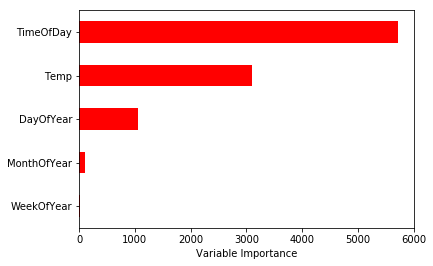

In [119]:
Importance = pd.DataFrame({'Importance':catb_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

# KAGGLE NOT

Tree Ensembles:In statistics and machine learning, ensemble methods use multiple learning algorithms to obtain better predictive performance than could be obtained from any of the constituent learning algorithms alone.

Random Forest: A random forest is a meta estimator that fits a number of decision trees on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.

Extra Trees: In extremely randomized trees, randomness goes one step further in the way splits are computed. As in random forests, a random subset of candidate features is used, but instead of looking for the most discriminative thresholds, thresholds are drawn at random for each candidate feature and the best of these randomly-generated thresholds is picked as the splitting rule. This usually allows to reduce the variance of the model a bit more, at the expense of a slightly greater increase in bias.

Gradient Boosting: Boosting is a method of converting weak learners into strong learners. In boosting, each new tree is a fit on a modified version of the original data set. The gradient boosting algorithm begins by training a decision tree in which each observation is assigned an equal weight. After evaluating the first tree, we increase the weights of those observations that are difficult to fit and lower the weights for those that are easy to fit. The second tree is therefore grown on this weighted data. Here, the idea is to improve upon the predictions of the first tree.

Light GBM: Light GBM grows tree vertically while other algorithm grows trees horizontally meaning that Light GBM grows tree leaf-wise while other algorithms grow level-wise. It will choose the leaf with max delta loss to grow. When growing the same leaf, Leaf-wise algorithm can reduce more loss than a level-wise algorithm.

XG Boost: XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework. XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way.

XG Boost RF XGBoost RF is an optimized distributed gradient boosting library combining the features of random forests with gradient boosting.

Cat Boost: “CatBoost” name comes from two words “Category” and “Boosting”. For fitting a model on some data generally, we are required to convert categorical data into the numerical format. using several pre-processing methods like “label encoding”, “one hot encoding” and others. But catboost can use categorical features directly and is scalable in nature.

In [355]:
from sklearn.model_selection import KFold, RandomizedSearchCV
from sklearn.dummy import DummyRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

kf = KFold(shuffle=True, random_state=19)

In [ ]:
scores = []
rmse = []
mae = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    model = DummyRegressor(strategy='mean').fit(X_train, y_train)
    scores.append(model.score(X_test, y_test))
    rmse.append(np.sqrt(mean_squared_error(y_test, model.predict(X_test))))
    mae.append(mean_absolute_error(y_test, model.predict(X_test)))
    
print('Mean R2 Score:', round(np.mean(scores), 5))
print('Mean RMSE:', round(np.mean(rmse), 5))
print('Mean MAE:', round(np.mean(mae), 5))

In [ ]:
%%time

scores = []
rmse = []
mae = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    dtmodel = DecisionTreeRegressor(random_state=19).fit(X_train, y_train)
    scores.append(dtmodel.score(X_test, y_test))
    rmse.append(np.sqrt(mean_squared_error(y_test, dtmodel.predict(X_test))))
    mae.append(mean_absolute_error(y_test, dtmodel.predict(X_test)))
    
print('Mean R2 Score:', round(np.mean(scores), 5))
print('Mean RMSE:', round(np.mean(rmse), 5))
print('Mean MAE:', round(np.mean(mae), 5))

In [354]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from catboost import CatBoostRegressor

trees = {
    'RandomForest': RandomForestRegressor(random_state=19), 'ExtraTrees': ExtraTreesRegressor(random_state=19),
    'GradientBoosting': GradientBoostingRegressor(random_state=19), 'LightGBM': LGBMRegressor(random_state=19),
    'XGBoost': XGBRegressor(random_state=19), 'XGBoostRF': XGBRFRegressor(random_state=19), 
    'CatBoost': CatBoostRegressor(random_state=19, silent=True)
}

In [ ]:
performance = {'rmse':[], '100* r2':[], 'mae':[]}
for name, model in trees.items():
    scores = []
    rmse = []
    mae = []

    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        model = model.fit(X_train, y_train)
        scores.append(100*model.score(X_test, y_test))
        rmse.append(np.sqrt(mean_squared_error(y_test, model.predict(X_test))))
        mae.append(mean_absolute_error(y_test, model.predict(X_test)))
    performance['100* r2'].append(np.mean(scores))
    performance['rmse'].append(np.mean(rmse))
    performance['mae'].append(np.mean(mae))

In [ ]:
fig = px.bar(pd.DataFrame(performance, index=trees.keys()), barmode='group', title='Model Comparison')
fig.show()

In [ ]:
feat_imp = {
    k: trees[k].feature_importances_ for k, v in trees.items()
}
feat_imp['DecisionTree'] = dtmodel.feature_importances_
feat_imp = pd.DataFrame(feat_imp)

feat_imp /= feat_imp.sum()
feat_imp.index = feats

fig, ax= plt.subplots(figsize=(20, 6))
fig.suptitle('Feature Importance', fontsize=18)
pd.DataFrame(feat_imp).plot.bar(ax=ax, color=sns.color_palette("summer", 8))

In [ ]:
plt.figure(figsize=(12,10))
sns.scatterplot(y_test,y_pred)

NameError: name 'findata' is not defined

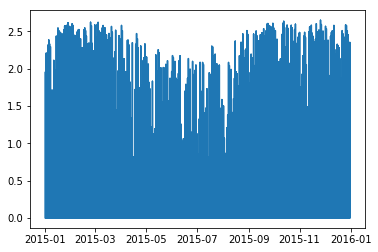

In [361]:
plt.plot(y)
plt.plot(regressor.predict(findata))

In [ ]:
regressor.score(findata,y)

In [44]:
# https://www.kaggle.com/soheilarouhi/solar-radiation-prediction

In [ ]:
plt.rcParams['figure.figsize'] = (16,8)
months = np.arange(9,13)
rad_vs_month=data.loc[:, ['Radiation', 'month']].groupby('month').sum()
rad_vs_month.plot()
plt.xticks(months,['September', 'October', 'November', 'December'], rotation=30)
plt.show()

In [ ]:
########################################## Exploratory Data Analysis ###################################################
plt.figure(figsize=(12,8))
sns.barplot(x=data['Temperature'],y=data['Radiation'])
plt.xlabel('Temperature (F)')
plt.ylabel('Radiation (W/m2)')
plt.title('Radiation versus Temperature')
plt.show()

In [ ]:
############################################ Building Random Forest model  #############################################
rf=RandomForestRegressor()

# finding the best parameters by RandomizedSearchCV
param_rf = {'bootstrap':['False'], 'n_estimators': [500], "max_depth": [20], "max_features": np.arange(3,5).tolist(), "min_samples_leaf": np.arange(80,100).tolist(), "criterion": ["mse"]}
rf_cv=RandomizedSearchCV(rf, param_rf, cv=2)

# Extract the best estimator
rf_cv.fit(X, np.ravel(y))

best_model = rf_cv.best_estimator_
print(best_model)
y_pred_rf=best_model.predict(X_validation)
Result['Predicted_Radiation_RF']=y_pred_rf
rmse = np.sqrt(mean_squared_error(y_validation, y_pred_rf))
print("Root Mean Squared Error RF: {}".format(rmse))

In [ ]:
################################################ Build XGBoost model ###################################################

xgb = XGBRegressor(max_depth=35, random_state=42, n_estimators=1500, learning_rate=0.005, booster='gbtree', objective='reg:squarederror', min_child_weight=0.1, silent=1, n_jobs=10)

xgb.fit(X, y.values.ravel())
y_pred=xgb.predict(X_validation)

predicted=pd.DataFrame(y_pred)
Result['Predicted_Radiation_XGBoost']=y_pred

rmse = np.sqrt(mean_squared_error(y_validation, y_pred))
print("Root Mean Squared Error XGBoost: {}".format(rmse))

feat_imp = pd.Series(xgb.feature_importances_, index= X.columns).sort_values(ascending=True)
feat_imp.plot(kind='barh', title='Feature Importances XGBoost') # note: there in no feature importance for lgbm
plt.ylabel('Feature Importance Score')
plt.show()

In [ ]:
######################################### Build lightGB model ####################################################
X_lgb = X.values

params = {
      'num_leaves': 700,
      'min_child_weight': 0.34,
      'feature_fraction': 0.979,
      'bagging_fraction': 0.818,
      'min_data_in_leaf': 700,
      'objective': 'regression',
      'max_depth': 40,
      'learning_rate': 0.1,
      "boosting_type": "gbdt",
      "bagging_seed": 11,
      "metric": 'rmse',
      "verbosity": -1,
      'reg_alpha': 0.0001,
      'reg_lambda': 2.9,
      'random_state': 666,
    }

lgb_train = lgb.Dataset(X.values, label=y_lgb.values)
# Train LightGBM model
m_lgb = lgb.train(params, lgb_train, 400)
y_pred_lgb=m_lgb.predict(X_validation)
#print(np.round(y_pred_lgb[0], 6))

Result['Predicted_Radiation_LGB']=y_pred_lgb
print(Result.loc[:, ['Predicted_Radiation_XGBoost', 'Radiation']].head())

rmse_lgb = np.sqrt(mean_squared_error(y_validation, y_pred_lgb))
print("Root Mean Squared Error LGBM: {}".format(rmse_lgb))

In [ ]:
######################################### Performance comparison #######################################################
Result=Result.rename({'Radiation':'Radiation_observed'}, axis=1)
Result.plot(figsize=(20,12))
plt.ylabel('Radiation(W/m2)')
plt.title('Performance of different models in prediction of Radiation for 30 and 31 December 2016')
plt.xlabel('Date and Time')
plt.show()

In [ ]:
g = sns.jointplot(x="Radiation", y="Temperature", data=df)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Temp vs. Radiation')

In [ ]:
# https://www.kaggle.com/plarmuseau/pysolar-dataset-exploration-and-r99-88

# MAKINE OGRENMESI GOREVLERININ OTOMATIKLESTIRILMESI

In [ ]:
df = pd.read_csv("Hitters.csv")
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])

In [ ]:
def compML(df, y, alg):
    #train-test ayrimi
    y = df[y]
    X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
    X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25,random_state=42)
    #modelleme
    model = alg().fit(X_train, y_train)
    y_pred = model.predict(X_test)
    RMSE = np.sqrt(mean_squared_error(y_test, y_pred))
    model_ismi = alg.__name__
    print(model_ismi, "Modeli Test Hatası:",RMSE)

In [ ]:
compML(df, "Salary", SVR)

In [ ]:
models = [LGBMRegressor, 
          XGBRegressor, 
          GradientBoostingRegressor, 
          RandomForestRegressor, 
          DecisionTreeRegressor,
          MLPRegressor,
          KNeighborsRegressor, 
          SVR]

In [ ]:
for i in models:
    compML(df, "Salary", i)

# Rüzgar Tahmin

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import statsmodels.api as sm
import tensorflow as tf
import xgboost as xgb
import pytz
import re
from datetime import datetime
from pytz import timezone
from sklearn import preprocessing
from sklearn import model_selection
from sklearn import neighbors
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
from tensorflow.keras.layers import Dense,Activation,Dropout
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.models import Sequential
from collections import Counter
from scipy import stats
from sklearn.linear_model import LinearRegression, BayesianRidge, Ridge ,Lasso ,ElasticNet, LassoLarsIC
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import KFold,RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, scale, LabelEncoder  
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from warnings import filterwarnings
filterwarnings('ignore')

In [38]:
df = pd.read_csv("solar_predict_t.csv")
df.columns=["Date","Time","Power","Load","Temp","Wind Velocity","nan"]
df

,Date,Time,Power,Load,Temp,Wind Velocity,nan
0,1/1/2015,12:00:00 AM,0.000,0.468530,23.724,9.0104,NaN
1,1/1/2015,1:00:00 AM,0.000,0.421974,23.117,8.2059,NaN
2,1/1/2015,2:00:00 AM,0.000,0.431844,22.713,7.8841,NaN
3,1/1/2015,3:00:00 AM,0.000,0.408764,22.197,7.8841,NaN
4,1/1/2015,4:00:00 AM,0.000,0.388010,21.737,7.8841,NaN
...,...,...,...,...,...,...,...
8755,12/31/2015,7:00:00 PM,0.059,1.448452,30.603,9.4931,NaN
8756,12/31/2015,8:00:00 PM,0.000,1.309085,28.025,8.8495,NaN
8757,12/31/2015,9:00:00 PM,0.000,1.152608,26.521,8.6886,NaN
8758,12/31/2015,10:00:00 PM,0.000,1.020149,25.404,9.1713,NaN


In [39]:
from datetime import datetime
from pytz import timezone
import pytz
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
df.drop(["Power",'Load',"nan"], axis=1, inplace=True)
df

,Date,Time,Temp,Wind Velocity
Date,,,,
2015-01-01,1/1/2015,12:00:00 AM,23.724,9.0104
2015-01-01,1/1/2015,1:00:00 AM,23.117,8.2059
2015-01-01,1/1/2015,2:00:00 AM,22.713,7.8841
2015-01-01,1/1/2015,3:00:00 AM,22.197,7.8841
2015-01-01,1/1/2015,4:00:00 AM,21.737,7.8841
...,...,...,...,...
2015-12-31,12/31/2015,7:00:00 PM,30.603,9.4931
2015-12-31,12/31/2015,8:00:00 PM,28.025,8.8495
2015-12-31,12/31/2015,9:00:00 PM,26.521,8.6886


In [40]:
df['MonthOfYear'] = df.index.strftime('%m').astype(int)
df['DayOfYear'] = df.index.strftime('%j').astype(int)
df['WeekOfYear'] = df.index.strftime('%U').astype(int)

In [41]:
df.index=df.iloc[:,1]
df.index = pd.to_datetime(df.index)
df['TimeOfDay'] = df.index.hour
df.tail(50)

,Date,Time,Temp,Wind Velocity,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay
Time,,,,,,,,
2020-12-26 22:00:00,12/29/2015,10:00:00 PM,22.418,9.4931,12,363,52,22
2020-12-26 23:00:00,12/29/2015,11:00:00 PM,21.795,9.0104,12,363,52,23
2020-12-26 00:00:00,12/30/2015,12:00:00 AM,21.398,9.0104,12,364,52,0
2020-12-26 01:00:00,12/30/2015,1:00:00 AM,21.062,8.2059,12,364,52,1
2020-12-26 02:00:00,12/30/2015,2:00:00 AM,20.730,8.0450,12,364,52,2
2020-12-26 03:00:00,12/30/2015,3:00:00 AM,20.639,7.8841,12,364,52,3
2020-12-26 04:00:00,12/30/2015,4:00:00 AM,20.950,7.8841,12,364,52,4
2020-12-26 05:00:00,12/30/2015,5:00:00 AM,21.459,7.8841,12,364,52,5
2020-12-26 06:00:00,12/30/2015,6:00:00 AM,22.896,8.8495,12,364,52,6


In [42]:
df.describe()

,Temp,Wind Velocity,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,16.518688,12.252645,6.525342,182.979224,26.139498,11.500000
std,6.806605,4.943233,3.447954,105.371450,15.057713,6.922582
min,1.345000,5.309700,1.000000,1.000000,0.000000,0.000000
25%,11.425500,8.205900,4.000000,92.000000,13.000000,5.750000
50%,15.184000,10.297600,7.000000,183.000000,26.000000,11.500000
75%,20.751750,16.411800,10.000000,274.000000,39.000000,17.250000
max,39.704000,23.974100,12.000000,365.000000,52.000000,23.000000


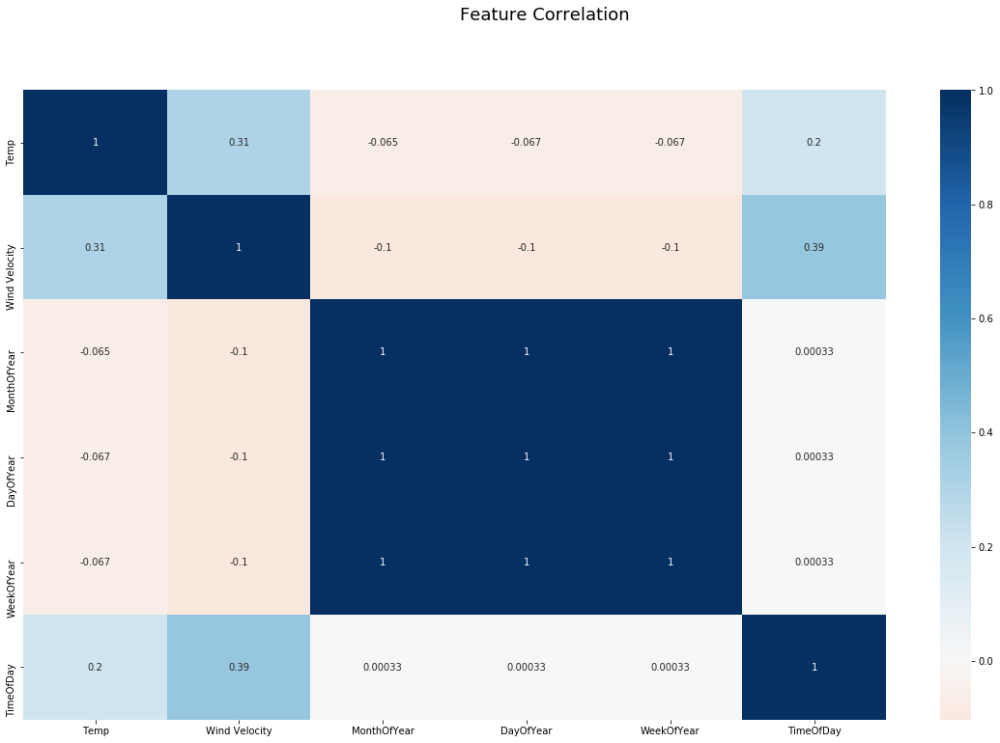

In [43]:
fig = plt.figure(figsize=(20, 12))
fig.suptitle('Feature Correlation', fontsize=18)
sns.heatmap(df.corr(), annot=True, cmap='RdBu', center=0)

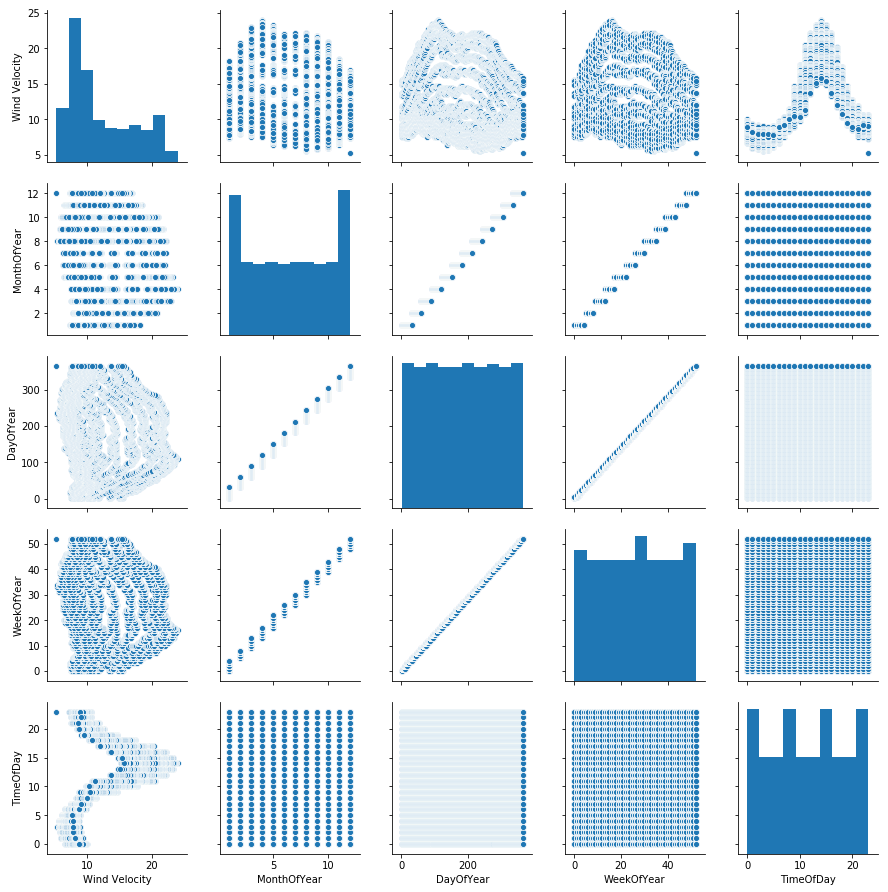

In [21]:
sns.pairplot(df);

In [45]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,3:4]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
lm = sm.OLS(y, X)
model= lm.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Wind Velocity   R-squared:                       0.869
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                 1.161e+04
Date:                Sat, 26 Dec 2020   Prob (F-statistic):               0.00
Time:                        18:42:53   Log-Likelihood:                -26141.
No. Observations:                8760   AIC:                         5.229e+04
Df Residuals:                    8755   BIC:                         5.233e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
MonthOfYear     3.0760      0.155     19.781      0.000       2.771       3.381
DayOfYear      -0.1091      0.026     -4.192      0.000      -0.160      -0.058
WeekOfYear      0.0934      0.179      0.522      0.602      -0.258       0.445
TimeOfDay       0.3254      0.007     45.225      0.000       0.311       0.340
Temp            0.3315      0.006     52.260      0.000       0.319       0.344
==============================================================================
Omnibus:                      173.324   Durbin-Watson:                   0.159
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              161.354
Skew:                           0.290   Prob(JB):                     9.17e-36
Kurtosis:                       2.675   Cond. No.                         758.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# LGBM

In [98]:
X = df[['MonthOfYear',"TimeOfDay","Temp","DayOfYear"]]
y = df.iloc[:,3:4]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
from lightgbm import LGBMRegressor
lgb_model = LGBMRegressor().fit(X_train, y_train)
y_pred = lgb_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.22097091135322544

In [99]:
y

,Wind Velocity
Date,
2015-01-01,9.0104
2015-01-01,8.2059
2015-01-01,7.8841
2015-01-01,7.8841
2015-01-01,7.8841
...,...
2015-12-31,9.4931
2015-12-31,8.8495
2015-12-31,8.6886


In [100]:
X

,MonthOfYear,TimeOfDay,Temp,DayOfYear
Date,,,,
2015-01-01,1,0,23.724,1
2015-01-01,1,1,23.117,1
2015-01-01,1,2,22.713,1
2015-01-01,1,3,22.197,1
2015-01-01,1,4,21.737,1
...,...,...,...,...
2015-12-31,12,19,30.603,365
2015-12-31,12,20,28.025,365
2015-12-31,12,21,26.521,365


In [101]:
lgb_model = LGBMRegressor()
lgbm_params = {"learning_rate": [0.01, 0.1, 0.5, 1],
              "n_estimators": [20,40,100,200,500,1000],
              "max_depth": [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16],
              'min_data_in_leaf':[300],
              "feature_fraction":[0.8],
               'bagging_fraction':[0.8],
               'bagging_freq':[10],
               'num_leaves':[70],
              }

In [102]:
lgbm_cv_model = GridSearchCV(lgb_model, 
                             lgbm_params, 
                             cv = 10,  
                             verbose =2).fit(X_train, y_train)

Fitting 10 folds for each of 384 candidates, totalling 3840 fits
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, n

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, ba

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, 

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=8, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=11, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=12, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fract

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=15, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.01, max_depth=16, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, baggin

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=1

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, 

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, 

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.1, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=3, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=7, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, baggin

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=8, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=11, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, 

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=13, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8,

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagg

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=0.5, max_depth=16, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bag

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=1, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.8s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=2, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10,

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=3, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=4, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fra

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=5, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.4s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, 

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.7s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=6, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=7, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fra

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.1s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=8, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fr

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.5s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=9, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=10, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, fea

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=11, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=12, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=13, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=20, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=20, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feat

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=200, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=200, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=14, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_f

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=100, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=100, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=1000, num_leaves=70, total=   0.6s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=15, min_data_in_leaf=300, n_estimators=1000, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_fr

[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=40, num_leaves=70, total=   0.0s
[CV] bagging_fraction=0.8, bagging_freq=10, featu

[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.2s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=500, num_leaves=70, total=   0.3s
[CV] bagging_fraction=0.8, bagging_freq=10, feature_fraction=0.8, learning_rate=1, max_depth=16, min_data_in_leaf=300, n_estimators=500, num_leaves=70 
[CV]  bagging_fraction=0.8, bagging_freq=10

[Parallel(n_jobs=1)]: Done 3840 out of 3840 | elapsed: 16.7min finished


In [103]:
lgbm_cv_model.best_params_

{'bagging_fraction': 0.8,
 'bagging_freq': 10,
 'feature_fraction': 0.8,
 'learning_rate': 0.5,
 'max_depth': 11,
 'min_data_in_leaf': 300,
 'n_estimators': 1000,
 'num_leaves': 70}

In [104]:
lgbm_tuned = LGBMRegressor(learning_rate = 0.5, 
                          max_depth = 11, 
                          n_estimators = 1000,
                          min_data_in_leaf=300,
                          feature_fraction=0.8,
                          bagging_fraction=0.8,
                          bagging_freq=10,
                          num_leaves=70).fit(X_train, y_train)

In [105]:
ypred=lgbm_tuned.predict(X_test)
print("mse = ",np.sqrt(mean_squared_error(y_test,ypred)))
model=r2_score(y_test, y_pred)
print('r2 = {}'.format(model))

mse =  0.2959671406163394
r2 = 0.9979585258386833


In [107]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  lgbm_tuned.predict(df[['MonthOfYear', "TimeOfDay","Temp","DayOfYear"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="FV Elektrik Üretim Tahmini",
           x_axis_label='Tarih ve Zaman',
           y_axis_label='Elektrik Üretimi[kW]',
           x_axis_type="datetime")

p.line(df.index, df['Wind Velocity'], legend='Gözlemlenen Elektrik Üretimi', line_width=1)
p.line(df.index, df['y_pred'], legend='Tahmin edilen Elektrik Üretimi ', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

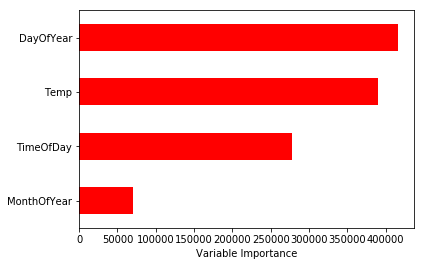

In [108]:
Importance = pd.DataFrame({'Importance':lgbm_tuned.feature_importances_*100}, 
                          index = X_train.columns)


Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = 'r', )

plt.xlabel('Variable Importance')
plt.gca().legend_ = None

In [118]:
print("---------------1-1------------")
print(lgbm_tuned.predict([[12,0,15,1]]))
print(lgbm_tuned.predict([[12,1,15,1]]))
print(lgbm_tuned.predict([[12,2,14,1]]))
print(lgbm_tuned.predict([[12,3,14,1]]))
print(lgbm_tuned.predict([[12,4,14,1]]))
print(lgbm_tuned.predict([[12,5,14,1]]))
print(lgbm_tuned.predict([[12,6,15,1]]))
print(lgbm_tuned.predict([[12,7,16,1]]))
print(lgbm_tuned.predict([[12,8,17,1]]))
print(lgbm_tuned.predict([[12,9,17,1]]))
print(lgbm_tuned.predict([[12,10,18,1]]))
print(lgbm_tuned.predict([[12,11,18,1]]))
print(lgbm_tuned.predict([[12,12,17,1]]))
print(lgbm_tuned.predict([[12,13,18,1]]))
print(lgbm_tuned.predict([[12,14,19,1]]))
print(lgbm_tuned.predict([[12,15,18,1]]))
print(lgbm_tuned.predict([[12,16,17,1]]))
print(lgbm_tuned.predict([[12,17,16,1]]))
print(lgbm_tuned.predict([[12,18,15,1]]))
print(lgbm_tuned.predict([[12,19,14,1]]))
print(lgbm_tuned.predict([[12,20,13,1]]))
print(lgbm_tuned.predict([[12,21,13,1]]))
print(lgbm_tuned.predict([[12,22,12,1]]))
print(lgbm_tuned.predict([[12,23,12,1]]))
print("---------------1-4------------")
print(lgbm_tuned.predict([[4,0,21,1]]))
print(lgbm_tuned.predict([[4,1,21,1]]))
print(lgbm_tuned.predict([[4,2,20,1]]))
print(lgbm_tuned.predict([[4,3,20,1]]))
print(lgbm_tuned.predict([[4,4,20,1]]))
print(lgbm_tuned.predict([[4,5,19,1]]))
print(lgbm_tuned.predict([[4,6,19,1]]))
print(lgbm_tuned.predict([[4,7,20,1]]))
print(lgbm_tuned.predict([[4,8,21,1]]))
print(lgbm_tuned.predict([[4,9,23,1]]))
print(lgbm_tuned.predict([[4,10,24,1]]))
print(lgbm_tuned.predict([[4,11,26,1]]))
print(lgbm_tuned.predict([[4,12,27,1]]))
print(lgbm_tuned.predict([[4,13,27,1]]))
print(lgbm_tuned.predict([[4,14,27,1]]))
print(lgbm_tuned.predict([[4,15,25,1]]))
print(lgbm_tuned.predict([[4,16,23,1]]))
print(lgbm_tuned.predict([[4,17,22,1]]))
print(lgbm_tuned.predict([[4,18,20,1]]))
print(lgbm_tuned.predict([[4,19,20,1]]))
print(lgbm_tuned.predict([[4,20,19,1]]))
print(lgbm_tuned.predict([[4,21,18,1]]))
print(lgbm_tuned.predict([[4,22,18,1]]))
print(lgbm_tuned.predict([[4,23,17,1]]))
print("---------------1-7------------")
print(lgbm_tuned.predict([[7,0,8,1]]))
print(lgbm_tuned.predict([[7,1,7,1]]))
print(lgbm_tuned.predict([[7,2,6,1]]))
print(lgbm_tuned.predict([[7,3,6,1]]))
print(lgbm_tuned.predict([[7,4,5,1]]))
print(lgbm_tuned.predict([[7,5,5,1]]))
print(lgbm_tuned.predict([[7,6,5,1]]))
print(lgbm_tuned.predict([[7,7,4,1]]))
print(lgbm_tuned.predict([[7,8,5,1]]))
print(lgbm_tuned.predict([[7,9,8,1]]))
print(lgbm_tuned.predict([[7,10,10,1]]))
print(lgbm_tuned.predict([[7,11,11,1]]))
print(lgbm_tuned.predict([[7,12,12,1]]))
print(lgbm_tuned.predict([[7,13,13,1]]))
print(lgbm_tuned.predict([[7,14,13,1]]))
print(lgbm_tuned.predict([[7,15,12,1]]))
print(lgbm_tuned.predict([[7,16,11,1]]))
print(lgbm_tuned.predict([[7,17,10,1]]))
print(lgbm_tuned.predict([[7,18,10,1]]))
print(lgbm_tuned.predict([[7,19,9,1]]))
print(lgbm_tuned.predict([[7,20,9,1]]))
print(lgbm_tuned.predict([[7,21,8,1]]))
print(lgbm_tuned.predict([[7,22,8,1]]))
print(lgbm_tuned.predict([[7,23,7,1]]))
print("---------------1-10------------")
print(lgbm_tuned.predict([[10,0,12,1]]))
print(lgbm_tuned.predict([[10,1,12,1]]))
print(lgbm_tuned.predict([[10,2,11,1]]))
print(lgbm_tuned.predict([[10,3,10,1]]))
print(lgbm_tuned.predict([[10,4,10,1]]))
print(lgbm_tuned.predict([[10,5,10,1]]))
print(lgbm_tuned.predict([[10,6,9,1]]))
print(lgbm_tuned.predict([[10,7,11,1]]))
print(lgbm_tuned.predict([[10,8,14,1]]))
print(lgbm_tuned.predict([[10,9,17,1]]))
print(lgbm_tuned.predict([[10,10,20,1]]))
print(lgbm_tuned.predict([[10,11,21,1]]))
print(lgbm_tuned.predict([[10,12,22,1]]))
print(lgbm_tuned.predict([[10,13,23,1]]))
print(lgbm_tuned.predict([[10,14,23,1]]))
print(lgbm_tuned.predict([[10,15,23,1]]))
print(lgbm_tuned.predict([[10,16,22,1]]))
print(lgbm_tuned.predict([[10,17,21,1]]))
print(lgbm_tuned.predict([[10,18,18,1]]))
print(lgbm_tuned.predict([[10,19,16,1]]))
print(lgbm_tuned.predict([[10,20,15,1]]))
print(lgbm_tuned.predict([[10,21,14,1]]))
print(lgbm_tuned.predict([[10,22,13,1]]))
print(lgbm_tuned.predict([[10,23,13,1]]))


---------------1-1------------
[8.2437626]
[8.2437626]
[7.59935904]
[7.50564468]
[7.43634193]
[7.5188946]
[8.34000819]
[8.81519584]
[9.90011969]
[10.13680336]
[10.7464618]
[12.20266829]
[14.3683189]
[16.29727279]
[18.88590896]
[15.90765124]
[14.84694192]
[12.62499758]
[11.64350045]
[9.85267418]
[9.18239361]
[8.61518852]
[8.79867621]
[8.79867621]
---------------1-4------------
[7.8940526]
[7.8940526]
[7.39102747]
[7.27651158]
[7.40896579]
[7.15442473]
[8.27340764]
[9.11031956]
[9.8571988]
[10.24083652]
[10.67141585]
[12.69034368]
[14.91510549]
[16.40102958]
[16.99664845]
[16.50387629]
[15.48068372]
[13.51068898]
[11.73937061]
[10.3141148]
[9.4542069]
[8.60818877]
[8.610113]
[8.59516321]
---------------1-7------------
[7.75779342]
[7.67545707]
[7.15447244]
[7.02039568]
[7.03572879]
[7.43046239]
[8.24913452]
[8.9620303]
[10.1105522]
[10.97196526]
[12.86307625]
[13.47788851]
[15.30595012]
[16.47522164]
[16.66541129]
[16.40246332]
[15.25669232]
[14.01621395]
[11.99048556]
[10.48855947]
[10.

# RANDOM FOREST

In [125]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,2:3]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train, y_train)
feature_importances = regressor.feature_importances_

X_train_best = X_train[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
X_test_best = X_test[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
regressor.fit(X_train_best, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [21]:
accuracies = cross_val_score(estimator = regressor, X = X_train_best,y = y_train, cv = 10, scoring = 'r2',verbose=2)
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s remaining:    0.0s


[CV] ................................................. , total=   1.1s
[CV]  ................................................................
[CV] ................................................. , total=   1.2s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] ................................................. , total=   0.9s
[CV]  ................................................................
[CV] ................................................. , total=   1.0s
[CV]  ................................................................
[CV] .

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   11.0s finished


In [126]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  regressor.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df['Power'], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

In [69]:
# Sydney 18 aralık hava durumu
print("prediction of values for random forest regression")
print("---------------18-12-2020----------")
print(regressor.predict([[12,18,3,0,23]]))
print(regressor.predict([[12,18,3,1,22]]))
print(regressor.predict([[12,18,3,2,22]]))
print(regressor.predict([[12,18,3,3,22]]))
print(regressor.predict([[12,18,3,4,22]]))
print(regressor.predict([[12,18,3,5,22]]))
print(regressor.predict([[12,18,3,6,22]]))
print(regressor.predict([[12,18,3,7,23]]))
print(regressor.predict([[12,18,3,8,25]]))
print(regressor.predict([[12,18,3,9,27]]))
print(regressor.predict([[12,18,3,10,29]]))
print(regressor.predict([[12,18,3,11,30]]))
print(regressor.predict([[12,18,3,12,30]]))
print(regressor.predict([[12,18,3,13,27]]))
print(regressor.predict([[12,18,3,14,27]]))
print(regressor.predict([[12,18,3,15,27]]))
print(regressor.predict([[12,18,3,16,26]]))
print(regressor.predict([[12,18,3,17,25]]))
print(regressor.predict([[12,18,3,18,25]]))
print(regressor.predict([[12,18,3,19,24]]))
print(regressor.predict([[12,18,3,20,23]]))
print(regressor.predict([[12,18,3,21,23]]))
print(regressor.predict([[12,18,3,22,23]]))
print(regressor.predict([[12,18,3,23,23]]))
print("---------------18-01-2020-----------------")
print(regressor.predict([[12,18,3,0,19]]))
print(regressor.predict([[12,18,3,1,17]]))
print(regressor.predict([[12,18,3,2,17]]))
print(regressor.predict([[12,18,3,3,17]]))
print(regressor.predict([[12,18,3,4,16]]))
print(regressor.predict([[12,18,3,5,16]]))
print(regressor.predict([[12,18,3,6,18]]))
print(regressor.predict([[12,18,3,7,17]]))
print(regressor.predict([[12,18,3,8,18]]))
print(regressor.predict([[12,18,3,9,18]]))
print(regressor.predict([[12,18,3,10,19]]))
print(regressor.predict([[12,18,3,11,20]]))
print(regressor.predict([[12,18,3,12,20]]))
print(regressor.predict([[12,18,3,13,21]]))
print(regressor.predict([[12,18,3,14,22]]))
print(regressor.predict([[12,18,3,15,23]]))
print(regressor.predict([[12,18,3,16,22]]))
print(regressor.predict([[12,18,3,17,22]]))
print(regressor.predict([[12,18,3,18,22]]))
print(regressor.predict([[12,18,3,19,22]]))
print(regressor.predict([[12,18,3,20,22]]))
print(regressor.predict([[12,18,3,21,22]]))
print(regressor.predict([[12,18,3,22,22]]))
print(regressor.predict([[12,18,3,23,21]]))


prediction of values for random forest regression
---------------18-12-2020----------
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[0.14331]
[0.39009]
[1.14871]
[1.05258]
[1.65502]
[2.13674]
[2.12717]
[2.3602]
[2.23401]
[1.71173]
[1.36374]
[0.91805]
[0.3476]
[0.02974]
[0.]
[0.]
[0.]
[0.]
---------------18-01-2020-----------------
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[0.14331]
[0.39009]
[1.14871]
[1.05258]
[1.65502]
[2.13674]
[2.12717]
[2.3602]
[2.23401]
[1.71173]
[1.36374]
[0.91805]
[0.3476]
[0.02974]
[0.]
[0.]
[0.]
[0.]


# RANDOM FOREST

In [78]:
X = df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
y = df.iloc[:,3:4]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train, y_train)
feature_importances = regressor.feature_importances_

X_train_best = X_train[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
X_test_best = X_test[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]]
regressor.fit(X_train_best, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [79]:
accuracies = cross_val_score(estimator = regressor, X = X_train_best,y = y_train, cv = 10, scoring = 'r2',verbose=2)
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] ................................................. , total=   1.3s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s


[CV] ................................................. , total=   1.3s
[CV]  ................................................................
[CV] ................................................. , total=   1.4s
[CV]  ................................................................
[CV] ................................................. , total=   1.3s
[CV]  ................................................................
[CV] ................................................. , total=   1.2s
[CV]  ................................................................
[CV] ................................................. , total=   1.2s
[CV]  ................................................................
[CV] ................................................. , total=   1.2s
[CV]  ................................................................
[CV] ................................................. , total=   1.4s
[CV]  ................................................................
[CV] .

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.9s finished


In [84]:
df.index=df.iloc[:,0]
df.index = pd.to_datetime(df.index)
# Predicting for whole dataset
df['y_pred'] =  regressor.predict(df[['MonthOfYear', 'DayOfYear', 'WeekOfYear',"TimeOfDay","Temp"]])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="PV Electricity Consumption Prediction",
           x_axis_label='Date and Time',
           y_axis_label='Electricity Consumption',
           x_axis_type="datetime")

p.line(df.index, df["Wind Velocity"], legend='Observed Electricity Consumption', line_width=1)
p.line(df.index, df['y_pred'], legend='Predicted Electricity Consumption', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

In [69]:
# Sydney 18 aralık hava durumu
print("prediction of values for random forest regression")
print("---------------18-12-2020----------")
print(regressor.predict([[12,18,3,0,23]]))
print(regressor.predict([[12,18,3,1,22]]))
print(regressor.predict([[12,18,3,2,22]]))
print(regressor.predict([[12,18,3,3,22]]))
print(regressor.predict([[12,18,3,4,22]]))
print(regressor.predict([[12,18,3,5,22]]))
print(regressor.predict([[12,18,3,6,22]]))
print(regressor.predict([[12,18,3,7,23]]))
print(regressor.predict([[12,18,3,8,25]]))
print(regressor.predict([[12,18,3,9,27]]))
print(regressor.predict([[12,18,3,10,29]]))
print(regressor.predict([[12,18,3,11,30]]))
print(regressor.predict([[12,18,3,12,30]]))
print(regressor.predict([[12,18,3,13,27]]))
print(regressor.predict([[12,18,3,14,27]]))
print(regressor.predict([[12,18,3,15,27]]))
print(regressor.predict([[12,18,3,16,26]]))
print(regressor.predict([[12,18,3,17,25]]))
print(regressor.predict([[12,18,3,18,25]]))
print(regressor.predict([[12,18,3,19,24]]))
print(regressor.predict([[12,18,3,20,23]]))
print(regressor.predict([[12,18,3,21,23]]))
print(regressor.predict([[12,18,3,22,23]]))
print(regressor.predict([[12,18,3,23,23]]))
print("---------------18-01-2020-----------------")
print(regressor.predict([[12,18,3,0,19]]))
print(regressor.predict([[12,18,3,1,17]]))
print(regressor.predict([[12,18,3,2,17]]))
print(regressor.predict([[12,18,3,3,17]]))
print(regressor.predict([[12,18,3,4,16]]))
print(regressor.predict([[12,18,3,5,16]]))
print(regressor.predict([[12,18,3,6,18]]))
print(regressor.predict([[12,18,3,7,17]]))
print(regressor.predict([[12,18,3,8,18]]))
print(regressor.predict([[12,18,3,9,18]]))
print(regressor.predict([[12,18,3,10,19]]))
print(regressor.predict([[12,18,3,11,20]]))
print(regressor.predict([[12,18,3,12,20]]))
print(regressor.predict([[12,18,3,13,21]]))
print(regressor.predict([[12,18,3,14,22]]))
print(regressor.predict([[12,18,3,15,23]]))
print(regressor.predict([[12,18,3,16,22]]))
print(regressor.predict([[12,18,3,17,22]]))
print(regressor.predict([[12,18,3,18,22]]))
print(regressor.predict([[12,18,3,19,22]]))
print(regressor.predict([[12,18,3,20,22]]))
print(regressor.predict([[12,18,3,21,22]]))
print(regressor.predict([[12,18,3,22,22]]))
print(regressor.predict([[12,18,3,23,21]]))


prediction of values for random forest regression
---------------18-12-2020----------
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[0.14331]
[0.39009]
[1.14871]
[1.05258]
[1.65502]
[2.13674]
[2.12717]
[2.3602]
[2.23401]
[1.71173]
[1.36374]
[0.91805]
[0.3476]
[0.02974]
[0.]
[0.]
[0.]
[0.]
---------------18-01-2020-----------------
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[6.20027854e-07]
[0.14331]
[0.39009]
[1.14871]
[1.05258]
[1.65502]
[2.13674]
[2.12717]
[2.3602]
[2.23401]
[1.71173]
[1.36374]
[0.91805]
[0.3476]
[0.02974]
[0.]
[0.]
[0.]
[0.]
